In [33]:
import torch
import torch.nn as nn
import torch.nn.init as init
import random
import copy
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
import DeepTreeEnsemble
import torch.nn.functional as F
from importlib import reload
reload(DeepTreeEnsemble)
from DeepTreeEnsemble import DeepTreeEnsemble, create_dataloaders_for_dataset 
# if this ^ doesn't work, try 'pip install -e .' in the root directory of it. Make sure you are in 
# the desired environment. 

In [34]:
train_dataloader, test_dataloader, input_size, output_size = create_dataloaders_for_dataset(dataset_name='covertype', task='classification', batch_size=32)

xtrain size 455
xtest size 114
y_train size 455
y_test size 114


In [35]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_layers, output_size, dropout=.5):
        super(MLP, self).__init__()
        self.layers = nn.ModuleList()
        self.batch_norms = nn.ModuleList()

        # Create the first hidden layer
        self.layers.append(nn.Linear(input_size, hidden_layers[0]))
        self.batch_norms.append(nn.BatchNorm1d(hidden_layers[0]))

        # Create additional hidden layers
        for i in range(1, len(hidden_layers)):
            self.layers.append(nn.Linear(hidden_layers[i-1], hidden_layers[i]))
            self.batch_norms.append(nn.BatchNorm1d(hidden_layers[i]))

        # Output layer
        self.output = nn.Linear(hidden_layers[-1], output_size)

        # Dropout layer
        self.dropout = nn.Dropout(dropout)


    def forward(self, x):
        i = 0
        for layer, batch_norm in zip(self.layers, self.batch_norms):
            # x = F.relu(batch_norm(layer(x)))
            i=i+1
            x = self.dropout(x)
            # print('Layer dtype: ', layer.weight.dtype)
            x = x.to(torch.float32) # <-- area of concern
            # print('tensor dytpe: ', x.dtype)
            # layer.weight = layer.weight.to(torch.float32)
            x = F.relu(batch_norm(layer(x)))
            
            # print(f'dtype is {x.dtype} after layer {i}')

        x = self.output(x)
        return x

# Changing the base
Testing base 4, 6, 8, 10 and 12 with 5 trails each

## Base 4

In [36]:
hidden_layers = [50, 100, 50]
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
DTEmlp4b = DeepTreeEnsemble(task_name='classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=4,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.0001)

Randomly initializing 4 models
Training Model with id 1


in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.50it/s]

Epoch [1/10], Train F1:0.4953400127670883, Train Loss: 1.0580, Train Acc: 0.4893, Test F1:0.5032525133057363, Test Loss: 1.0509, Test Acc: 0.6120


Training Process:  30%|███       | 3/10 [00:00<00:00, 11.91it/s]

Epoch [2/10], Train F1:0.4990397071600079, Train Loss: 1.0570, Train Acc: 0.4897, Test F1:0.5048732943469786, Test Loss: 1.0396, Test Acc: 0.6198
Epoch [3/10], Train F1:0.512843791149062, Train Loss: 1.0527, Train Acc: 0.4946, Test F1:0.5083204334365325, Test Loss: 1.0331, Test Acc: 0.6276


Training Process:  30%|███       | 3/10 [00:00<00:00, 11.91it/s]

Epoch [4/10], Train F1:0.5123198220408531, Train Loss: 1.0484, Train Acc: 0.4980, Test F1:0.5193056577094345, Test Loss: 1.0296, Test Acc: 0.6335


Training Process:  50%|█████     | 5/10 [00:00<00:00, 12.78it/s]

Epoch [5/10], Train F1:0.5089803182346274, Train Loss: 1.0446, Train Acc: 0.4993, Test F1:0.5214908444421061, Test Loss: 1.0282, Test Acc: 0.6354
Epoch [6/10], Train F1:0.5155437591507323, Train Loss: 1.0412, Train Acc: 0.5075, Test F1:0.5200037042425462, Test Loss: 1.0228, Test Acc: 0.6367


Training Process:  70%|███████   | 7/10 [00:00<00:00, 13.26it/s]

Epoch [7/10], Train F1:0.521258849956084, Train Loss: 1.0376, Train Acc: 0.5158, Test F1:0.5274136055560203, Test Loss: 1.0179, Test Acc: 0.6430


Training Process:  90%|█████████ | 9/10 [00:00<00:00, 13.20it/s]

Epoch [8/10], Train F1:0.5227266359421652, Train Loss: 1.0356, Train Acc: 0.5169, Test F1:0.5446436538548957, Test Loss: 1.0143, Test Acc: 0.6533
Epoch [9/10], Train F1:0.5236966172794695, Train Loss: 1.0337, Train Acc: 0.5183, Test F1:0.5577284125368974, Test Loss: 1.0121, Test Acc: 0.6614


Training Process: 100%|██████████| 10/10 [00:00<00:00, 12.83it/s]


Epoch [10/10], Train F1:0.5290932807865297, Train Loss: 1.0325, Train Acc: 0.5221, Test F1:0.5680049008734961, Test Loss: 1.0087, Test Acc: 0.6678
Total Epochs: 10
Train loss start: 1.0585380792617798, Train loss end: 1.1400858163833618
Highest Mean Train Accuracy (over epoch): 0.5221428571428572
Test loss start: 1.0512818098068237, Test loss end: 0.9595645070075989
Highest mean Test Accuracy (over epoch): 0.667795138888889


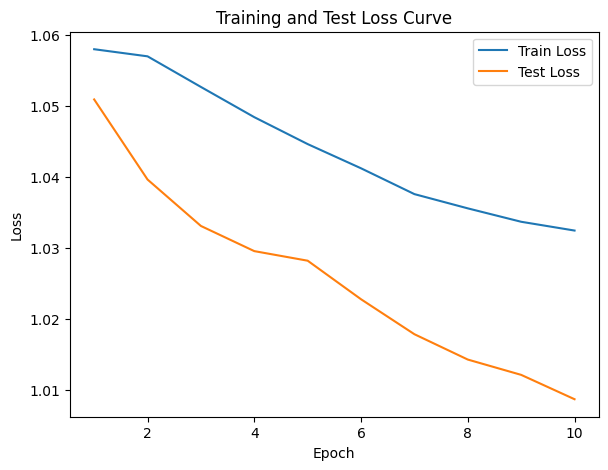

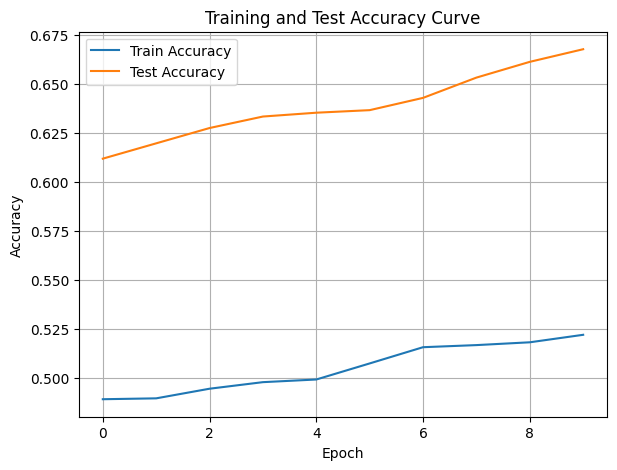

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 14.94it/s]

Epoch [1/10], Train F1:0.5208176589673811, Train Loss: 0.9939, Train Acc: 0.5128, Test F1:0.5064338645596178, Test Loss: 1.0167, Test Acc: 0.5434
Epoch [2/10], Train F1:0.5646111809722781, Train Loss: 0.9825, Train Acc: 0.5536, Test F1:0.4943171325442794, Test Loss: 1.0136, Test Acc: 0.5356


Training Process:  20%|██        | 2/10 [00:00<00:00, 14.94it/s]

Epoch [3/10], Train F1:0.5543062602517359, Train Loss: 0.9787, Train Acc: 0.5523, Test F1:0.5120970546906521, Test Loss: 1.0098, Test Acc: 0.5501


Training Process:  40%|████      | 4/10 [00:00<00:00, 13.80it/s]

Epoch [4/10], Train F1:0.5559423627021877, Train Loss: 0.9760, Train Acc: 0.5516, Test F1:0.517566409597258, Test Loss: 1.0079, Test Acc: 0.5558
Epoch [5/10], Train F1:0.565237341405231, Train Loss: 0.9728, Train Acc: 0.5578, Test F1:0.5264759699909323, Test Loss: 1.0034, Test Acc: 0.5623


Training Process:  60%|██████    | 6/10 [00:00<00:00, 13.29it/s]

Epoch [6/10], Train F1:0.5712673751547432, Train Loss: 0.9701, Train Acc: 0.5632, Test F1:0.5426258456599015, Test Loss: 0.9987, Test Acc: 0.5742


Training Process:  80%|████████  | 8/10 [00:00<00:00, 13.36it/s]

Epoch [7/10], Train F1:0.5775757240196934, Train Loss: 0.9678, Train Acc: 0.5688, Test F1:0.576834763170755, Test Loss: 0.9936, Test Acc: 0.5972
Epoch [8/10], Train F1:0.5850296012389172, Train Loss: 0.9628, Train Acc: 0.5771, Test F1:0.6047736331390887, Test Loss: 0.9896, Test Acc: 0.6182


Training Process:  80%|████████  | 8/10 [00:00<00:00, 13.36it/s]

Epoch [9/10], Train F1:0.5952517100603186, Train Loss: 0.9586, Train Acc: 0.5875, Test F1:0.6132470905880297, Test Loss: 0.9869, Test Acc: 0.6244


Training Process: 100%|██████████| 10/10 [00:00<00:00, 13.30it/s]


Epoch [10/10], Train F1:0.5987149332682892, Train Loss: 0.9568, Train Acc: 0.5905, Test F1:0.614652849685305, Test Loss: 0.9848, Test Acc: 0.6255
Total Epochs: 10
Train loss start: 1.0210398435592651, Train loss end: 0.9636369943618774
Highest Mean Train Accuracy (over epoch): 0.5904761904761905
Test loss start: 1.0308077335357666, Test loss end: 0.9488686323165894
Highest mean Test Accuracy (over epoch): 0.6255208333333334


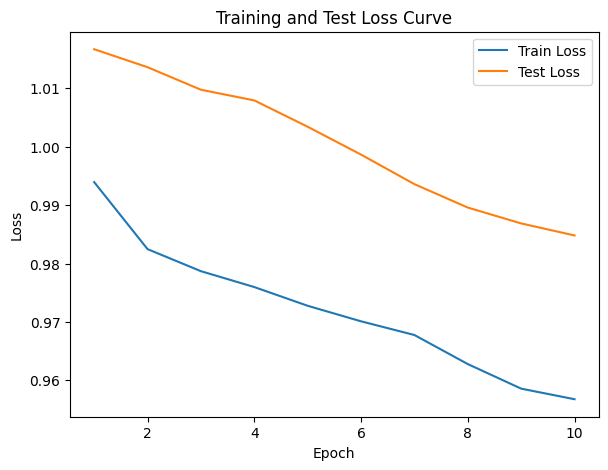

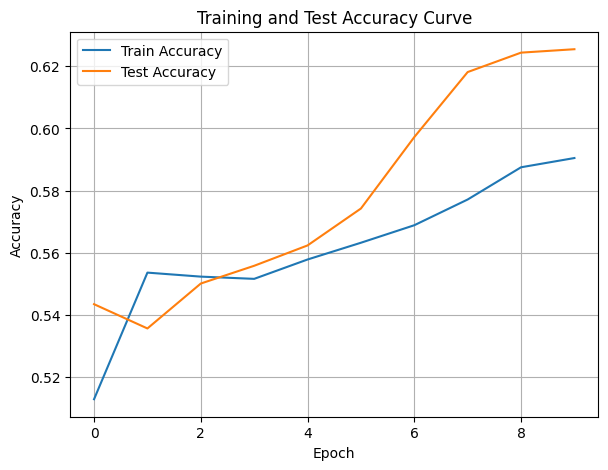

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.6343295492882439, Train Loss: 0.9726, Train Acc: 0.6509, Test F1:0.6863826232247285, Test Loss: 1.0109, Test Acc: 0.7057


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.90it/s]

Epoch [2/10], Train F1:0.6449984399995964, Train Loss: 0.9659, Train Acc: 0.6555, Test F1:0.6749410290431963, Test Loss: 0.9958, Test Acc: 0.7049
Epoch [3/10], Train F1:0.6529271454615799, Train Loss: 0.9654, Train Acc: 0.6605, Test F1:0.6707419436164375, Test Loss: 0.9935, Test Acc: 0.7046


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.97it/s]

Epoch [4/10], Train F1:0.6529377633498452, Train Loss: 0.9646, Train Acc: 0.6586, Test F1:0.6653770239134367, Test Loss: 0.9898, Test Acc: 0.7025


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.60it/s]

Epoch [5/10], Train F1:0.6563663093156783, Train Loss: 0.9620, Train Acc: 0.6611, Test F1:0.6568991877246545, Test Loss: 0.9862, Test Acc: 0.6969
Epoch [6/10], Train F1:0.6595497535741969, Train Loss: 0.9592, Train Acc: 0.6641, Test F1:0.6605262274327446, Test Loss: 0.9835, Test Acc: 0.7007


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.60it/s]

Epoch [7/10], Train F1:0.6635812029744023, Train Loss: 0.9563, Train Acc: 0.6686, Test F1:0.657516410072801, Test Loss: 0.9808, Test Acc: 0.7000


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.98it/s]

Epoch [8/10], Train F1:0.6669401349460905, Train Loss: 0.9529, Train Acc: 0.6718, Test F1:0.6560961971763685, Test Loss: 0.9776, Test Acc: 0.6998


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.98it/s]

Epoch [9/10], Train F1:0.6695564782435001, Train Loss: 0.9507, Train Acc: 0.6736, Test F1:0.6564497439692618, Test Loss: 0.9749, Test Acc: 0.7011


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.31it/s]


Epoch [10/10], Train F1:0.6718797201600466, Train Loss: 0.9484, Train Acc: 0.6759, Test F1:0.6553926094162297, Test Loss: 0.9733, Test Acc: 0.7014
Total Epochs: 10
Train loss start: 0.9469459652900696, Train loss end: 0.9301876425743103
Highest Mean Train Accuracy (over epoch): 0.6758928571428571
Test loss start: 1.0052056312561035, Test loss end: 0.9763815999031067
Highest mean Test Accuracy (over epoch): 0.7057291666666666


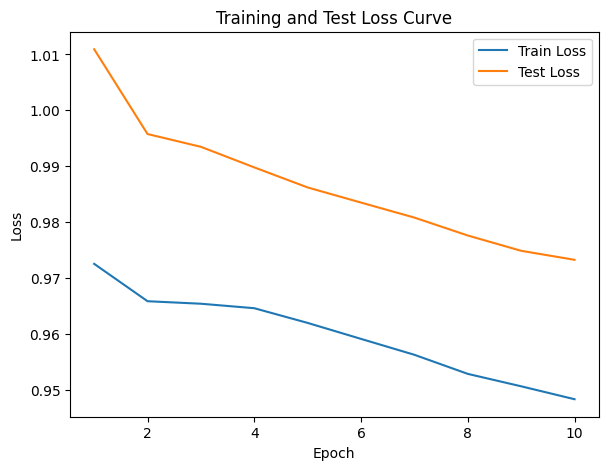

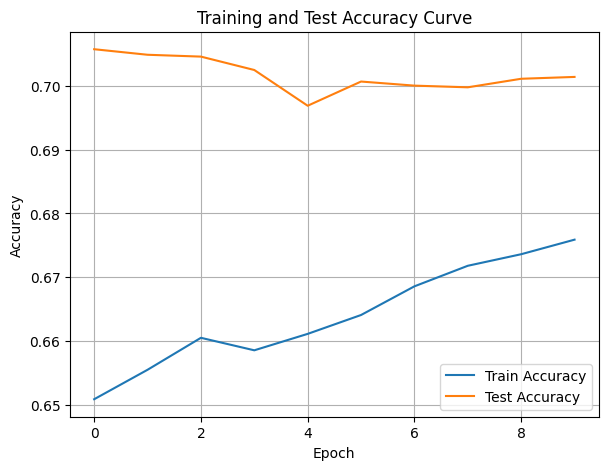

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.32it/s]

Epoch [1/10], Train F1:0.40311845106072186, Train Loss: 1.0898, Train Acc: 0.3744, Test F1:0.30805828129646146, Test Loss: 1.1080, Test Acc: 0.2674


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.68it/s]

Epoch [2/10], Train F1:0.39247132660969186, Train Loss: 1.0979, Train Acc: 0.3676, Test F1:0.26083473523992634, Test Loss: 1.1104, Test Acc: 0.2083


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.68it/s]

Epoch [3/10], Train F1:0.38840144131285737, Train Loss: 1.0974, Train Acc: 0.3685, Test F1:0.23980332998100345, Test Loss: 1.1119, Test Acc: 0.1834


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.49it/s]

Epoch [4/10], Train F1:0.39397604197504377, Train Loss: 1.0927, Train Acc: 0.3815, Test F1:0.22328548644338117, Test Loss: 1.1136, Test Acc: 0.1656
Epoch [5/10], Train F1:0.39287720384120073, Train Loss: 1.0899, Train Acc: 0.3853, Test F1:0.23581414473684212, Test Loss: 1.1118, Test Acc: 0.1757


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.04it/s]

Epoch [6/10], Train F1:0.4044719455949084, Train Loss: 1.0848, Train Acc: 0.3976, Test F1:0.23546611627106984, Test Loss: 1.1111, Test Acc: 0.1749


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.04it/s]

Epoch [7/10], Train F1:0.4053618716568256, Train Loss: 1.0829, Train Acc: 0.3987, Test F1:0.25929633867276886, Test Loss: 1.1087, Test Acc: 0.1970


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.85it/s]

Epoch [8/10], Train F1:0.41447356564674814, Train Loss: 1.0786, Train Acc: 0.4077, Test F1:0.26397146254458975, Test Loss: 1.1075, Test Acc: 0.1989


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.85it/s]

Epoch [9/10], Train F1:0.417416211523371, Train Loss: 1.0762, Train Acc: 0.4117, Test F1:0.26594658887254785, Test Loss: 1.1065, Test Acc: 0.1999


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.69it/s]


Epoch [10/10], Train F1:0.4191241790863779, Train Loss: 1.0736, Train Acc: 0.4151, Test F1:0.2731476214746918, Test Loss: 1.1053, Test Acc: 0.2069
Total Epochs: 10
Train loss start: 1.1072806119918823, Train loss end: 1.038519024848938
Highest Mean Train Accuracy (over epoch): 0.4150595238095238
Test loss start: 1.1069542169570923, Test loss end: 1.0782147645950317
Highest mean Test Accuracy (over epoch): 0.2673611111111111


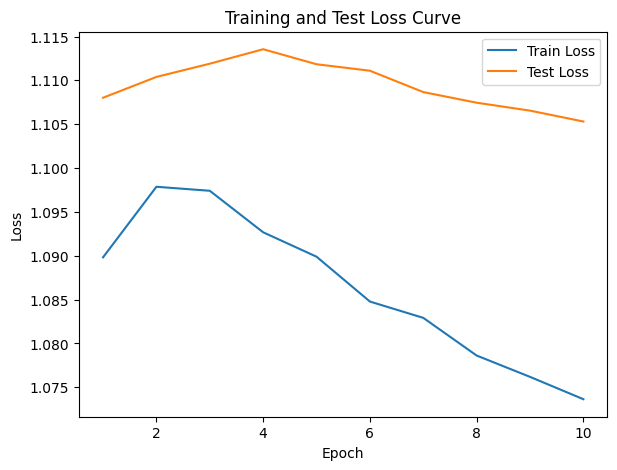

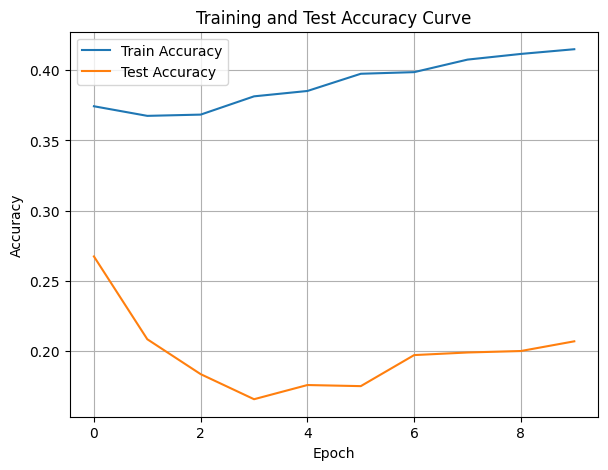

./saved_models/model_4.pth
Training Model with id 7
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.4920052456680456, Train Loss: 1.0456, Train Acc: 0.5048, Test F1:0.415438596491228, Test Loss: 1.0870, Test Acc: 0.3672


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.67it/s]

Epoch [2/10], Train F1:0.4794337906792208, Train Loss: 1.0388, Train Acc: 0.4960, Test F1:0.415438596491228, Test Loss: 1.0843, Test Acc: 0.3702


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.67it/s]

Epoch [3/10], Train F1:0.48064499823036544, Train Loss: 1.0369, Train Acc: 0.4894, Test F1:0.39999999999999997, Test Loss: 1.0828, Test Acc: 0.3556


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.28it/s]

Epoch [4/10], Train F1:0.4912122290962277, Train Loss: 1.0328, Train Acc: 0.4978, Test F1:0.404885453069293, Test Loss: 1.0829, Test Acc: 0.3605
Epoch [5/10], Train F1:0.49446012194220423, Train Loss: 1.0290, Train Acc: 0.5046, Test F1:0.42598684210526316, Test Loss: 1.0821, Test Acc: 0.3877


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.14it/s]

Epoch [6/10], Train F1:0.4938814824607031, Train Loss: 1.0249, Train Acc: 0.5110, Test F1:0.44205915136861873, Test Loss: 1.0809, Test Acc: 0.4061


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.78it/s]

Epoch [7/10], Train F1:0.4970844820597998, Train Loss: 1.0229, Train Acc: 0.5156, Test F1:0.4507703810891357, Test Loss: 1.0795, Test Acc: 0.4157
Epoch [8/10], Train F1:0.5019653635121004, Train Loss: 1.0207, Train Acc: 0.5202, Test F1:0.46568037297165416, Test Loss: 1.0778, Test Acc: 0.4328


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.78it/s]

Epoch [9/10], Train F1:0.5028220136313257, Train Loss: 1.0181, Train Acc: 0.5219, Test F1:0.47724278331021863, Test Loss: 1.0766, Test Acc: 0.4470


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.53it/s]


Epoch [10/10], Train F1:0.5066995219683086, Train Loss: 1.0161, Train Acc: 0.5278, Test F1:0.48593985355792557, Test Loss: 1.0753, Test Acc: 0.4584
Total Epochs: 10
Train loss start: 1.0584638118743896, Train loss end: 0.9696068167686462
Highest Mean Train Accuracy (over epoch): 0.5278273809523809
Test loss start: 1.0866237878799438, Test loss end: 1.046447515487671
Highest mean Test Accuracy (over epoch): 0.45842013888888883


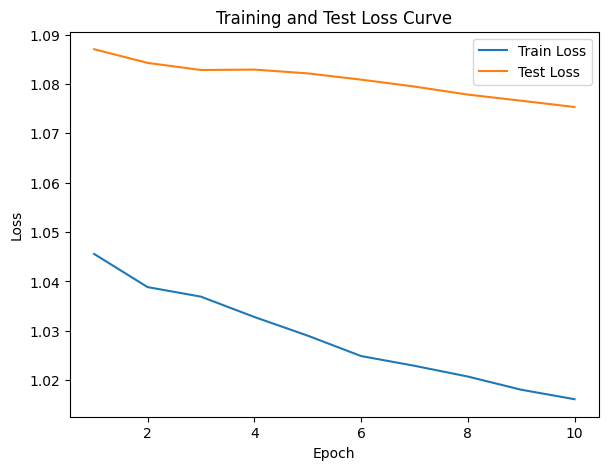

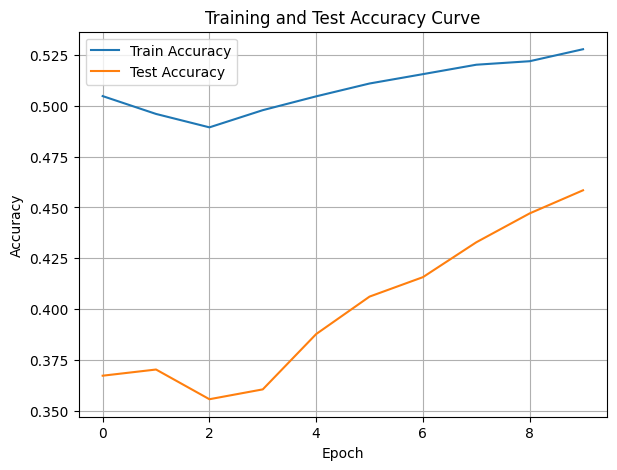

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.65it/s]

Epoch [1/10], Train F1:0.5686047638428591, Train Loss: 0.9798, Train Acc: 0.5952, Test F1:0.5890203978846639, Test Loss: 1.0602, Test Acc: 0.5764
Epoch [2/10], Train F1:0.5658458825125492, Train Loss: 0.9833, Train Acc: 0.5874, Test F1:0.6309337784407036, Test Loss: 1.0541, Test Acc: 0.6224


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.65it/s]

Epoch [3/10], Train F1:0.5652877328211832, Train Loss: 0.9827, Train Acc: 0.5893, Test F1:0.6453999338146306, Test Loss: 1.0513, Test Acc: 0.6377


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.64it/s]

Epoch [4/10], Train F1:0.5661215951209299, Train Loss: 0.9773, Train Acc: 0.5937, Test F1:0.6619195743495856, Test Loss: 1.0496, Test Acc: 0.6532
Epoch [5/10], Train F1:0.567721177077314, Train Loss: 0.9755, Train Acc: 0.5957, Test F1:0.6642812118324362, Test Loss: 1.0484, Test Acc: 0.6606


Training Process:  60%|██████    | 6/10 [00:00<00:00, 12.08it/s]

Epoch [6/10], Train F1:0.5724115193480368, Train Loss: 0.9718, Train Acc: 0.6056, Test F1:0.676189185163615, Test Loss: 1.0469, Test Acc: 0.6707


Training Process:  80%|████████  | 8/10 [00:00<00:00, 12.20it/s]

Epoch [7/10], Train F1:0.5779337976281005, Train Loss: 0.9681, Train Acc: 0.6117, Test F1:0.6862553338957639, Test Loss: 1.0448, Test Acc: 0.6802
Epoch [8/10], Train F1:0.5787551691798033, Train Loss: 0.9658, Train Acc: 0.6145, Test F1:0.6923768354288882, Test Loss: 1.0430, Test Acc: 0.6863


Training Process:  80%|████████  | 8/10 [00:00<00:00, 12.20it/s]

Epoch [9/10], Train F1:0.5782709348351398, Train Loss: 0.9631, Train Acc: 0.6183, Test F1:0.7013375507251707, Test Loss: 1.0413, Test Acc: 0.6930


Training Process: 100%|██████████| 10/10 [00:00<00:00, 12.05it/s]


Epoch [10/10], Train F1:0.5830588689424165, Train Loss: 0.9606, Train Acc: 0.6209, Test F1:0.7080573032835092, Test Loss: 1.0405, Test Acc: 0.6980
Total Epochs: 10
Train loss start: 0.9753644466400146, Train loss end: 0.9893441796302795
Highest Mean Train Accuracy (over epoch): 0.6208928571428571
Test loss start: 1.0606369972229004, Test loss end: 1.0150065422058105
Highest mean Test Accuracy (over epoch): 0.6980034722222223


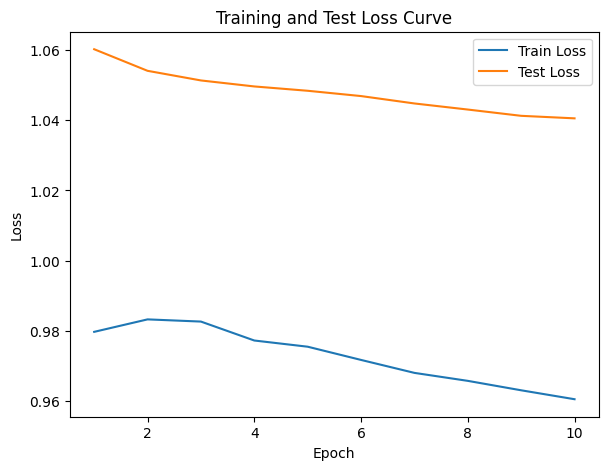

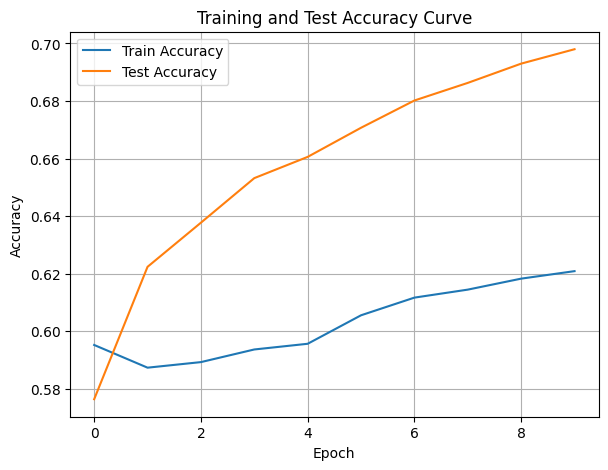

./saved_models/model_8.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.19it/s]

Epoch [1/10], Train F1:0.6018767365783578, Train Loss: 0.9308, Train Acc: 0.6613, Test F1:0.7605020098806345, Test Loss: 1.0247, Test Acc: 0.7569


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.19it/s]

Epoch [2/10], Train F1:0.6217318813616783, Train Loss: 0.9265, Train Acc: 0.6616, Test F1:0.7695164356708729, Test Loss: 1.0204, Test Acc: 0.7626


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.74it/s]

Epoch [3/10], Train F1:0.6185156575061617, Train Loss: 0.9295, Train Acc: 0.6534, Test F1:0.7780776728145149, Test Loss: 1.0193, Test Acc: 0.7697
Epoch [4/10], Train F1:0.6165377698851209, Train Loss: 0.9244, Train Acc: 0.6585, Test F1:0.7845407114282937, Test Loss: 1.0166, Test Acc: 0.7782


Training Process:  50%|█████     | 5/10 [00:00<00:00, 10.39it/s]

Epoch [5/10], Train F1:0.6216295567676713, Train Loss: 0.9213, Train Acc: 0.6626, Test F1:0.7682315596435089, Test Loss: 1.0181, Test Acc: 0.7590


Training Process:  70%|███████   | 7/10 [00:00<00:00, 10.85it/s]

Epoch [6/10], Train F1:0.6277431664468583, Train Loss: 0.9200, Train Acc: 0.6674, Test F1:0.7721466674558101, Test Loss: 1.0175, Test Acc: 0.7629
Epoch [7/10], Train F1:0.6311618117063863, Train Loss: 0.9174, Train Acc: 0.6685, Test F1:0.7757972033731856, Test Loss: 1.0149, Test Acc: 0.7679


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.03it/s]


Epoch [8/10], Train F1:0.6365628308821241, Train Loss: 0.9152, Train Acc: 0.6720, Test F1:0.7848186959814574, Test Loss: 1.0121, Test Acc: 0.7797
Epoch [9/10], Train F1:0.6400864818977909, Train Loss: 0.9131, Train Acc: 0.6758, Test F1:0.7903207073940046, Test Loss: 1.0109, Test Acc: 0.7857
Epoch [10/10], Train F1:0.6446613013503301, Train Loss: 0.9110, Train Acc: 0.6802, Test F1:0.7922869824908955, Test Loss: 1.0101, Test Acc: 0.7887
Total Epochs: 10
Train loss start: 0.9119864702224731, Train loss end: 0.877912700176239
Highest Mean Train Accuracy (over epoch): 0.6801785714285714
Test loss start: 1.021154761314392, Test loss end: 0.9811463952064514
Highest mean Test Accuracy (over epoch): 0.7887152777777777


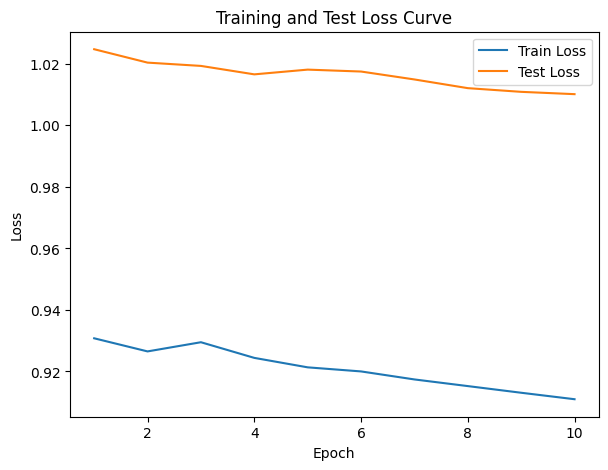

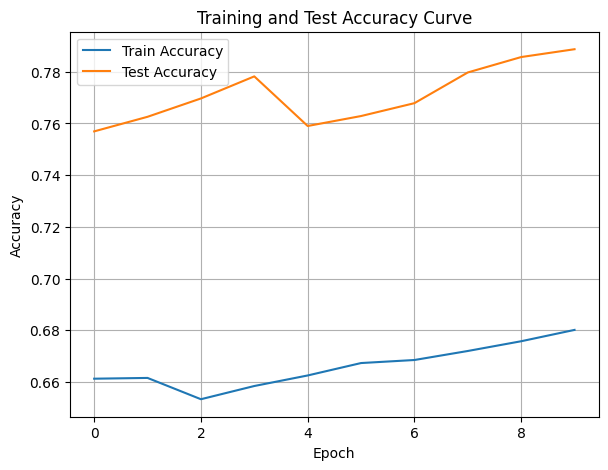

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [37]:
DTEmlp4b.train_DTE()

Training Process:   0%|          | 0/70 [00:00<?, ?it/s]

Training Process:   1%|▏         | 1/70 [00:00<00:08,  8.28it/s]

Epoch [1/70], Train F1:0.3820813281916238, Train Loss: 1.1494, Train Acc: 0.2890, Test F1:0.5559588626739262, Test Loss: 1.0917, Test Acc: 0.4783


Training Process:   3%|▎         | 2/70 [00:00<00:08,  8.18it/s]

Epoch [2/70], Train F1:0.398281233329777, Train Loss: 1.1410, Train Acc: 0.2957, Test F1:0.5671710728708885, Test Loss: 1.0830, Test Acc: 0.4978


Training Process:   6%|▌         | 4/70 [00:00<00:06, 10.26it/s]

Epoch [3/70], Train F1:0.4163591856395629, Train Loss: 1.1367, Train Acc: 0.3090, Test F1:0.5587743080328558, Test Loss: 1.0796, Test Acc: 0.4965
Epoch [4/70], Train F1:0.41433158420565064, Train Loss: 1.1366, Train Acc: 0.3079, Test F1:0.5816282740590933, Test Loss: 1.0754, Test Acc: 0.5189


Training Process:   6%|▌         | 4/70 [00:00<00:06, 10.26it/s]

Epoch [5/70], Train F1:0.4165653843042363, Train Loss: 1.1343, Train Acc: 0.3116, Test F1:0.5985675124168367, Test Loss: 1.0723, Test Acc: 0.5366


Training Process:   9%|▊         | 6/70 [00:00<00:05, 10.97it/s]

Epoch [6/70], Train F1:0.4220538387582029, Train Loss: 1.1321, Train Acc: 0.3158, Test F1:0.5933079540565559, Test Loss: 1.0718, Test Acc: 0.5341
Epoch [7/70], Train F1:0.42806711408772885, Train Loss: 1.1300, Train Acc: 0.3213, Test F1:0.5996510429763877, Test Loss: 1.0687, Test Acc: 0.5441


Training Process:  11%|█▏        | 8/70 [00:00<00:05, 10.65it/s]

Epoch [8/70], Train F1:0.4369167618146444, Train Loss: 1.1268, Train Acc: 0.3282, Test F1:0.5978111303517616, Test Loss: 1.0678, Test Acc: 0.5450
Epoch [9/70], Train F1:0.44742411862390863, Train Loss: 1.1220, Train Acc: 0.3365, Test F1:0.6007228654499532, Test Loss: 1.0660, Test Acc: 0.5494


Training Process:  14%|█▍        | 10/70 [00:01<00:05, 10.45it/s]

Epoch [10/70], Train F1:0.45474388687417017, Train Loss: 1.1187, Train Acc: 0.3455, Test F1:0.6035804176079674, Test Loss: 1.0640, Test Acc: 0.5543
Epoch [11/70], Train F1:0.4621824916856752, Train Loss: 1.1151, Train Acc: 0.3541, Test F1:0.6147981568606834, Test Loss: 1.0614, Test Acc: 0.5679


Training Process:  19%|█▊        | 13/70 [00:01<00:06,  9.49it/s]

Epoch [12/70], Train F1:0.4686483450285176, Train Loss: 1.1112, Train Acc: 0.3609, Test F1:0.6195438134846442, Test Loss: 1.0601, Test Acc: 0.5730
Epoch [13/70], Train F1:0.47656220194412885, Train Loss: 1.1081, Train Acc: 0.3691, Test F1:0.6261741044178216, Test Loss: 1.0585, Test Acc: 0.5813


Training Process:  21%|██▏       | 15/70 [00:01<00:05,  9.58it/s]

Epoch [14/70], Train F1:0.4828975380865968, Train Loss: 1.1057, Train Acc: 0.3754, Test F1:0.6331394832286379, Test Loss: 1.0569, Test Acc: 0.5890
Epoch [15/70], Train F1:0.488439821095674, Train Loss: 1.1031, Train Acc: 0.3811, Test F1:0.6338092873174819, Test Loss: 1.0556, Test Acc: 0.5907


Training Process:  24%|██▍       | 17/70 [00:01<00:05,  9.48it/s]

Epoch [16/70], Train F1:0.49418245462553306, Train Loss: 1.0998, Train Acc: 0.3877, Test F1:0.6341887965693542, Test Loss: 1.0547, Test Acc: 0.5920
Epoch [17/70], Train F1:0.4996261319498011, Train Loss: 1.0962, Train Acc: 0.3940, Test F1:0.6406043011058551, Test Loss: 1.0534, Test Acc: 0.5995


Training Process:  27%|██▋       | 19/70 [00:01<00:05,  9.22it/s]

Epoch [18/70], Train F1:0.5069232643981124, Train Loss: 1.0929, Train Acc: 0.4004, Test F1:0.6458524702751884, Test Loss: 1.0516, Test Acc: 0.6058
Epoch [19/70], Train F1:0.5125878944353909, Train Loss: 1.0896, Train Acc: 0.4065, Test F1:0.6536598213530531, Test Loss: 1.0495, Test Acc: 0.6145


Training Process:  30%|███       | 21/70 [00:02<00:06,  8.16it/s]

Epoch [20/70], Train F1:0.5181110439469125, Train Loss: 1.0866, Train Acc: 0.4128, Test F1:0.6509179135776462, Test Loss: 1.0489, Test Acc: 0.6132
Epoch [21/70], Train F1:0.5246569022100772, Train Loss: 1.0831, Train Acc: 0.4202, Test F1:0.6529935077617849, Test Loss: 1.0478, Test Acc: 0.6164


Training Process:  33%|███▎      | 23/70 [00:02<00:05,  8.11it/s]

Epoch [22/70], Train F1:0.5301091363292837, Train Loss: 1.0802, Train Acc: 0.4261, Test F1:0.6581567208835323, Test Loss: 1.0463, Test Acc: 0.6222
Epoch [23/70], Train F1:0.5363202745021038, Train Loss: 1.0773, Train Acc: 0.4328, Test F1:0.6612887211228975, Test Loss: 1.0451, Test Acc: 0.6261


Training Process:  36%|███▌      | 25/70 [00:02<00:05,  7.92it/s]

Epoch [24/70], Train F1:0.541830606904686, Train Loss: 1.0742, Train Acc: 0.4391, Test F1:0.6604056048170227, Test Loss: 1.0442, Test Acc: 0.6264
Epoch [25/70], Train F1:0.5466632132717298, Train Loss: 1.0705, Train Acc: 0.4453, Test F1:0.6664241014681449, Test Loss: 1.0426, Test Acc: 0.6329


Training Process:  39%|███▊      | 27/70 [00:03<00:06,  6.84it/s]

Epoch [26/70], Train F1:0.5530329839280613, Train Loss: 1.0672, Train Acc: 0.4526, Test F1:0.6702349130860585, Test Loss: 1.0412, Test Acc: 0.6371
Epoch [27/70], Train F1:0.5585152785586903, Train Loss: 1.0641, Train Acc: 0.4588, Test F1:0.6750724665354905, Test Loss: 1.0396, Test Acc: 0.6424


Training Process:  41%|████▏     | 29/70 [00:03<00:06,  6.48it/s]

Epoch [28/70], Train F1:0.5634280818457674, Train Loss: 1.0611, Train Acc: 0.4646, Test F1:0.6792318874242411, Test Loss: 1.0378, Test Acc: 0.6471
Epoch [29/70], Train F1:0.5689802782415494, Train Loss: 1.0580, Train Acc: 0.4710, Test F1:0.682482089695412, Test Loss: 1.0361, Test Acc: 0.6509


Training Process:  43%|████▎     | 30/70 [00:03<00:06,  6.08it/s]

Epoch [30/70], Train F1:0.5741795315354375, Train Loss: 1.0549, Train Acc: 0.4764, Test F1:0.6863761613472764, Test Loss: 1.0342, Test Acc: 0.6550


Training Process:  44%|████▍     | 31/70 [00:03<00:06,  5.72it/s]

Epoch [31/70], Train F1:0.5793620537505801, Train Loss: 1.0518, Train Acc: 0.4826, Test F1:0.6901751557100223, Test Loss: 1.0324, Test Acc: 0.6591


Training Process:  46%|████▌     | 32/70 [00:03<00:07,  5.39it/s]

Epoch [32/70], Train F1:0.585166465411719, Train Loss: 1.0485, Train Acc: 0.4892, Test F1:0.6945692342771617, Test Loss: 1.0308, Test Acc: 0.6638


Training Process:  49%|████▊     | 34/70 [00:04<00:06,  5.29it/s]

Epoch [33/70], Train F1:0.5891982531123336, Train Loss: 1.0454, Train Acc: 0.4948, Test F1:0.6976250450888071, Test Loss: 1.0296, Test Acc: 0.6674
Epoch [34/70], Train F1:0.5948202318251009, Train Loss: 1.0423, Train Acc: 0.5014, Test F1:0.699981157594263, Test Loss: 1.0284, Test Acc: 0.6701


Training Process:  51%|█████▏    | 36/70 [00:04<00:05,  5.67it/s]

Epoch [35/70], Train F1:0.5985995864185093, Train Loss: 1.0397, Train Acc: 0.5056, Test F1:0.7034484778039231, Test Loss: 1.0270, Test Acc: 0.6739
Epoch [36/70], Train F1:0.603902669246593, Train Loss: 1.0365, Train Acc: 0.5114, Test F1:0.7055132681693671, Test Loss: 1.0257, Test Acc: 0.6762


Training Process:  53%|█████▎    | 37/70 [00:04<00:05,  6.10it/s]

Epoch [37/70], Train F1:0.6085816861601573, Train Loss: 1.0332, Train Acc: 0.5172, Test F1:0.707456043477917, Test Loss: 1.0244, Test Acc: 0.6785


Training Process:  56%|█████▌    | 39/70 [00:05<00:05,  6.20it/s]

Epoch [38/70], Train F1:0.613421069400576, Train Loss: 1.0300, Train Acc: 0.5233, Test F1:0.70951543610901, Test Loss: 1.0232, Test Acc: 0.6808
Epoch [39/70], Train F1:0.6176595827579227, Train Loss: 1.0270, Train Acc: 0.5284, Test F1:0.7110282751968487, Test Loss: 1.0220, Test Acc: 0.6826


Training Process:  59%|█████▊    | 41/70 [00:05<00:04,  6.46it/s]

Epoch [40/70], Train F1:0.6216841556913176, Train Loss: 1.0239, Train Acc: 0.5337, Test F1:0.7124082845607199, Test Loss: 1.0206, Test Acc: 0.6843
Epoch [41/70], Train F1:0.626050459687894, Train Loss: 1.0208, Train Acc: 0.5389, Test F1:0.7141983952179833, Test Loss: 1.0193, Test Acc: 0.6863


Training Process:  61%|██████▏   | 43/70 [00:05<00:04,  6.70it/s]

Epoch [42/70], Train F1:0.6304085493789275, Train Loss: 1.0179, Train Acc: 0.5444, Test F1:0.716866130975972, Test Loss: 1.0178, Test Acc: 0.6893
Epoch [43/70], Train F1:0.6339326287446805, Train Loss: 1.0153, Train Acc: 0.5488, Test F1:0.7194048391290411, Test Loss: 1.0163, Test Acc: 0.6921


Training Process:  64%|██████▍   | 45/70 [00:06<00:03,  6.54it/s]

Epoch [44/70], Train F1:0.6379498720138796, Train Loss: 1.0123, Train Acc: 0.5538, Test F1:0.7217732985490076, Test Loss: 1.0148, Test Acc: 0.6948
Epoch [45/70], Train F1:0.6415463063752637, Train Loss: 1.0096, Train Acc: 0.5585, Test F1:0.7231384749321311, Test Loss: 1.0137, Test Acc: 0.6964


Training Process:  67%|██████▋   | 47/70 [00:06<00:03,  6.48it/s]

Epoch [46/70], Train F1:0.6453571465402532, Train Loss: 1.0069, Train Acc: 0.5628, Test F1:0.7219795524858597, Test Loss: 1.0129, Test Acc: 0.6959
Epoch [47/70], Train F1:0.6488977542213192, Train Loss: 1.0041, Train Acc: 0.5673, Test F1:0.7230488384913563, Test Loss: 1.0118, Test Acc: 0.6972


Training Process:  70%|███████   | 49/70 [00:06<00:03,  5.92it/s]

Epoch [48/70], Train F1:0.6514579568283354, Train Loss: 1.0019, Train Acc: 0.5706, Test F1:0.7244260335245108, Test Loss: 1.0106, Test Acc: 0.6988
Epoch [49/70], Train F1:0.6548696996212936, Train Loss: 0.9992, Train Acc: 0.5749, Test F1:0.7259148409624919, Test Loss: 1.0093, Test Acc: 0.7005


Training Process:  73%|███████▎  | 51/70 [00:07<00:03,  5.99it/s]

Epoch [50/70], Train F1:0.6580954146966441, Train Loss: 0.9966, Train Acc: 0.5791, Test F1:0.7288211814131357, Test Loss: 1.0077, Test Acc: 0.7037
Epoch [51/70], Train F1:0.6615470938361588, Train Loss: 0.9938, Train Acc: 0.5834, Test F1:0.7304982935099751, Test Loss: 1.0063, Test Acc: 0.7056


Training Process:  74%|███████▍  | 52/70 [00:07<00:03,  5.91it/s]

Epoch [52/70], Train F1:0.665055409250821, Train Loss: 0.9912, Train Acc: 0.5877, Test F1:0.7322745919807359, Test Loss: 1.0049, Test Acc: 0.7077


Training Process:  77%|███████▋  | 54/70 [00:07<00:02,  5.68it/s]

Epoch [53/70], Train F1:0.6688031505245873, Train Loss: 0.9884, Train Acc: 0.5925, Test F1:0.7338111947729965, Test Loss: 1.0037, Test Acc: 0.7095
Epoch [54/70], Train F1:0.67200007513161, Train Loss: 0.9860, Train Acc: 0.5963, Test F1:0.7344593114963207, Test Loss: 1.0026, Test Acc: 0.7104


Training Process:  79%|███████▊  | 55/70 [00:07<00:02,  5.51it/s]

Epoch [55/70], Train F1:0.6754517941356917, Train Loss: 0.9835, Train Acc: 0.6006, Test F1:0.73554425683017, Test Loss: 1.0012, Test Acc: 0.7117


Training Process:  80%|████████  | 56/70 [00:08<00:02,  5.32it/s]

Epoch [56/70], Train F1:0.6790937958687105, Train Loss: 0.9809, Train Acc: 0.6052, Test F1:0.7368959770942081, Test Loss: 0.9999, Test Acc: 0.7134


Training Process:  81%|████████▏ | 57/70 [00:08<00:02,  4.92it/s]

Epoch [57/70], Train F1:0.6818133226851442, Train Loss: 0.9783, Train Acc: 0.6089, Test F1:0.7383411224326842, Test Loss: 0.9986, Test Acc: 0.7151


Training Process:  83%|████████▎ | 58/70 [00:08<00:02,  4.96it/s]

Epoch [58/70], Train F1:0.6847519364502397, Train Loss: 0.9757, Train Acc: 0.6127, Test F1:0.7394550006847371, Test Loss: 0.9974, Test Acc: 0.7164


Training Process:  84%|████████▍ | 59/70 [00:08<00:02,  4.98it/s]

Epoch [59/70], Train F1:0.68759652599256, Train Loss: 0.9733, Train Acc: 0.6163, Test F1:0.7402396773044603, Test Loss: 0.9963, Test Acc: 0.7174


Training Process:  86%|████████▌ | 60/70 [00:08<00:01,  5.02it/s]

Epoch [60/70], Train F1:0.6901212553496389, Train Loss: 0.9711, Train Acc: 0.6194, Test F1:0.7412752147008098, Test Loss: 0.9952, Test Acc: 0.7186


Training Process:  87%|████████▋ | 61/70 [00:09<00:01,  5.08it/s]

Epoch [61/70], Train F1:0.6927218918803449, Train Loss: 0.9686, Train Acc: 0.6228, Test F1:0.7429691861985743, Test Loss: 0.9937, Test Acc: 0.7206


Training Process:  90%|█████████ | 63/70 [00:09<00:01,  5.31it/s]

Epoch [62/70], Train F1:0.6955782973226932, Train Loss: 0.9662, Train Acc: 0.6265, Test F1:0.7450114203642367, Test Loss: 0.9924, Test Acc: 0.7228
Epoch [63/70], Train F1:0.6981773035821291, Train Loss: 0.9639, Train Acc: 0.6297, Test F1:0.7467058655632811, Test Loss: 0.9911, Test Acc: 0.7247


Training Process:  93%|█████████▎| 65/70 [00:09<00:00,  5.46it/s]

Epoch [64/70], Train F1:0.7004255972055559, Train Loss: 0.9616, Train Acc: 0.6325, Test F1:0.7484772288324154, Test Loss: 0.9897, Test Acc: 0.7267
Epoch [65/70], Train F1:0.7030621531725201, Train Loss: 0.9594, Train Acc: 0.6358, Test F1:0.7500772145731932, Test Loss: 0.9884, Test Acc: 0.7286


Training Process:  94%|█████████▍| 66/70 [00:09<00:00,  5.04it/s]

Epoch [66/70], Train F1:0.7053126842099489, Train Loss: 0.9572, Train Acc: 0.6388, Test F1:0.7511110551138774, Test Loss: 0.9872, Test Acc: 0.7297


Training Process:  96%|█████████▌| 67/70 [00:10<00:00,  4.13it/s]

Epoch [67/70], Train F1:0.7077798806785979, Train Loss: 0.9547, Train Acc: 0.6422, Test F1:0.7526031463896043, Test Loss: 0.9858, Test Acc: 0.7314


Training Process:  97%|█████████▋| 68/70 [00:10<00:00,  4.07it/s]

Epoch [68/70], Train F1:0.709901239291812, Train Loss: 0.9525, Train Acc: 0.6449, Test F1:0.7537006425754786, Test Loss: 0.9845, Test Acc: 0.7326


Training Process:  99%|█████████▊| 69/70 [00:10<00:00,  3.91it/s]

Epoch [69/70], Train F1:0.7121453284249903, Train Loss: 0.9502, Train Acc: 0.6480, Test F1:0.7551259292518557, Test Loss: 0.9832, Test Acc: 0.7343


Training Process: 100%|██████████| 70/70 [00:11<00:00,  6.25it/s]


Epoch [70/70], Train F1:0.714208189724332, Train Loss: 0.9480, Train Acc: 0.6509, Test F1:0.7567514751493515, Test Loss: 0.9819, Test Acc: 0.7362
Total Epochs: 70
Train loss start: 1.1420629024505615, Train loss end: 0.8095189929008484
Highest Mean Train Accuracy (over epoch): 0.6508503401360544
Test loss start: 1.0849803686141968, Test loss end: 0.8767214417457581
Highest Mean Test Accuracy (over epoch): 0.7361607142857143


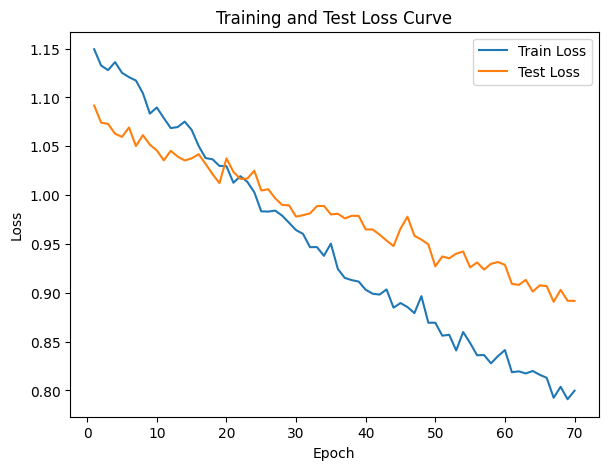

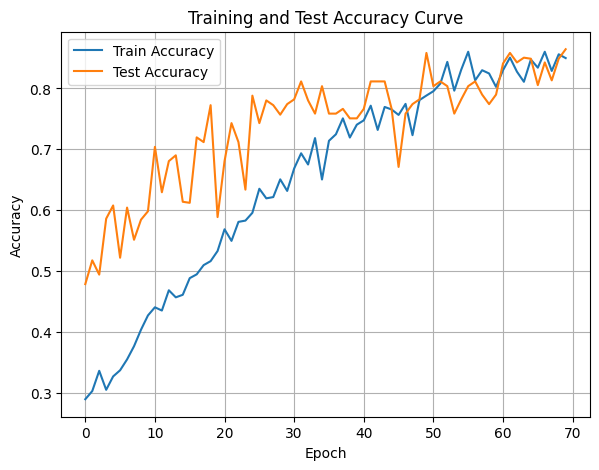

In [38]:
DTEmlp4b.train_single_model()

Randomly initializing 4 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.53it/s]

Epoch [1/10], Train F1:0.5468439250101994, Train Loss: 1.0265, Train Acc: 0.5247, Test F1:0.3966290008810364, Test Loss: 1.0787, Test Acc: 0.4253


Training Process:  30%|███       | 3/10 [00:00<00:00, 11.06it/s]

Epoch [2/10], Train F1:0.5447518468902699, Train Loss: 1.0347, Train Acc: 0.5199, Test F1:0.35558508674787737, Test Loss: 1.0834, Test Acc: 0.3950
Epoch [3/10], Train F1:0.5300939930823773, Train Loss: 1.0379, Train Acc: 0.5059, Test F1:0.3896730271375169, Test Loss: 1.0817, Test Acc: 0.4065


Training Process:  30%|███       | 3/10 [00:00<00:00, 11.06it/s]

Epoch [4/10], Train F1:0.5292202945188931, Train Loss: 1.0394, Train Acc: 0.5019, Test F1:0.48798251948634597, Test Loss: 1.0767, Test Acc: 0.4724


Training Process:  50%|█████     | 5/10 [00:00<00:00, 11.38it/s]

Epoch [5/10], Train F1:0.534529323512461, Train Loss: 1.0358, Train Acc: 0.5100, Test F1:0.5254870291592216, Test Loss: 1.0734, Test Acc: 0.5042
Epoch [6/10], Train F1:0.5428654139833139, Train Loss: 1.0308, Train Acc: 0.5189, Test F1:0.5635154016281855, Test Loss: 1.0702, Test Acc: 0.5331


Training Process:  70%|███████   | 7/10 [00:00<00:00, 11.51it/s]

Epoch [7/10], Train F1:0.559459979983652, Train Loss: 1.0238, Train Acc: 0.5352, Test F1:0.5899121690257114, Test Loss: 1.0682, Test Acc: 0.5569


Training Process:  70%|███████   | 7/10 [00:00<00:00, 11.51it/s]

Epoch [8/10], Train F1:0.5688003804568171, Train Loss: 1.0195, Train Acc: 0.5447, Test F1:0.6105375211210251, Test Loss: 1.0657, Test Acc: 0.5757


Training Process:  90%|█████████ | 9/10 [00:00<00:00, 11.10it/s]

Epoch [9/10], Train F1:0.5756697269446286, Train Loss: 1.0172, Train Acc: 0.5482, Test F1:0.6016101965431283, Test Loss: 1.0657, Test Acc: 0.5684


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.61it/s]


Epoch [10/10], Train F1:0.5834277092009906, Train Loss: 1.0146, Train Acc: 0.5554, Test F1:0.6049647041688653, Test Loss: 1.0639, Test Acc: 0.5725
Total Epochs: 10
Train loss start: 0.9938802719116211, Train loss end: 1.0663477182388306
Highest Mean Train Accuracy (over epoch): 0.5553869047619048
Test loss start: 1.0658605098724365, Test loss end: 1.0510627031326294
Highest mean Test Accuracy (over epoch): 0.5757378472222222


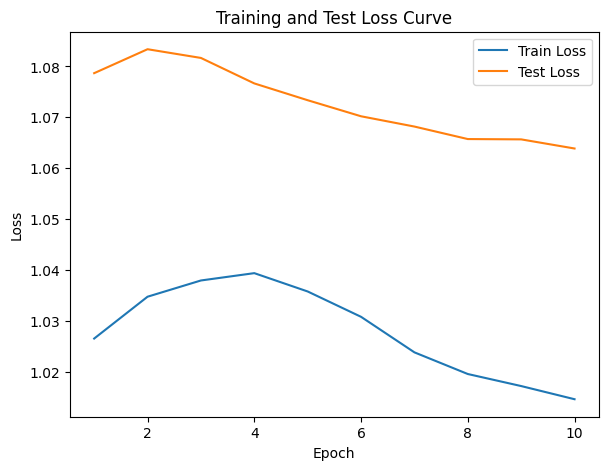

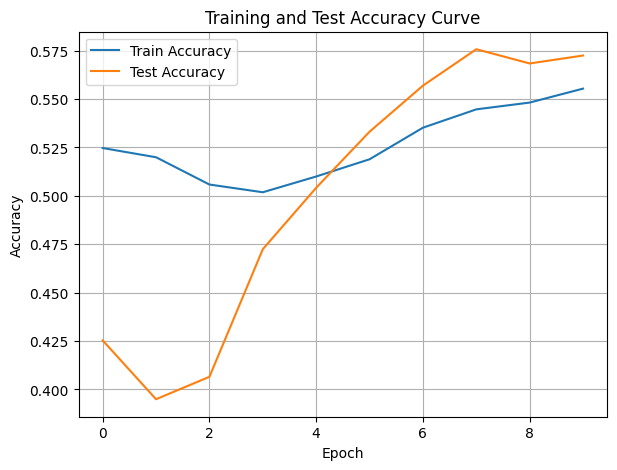

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.88it/s]

Epoch [1/10], Train F1:0.40990304621932916, Train Loss: 1.0870, Train Acc: 0.3702, Test F1:0.48043449585061043, Test Loss: 1.0746, Test Acc: 0.4957


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.88it/s]

Epoch [2/10], Train F1:0.4106041485212365, Train Loss: 1.0847, Train Acc: 0.3760, Test F1:0.5058154802748058, Test Loss: 1.0657, Test Acc: 0.5230


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.10it/s]

Epoch [3/10], Train F1:0.4202308104076129, Train Loss: 1.0819, Train Acc: 0.3852, Test F1:0.5182022655706866, Test Loss: 1.0610, Test Acc: 0.5394


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.10it/s]

Epoch [4/10], Train F1:0.4295455517152035, Train Loss: 1.0797, Train Acc: 0.3921, Test F1:0.529476972975425, Test Loss: 1.0570, Test Acc: 0.5545


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.50it/s]

Epoch [5/10], Train F1:0.44671279348270776, Train Loss: 1.0752, Train Acc: 0.4124, Test F1:0.5398994305699606, Test Loss: 1.0525, Test Acc: 0.5694


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.50it/s]

Epoch [6/10], Train F1:0.45083990337663216, Train Loss: 1.0701, Train Acc: 0.4205, Test F1:0.5449810193513779, Test Loss: 1.0470, Test Acc: 0.5804


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.64it/s]

Epoch [7/10], Train F1:0.4629732063655127, Train Loss: 1.0655, Train Acc: 0.4332, Test F1:0.5619762722442875, Test Loss: 1.0461, Test Acc: 0.5910


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.64it/s]

Epoch [8/10], Train F1:0.4692032234534633, Train Loss: 1.0616, Train Acc: 0.4416, Test F1:0.5715818244970468, Test Loss: 1.0441, Test Acc: 0.5997


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.86it/s]

Epoch [9/10], Train F1:0.47874835420570455, Train Loss: 1.0582, Train Acc: 0.4495, Test F1:0.5754521251015967, Test Loss: 1.0394, Test Acc: 0.6063


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.89it/s]


Epoch [10/10], Train F1:0.48771232361711464, Train Loss: 1.0545, Train Acc: 0.4585, Test F1:0.5853566359106526, Test Loss: 1.0380, Test Acc: 0.6127
Total Epochs: 10
Train loss start: 1.1343022584915161, Train loss end: 1.0345056056976318
Highest Mean Train Accuracy (over epoch): 0.45848214285714295
Test loss start: 1.0700422525405884, Test loss end: 1.028336763381958
Highest mean Test Accuracy (over epoch): 0.6126736111111111


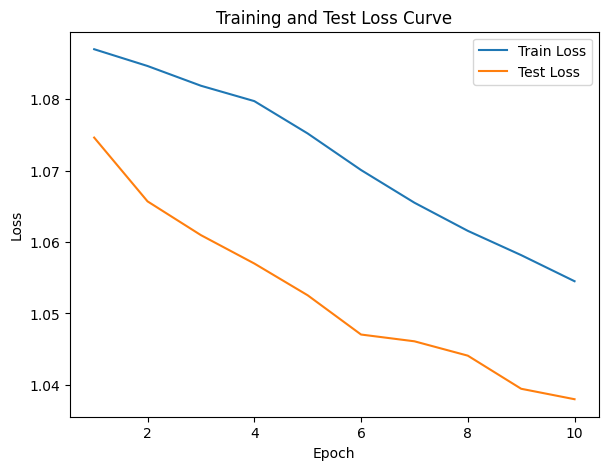

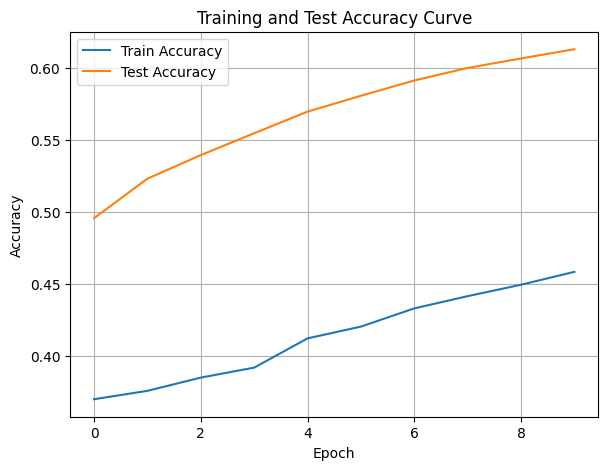

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.56it/s]

Epoch [1/10], Train F1:0.2978300456020664, Train Loss: 1.1670, Train Acc: 0.2491, Test F1:0.14317867036011078, Test Loss: 1.1370, Test Acc: 0.2118
Epoch [2/10], Train F1:0.2728957897292946, Train Loss: 1.1682, Train Acc: 0.2356, Test F1:0.13940008449514155, Test Loss: 1.1336, Test Acc: 0.2196


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.56it/s]

Epoch [3/10], Train F1:0.2872420001285981, Train Loss: 1.1632, Train Acc: 0.2523, Test F1:0.14543054063730754, Test Loss: 1.1338, Test Acc: 0.2280


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.59it/s]

Epoch [4/10], Train F1:0.2886021556835257, Train Loss: 1.1611, Train Acc: 0.2568, Test F1:0.1517338496743531, Test Loss: 1.1321, Test Acc: 0.2352


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.59it/s]

Epoch [5/10], Train F1:0.295358568578931, Train Loss: 1.1572, Train Acc: 0.2623, Test F1:0.15781419950383857, Test Loss: 1.1298, Test Acc: 0.2470


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.41it/s]

Epoch [6/10], Train F1:0.3011491812711945, Train Loss: 1.1550, Train Acc: 0.2660, Test F1:0.16263168800018507, Test Loss: 1.1270, Test Acc: 0.2585
Epoch [7/10], Train F1:0.30531258388136717, Train Loss: 1.1512, Train Acc: 0.2707, Test F1:0.16472375233985143, Test Loss: 1.1251, Test Acc: 0.2625


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.68it/s]

Epoch [8/10], Train F1:0.31310051868578465, Train Loss: 1.1476, Train Acc: 0.2768, Test F1:0.16918056469192172, Test Loss: 1.1228, Test Acc: 0.2700


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.81it/s]


Epoch [9/10], Train F1:0.31617846554532353, Train Loss: 1.1460, Train Acc: 0.2800, Test F1:0.1713732370107643, Test Loss: 1.1207, Test Acc: 0.2759
Epoch [10/10], Train F1:0.3231021506873491, Train Loss: 1.1435, Train Acc: 0.2854, Test F1:0.17350438820849523, Test Loss: 1.1195, Test Acc: 0.2815
Total Epochs: 10
Train loss start: 1.171416997909546, Train loss end: 1.2556873559951782
Highest Mean Train Accuracy (over epoch): 0.28541666666666665
Test loss start: 1.1505757570266724, Test loss end: 1.1013802289962769
Highest mean Test Accuracy (over epoch): 0.2815104166666667


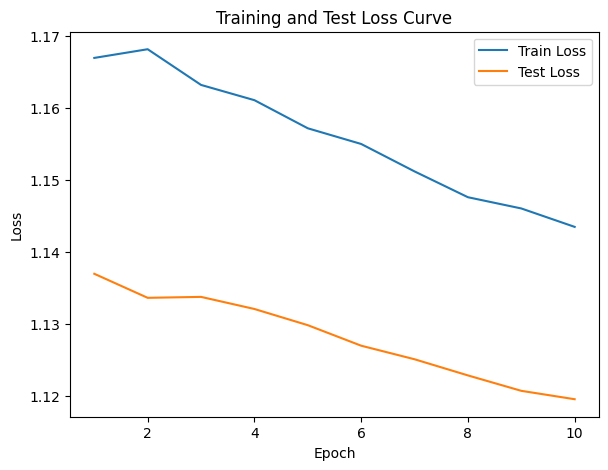

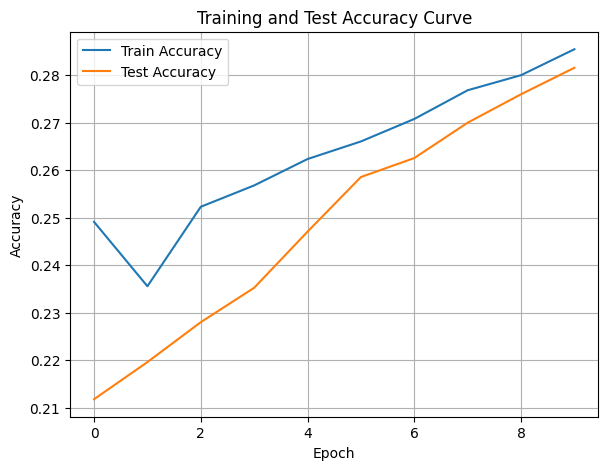

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.57it/s]

Epoch [1/10], Train F1:0.18601988487702772, Train Loss: 1.2186, Train Acc: 0.1387, Test F1:0.19138755980861247, Test Loss: 1.1233, Test Acc: 0.1589
Epoch [2/10], Train F1:0.18898209666070204, Train Loss: 1.2180, Train Acc: 0.1376, Test F1:0.1883904391852114, Test Loss: 1.1171, Test Acc: 0.1745


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.87it/s]

Epoch [3/10], Train F1:0.19778662466670816, Train Loss: 1.2183, Train Acc: 0.1411, Test F1:0.19785145683592237, Test Loss: 1.1159, Test Acc: 0.1869
Epoch [4/10], Train F1:0.2082677843780032, Train Loss: 1.2123, Train Acc: 0.1478, Test F1:0.20247339660626978, Test Loss: 1.1148, Test Acc: 0.1916
Epoch [5/10], Train F1:0.2107516890630008, Train Loss: 1.2092, Train Acc: 0.1524, Test F1:0.2087026783950809, Test Loss: 1.1121, Test Acc: 0.1984


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.76it/s]

Epoch [6/10], Train F1:0.21499139309693774, Train Loss: 1.2079, Train Acc: 0.1545, Test F1:0.21418992025456018, Test Loss: 1.1111, Test Acc: 0.2020
Epoch [7/10], Train F1:0.22263163518262444, Train Loss: 1.2045, Train Acc: 0.1616, Test F1:0.2131478120588829, Test Loss: 1.1109, Test Acc: 0.1958
Epoch [8/10], Train F1:0.23085186587597994, Train Loss: 1.2014, Train Acc: 0.1664, Test F1:0.21791317811110128, Test Loss: 1.1092, Test Acc: 0.1978


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.76it/s]


Epoch [9/10], Train F1:0.2392076838523968, Train Loss: 1.1972, Train Acc: 0.1733, Test F1:0.21976025183883896, Test Loss: 1.1082, Test Acc: 0.2000
Epoch [10/10], Train F1:0.2455493430509446, Train Loss: 1.1937, Train Acc: 0.1779, Test F1:0.21936663683140525, Test Loss: 1.1074, Test Acc: 0.2012
Total Epochs: 10
Train loss start: 1.2272846698760986, Train loss end: 1.143329381942749
Highest Mean Train Accuracy (over epoch): 0.17794642857142856
Test loss start: 1.1198501586914062, Test loss end: 1.0987902879714966
Highest mean Test Accuracy (over epoch): 0.20196759259259256


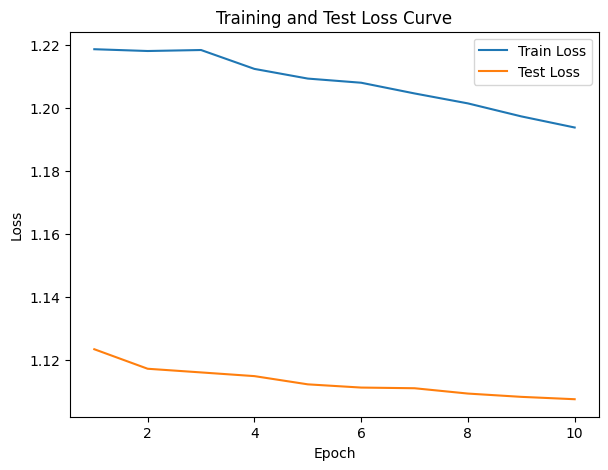

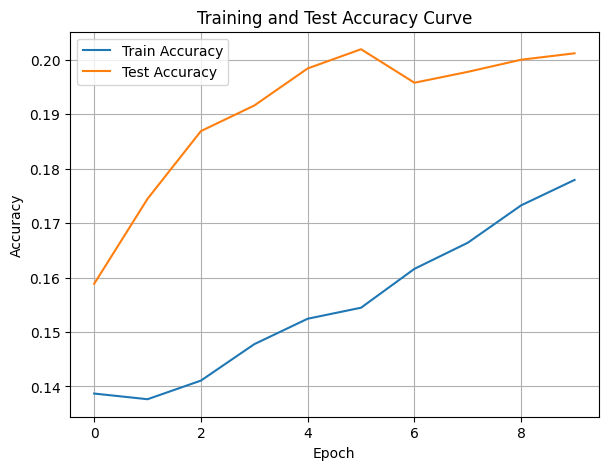

./saved_models/model_4.pth
Training Model with id 7
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.31177033275393934, Train Loss: 1.1584, Train Acc: 0.2357, Test F1:0.3187530705716414, Test Loss: 1.0896, Test Acc: 0.2665


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.17it/s]

Epoch [2/10], Train F1:0.31971081566866205, Train Loss: 1.1586, Train Acc: 0.2461, Test F1:0.3689987083876914, Test Loss: 1.0881, Test Acc: 0.2969
Epoch [3/10], Train F1:0.33323641200896476, Train Loss: 1.1525, Train Acc: 0.2590, Test F1:0.42327429220119106, Test Loss: 1.0848, Test Acc: 0.3371


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.30it/s]

Epoch [4/10], Train F1:0.3349983938780633, Train Loss: 1.1493, Train Acc: 0.2604, Test F1:0.39059975417443676, Test Loss: 1.0839, Test Acc: 0.3416


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.30it/s]

Epoch [5/10], Train F1:0.34434535774973485, Train Loss: 1.1459, Train Acc: 0.2657, Test F1:0.3794639096557923, Test Loss: 1.0814, Test Acc: 0.3458


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.90it/s]

Epoch [6/10], Train F1:0.34701099348027903, Train Loss: 1.1435, Train Acc: 0.2687, Test F1:0.4313733926877493, Test Loss: 1.0796, Test Acc: 0.3770
Epoch [7/10], Train F1:0.35623024720619767, Train Loss: 1.1404, Train Acc: 0.2761, Test F1:0.46301621500144124, Test Loss: 1.0781, Test Acc: 0.4024


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.42it/s]

Epoch [8/10], Train F1:0.3587658672132563, Train Loss: 1.1369, Train Acc: 0.2796, Test F1:0.4803499009785604, Test Loss: 1.0773, Test Acc: 0.4117


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.48it/s]


Epoch [9/10], Train F1:0.3672365081111209, Train Loss: 1.1337, Train Acc: 0.2863, Test F1:0.5138345679848572, Test Loss: 1.0765, Test Acc: 0.4345
Epoch [10/10], Train F1:0.3711192283469309, Train Loss: 1.1308, Train Acc: 0.2917, Test F1:0.5329438535267075, Test Loss: 1.0750, Test Acc: 0.4518
Total Epochs: 10
Train loss start: 1.1169285774230957, Train loss end: 1.111834168434143
Highest Mean Train Accuracy (over epoch): 0.2916666666666667
Test loss start: 1.086033582687378, Test loss end: 1.0600626468658447
Highest mean Test Accuracy (over epoch): 0.4518229166666667


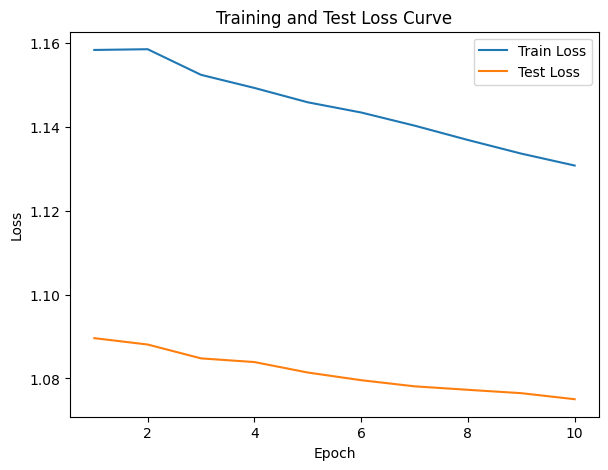

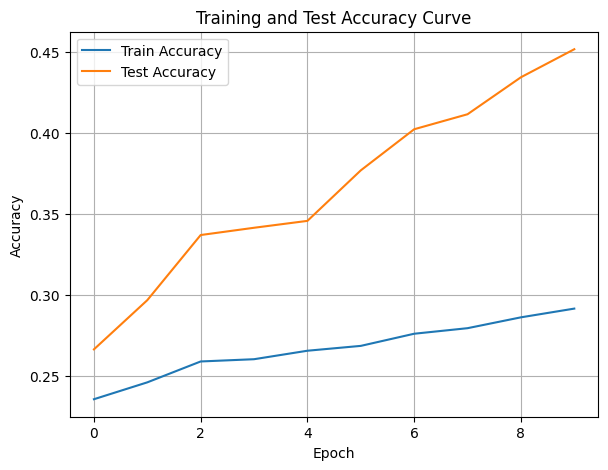

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.4232750891438476, Train Loss: 1.0993, Train Acc: 0.3324, Test F1:0.7098945558776292, Test Loss: 1.0574, Test Acc: 0.6528


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.20it/s]

Epoch [2/10], Train F1:0.4358462019664205, Train Loss: 1.0953, Train Acc: 0.3429, Test F1:0.7115166949632145, Test Loss: 1.0551, Test Acc: 0.6606


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.68it/s]

Epoch [3/10], Train F1:0.45271794766233764, Train Loss: 1.0884, Train Acc: 0.3617, Test F1:0.7214877911345507, Test Loss: 1.0540, Test Acc: 0.6710


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.03it/s]

Epoch [4/10], Train F1:0.46824779232094194, Train Loss: 1.0853, Train Acc: 0.3763, Test F1:0.7314547585314233, Test Loss: 1.0521, Test Acc: 0.6821


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.32it/s]

Epoch [5/10], Train F1:0.48108025425298473, Train Loss: 1.0806, Train Acc: 0.3891, Test F1:0.7103085048532997, Test Loss: 1.0520, Test Acc: 0.6628


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.79it/s]

Epoch [6/10], Train F1:0.48609290058603477, Train Loss: 1.0777, Train Acc: 0.3953, Test F1:0.7036726117252048, Test Loss: 1.0508, Test Acc: 0.6576


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.92it/s]

Epoch [7/10], Train F1:0.5000043940752097, Train Loss: 1.0734, Train Acc: 0.4105, Test F1:0.7115311541031012, Test Loss: 1.0494, Test Acc: 0.6658


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.53it/s]

Epoch [8/10], Train F1:0.5130549255308487, Train Loss: 1.0687, Train Acc: 0.4244, Test F1:0.7163428283971578, Test Loss: 1.0483, Test Acc: 0.6720


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.65it/s]

Epoch [9/10], Train F1:0.5196036578997486, Train Loss: 1.0645, Train Acc: 0.4313, Test F1:0.7227054925895472, Test Loss: 1.0466, Test Acc: 0.6794


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.21it/s]


Epoch [10/10], Train F1:0.5281786698181943, Train Loss: 1.0609, Train Acc: 0.4393, Test F1:0.7279214203351015, Test Loss: 1.0451, Test Acc: 0.6853
Total Epochs: 10
Train loss start: 1.118544101715088, Train loss end: 1.0429552793502808
Highest Mean Train Accuracy (over epoch): 0.4393452380952381
Test loss start: 1.054111361503601, Test loss end: 1.0337164402008057
Highest mean Test Accuracy (over epoch): 0.685329861111111


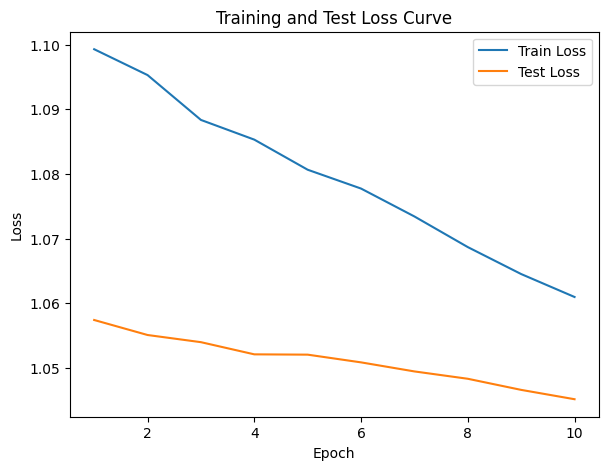

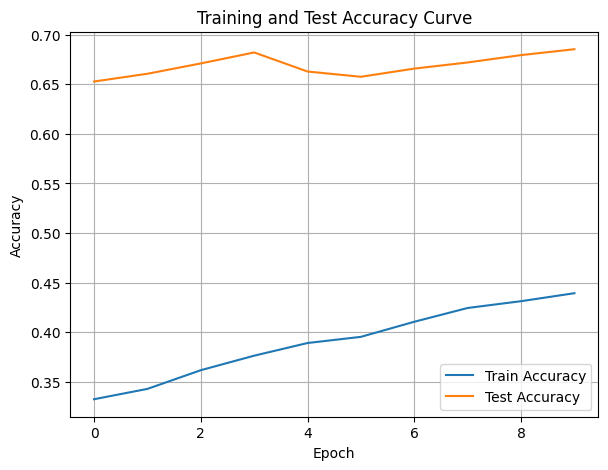

./saved_models/model_8.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  5.31it/s]

Epoch [1/10], Train F1:0.5945477414939734, Train Loss: 1.0349, Train Acc: 0.4833, Test F1:0.7533111434713264, Test Loss: 1.0312, Test Acc: 0.7292


Training Process:  30%|███       | 3/10 [00:00<00:01,  5.75it/s]

Epoch [2/10], Train F1:0.5969135282064297, Train Loss: 1.0277, Train Acc: 0.5051, Test F1:0.7516575519081942, Test Loss: 1.0305, Test Acc: 0.7192
Epoch [3/10], Train F1:0.6112742847573762, Train Loss: 1.0231, Train Acc: 0.5230, Test F1:0.7343925229752462, Test Loss: 1.0296, Test Acc: 0.7049


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.87it/s]

Epoch [4/10], Train F1:0.6297070441334661, Train Loss: 1.0178, Train Acc: 0.5416, Test F1:0.7363562753036438, Test Loss: 1.0298, Test Acc: 0.7059
Epoch [5/10], Train F1:0.6383015399185699, Train Loss: 1.0133, Train Acc: 0.5545, Test F1:0.7457961142171667, Test Loss: 1.0279, Test Acc: 0.7168


Training Process:  70%|███████   | 7/10 [00:01<00:00,  5.68it/s]

Epoch [6/10], Train F1:0.6497337132129293, Train Loss: 1.0087, Train Acc: 0.5670, Test F1:0.7533545415238496, Test Loss: 1.0258, Test Acc: 0.7254
Epoch [7/10], Train F1:0.6581408778390548, Train Loss: 1.0049, Train Acc: 0.5785, Test F1:0.7529550570724782, Test Loss: 1.0236, Test Acc: 0.7259


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.12it/s]

Epoch [8/10], Train F1:0.664663083657497, Train Loss: 1.0014, Train Acc: 0.5856, Test F1:0.7537535742274158, Test Loss: 1.0232, Test Acc: 0.7273


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.37it/s]


Epoch [9/10], Train F1:0.6723042165639597, Train Loss: 0.9981, Train Acc: 0.5939, Test F1:0.7569163152003471, Test Loss: 1.0223, Test Acc: 0.7310
Epoch [10/10], Train F1:0.683629191321499, Train Loss: 0.9936, Train Acc: 0.6040, Test F1:0.7611748854241179, Test Loss: 1.0204, Test Acc: 0.7361
Total Epochs: 10
Train loss start: 1.0460295677185059, Train loss end: 1.1379295587539673
Highest Mean Train Accuracy (over epoch): 0.6039583333333334
Test loss start: 1.0260106325149536, Test loss end: 1.003023624420166
Highest mean Test Accuracy (over epoch): 0.736111111111111


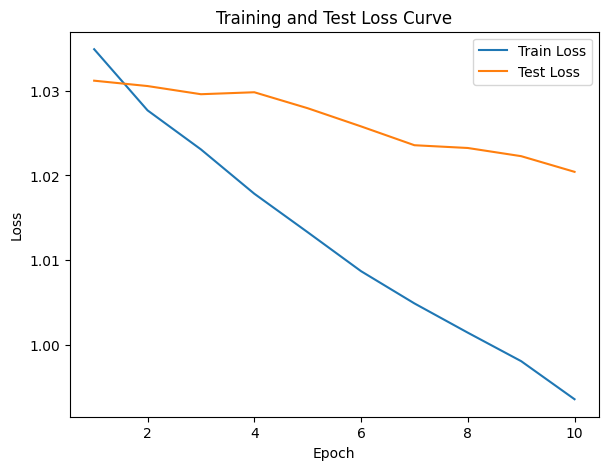

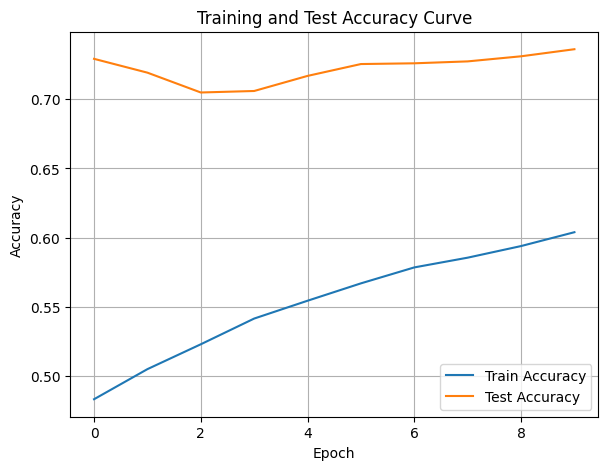

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [39]:
DTEmlp4b.train_DTE()

Training Process:   3%|▎         | 2/70 [00:00<00:12,  5.47it/s]

Epoch [1/70], Train F1:0.4217319974208469, Train Loss: 1.1156, Train Acc: 0.3390, Test F1:0.4517237148816097, Test Loss: 1.1022, Test Acc: 0.4253
Epoch [2/70], Train F1:0.4367272228395824, Train Loss: 1.1123, Train Acc: 0.3457, Test F1:0.4704764623367112, Test Loss: 1.1001, Test Acc: 0.4401


Training Process:   6%|▌         | 4/70 [00:00<00:10,  6.53it/s]

Epoch [3/70], Train F1:0.43128339199313537, Train Loss: 1.1135, Train Acc: 0.3417, Test F1:0.48660641088703066, Test Loss: 1.0973, Test Acc: 0.4601
Epoch [4/70], Train F1:0.4376491285223551, Train Loss: 1.1099, Train Acc: 0.3469, Test F1:0.4882953620208292, Test Loss: 1.0962, Test Acc: 0.4553


Training Process:   9%|▊         | 6/70 [00:00<00:08,  7.45it/s]

Epoch [5/70], Train F1:0.44487127897993917, Train Loss: 1.1052, Train Acc: 0.3577, Test F1:0.4952165773557107, Test Loss: 1.0939, Test Acc: 0.4665
Epoch [6/70], Train F1:0.45346968907252905, Train Loss: 1.1017, Train Acc: 0.3657, Test F1:0.4975013848282073, Test Loss: 1.0936, Test Acc: 0.4641


Training Process:  11%|█▏        | 8/70 [00:01<00:07,  8.50it/s]

Epoch [7/70], Train F1:0.4548672669223485, Train Loss: 1.0993, Train Acc: 0.3702, Test F1:0.50887296904996, Test Loss: 1.0908, Test Acc: 0.4804
Epoch [8/70], Train F1:0.4655491061639269, Train Loss: 1.0957, Train Acc: 0.3800, Test F1:0.513095238095238, Test Loss: 1.0875, Test Acc: 0.4944


Training Process:  14%|█▍        | 10/70 [00:01<00:06,  8.92it/s]

Epoch [9/70], Train F1:0.4786578405120854, Train Loss: 1.0903, Train Acc: 0.3932, Test F1:0.5172070061553975, Test Loss: 1.0852, Test Acc: 0.5035
Epoch [10/70], Train F1:0.48689430996521166, Train Loss: 1.0870, Train Acc: 0.4023, Test F1:0.5226621424985862, Test Loss: 1.0838, Test Acc: 0.5109


Training Process:  17%|█▋        | 12/70 [00:01<00:06,  9.34it/s]

Epoch [11/70], Train F1:0.49624456377308085, Train Loss: 1.0838, Train Acc: 0.4136, Test F1:0.527913907818214, Test Loss: 1.0825, Test Acc: 0.5183
Epoch [12/70], Train F1:0.501730205882121, Train Loss: 1.0823, Train Acc: 0.4198, Test F1:0.533024992522561, Test Loss: 1.0806, Test Acc: 0.5264


Training Process:  20%|██        | 14/70 [00:01<00:06,  8.08it/s]

Epoch [13/70], Train F1:0.5090605490279616, Train Loss: 1.0793, Train Acc: 0.4277, Test F1:0.5394177730574307, Test Loss: 1.0782, Test Acc: 0.5361
Epoch [14/70], Train F1:0.5172153106229072, Train Loss: 1.0759, Train Acc: 0.4373, Test F1:0.543949860807996, Test Loss: 1.0756, Test Acc: 0.5453


Training Process:  23%|██▎       | 16/70 [00:02<00:06,  8.19it/s]

Epoch [15/70], Train F1:0.525500247896766, Train Loss: 1.0729, Train Acc: 0.4463, Test F1:0.5493391275572675, Test Loss: 1.0739, Test Acc: 0.5521
Epoch [16/70], Train F1:0.5338625871561788, Train Loss: 1.0698, Train Acc: 0.4555, Test F1:0.5540189316284586, Test Loss: 1.0720, Test Acc: 0.5584


Training Process:  26%|██▌       | 18/70 [00:02<00:06,  8.18it/s]

Epoch [17/70], Train F1:0.5419753126414294, Train Loss: 1.0662, Train Acc: 0.4647, Test F1:0.5579354875446703, Test Loss: 1.0696, Test Acc: 0.5648
Epoch [18/70], Train F1:0.5468917501532488, Train Loss: 1.0636, Train Acc: 0.4707, Test F1:0.5623920432952417, Test Loss: 1.0670, Test Acc: 0.5710


Training Process:  27%|██▋       | 19/70 [00:02<00:06,  7.94it/s]

Epoch [19/70], Train F1:0.554851303968565, Train Loss: 1.0606, Train Acc: 0.4792, Test F1:0.565062630176213, Test Loss: 1.0642, Test Acc: 0.5762


Training Process:  29%|██▊       | 20/70 [00:02<00:07,  6.38it/s]

Epoch [20/70], Train F1:0.5613973554417596, Train Loss: 1.0572, Train Acc: 0.4871, Test F1:0.5720632858196066, Test Loss: 1.0623, Test Acc: 0.5833


Training Process:  30%|███       | 21/70 [00:02<00:08,  5.49it/s]

Epoch [21/70], Train F1:0.5682556182280892, Train Loss: 1.0540, Train Acc: 0.4942, Test F1:0.575814193551348, Test Loss: 1.0603, Test Acc: 0.5884


Training Process:  31%|███▏      | 22/70 [00:03<00:09,  5.19it/s]

Epoch [22/70], Train F1:0.5742471614334793, Train Loss: 1.0508, Train Acc: 0.5012, Test F1:0.5808090200018531, Test Loss: 1.0584, Test Acc: 0.5943


Training Process:  33%|███▎      | 23/70 [00:03<00:09,  5.12it/s]

Epoch [23/70], Train F1:0.5813853049751704, Train Loss: 1.0471, Train Acc: 0.5088, Test F1:0.5854663504398582, Test Loss: 1.0562, Test Acc: 0.6003


Training Process:  34%|███▍      | 24/70 [00:03<00:09,  4.66it/s]

Epoch [24/70], Train F1:0.5877423613872249, Train Loss: 1.0436, Train Acc: 0.5163, Test F1:0.5912070604701639, Test Loss: 1.0536, Test Acc: 0.6062


Epoch [25/70], Train F1:0.5934133858751413, Train Loss: 1.0401, Train Acc: 0.5237, Test F1:0.5956549114091194, Test Loss: 1.0511, Test Acc: 0.6113


Training Process:  39%|███▊      | 27/70 [00:04<00:08,  5.15it/s]

Epoch [26/70], Train F1:0.5996981187186134, Train Loss: 1.0368, Train Acc: 0.5308, Test F1:0.6021682621842199, Test Loss: 1.0486, Test Acc: 0.6172
Epoch [27/70], Train F1:0.604091607432847, Train Loss: 1.0339, Train Acc: 0.5357, Test F1:0.6066502334878695, Test Loss: 1.0462, Test Acc: 0.6221


Training Process:  41%|████▏     | 29/70 [00:04<00:06,  5.99it/s]

Epoch [28/70], Train F1:0.6095798666678153, Train Loss: 1.0305, Train Acc: 0.5425, Test F1:0.6104118989290854, Test Loss: 1.0436, Test Acc: 0.6266
Epoch [29/70], Train F1:0.6160494244083672, Train Loss: 1.0267, Train Acc: 0.5502, Test F1:0.6141236479191831, Test Loss: 1.0409, Test Acc: 0.6311


Training Process:  44%|████▍     | 31/70 [00:04<00:05,  6.67it/s]

Epoch [30/70], Train F1:0.6218078666738928, Train Loss: 1.0232, Train Acc: 0.5571, Test F1:0.6175628147516311, Test Loss: 1.0385, Test Acc: 0.6353
Epoch [31/70], Train F1:0.6271643656451098, Train Loss: 1.0203, Train Acc: 0.5630, Test F1:0.6210703041929804, Test Loss: 1.0363, Test Acc: 0.6391


Training Process:  47%|████▋     | 33/70 [00:04<00:05,  7.29it/s]

Epoch [32/70], Train F1:0.6324049810974246, Train Loss: 1.0170, Train Acc: 0.5692, Test F1:0.625335368381701, Test Loss: 1.0340, Test Acc: 0.6432
Epoch [33/70], Train F1:0.6367577425060806, Train Loss: 1.0139, Train Acc: 0.5746, Test F1:0.6291194368046505, Test Loss: 1.0319, Test Acc: 0.6473


Training Process:  50%|█████     | 35/70 [00:05<00:04,  7.26it/s]

Epoch [34/70], Train F1:0.6424163627663413, Train Loss: 1.0104, Train Acc: 0.5816, Test F1:0.632094589422785, Test Loss: 1.0296, Test Acc: 0.6508
Epoch [35/70], Train F1:0.6471952369863125, Train Loss: 1.0073, Train Acc: 0.5872, Test F1:0.6348832657290686, Test Loss: 1.0272, Test Acc: 0.6540


Training Process:  53%|█████▎    | 37/70 [00:05<00:05,  6.49it/s]

Epoch [36/70], Train F1:0.6529728602828564, Train Loss: 1.0045, Train Acc: 0.5931, Test F1:0.6375024684936926, Test Loss: 1.0248, Test Acc: 0.6571
Epoch [37/70], Train F1:0.6580026721167115, Train Loss: 1.0011, Train Acc: 0.5991, Test F1:0.6406258934980384, Test Loss: 1.0224, Test Acc: 0.6602


Training Process:  56%|█████▌    | 39/70 [00:05<00:04,  6.56it/s]

Epoch [38/70], Train F1:0.6610100970567473, Train Loss: 0.9982, Train Acc: 0.6036, Test F1:0.6429275451648228, Test Loss: 1.0201, Test Acc: 0.6630
Epoch [39/70], Train F1:0.6648506529691959, Train Loss: 0.9954, Train Acc: 0.6083, Test F1:0.6462860569055778, Test Loss: 1.0176, Test Acc: 0.6664


Training Process:  59%|█████▊    | 41/70 [00:06<00:04,  6.39it/s]

Epoch [40/70], Train F1:0.6693459933543661, Train Loss: 0.9924, Train Acc: 0.6136, Test F1:0.6490731313694383, Test Loss: 1.0154, Test Acc: 0.6694
Epoch [41/70], Train F1:0.6739340450327712, Train Loss: 0.9892, Train Acc: 0.6191, Test F1:0.6517095481684483, Test Loss: 1.0134, Test Acc: 0.6722


Training Process:  61%|██████▏   | 43/70 [00:06<00:04,  6.52it/s]

Epoch [42/70], Train F1:0.6777749731277883, Train Loss: 0.9863, Train Acc: 0.6236, Test F1:0.6534857367379737, Test Loss: 1.0116, Test Acc: 0.6744
Epoch [43/70], Train F1:0.6813291568253398, Train Loss: 0.9835, Train Acc: 0.6280, Test F1:0.655173256771352, Test Loss: 1.0095, Test Acc: 0.6765


Training Process:  64%|██████▍   | 45/70 [00:06<00:04,  6.05it/s]

Epoch [44/70], Train F1:0.6849778431015883, Train Loss: 0.9806, Train Acc: 0.6326, Test F1:0.6571207125662432, Test Loss: 1.0075, Test Acc: 0.6788
Epoch [45/70], Train F1:0.6877145785982458, Train Loss: 0.9783, Train Acc: 0.6363, Test F1:0.6590459289619615, Test Loss: 1.0056, Test Acc: 0.6811


Training Process:  66%|██████▌   | 46/70 [00:06<00:03,  6.08it/s]

Epoch [46/70], Train F1:0.6914432072599173, Train Loss: 0.9753, Train Acc: 0.6409, Test F1:0.6617839889040462, Test Loss: 1.0037, Test Acc: 0.6837


Training Process:  69%|██████▊   | 48/70 [00:07<00:03,  5.92it/s]

Epoch [47/70], Train F1:0.6948392866688358, Train Loss: 0.9726, Train Acc: 0.6452, Test F1:0.6640755227179423, Test Loss: 1.0019, Test Acc: 0.6860
Epoch [48/70], Train F1:0.6971308290758303, Train Loss: 0.9702, Train Acc: 0.6481, Test F1:0.6659535425061847, Test Loss: 0.9998, Test Acc: 0.6881


Training Process:  71%|███████▏  | 50/70 [00:07<00:03,  6.28it/s]

Epoch [49/70], Train F1:0.6993516890630066, Train Loss: 0.9678, Train Acc: 0.6512, Test F1:0.6671464988211746, Test Loss: 0.9979, Test Acc: 0.6897
Epoch [50/70], Train F1:0.702247807358433, Train Loss: 0.9652, Train Acc: 0.6545, Test F1:0.6691708385416341, Test Loss: 0.9960, Test Acc: 0.6918


Training Process:  74%|███████▍  | 52/70 [00:07<00:02,  6.40it/s]

Epoch [51/70], Train F1:0.7046317837170759, Train Loss: 0.9627, Train Acc: 0.6575, Test F1:0.670533853721414, Test Loss: 0.9941, Test Acc: 0.6935
Epoch [52/70], Train F1:0.7074441717679155, Train Loss: 0.9602, Train Acc: 0.6609, Test F1:0.6729629870823512, Test Loss: 0.9922, Test Acc: 0.6957


Training Process:  77%|███████▋  | 54/70 [00:08<00:02,  6.45it/s]

Epoch [53/70], Train F1:0.7099972903749805, Train Loss: 0.9576, Train Acc: 0.6642, Test F1:0.6755626512388317, Test Loss: 0.9902, Test Acc: 0.6980
Epoch [54/70], Train F1:0.7124509852256488, Train Loss: 0.9551, Train Acc: 0.6675, Test F1:0.6767156693628354, Test Loss: 0.9882, Test Acc: 0.6995


Training Process:  80%|████████  | 56/70 [00:08<00:02,  6.45it/s]

Epoch [55/70], Train F1:0.7146141166203527, Train Loss: 0.9528, Train Acc: 0.6705, Test F1:0.679264622192245, Test Loss: 0.9864, Test Acc: 0.7016
Epoch [56/70], Train F1:0.7168396863996414, Train Loss: 0.9505, Train Acc: 0.6733, Test F1:0.6797889695278342, Test Loss: 0.9845, Test Acc: 0.7026


Training Process:  81%|████████▏ | 57/70 [00:08<00:02,  6.46it/s]

Epoch [57/70], Train F1:0.7190349925077824, Train Loss: 0.9481, Train Acc: 0.6763, Test F1:0.6805460587249212, Test Loss: 0.9827, Test Acc: 0.7036


Training Process:  84%|████████▍ | 59/70 [00:09<00:02,  5.49it/s]

Epoch [58/70], Train F1:0.7213265569078898, Train Loss: 0.9457, Train Acc: 0.6791, Test F1:0.6812758981337018, Test Loss: 0.9808, Test Acc: 0.7047
Epoch [59/70], Train F1:0.7241028560850858, Train Loss: 0.9433, Train Acc: 0.6822, Test F1:0.6817375412724667, Test Loss: 0.9788, Test Acc: 0.7056


Training Process:  86%|████████▌ | 60/70 [00:09<00:01,  5.44it/s]

Epoch [60/70], Train F1:0.7263530397927175, Train Loss: 0.9410, Train Acc: 0.6849, Test F1:0.683135187745637, Test Loss: 0.9771, Test Acc: 0.7071


Training Process:  87%|████████▋ | 61/70 [00:09<00:01,  5.50it/s]

Epoch [61/70], Train F1:0.7284561593239002, Train Loss: 0.9389, Train Acc: 0.6872, Test F1:0.684483154765964, Test Loss: 0.9753, Test Acc: 0.7085


Training Process:  90%|█████████ | 63/70 [00:09<00:01,  5.48it/s]

Epoch [62/70], Train F1:0.7304830994583142, Train Loss: 0.9367, Train Acc: 0.6898, Test F1:0.6860128175373438, Test Loss: 0.9737, Test Acc: 0.7100
Epoch [63/70], Train F1:0.7327562442947674, Train Loss: 0.9344, Train Acc: 0.6927, Test F1:0.6865908678514843, Test Loss: 0.9718, Test Acc: 0.7109


Training Process:  93%|█████████▎| 65/70 [00:10<00:00,  5.43it/s]

Epoch [64/70], Train F1:0.7348422609136458, Train Loss: 0.9322, Train Acc: 0.6955, Test F1:0.6873711635117254, Test Loss: 0.9701, Test Acc: 0.7119
Epoch [65/70], Train F1:0.736743348315305, Train Loss: 0.9301, Train Acc: 0.6977, Test F1:0.6887773842168003, Test Loss: 0.9684, Test Acc: 0.7133


Training Process:  94%|█████████▍| 66/70 [00:10<00:00,  5.51it/s]

Epoch [66/70], Train F1:0.7387852610768852, Train Loss: 0.9279, Train Acc: 0.7002, Test F1:0.6907758214247228, Test Loss: 0.9667, Test Acc: 0.7150


Training Process:  96%|█████████▌| 67/70 [00:10<00:00,  5.17it/s]

Epoch [67/70], Train F1:0.7402566721384611, Train Loss: 0.9258, Train Acc: 0.7023, Test F1:0.6918709942569002, Test Loss: 0.9650, Test Acc: 0.7162


Training Process:  97%|█████████▋| 68/70 [00:10<00:00,  4.86it/s]

Epoch [68/70], Train F1:0.7422359505675904, Train Loss: 0.9239, Train Acc: 0.7046, Test F1:0.6923143576826506, Test Loss: 0.9635, Test Acc: 0.7169


Training Process:  99%|█████████▊| 69/70 [00:11<00:00,  4.85it/s]

Epoch [69/70], Train F1:0.7440077716070022, Train Loss: 0.9219, Train Acc: 0.7069, Test F1:0.6937568957555633, Test Loss: 0.9619, Test Acc: 0.7183


Training Process: 100%|██████████| 70/70 [00:11<00:00,  6.16it/s]


Epoch [70/70], Train F1:0.7456144672407465, Train Loss: 0.9199, Train Acc: 0.7088, Test F1:0.6951541220682337, Test Loss: 0.9603, Test Acc: 0.7196
Total Epochs: 70
Train loss start: 1.0943504571914673, Train loss end: 0.8063675761222839
Highest Mean Train Accuracy (over epoch): 0.7088350340136055
Test loss start: 1.0946069955825806, Test loss end: 0.8302106857299805
Highest Mean Test Accuracy (over epoch): 0.7195684523809525


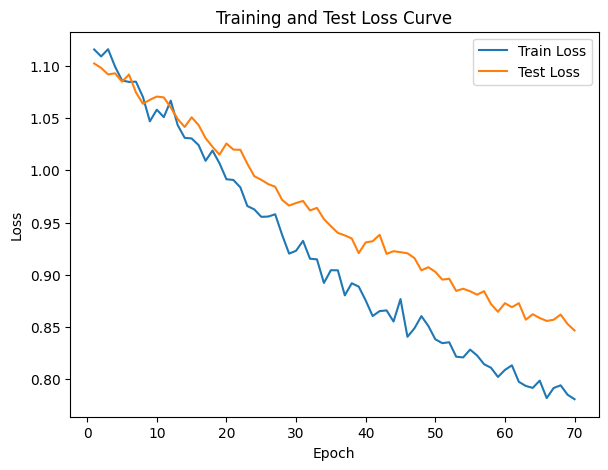

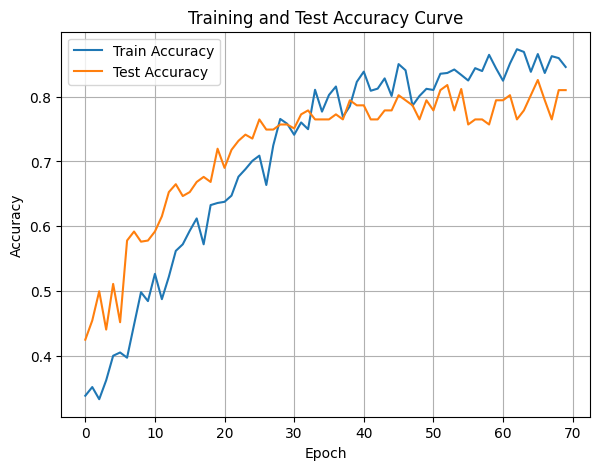

In [40]:
DTEmlp4b.train_single_model()

Randomly initializing 4 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:02,  3.66it/s]

Epoch [1/10], Train F1:0.2955360949111397, Train Loss: 1.1490, Train Acc: 0.2437, Test F1:0.3332326588140542, Test Loss: 1.1021, Test Acc: 0.2648


Training Process:  20%|██        | 2/10 [00:00<00:01,  4.31it/s]

Epoch [2/10], Train F1:0.32490819367851975, Train Loss: 1.1436, Train Acc: 0.2710, Test F1:0.32054717833848384, Test Loss: 1.1099, Test Acc: 0.2500
Epoch [3/10], Train F1:0.3281049834866507, Train Loss: 1.1401, Train Acc: 0.2759, Test F1:0.3268082486919052, Test Loss: 1.1068, Test Acc: 0.2581


Training Process:  40%|████      | 4/10 [00:00<00:01,  4.72it/s]

Epoch [4/10], Train F1:0.3385799638828379, Train Loss: 1.1385, Train Acc: 0.2822, Test F1:0.3333772086522129, Test Loss: 1.1063, Test Acc: 0.2661


Training Process:  60%|██████    | 6/10 [00:01<00:00,  5.09it/s]

Epoch [5/10], Train F1:0.3389150095218907, Train Loss: 1.1358, Train Acc: 0.2861, Test F1:0.33698514872312674, Test Loss: 1.1047, Test Acc: 0.2724
Epoch [6/10], Train F1:0.34112979354728457, Train Loss: 1.1332, Train Acc: 0.2913, Test F1:0.3438174553971499, Test Loss: 1.1020, Test Acc: 0.2826


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.65it/s]

Epoch [7/10], Train F1:0.34873108361843747, Train Loss: 1.1301, Train Acc: 0.2982, Test F1:0.3446804845176831, Test Loss: 1.1018, Test Acc: 0.2814
Epoch [8/10], Train F1:0.35677091280324624, Train Loss: 1.1270, Train Acc: 0.3050, Test F1:0.35079379472161776, Test Loss: 1.0999, Test Acc: 0.2854


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.36it/s]


Epoch [9/10], Train F1:0.36165853566251077, Train Loss: 1.1241, Train Acc: 0.3093, Test F1:0.3577080273688764, Test Loss: 1.0978, Test Acc: 0.2916
Epoch [10/10], Train F1:0.37042804218901515, Train Loss: 1.1207, Train Acc: 0.3170, Test F1:0.3639425109841728, Test Loss: 1.0955, Test Acc: 0.2959
Total Epochs: 10
Train loss start: 1.187800407409668, Train loss end: 1.1996203660964966
Highest Mean Train Accuracy (over epoch): 0.3169642857142857
Test loss start: 1.111124038696289, Test loss end: 1.0645842552185059
Highest mean Test Accuracy (over epoch): 0.2959201388888889


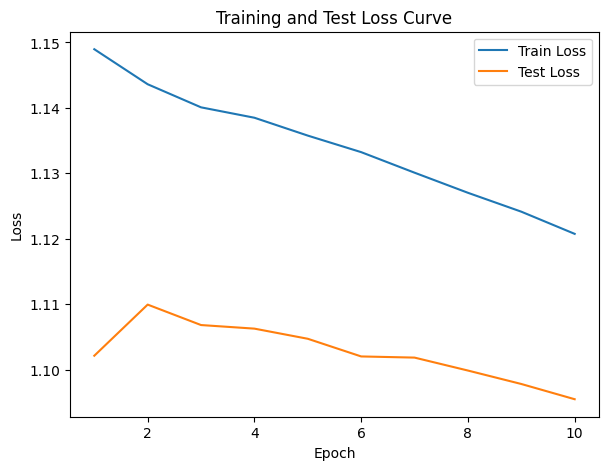

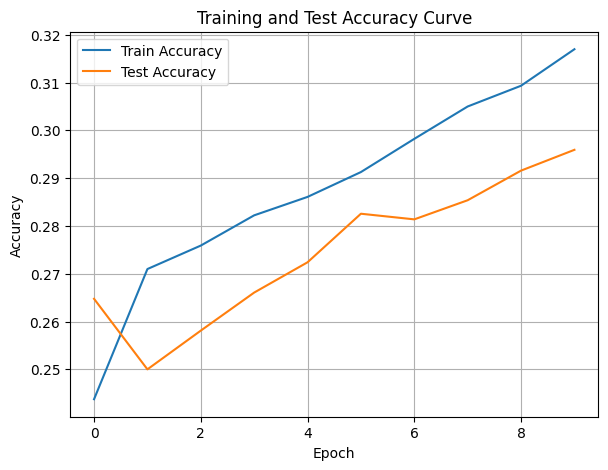

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.41it/s]

Epoch [1/10], Train F1:0.3508303461244638, Train Loss: 1.1176, Train Acc: 0.2804, Test F1:0.262280701754386, Test Loss: 1.1198, Test Acc: 0.1962


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.60it/s]

Epoch [2/10], Train F1:0.355294926770891, Train Loss: 1.1180, Train Acc: 0.2878, Test F1:0.24673692932034919, Test Loss: 1.1259, Test Acc: 0.1784


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.44it/s]

Epoch [3/10], Train F1:0.3583086837596714, Train Loss: 1.1184, Train Acc: 0.2863, Test F1:0.22942709710080153, Test Loss: 1.1242, Test Acc: 0.1698


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.44it/s]

Epoch [4/10], Train F1:0.3666265295878586, Train Loss: 1.1159, Train Acc: 0.2950, Test F1:0.2401189126072864, Test Loss: 1.1246, Test Acc: 0.1773


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.91it/s]

Epoch [5/10], Train F1:0.3736605465169332, Train Loss: 1.1146, Train Acc: 0.3023, Test F1:0.250635343043355, Test Loss: 1.1231, Test Acc: 0.1889


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.91it/s]

Epoch [6/10], Train F1:0.3852380043389117, Train Loss: 1.1100, Train Acc: 0.3140, Test F1:0.2586029744663431, Test Loss: 1.1224, Test Acc: 0.1943


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.90it/s]

Epoch [7/10], Train F1:0.38701948165119204, Train Loss: 1.1065, Train Acc: 0.3177, Test F1:0.2665940619931558, Test Loss: 1.1206, Test Acc: 0.2001


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.44it/s]

Epoch [8/10], Train F1:0.396292003075148, Train Loss: 1.1027, Train Acc: 0.3283, Test F1:0.27826424635770547, Test Loss: 1.1188, Test Acc: 0.2092


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  8.90it/s]

Epoch [9/10], Train F1:0.4047509059705515, Train Loss: 1.1000, Train Acc: 0.3362, Test F1:0.28709485578352667, Test Loss: 1.1163, Test Acc: 0.2169


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.49it/s]


Epoch [10/10], Train F1:0.4093808731439269, Train Loss: 1.0971, Train Acc: 0.3425, Test F1:0.29843351631663567, Test Loss: 1.1139, Test Acc: 0.2223
Total Epochs: 10
Train loss start: 1.1153217554092407, Train loss end: 0.9968952536582947
Highest Mean Train Accuracy (over epoch): 0.3424702380952381
Test loss start: 1.1168434619903564, Test loss end: 1.0923495292663574
Highest mean Test Accuracy (over epoch): 0.22230902777777778


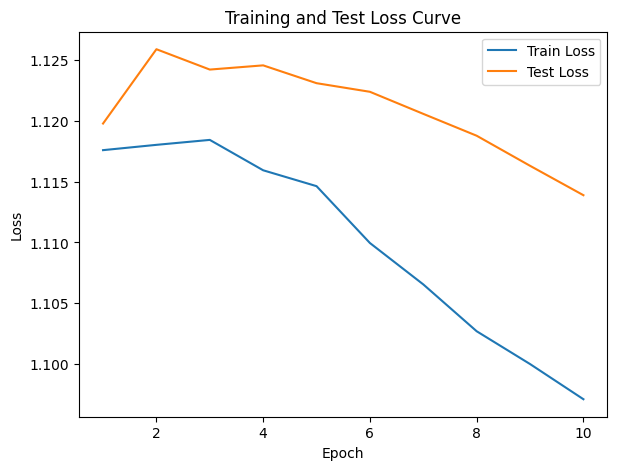

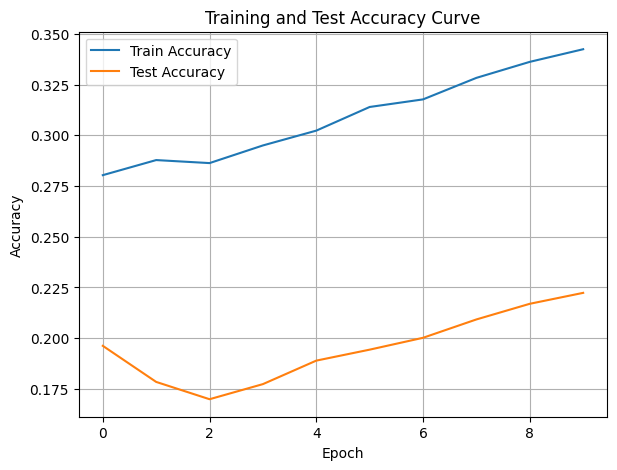

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.75it/s]

Epoch [1/10], Train F1:0.46731574304192053, Train Loss: 1.0539, Train Acc: 0.4307, Test F1:0.3408496816050875, Test Loss: 1.0995, Test Acc: 0.2231


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.84it/s]

Epoch [2/10], Train F1:0.48304446544946467, Train Loss: 1.0476, Train Acc: 0.4475, Test F1:0.3185570039915205, Test Loss: 1.0995, Test Acc: 0.2214


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.84it/s]

Epoch [3/10], Train F1:0.4880001420965128, Train Loss: 1.0465, Train Acc: 0.4470, Test F1:0.3430629939931417, Test Loss: 1.0978, Test Acc: 0.2416


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.34it/s]

Epoch [4/10], Train F1:0.5066505546644465, Train Loss: 1.0416, Train Acc: 0.4603, Test F1:0.3567730136151189, Test Loss: 1.0964, Test Acc: 0.2572
Epoch [5/10], Train F1:0.5057931713716165, Train Loss: 1.0394, Train Acc: 0.4605, Test F1:0.36213979841842214, Test Loss: 1.0956, Test Acc: 0.2590


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.46it/s]

Epoch [6/10], Train F1:0.5031445972694352, Train Loss: 1.0394, Train Acc: 0.4622, Test F1:0.39659456148955763, Test Loss: 1.0922, Test Acc: 0.2834
Epoch [7/10], Train F1:0.5103363212968769, Train Loss: 1.0354, Train Acc: 0.4705, Test F1:0.40995384365892656, Test Loss: 1.0902, Test Acc: 0.2992


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.60it/s]

Epoch [8/10], Train F1:0.5253038166610571, Train Loss: 1.0305, Train Acc: 0.4848, Test F1:0.43943385370122945, Test Loss: 1.0874, Test Acc: 0.3216
Epoch [9/10], Train F1:0.5327004351957598, Train Loss: 1.0289, Train Acc: 0.4892, Test F1:0.4490853693377281, Test Loss: 1.0857, Test Acc: 0.3323


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.21it/s]


Epoch [10/10], Train F1:0.542122295583736, Train Loss: 1.0240, Train Acc: 0.4977, Test F1:0.46993897317775646, Test Loss: 1.0837, Test Acc: 0.3506
Total Epochs: 10
Train loss start: 1.038779377937317, Train loss end: 0.9468401670455933
Highest Mean Train Accuracy (over epoch): 0.4977083333333333
Test loss start: 1.0995349884033203, Test loss end: 1.061169147491455
Highest mean Test Accuracy (over epoch): 0.3506076388888889


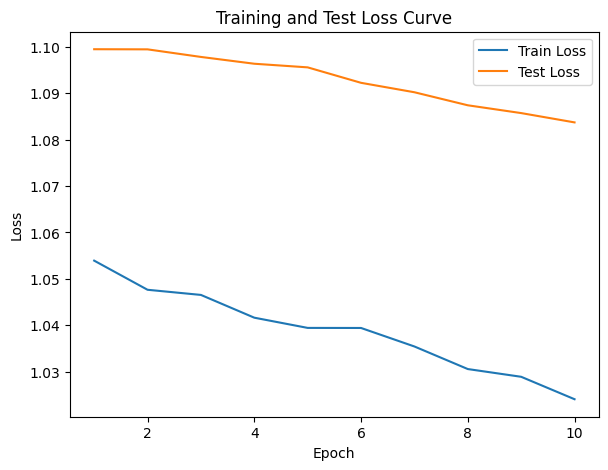

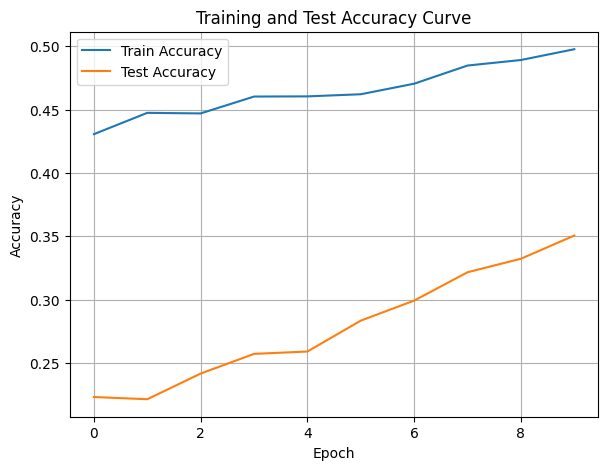

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.4657172462310637, Train Loss: 1.0687, Train Acc: 0.4247, Test F1:0.32327512875636044, Test Loss: 1.0868, Test Acc: 0.2760


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.20it/s]

Epoch [2/10], Train F1:0.44850930068321365, Train Loss: 1.0705, Train Acc: 0.4037, Test F1:0.32375417070283063, Test Loss: 1.0875, Test Acc: 0.2752


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.20it/s]

Epoch [3/10], Train F1:0.4416684497729379, Train Loss: 1.0710, Train Acc: 0.4010, Test F1:0.30040334697085275, Test Loss: 1.0873, Test Acc: 0.2677


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.30it/s]

Epoch [4/10], Train F1:0.4486086891650621, Train Loss: 1.0702, Train Acc: 0.4003, Test F1:0.3037577902074193, Test Loss: 1.0862, Test Acc: 0.2678


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.00it/s]

Epoch [5/10], Train F1:0.45249424233960484, Train Loss: 1.0687, Train Acc: 0.4013, Test F1:0.30425331139733314, Test Loss: 1.0847, Test Acc: 0.2722


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.00it/s]

Epoch [6/10], Train F1:0.46373995990064004, Train Loss: 1.0643, Train Acc: 0.4091, Test F1:0.2948830409356725, Test Loss: 1.0825, Test Acc: 0.2739


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.97it/s]

Epoch [7/10], Train F1:0.4635924945652116, Train Loss: 1.0613, Train Acc: 0.4107, Test F1:0.29114751697371044, Test Loss: 1.0803, Test Acc: 0.2762


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.21it/s]

Epoch [8/10], Train F1:0.46569674291787794, Train Loss: 1.0593, Train Acc: 0.4125, Test F1:0.2953703683613269, Test Loss: 1.0788, Test Acc: 0.2808


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.36it/s]

Epoch [9/10], Train F1:0.47357378786285903, Train Loss: 1.0560, Train Acc: 0.4203, Test F1:0.2999423246077962, Test Loss: 1.0780, Test Acc: 0.2860


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.41it/s]


Epoch [10/10], Train F1:0.48389372083524934, Train Loss: 1.0517, Train Acc: 0.4281, Test F1:0.30109065375416505, Test Loss: 1.0764, Test Acc: 0.2918
Total Epochs: 10
Train loss start: 1.1220571994781494, Train loss end: 1.1098766326904297
Highest Mean Train Accuracy (over epoch): 0.428125
Test loss start: 1.0967090129852295, Test loss end: 1.0645960569381714
Highest mean Test Accuracy (over epoch): 0.29184027777777777


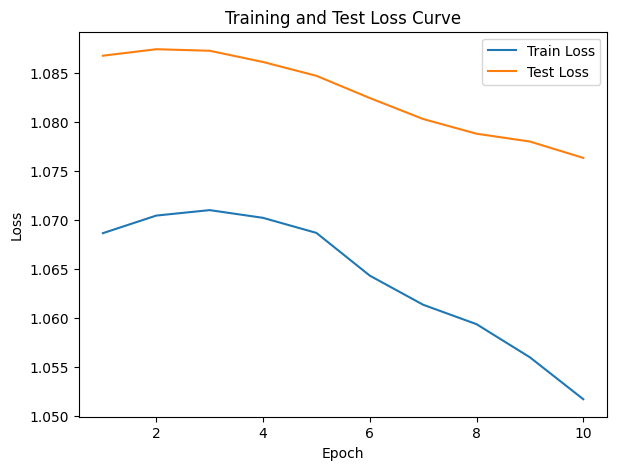

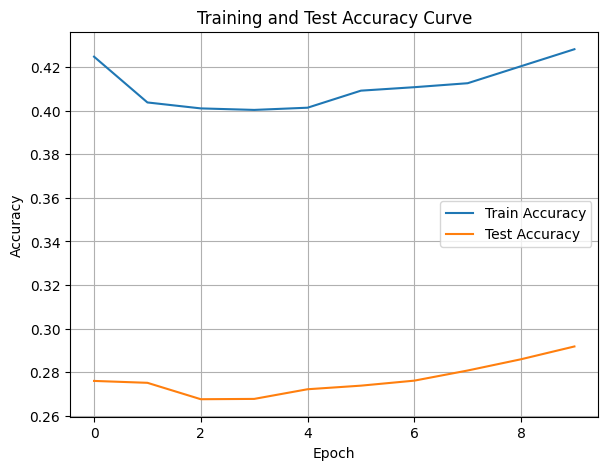

./saved_models/model_4.pth
Training Model with id 7
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.61it/s]

Epoch [1/10], Train F1:0.5869337675596046, Train Loss: 1.0126, Train Acc: 0.5286, Test F1:0.6186256982508529, Test Loss: 1.0468, Test Acc: 0.5564
Epoch [2/10], Train F1:0.5940420630689637, Train Loss: 1.0055, Train Acc: 0.5449, Test F1:0.5663457709694798, Test Loss: 1.0431, Test Acc: 0.5291


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.50it/s]

Epoch [3/10], Train F1:0.5887214649896582, Train Loss: 1.0091, Train Acc: 0.5410, Test F1:0.6028438104978313, Test Loss: 1.0421, Test Acc: 0.5579
Epoch [4/10], Train F1:0.6028894576820476, Train Loss: 1.0037, Train Acc: 0.5533, Test F1:0.5856174828605907, Test Loss: 1.0410, Test Acc: 0.5438


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.88it/s]

Epoch [5/10], Train F1:0.6086733138322508, Train Loss: 1.0005, Train Acc: 0.5573, Test F1:0.5921085210881716, Test Loss: 1.0402, Test Acc: 0.5464
Epoch [6/10], Train F1:0.6169804092494369, Train Loss: 0.9961, Train Acc: 0.5677, Test F1:0.6108107899336461, Test Loss: 1.0377, Test Acc: 0.5618


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.13it/s]

Epoch [7/10], Train F1:0.6266682276648827, Train Loss: 0.9928, Train Acc: 0.5770, Test F1:0.5991243479801833, Test Loss: 1.0363, Test Acc: 0.5523
Epoch [8/10], Train F1:0.631421839946981, Train Loss: 0.9906, Train Acc: 0.5828, Test F1:0.6192932721910394, Test Loss: 1.0348, Test Acc: 0.5707


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.13it/s]


Epoch [9/10], Train F1:0.6376585013759192, Train Loss: 0.9885, Train Acc: 0.5875, Test F1:0.6333473488020913, Test Loss: 1.0338, Test Acc: 0.5835
Epoch [10/10], Train F1:0.6470696387934322, Train Loss: 0.9873, Train Acc: 0.5969, Test F1:0.6405872793987808, Test Loss: 1.0327, Test Acc: 0.5912
Total Epochs: 10
Train loss start: 0.9674019813537598, Train loss end: 1.1709306240081787
Highest Mean Train Accuracy (over epoch): 0.5969047619047618
Test loss start: 1.0507543087005615, Test loss end: 1.0231534242630005
Highest mean Test Accuracy (over epoch): 0.5912326388888889


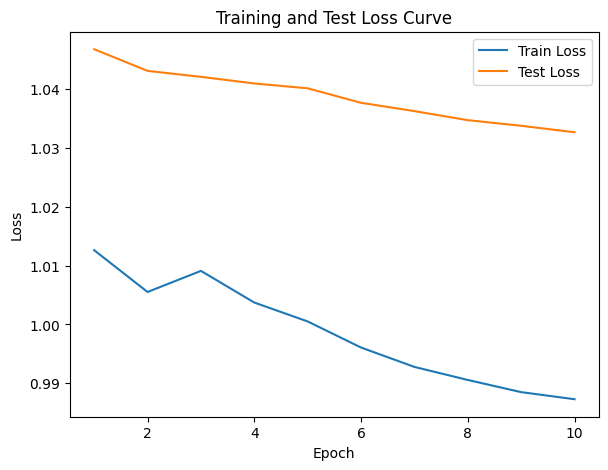

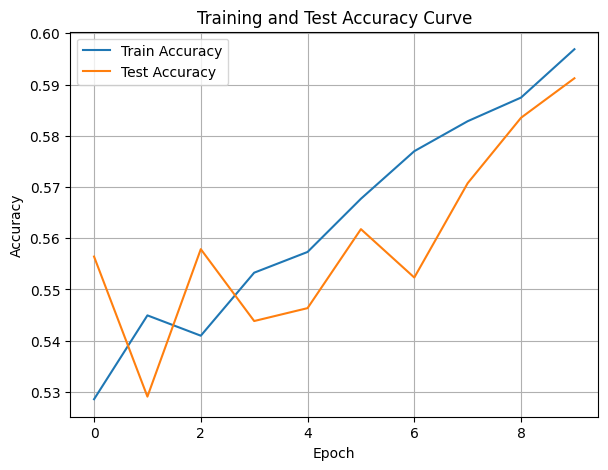

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.6952352109832426, Train Loss: 0.9709, Train Acc: 0.6378, Test F1:0.7618800086636345, Test Loss: 1.0130, Test Acc: 0.7231


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.41it/s]

Epoch [2/10], Train F1:0.6985561004116616, Train Loss: 0.9631, Train Acc: 0.6457, Test F1:0.7662894581907748, Test Loss: 1.0069, Test Acc: 0.7370


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.41it/s]

Epoch [3/10], Train F1:0.7086115563970093, Train Loss: 0.9551, Train Acc: 0.6577, Test F1:0.7828004514844178, Test Loss: 1.0060, Test Acc: 0.7526


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.05it/s]

Epoch [4/10], Train F1:0.7185970195185591, Train Loss: 0.9488, Train Acc: 0.6737, Test F1:0.767158732295359, Test Loss: 1.0039, Test Acc: 0.7389


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.23it/s]

Epoch [5/10], Train F1:0.7310979337107659, Train Loss: 0.9446, Train Acc: 0.6860, Test F1:0.7621505100951894, Test Loss: 1.0033, Test Acc: 0.7366


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.28it/s]

Epoch [6/10], Train F1:0.7393770374831997, Train Loss: 0.9402, Train Acc: 0.6937, Test F1:0.7668518080763985, Test Loss: 1.0018, Test Acc: 0.7439


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.43it/s]

Epoch [7/10], Train F1:0.7485591377525662, Train Loss: 0.9345, Train Acc: 0.7077, Test F1:0.7749320465109938, Test Loss: 0.9995, Test Acc: 0.7527


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.43it/s]

Epoch [8/10], Train F1:0.7494417035699419, Train Loss: 0.9332, Train Acc: 0.7101, Test F1:0.7796569180906472, Test Loss: 0.9977, Test Acc: 0.7566


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.73it/s]

Epoch [9/10], Train F1:0.7517852191987124, Train Loss: 0.9314, Train Acc: 0.7139, Test F1:0.7843755026727234, Test Loss: 0.9955, Test Acc: 0.7621


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.52it/s]


Epoch [10/10], Train F1:0.7538037586225012, Train Loss: 0.9292, Train Acc: 0.7175, Test F1:0.7882622072195334, Test Loss: 0.9945, Test Acc: 0.7670
Total Epochs: 10
Train loss start: 0.9536539316177368, Train loss end: 0.962462842464447
Highest Mean Train Accuracy (over epoch): 0.7175
Test loss start: 1.0142415761947632, Test loss end: 0.9820981621742249
Highest mean Test Accuracy (over epoch): 0.7670138888888889


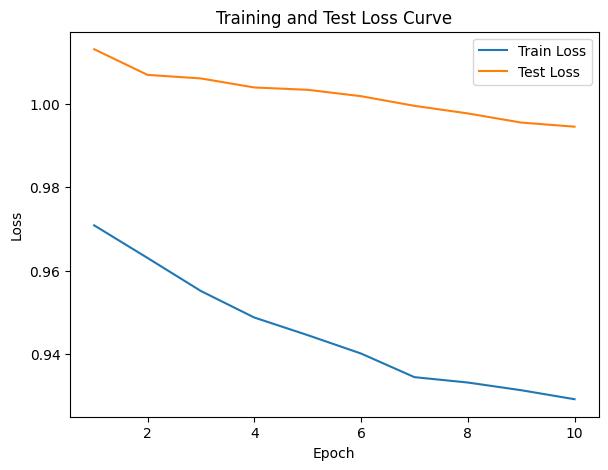

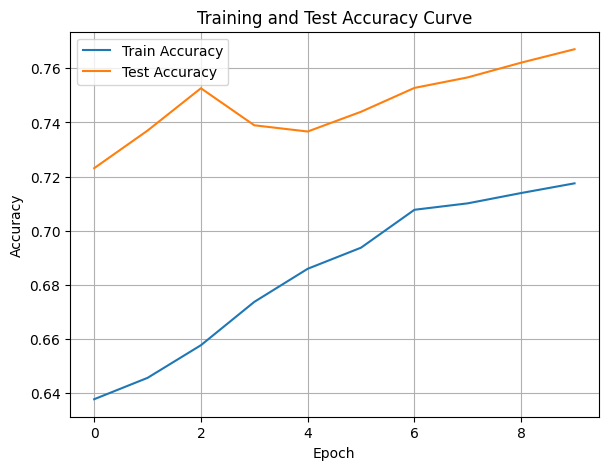

./saved_models/model_8.pth
Training Model with id 6
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.67it/s]

Epoch [1/10], Train F1:0.815248592315327, Train Loss: 0.8936, Train Acc: 0.7914, Test F1:0.8313090418353577, Test Loss: 0.9736, Test Acc: 0.8194
Epoch [2/10], Train F1:0.8120329029707962, Train Loss: 0.8929, Train Acc: 0.7818, Test F1:0.8122891705319517, Test Loss: 0.9790, Test Acc: 0.7969


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.67it/s]

Epoch [3/10], Train F1:0.8140985692442214, Train Loss: 0.8900, Train Acc: 0.7903, Test F1:0.8152824043230439, Test Loss: 0.9768, Test Acc: 0.7998


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.22it/s]

Epoch [4/10], Train F1:0.814540088472473, Train Loss: 0.8890, Train Acc: 0.7913, Test F1:0.8150782259208491, Test Loss: 0.9751, Test Acc: 0.8008


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.22it/s]

Epoch [5/10], Train F1:0.8198281492704966, Train Loss: 0.8835, Train Acc: 0.7999, Test F1:0.8166396257155214, Test Loss: 0.9727, Test Acc: 0.8030


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.88it/s]

Epoch [6/10], Train F1:0.8190182480429393, Train Loss: 0.8815, Train Acc: 0.7986, Test F1:0.8213296476270009, Test Loss: 0.9690, Test Acc: 0.8093


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.88it/s]

Epoch [7/10], Train F1:0.8179130814146945, Train Loss: 0.8798, Train Acc: 0.7955, Test F1:0.8127995982720857, Test Loss: 0.9675, Test Acc: 0.8010


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.97it/s]

Epoch [8/10], Train F1:0.8177768017383086, Train Loss: 0.8774, Train Acc: 0.7953, Test F1:0.8156342448662337, Test Loss: 0.9655, Test Acc: 0.8050


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.97it/s]

Epoch [9/10], Train F1:0.8203449135936354, Train Loss: 0.8758, Train Acc: 0.7981, Test F1:0.8177292287322079, Test Loss: 0.9634, Test Acc: 0.8075


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.30it/s]


Epoch [10/10], Train F1:0.8189286260580063, Train Loss: 0.8748, Train Acc: 0.7988, Test F1:0.8198264831129106, Test Loss: 0.9622, Test Acc: 0.8095
Total Epochs: 10
Train loss start: 0.8436777591705322, Train loss end: 0.909927487373352
Highest Mean Train Accuracy (over epoch): 0.7998809523809524
Test loss start: 0.9731945991516113, Test loss end: 0.950230062007904
Highest mean Test Accuracy (over epoch): 0.8194444444444444


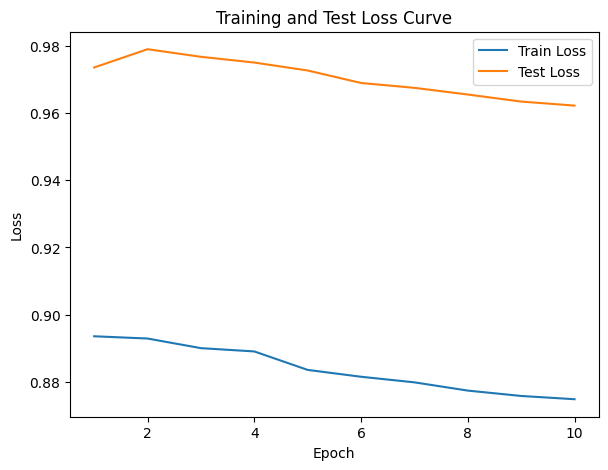

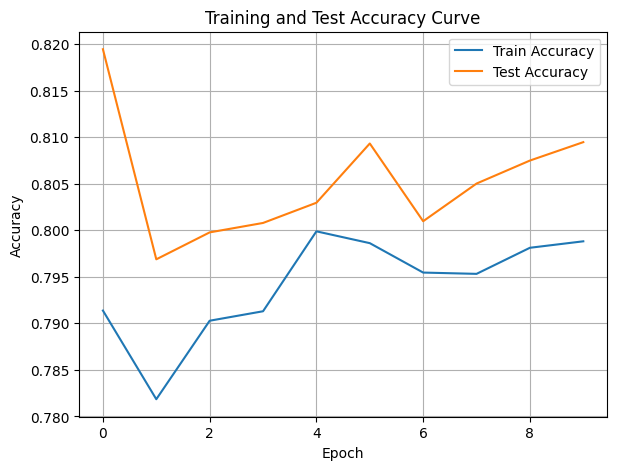

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [41]:
DTEmlp4b.train_DTE()

Training Process:   1%|▏         | 1/70 [00:00<00:08,  7.99it/s]

Epoch [1/70], Train F1:0.5710088257482799, Train Loss: 1.0246, Train Acc: 0.5580, Test F1:0.5106416153426366, Test Loss: 1.0664, Test Acc: 0.5000


Training Process:   1%|▏         | 1/70 [00:00<00:08,  7.99it/s]

Epoch [2/70], Train F1:0.5538627499792548, Train Loss: 1.0356, Train Acc: 0.5281, Test F1:0.4612216341982247, Test Loss: 1.0673, Test Acc: 0.4588


Training Process:   4%|▍         | 3/70 [00:00<00:06,  9.73it/s]

Epoch [3/70], Train F1:0.5721139268894372, Train Loss: 1.0259, Train Acc: 0.5432, Test F1:0.4978232618583497, Test Loss: 1.0639, Test Acc: 0.4861


Training Process:   7%|▋         | 5/70 [00:00<00:06, 10.48it/s]

Epoch [4/70], Train F1:0.5765217654916547, Train Loss: 1.0237, Train Acc: 0.5463, Test F1:0.509263429171896, Test Loss: 1.0610, Test Acc: 0.4959
Epoch [5/70], Train F1:0.5791667238824587, Train Loss: 1.0212, Train Acc: 0.5520, Test F1:0.5040063337348396, Test Loss: 1.0599, Test Acc: 0.4951


Training Process:   7%|▋         | 5/70 [00:00<00:06, 10.48it/s]

Epoch [6/70], Train F1:0.5868977675972665, Train Loss: 1.0181, Train Acc: 0.5585, Test F1:0.49418550512602677, Test Loss: 1.0592, Test Acc: 0.4874


Training Process:  10%|█         | 7/70 [00:00<00:06, 10.48it/s]

Epoch [7/70], Train F1:0.5896640362303386, Train Loss: 1.0169, Train Acc: 0.5624, Test F1:0.4973051375523858, Test Loss: 1.0578, Test Acc: 0.4917


Training Process:  10%|█         | 7/70 [00:00<00:06, 10.48it/s]

Epoch [8/70], Train F1:0.5929508030343466, Train Loss: 1.0132, Train Acc: 0.5667, Test F1:0.4922654168717046, Test Loss: 1.0563, Test Acc: 0.4890


Training Process:  13%|█▎        | 9/70 [00:00<00:05, 10.52it/s]

Epoch [9/70], Train F1:0.5947796701559646, Train Loss: 1.0105, Train Acc: 0.5679, Test F1:0.485545269716191, Test Loss: 1.0556, Test Acc: 0.4859


Training Process:  13%|█▎        | 9/70 [00:00<00:05, 10.52it/s]

Epoch [10/70], Train F1:0.6027164992829107, Train Loss: 1.0062, Train Acc: 0.5771, Test F1:0.5013322782260111, Test Loss: 1.0545, Test Acc: 0.4995


Training Process:  16%|█▌        | 11/70 [00:01<00:05, 10.30it/s]

Epoch [11/70], Train F1:0.6090606531137391, Train Loss: 1.0030, Train Acc: 0.5843, Test F1:0.49478150115131025, Test Loss: 1.0538, Test Acc: 0.4954


Training Process:  16%|█▌        | 11/70 [00:01<00:05, 10.30it/s]

Epoch [12/70], Train F1:0.6149704644146197, Train Loss: 0.9996, Train Acc: 0.5906, Test F1:0.503964539347267, Test Loss: 1.0524, Test Acc: 0.5028


Training Process:  19%|█▊        | 13/70 [00:01<00:06,  9.24it/s]

Epoch [13/70], Train F1:0.6213083177880173, Train Loss: 0.9955, Train Acc: 0.5974, Test F1:0.5014976746327762, Test Loss: 1.0515, Test Acc: 0.5021


Training Process:  20%|██        | 14/70 [00:01<00:06,  9.07it/s]

Epoch [14/70], Train F1:0.6278075712379048, Train Loss: 0.9918, Train Acc: 0.6040, Test F1:0.49898594177841804, Test Loss: 1.0507, Test Acc: 0.5014


Training Process:  21%|██▏       | 15/70 [00:01<00:06,  8.81it/s]

Epoch [15/70], Train F1:0.6313377894073695, Train Loss: 0.9889, Train Acc: 0.6081, Test F1:0.5047456215339426, Test Loss: 1.0488, Test Acc: 0.5071


Training Process:  23%|██▎       | 16/70 [00:01<00:06,  8.65it/s]

Epoch [16/70], Train F1:0.63755882611582, Train Loss: 0.9853, Train Acc: 0.6151, Test F1:0.49899477246153606, Test Loss: 1.0483, Test Acc: 0.5042


Training Process:  24%|██▍       | 17/70 [00:01<00:06,  8.37it/s]

Epoch [17/70], Train F1:0.6407688973032649, Train Loss: 0.9827, Train Acc: 0.6181, Test F1:0.49820868046169736, Test Loss: 1.0473, Test Acc: 0.5040


Training Process:  26%|██▌       | 18/70 [00:01<00:06,  8.25it/s]

Epoch [18/70], Train F1:0.6444741379038752, Train Loss: 0.9798, Train Acc: 0.6221, Test F1:0.5089339296195065, Test Loss: 1.0461, Test Acc: 0.5127


Training Process:  27%|██▋       | 19/70 [00:02<00:06,  7.54it/s]

Epoch [19/70], Train F1:0.650430575991087, Train Loss: 0.9762, Train Acc: 0.6291, Test F1:0.5116448459676177, Test Loss: 1.0447, Test Acc: 0.5150


Training Process:  29%|██▊       | 20/70 [00:02<00:06,  7.27it/s]

Epoch [20/70], Train F1:0.6549828068926198, Train Loss: 0.9731, Train Acc: 0.6342, Test F1:0.5087974471393796, Test Loss: 1.0438, Test Acc: 0.5139


Training Process:  31%|███▏      | 22/70 [00:02<00:07,  6.55it/s]

Epoch [21/70], Train F1:0.6597997635928063, Train Loss: 0.9697, Train Acc: 0.6395, Test F1:0.5063372114758053, Test Loss: 1.0426, Test Acc: 0.5126
Epoch [22/70], Train F1:0.6647624785669828, Train Loss: 0.9663, Train Acc: 0.6449, Test F1:0.515896882701515, Test Loss: 1.0411, Test Acc: 0.5197


Training Process:  34%|███▍      | 24/70 [00:02<00:07,  6.52it/s]

Epoch [23/70], Train F1:0.6699447080074945, Train Loss: 0.9626, Train Acc: 0.6499, Test F1:0.523173913047592, Test Loss: 1.0397, Test Acc: 0.5256
Epoch [24/70], Train F1:0.6732955038470678, Train Loss: 0.9599, Train Acc: 0.6537, Test F1:0.5371540366777681, Test Loss: 1.0378, Test Acc: 0.5369


Training Process:  37%|███▋      | 26/70 [00:03<00:06,  6.84it/s]

Epoch [25/70], Train F1:0.6763866286325473, Train Loss: 0.9571, Train Acc: 0.6573, Test F1:0.5427360430965333, Test Loss: 1.0363, Test Acc: 0.5416
Epoch [26/70], Train F1:0.6813363935768209, Train Loss: 0.9538, Train Acc: 0.6629, Test F1:0.5474768661306613, Test Loss: 1.0348, Test Acc: 0.5458


Training Process:  40%|████      | 28/70 [00:03<00:06,  6.46it/s]

Epoch [27/70], Train F1:0.6859704330751198, Train Loss: 0.9507, Train Acc: 0.6682, Test F1:0.5563593690484192, Test Loss: 1.0333, Test Acc: 0.5537
Epoch [28/70], Train F1:0.6898757167060715, Train Loss: 0.9477, Train Acc: 0.6724, Test F1:0.5666563859734357, Test Loss: 1.0315, Test Acc: 0.5626


Training Process:  43%|████▎     | 30/70 [00:03<00:06,  6.13it/s]

Epoch [29/70], Train F1:0.693911679724873, Train Loss: 0.9448, Train Acc: 0.6765, Test F1:0.5773492732933242, Test Loss: 1.0297, Test Acc: 0.5719
Epoch [30/70], Train F1:0.6969445156059797, Train Loss: 0.9425, Train Acc: 0.6796, Test F1:0.586258750324086, Test Loss: 1.0281, Test Acc: 0.5795


Training Process:  44%|████▍     | 31/70 [00:04<00:06,  5.89it/s]

Epoch [31/70], Train F1:0.699675718381439, Train Loss: 0.9398, Train Acc: 0.6827, Test F1:0.5928236338137047, Test Loss: 1.0267, Test Acc: 0.5853


Training Process:  46%|████▌     | 32/70 [00:04<00:07,  4.80it/s]

Epoch [32/70], Train F1:0.7031894957968359, Train Loss: 0.9369, Train Acc: 0.6867, Test F1:0.597747798405693, Test Loss: 1.0252, Test Acc: 0.5898


Training Process:  47%|████▋     | 33/70 [00:04<00:08,  4.48it/s]

Epoch [33/70], Train F1:0.7062838036095223, Train Loss: 0.9342, Train Acc: 0.6898, Test F1:0.6028835499190619, Test Loss: 1.0237, Test Acc: 0.5943


Training Process:  49%|████▊     | 34/70 [00:04<00:07,  4.60it/s]

Epoch [34/70], Train F1:0.708928039061833, Train Loss: 0.9320, Train Acc: 0.6925, Test F1:0.6107663944004617, Test Loss: 1.0219, Test Acc: 0.6016


Training Process:  50%|█████     | 35/70 [00:05<00:08,  4.25it/s]

Epoch [35/70], Train F1:0.7117331292143062, Train Loss: 0.9295, Train Acc: 0.6956, Test F1:0.6177009720052937, Test Loss: 1.0199, Test Acc: 0.6078


Training Process:  51%|█████▏    | 36/70 [00:05<00:08,  3.96it/s]

Epoch [36/70], Train F1:0.7147571433837908, Train Loss: 0.9269, Train Acc: 0.6988, Test F1:0.6228500598487531, Test Loss: 1.0187, Test Acc: 0.6126


Training Process:  53%|█████▎    | 37/70 [00:05<00:08,  3.81it/s]

Epoch [37/70], Train F1:0.7171780203309254, Train Loss: 0.9247, Train Acc: 0.7017, Test F1:0.6293693498231969, Test Loss: 1.0170, Test Acc: 0.6188


Training Process:  54%|█████▍    | 38/70 [00:05<00:09,  3.54it/s]

Epoch [38/70], Train F1:0.719343003220626, Train Loss: 0.9224, Train Acc: 0.7041, Test F1:0.6349792984005793, Test Loss: 1.0155, Test Acc: 0.6241


Training Process:  56%|█████▌    | 39/70 [00:06<00:08,  3.56it/s]

Epoch [39/70], Train F1:0.7223677209977866, Train Loss: 0.9196, Train Acc: 0.7075, Test F1:0.6389869583581529, Test Loss: 1.0141, Test Acc: 0.6278


Training Process:  57%|█████▋    | 40/70 [00:06<00:09,  3.24it/s]

Epoch [40/70], Train F1:0.7249345246520114, Train Loss: 0.9172, Train Acc: 0.7102, Test F1:0.6428096739695474, Test Loss: 1.0125, Test Acc: 0.6314


Training Process:  59%|█████▊    | 41/70 [00:06<00:08,  3.36it/s]

Epoch [41/70], Train F1:0.7275574328167355, Train Loss: 0.9149, Train Acc: 0.7130, Test F1:0.6485195459633047, Test Loss: 1.0107, Test Acc: 0.6371


Training Process:  60%|██████    | 42/70 [00:07<00:07,  3.51it/s]

Epoch [42/70], Train F1:0.7297380158024276, Train Loss: 0.9127, Train Acc: 0.7155, Test F1:0.6537226141011224, Test Loss: 1.0092, Test Acc: 0.6420


Training Process:  61%|██████▏   | 43/70 [00:07<00:07,  3.55it/s]

Epoch [43/70], Train F1:0.7315243857406054, Train Loss: 0.9107, Train Acc: 0.7177, Test F1:0.6590306038384734, Test Loss: 1.0076, Test Acc: 0.6472


Training Process:  63%|██████▎   | 44/70 [00:07<00:07,  3.63it/s]

Epoch [44/70], Train F1:0.7340458720504084, Train Loss: 0.9084, Train Acc: 0.7203, Test F1:0.662398305927741, Test Loss: 1.0062, Test Acc: 0.6503


Training Process:  64%|██████▍   | 45/70 [00:07<00:06,  3.73it/s]

Epoch [45/70], Train F1:0.7370041055402012, Train Loss: 0.9060, Train Acc: 0.7236, Test F1:0.6664160037865692, Test Loss: 1.0047, Test Acc: 0.6542


Training Process:  67%|██████▋   | 47/70 [00:08<00:05,  4.43it/s]

Epoch [46/70], Train F1:0.7397985198138722, Train Loss: 0.9037, Train Acc: 0.7266, Test F1:0.6694211995438398, Test Loss: 1.0034, Test Acc: 0.6570
Epoch [47/70], Train F1:0.7421834890484754, Train Loss: 0.9013, Train Acc: 0.7294, Test F1:0.6738909788067555, Test Loss: 1.0020, Test Acc: 0.6613


Training Process:  69%|██████▊   | 48/70 [00:08<00:04,  4.81it/s]

Epoch [48/70], Train F1:0.7448623627158549, Train Loss: 0.8991, Train Acc: 0.7320, Test F1:0.6772119345718409, Test Loss: 1.0006, Test Acc: 0.6646


Training Process:  70%|███████   | 49/70 [00:08<00:04,  4.64it/s]

Epoch [49/70], Train F1:0.7466287265264429, Train Loss: 0.8972, Train Acc: 0.7338, Test F1:0.6805672090155308, Test Loss: 0.9991, Test Acc: 0.6678


Training Process:  71%|███████▏  | 50/70 [00:08<00:04,  4.71it/s]

Epoch [50/70], Train F1:0.7488910211587579, Train Loss: 0.8948, Train Acc: 0.7363, Test F1:0.6848400074657741, Test Loss: 0.9976, Test Acc: 0.6720


Training Process:  73%|███████▎  | 51/70 [00:09<00:04,  4.62it/s]

Epoch [51/70], Train F1:0.7510950054973119, Train Loss: 0.8926, Train Acc: 0.7389, Test F1:0.6885980944305042, Test Loss: 0.9960, Test Acc: 0.6757


Training Process:  74%|███████▍  | 52/70 [00:09<00:03,  4.61it/s]

Epoch [52/70], Train F1:0.7524699761376263, Train Loss: 0.8909, Train Acc: 0.7404, Test F1:0.6921891103645846, Test Loss: 0.9943, Test Acc: 0.6793


Training Process:  76%|███████▌  | 53/70 [00:09<00:03,  4.72it/s]

Epoch [53/70], Train F1:0.7537770120914286, Train Loss: 0.8892, Train Acc: 0.7418, Test F1:0.6956351934765878, Test Loss: 0.9927, Test Acc: 0.6828


Training Process:  77%|███████▋  | 54/70 [00:09<00:03,  4.49it/s]

Epoch [54/70], Train F1:0.7556322104845803, Train Loss: 0.8872, Train Acc: 0.7439, Test F1:0.6992571186931744, Test Loss: 0.9913, Test Acc: 0.6865


Training Process:  79%|███████▊  | 55/70 [00:10<00:03,  4.46it/s]

Epoch [55/70], Train F1:0.7572764552514736, Train Loss: 0.8854, Train Acc: 0.7456, Test F1:0.7024182072802533, Test Loss: 0.9899, Test Acc: 0.6896


Training Process:  80%|████████  | 56/70 [00:10<00:03,  4.47it/s]

Epoch [56/70], Train F1:0.7587171424828105, Train Loss: 0.8835, Train Acc: 0.7472, Test F1:0.7048404745656124, Test Loss: 0.9885, Test Acc: 0.6920


Training Process:  81%|████████▏ | 57/70 [00:10<00:03,  4.21it/s]

Epoch [57/70], Train F1:0.7609419791814982, Train Loss: 0.8816, Train Acc: 0.7495, Test F1:0.7077825232740121, Test Loss: 0.9868, Test Acc: 0.6950


Training Process:  83%|████████▎ | 58/70 [00:10<00:02,  4.30it/s]

Epoch [58/70], Train F1:0.762336856728128, Train Loss: 0.8799, Train Acc: 0.7511, Test F1:0.71060994317404, Test Loss: 0.9854, Test Acc: 0.6978


Training Process:  84%|████████▍ | 59/70 [00:10<00:02,  4.47it/s]

Epoch [59/70], Train F1:0.7640264567418963, Train Loss: 0.8781, Train Acc: 0.7529, Test F1:0.7133324479658554, Test Loss: 0.9838, Test Acc: 0.7006


Training Process:  86%|████████▌ | 60/70 [00:11<00:02,  4.44it/s]

Epoch [60/70], Train F1:0.7651995647554771, Train Loss: 0.8763, Train Acc: 0.7543, Test F1:0.7159534251828241, Test Loss: 0.9824, Test Acc: 0.7034


Training Process:  87%|████████▋ | 61/70 [00:11<00:02,  4.39it/s]

Epoch [61/70], Train F1:0.7668529912699876, Train Loss: 0.8745, Train Acc: 0.7561, Test F1:0.7184786281407358, Test Loss: 0.9809, Test Acc: 0.7060


Training Process:  89%|████████▊ | 62/70 [00:11<00:01,  4.28it/s]

Epoch [62/70], Train F1:0.7680192075376276, Train Loss: 0.8729, Train Acc: 0.7574, Test F1:0.7210529520406295, Test Loss: 0.9792, Test Acc: 0.7087


Training Process:  90%|█████████ | 63/70 [00:11<00:01,  4.22it/s]

Epoch [63/70], Train F1:0.7693588569301164, Train Loss: 0.8713, Train Acc: 0.7588, Test F1:0.7236816203763131, Test Loss: 0.9779, Test Acc: 0.7114


Training Process:  91%|█████████▏| 64/70 [00:12<00:01,  4.11it/s]

Epoch [64/70], Train F1:0.7706987699641107, Train Loss: 0.8698, Train Acc: 0.7602, Test F1:0.7251831360490105, Test Loss: 0.9768, Test Acc: 0.7128


Training Process:  93%|█████████▎| 65/70 [00:12<00:01,  4.27it/s]

Epoch [65/70], Train F1:0.771878371857892, Train Loss: 0.8683, Train Acc: 0.7615, Test F1:0.7275325711386533, Test Loss: 0.9757, Test Acc: 0.7153


Training Process:  94%|█████████▍| 66/70 [00:12<00:00,  4.43it/s]

Epoch [66/70], Train F1:0.7734590814651595, Train Loss: 0.8667, Train Acc: 0.7630, Test F1:0.7290450812345607, Test Loss: 0.9746, Test Acc: 0.7167


Training Process:  96%|█████████▌| 67/70 [00:12<00:00,  4.17it/s]

Epoch [67/70], Train F1:0.7744375096486372, Train Loss: 0.8653, Train Acc: 0.7640, Test F1:0.7313914834356315, Test Loss: 0.9733, Test Acc: 0.7191


Training Process:  97%|█████████▋| 68/70 [00:13<00:00,  4.24it/s]

Epoch [68/70], Train F1:0.7753223387616477, Train Loss: 0.8639, Train Acc: 0.7651, Test F1:0.7329247956436826, Test Loss: 0.9722, Test Acc: 0.7205


Training Process:  99%|█████████▊| 69/70 [00:13<00:00,  4.45it/s]

Epoch [69/70], Train F1:0.7764444880277085, Train Loss: 0.8624, Train Acc: 0.7665, Test F1:0.7348858987462236, Test Loss: 0.9707, Test Acc: 0.7226


Training Process: 100%|██████████| 70/70 [00:13<00:00,  5.17it/s]


Epoch [70/70], Train F1:0.7777802584127943, Train Loss: 0.8608, Train Acc: 0.7681, Test F1:0.7364519741072642, Test Loss: 0.9696, Test Acc: 0.7241
Total Epochs: 70
Train loss start: 1.1236677169799805, Train loss end: 0.723255455493927
Highest Mean Train Accuracy (over epoch): 0.7680527210884354
Test loss start: 1.0607242584228516, Test loss end: 0.8858106136322021
Highest Mean Test Accuracy (over epoch): 0.7241071428571428


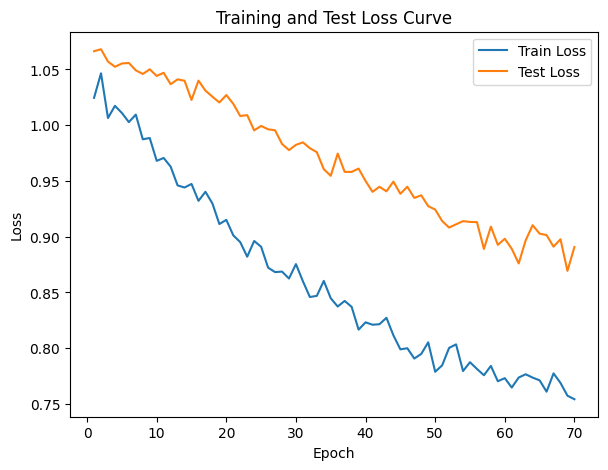

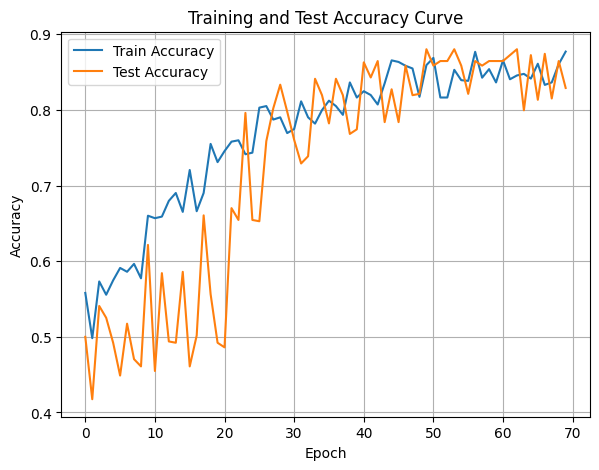

In [42]:
DTEmlp4b.train_single_model()

Randomly initializing 4 models
Training Model with id 1
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.45770870357181676, Train Loss: 1.0796, Train Acc: 0.3836, Test F1:0.2585326953748006, Test Loss: 1.1150, Test Acc: 0.1606


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.91it/s]

Epoch [2/10], Train F1:0.4592716141373436, Train Loss: 1.0772, Train Acc: 0.3879, Test F1:0.22910204099144904, Test Loss: 1.1267, Test Acc: 0.1372


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.91it/s]

Epoch [3/10], Train F1:0.4581185906138391, Train Loss: 1.0765, Train Acc: 0.3893, Test F1:0.21005577940777936, Test Loss: 1.1304, Test Acc: 0.1241


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.38it/s]

Epoch [4/10], Train F1:0.4703117441169275, Train Loss: 1.0722, Train Acc: 0.4036, Test F1:0.22007751231329784, Test Loss: 1.1275, Test Acc: 0.1309


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.17it/s]

Epoch [5/10], Train F1:0.4734819597241957, Train Loss: 1.0702, Train Acc: 0.4071, Test F1:0.22591778415941674, Test Loss: 1.1254, Test Acc: 0.1337


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.29it/s]

Epoch [6/10], Train F1:0.47227656862962814, Train Loss: 1.0675, Train Acc: 0.4093, Test F1:0.22298994697548333, Test Loss: 1.1252, Test Acc: 0.1317


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.45it/s]

Epoch [7/10], Train F1:0.4804258776290582, Train Loss: 1.0635, Train Acc: 0.4171, Test F1:0.22857696660140542, Test Loss: 1.1242, Test Acc: 0.1347


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.38it/s]

Epoch [8/10], Train F1:0.48737513230685964, Train Loss: 1.0602, Train Acc: 0.4228, Test F1:0.23167853742081862, Test Loss: 1.1238, Test Acc: 0.1360


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.48it/s]

Epoch [9/10], Train F1:0.49134662747151125, Train Loss: 1.0565, Train Acc: 0.4292, Test F1:0.2391952272072793, Test Loss: 1.1226, Test Acc: 0.1418


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.21it/s]


Epoch [10/10], Train F1:0.49889589191451117, Train Loss: 1.0522, Train Acc: 0.4382, Test F1:0.24551655242647713, Test Loss: 1.1210, Test Acc: 0.1452
Total Epochs: 10
Train loss start: 1.0493897199630737, Train loss end: 1.0087412595748901
Highest Mean Train Accuracy (over epoch): 0.4381845238095238
Test loss start: 1.1148189306259155, Test loss end: 1.090006709098816
Highest mean Test Accuracy (over epoch): 0.1605902777777778


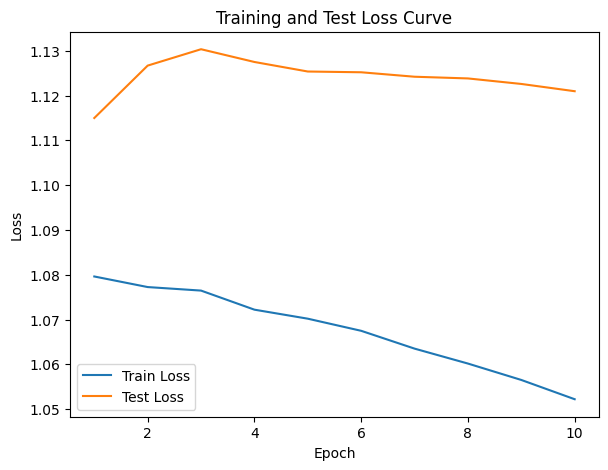

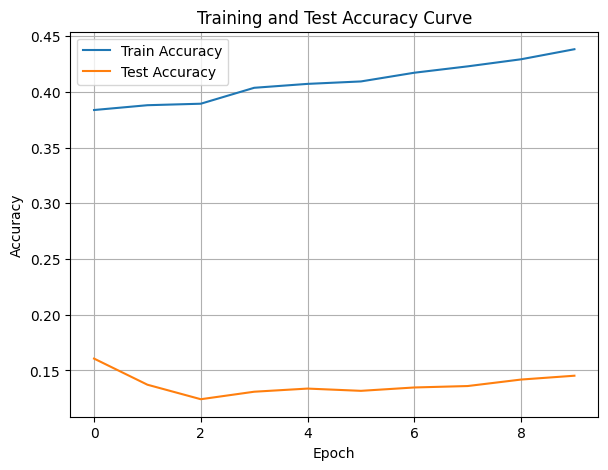

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.42it/s]

Epoch [1/10], Train F1:0.41081796032022266, Train Loss: 1.1151, Train Acc: 0.4015, Test F1:0.37731684796072334, Test Loss: 1.1071, Test Acc: 0.3438


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.42it/s]

Epoch [2/10], Train F1:0.40876534102340556, Train Loss: 1.1109, Train Acc: 0.3937, Test F1:0.3566594656950729, Test Loss: 1.1083, Test Acc: 0.3134


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.51it/s]

Epoch [3/10], Train F1:0.4098943635752175, Train Loss: 1.1076, Train Acc: 0.3936, Test F1:0.3531575618362795, Test Loss: 1.1077, Test Acc: 0.3084


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.76it/s]

Epoch [4/10], Train F1:0.4132951663955046, Train Loss: 1.1038, Train Acc: 0.3984, Test F1:0.37176559761239286, Test Loss: 1.1063, Test Acc: 0.3270


Training Process:  60%|██████    | 6/10 [00:00<00:00,  6.53it/s]

Epoch [5/10], Train F1:0.41962617031919125, Train Loss: 1.1005, Train Acc: 0.4050, Test F1:0.373416757808321, Test Loss: 1.1052, Test Acc: 0.3304
Epoch [6/10], Train F1:0.4260642757019655, Train Loss: 1.0977, Train Acc: 0.4147, Test F1:0.38255863253308325, Test Loss: 1.1043, Test Acc: 0.3404


Training Process:  70%|███████   | 7/10 [00:00<00:00,  6.46it/s]

Epoch [7/10], Train F1:0.4282583440768378, Train Loss: 1.0942, Train Acc: 0.4236, Test F1:0.39303675540542393, Test Loss: 1.1028, Test Acc: 0.3509


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.21it/s]

Epoch [8/10], Train F1:0.43463879987286974, Train Loss: 1.0924, Train Acc: 0.4295, Test F1:0.4005034746073461, Test Loss: 1.1024, Test Acc: 0.3549


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  4.71it/s]

Epoch [9/10], Train F1:0.4382375642667244, Train Loss: 1.0886, Train Acc: 0.4350, Test F1:0.39758110721639683, Test Loss: 1.1020, Test Acc: 0.3504


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.82it/s]


Epoch [10/10], Train F1:0.44360214074493515, Train Loss: 1.0865, Train Acc: 0.4430, Test F1:0.41919394522892595, Test Loss: 1.1008, Test Acc: 0.3730
Total Epochs: 10
Train loss start: 1.1387759447097778, Train loss end: 0.9968725442886353
Highest Mean Train Accuracy (over epoch): 0.4430059523809524
Test loss start: 1.1029964685440063, Test loss end: 1.0766777992248535
Highest mean Test Accuracy (over epoch): 0.37300347222222224


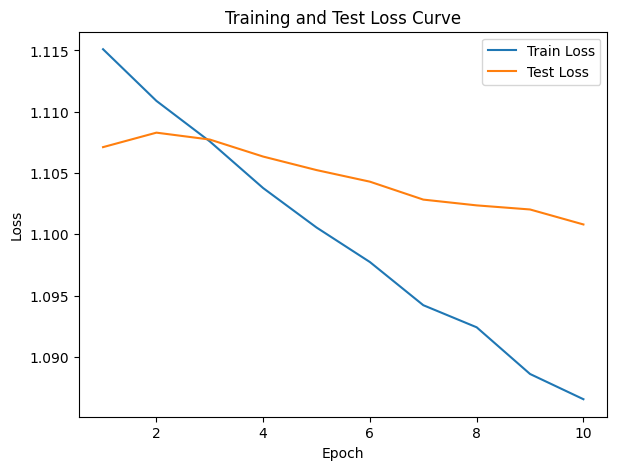

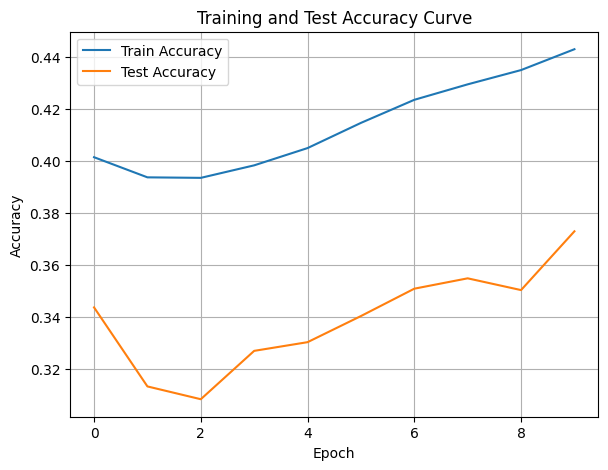

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.18it/s]

Epoch [1/10], Train F1:0.4740958680308861, Train Loss: 1.0856, Train Acc: 0.4390, Test F1:0.4895793567804721, Test Loss: 1.0843, Test Acc: 0.4861


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.41it/s]

Epoch [2/10], Train F1:0.4549653387742828, Train Loss: 1.0927, Train Acc: 0.4217, Test F1:0.5219384039320208, Test Loss: 1.0737, Test Acc: 0.5499


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.14it/s]

Epoch [3/10], Train F1:0.4686375886992161, Train Loss: 1.0836, Train Acc: 0.4383, Test F1:0.5368194751468887, Test Loss: 1.0695, Test Acc: 0.5692


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.34it/s]

Epoch [4/10], Train F1:0.47367172510029654, Train Loss: 1.0798, Train Acc: 0.4452, Test F1:0.5446468268719161, Test Loss: 1.0640, Test Acc: 0.5862


Training Process:  50%|█████     | 5/10 [00:00<00:00,  6.10it/s]

Epoch [5/10], Train F1:0.48017704734384165, Train Loss: 1.0759, Train Acc: 0.4504, Test F1:0.5443417384560566, Test Loss: 1.0629, Test Acc: 0.5932


Training Process:  60%|██████    | 6/10 [00:00<00:00,  5.56it/s]

Epoch [6/10], Train F1:0.48129328922798403, Train Loss: 1.0733, Train Acc: 0.4530, Test F1:0.5536440485895249, Test Loss: 1.0619, Test Acc: 0.6005


Training Process:  70%|███████   | 7/10 [00:01<00:00,  5.32it/s]

Epoch [7/10], Train F1:0.4850551346304806, Train Loss: 1.0714, Train Acc: 0.4563, Test F1:0.5590616454703669, Test Loss: 1.0607, Test Acc: 0.6060


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.31it/s]

Epoch [8/10], Train F1:0.49546215485330297, Train Loss: 1.0669, Train Acc: 0.4655, Test F1:0.5696353640115835, Test Loss: 1.0590, Test Acc: 0.6146


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.05it/s]

Epoch [9/10], Train F1:0.4979697054709088, Train Loss: 1.0632, Train Acc: 0.4701, Test F1:0.576680392732389, Test Loss: 1.0583, Test Acc: 0.6195


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.24it/s]


Epoch [10/10], Train F1:0.5048564941471756, Train Loss: 1.0583, Train Acc: 0.4797, Test F1:0.5854445950736813, Test Loss: 1.0567, Test Acc: 0.6280
Total Epochs: 10
Train loss start: 1.0801706314086914, Train loss end: 0.9708317518234253
Highest Mean Train Accuracy (over epoch): 0.47970238095238094
Test loss start: 1.0780478715896606, Test loss end: 1.0411468744277954
Highest mean Test Accuracy (over epoch): 0.6279513888888889


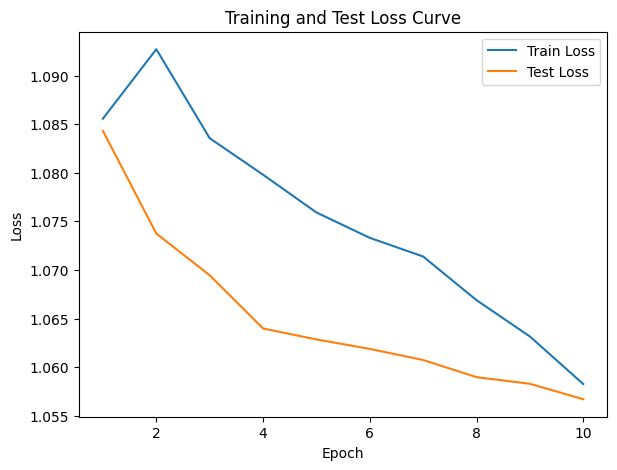

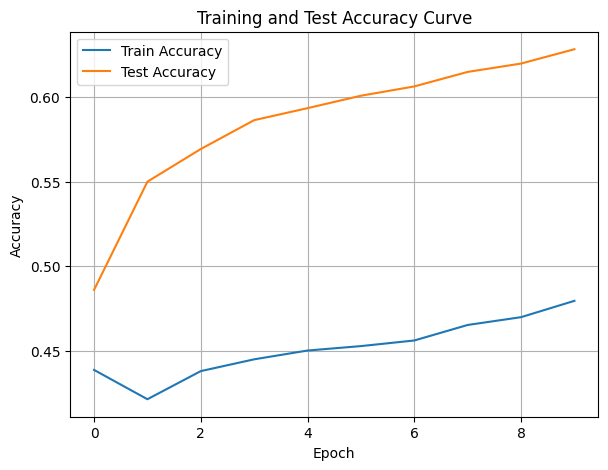

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:02,  4.32it/s]

Epoch [1/10], Train F1:0.4265963406928403, Train Loss: 1.1274, Train Acc: 0.3295, Test F1:0.4178628389154704, Test Loss: 1.1023, Test Acc: 0.3906


Training Process:  20%|██        | 2/10 [00:00<00:01,  4.51it/s]

Epoch [2/10], Train F1:0.3813091610810916, Train Loss: 1.1331, Train Acc: 0.2930, Test F1:0.3916712195714199, Test Loss: 1.0993, Test Acc: 0.3759


Training Process:  30%|███       | 3/10 [00:00<00:01,  4.36it/s]

Epoch [3/10], Train F1:0.37842528121457636, Train Loss: 1.1321, Train Acc: 0.2969, Test F1:0.42587543593061944, Test Loss: 1.0950, Test Acc: 0.4230


Training Process:  40%|████      | 4/10 [00:00<00:01,  3.90it/s]

Epoch [4/10], Train F1:0.3762741621342427, Train Loss: 1.1306, Train Acc: 0.2954, Test F1:0.44450135990864736, Test Loss: 1.0915, Test Acc: 0.4505


Training Process:  50%|█████     | 5/10 [00:01<00:01,  3.55it/s]

Epoch [5/10], Train F1:0.3823184575621255, Train Loss: 1.1263, Train Acc: 0.2997, Test F1:0.45824613294799876, Test Loss: 1.0882, Test Acc: 0.4682


Training Process:  60%|██████    | 6/10 [00:01<00:01,  3.65it/s]

Epoch [6/10], Train F1:0.39278200879504555, Train Loss: 1.1218, Train Acc: 0.3088, Test F1:0.46633288858375327, Test Loss: 1.0867, Test Acc: 0.4787


Training Process:  70%|███████   | 7/10 [00:01<00:00,  3.91it/s]

Epoch [7/10], Train F1:0.4023125461747463, Train Loss: 1.1176, Train Acc: 0.3179, Test F1:0.47036181095382396, Test Loss: 1.0867, Test Acc: 0.4818


Training Process:  80%|████████  | 8/10 [00:02<00:00,  4.05it/s]

Epoch [8/10], Train F1:0.407107745933269, Train Loss: 1.1159, Train Acc: 0.3243, Test F1:0.47777802932669017, Test Loss: 1.0853, Test Acc: 0.4899


Training Process:  90%|█████████ | 9/10 [00:02<00:00,  3.80it/s]

Epoch [9/10], Train F1:0.41314406785563407, Train Loss: 1.1121, Train Acc: 0.3308, Test F1:0.48707279763249495, Test Loss: 1.0831, Test Acc: 0.5021


Training Process: 100%|██████████| 10/10 [00:02<00:00,  3.88it/s]


Epoch [10/10], Train F1:0.41862658397643016, Train Loss: 1.1089, Train Acc: 0.3371, Test F1:0.49414805314751, Test Loss: 1.0813, Test Acc: 0.5119
Total Epochs: 10
Train loss start: 1.1055272817611694, Train loss end: 1.0917679071426392
Highest Mean Train Accuracy (over epoch): 0.3370535714285714
Test loss start: 1.0884907245635986, Test loss end: 1.078342080116272
Highest mean Test Accuracy (over epoch): 0.511892361111111


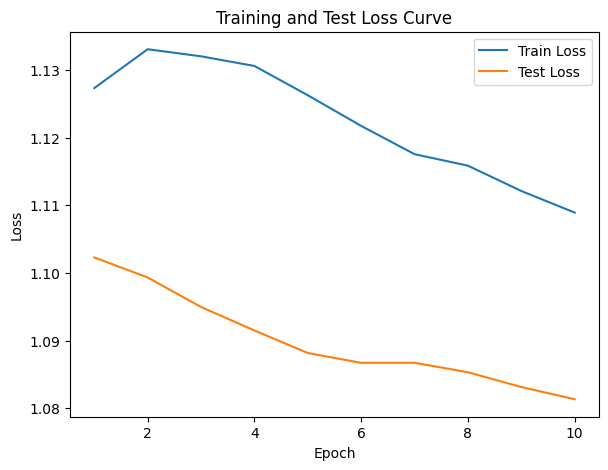

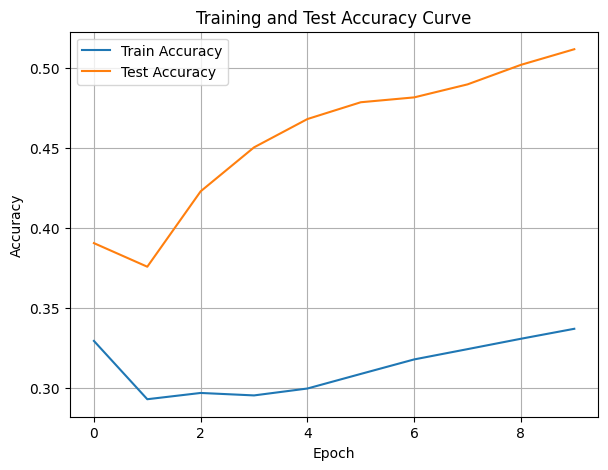

./saved_models/model_4.pth
Training Model with id 7
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  5.30it/s]

Epoch [1/10], Train F1:0.4569375447322017, Train Loss: 1.0812, Train Acc: 0.3857, Test F1:0.6126528442317916, Test Loss: 1.0612, Test Acc: 0.6215


Training Process:  20%|██        | 2/10 [00:00<00:01,  4.94it/s]

Epoch [2/10], Train F1:0.5150926902726317, Train Loss: 1.0658, Train Acc: 0.4494, Test F1:0.6107247695042791, Test Loss: 1.0559, Test Acc: 0.6293


Training Process:  30%|███       | 3/10 [00:00<00:01,  4.54it/s]

Epoch [3/10], Train F1:0.531865890011333, Train Loss: 1.0580, Train Acc: 0.4676, Test F1:0.6177428809007757, Test Loss: 1.0510, Test Acc: 0.6372


Training Process:  40%|████      | 4/10 [00:00<00:01,  4.53it/s]

Epoch [4/10], Train F1:0.5429750459329503, Train Loss: 1.0554, Train Acc: 0.4771, Test F1:0.6181266320250889, Test Loss: 1.0508, Test Acc: 0.6356


Training Process:  50%|█████     | 5/10 [00:01<00:01,  4.62it/s]

Epoch [5/10], Train F1:0.5492740469612357, Train Loss: 1.0531, Train Acc: 0.4821, Test F1:0.6158877586122169, Test Loss: 1.0506, Test Acc: 0.6332


Training Process:  60%|██████    | 6/10 [00:01<00:00,  4.67it/s]

Epoch [6/10], Train F1:0.5491277740567048, Train Loss: 1.0515, Train Acc: 0.4833, Test F1:0.6208648445557211, Test Loss: 1.0488, Test Acc: 0.6390


Training Process:  70%|███████   | 7/10 [00:01<00:00,  4.84it/s]

Epoch [7/10], Train F1:0.556274325316566, Train Loss: 1.0475, Train Acc: 0.4934, Test F1:0.6265601314371189, Test Loss: 1.0463, Test Acc: 0.6443


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.07it/s]

Epoch [8/10], Train F1:0.5663831779697425, Train Loss: 1.0433, Train Acc: 0.5039, Test F1:0.6315517946328384, Test Loss: 1.0462, Test Acc: 0.6483
Epoch [9/10], Train F1:0.5774734107717961, Train Loss: 1.0382, Train Acc: 0.5165, Test F1:0.6345615112179064, Test Loss: 1.0446, Test Acc: 0.6506


Training Process: 100%|██████████| 10/10 [00:02<00:00,  4.77it/s]


Epoch [10/10], Train F1:0.5840419853847207, Train Loss: 1.0340, Train Acc: 0.5243, Test F1:0.6386059756863524, Test Loss: 1.0433, Test Acc: 0.6539
Total Epochs: 10
Train loss start: 1.0399378538131714, Train loss end: 0.9406352639198303
Highest Mean Train Accuracy (over epoch): 0.5243154761904761
Test loss start: 1.0445537567138672, Test loss end: 1.0399364233016968
Highest mean Test Accuracy (over epoch): 0.65390625


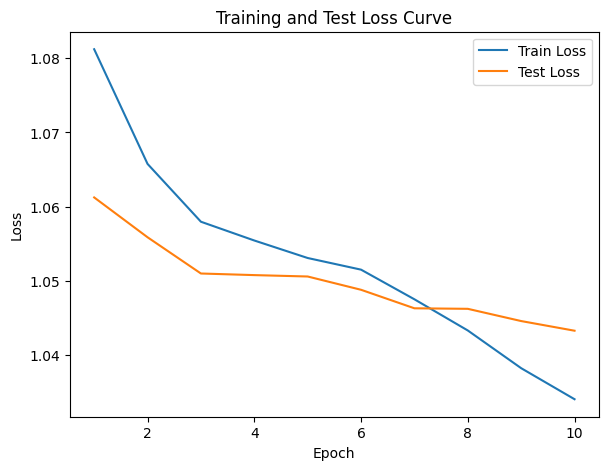

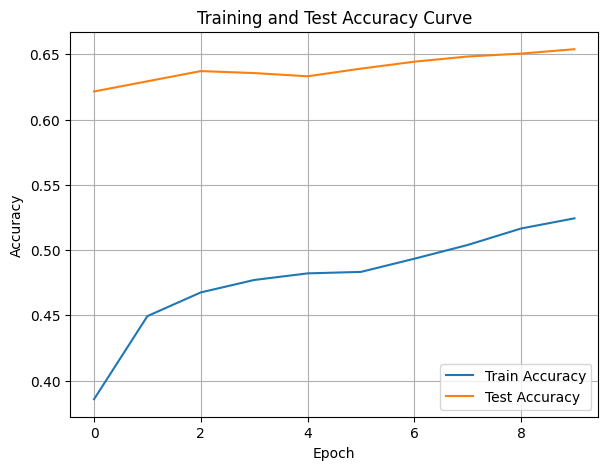

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.70it/s]

Epoch [1/10], Train F1:0.6451856308500284, Train Loss: 0.9869, Train Acc: 0.5976, Test F1:0.6859340194787246, Test Loss: 1.0299, Test Acc: 0.6780


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.72it/s]

Epoch [2/10], Train F1:0.6487160330107796, Train Loss: 0.9905, Train Acc: 0.6128, Test F1:0.6768391567153177, Test Loss: 1.0243, Test Acc: 0.6810


Training Process:  40%|████      | 4/10 [00:00<00:01,  5.69it/s]

Epoch [3/10], Train F1:0.6558515824702874, Train Loss: 0.9900, Train Acc: 0.6150, Test F1:0.6910493852002693, Test Loss: 1.0247, Test Acc: 0.6924
Epoch [4/10], Train F1:0.6589278344653287, Train Loss: 0.9891, Train Acc: 0.6158, Test F1:0.6968617358043839, Test Loss: 1.0245, Test Acc: 0.6962


Training Process:  60%|██████    | 6/10 [00:00<00:00,  6.47it/s]

Epoch [5/10], Train F1:0.665089256651819, Train Loss: 0.9876, Train Acc: 0.6211, Test F1:0.6988496633935863, Test Loss: 1.0211, Test Acc: 0.7012
Epoch [6/10], Train F1:0.6693536892408077, Train Loss: 0.9838, Train Acc: 0.6288, Test F1:0.6994085072033107, Test Loss: 1.0179, Test Acc: 0.7023


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.66it/s]

Epoch [7/10], Train F1:0.6757438458148519, Train Loss: 0.9808, Train Acc: 0.6363, Test F1:0.7015605762050531, Test Loss: 1.0155, Test Acc: 0.7061
Epoch [8/10], Train F1:0.6787363414299614, Train Loss: 0.9775, Train Acc: 0.6416, Test F1:0.7045995603666376, Test Loss: 1.0140, Test Acc: 0.7117


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.69it/s]

Epoch [9/10], Train F1:0.6852574359056766, Train Loss: 0.9745, Train Acc: 0.6478, Test F1:0.7068006411261519, Test Loss: 1.0119, Test Acc: 0.7145
Epoch [10/10], Train F1:0.6861586225610143, Train Loss: 0.9719, Train Acc: 0.6512, Test F1:0.7082395030375919, Test Loss: 1.0104, Test Acc: 0.7168


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.95it/s]


Total Epochs: 10
Train loss start: 1.0374490022659302, Train loss end: 0.8420483469963074
Highest Mean Train Accuracy (over epoch): 0.6512202380952381
Test loss start: 1.0149823427200317, Test loss end: 1.0072615146636963
Highest mean Test Accuracy (over epoch): 0.7167534722222222


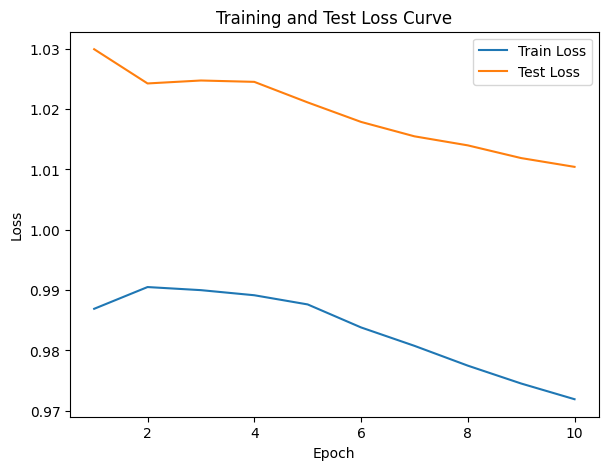

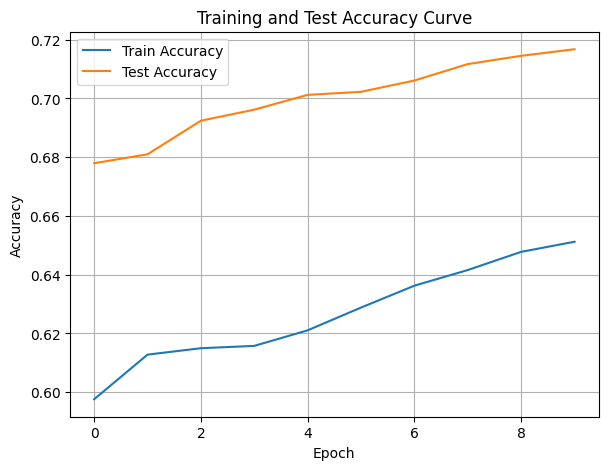

./saved_models/model_8.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.43it/s]

Epoch [1/10], Train F1:0.7679102690196759, Train Loss: 0.9257, Train Acc: 0.7414, Test F1:0.7400508847877268, Test Loss: 0.9942, Test Acc: 0.7448


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.46it/s]

Epoch [2/10], Train F1:0.7751877804763279, Train Loss: 0.9261, Train Acc: 0.7530, Test F1:0.740645319592688, Test Loss: 0.9907, Test Acc: 0.7517


Training Process:  30%|███       | 3/10 [00:00<00:01,  6.38it/s]

Epoch [3/10], Train F1:0.7661600936369056, Train Loss: 0.9243, Train Acc: 0.7456, Test F1:0.7450001396638146, Test Loss: 0.9877, Test Acc: 0.7567


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.39it/s]

Epoch [4/10], Train F1:0.7645017549786962, Train Loss: 0.9199, Train Acc: 0.7483, Test F1:0.7440610053576565, Test Loss: 0.9848, Test Acc: 0.7572
Epoch [5/10], Train F1:0.77045470060219, Train Loss: 0.9167, Train Acc: 0.7518, Test F1:0.7378427606155793, Test Loss: 0.9807, Test Acc: 0.7543


Training Process:  70%|███████   | 7/10 [00:01<00:00,  5.35it/s]

Epoch [6/10], Train F1:0.765774241665954, Train Loss: 0.9170, Train Acc: 0.7468, Test F1:0.7420402088416758, Test Loss: 0.9790, Test Acc: 0.7577
Epoch [7/10], Train F1:0.7672022574377653, Train Loss: 0.9141, Train Acc: 0.7500, Test F1:0.7420932880615159, Test Loss: 0.9777, Test Acc: 0.7589


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.32it/s]

Epoch [8/10], Train F1:0.7681451356643173, Train Loss: 0.9117, Train Acc: 0.7521, Test F1:0.7435421132015559, Test Loss: 0.9764, Test Acc: 0.7599


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.09it/s]

Epoch [9/10], Train F1:0.7721953752378601, Train Loss: 0.9093, Train Acc: 0.7562, Test F1:0.7434161563213737, Test Loss: 0.9754, Test Acc: 0.7606


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.08it/s]


Epoch [10/10], Train F1:0.7737660289283449, Train Loss: 0.9060, Train Acc: 0.7592, Test F1:0.7441181379425448, Test Loss: 0.9743, Test Acc: 0.7612
Total Epochs: 10
Train loss start: 0.9244835376739502, Train loss end: 0.8001319766044617
Highest Mean Train Accuracy (over epoch): 0.7592261904761906
Test loss start: 0.9792606830596924, Test loss end: 0.968003511428833
Highest mean Test Accuracy (over epoch): 0.7611979166666666


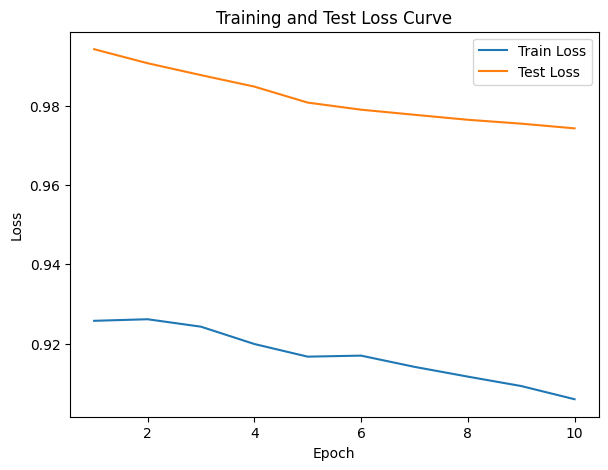

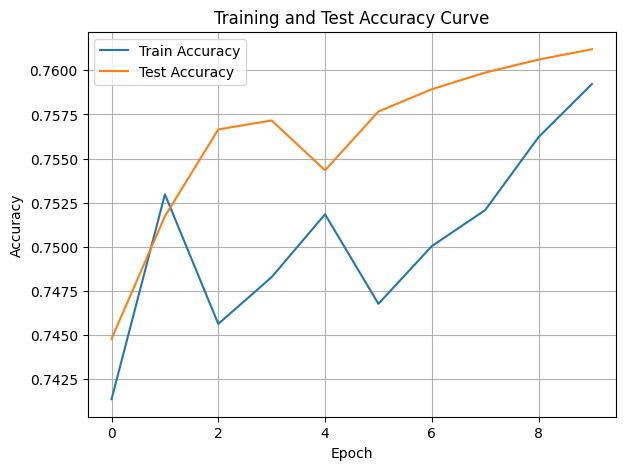

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [43]:
DTEmlp4b.train_DTE()

Epoch [1/70], Train F1:0.03368375882342363, Train Loss: 1.3213, Train Acc: 0.0167, Test F1:0.017115960633290548, Test Loss: 1.1816, Test Acc: 0.0078

Training Process:   1%|▏         | 1/70 [00:00<00:10,  6.36it/s]

Training Process:   4%|▍         | 3/70 [00:00<00:11,  5.76it/s]

Epoch [2/70], Train F1:0.029477702103400425, Train Loss: 1.3192, Train Acc: 0.0146, Test F1:0.017115960633290548, Test Loss: 1.1953, Test Acc: 0.0109
Epoch [3/70], Train F1:0.04316351150167703, Train Loss: 1.3144, Train Acc: 0.0215, Test F1:0.03341687552213868, Test Loss: 1.1959, Test Acc: 0.0217


Training Process:   7%|▋         | 5/70 [00:00<00:11,  5.79it/s]

Epoch [4/70], Train F1:0.03781455163333437, Train Loss: 1.3117, Train Acc: 0.0187, Test F1:0.037371535347243856, Test Loss: 1.1959, Test Acc: 0.0221
Epoch [5/70], Train F1:0.04113185232792135, Train Loss: 1.3083, Train Acc: 0.0204, Test F1:0.05198180636777128, Test Loss: 1.1959, Test Acc: 0.0311


Training Process:  10%|█         | 7/70 [00:01<00:10,  5.87it/s]

Epoch [6/70], Train F1:0.047368382871419576, Train Loss: 1.3046, Train Acc: 0.0249, Test F1:0.05398110661268556, Test Loss: 1.1963, Test Acc: 0.0331
Epoch [7/70], Train F1:0.04596356173815829, Train Loss: 1.3016, Train Acc: 0.0250, Test F1:0.05752085130859937, Test Loss: 1.1952, Test Acc: 0.0357


Training Process:  11%|█▏        | 8/70 [00:01<00:10,  5.73it/s]

Epoch [8/70], Train F1:0.05251890085510949, Train Loss: 1.2978, Train Acc: 0.0282, Test F1:0.05831196903433369, Test Loss: 1.1948, Test Acc: 0.0367


Training Process:  13%|█▎        | 9/70 [00:01<00:12,  5.08it/s]

Epoch [9/70], Train F1:0.05716752223733878, Train Loss: 1.2941, Train Acc: 0.0304, Test F1:0.06540280171461399, Test Loss: 1.1942, Test Acc: 0.0416


Training Process:  14%|█▍        | 10/70 [00:01<00:12,  4.94it/s]

Epoch [10/70], Train F1:0.06172403997405504, Train Loss: 1.2905, Train Acc: 0.0340, Test F1:0.0709639266706091, Test Loss: 1.1926, Test Acc: 0.0455


Training Process:  16%|█▌        | 11/70 [00:02<00:13,  4.22it/s]

Epoch [11/70], Train F1:0.06828749837002265, Train Loss: 1.2865, Train Acc: 0.0372, Test F1:0.075442155083449, Test Loss: 1.1902, Test Acc: 0.0487


Training Process:  17%|█▋        | 12/70 [00:02<00:13,  4.33it/s]

Epoch [12/70], Train F1:0.07368926030458937, Train Loss: 1.2832, Train Acc: 0.0404, Test F1:0.07331762241424455, Test Loss: 1.1895, Test Acc: 0.0476


Training Process:  19%|█▊        | 13/70 [00:02<00:12,  4.39it/s]

Epoch [13/70], Train F1:0.07792766314851862, Train Loss: 1.2799, Train Acc: 0.0424, Test F1:0.0704182601833303, Test Loss: 1.1891, Test Acc: 0.0461


Training Process:  20%|██        | 14/70 [00:02<00:13,  4.27it/s]

Epoch [14/70], Train F1:0.08393797859285236, Train Loss: 1.2762, Train Acc: 0.0460, Test F1:0.0739868841432655, Test Loss: 1.1875, Test Acc: 0.0485


Training Process:  21%|██▏       | 15/70 [00:03<00:12,  4.30it/s]

Epoch [15/70], Train F1:0.08963502806121249, Train Loss: 1.2731, Train Acc: 0.0494, Test F1:0.07611897500065172, Test Loss: 1.1852, Test Acc: 0.0502


Training Process:  23%|██▎       | 16/70 [00:03<00:12,  4.47it/s]

Epoch [16/70], Train F1:0.09822369909947527, Train Loss: 1.2690, Train Acc: 0.0539, Test F1:0.08251273713427563, Test Loss: 1.1824, Test Acc: 0.0540


Training Process:  24%|██▍       | 17/70 [00:03<00:11,  4.63it/s]

Epoch [17/70], Train F1:0.10547450934860134, Train Loss: 1.2658, Train Acc: 0.0577, Test F1:0.08625552142820501, Test Loss: 1.1805, Test Acc: 0.0565


Training Process:  26%|██▌       | 18/70 [00:03<00:10,  4.84it/s]

Epoch [18/70], Train F1:0.11397897356879982, Train Loss: 1.2621, Train Acc: 0.0631, Test F1:0.09091922184394817, Test Loss: 1.1782, Test Acc: 0.0596


Training Process:  27%|██▋       | 19/70 [00:03<00:11,  4.42it/s]

Epoch [19/70], Train F1:0.12163332336432373, Train Loss: 1.2585, Train Acc: 0.0680, Test F1:0.0977698510234815, Test Loss: 1.1761, Test Acc: 0.0640


Training Process:  29%|██▊       | 20/70 [00:04<00:12,  4.13it/s]

Epoch [20/70], Train F1:0.12768570050146422, Train Loss: 1.2544, Train Acc: 0.0717, Test F1:0.10005269787243011, Test Loss: 1.1736, Test Acc: 0.0656


Training Process:  30%|███       | 21/70 [00:04<00:12,  3.78it/s]

Epoch [21/70], Train F1:0.137019458164838, Train Loss: 1.2500, Train Acc: 0.0771, Test F1:0.10574254869965245, Test Loss: 1.1714, Test Acc: 0.0693


Training Process:  31%|███▏      | 22/70 [00:04<00:12,  3.78it/s]

Epoch [22/70], Train F1:0.14491133402646889, Train Loss: 1.2461, Train Acc: 0.0817, Test F1:0.11048390923217441, Test Loss: 1.1695, Test Acc: 0.0723


Training Process:  33%|███▎      | 23/70 [00:05<00:12,  3.91it/s]

Epoch [23/70], Train F1:0.15325784093819608, Train Loss: 1.2425, Train Acc: 0.0868, Test F1:0.11614610447988558, Test Loss: 1.1676, Test Acc: 0.0764


Training Process:  34%|███▍      | 24/70 [00:05<00:11,  4.05it/s]

Epoch [24/70], Train F1:0.16304125737037722, Train Loss: 1.2384, Train Acc: 0.0928, Test F1:0.11912538476701694, Test Loss: 1.1658, Test Acc: 0.0785


Training Process:  36%|███▌      | 25/70 [00:05<00:11,  3.87it/s]

Epoch [25/70], Train F1:0.17080296118785762, Train Loss: 1.2342, Train Acc: 0.0979, Test F1:0.12428880962391196, Test Loss: 1.1638, Test Acc: 0.0817


Training Process:  37%|███▋      | 26/70 [00:05<00:10,  4.13it/s]

Epoch [26/70], Train F1:0.1810954686901869, Train Loss: 1.2303, Train Acc: 0.1040, Test F1:0.13093996807210312, Test Loss: 1.1614, Test Acc: 0.0859


Training Process:  39%|███▊      | 27/70 [00:05<00:10,  4.14it/s]

Epoch [27/70], Train F1:0.19131718399007272, Train Loss: 1.2261, Train Acc: 0.1104, Test F1:0.13625711306283514, Test Loss: 1.1593, Test Acc: 0.0892


Training Process:  40%|████      | 28/70 [00:06<00:10,  4.15it/s]

Epoch [28/70], Train F1:0.20094187873340638, Train Loss: 1.2220, Train Acc: 0.1170, Test F1:0.14156171744736695, Test Loss: 1.1572, Test Acc: 0.0925


Training Process:  41%|████▏     | 29/70 [00:06<00:09,  4.25it/s]

Epoch [29/70], Train F1:0.21303905450452007, Train Loss: 1.2175, Train Acc: 0.1250, Test F1:0.14587161095398446, Test Loss: 1.1551, Test Acc: 0.0950


Training Process:  43%|████▎     | 30/70 [00:06<00:09,  4.13it/s]

Epoch [30/70], Train F1:0.22228447760111988, Train Loss: 1.2131, Train Acc: 0.1312, Test F1:0.15042561507972596, Test Loss: 1.1530, Test Acc: 0.0979


Training Process:  44%|████▍     | 31/70 [00:07<00:10,  3.70it/s]

Epoch [31/70], Train F1:0.2330637359695695, Train Loss: 1.2093, Train Acc: 0.1382, Test F1:0.15539752221700612, Test Loss: 1.1511, Test Acc: 0.1011


Training Process:  46%|████▌     | 32/70 [00:07<00:10,  3.75it/s]

Epoch [32/70], Train F1:0.24563632869943278, Train Loss: 1.2046, Train Acc: 0.1466, Test F1:0.16106934620493274, Test Loss: 1.1494, Test Acc: 0.1048


Training Process:  49%|████▊     | 34/70 [00:07<00:08,  4.41it/s]

Epoch [33/70], Train F1:0.2557032479493025, Train Loss: 1.2004, Train Acc: 0.1540, Test F1:0.16756020367333072, Test Loss: 1.1476, Test Acc: 0.1086
Epoch [34/70], Train F1:0.26734887084071013, Train Loss: 1.1958, Train Acc: 0.1623, Test F1:0.1748540551631617, Test Loss: 1.1456, Test Acc: 0.1130


Training Process:  50%|█████     | 35/70 [00:07<00:07,  4.43it/s]

Epoch [35/70], Train F1:0.2786217627614266, Train Loss: 1.1914, Train Acc: 0.1707, Test F1:0.18415908404266101, Test Loss: 1.1435, Test Acc: 0.1187


Training Process:  51%|█████▏    | 36/70 [00:08<00:07,  4.52it/s]

Epoch [36/70], Train F1:0.29009618419414, Train Loss: 1.1870, Train Acc: 0.1790, Test F1:0.19463603000930202, Test Loss: 1.1415, Test Acc: 0.1253


Training Process:  53%|█████▎    | 37/70 [00:08<00:07,  4.28it/s]

Epoch [37/70], Train F1:0.3005734030700604, Train Loss: 1.1828, Train Acc: 0.1868, Test F1:0.20253635653779853, Test Loss: 1.1396, Test Acc: 0.1301


Training Process:  54%|█████▍    | 38/70 [00:08<00:08,  3.81it/s]

Epoch [38/70], Train F1:0.31100900679514254, Train Loss: 1.1787, Train Acc: 0.1947, Test F1:0.2140361472377471, Test Loss: 1.1375, Test Acc: 0.1372


Training Process:  56%|█████▌    | 39/70 [00:08<00:08,  3.70it/s]

Epoch [39/70], Train F1:0.3214071258975597, Train Loss: 1.1744, Train Acc: 0.2027, Test F1:0.22555395308901668, Test Loss: 1.1354, Test Acc: 0.1447


Training Process:  57%|█████▋    | 40/70 [00:09<00:07,  3.88it/s]

Epoch [40/70], Train F1:0.33184965164742747, Train Loss: 1.1701, Train Acc: 0.2110, Test F1:0.24057853187301442, Test Loss: 1.1333, Test Acc: 0.1540


Training Process:  59%|█████▊    | 41/70 [00:09<00:07,  4.12it/s]

Epoch [41/70], Train F1:0.34191804368257317, Train Loss: 1.1659, Train Acc: 0.2189, Test F1:0.25322860984546064, Test Loss: 1.1315, Test Acc: 0.1621


Training Process:  60%|██████    | 42/70 [00:09<00:07,  4.00it/s]

Epoch [42/70], Train F1:0.35336356516304895, Train Loss: 1.1616, Train Acc: 0.2281, Test F1:0.26786725719550947, Test Loss: 1.1294, Test Acc: 0.1714


Training Process:  61%|██████▏   | 43/70 [00:10<00:08,  3.33it/s]

Epoch [43/70], Train F1:0.36342225856257976, Train Loss: 1.1573, Train Acc: 0.2361, Test F1:0.2820482414478364, Test Loss: 1.1274, Test Acc: 0.1810


Training Process:  63%|██████▎   | 44/70 [00:10<00:09,  2.64it/s]

Epoch [44/70], Train F1:0.37584142944617105, Train Loss: 1.1528, Train Acc: 0.2462, Test F1:0.30321543970494397, Test Loss: 1.1252, Test Acc: 0.1947


Training Process:  64%|██████▍   | 45/70 [00:11<00:09,  2.64it/s]

Epoch [45/70], Train F1:0.38645155778600954, Train Loss: 1.1484, Train Acc: 0.2552, Test F1:0.3180535550683024, Test Loss: 1.1231, Test Acc: 0.2048


Training Process:  66%|██████▌   | 46/70 [00:11<00:09,  2.57it/s]

Epoch [46/70], Train F1:0.3982713896763662, Train Loss: 1.1440, Train Acc: 0.2649, Test F1:0.3325878556311772, Test Loss: 1.1208, Test Acc: 0.2149


Training Process:  67%|██████▋   | 47/70 [00:11<00:09,  2.33it/s]

Epoch [47/70], Train F1:0.40749806845679337, Train Loss: 1.1400, Train Acc: 0.2730, Test F1:0.34560304189613505, Test Loss: 1.1188, Test Acc: 0.2244


Training Process:  69%|██████▊   | 48/70 [00:12<00:10,  2.04it/s]

Epoch [48/70], Train F1:0.4173115456189692, Train Loss: 1.1359, Train Acc: 0.2815, Test F1:0.3626417747284062, Test Loss: 1.1165, Test Acc: 0.2365


Training Process:  70%|███████   | 49/70 [00:13<00:10,  1.97it/s]

Epoch [49/70], Train F1:0.4259429363868929, Train Loss: 1.1321, Train Acc: 0.2894, Test F1:0.37828841272031366, Test Loss: 1.1143, Test Acc: 0.2478


Training Process:  71%|███████▏  | 50/70 [00:13<00:09,  2.02it/s]

Epoch [50/70], Train F1:0.4345472019971782, Train Loss: 1.1281, Train Acc: 0.2971, Test F1:0.3934208520657861, Test Loss: 1.1121, Test Acc: 0.2593


Training Process:  73%|███████▎  | 51/70 [00:14<00:08,  2.17it/s]

Epoch [51/70], Train F1:0.4440151865684287, Train Loss: 1.1242, Train Acc: 0.3055, Test F1:0.40827009358022404, Test Loss: 1.1097, Test Acc: 0.2708


Training Process:  74%|███████▍  | 52/70 [00:14<00:08,  2.20it/s]

Epoch [52/70], Train F1:0.45237654133842053, Train Loss: 1.1202, Train Acc: 0.3132, Test F1:0.42152934138788395, Test Loss: 1.1076, Test Acc: 0.2815


Training Process:  76%|███████▌  | 53/70 [00:14<00:07,  2.33it/s]

Epoch [53/70], Train F1:0.46170649694425214, Train Loss: 1.1162, Train Acc: 0.3219, Test F1:0.43502976630657325, Test Loss: 1.1055, Test Acc: 0.2926


Training Process:  77%|███████▋  | 54/70 [00:15<00:06,  2.61it/s]

Epoch [54/70], Train F1:0.4696050688303652, Train Loss: 1.1127, Train Acc: 0.3295, Test F1:0.44753674394685045, Test Loss: 1.1035, Test Acc: 0.3032


Training Process:  79%|███████▊  | 55/70 [00:15<00:05,  2.57it/s]

Epoch [55/70], Train F1:0.47777757031739765, Train Loss: 1.1090, Train Acc: 0.3373, Test F1:0.4593291802605733, Test Loss: 1.1013, Test Acc: 0.3132


Training Process:  80%|████████  | 56/70 [00:15<00:04,  2.86it/s]

Epoch [56/70], Train F1:0.48610920702605015, Train Loss: 1.1051, Train Acc: 0.3453, Test F1:0.4705945192043738, Test Loss: 1.0991, Test Acc: 0.3231


Training Process:  81%|████████▏ | 57/70 [00:16<00:04,  2.92it/s]

Epoch [57/70], Train F1:0.49397225177050447, Train Loss: 1.1014, Train Acc: 0.3531, Test F1:0.4814373388352503, Test Loss: 1.0971, Test Acc: 0.3327


Training Process:  83%|████████▎ | 58/70 [00:16<00:04,  2.84it/s]

Epoch [58/70], Train F1:0.5018120092750558, Train Loss: 1.0977, Train Acc: 0.3607, Test F1:0.4918982970608032, Test Loss: 1.0950, Test Acc: 0.3423


Training Process:  84%|████████▍ | 59/70 [00:16<00:04,  2.73it/s]

Epoch [59/70], Train F1:0.5091835185425699, Train Loss: 1.0938, Train Acc: 0.3680, Test F1:0.5012154950172754, Test Loss: 1.0932, Test Acc: 0.3509


Training Process:  86%|████████▌ | 60/70 [00:17<00:03,  2.78it/s]

Epoch [60/70], Train F1:0.515338494695876, Train Loss: 1.0903, Train Acc: 0.3745, Test F1:0.5104688466777552, Test Loss: 1.0912, Test Acc: 0.3595


Training Process:  87%|████████▋ | 61/70 [00:17<00:02,  3.03it/s]

Epoch [61/70], Train F1:0.5227748380482315, Train Loss: 1.0868, Train Acc: 0.3817, Test F1:0.5194525241853747, Test Loss: 1.0890, Test Acc: 0.3682


Training Process:  89%|████████▊ | 62/70 [00:17<00:02,  3.09it/s]

Epoch [62/70], Train F1:0.5299609407892851, Train Loss: 1.0834, Train Acc: 0.3889, Test F1:0.5276390697961056, Test Loss: 1.0870, Test Acc: 0.3762


Training Process:  90%|█████████ | 63/70 [00:18<00:02,  3.10it/s]

Epoch [63/70], Train F1:0.53671155378414, Train Loss: 1.0799, Train Acc: 0.3957, Test F1:0.5359809652346386, Test Loss: 1.0851, Test Acc: 0.3844


Training Process:  91%|█████████▏| 64/70 [00:18<00:01,  3.24it/s]

Epoch [64/70], Train F1:0.5431547191620401, Train Loss: 1.0767, Train Acc: 0.4022, Test F1:0.543767248418086, Test Loss: 1.0830, Test Acc: 0.3923


Training Process:  93%|█████████▎| 65/70 [00:18<00:01,  3.00it/s]

Epoch [65/70], Train F1:0.5489779563631138, Train Loss: 1.0731, Train Acc: 0.4086, Test F1:0.5506816470624007, Test Loss: 1.0810, Test Acc: 0.3994


Training Process:  94%|█████████▍| 66/70 [00:19<00:01,  3.01it/s]

Epoch [66/70], Train F1:0.5544632828276725, Train Loss: 1.0699, Train Acc: 0.4146, Test F1:0.5574609242056023, Test Loss: 1.0788, Test Acc: 0.4064


Training Process:  96%|█████████▌| 67/70 [00:19<00:01,  2.93it/s]

Epoch [67/70], Train F1:0.559787602745489, Train Loss: 1.0665, Train Acc: 0.4205, Test F1:0.5641173894654872, Test Loss: 1.0768, Test Acc: 0.4134


Training Process:  97%|█████████▋| 68/70 [00:19<00:00,  2.90it/s]

Epoch [68/70], Train F1:0.5655968995545158, Train Loss: 1.0632, Train Acc: 0.4268, Test F1:0.5703276253664545, Test Loss: 1.0748, Test Acc: 0.4200


Training Process:  99%|█████████▊| 69/70 [00:20<00:00,  2.97it/s]

Epoch [69/70], Train F1:0.5710321553975507, Train Loss: 1.0599, Train Acc: 0.4328, Test F1:0.5762811358143728, Test Loss: 1.0728, Test Acc: 0.4265


Training Process: 100%|██████████| 70/70 [00:20<00:00,  3.42it/s]


Epoch [70/70], Train F1:0.5763408800480744, Train Loss: 1.0565, Train Acc: 0.4388, Test F1:0.5821558168639629, Test Loss: 1.0709, Test Acc: 0.4328
Total Epochs: 70
Train loss start: 1.3434691429138184, Train loss end: 0.7690025568008423
Highest Mean Train Accuracy (over epoch): 0.4387967687074831
Test loss start: 1.194080114364624, Test loss end: 0.9210216999053955
Highest Mean Test Accuracy (over epoch): 0.43284970238095233


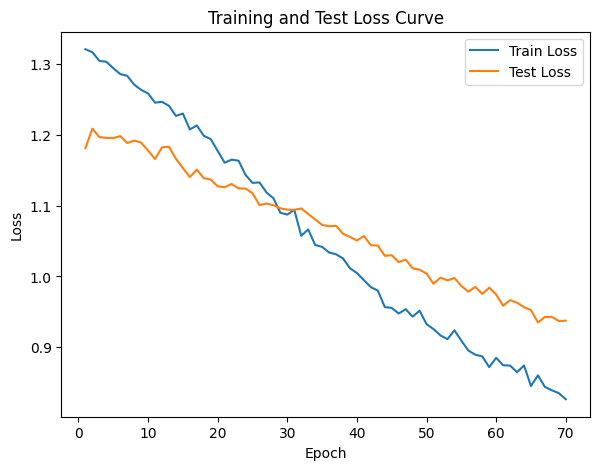

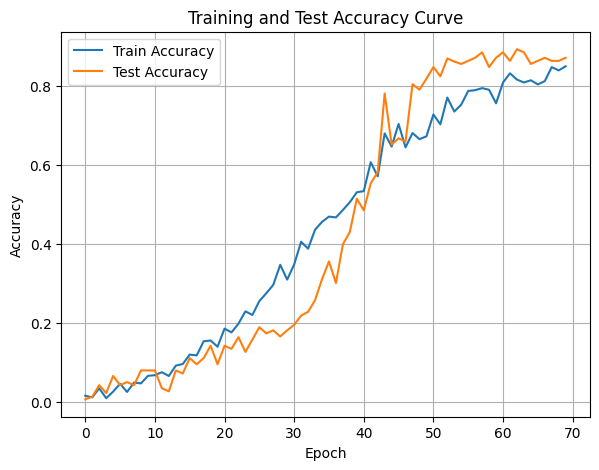

In [44]:
DTEmlp4b.train_single_model()

Randomly initializing 4 models
Training Model with id 1
in multi


Epoch [1/10], Train F1:0.3170489697705045, Train Loss: 1.1180, Train Acc: 0.3182, Test F1:0.4423698790513868, Test Loss: 1.1163, Test Acc: 0.4375

Training Process:  20%|██        | 2/10 [00:00<00:01,  7.22it/s]


Epoch [2/10], Train F1:0.34428067730547846, Train Loss: 1.1080, Train Acc: 0.3405, Test F1:0.4527635863718743, Test Loss: 1.1122, Test Acc: 0.4492


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.75it/s]

Epoch [3/10], Train F1:0.33267777648019414, Train Loss: 1.1110, Train Acc: 0.3299, Test F1:0.39519522979470423, Test Loss: 1.1108, Test Acc: 0.3912
Epoch [4/10], Train F1:0.335754342109648, Train Loss: 1.1109, Train Acc: 0.3324, Test F1:0.42155184709741833, Test Loss: 1.1061, Test Acc: 0.4164


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.50it/s]

Epoch [5/10], Train F1:0.3317808468221425, Train Loss: 1.1133, Train Acc: 0.3246, Test F1:0.43408393735799966, Test Loss: 1.1034, Test Acc: 0.4285
Epoch [6/10], Train F1:0.33544317102914195, Train Loss: 1.1104, Train Acc: 0.3282, Test F1:0.45154695939581047, Test Loss: 1.1007, Test Acc: 0.4466


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.74it/s]

Epoch [7/10], Train F1:0.3383153770389674, Train Loss: 1.1074, Train Acc: 0.3324, Test F1:0.4671173637395161, Test Loss: 1.0984, Test Acc: 0.4640
Epoch [8/10], Train F1:0.34651101832707926, Train Loss: 1.1039, Train Acc: 0.3403, Test F1:0.48412438854987105, Test Loss: 1.0952, Test Acc: 0.4832


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.35it/s]


Epoch [9/10], Train F1:0.35896925878247277, Train Loss: 1.0992, Train Acc: 0.3511, Test F1:0.4960245955271523, Test Loss: 1.0934, Test Acc: 0.4986
Epoch [10/10], Train F1:0.3653584454909925, Train Loss: 1.0967, Train Acc: 0.3574, Test F1:0.5018725482948734, Test Loss: 1.0911, Test Acc: 0.5069
Total Epochs: 10
Train loss start: 1.0785911083221436, Train loss end: 1.0166857242584229
Highest Mean Train Accuracy (over epoch): 0.35741071428571425
Test loss start: 1.1005240678787231, Test loss end: 1.0748417377471924
Highest mean Test Accuracy (over epoch): 0.5069444444444444


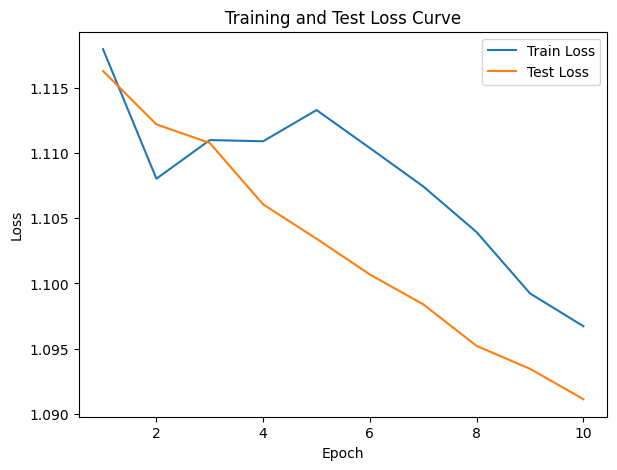

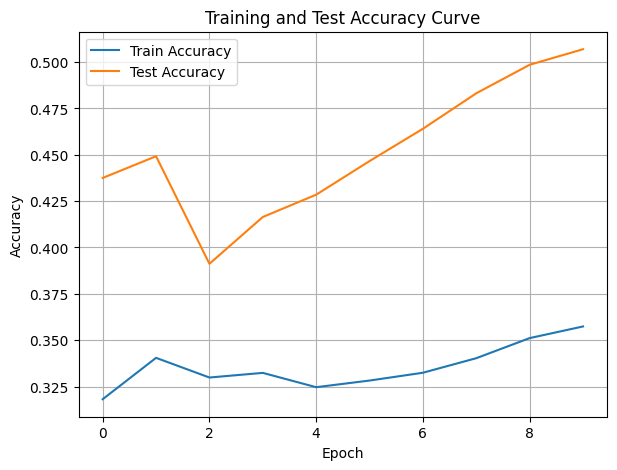

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.43it/s]

Epoch [1/10], Train F1:0.5153555416075183, Train Loss: 1.0457, Train Acc: 0.4610, Test F1:0.3941467425176699, Test Loss: 1.0913, Test Acc: 0.3967


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.34it/s]

Epoch [2/10], Train F1:0.5402123950180895, Train Loss: 1.0388, Train Acc: 0.4813, Test F1:0.38644474433948117, Test Loss: 1.0929, Test Acc: 0.4093


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.34it/s]

Epoch [3/10], Train F1:0.5564292007246721, Train Loss: 1.0334, Train Acc: 0.4946, Test F1:0.3896145299032017, Test Loss: 1.0916, Test Acc: 0.4187


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.92it/s]

Epoch [4/10], Train F1:0.5647219144297349, Train Loss: 1.0300, Train Acc: 0.5089, Test F1:0.3962091019899475, Test Loss: 1.0912, Test Acc: 0.4308


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.94it/s]

Epoch [5/10], Train F1:0.5774956122712868, Train Loss: 1.0279, Train Acc: 0.5189, Test F1:0.4015179490305478, Test Loss: 1.0887, Test Acc: 0.4392


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.62it/s]

Epoch [6/10], Train F1:0.5920931506605731, Train Loss: 1.0241, Train Acc: 0.5319, Test F1:0.40955105719985785, Test Loss: 1.0870, Test Acc: 0.4511


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.53it/s]

Epoch [7/10], Train F1:0.598210990072413, Train Loss: 1.0209, Train Acc: 0.5383, Test F1:0.4143373189833056, Test Loss: 1.0861, Test Acc: 0.4576


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.47it/s]

Epoch [8/10], Train F1:0.6061765466830145, Train Loss: 1.0175, Train Acc: 0.5475, Test F1:0.41865458392999905, Test Loss: 1.0848, Test Acc: 0.4615


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.50it/s]

Epoch [9/10], Train F1:0.6114820588657478, Train Loss: 1.0139, Train Acc: 0.5539, Test F1:0.4210666891587944, Test Loss: 1.0842, Test Acc: 0.4652


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.52it/s]


Epoch [10/10], Train F1:0.6163470110043237, Train Loss: 1.0116, Train Acc: 0.5614, Test F1:0.4296388442042051, Test Loss: 1.0827, Test Acc: 0.4728
Total Epochs: 10
Train loss start: 1.0886868238449097, Train loss end: 0.9899123311042786
Highest Mean Train Accuracy (over epoch): 0.5613988095238095
Test loss start: 1.0996593236923218, Test loss end: 1.0519212484359741
Highest mean Test Accuracy (over epoch): 0.4728298611111111


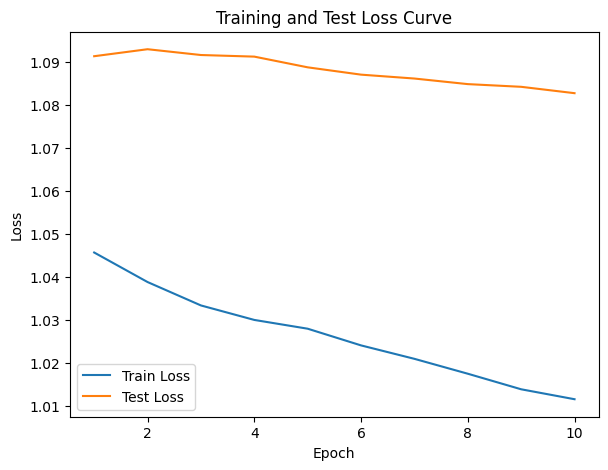

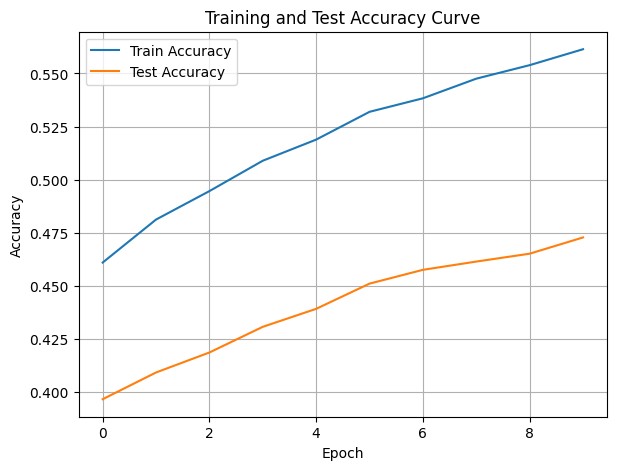

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.91it/s]

Epoch [1/10], Train F1:0.394816107807197, Train Loss: 1.1195, Train Acc: 0.3577, Test F1:0.582200956937799, Test Loss: 1.0820, Test Acc: 0.5590


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.52it/s]

Epoch [2/10], Train F1:0.4100661620430184, Train Loss: 1.1109, Train Acc: 0.3677, Test F1:0.6168957869989944, Test Loss: 1.0728, Test Acc: 0.6120


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.50it/s]

Epoch [3/10], Train F1:0.40800178288158245, Train Loss: 1.1110, Train Acc: 0.3668, Test F1:0.613221954236921, Test Loss: 1.0704, Test Acc: 0.6126


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.33it/s]

Epoch [4/10], Train F1:0.4249486804962719, Train Loss: 1.1055, Train Acc: 0.3833, Test F1:0.6103047942899806, Test Loss: 1.0669, Test Acc: 0.6144


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.49it/s]

Epoch [5/10], Train F1:0.43070288744347257, Train Loss: 1.1026, Train Acc: 0.3932, Test F1:0.6169814326335608, Test Loss: 1.0659, Test Acc: 0.6201


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.22it/s]

Epoch [6/10], Train F1:0.4342613556066369, Train Loss: 1.1002, Train Acc: 0.3972, Test F1:0.6299417030401786, Test Loss: 1.0620, Test Acc: 0.6328
Epoch [7/10], Train F1:0.44197751851188766, Train Loss: 1.0976, Train Acc: 0.4037, Test F1:0.625713246794672, Test Loss: 1.0585, Test Acc: 0.6372


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.18it/s]

Epoch [8/10], Train F1:0.4468157681903549, Train Loss: 1.0952, Train Acc: 0.4111, Test F1:0.6250278504753704, Test Loss: 1.0559, Test Acc: 0.6416
Epoch [9/10], Train F1:0.45400004396290566, Train Loss: 1.0915, Train Acc: 0.4177, Test F1:0.6274282178043552, Test Loss: 1.0539, Test Acc: 0.6459


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.76it/s]


Epoch [10/10], Train F1:0.45967679363445, Train Loss: 1.0885, Train Acc: 0.4252, Test F1:0.6304210953173688, Test Loss: 1.0508, Test Acc: 0.6523
Total Epochs: 10
Train loss start: 1.1489183902740479, Train loss end: 1.061306118965149
Highest Mean Train Accuracy (over epoch): 0.4252380952380953
Test loss start: 1.0908901691436768, Test loss end: 1.0136866569519043
Highest mean Test Accuracy (over epoch): 0.65234375


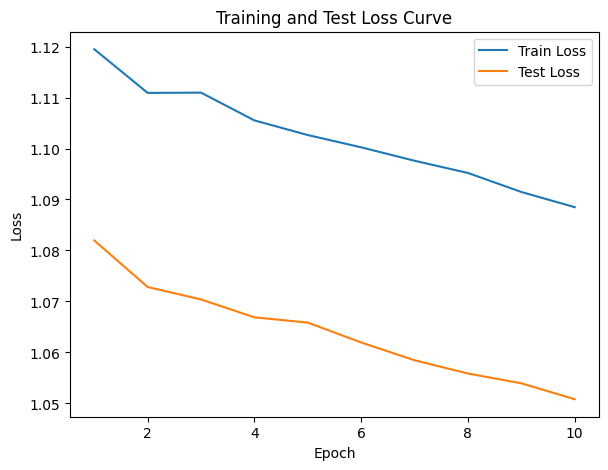

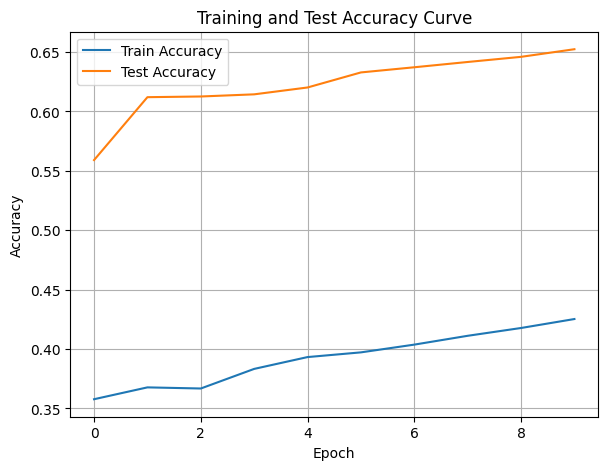

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.4348573939711143, Train Loss: 1.0966, Train Acc: 0.3911, Test F1:0.5352859550004956, Test Loss: 1.0354, Test Acc: 0.6076


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.75it/s]

Epoch [2/10], Train F1:0.4365484242186113, Train Loss: 1.0954, Train Acc: 0.4000, Test F1:0.539362590874349, Test Loss: 1.0290, Test Acc: 0.6155


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.77it/s]

Epoch [3/10], Train F1:0.4501788717744009, Train Loss: 1.0884, Train Acc: 0.4148, Test F1:0.5492806735391565, Test Loss: 1.0195, Test Acc: 0.6279


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.79it/s]

Epoch [4/10], Train F1:0.4635408954997047, Train Loss: 1.0849, Train Acc: 0.4271, Test F1:0.5597608972272363, Test Loss: 1.0145, Test Acc: 0.6395


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.15it/s]

Epoch [5/10], Train F1:0.46928612496319816, Train Loss: 1.0813, Train Acc: 0.4343, Test F1:0.5649055993427131, Test Loss: 1.0107, Test Acc: 0.6450


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.26it/s]

Epoch [6/10], Train F1:0.47491924063125046, Train Loss: 1.0774, Train Acc: 0.4376, Test F1:0.5747005929039961, Test Loss: 1.0096, Test Acc: 0.6535


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.45it/s]

Epoch [7/10], Train F1:0.4801355258331394, Train Loss: 1.0750, Train Acc: 0.4424, Test F1:0.5801828609534497, Test Loss: 1.0081, Test Acc: 0.6596


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.16it/s]

Epoch [8/10], Train F1:0.4862559759288331, Train Loss: 1.0724, Train Acc: 0.4490, Test F1:0.5903110839580049, Test Loss: 1.0044, Test Acc: 0.6671


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.52it/s]

Epoch [9/10], Train F1:0.49483054593818127, Train Loss: 1.0680, Train Acc: 0.4587, Test F1:0.5981249132463081, Test Loss: 1.0011, Test Acc: 0.6729


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.74it/s]


Epoch [10/10], Train F1:0.5036268907688046, Train Loss: 1.0635, Train Acc: 0.4685, Test F1:0.6043365605999503, Test Loss: 0.9980, Test Acc: 0.6776
Total Epochs: 10
Train loss start: 1.120911955833435, Train loss end: 0.9402269721031189
Highest Mean Train Accuracy (over epoch): 0.46851190476190474
Test loss start: 1.0165300369262695, Test loss end: 0.9705601930618286
Highest mean Test Accuracy (over epoch): 0.6776041666666667


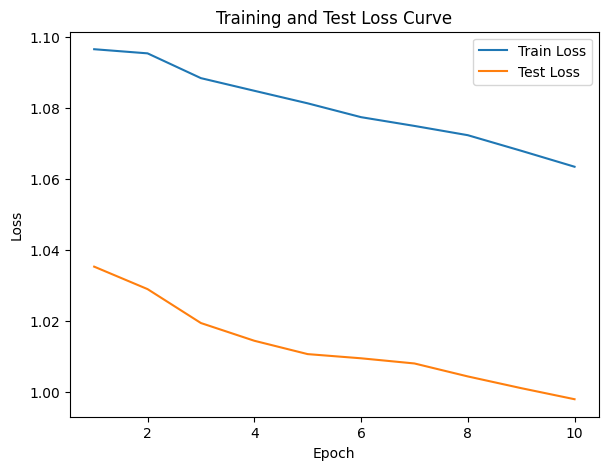

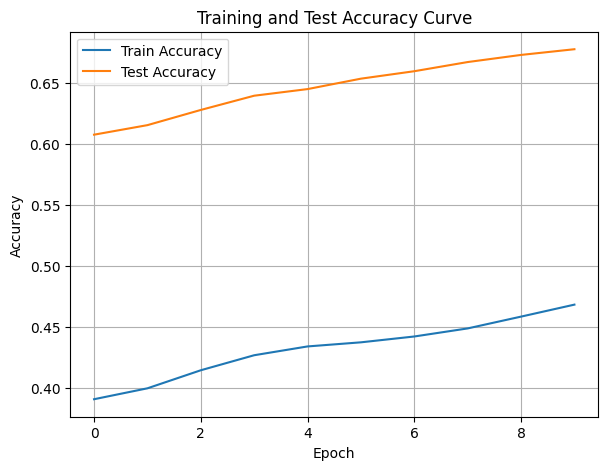

./saved_models/model_4.pth
Training Model with id 7
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.6090822419589543, Train Loss: 1.0026, Train Acc: 0.5682, Test F1:0.6288499025341131, Test Loss: 0.9733, Test Acc: 0.7040


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.48it/s]

Epoch [2/10], Train F1:0.5927731892897651, Train Loss: 1.0098, Train Acc: 0.5534, Test F1:0.6288499025341131, Test Loss: 0.9690, Test Acc: 0.7040


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.48it/s]

Epoch [3/10], Train F1:0.5928848711553802, Train Loss: 1.0115, Train Acc: 0.5594, Test F1:0.623684970216734, Test Loss: 0.9666, Test Acc: 0.7014


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.83it/s]

Epoch [4/10], Train F1:0.5969765964707101, Train Loss: 1.0076, Train Acc: 0.5687, Test F1:0.6364960444070288, Test Loss: 0.9626, Test Acc: 0.7079


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.20it/s]

Epoch [5/10], Train F1:0.5965678019459532, Train Loss: 1.0044, Train Acc: 0.5732, Test F1:0.6440242665722565, Test Loss: 0.9571, Test Acc: 0.7118


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.31it/s]

Epoch [6/10], Train F1:0.6005179045863613, Train Loss: 0.9997, Train Acc: 0.5811, Test F1:0.6489794979582881, Test Loss: 0.9523, Test Acc: 0.7144


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.20it/s]

Epoch [7/10], Train F1:0.6065784464570754, Train Loss: 0.9957, Train Acc: 0.5885, Test F1:0.6513465047946387, Test Loss: 0.9485, Test Acc: 0.7171


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.18it/s]

Epoch [8/10], Train F1:0.6136939455457883, Train Loss: 0.9927, Train Acc: 0.5940, Test F1:0.6568009447266414, Test Loss: 0.9455, Test Acc: 0.7211


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.16it/s]

Epoch [9/10], Train F1:0.6168567506304664, Train Loss: 0.9899, Train Acc: 0.5985, Test F1:0.6602611578822368, Test Loss: 0.9420, Test Acc: 0.7227


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.43it/s]


Epoch [10/10], Train F1:0.6232482867574719, Train Loss: 0.9863, Train Acc: 0.6043, Test F1:0.6665816321559419, Test Loss: 0.9389, Test Acc: 0.7269
Total Epochs: 10
Train loss start: 1.0277806520462036, Train loss end: 1.044447660446167
Highest Mean Train Accuracy (over epoch): 0.6042857142857142
Test loss start: 0.9541693925857544, Test loss end: 0.9049137830734253
Highest mean Test Accuracy (over epoch): 0.7269097222222222


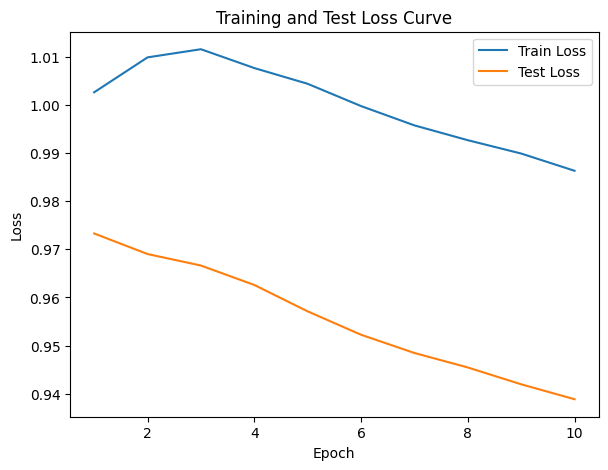

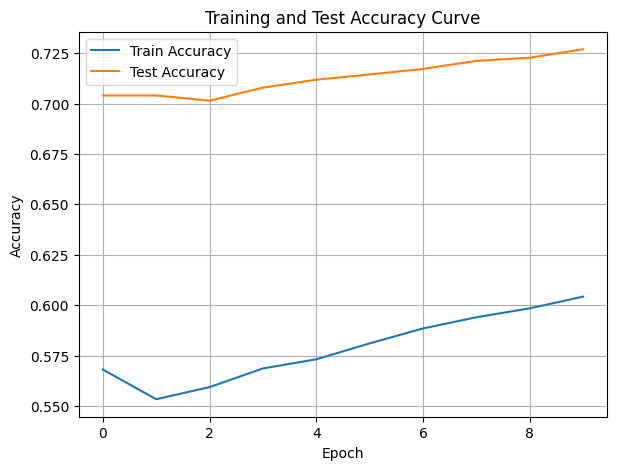

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.65it/s]

Epoch [1/10], Train F1:0.6895467032967032, Train Loss: 0.9523, Train Acc: 0.6744, Test F1:0.7211008653709746, Test Loss: 0.9037, Test Acc: 0.7648


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.40it/s]

Epoch [2/10], Train F1:0.6735828935194369, Train Loss: 0.9541, Train Acc: 0.6656, Test F1:0.7010093786957837, Test Loss: 0.9038, Test Acc: 0.7530


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.17it/s]

Epoch [3/10], Train F1:0.6814435410984898, Train Loss: 0.9467, Train Acc: 0.6706, Test F1:0.7122706511259354, Test Loss: 0.9031, Test Acc: 0.7595


Training Process:  40%|████      | 4/10 [00:00<00:00,  6.62it/s]

Epoch [4/10], Train F1:0.6840756643801088, Train Loss: 0.9403, Train Acc: 0.6811, Test F1:0.7211008653709746, Test Loss: 0.9004, Test Acc: 0.7648


Training Process:  60%|██████    | 6/10 [00:00<00:00,  5.92it/s]

Epoch [5/10], Train F1:0.6816445204455408, Train Loss: 0.9415, Train Acc: 0.6798, Test F1:0.7263257697637404, Test Loss: 0.8994, Test Acc: 0.7679
Epoch [6/10], Train F1:0.6824221732328567, Train Loss: 0.9382, Train Acc: 0.6813, Test F1:0.7254586848801392, Test Loss: 0.8982, Test Acc: 0.7674


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.18it/s]

Epoch [7/10], Train F1:0.6862925700769547, Train Loss: 0.9335, Train Acc: 0.6864, Test F1:0.7248384300361012, Test Loss: 0.8965, Test Acc: 0.7670
Epoch [8/10], Train F1:0.6933825904254383, Train Loss: 0.9289, Train Acc: 0.6926, Test F1:0.7227394475340266, Test Loss: 0.8946, Test Acc: 0.7657


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.81it/s]


Epoch [9/10], Train F1:0.6966142502834131, Train Loss: 0.9244, Train Acc: 0.6972, Test F1:0.7211008653709745, Test Loss: 0.8940, Test Acc: 0.7648
Epoch [10/10], Train F1:0.6989305544233673, Train Loss: 0.9223, Train Acc: 0.7001, Test F1:0.7224121556001785, Test Loss: 0.8926, Test Acc: 0.7655
Total Epochs: 10
Train loss start: 0.9350785613059998, Train loss end: 0.9308524131774902
Highest Mean Train Accuracy (over epoch): 0.7001488095238095
Test loss start: 0.8773996829986572, Test loss end: 0.867868185043335
Highest mean Test Accuracy (over epoch): 0.7678819444444445


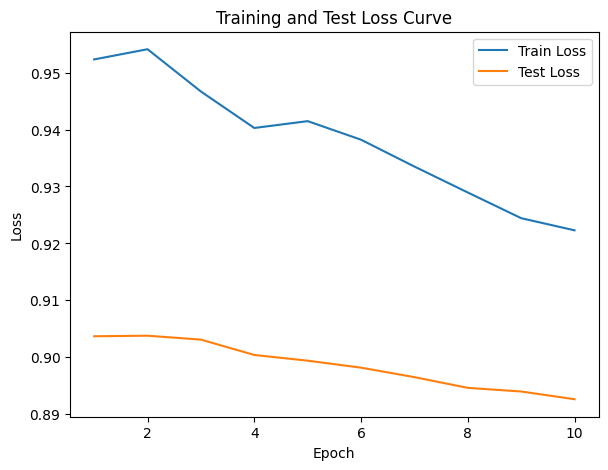

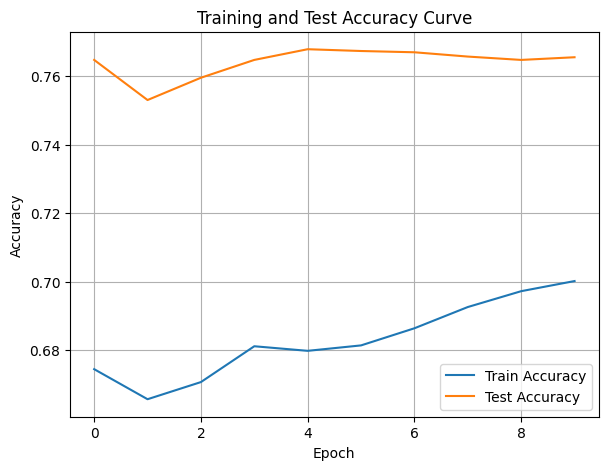

./saved_models/model_8.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.34it/s]

Epoch [1/10], Train F1:0.7299474502693819, Train Loss: 0.8908, Train Acc: 0.7414, Test F1:0.7590487847525791, Test Loss: 0.8753, Test Acc: 0.7943


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.28it/s]

Epoch [2/10], Train F1:0.7162352514465191, Train Loss: 0.8971, Train Acc: 0.7225, Test F1:0.7404238857726501, Test Loss: 0.8741, Test Acc: 0.7795


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.64it/s]

Epoch [3/10], Train F1:0.7310677343022356, Train Loss: 0.8898, Train Acc: 0.7364, Test F1:0.767119217131866, Test Loss: 0.8688, Test Acc: 0.7975


Training Process:  40%|████      | 4/10 [00:00<00:00,  6.63it/s]

Epoch [4/10], Train F1:0.7391875551523026, Train Loss: 0.8831, Train Acc: 0.7444, Test F1:0.7711090591977018, Test Loss: 0.8640, Test Acc: 0.8006
Epoch [5/10], Train F1:0.7419796090216676, Train Loss: 0.8821, Train Acc: 0.7480, Test F1:0.7711090591977018, Test Loss: 0.8615, Test Acc: 0.8009


Training Process:  60%|██████    | 6/10 [00:01<00:00,  4.99it/s]

Epoch [6/10], Train F1:0.7458542910589391, Train Loss: 0.8772, Train Acc: 0.7539, Test F1:0.7730929114723094, Test Loss: 0.8584, Test Acc: 0.8024
Epoch [7/10], Train F1:0.7473576461318885, Train Loss: 0.8743, Train Acc: 0.7569, Test F1:0.7778806931134388, Test Loss: 0.8554, Test Acc: 0.8057


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.39it/s]

Epoch [8/10], Train F1:0.7452723722801246, Train Loss: 0.8736, Train Acc: 0.7564, Test F1:0.7843611497351701, Test Loss: 0.8537, Test Acc: 0.8109
Epoch [9/10], Train F1:0.7447793924340946, Train Loss: 0.8723, Train Acc: 0.7559, Test F1:0.7841994932144891, Test Loss: 0.8525, Test Acc: 0.8108


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.11it/s]


Epoch [10/10], Train F1:0.7416323820243329, Train Loss: 0.8706, Train Acc: 0.7541, Test F1:0.7840701337080833, Test Loss: 0.8510, Test Acc: 0.8107
Total Epochs: 10
Train loss start: 0.8687994480133057, Train loss end: 0.8457013368606567
Highest Mean Train Accuracy (over epoch): 0.7568877551020409
Test loss start: 0.8520609140396118, Test loss end: 0.8279364109039307
Highest mean Test Accuracy (over epoch): 0.8108723958333334


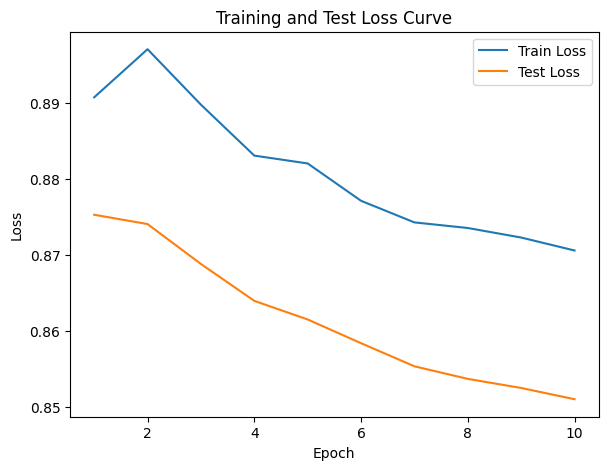

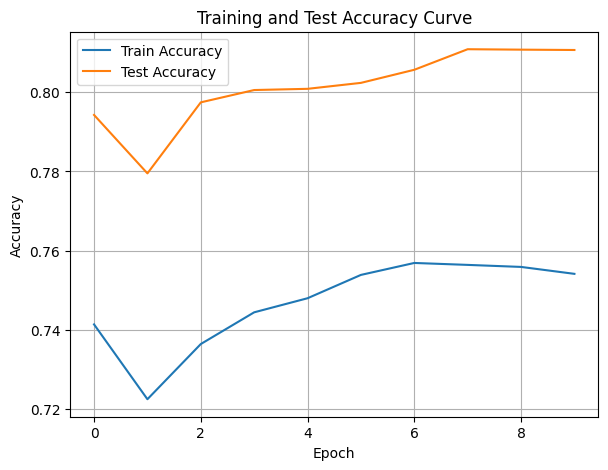

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [45]:
DTEmlp4b.train_DTE()

Training Process:   1%|▏         | 1/70 [00:00<00:09,  7.32it/s]

Epoch [1/70], Train F1:0.41825793307585546, Train Loss: 1.1101, Train Acc: 0.3815, Test F1:0.25807661098519824, Test Loss: 1.0921, Test Acc: 0.2465


Training Process:   3%|▎         | 2/70 [00:00<00:11,  5.96it/s]

Epoch [2/70], Train F1:0.4336702327861099, Train Loss: 1.0981, Train Acc: 0.4040, Test F1:0.24854803123054398, Test Loss: 1.0886, Test Acc: 0.2426


Training Process:   4%|▍         | 3/70 [00:00<00:12,  5.39it/s]

Epoch [3/70], Train F1:0.43292990195645054, Train Loss: 1.0957, Train Acc: 0.4014, Test F1:0.2416930069587376, Test Loss: 1.0890, Test Acc: 0.2433


Training Process:   6%|▌         | 4/70 [00:00<00:12,  5.21it/s]

Epoch [4/70], Train F1:0.44129600051013396, Train Loss: 1.0916, Train Acc: 0.4060, Test F1:0.23809796702698152, Test Loss: 1.0889, Test Acc: 0.2422


Training Process:   9%|▊         | 6/70 [00:01<00:11,  5.44it/s]

Epoch [5/70], Train F1:0.4439806376533521, Train Loss: 1.0878, Train Acc: 0.4099, Test F1:0.24422847417826052, Test Loss: 1.0876, Test Acc: 0.2462
Epoch [6/70], Train F1:0.45502602915553175, Train Loss: 1.0814, Train Acc: 0.4233, Test F1:0.2454372061392629, Test Loss: 1.0875, Test Acc: 0.2509


Training Process:  10%|█         | 7/70 [00:01<00:12,  5.20it/s]

Epoch [7/70], Train F1:0.4538602285227672, Train Loss: 1.0770, Train Acc: 0.4251, Test F1:0.2521647801700599, Test Loss: 1.0864, Test Acc: 0.2564


Training Process:  11%|█▏        | 8/70 [00:01<00:12,  5.03it/s]

Epoch [8/70], Train F1:0.45858164109140725, Train Loss: 1.0721, Train Acc: 0.4315, Test F1:0.25802967114084, Test Loss: 1.0849, Test Acc: 0.2626


Training Process:  13%|█▎        | 9/70 [00:01<00:12,  5.01it/s]

Epoch [9/70], Train F1:0.4633275292341411, Train Loss: 1.0683, Train Acc: 0.4377, Test F1:0.2678216233101847, Test Loss: 1.0830, Test Acc: 0.2715


Training Process:  14%|█▍        | 10/70 [00:01<00:12,  4.83it/s]

Epoch [10/70], Train F1:0.46744664517119605, Train Loss: 1.0651, Train Acc: 0.4427, Test F1:0.2738181982470853, Test Loss: 1.0818, Test Acc: 0.2771


Training Process:  16%|█▌        | 11/70 [00:02<00:11,  5.02it/s]

Epoch [11/70], Train F1:0.4689647833466126, Train Loss: 1.0628, Train Acc: 0.4440, Test F1:0.28033885640968975, Test Loss: 1.0803, Test Acc: 0.2831


Training Process:  17%|█▋        | 12/70 [00:02<00:11,  5.00it/s]

Epoch [12/70], Train F1:0.4764225753950341, Train Loss: 1.0584, Train Acc: 0.4530, Test F1:0.2872533953300369, Test Loss: 1.0791, Test Acc: 0.2894


Training Process:  19%|█▊        | 13/70 [00:02<00:11,  4.93it/s]

Epoch [13/70], Train F1:0.47957050016096103, Train Loss: 1.0561, Train Acc: 0.4564, Test F1:0.2936949493263632, Test Loss: 1.0779, Test Acc: 0.2959


Training Process:  21%|██▏       | 15/70 [00:02<00:10,  5.10it/s]

Epoch [14/70], Train F1:0.48681499789917676, Train Loss: 1.0523, Train Acc: 0.4653, Test F1:0.3049602961811049, Test Loss: 1.0763, Test Acc: 0.3048
Epoch [15/70], Train F1:0.49215225945018976, Train Loss: 1.0492, Train Acc: 0.4720, Test F1:0.314672335381173, Test Loss: 1.0748, Test Acc: 0.3135


Training Process:  24%|██▍       | 17/70 [00:03<00:08,  6.06it/s]

Epoch [16/70], Train F1:0.49881573548198815, Train Loss: 1.0456, Train Acc: 0.4801, Test F1:0.32043965811410113, Test Loss: 1.0731, Test Acc: 0.3196
Epoch [17/70], Train F1:0.5058998191050711, Train Loss: 1.0416, Train Acc: 0.4874, Test F1:0.33150385896558915, Test Loss: 1.0714, Test Acc: 0.3295


Training Process:  27%|██▋       | 19/70 [00:03<00:08,  5.87it/s]

Epoch [18/70], Train F1:0.5135076991337519, Train Loss: 1.0372, Train Acc: 0.4958, Test F1:0.3383138737004362, Test Loss: 1.0702, Test Acc: 0.3366
Epoch [19/70], Train F1:0.5217809522793302, Train Loss: 1.0336, Train Acc: 0.5037, Test F1:0.3454709935980844, Test Loss: 1.0687, Test Acc: 0.3436


Training Process:  30%|███       | 21/70 [00:03<00:08,  5.78it/s]

Epoch [20/70], Train F1:0.5250025798594006, Train Loss: 1.0304, Train Acc: 0.5082, Test F1:0.36001391169758007, Test Loss: 1.0666, Test Acc: 0.3554
Epoch [21/70], Train F1:0.5299882054960632, Train Loss: 1.0276, Train Acc: 0.5131, Test F1:0.37262291952850196, Test Loss: 1.0647, Test Acc: 0.3664


Training Process:  33%|███▎      | 23/70 [00:04<00:07,  6.00it/s]

Epoch [22/70], Train F1:0.5355927321363918, Train Loss: 1.0239, Train Acc: 0.5195, Test F1:0.37798482575399484, Test Loss: 1.0634, Test Acc: 0.3716
Epoch [23/70], Train F1:0.5426586869679836, Train Loss: 1.0202, Train Acc: 0.5269, Test F1:0.3844519562675867, Test Loss: 1.0618, Test Acc: 0.3773


Training Process:  34%|███▍      | 24/70 [00:04<00:07,  6.24it/s]

Epoch [24/70], Train F1:0.55017452381957, Train Loss: 1.0163, Train Acc: 0.5350, Test F1:0.3957141326548975, Test Loss: 1.0604, Test Acc: 0.3864


Training Process:  36%|███▌      | 25/70 [00:04<00:07,  5.85it/s]

Epoch [25/70], Train F1:0.5542740847291284, Train Loss: 1.0135, Train Acc: 0.5389, Test F1:0.40387021878709595, Test Loss: 1.0591, Test Acc: 0.3943


Training Process:  37%|███▋      | 26/70 [00:04<00:08,  5.21it/s]

Epoch [26/70], Train F1:0.5590145958280355, Train Loss: 1.0103, Train Acc: 0.5443, Test F1:0.41731552841430064, Test Loss: 1.0575, Test Acc: 0.4055


Training Process:  39%|███▊      | 27/70 [00:05<00:09,  4.62it/s]

Epoch [27/70], Train F1:0.5621169018462339, Train Loss: 1.0073, Train Acc: 0.5482, Test F1:0.4303324509856222, Test Loss: 1.0559, Test Acc: 0.4165


Training Process:  40%|████      | 28/70 [00:05<00:09,  4.38it/s]

Epoch [28/70], Train F1:0.5653887099418545, Train Loss: 1.0044, Train Acc: 0.5525, Test F1:0.4408715104628249, Test Loss: 1.0542, Test Acc: 0.4258


Training Process:  41%|████▏     | 29/70 [00:05<00:10,  4.04it/s]

Epoch [29/70], Train F1:0.5698715767111345, Train Loss: 1.0015, Train Acc: 0.5579, Test F1:0.4554981849679481, Test Loss: 1.0525, Test Acc: 0.4391


Training Process:  43%|████▎     | 30/70 [00:05<00:09,  4.33it/s]

Epoch [30/70], Train F1:0.5749084263124001, Train Loss: 0.9980, Train Acc: 0.5635, Test F1:0.46526514154488197, Test Loss: 1.0512, Test Acc: 0.4480


Training Process:  44%|████▍     | 31/70 [00:06<00:08,  4.34it/s]

Epoch [31/70], Train F1:0.5787055415099577, Train Loss: 0.9957, Train Acc: 0.5673, Test F1:0.4734545918548747, Test Loss: 1.0500, Test Acc: 0.4552


Training Process:  46%|████▌     | 32/70 [00:06<00:08,  4.28it/s]

Epoch [32/70], Train F1:0.5848309617150256, Train Loss: 0.9922, Train Acc: 0.5739, Test F1:0.47822570001280995, Test Loss: 1.0486, Test Acc: 0.4600


Training Process:  47%|████▋     | 33/70 [00:06<00:08,  4.16it/s]

Epoch [33/70], Train F1:0.5891854759044515, Train Loss: 0.9895, Train Acc: 0.5783, Test F1:0.4826989673882299, Test Loss: 1.0472, Test Acc: 0.4646


Training Process:  49%|████▊     | 34/70 [00:06<00:09,  3.78it/s]

Epoch [34/70], Train F1:0.5930981667918207, Train Loss: 0.9867, Train Acc: 0.5829, Test F1:0.49239117663112386, Test Loss: 1.0459, Test Acc: 0.4736


Training Process:  50%|█████     | 35/70 [00:07<00:10,  3.35it/s]

Epoch [35/70], Train F1:0.5968463454252101, Train Loss: 0.9838, Train Acc: 0.5872, Test F1:0.49728799237073673, Test Loss: 1.0447, Test Acc: 0.4785


Training Process:  51%|█████▏    | 36/70 [00:07<00:11,  2.99it/s]

Epoch [36/70], Train F1:0.6006165894069811, Train Loss: 0.9811, Train Acc: 0.5911, Test F1:0.5056837973054173, Test Loss: 1.0434, Test Acc: 0.4867


Training Process:  53%|█████▎    | 37/70 [00:07<00:10,  3.16it/s]

Epoch [37/70], Train F1:0.604818582066962, Train Loss: 0.9782, Train Acc: 0.5955, Test F1:0.5154623181942631, Test Loss: 1.0418, Test Acc: 0.4961


Epoch [38/70], Train F1:0.6088195971124885, Train Loss: 0.9756, Train Acc: 0.5995, Test F1:0.5245498803068214, Test Loss: 1.0403, Test Acc: 0.5048


Training Process:  57%|█████▋    | 40/70 [00:08<00:06,  4.50it/s]

Epoch [39/70], Train F1:0.612890613541835, Train Loss: 0.9730, Train Acc: 0.6034, Test F1:0.5322338825219775, Test Loss: 1.0389, Test Acc: 0.5123
Epoch [40/70], Train F1:0.6171471351389844, Train Loss: 0.9702, Train Acc: 0.6079, Test F1:0.5400708177334783, Test Loss: 1.0375, Test Acc: 0.5201


Training Process:  59%|█████▊    | 41/70 [00:08<00:06,  4.81it/s]

Epoch [41/70], Train F1:0.6213397993765131, Train Loss: 0.9675, Train Acc: 0.6122, Test F1:0.5476258413843876, Test Loss: 1.0364, Test Acc: 0.5276


Training Process:  60%|██████    | 42/70 [00:08<00:06,  4.17it/s]

Epoch [42/70], Train F1:0.6254832085870341, Train Loss: 0.9651, Train Acc: 0.6163, Test F1:0.5557302945562158, Test Loss: 1.0349, Test Acc: 0.5358


Training Process:  61%|██████▏   | 43/70 [00:09<00:06,  3.88it/s]

Epoch [43/70], Train F1:0.6287268560319669, Train Loss: 0.9629, Train Acc: 0.6198, Test F1:0.5573478980127552, Test Loss: 1.0338, Test Acc: 0.5378


Training Process:  63%|██████▎   | 44/70 [00:09<00:06,  3.89it/s]

Epoch [44/70], Train F1:0.6317230254065573, Train Loss: 0.9606, Train Acc: 0.6229, Test F1:0.5630957389842683, Test Loss: 1.0326, Test Acc: 0.5435


Training Process:  64%|██████▍   | 45/70 [00:09<00:06,  3.97it/s]

Epoch [45/70], Train F1:0.6359976020095857, Train Loss: 0.9581, Train Acc: 0.6273, Test F1:0.5657391640629796, Test Loss: 1.0315, Test Acc: 0.5463


Training Process:  66%|██████▌   | 46/70 [00:10<00:06,  3.93it/s]

Epoch [46/70], Train F1:0.6398521757738829, Train Loss: 0.9555, Train Acc: 0.6312, Test F1:0.5723898801751868, Test Loss: 1.0302, Test Acc: 0.5530


Training Process:  67%|██████▋   | 47/70 [00:10<00:07,  3.01it/s]

Epoch [47/70], Train F1:0.6435927598579136, Train Loss: 0.9531, Train Acc: 0.6350, Test F1:0.5789952030284903, Test Loss: 1.0288, Test Acc: 0.5598


Training Process:  69%|██████▊   | 48/70 [00:11<00:08,  2.51it/s]

Epoch [48/70], Train F1:0.6467588035496007, Train Loss: 0.9509, Train Acc: 0.6383, Test F1:0.58511503069208, Test Loss: 1.0273, Test Acc: 0.5660


Training Process:  70%|███████   | 49/70 [00:11<00:09,  2.33it/s]

Epoch [49/70], Train F1:0.649525516635782, Train Loss: 0.9487, Train Acc: 0.6413, Test F1:0.5912748489044757, Test Loss: 1.0259, Test Acc: 0.5723


Training Process:  71%|███████▏  | 50/70 [00:12<00:10,  1.96it/s]

Epoch [50/70], Train F1:0.6533279383349218, Train Loss: 0.9461, Train Acc: 0.6453, Test F1:0.59411358133767, Test Loss: 1.0249, Test Acc: 0.5755


Training Process:  73%|███████▎  | 51/70 [00:12<00:09,  2.02it/s]

Epoch [51/70], Train F1:0.6572855489947086, Train Loss: 0.9434, Train Acc: 0.6494, Test F1:0.600016901558031, Test Loss: 1.0235, Test Acc: 0.5817


Training Process:  74%|███████▍  | 52/70 [00:13<00:09,  1.98it/s]

Epoch [52/70], Train F1:0.660503932326246, Train Loss: 0.9410, Train Acc: 0.6528, Test F1:0.6053460875834735, Test Loss: 1.0220, Test Acc: 0.5872


Training Process:  76%|███████▌  | 53/70 [00:13<00:08,  2.08it/s]

Epoch [53/70], Train F1:0.6637395980884376, Train Loss: 0.9388, Train Acc: 0.6561, Test F1:0.6104515928055639, Test Loss: 1.0206, Test Acc: 0.5926


Training Process:  77%|███████▋  | 54/70 [00:14<00:07,  2.24it/s]

Epoch [54/70], Train F1:0.6659991282012162, Train Loss: 0.9368, Train Acc: 0.6587, Test F1:0.6156659379359848, Test Loss: 1.0190, Test Acc: 0.5980


Training Process:  79%|███████▊  | 55/70 [00:14<00:05,  2.58it/s]

Epoch [55/70], Train F1:0.6690687752689924, Train Loss: 0.9346, Train Acc: 0.6618, Test F1:0.620515224438736, Test Loss: 1.0176, Test Acc: 0.6030


Training Process:  80%|████████  | 56/70 [00:14<00:04,  2.97it/s]

Epoch [56/70], Train F1:0.672144202948336, Train Loss: 0.9324, Train Acc: 0.6650, Test F1:0.6251766605003691, Test Loss: 1.0162, Test Acc: 0.6079


Training Process:  81%|████████▏ | 57/70 [00:14<00:03,  3.25it/s]

Epoch [57/70], Train F1:0.6744595095086987, Train Loss: 0.9304, Train Acc: 0.6675, Test F1:0.6296586270943404, Test Loss: 1.0148, Test Acc: 0.6127


Training Process:  83%|████████▎ | 58/70 [00:15<00:03,  3.35it/s]

Epoch [58/70], Train F1:0.677180306564786, Train Loss: 0.9284, Train Acc: 0.6703, Test F1:0.6335335768199752, Test Loss: 1.0136, Test Acc: 0.6167


Training Process:  84%|████████▍ | 59/70 [00:15<00:03,  3.02it/s]

Epoch [59/70], Train F1:0.6796816750189636, Train Loss: 0.9265, Train Acc: 0.6728, Test F1:0.6368401611277019, Test Loss: 1.0126, Test Acc: 0.6200


Training Process:  86%|████████▌ | 60/70 [00:15<00:03,  3.07it/s]

Epoch [60/70], Train F1:0.6823282385528208, Train Loss: 0.9246, Train Acc: 0.6754, Test F1:0.6406043271709553, Test Loss: 1.0115, Test Acc: 0.6237


Training Process:  87%|████████▋ | 61/70 [00:16<00:02,  3.19it/s]

Epoch [61/70], Train F1:0.6848793718908273, Train Loss: 0.9228, Train Acc: 0.6777, Test F1:0.6447922449166432, Test Loss: 1.0100, Test Acc: 0.6281


Training Process:  89%|████████▊ | 62/70 [00:16<00:02,  3.29it/s]

Epoch [62/70], Train F1:0.6879039005495731, Train Loss: 0.9208, Train Acc: 0.6806, Test F1:0.648027242535934, Test Loss: 1.0090, Test Acc: 0.6313


Training Process:  90%|█████████ | 63/70 [00:16<00:02,  3.42it/s]

Epoch [63/70], Train F1:0.6903992919580074, Train Loss: 0.9188, Train Acc: 0.6829, Test F1:0.6507560973180028, Test Loss: 1.0079, Test Acc: 0.6341


Training Process:  91%|█████████▏| 64/70 [00:17<00:01,  3.07it/s]

Epoch [64/70], Train F1:0.6928039225218592, Train Loss: 0.9168, Train Acc: 0.6855, Test F1:0.6533910409070306, Test Loss: 1.0069, Test Acc: 0.6369


Training Process:  93%|█████████▎| 65/70 [00:17<00:01,  2.69it/s]

Epoch [65/70], Train F1:0.6958031041298767, Train Loss: 0.9147, Train Acc: 0.6886, Test F1:0.6569750171891576, Test Loss: 1.0056, Test Acc: 0.6408


Training Process:  94%|█████████▍| 66/70 [00:17<00:01,  2.46it/s]

Epoch [66/70], Train F1:0.6977676307304223, Train Loss: 0.9127, Train Acc: 0.6907, Test F1:0.6608432239950945, Test Loss: 1.0045, Test Acc: 0.6448


Training Process:  96%|█████████▌| 67/70 [00:18<00:01,  2.43it/s]

Epoch [67/70], Train F1:0.7000699330971691, Train Loss: 0.9107, Train Acc: 0.6932, Test F1:0.6644569255839992, Test Loss: 1.0033, Test Acc: 0.6487


Training Process:  97%|█████████▋| 68/70 [00:18<00:00,  2.27it/s]

Epoch [68/70], Train F1:0.7022908823637911, Train Loss: 0.9089, Train Acc: 0.6954, Test F1:0.6680877978442386, Test Loss: 1.0020, Test Acc: 0.6525


Training Process:  99%|█████████▊| 69/70 [00:19<00:00,  2.18it/s]

Epoch [69/70], Train F1:0.7041780736083411, Train Loss: 0.9071, Train Acc: 0.6975, Test F1:0.671364985273308, Test Loss: 1.0009, Test Acc: 0.6560


Training Process: 100%|██████████| 70/70 [00:19<00:00,  3.55it/s]


Epoch [70/70], Train F1:0.7064435639809413, Train Loss: 0.9054, Train Acc: 0.6997, Test F1:0.6746707463123677, Test Loss: 0.9996, Test Acc: 0.6595
Total Epochs: 70
Train loss start: 1.1640230417251587, Train loss end: 0.9193854928016663
Highest Mean Train Accuracy (over epoch): 0.6996981292517006
Test loss start: 1.0998306274414062, Test loss end: 0.8803627490997314
Highest Mean Test Accuracy (over epoch): 0.6595238095238096


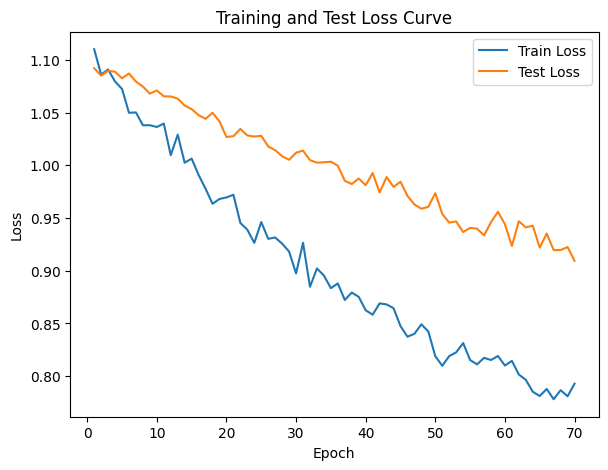

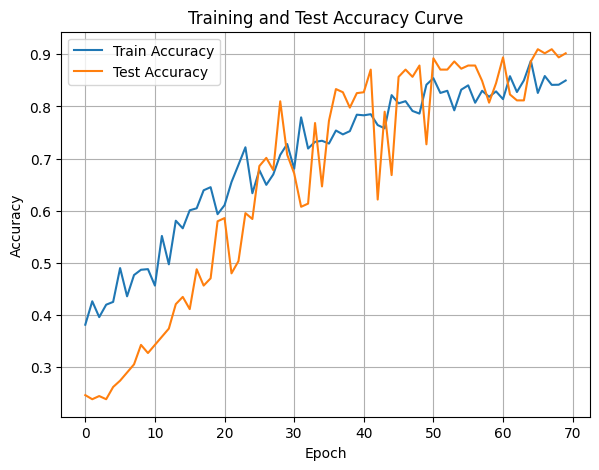

In [46]:
DTEmlp4b.train_single_model()

# Base 6

In [47]:
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
DTEmlp6b = DeepTreeEnsemble(task_name='classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=6,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.0001)

Randomly initializing 6 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.15it/s]

Epoch [1/10], Train F1:0.5371242429681632, Train Loss: 1.0323, Train Acc: 0.5140, Test F1:0.49033816425120774, Test Loss: 1.0743, Test Acc: 0.4688


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.12it/s]

Epoch [2/10], Train F1:0.5507519902656971, Train Loss: 1.0324, Train Acc: 0.5312, Test F1:0.47559864883984154, Test Loss: 1.0737, Test Acc: 0.4540
Epoch [3/10], Train F1:0.5459044679185194, Train Loss: 1.0342, Train Acc: 0.5262, Test F1:0.5150892695656667, Test Loss: 1.0676, Test Acc: 0.4948


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.80it/s]

Epoch [4/10], Train F1:0.5416744572007026, Train Loss: 1.0321, Train Acc: 0.5237, Test F1:0.5213612569207168, Test Loss: 1.0649, Test Acc: 0.5035
Epoch [5/10], Train F1:0.5475640605314319, Train Loss: 1.0288, Train Acc: 0.5354, Test F1:0.5538298653217446, Test Loss: 1.0630, Test Acc: 0.5373


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.89it/s]

Epoch [6/10], Train F1:0.5543577802859192, Train Loss: 1.0252, Train Acc: 0.5419, Test F1:0.5847181731637054, Test Loss: 1.0606, Test Acc: 0.5690
Epoch [7/10], Train F1:0.5589405189405189, Train Loss: 1.0214, Train Acc: 0.5497, Test F1:0.5966782913109124, Test Loss: 1.0588, Test Acc: 0.5827


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.43it/s]

Epoch [8/10], Train F1:0.5613150785790271, Train Loss: 1.0196, Train Acc: 0.5522, Test F1:0.6010145068010726, Test Loss: 1.0577, Test Acc: 0.5881
Epoch [9/10], Train F1:0.563773672585254, Train Loss: 1.0165, Train Acc: 0.5563, Test F1:0.6184345060920005, Test Loss: 1.0557, Test Acc: 0.6062


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.86it/s]


Epoch [10/10], Train F1:0.5681876538680956, Train Loss: 1.0137, Train Acc: 0.5617, Test F1:0.6315871031843923, Test Loss: 1.0537, Test Acc: 0.6205
Total Epochs: 10
Train loss start: 0.978596568107605, Train loss end: 0.9729050397872925
Highest Mean Train Accuracy (over epoch): 0.5616666666666666
Test loss start: 1.0724053382873535, Test loss end: 1.0294259786605835
Highest mean Test Accuracy (over epoch): 0.6204861111111111


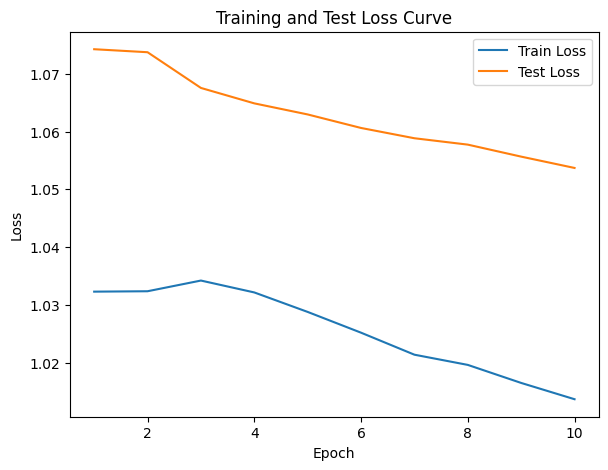

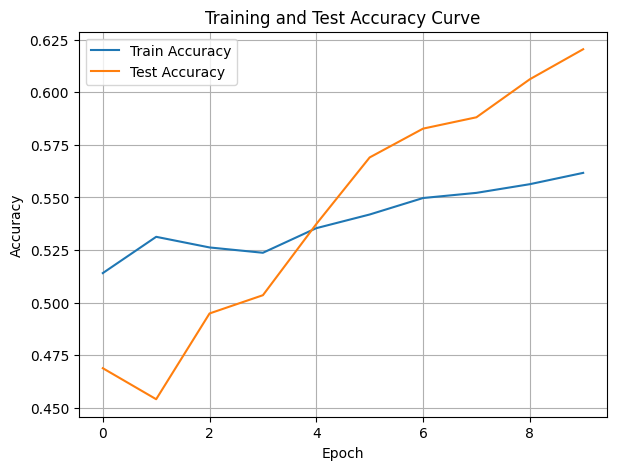

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.34it/s]

Epoch [1/10], Train F1:0.22235004301160086, Train Loss: 1.1888, Train Acc: 0.1354, Test F1:0.14483380429252865, Test Loss: 1.1489, Test Acc: 0.0885


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.21it/s]

Epoch [2/10], Train F1:0.22038101292539375, Train Loss: 1.1889, Train Acc: 0.1381, Test F1:0.12213622291021671, Test Loss: 1.1568, Test Acc: 0.0738


Training Process:  30%|███       | 3/10 [00:00<00:01,  5.09it/s]

Epoch [3/10], Train F1:0.20885291867323152, Train Loss: 1.1884, Train Acc: 0.1327, Test F1:0.0937230080851847, Test Loss: 1.1643, Test Acc: 0.0544


Training Process:  40%|████      | 4/10 [00:00<00:01,  4.79it/s]

Epoch [4/10], Train F1:0.22197255940094973, Train Loss: 1.1837, Train Acc: 0.1426, Test F1:0.09484975210636015, Test Loss: 1.1634, Test Acc: 0.0540


Training Process:  60%|██████    | 6/10 [00:01<00:00,  5.09it/s]

Epoch [5/10], Train F1:0.2303169470352367, Train Loss: 1.1787, Train Acc: 0.1504, Test F1:0.10132467943833354, Test Loss: 1.1611, Test Acc: 0.0582
Epoch [6/10], Train F1:0.243922711629924, Train Loss: 1.1740, Train Acc: 0.1595, Test F1:0.09561737800905731, Test Loss: 1.1614, Test Acc: 0.0547


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.48it/s]

Epoch [7/10], Train F1:0.2555435579212177, Train Loss: 1.1700, Train Acc: 0.1679, Test F1:0.10503879769866815, Test Loss: 1.1589, Test Acc: 0.0606
Epoch [8/10], Train F1:0.26484211560883175, Train Loss: 1.1659, Train Acc: 0.1767, Test F1:0.10788148051277993, Test Loss: 1.1565, Test Acc: 0.0624


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.27it/s]


Epoch [9/10], Train F1:0.2712274157031923, Train Loss: 1.1631, Train Acc: 0.1821, Test F1:0.11564716905367421, Test Loss: 1.1542, Test Acc: 0.0677
Epoch [10/10], Train F1:0.2822212039700802, Train Loss: 1.1591, Train Acc: 0.1897, Test F1:0.12197111607952144, Test Loss: 1.1529, Test Acc: 0.0714
Total Epochs: 10
Train loss start: 1.179992914199829, Train loss end: 1.180176854133606
Highest Mean Train Accuracy (over epoch): 0.18967261904761903
Test loss start: 1.1449508666992188, Test loss end: 1.121191143989563
Highest mean Test Accuracy (over epoch): 0.08854166666666666


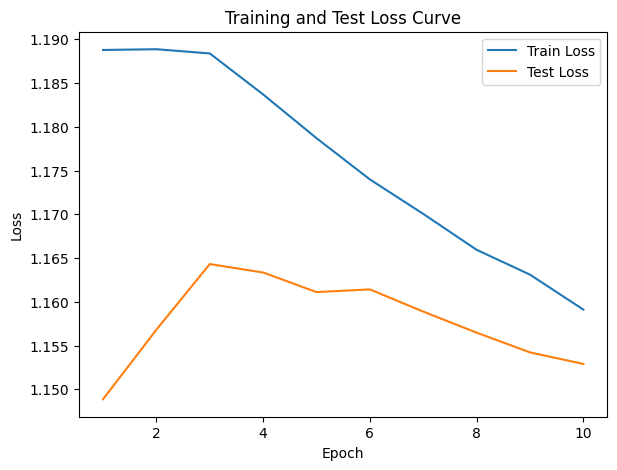

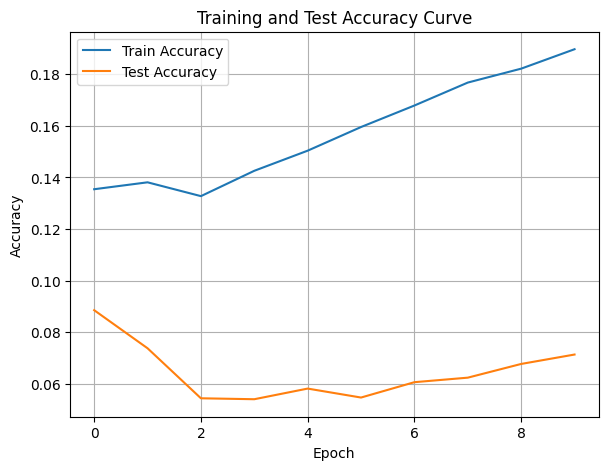

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.45548391158586166, Train Loss: 1.0737, Train Acc: 0.4077, Test F1:0.31391283683304055, Test Loss: 1.1129, Test Acc: 0.2352


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.98it/s]

Epoch [2/10], Train F1:0.45664032923892234, Train Loss: 1.0769, Train Acc: 0.4013, Test F1:0.2509495279248729, Test Loss: 1.1284, Test Acc: 0.1775


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.74it/s]

Epoch [3/10], Train F1:0.4472864022480997, Train Loss: 1.0776, Train Acc: 0.3909, Test F1:0.24010429682944306, Test Loss: 1.1328, Test Acc: 0.1837


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.00it/s]

Epoch [4/10], Train F1:0.4597125952989395, Train Loss: 1.0711, Train Acc: 0.4018, Test F1:0.2388073861370275, Test Loss: 1.1338, Test Acc: 0.1981


Training Process:  50%|█████     | 5/10 [00:00<00:00,  6.39it/s]

Epoch [5/10], Train F1:0.47138725891493, Train Loss: 1.0657, Train Acc: 0.4153, Test F1:0.23256341412581064, Test Loss: 1.1335, Test Acc: 0.1962


Training Process:  70%|███████   | 7/10 [00:01<00:00,  6.10it/s]

Epoch [6/10], Train F1:0.4771900579364827, Train Loss: 1.0638, Train Acc: 0.4224, Test F1:0.24689456599881468, Test Loss: 1.1287, Test Acc: 0.2086
Epoch [7/10], Train F1:0.4816450470407081, Train Loss: 1.0608, Train Acc: 0.4295, Test F1:0.2531334511951262, Test Loss: 1.1265, Test Acc: 0.2144


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.77it/s]

Epoch [8/10], Train F1:0.4921147597778372, Train Loss: 1.0575, Train Acc: 0.4401, Test F1:0.2646128095044504, Test Loss: 1.1231, Test Acc: 0.2263
Epoch [9/10], Train F1:0.5016362037982247, Train Loss: 1.0528, Train Acc: 0.4498, Test F1:0.2673363379420976, Test Loss: 1.1226, Test Acc: 0.2271


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.28it/s]


Epoch [10/10], Train F1:0.5090077024051967, Train Loss: 1.0485, Train Acc: 0.4578, Test F1:0.27179812993632385, Test Loss: 1.1212, Test Acc: 0.2331
Total Epochs: 10
Train loss start: 1.0270243883132935, Train loss end: 1.0316416025161743
Highest Mean Train Accuracy (over epoch): 0.4578273809523809
Test loss start: 1.1323882341384888, Test loss end: 1.0859023332595825
Highest mean Test Accuracy (over epoch): 0.23524305555555555


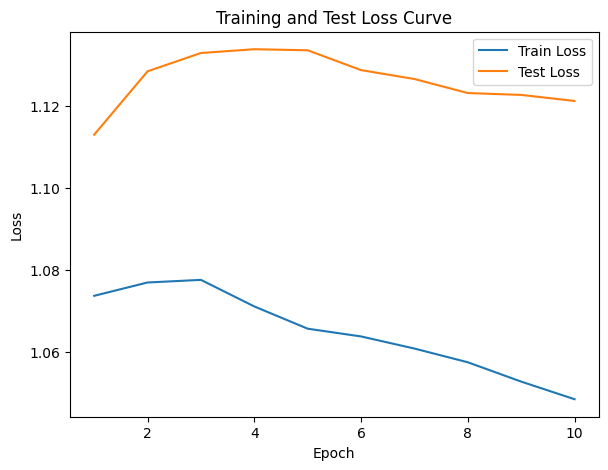

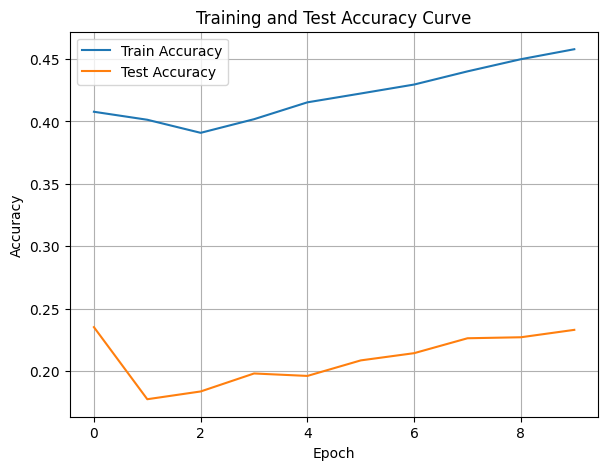

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.61it/s]

Epoch [1/10], Train F1:0.573427029216791, Train Loss: 1.0268, Train Acc: 0.5420, Test F1:0.6996979628558576, Test Loss: 1.0501, Test Acc: 0.6962


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.19it/s]

Epoch [2/10], Train F1:0.5714855883181674, Train Loss: 1.0270, Train Acc: 0.5452, Test F1:0.6998082666655342, Test Loss: 1.0379, Test Acc: 0.7188


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.30it/s]

Epoch [3/10], Train F1:0.5932159943093795, Train Loss: 1.0206, Train Acc: 0.5699, Test F1:0.7122018291497388, Test Loss: 1.0314, Test Acc: 0.7341


Training Process:  50%|█████     | 5/10 [00:00<00:00,  6.39it/s]

Epoch [4/10], Train F1:0.5920220188254967, Train Loss: 1.0196, Train Acc: 0.5719, Test F1:0.7181829540879368, Test Loss: 1.0234, Test Acc: 0.7418
Epoch [5/10], Train F1:0.6013720387755978, Train Loss: 1.0160, Train Acc: 0.5822, Test F1:0.7252551929405353, Test Loss: 1.0208, Test Acc: 0.7479


Training Process:  70%|███████   | 7/10 [00:01<00:00,  6.59it/s]

Epoch [6/10], Train F1:0.6092552814207913, Train Loss: 1.0115, Train Acc: 0.5881, Test F1:0.7321495517134016, Test Loss: 1.0191, Test Acc: 0.7533
Epoch [7/10], Train F1:0.6158219863627833, Train Loss: 1.0090, Train Acc: 0.5951, Test F1:0.7412711995945701, Test Loss: 1.0179, Test Acc: 0.7586


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.50it/s]

Epoch [8/10], Train F1:0.6223043529496708, Train Loss: 1.0056, Train Acc: 0.6036, Test F1:0.7486343824605208, Test Loss: 1.0149, Test Acc: 0.7660


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.01it/s]

Epoch [9/10], Train F1:0.6278607936478858, Train Loss: 1.0036, Train Acc: 0.6070, Test F1:0.7576910183124514, Test Loss: 1.0136, Test Acc: 0.7719


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.09it/s]


Epoch [10/10], Train F1:0.6344135680394437, Train Loss: 0.9991, Train Acc: 0.6158, Test F1:0.7588090828982021, Test Loss: 1.0104, Test Acc: 0.7741
Total Epochs: 10
Train loss start: 1.0121489763259888, Train loss end: 0.8345933556556702
Highest Mean Train Accuracy (over epoch): 0.6158035714285715
Test loss start: 1.0477619171142578, Test loss end: 0.9752206802368164
Highest mean Test Accuracy (over epoch): 0.7741319444444444


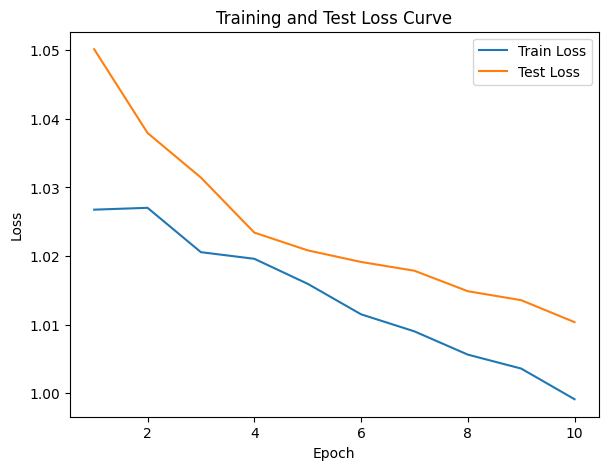

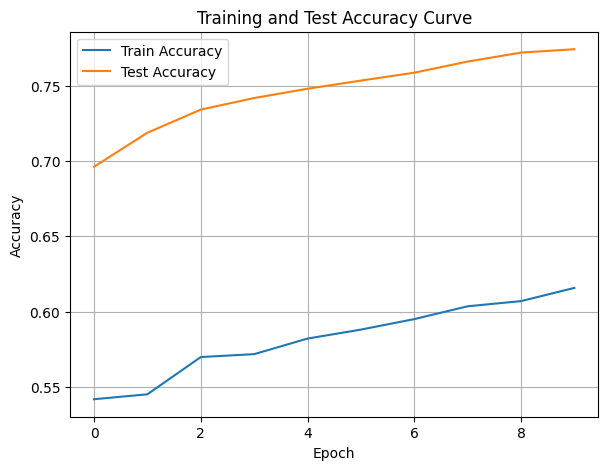

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.88it/s]

Epoch [1/10], Train F1:0.3785140897602904, Train Loss: 1.1050, Train Acc: 0.3095, Test F1:0.35980972483519175, Test Loss: 1.0928, Test Acc: 0.3733


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.69it/s]

Epoch [2/10], Train F1:0.381961512665738, Train Loss: 1.1045, Train Acc: 0.3190, Test F1:0.37120186358011203, Test Loss: 1.0857, Test Acc: 0.4076


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.84it/s]

Epoch [3/10], Train F1:0.3961782539639198, Train Loss: 1.1024, Train Acc: 0.3309, Test F1:0.38743012578984704, Test Loss: 1.0829, Test Acc: 0.4216


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.40it/s]

Epoch [4/10], Train F1:0.4140180208622405, Train Loss: 1.0960, Train Acc: 0.3464, Test F1:0.4122113264815381, Test Loss: 1.0799, Test Acc: 0.4403


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.10it/s]

Epoch [5/10], Train F1:0.42305477411768844, Train Loss: 1.0933, Train Acc: 0.3579, Test F1:0.4141189536373082, Test Loss: 1.0790, Test Acc: 0.4437


Training Process:  70%|███████   | 7/10 [00:01<00:00,  6.03it/s]

Epoch [6/10], Train F1:0.4340599506889728, Train Loss: 1.0901, Train Acc: 0.3671, Test F1:0.42163734431404026, Test Loss: 1.0768, Test Acc: 0.4512
Epoch [7/10], Train F1:0.43703301464291583, Train Loss: 1.0874, Train Acc: 0.3729, Test F1:0.43281000955250926, Test Loss: 1.0747, Test Acc: 0.4611


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.37it/s]

Epoch [8/10], Train F1:0.4433916018386084, Train Loss: 1.0845, Train Acc: 0.3781, Test F1:0.44887661584352484, Test Loss: 1.0729, Test Acc: 0.4723
Epoch [9/10], Train F1:0.4514426016020473, Train Loss: 1.0817, Train Acc: 0.3855, Test F1:0.46767520966788706, Test Loss: 1.0701, Test Acc: 0.4878


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.59it/s]


Epoch [10/10], Train F1:0.4606684894788956, Train Loss: 1.0782, Train Acc: 0.3942, Test F1:0.471585987458976, Test Loss: 1.0681, Test Acc: 0.4920
Total Epochs: 10
Train loss start: 1.1060420274734497, Train loss end: 1.0463930368423462
Highest Mean Train Accuracy (over epoch): 0.39419642857142856
Test loss start: 1.086795449256897, Test loss end: 1.0334744453430176
Highest mean Test Accuracy (over epoch): 0.4920138888888889


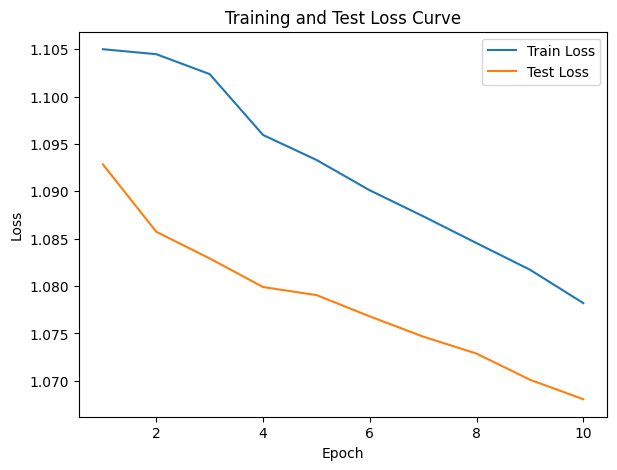

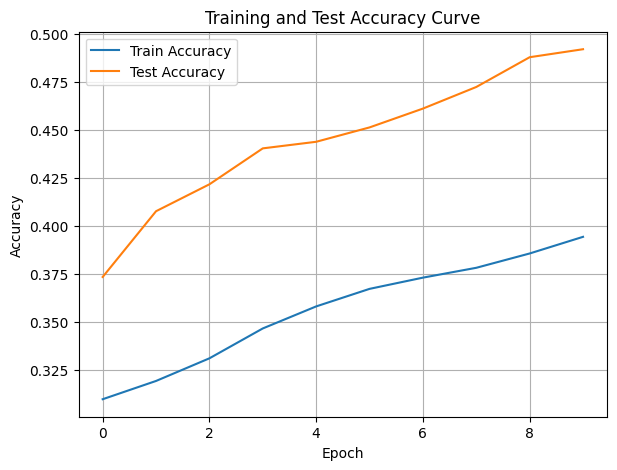

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  20%|██        | 2/10 [00:00<00:02,  3.64it/s]

Epoch [1/10], Train F1:0.48831255259858214, Train Loss: 1.0658, Train Acc: 0.4461, Test F1:0.4755003450655624, Test Loss: 1.0792, Test Acc: 0.4549
Epoch [2/10], Train F1:0.4943365980933717, Train Loss: 1.0696, Train Acc: 0.4513, Test F1:0.47085731249030155, Test Loss: 1.0770, Test Acc: 0.4440


Training Process:  40%|████      | 4/10 [00:00<00:01,  5.71it/s]

Epoch [3/10], Train F1:0.48187610771573497, Train Loss: 1.0697, Train Acc: 0.4413, Test F1:0.45669117041429874, Test Loss: 1.0727, Test Acc: 0.4340
Epoch [4/10], Train F1:0.48241411821248065, Train Loss: 1.0666, Train Acc: 0.4470, Test F1:0.4967377938915129, Test Loss: 1.0694, Test Acc: 0.4720


Training Process:  60%|██████    | 6/10 [00:01<00:00,  5.42it/s]

Epoch [5/10], Train F1:0.4859057384958988, Train Loss: 1.0627, Train Acc: 0.4508, Test F1:0.5217368551879326, Test Loss: 1.0664, Test Acc: 0.4948
Epoch [6/10], Train F1:0.4917788039762235, Train Loss: 1.0607, Train Acc: 0.4581, Test F1:0.5408913345812416, Test Loss: 1.0644, Test Acc: 0.5152


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.16it/s]

Epoch [7/10], Train F1:0.5000510951614714, Train Loss: 1.0568, Train Acc: 0.4682, Test F1:0.5592788971367973, Test Loss: 1.0625, Test Acc: 0.5368
Epoch [8/10], Train F1:0.5072713891969092, Train Loss: 1.0536, Train Acc: 0.4756, Test F1:0.5735477430644736, Test Loss: 1.0601, Test Acc: 0.5498


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.49it/s]


Epoch [9/10], Train F1:0.5119231458931641, Train Loss: 1.0495, Train Acc: 0.4801, Test F1:0.582810453911285, Test Loss: 1.0563, Test Acc: 0.5602
Epoch [10/10], Train F1:0.5121107354410038, Train Loss: 1.0468, Train Acc: 0.4811, Test F1:0.5938907961992642, Test Loss: 1.0531, Test Acc: 0.5718
Total Epochs: 10
Train loss start: 1.0463606119155884, Train loss end: 0.9552316069602966
Highest Mean Train Accuracy (over epoch): 0.4811309523809524
Test loss start: 1.0746369361877441, Test loss end: 1.0192179679870605
Highest mean Test Accuracy (over epoch): 0.5717881944444445


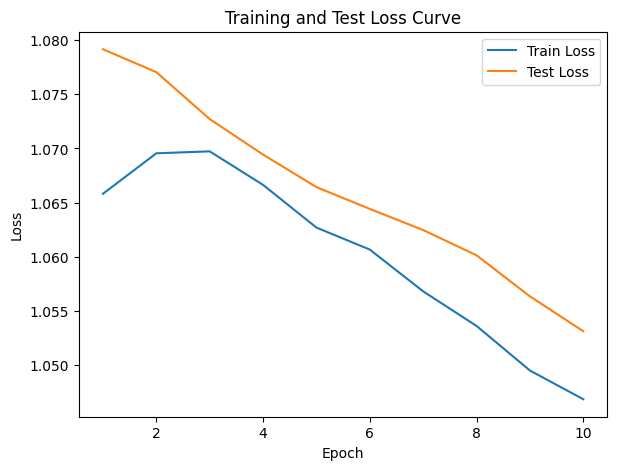

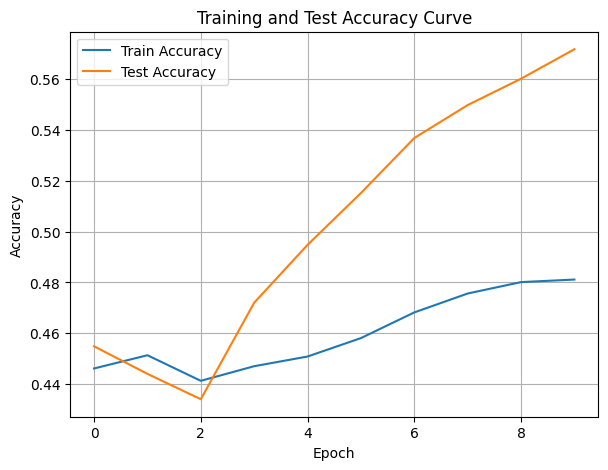

./saved_models/model_6.pth
Training Model with id 11
in multi


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.21it/s]

Epoch [1/10], Train F1:0.6155217916411947, Train Loss: 1.0064, Train Acc: 0.5815, Test F1:0.737972334682861, Test Loss: 1.0198, Test Acc: 0.7491
Epoch [2/10], Train F1:0.6237408595645051, Train Loss: 1.0023, Train Acc: 0.6027, Test F1:0.7647584734109094, Test Loss: 1.0207, Test Acc: 0.7726


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.71it/s]

Epoch [3/10], Train F1:0.6131641199141411, Train Loss: 1.0031, Train Acc: 0.5968, Test F1:0.7676917076648345, Test Loss: 1.0183, Test Acc: 0.7778
Epoch [4/10], Train F1:0.6107380604651157, Train Loss: 1.0051, Train Acc: 0.5917, Test F1:0.7576133140042914, Test Loss: 1.0172, Test Acc: 0.7602


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.01it/s]

Epoch [5/10], Train F1:0.6151678150585611, Train Loss: 0.9998, Train Acc: 0.5975, Test F1:0.7643701043485802, Test Loss: 1.0149, Test Acc: 0.7634
Epoch [6/10], Train F1:0.6237169165184652, Train Loss: 0.9961, Train Acc: 0.6083, Test F1:0.7743020752410683, Test Loss: 1.0108, Test Acc: 0.7740


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.97it/s]

Epoch [7/10], Train F1:0.6362314133926208, Train Loss: 0.9893, Train Acc: 0.6238, Test F1:0.7776988463578284, Test Loss: 1.0084, Test Acc: 0.7803
Epoch [8/10], Train F1:0.6383710597959474, Train Loss: 0.9866, Train Acc: 0.6274, Test F1:0.7832803585528473, Test Loss: 1.0059, Test Acc: 0.7869


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.82it/s]


Epoch [9/10], Train F1:0.6426908906192992, Train Loss: 0.9828, Train Acc: 0.6312, Test F1:0.7845447469122699, Test Loss: 1.0025, Test Acc: 0.7903
Epoch [10/10], Train F1:0.6451834159050035, Train Loss: 0.9809, Train Acc: 0.6347, Test F1:0.7848097028236982, Test Loss: 0.9999, Test Acc: 0.7923
Total Epochs: 10
Train loss start: 1.041471004486084, Train loss end: 0.9065103530883789
Highest Mean Train Accuracy (over epoch): 0.6346726190476191
Test loss start: 1.0162848234176636, Test loss end: 0.9665972590446472
Highest mean Test Accuracy (over epoch): 0.7922743055555556


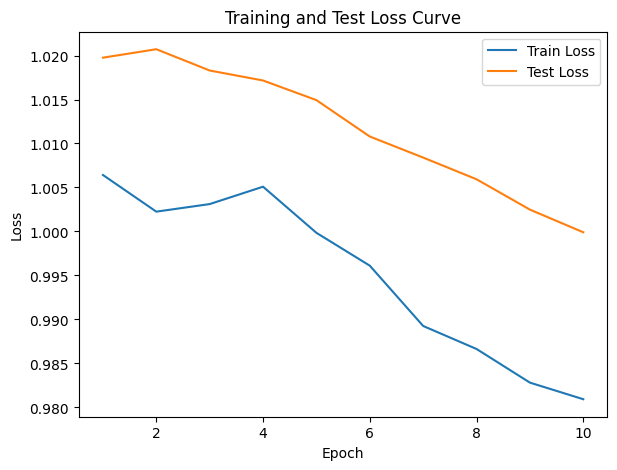

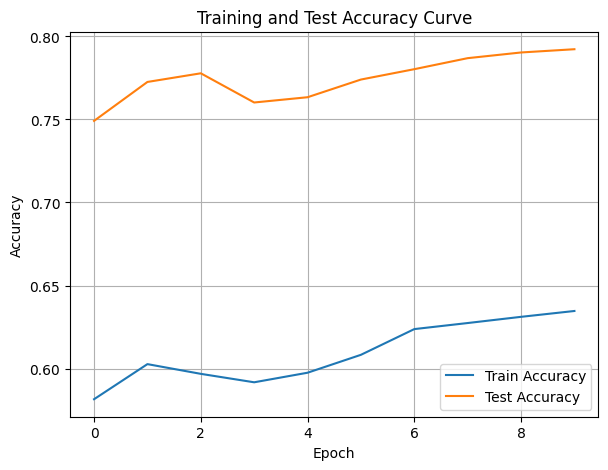

./saved_models/model_11.pth
Training Model with id 9
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.80it/s]

Epoch [1/10], Train F1:0.7092150687032432, Train Loss: 0.9407, Train Acc: 0.7176, Test F1:0.848951647411211, Test Loss: 0.9715, Test Acc: 0.8568
Epoch [2/10], Train F1:0.708009108009108, Train Loss: 0.9423, Train Acc: 0.7138, Test F1:0.8384395331763752, Test Loss: 0.9644, Test Acc: 0.8490


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.80it/s]

Epoch [3/10], Train F1:0.7137249992900337, Train Loss: 0.9362, Train Acc: 0.7217, Test F1:0.8277456174443103, Test Loss: 0.9629, Test Acc: 0.8411


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.60it/s]

Epoch [4/10], Train F1:0.7145318797986702, Train Loss: 0.9382, Train Acc: 0.7172, Test F1:0.8223268197594258, Test Loss: 0.9618, Test Acc: 0.8357


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.60it/s]

Epoch [5/10], Train F1:0.7174672718420776, Train Loss: 0.9370, Train Acc: 0.7204, Test F1:0.8190516730062802, Test Loss: 0.9623, Test Acc: 0.8337


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.38it/s]

Epoch [6/10], Train F1:0.7137700265726438, Train Loss: 0.9376, Train Acc: 0.7162, Test F1:0.8241385568671721, Test Loss: 0.9602, Test Acc: 0.8375


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.21it/s]

Epoch [7/10], Train F1:0.7241641533348963, Train Loss: 0.9317, Train Acc: 0.7264, Test F1:0.8292848906250896, Test Loss: 0.9588, Test Acc: 0.8414
Epoch [8/10], Train F1:0.7231599664823881, Train Loss: 0.9306, Train Acc: 0.7266, Test F1:0.830436774485415, Test Loss: 0.9561, Test Acc: 0.8423


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.49it/s]


Epoch [9/10], Train F1:0.7240540743355671, Train Loss: 0.9276, Train Acc: 0.7283, Test F1:0.8277456174443104, Test Loss: 0.9548, Test Acc: 0.8405
Epoch [10/10], Train F1:0.7256898444861443, Train Loss: 0.9259, Train Acc: 0.7299, Test F1:0.8277456174443103, Test Loss: 0.9529, Test Acc: 0.8405
Total Epochs: 10
Train loss start: 0.9698474407196045, Train loss end: 0.8774842023849487
Highest Mean Train Accuracy (over epoch): 0.7298511904761905
Test loss start: 0.9664766788482666, Test loss end: 0.9294357299804688
Highest mean Test Accuracy (over epoch): 0.8567708333333334


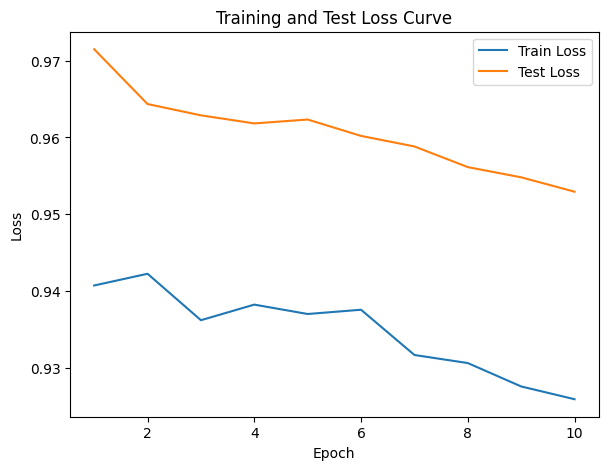

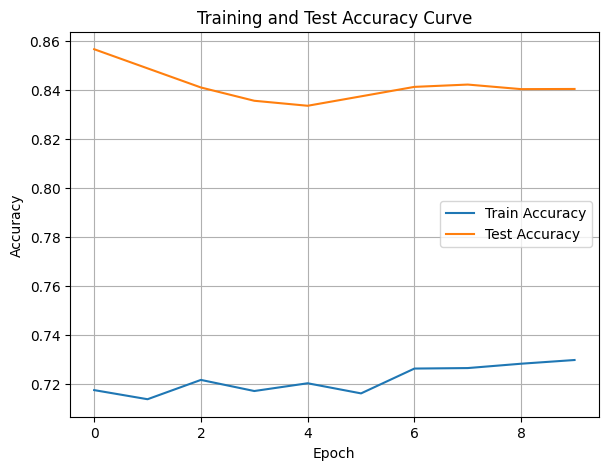

./saved_models/model_9.pth
Training Model with id 12
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.7703433470964586, Train Loss: 0.8920, Train Acc: 0.7673, Test F1:0.8057644110275689, Test Loss: 0.9269, Test Acc: 0.8255


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.80it/s]

Epoch [2/10], Train F1:0.7650349140599927, Train Loss: 0.8932, Train Acc: 0.7722, Test F1:0.8168580871044796, Test Loss: 0.9244, Test Acc: 0.8333


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.80it/s]

Epoch [3/10], Train F1:0.7705222055428769, Train Loss: 0.8888, Train Acc: 0.7751, Test F1:0.8168580871044796, Test Loss: 0.9243, Test Acc: 0.8333


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.51it/s]

Epoch [4/10], Train F1:0.780570501548911, Train Loss: 0.8850, Train Acc: 0.7796, Test F1:0.8168580871044796, Test Loss: 0.9210, Test Acc: 0.8333


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.51it/s]

Epoch [5/10], Train F1:0.78297583120094, Train Loss: 0.8816, Train Acc: 0.7849, Test F1:0.8212371181971845, Test Loss: 0.9198, Test Acc: 0.8365


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.28it/s]

Epoch [6/10], Train F1:0.7833195850393427, Train Loss: 0.8783, Train Acc: 0.7866, Test F1:0.8205095347063313, Test Loss: 0.9188, Test Acc: 0.8359
Epoch [7/10], Train F1:0.7870972375716208, Train Loss: 0.8735, Train Acc: 0.7920, Test F1:0.8199892832554176, Test Loss: 0.9172, Test Acc: 0.8356


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.05it/s]

Epoch [8/10], Train F1:0.7847995338995941, Train Loss: 0.8726, Train Acc: 0.7908, Test F1:0.8223268197594258, Test Loss: 0.9159, Test Acc: 0.8372


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.01it/s]

Epoch [9/10], Train F1:0.7871695523877916, Train Loss: 0.8719, Train Acc: 0.7925, Test F1:0.824138556867172, Test Loss: 0.9136, Test Acc: 0.8385
Epoch [10/10], Train F1:0.7896075890500918, Train Loss: 0.8701, Train Acc: 0.7928, Test F1:0.8277456174443103, Test Loss: 0.9106, Test Acc: 0.8411


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.83it/s]

Total Epochs: 10
Train loss start: 0.8719366788864136, Train loss end: 1.0450876951217651
Highest Mean Train Accuracy (over epoch): 0.7927678571428572
Test loss start: 0.9222496151924133, Test loss end: 0.888800859451294
Highest mean Test Accuracy (over epoch): 0.8411458333333334


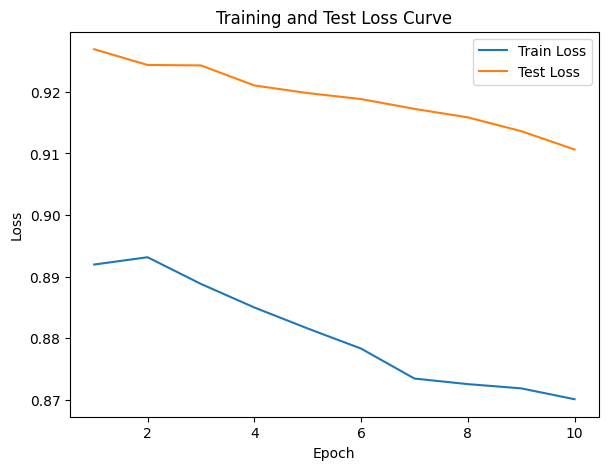

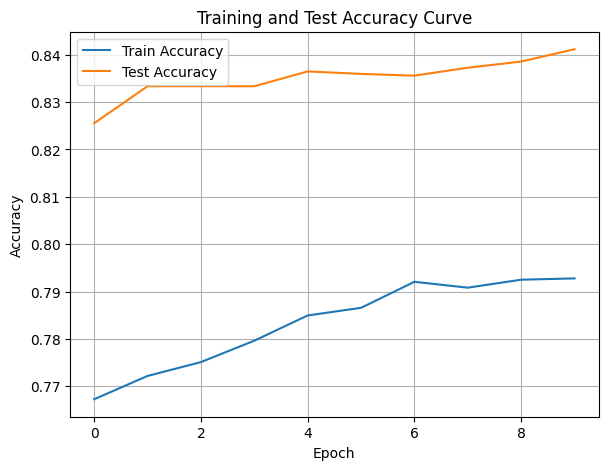

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.07it/s]

Epoch [1/10], Train F1:0.8280417391620368, Train Loss: 0.8464, Train Acc: 0.8289, Test F1:0.848951647411211, Test Loss: 0.8982, Test Acc: 0.8568


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.79it/s]

Epoch [2/10], Train F1:0.8187184908817561, Train Loss: 0.8427, Train Acc: 0.8269, Test F1:0.8437176036086195, Test Loss: 0.8875, Test Acc: 0.8529


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.77it/s]

Epoch [3/10], Train F1:0.8077077601568732, Train Loss: 0.8438, Train Acc: 0.8187, Test F1:0.8524172307238872, Test Loss: 0.8851, Test Acc: 0.8594


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.91it/s]

Epoch [4/10], Train F1:0.8074840736494872, Train Loss: 0.8431, Train Acc: 0.8165, Test F1:0.8541430384153257, Test Loss: 0.8850, Test Acc: 0.8607


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.47it/s]

Epoch [5/10], Train F1:0.8110083810581022, Train Loss: 0.8387, Train Acc: 0.8182, Test F1:0.8592931124413205, Test Loss: 0.8828, Test Acc: 0.8646


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.44it/s]

Epoch [6/10], Train F1:0.8109361162534602, Train Loss: 0.8385, Train Acc: 0.8172, Test F1:0.8524172307238872, Test Loss: 0.8814, Test Acc: 0.8594


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.66it/s]

Epoch [7/10], Train F1:0.8060753966639504, Train Loss: 0.8374, Train Acc: 0.8134, Test F1:0.848951647411211, Test Loss: 0.8812, Test Acc: 0.8568


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.11it/s]

Epoch [8/10], Train F1:0.8072087252119455, Train Loss: 0.8353, Train Acc: 0.8156, Test F1:0.8463400420650515, Test Loss: 0.8801, Test Acc: 0.8548


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.20it/s]

Epoch [9/10], Train F1:0.8073403505261223, Train Loss: 0.8324, Train Acc: 0.8160, Test F1:0.8431333509964616, Test Loss: 0.8780, Test Acc: 0.8524


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.57it/s]


Epoch [10/10], Train F1:0.809329338404603, Train Loss: 0.8300, Train Acc: 0.8186, Test F1:0.8405561340983035, Test Loss: 0.8769, Test Acc: 0.8505
Total Epochs: 10
Train loss start: 0.8251516819000244, Train loss end: 0.7332468032836914
Highest Mean Train Accuracy (over epoch): 0.8288690476190476
Test loss start: 0.89058518409729, Test loss end: 0.8629577159881592
Highest mean Test Accuracy (over epoch): 0.8645833333333334


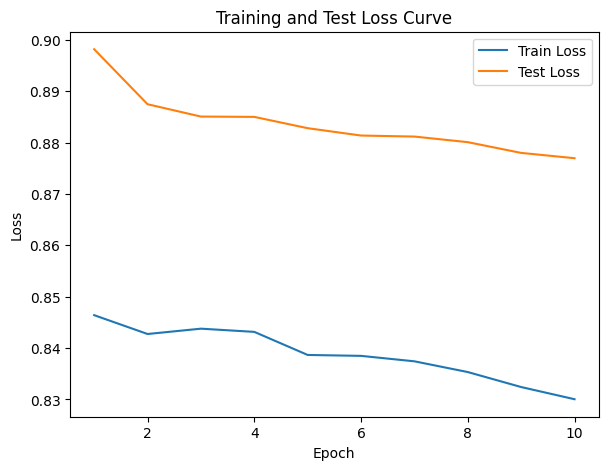

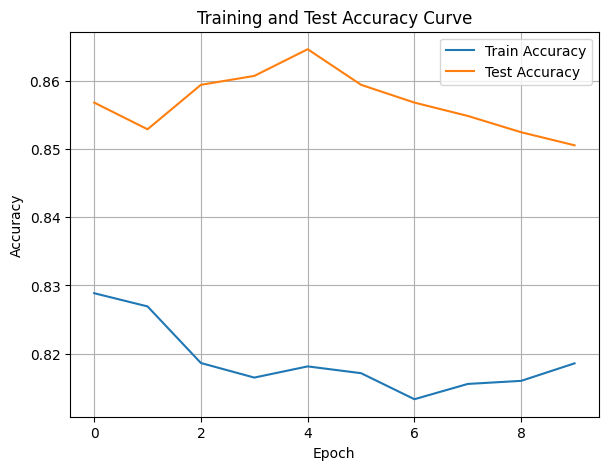

./saved_models/model_10.pth
Training Model with id 8
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.8246558039661487, Train Loss: 0.8012, Train Acc: 0.8321, Test F1:0.8168580871044796, Test Loss: 0.8620, Test Acc: 0.8333


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.11it/s]

Epoch [2/10], Train F1:0.8311605751656436, Train Loss: 0.8037, Train Acc: 0.8262, Test F1:0.8223268197594258, Test Loss: 0.8565, Test Acc: 0.8372


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.11it/s]

Epoch [3/10], Train F1:0.8271542163104368, Train Loss: 0.8032, Train Acc: 0.8261, Test F1:0.8131837408415308, Test Loss: 0.8538, Test Acc: 0.8287


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.76it/s]

Epoch [4/10], Train F1:0.8228896781129643, Train Loss: 0.8017, Train Acc: 0.8240, Test F1:0.830436774485415, Test Loss: 0.8532, Test Acc: 0.8416


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.79it/s]

Epoch [5/10], Train F1:0.8268085853966863, Train Loss: 0.8006, Train Acc: 0.8270, Test F1:0.8426655563017613, Test Loss: 0.8511, Test Acc: 0.8521


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.79it/s]

Epoch [6/10], Train F1:0.8276781206402901, Train Loss: 0.8012, Train Acc: 0.8264, Test F1:0.8506867835453797, Test Loss: 0.8486, Test Acc: 0.8591


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.88it/s]

Epoch [7/10], Train F1:0.8289461002364955, Train Loss: 0.8004, Train Acc: 0.8287, Test F1:0.8563551956377243, Test Loss: 0.8486, Test Acc: 0.8641


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.88it/s]

Epoch [8/10], Train F1:0.8253242459173107, Train Loss: 0.7996, Train Acc: 0.8272, Test F1:0.8605743282156173, Test Loss: 0.8481, Test Acc: 0.8678


Training Process:  90%|█████████ | 9/10 [00:00<00:00, 10.24it/s]

Epoch [9/10], Train F1:0.8296312997164004, Train Loss: 0.7964, Train Acc: 0.8317, Test F1:0.8649685378788156, Test Loss: 0.8469, Test Acc: 0.8716
Epoch [10/10], Train F1:0.8301151841276501, Train Loss: 0.7960, Train Acc: 0.8318, Test F1:0.86542048982844, Test Loss: 0.8450, Test Acc: 0.8723


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.20it/s]


Total Epochs: 10
Train loss start: 0.7859346270561218, Train loss end: 0.8050545454025269
Highest Mean Train Accuracy (over epoch): 0.8321428571428572
Test loss start: 0.8550389409065247, Test loss end: 0.8319517970085144
Highest mean Test Accuracy (over epoch): 0.8723090277777779


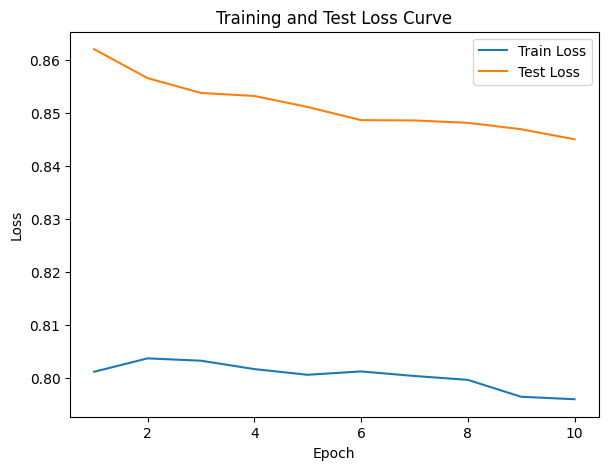

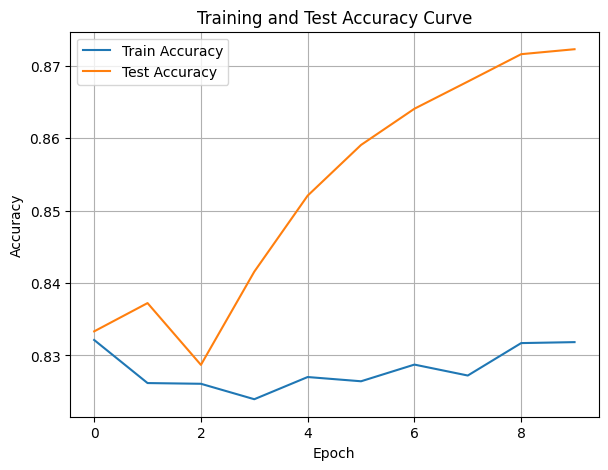

./saved_models/model_8.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [48]:
DTEmlp6b.train_DTE()

Training Process:   0%|          | 0/110 [00:00<?, ?it/s]

Epoch [1/110], Train F1:0.3478174363749837, Train Loss: 1.1130, Train Acc: 0.3235, Test F1:0.4826239511823035, Test Loss: 1.0716, Test Acc: 0.5547


Training Process:   2%|▏         | 2/110 [00:00<00:08, 12.30it/s]

Epoch [2/110], Train F1:0.3827055806716823, Train Loss: 1.1054, Train Acc: 0.3525, Test F1:0.4804108574278985, Test Loss: 1.0721, Test Acc: 0.5538
Epoch [3/110], Train F1:0.39802600403351346, Train Loss: 1.1033, Train Acc: 0.3604, Test F1:0.4845425773982908, Test Loss: 1.0708, Test Acc: 0.5613


Training Process:   4%|▎         | 4/110 [00:00<00:09, 11.76it/s]

Epoch [4/110], Train F1:0.40746689570551137, Train Loss: 1.1005, Train Acc: 0.3733, Test F1:0.48668388890618036, Test Loss: 1.0675, Test Acc: 0.5666


Training Process:   4%|▎         | 4/110 [00:00<00:09, 11.76it/s]

Epoch [5/110], Train F1:0.4150565285311421, Train Loss: 1.0959, Train Acc: 0.3842, Test F1:0.491776541312145, Test Loss: 1.0610, Test Acc: 0.5760


Training Process:   5%|▌         | 6/110 [00:00<00:09, 11.36it/s]

Epoch [6/110], Train F1:0.41371118910313626, Train Loss: 1.0945, Train Acc: 0.3846, Test F1:0.4927664696746485, Test Loss: 1.0589, Test Acc: 0.5774


Training Process:   5%|▌         | 6/110 [00:00<00:09, 11.36it/s]

Epoch [7/110], Train F1:0.41860124231470464, Train Loss: 1.0919, Train Acc: 0.3906, Test F1:0.49845979457143147, Test Loss: 1.0570, Test Acc: 0.5837


Training Process:   7%|▋         | 8/110 [00:00<00:09, 10.83it/s]

Epoch [8/110], Train F1:0.4229164780784902, Train Loss: 1.0899, Train Acc: 0.3957, Test F1:0.5034454105552802, Test Loss: 1.0563, Test Acc: 0.5875


Training Process:   7%|▋         | 8/110 [00:00<00:09, 10.83it/s]

Epoch [9/110], Train F1:0.4282877748196834, Train Loss: 1.0868, Train Acc: 0.4005, Test F1:0.5047549149255047, Test Loss: 1.0544, Test Acc: 0.5912


Training Process:   9%|▉         | 10/110 [00:00<00:10,  9.35it/s]

Epoch [10/110], Train F1:0.4344464111397693, Train Loss: 1.0835, Train Acc: 0.4072, Test F1:0.5063455405153733, Test Loss: 1.0509, Test Acc: 0.5944


Training Process:  10%|█         | 11/110 [00:01<00:10,  9.08it/s]

Epoch [11/110], Train F1:0.44384473057003926, Train Loss: 1.0793, Train Acc: 0.4175, Test F1:0.5073464377824629, Test Loss: 1.0475, Test Acc: 0.5976


Training Process:  11%|█         | 12/110 [00:01<00:11,  8.71it/s]

Epoch [12/110], Train F1:0.45001167196875047, Train Loss: 1.0757, Train Acc: 0.4250, Test F1:0.509229234956143, Test Loss: 1.0435, Test Acc: 0.6021


Training Process:  12%|█▏        | 13/110 [00:01<00:11,  8.39it/s]

Epoch [13/110], Train F1:0.45846441867607524, Train Loss: 1.0718, Train Acc: 0.4354, Test F1:0.5104653840646829, Test Loss: 1.0407, Test Acc: 0.6048


Training Process:  13%|█▎        | 14/110 [00:01<00:11,  8.38it/s]

Epoch [14/110], Train F1:0.46627694307709583, Train Loss: 1.0681, Train Acc: 0.4437, Test F1:0.5118387689444786, Test Loss: 1.0378, Test Acc: 0.6081


Training Process:  14%|█▎        | 15/110 [00:01<00:11,  8.38it/s]

Epoch [15/110], Train F1:0.4728557824496354, Train Loss: 1.0656, Train Acc: 0.4514, Test F1:0.512840312121668, Test Loss: 1.0350, Test Acc: 0.6109


Training Process:  15%|█▍        | 16/110 [00:01<00:12,  7.80it/s]

Epoch [16/110], Train F1:0.47960159766162713, Train Loss: 1.0620, Train Acc: 0.4585, Test F1:0.5148633734381263, Test Loss: 1.0315, Test Acc: 0.6143


Training Process:  16%|█▋        | 18/110 [00:02<00:13,  6.84it/s]

Epoch [17/110], Train F1:0.48633049016643914, Train Loss: 1.0587, Train Acc: 0.4679, Test F1:0.5155627066684128, Test Loss: 1.0290, Test Acc: 0.6165
Epoch [18/110], Train F1:0.4953271120494584, Train Loss: 1.0551, Train Acc: 0.4768, Test F1:0.5161811013204202, Test Loss: 1.0261, Test Acc: 0.6184


Training Process:  18%|█▊        | 20/110 [00:02<00:13,  6.78it/s]

Epoch [19/110], Train F1:0.501641927428232, Train Loss: 1.0524, Train Acc: 0.4831, Test F1:0.5210457187041307, Test Loss: 1.0242, Test Acc: 0.6224
Epoch [20/110], Train F1:0.506999567215045, Train Loss: 1.0491, Train Acc: 0.4890, Test F1:0.5231657240321839, Test Loss: 1.0219, Test Acc: 0.6252


Training Process:  20%|██        | 22/110 [00:02<00:12,  6.95it/s]

Epoch [21/110], Train F1:0.5144899784990365, Train Loss: 1.0455, Train Acc: 0.4973, Test F1:0.5268206681337553, Test Loss: 1.0195, Test Acc: 0.6285
Epoch [22/110], Train F1:0.5208190802322863, Train Loss: 1.0419, Train Acc: 0.5037, Test F1:0.5310802626736743, Test Loss: 1.0175, Test Acc: 0.6319


Training Process:  22%|██▏       | 24/110 [00:02<00:13,  6.61it/s]

Epoch [23/110], Train F1:0.5267985701466013, Train Loss: 1.0389, Train Acc: 0.5096, Test F1:0.536514865372035, Test Loss: 1.0154, Test Acc: 0.6356
Epoch [24/110], Train F1:0.5333428857479224, Train Loss: 1.0364, Train Acc: 0.5158, Test F1:0.5428267750502851, Test Loss: 1.0136, Test Acc: 0.6399


Training Process:  24%|██▎       | 26/110 [00:03<00:13,  6.24it/s]

Epoch [25/110], Train F1:0.5384934410875292, Train Loss: 1.0332, Train Acc: 0.5220, Test F1:0.5464660175357198, Test Loss: 1.0114, Test Acc: 0.6427
Epoch [26/110], Train F1:0.5436235436781858, Train Loss: 1.0300, Train Acc: 0.5285, Test F1:0.5525013793149932, Test Loss: 1.0092, Test Acc: 0.6468


Training Process:  25%|██▍       | 27/110 [00:03<00:14,  5.68it/s]

Epoch [27/110], Train F1:0.5480272650254252, Train Loss: 1.0274, Train Acc: 0.5326, Test F1:0.5580370519028575, Test Loss: 1.0071, Test Acc: 0.6505


Training Process:  26%|██▋       | 29/110 [00:03<00:14,  5.66it/s]

Epoch [28/110], Train F1:0.5540701531918254, Train Loss: 1.0243, Train Acc: 0.5394, Test F1:0.5637436878687134, Test Loss: 1.0045, Test Acc: 0.6542
Epoch [29/110], Train F1:0.559957989064921, Train Loss: 1.0210, Train Acc: 0.5458, Test F1:0.5695915356074353, Test Loss: 1.0023, Test Acc: 0.6580


Training Process:  28%|██▊       | 31/110 [00:04<00:13,  6.03it/s]

Epoch [30/110], Train F1:0.5656278046489837, Train Loss: 1.0179, Train Acc: 0.5521, Test F1:0.5744391281233386, Test Loss: 1.0000, Test Acc: 0.6612
Epoch [31/110], Train F1:0.5705992880913806, Train Loss: 1.0146, Train Acc: 0.5581, Test F1:0.5794744917097328, Test Loss: 0.9975, Test Acc: 0.6645


Training Process:  30%|███       | 33/110 [00:04<00:11,  6.44it/s]

Epoch [32/110], Train F1:0.5750950850584683, Train Loss: 1.0118, Train Acc: 0.5631, Test F1:0.5836417123457769, Test Loss: 0.9953, Test Acc: 0.6673
Epoch [33/110], Train F1:0.5811701124702213, Train Loss: 1.0086, Train Acc: 0.5690, Test F1:0.5880255709727074, Test Loss: 0.9929, Test Acc: 0.6702


Training Process:  32%|███▏      | 35/110 [00:04<00:11,  6.66it/s]

Epoch [34/110], Train F1:0.5862709204121416, Train Loss: 1.0055, Train Acc: 0.5743, Test F1:0.5925985160750338, Test Loss: 0.9905, Test Acc: 0.6732
Epoch [35/110], Train F1:0.5906576160728692, Train Loss: 1.0028, Train Acc: 0.5791, Test F1:0.5968771708324019, Test Loss: 0.9880, Test Acc: 0.6760


Epoch [36/110], Train F1:0.5946702962163818, Train Loss: 0.9999, Train Acc: 0.5835, Test F1:0.6010603102510274, Test Loss: 0.9855, Test Acc: 0.6788


Training Process:  35%|███▍      | 38/110 [00:05<00:12,  5.77it/s]

Epoch [37/110], Train F1:0.5987444816546718, Train Loss: 0.9974, Train Acc: 0.5875, Test F1:0.6048268233083354, Test Loss: 0.9834, Test Acc: 0.6813
Epoch [38/110], Train F1:0.6031585845555231, Train Loss: 0.9948, Train Acc: 0.5916, Test F1:0.6083724801391985, Test Loss: 0.9813, Test Acc: 0.6837


Training Process:  36%|███▋      | 40/110 [00:05<00:11,  5.85it/s]

Epoch [39/110], Train F1:0.6067501922998876, Train Loss: 0.9920, Train Acc: 0.5961, Test F1:0.6117162380455784, Test Loss: 0.9793, Test Acc: 0.6859
Epoch [40/110], Train F1:0.610969421159495, Train Loss: 0.9890, Train Acc: 0.6008, Test F1:0.6148749369920948, Test Loss: 0.9770, Test Acc: 0.6880


Training Process:  38%|███▊      | 42/110 [00:06<00:11,  5.86it/s]

Epoch [41/110], Train F1:0.6145516193590236, Train Loss: 0.9863, Train Acc: 0.6044, Test F1:0.6178635881133067, Test Loss: 0.9748, Test Acc: 0.6901
Epoch [42/110], Train F1:0.6184276521540271, Train Loss: 0.9834, Train Acc: 0.6088, Test F1:0.6208487647236228, Test Loss: 0.9726, Test Acc: 0.6922


Training Process:  39%|███▉      | 43/110 [00:06<00:11,  5.89it/s]

Epoch [43/110], Train F1:0.6219921167133459, Train Loss: 0.9807, Train Acc: 0.6127, Test F1:0.6236839196586805, Test Loss: 0.9706, Test Acc: 0.6942


Training Process:  40%|████      | 44/110 [00:06<00:12,  5.25it/s]

Epoch [44/110], Train F1:0.6259458705260711, Train Loss: 0.9780, Train Acc: 0.6169, Test F1:0.6270723753703484, Test Loss: 0.9687, Test Acc: 0.6965


Training Process:  41%|████      | 45/110 [00:06<00:12,  5.32it/s]

Epoch [45/110], Train F1:0.6297396965161716, Train Loss: 0.9752, Train Acc: 0.6211, Test F1:0.6299580221873663, Test Loss: 0.9668, Test Acc: 0.6985


Training Process:  42%|████▏     | 46/110 [00:06<00:12,  5.30it/s]

Epoch [46/110], Train F1:0.6336148504359754, Train Loss: 0.9724, Train Acc: 0.6250, Test F1:0.6323794118596086, Test Loss: 0.9647, Test Acc: 0.7002


Training Process:  43%|████▎     | 47/110 [00:07<00:12,  5.19it/s]

Epoch [47/110], Train F1:0.637411325348543, Train Loss: 0.9698, Train Acc: 0.6289, Test F1:0.6346904309906064, Test Loss: 0.9628, Test Acc: 0.7019


Training Process:  44%|████▎     | 48/110 [00:07<00:12,  5.06it/s]

Epoch [48/110], Train F1:0.6408500689903813, Train Loss: 0.9672, Train Acc: 0.6326, Test F1:0.6368984753931097, Test Loss: 0.9608, Test Acc: 0.7035


Training Process:  45%|████▍     | 49/110 [00:07<00:12,  4.87it/s]

Epoch [49/110], Train F1:0.6442014330415312, Train Loss: 0.9645, Train Acc: 0.6359, Test F1:0.6390102931439527, Test Loss: 0.9587, Test Acc: 0.7050


Training Process:  45%|████▌     | 50/110 [00:07<00:12,  4.82it/s]

Epoch [50/110], Train F1:0.6475027686935546, Train Loss: 0.9618, Train Acc: 0.6395, Test F1:0.6410320541107434, Test Loss: 0.9566, Test Acc: 0.7065


Training Process:  46%|████▋     | 51/110 [00:07<00:13,  4.29it/s]

Epoch [51/110], Train F1:0.6499111185441606, Train Loss: 0.9595, Train Acc: 0.6420, Test F1:0.6429694106961797, Test Loss: 0.9545, Test Acc: 0.7079


Training Process:  47%|████▋     | 52/110 [00:08<00:12,  4.47it/s]

Epoch [52/110], Train F1:0.652677604334186, Train Loss: 0.9570, Train Acc: 0.6449, Test F1:0.6448275510695161, Test Loss: 0.9525, Test Acc: 0.7093


Epoch [53/110], Train F1:0.6563558610512576, Train Loss: 0.9541, Train Acc: 0.6487, Test F1:0.6471669265608178, Test Loss: 0.9504, Test Acc: 0.7109


Training Process:  50%|█████     | 55/110 [00:08<00:10,  5.09it/s]

Epoch [54/110], Train F1:0.6594560428186943, Train Loss: 0.9516, Train Acc: 0.6517, Test F1:0.6488687515627138, Test Loss: 0.9485, Test Acc: 0.7121
Epoch [55/110], Train F1:0.6623844980893396, Train Loss: 0.9492, Train Acc: 0.6549, Test F1:0.650771124695937, Test Loss: 0.9467, Test Acc: 0.7135


Training Process:  51%|█████     | 56/110 [00:08<00:10,  5.20it/s]

Epoch [56/110], Train F1:0.6649072007956702, Train Loss: 0.9470, Train Acc: 0.6576, Test F1:0.6531212962724383, Test Loss: 0.9450, Test Acc: 0.7150


Training Process:  52%|█████▏    | 57/110 [00:09<00:10,  5.14it/s]

Epoch [57/110], Train F1:0.6677239610469797, Train Loss: 0.9444, Train Acc: 0.6607, Test F1:0.6546166913181601, Test Loss: 0.9432, Test Acc: 0.7162


Training Process:  53%|█████▎    | 58/110 [00:09<00:10,  4.96it/s]

Epoch [58/110], Train F1:0.6705655361867102, Train Loss: 0.9419, Train Acc: 0.6638, Test F1:0.6565574420825331, Test Loss: 0.9414, Test Acc: 0.7175


Training Process:  54%|█████▎    | 59/110 [00:09<00:11,  4.62it/s]

Epoch [59/110], Train F1:0.6734857926666143, Train Loss: 0.9395, Train Acc: 0.6666, Test F1:0.6589162757714508, Test Loss: 0.9398, Test Acc: 0.7191


Training Process:  55%|█████▍    | 60/110 [00:09<00:10,  4.64it/s]

Epoch [60/110], Train F1:0.6761236279820985, Train Loss: 0.9373, Train Acc: 0.6694, Test F1:0.6607090906102961, Test Loss: 0.9381, Test Acc: 0.7203


Training Process:  55%|█████▌    | 61/110 [00:09<00:10,  4.64it/s]

Epoch [61/110], Train F1:0.6787251515601892, Train Loss: 0.9350, Train Acc: 0.6722, Test F1:0.6631431425708633, Test Loss: 0.9365, Test Acc: 0.7219


Training Process:  56%|█████▋    | 62/110 [00:10<00:10,  4.59it/s]

Epoch [62/110], Train F1:0.6813023970566293, Train Loss: 0.9327, Train Acc: 0.6746, Test F1:0.6652596008536489, Test Loss: 0.9347, Test Acc: 0.7233


Training Process:  57%|█████▋    | 63/110 [00:10<00:10,  4.69it/s]

Epoch [63/110], Train F1:0.6839433350989054, Train Loss: 0.9302, Train Acc: 0.6775, Test F1:0.6668508677423824, Test Loss: 0.9331, Test Acc: 0.7245


Training Process:  58%|█████▊    | 64/110 [00:10<00:09,  4.74it/s]

Epoch [64/110], Train F1:0.6869516955627881, Train Loss: 0.9279, Train Acc: 0.6805, Test F1:0.6681672043291615, Test Loss: 0.9315, Test Acc: 0.7254


Training Process:  59%|█████▉    | 65/110 [00:10<00:09,  4.68it/s]

Epoch [65/110], Train F1:0.6896385751688715, Train Loss: 0.9257, Train Acc: 0.6831, Test F1:0.6700939059192677, Test Loss: 0.9297, Test Acc: 0.7267


Training Process:  60%|██████    | 66/110 [00:11<00:09,  4.63it/s]

Epoch [66/110], Train F1:0.6922925854975451, Train Loss: 0.9233, Train Acc: 0.6858, Test F1:0.6715293352541639, Test Loss: 0.9280, Test Acc: 0.7278


Training Process:  61%|██████    | 67/110 [00:11<00:10,  4.18it/s]

Epoch [67/110], Train F1:0.6945318078092405, Train Loss: 0.9213, Train Acc: 0.6881, Test F1:0.6733389879189993, Test Loss: 0.9262, Test Acc: 0.7290


Training Process:  62%|██████▏   | 68/110 [00:11<00:10,  4.10it/s]

Epoch [68/110], Train F1:0.6966866522016708, Train Loss: 0.9192, Train Acc: 0.6903, Test F1:0.6746780258048864, Test Loss: 0.9246, Test Acc: 0.7299


Training Process:  63%|██████▎   | 69/110 [00:11<00:10,  4.03it/s]

Epoch [69/110], Train F1:0.6984568782552046, Train Loss: 0.9173, Train Acc: 0.6921, Test F1:0.6761786036677162, Test Loss: 0.9230, Test Acc: 0.7310


Training Process:  64%|██████▎   | 70/110 [00:12<00:09,  4.06it/s]

Epoch [70/110], Train F1:0.700371775790297, Train Loss: 0.9153, Train Acc: 0.6941, Test F1:0.6776330380381507, Test Loss: 0.9215, Test Acc: 0.7320


Training Process:  65%|██████▍   | 71/110 [00:12<00:09,  4.25it/s]

Epoch [71/110], Train F1:0.7022683854744735, Train Loss: 0.9134, Train Acc: 0.6959, Test F1:0.678847293425802, Test Loss: 0.9200, Test Acc: 0.7329


Training Process:  65%|██████▌   | 72/110 [00:12<00:08,  4.46it/s]

Epoch [72/110], Train F1:0.7038194466505097, Train Loss: 0.9116, Train Acc: 0.6976, Test F1:0.6807974415036272, Test Loss: 0.9185, Test Acc: 0.7342


Training Process:  66%|██████▋   | 73/110 [00:12<00:08,  4.56it/s]

Epoch [73/110], Train F1:0.7061039797995268, Train Loss: 0.9095, Train Acc: 0.7000, Test F1:0.6832562379661332, Test Loss: 0.9170, Test Acc: 0.7357


Training Process:  67%|██████▋   | 74/110 [00:12<00:08,  4.36it/s]

Epoch [74/110], Train F1:0.7084422538539077, Train Loss: 0.9075, Train Acc: 0.7023, Test F1:0.684894538696797, Test Loss: 0.9155, Test Acc: 0.7369


Training Process:  68%|██████▊   | 75/110 [00:13<00:08,  4.35it/s]

Epoch [75/110], Train F1:0.7107211330515486, Train Loss: 0.9054, Train Acc: 0.7046, Test F1:0.6866681252062505, Test Loss: 0.9140, Test Acc: 0.7380


Training Process:  69%|██████▉   | 76/110 [00:13<00:08,  4.22it/s]

Epoch [76/110], Train F1:0.71262814498808, Train Loss: 0.9037, Train Acc: 0.7065, Test F1:0.688390078069713, Test Loss: 0.9125, Test Acc: 0.7392


Training Process:  70%|███████   | 77/110 [00:13<00:07,  4.20it/s]

Epoch [77/110], Train F1:0.7144178716223487, Train Loss: 0.9019, Train Acc: 0.7082, Test F1:0.6900626325698891, Test Loss: 0.9110, Test Acc: 0.7403


Training Process:  71%|███████   | 78/110 [00:13<00:07,  4.23it/s]

Epoch [78/110], Train F1:0.7163095343511332, Train Loss: 0.9001, Train Acc: 0.7102, Test F1:0.6920366636868535, Test Loss: 0.9095, Test Acc: 0.7416


Training Process:  72%|███████▏  | 79/110 [00:14<00:07,  4.25it/s]

Epoch [79/110], Train F1:0.7181650918492289, Train Loss: 0.8983, Train Acc: 0.7120, Test F1:0.694125851626927, Test Loss: 0.9081, Test Acc: 0.7430


Training Process:  73%|███████▎  | 80/110 [00:14<00:07,  4.25it/s]

Epoch [80/110], Train F1:0.7201567694546669, Train Loss: 0.8964, Train Acc: 0.7140, Test F1:0.6951425391927218, Test Loss: 0.9068, Test Acc: 0.7437


Training Process:  74%|███████▎  | 81/110 [00:14<00:06,  4.22it/s]

Epoch [81/110], Train F1:0.7215912904546881, Train Loss: 0.8947, Train Acc: 0.7155, Test F1:0.6968747376228517, Test Loss: 0.9054, Test Acc: 0.7447


Training Process:  75%|███████▍  | 82/110 [00:14<00:07,  3.96it/s]

Epoch [82/110], Train F1:0.7237896736809377, Train Loss: 0.8927, Train Acc: 0.7177, Test F1:0.6988121845008409, Test Loss: 0.9040, Test Acc: 0.7460


Training Process:  75%|███████▌  | 83/110 [00:15<00:06,  3.91it/s]

Epoch [83/110], Train F1:0.7254541474074561, Train Loss: 0.8910, Train Acc: 0.7195, Test F1:0.7009302691027156, Test Loss: 0.9027, Test Acc: 0.7473


Training Process:  76%|███████▋  | 84/110 [00:15<00:06,  3.72it/s]

Epoch [84/110], Train F1:0.7273660833546375, Train Loss: 0.8894, Train Acc: 0.7211, Test F1:0.7026721154091708, Test Loss: 0.9013, Test Acc: 0.7484


Training Process:  77%|███████▋  | 85/110 [00:15<00:06,  3.61it/s]

Epoch [85/110], Train F1:0.7289917232959147, Train Loss: 0.8876, Train Acc: 0.7229, Test F1:0.7039853084222097, Test Loss: 0.9000, Test Acc: 0.7493


Training Process:  78%|███████▊  | 86/110 [00:16<00:06,  3.64it/s]

Epoch [86/110], Train F1:0.7303567290713152, Train Loss: 0.8861, Train Acc: 0.7242, Test F1:0.7056414391454341, Test Loss: 0.8987, Test Acc: 0.7503


Training Process:  79%|███████▉  | 87/110 [00:16<00:06,  3.82it/s]

Epoch [87/110], Train F1:0.7320937536382813, Train Loss: 0.8843, Train Acc: 0.7260, Test F1:0.706732049544403, Test Loss: 0.8973, Test Acc: 0.7511


Training Process:  80%|████████  | 88/110 [00:16<00:05,  3.96it/s]

Epoch [88/110], Train F1:0.733720826542643, Train Loss: 0.8826, Train Acc: 0.7277, Test F1:0.7083956846644384, Test Loss: 0.8961, Test Acc: 0.7522


Training Process:  81%|████████  | 89/110 [00:16<00:05,  3.85it/s]

Epoch [89/110], Train F1:0.735464380427806, Train Loss: 0.8808, Train Acc: 0.7295, Test F1:0.7097219811068644, Test Loss: 0.8948, Test Acc: 0.7531


Training Process:  82%|████████▏ | 90/110 [00:17<00:05,  3.96it/s]

Epoch [90/110], Train F1:0.7368765051980907, Train Loss: 0.8794, Train Acc: 0.7308, Test F1:0.7110160491476712, Test Loss: 0.8936, Test Acc: 0.7540


Training Process:  83%|████████▎ | 91/110 [00:17<00:04,  4.00it/s]

Epoch [91/110], Train F1:0.7383637536103093, Train Loss: 0.8778, Train Acc: 0.7322, Test F1:0.7125667069157375, Test Loss: 0.8923, Test Acc: 0.7550


Training Process:  84%|████████▎ | 92/110 [00:17<00:04,  3.91it/s]

Epoch [92/110], Train F1:0.7397321099677716, Train Loss: 0.8763, Train Acc: 0.7336, Test F1:0.7140797564500868, Test Loss: 0.8911, Test Acc: 0.7560


Training Process:  85%|████████▍ | 93/110 [00:17<00:04,  3.82it/s]

Epoch [93/110], Train F1:0.7410762513882162, Train Loss: 0.8749, Train Acc: 0.7350, Test F1:0.7155565597270972, Test Loss: 0.8898, Test Acc: 0.7570


Training Process:  85%|████████▌ | 94/110 [00:18<00:04,  3.78it/s]

Epoch [94/110], Train F1:0.7426102761542187, Train Loss: 0.8733, Train Acc: 0.7366, Test F1:0.7169984133190898, Test Loss: 0.8885, Test Acc: 0.7580


Training Process:  86%|████████▋ | 95/110 [00:18<00:03,  3.77it/s]

Epoch [95/110], Train F1:0.7440520976584154, Train Loss: 0.8720, Train Acc: 0.7378, Test F1:0.7179975396050408, Test Loss: 0.8873, Test Acc: 0.7587


Training Process:  87%|████████▋ | 96/110 [00:18<00:03,  3.73it/s]

Epoch [96/110], Train F1:0.7451561729882535, Train Loss: 0.8707, Train Acc: 0.7388, Test F1:0.7193784069105019, Test Loss: 0.8861, Test Acc: 0.7597


Training Process:  88%|████████▊ | 97/110 [00:18<00:03,  3.51it/s]

Epoch [97/110], Train F1:0.7467140785897945, Train Loss: 0.8690, Train Acc: 0.7404, Test F1:0.7207277245153437, Test Loss: 0.8850, Test Acc: 0.7606


Training Process:  89%|████████▉ | 98/110 [00:19<00:03,  3.53it/s]

Epoch [98/110], Train F1:0.7481963189839492, Train Loss: 0.8675, Train Acc: 0.7419, Test F1:0.7216526523464416, Test Loss: 0.8838, Test Acc: 0.7612


Training Process:  90%|█████████ | 99/110 [00:19<00:03,  3.33it/s]

Epoch [99/110], Train F1:0.7493304120989034, Train Loss: 0.8662, Train Acc: 0.7429, Test F1:0.7229469350210692, Test Loss: 0.8827, Test Acc: 0.7621


Training Process:  91%|█████████ | 100/110 [00:19<00:03,  3.20it/s]

Epoch [100/110], Train F1:0.7505420915948554, Train Loss: 0.8648, Train Acc: 0.7442, Test F1:0.7242126333692622, Test Loss: 0.8816, Test Acc: 0.7630


Training Process:  92%|█████████▏| 101/110 [00:20<00:02,  3.28it/s]

Epoch [101/110], Train F1:0.7517149526712616, Train Loss: 0.8635, Train Acc: 0.7454, Test F1:0.725450690166844, Test Loss: 0.8804, Test Acc: 0.7639


Training Process:  93%|█████████▎| 102/110 [00:20<00:02,  3.44it/s]

Epoch [102/110], Train F1:0.7527314957432912, Train Loss: 0.8621, Train Acc: 0.7466, Test F1:0.7266620069430167, Test Loss: 0.8792, Test Acc: 0.7647


Training Process:  94%|█████████▎| 103/110 [00:20<00:02,  3.40it/s]

Epoch [103/110], Train F1:0.754062270355447, Train Loss: 0.8606, Train Acc: 0.7479, Test F1:0.7277238338868991, Test Loss: 0.8781, Test Acc: 0.7654


Training Process:  95%|█████████▍| 104/110 [00:21<00:01,  3.41it/s]

Epoch [104/110], Train F1:0.7553005350132189, Train Loss: 0.8592, Train Acc: 0.7491, Test F1:0.7287634650967264, Test Loss: 0.8770, Test Acc: 0.7662


Training Process:  95%|█████████▌| 105/110 [00:21<00:01,  3.21it/s]

Epoch [105/110], Train F1:0.7566665003167882, Train Loss: 0.8578, Train Acc: 0.7505, Test F1:0.7299024098926226, Test Loss: 0.8759, Test Acc: 0.7669


Training Process:  96%|█████████▋| 106/110 [00:21<00:01,  3.11it/s]

Epoch [106/110], Train F1:0.7579298061012346, Train Loss: 0.8566, Train Acc: 0.7515, Test F1:0.7311371980661932, Test Loss: 0.8748, Test Acc: 0.7678


Training Process:  97%|█████████▋| 107/110 [00:22<00:01,  2.92it/s]

Epoch [107/110], Train F1:0.758865204605293, Train Loss: 0.8554, Train Acc: 0.7525, Test F1:0.7325106759222645, Test Loss: 0.8737, Test Acc: 0.7687


Training Process:  98%|█████████▊| 108/110 [00:22<00:00,  2.77it/s]

Epoch [108/110], Train F1:0.7599710766973207, Train Loss: 0.8541, Train Acc: 0.7536, Test F1:0.7338096318033944, Test Loss: 0.8726, Test Acc: 0.7696


Training Process:  99%|█████████▉| 109/110 [00:23<00:00,  2.51it/s]

Epoch [109/110], Train F1:0.7610482207563961, Train Loss: 0.8527, Train Acc: 0.7548, Test F1:0.7351265887719814, Test Loss: 0.8716, Test Acc: 0.7705


Training Process: 100%|██████████| 110/110 [00:23<00:00,  4.69it/s]


Epoch [110/110], Train F1:0.7620054774288708, Train Loss: 0.8515, Train Acc: 0.7559, Test F1:0.7362584629511931, Test Loss: 0.8705, Test Acc: 0.7712
Total Epochs: 110
Train loss start: 1.0985249280929565, Train loss end: 0.6444586515426636
Highest Mean Train Accuracy (over epoch): 0.755857683982684
Test loss start: 1.0667495727539062, Test loss end: 0.7449090480804443
Highest Mean Test Accuracy (over epoch): 0.7712436868686868


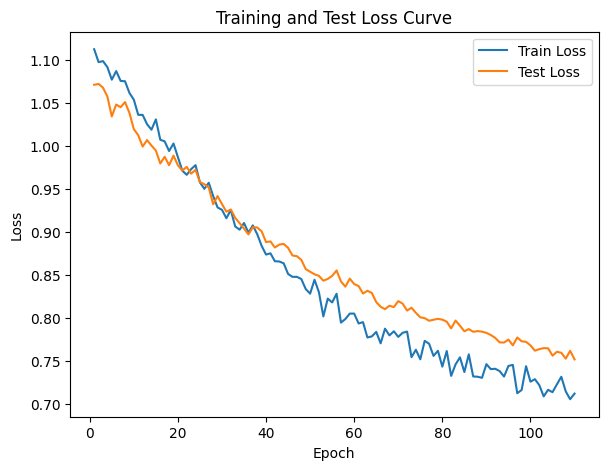

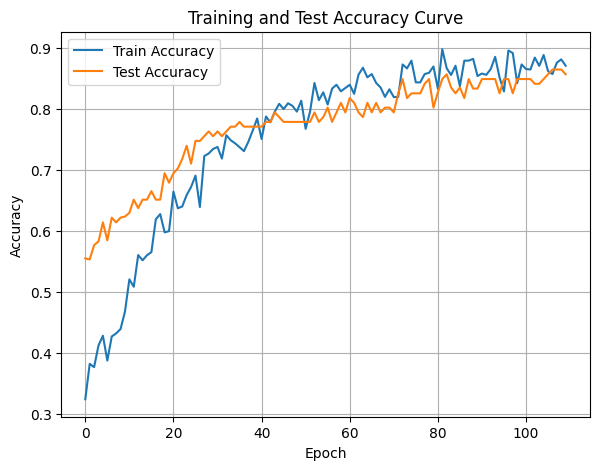

In [49]:
DTEmlp6b.train_single_model()

Randomly initializing 6 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.25it/s]

Epoch [1/10], Train F1:0.2565841330251518, Train Loss: 1.1421, Train Acc: 0.2399, Test F1:0.2365791020761781, Test Loss: 1.1200, Test Acc: 0.1918


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.40it/s]

Epoch [2/10], Train F1:0.26261326116011663, Train Loss: 1.1441, Train Acc: 0.2530, Test F1:0.23138949560424935, Test Loss: 1.1185, Test Acc: 0.1801


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.54it/s]

Epoch [3/10], Train F1:0.27624149992291214, Train Loss: 1.1426, Train Acc: 0.2618, Test F1:0.22369213723719386, Test Loss: 1.1206, Test Acc: 0.1736


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.80it/s]

Epoch [4/10], Train F1:0.2871538238664223, Train Loss: 1.1386, Train Acc: 0.2696, Test F1:0.23114700502843652, Test Loss: 1.1215, Test Acc: 0.1743


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.88it/s]

Epoch [5/10], Train F1:0.2921753882527049, Train Loss: 1.1352, Train Acc: 0.2758, Test F1:0.2350938185841033, Test Loss: 1.1206, Test Acc: 0.1806


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.91it/s]

Epoch [6/10], Train F1:0.2963838783783138, Train Loss: 1.1320, Train Acc: 0.2806, Test F1:0.23458316844743438, Test Loss: 1.1216, Test Acc: 0.1808


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.64it/s]

Epoch [7/10], Train F1:0.30629785342414634, Train Loss: 1.1287, Train Acc: 0.2892, Test F1:0.2374538040015292, Test Loss: 1.1207, Test Acc: 0.1855


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.62it/s]

Epoch [8/10], Train F1:0.31419356140589144, Train Loss: 1.1261, Train Acc: 0.2961, Test F1:0.2423439556720784, Test Loss: 1.1188, Test Acc: 0.1919
Epoch [9/10], Train F1:0.31970675069051174, Train Loss: 1.1235, Train Acc: 0.3015, Test F1:0.26318756791829084, Test Loss: 1.1145, Test Acc: 0.2046


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.53it/s]


Epoch [10/10], Train F1:0.3291194022013862, Train Loss: 1.1203, Train Acc: 0.3100, Test F1:0.2734502214012799, Test Loss: 1.1114, Test Acc: 0.2137
Total Epochs: 10
Train loss start: 1.1181851625442505, Train loss end: 1.1071116924285889
Highest Mean Train Accuracy (over epoch): 0.30997023809523816
Test loss start: 1.1261036396026611, Test loss end: 1.0857024192810059
Highest mean Test Accuracy (over epoch): 0.21371527777777777


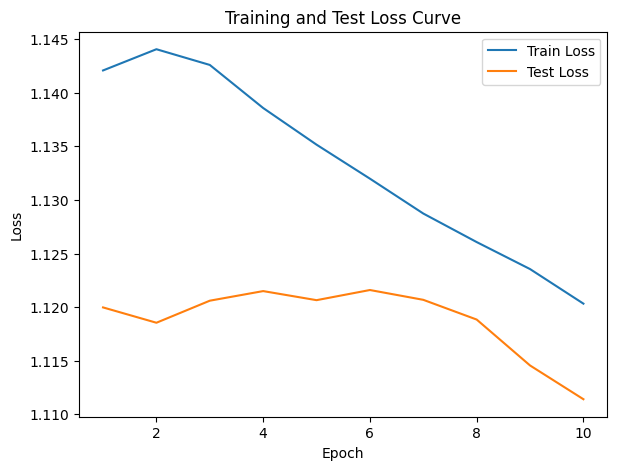

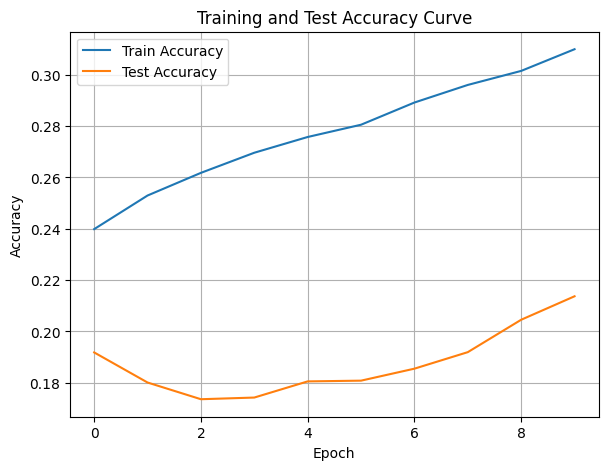

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.40it/s]

Epoch [1/10], Train F1:0.500457922979978, Train Loss: 1.0735, Train Acc: 0.4274, Test F1:0.20872694556905083, Test Loss: 1.1162, Test Acc: 0.2804


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.57it/s]

Epoch [2/10], Train F1:0.48757783569323915, Train Loss: 1.0717, Train Acc: 0.4223, Test F1:0.21729592799202305, Test Loss: 1.1078, Test Acc: 0.3069


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.67it/s]

Epoch [3/10], Train F1:0.4834816930697748, Train Loss: 1.0731, Train Acc: 0.4157, Test F1:0.2175828943869291, Test Loss: 1.1050, Test Acc: 0.3157


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.67it/s]

Epoch [4/10], Train F1:0.4728156243488236, Train Loss: 1.0748, Train Acc: 0.4071, Test F1:0.21987306921015237, Test Loss: 1.1039, Test Acc: 0.3220


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.46it/s]

Epoch [5/10], Train F1:0.47755455088799853, Train Loss: 1.0761, Train Acc: 0.4085, Test F1:0.2215117803373683, Test Loss: 1.1024, Test Acc: 0.3259


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.49it/s]

Epoch [6/10], Train F1:0.48185287422503426, Train Loss: 1.0722, Train Acc: 0.4144, Test F1:0.22854797138607932, Test Loss: 1.1004, Test Acc: 0.3320


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.10it/s]

Epoch [7/10], Train F1:0.4917257814489716, Train Loss: 1.0681, Train Acc: 0.4242, Test F1:0.23328601979598404, Test Loss: 1.0976, Test Acc: 0.3384


Training Process:  80%|████████  | 8/10 [00:00<00:00,  7.83it/s]

Epoch [8/10], Train F1:0.5022722502849872, Train Loss: 1.0642, Train Acc: 0.4344, Test F1:0.23288070222416396, Test Loss: 1.0959, Test Acc: 0.3415


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.98it/s]

Epoch [9/10], Train F1:0.5064182868413637, Train Loss: 1.0610, Train Acc: 0.4382, Test F1:0.23649543220218266, Test Loss: 1.0938, Test Acc: 0.3463


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.86it/s]


Epoch [10/10], Train F1:0.5162624722520712, Train Loss: 1.0573, Train Acc: 0.4460, Test F1:0.24251650762913302, Test Loss: 1.0911, Test Acc: 0.3509
Total Epochs: 10
Train loss start: 1.1103763580322266, Train loss end: 1.1186749935150146
Highest Mean Train Accuracy (over epoch): 0.4459821428571429
Test loss start: 1.1057202816009521, Test loss end: 1.0640580654144287
Highest mean Test Accuracy (over epoch): 0.35086805555555556


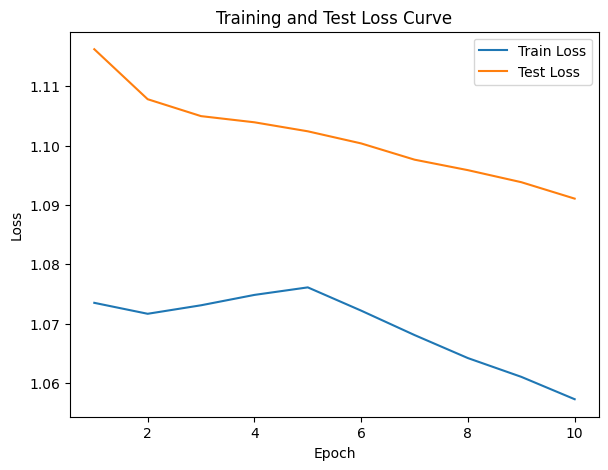

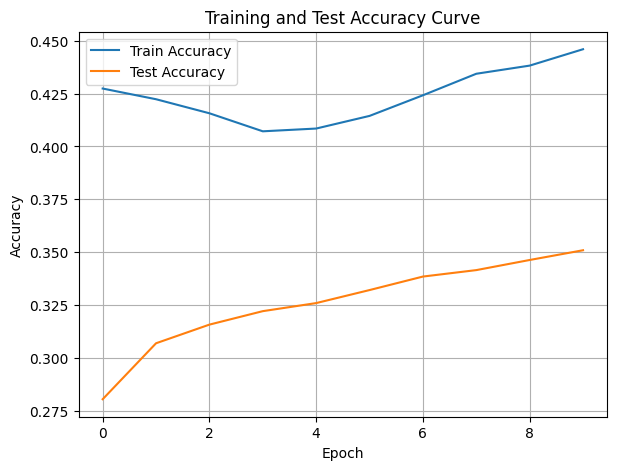

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.08it/s]

Epoch [1/10], Train F1:0.2664582988201079, Train Loss: 1.1874, Train Acc: 0.1688, Test F1:0.43912828289210426, Test Loss: 1.0999, Test Acc: 0.3724


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.76it/s]

Epoch [2/10], Train F1:0.26455173533055154, Train Loss: 1.1860, Train Acc: 0.1746, Test F1:0.49455153734884205, Test Loss: 1.0932, Test Acc: 0.4501


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.27it/s]

Epoch [3/10], Train F1:0.26154450670130325, Train Loss: 1.1833, Train Acc: 0.1769, Test F1:0.5409945445268651, Test Loss: 1.0851, Test Acc: 0.5026


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.43it/s]

Epoch [4/10], Train F1:0.2637437037956631, Train Loss: 1.1819, Train Acc: 0.1804, Test F1:0.5505553098432356, Test Loss: 1.0828, Test Acc: 0.5299


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.47it/s]

Epoch [5/10], Train F1:0.2838505697603372, Train Loss: 1.1753, Train Acc: 0.1935, Test F1:0.562668026820534, Test Loss: 1.0794, Test Acc: 0.5491


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.71it/s]

Epoch [6/10], Train F1:0.2926114755761722, Train Loss: 1.1714, Train Acc: 0.2003, Test F1:0.5671983254288121, Test Loss: 1.0762, Test Acc: 0.5609
Epoch [7/10], Train F1:0.2962543807034023, Train Loss: 1.1678, Train Acc: 0.2040, Test F1:0.5727441192068202, Test Loss: 1.0736, Test Acc: 0.5716


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.25it/s]

Epoch [8/10], Train F1:0.30077083247299874, Train Loss: 1.1640, Train Acc: 0.2085, Test F1:0.5728072941650609, Test Loss: 1.0715, Test Acc: 0.5776
Epoch [9/10], Train F1:0.3149558684000489, Train Loss: 1.1586, Train Acc: 0.2220, Test F1:0.5816761542019899, Test Loss: 1.0673, Test Acc: 0.5923


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.84it/s]


Epoch [10/10], Train F1:0.3213826388034636, Train Loss: 1.1547, Train Acc: 0.2279, Test F1:0.5896375809594948, Test Loss: 1.0643, Test Acc: 0.6033
Total Epochs: 10
Train loss start: 1.172839641571045, Train loss end: 1.0890885591506958
Highest Mean Train Accuracy (over epoch): 0.22791666666666666
Test loss start: 1.1035066843032837, Test loss end: 1.0245510339736938
Highest mean Test Accuracy (over epoch): 0.603298611111111


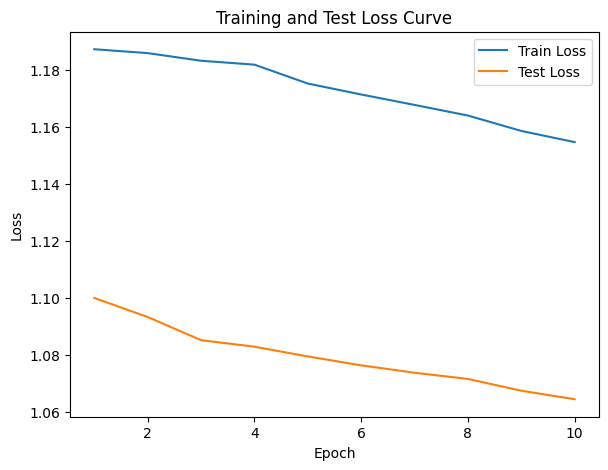

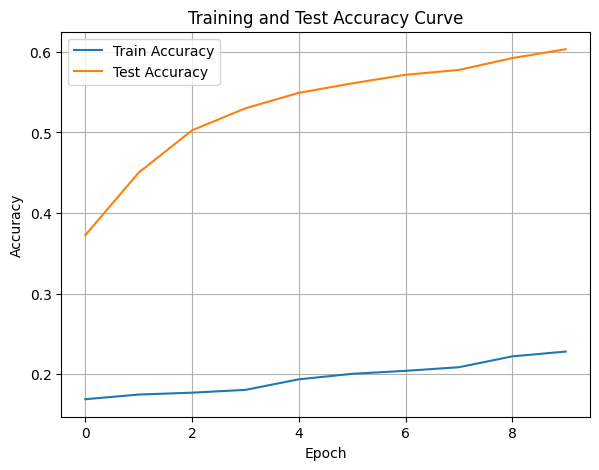

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.11it/s]

Epoch [1/10], Train F1:0.40458457931482394, Train Loss: 1.0900, Train Acc: 0.3786, Test F1:0.2770353354503074, Test Loss: 1.1063, Test Acc: 0.2474


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.18it/s]

Epoch [2/10], Train F1:0.37589398207793506, Train Loss: 1.0927, Train Acc: 0.3567, Test F1:0.25919757198904436, Test Loss: 1.1116, Test Acc: 0.2218


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.88it/s]

Epoch [3/10], Train F1:0.36252702103863677, Train Loss: 1.0998, Train Acc: 0.3396, Test F1:0.26074834506612643, Test Loss: 1.1120, Test Acc: 0.2179


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.23it/s]

Epoch [4/10], Train F1:0.3632663861563552, Train Loss: 1.0992, Train Acc: 0.3407, Test F1:0.26357622352078797, Test Loss: 1.1119, Test Acc: 0.2144


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.36it/s]

Epoch [5/10], Train F1:0.37127459349322073, Train Loss: 1.0942, Train Acc: 0.3504, Test F1:0.2737809688029482, Test Loss: 1.1109, Test Acc: 0.2198


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.36it/s]

Epoch [6/10], Train F1:0.38319925593456117, Train Loss: 1.0905, Train Acc: 0.3607, Test F1:0.2816498908945856, Test Loss: 1.1101, Test Acc: 0.2221


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.88it/s]

Epoch [7/10], Train F1:0.3915645988231565, Train Loss: 1.0875, Train Acc: 0.3678, Test F1:0.2895853876694344, Test Loss: 1.1090, Test Acc: 0.2313


Training Process:  80%|████████  | 8/10 [00:01<00:00,  8.13it/s]

Epoch [8/10], Train F1:0.39822326357833576, Train Loss: 1.0830, Train Acc: 0.3758, Test F1:0.2950476562454938, Test Loss: 1.1072, Test Acc: 0.2399


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.06it/s]

Epoch [9/10], Train F1:0.4038608145588087, Train Loss: 1.0813, Train Acc: 0.3812, Test F1:0.30288733144227653, Test Loss: 1.1055, Test Acc: 0.2475


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.07it/s]


Epoch [10/10], Train F1:0.40784796109132704, Train Loss: 1.0787, Train Acc: 0.3844, Test F1:0.3071086481536458, Test Loss: 1.1041, Test Acc: 0.2528
Total Epochs: 10
Train loss start: 1.1142752170562744, Train loss end: 1.09697687625885
Highest Mean Train Accuracy (over epoch): 0.384375
Test loss start: 1.1126817464828491, Test loss end: 1.0715677738189697
Highest mean Test Accuracy (over epoch): 0.25277777777777777


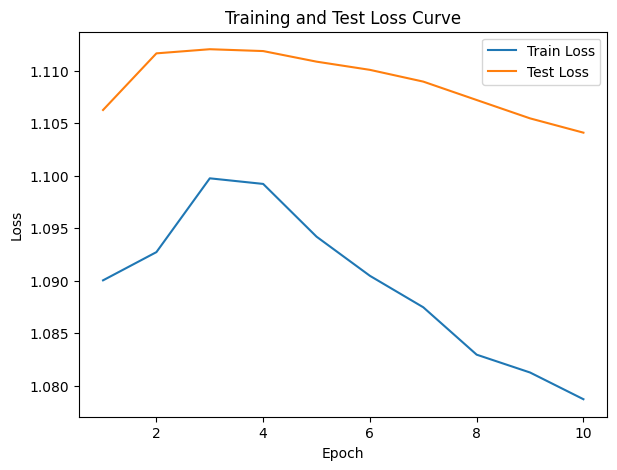

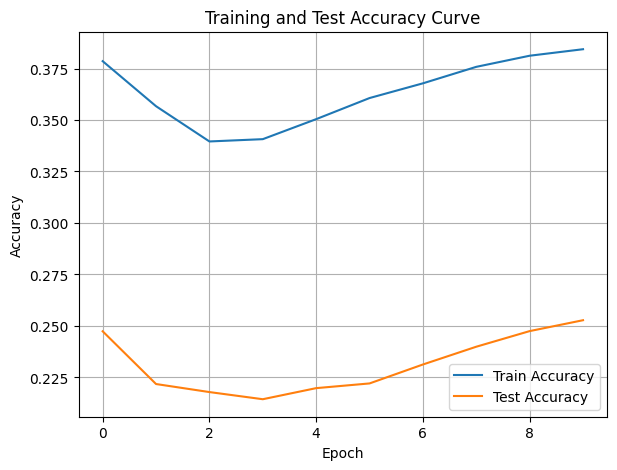

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.27it/s]

Epoch [1/10], Train F1:0.47040934726162514, Train Loss: 1.0848, Train Acc: 0.3970, Test F1:0.3656578947368421, Test Loss: 1.0807, Test Acc: 0.3863


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.61it/s]

Epoch [2/10], Train F1:0.5035466432669168, Train Loss: 1.0703, Train Acc: 0.4357, Test F1:0.37956871345029236, Test Loss: 1.0707, Test Acc: 0.4119


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.12it/s]

Epoch [3/10], Train F1:0.5041142720810771, Train Loss: 1.0669, Train Acc: 0.4396, Test F1:0.3624298086989626, Test Loss: 1.0697, Test Acc: 0.4100
Epoch [4/10], Train F1:0.5156343134523798, Train Loss: 1.0625, Train Acc: 0.4530, Test F1:0.3634103914513926, Test Loss: 1.0679, Test Acc: 0.4149


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.83it/s]

Epoch [5/10], Train F1:0.5273718544365212, Train Loss: 1.0577, Train Acc: 0.4654, Test F1:0.36517124445024784, Test Loss: 1.0667, Test Acc: 0.4194
Epoch [6/10], Train F1:0.5353894427364383, Train Loss: 1.0522, Train Acc: 0.4786, Test F1:0.37320044493236626, Test Loss: 1.0633, Test Acc: 0.4251


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.08it/s]

Epoch [7/10], Train F1:0.54436608412836, Train Loss: 1.0479, Train Acc: 0.4896, Test F1:0.38142903474939505, Test Loss: 1.0592, Test Acc: 0.4311
Epoch [8/10], Train F1:0.5444370942572071, Train Loss: 1.0472, Train Acc: 0.4903, Test F1:0.38446277742442936, Test Loss: 1.0576, Test Acc: 0.4338


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.69it/s]


Epoch [9/10], Train F1:0.5530636023841348, Train Loss: 1.0428, Train Acc: 0.5010, Test F1:0.38801465920055556, Test Loss: 1.0558, Test Acc: 0.4368
Epoch [10/10], Train F1:0.5600897519092043, Train Loss: 1.0390, Train Acc: 0.5081, Test F1:0.39488679106635044, Test Loss: 1.0532, Test Acc: 0.4436
Total Epochs: 10
Train loss start: 1.1110992431640625, Train loss end: 0.9912270903587341
Highest Mean Train Accuracy (over epoch): 0.5080952380952382
Test loss start: 1.0872371196746826, Test loss end: 1.0237241983413696
Highest mean Test Accuracy (over epoch): 0.44357638888888895


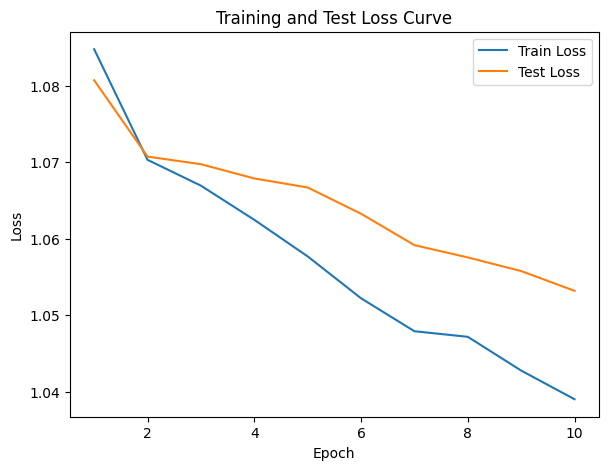

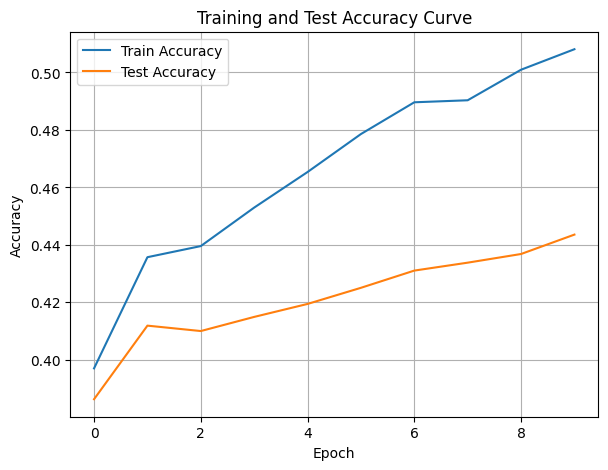

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.32it/s]

Epoch [1/10], Train F1:0.33166235961840357, Train Loss: 1.1146, Train Acc: 0.3682, Test F1:0.31806679433004786, Test Loss: 1.1009, Test Acc: 0.3828


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.43it/s]

Epoch [2/10], Train F1:0.33058434899781786, Train Loss: 1.1146, Train Acc: 0.3598, Test F1:0.2951362627475988, Test Loss: 1.1003, Test Acc: 0.3759


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.11it/s]

Epoch [3/10], Train F1:0.3260054918184009, Train Loss: 1.1124, Train Acc: 0.3553, Test F1:0.28282561015233465, Test Loss: 1.1007, Test Acc: 0.3715


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.84it/s]

Epoch [4/10], Train F1:0.33253119484503185, Train Loss: 1.1095, Train Acc: 0.3598, Test F1:0.27678238148562895, Test Loss: 1.1008, Test Acc: 0.3694


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.05it/s]

Epoch [5/10], Train F1:0.34301952448081535, Train Loss: 1.1030, Train Acc: 0.3696, Test F1:0.27334163761565267, Test Loss: 1.1000, Test Acc: 0.3696


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.94it/s]

Epoch [6/10], Train F1:0.35197664836905995, Train Loss: 1.0999, Train Acc: 0.3751, Test F1:0.27101496071467013, Test Loss: 1.0985, Test Acc: 0.3698


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.24it/s]

Epoch [7/10], Train F1:0.3584740048804177, Train Loss: 1.0969, Train Acc: 0.3818, Test F1:0.2711075888243874, Test Loss: 1.0966, Test Acc: 0.3708


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.26it/s]

Epoch [8/10], Train F1:0.36537518541896336, Train Loss: 1.0928, Train Acc: 0.3879, Test F1:0.2700892864517281, Test Loss: 1.0958, Test Acc: 0.3717


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.00it/s]

Epoch [9/10], Train F1:0.37316340270784115, Train Loss: 1.0896, Train Acc: 0.3935, Test F1:0.2706640976701374, Test Loss: 1.0947, Test Acc: 0.3725


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.64it/s]


Epoch [10/10], Train F1:0.38166128049605935, Train Loss: 1.0865, Train Acc: 0.4012, Test F1:0.2694030671896685, Test Loss: 1.0932, Test Acc: 0.3723
Total Epochs: 10
Train loss start: 1.1204707622528076, Train loss end: 1.0367883443832397
Highest Mean Train Accuracy (over epoch): 0.4011904761904762
Test loss start: 1.1171722412109375, Test loss end: 1.0555603504180908
Highest mean Test Accuracy (over epoch): 0.3828125


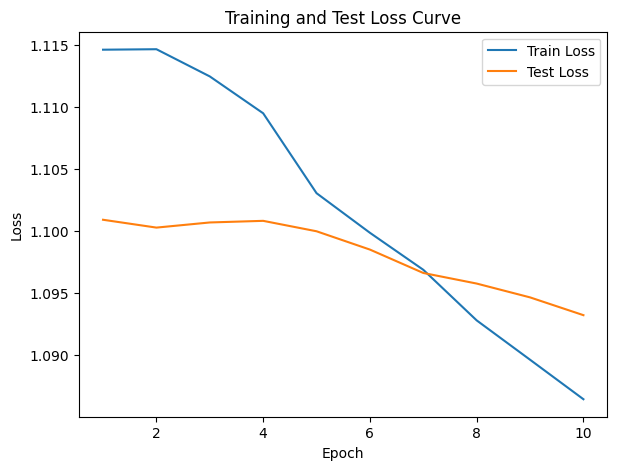

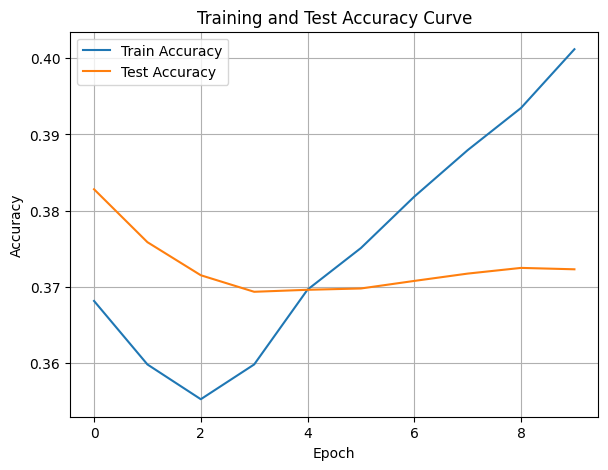

./saved_models/model_6.pth
Training Model with id 11
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.52it/s]

Epoch [1/10], Train F1:0.41438342284301016, Train Loss: 1.0690, Train Acc: 0.4199, Test F1:0.27406194207132634, Test Loss: 1.0816, Test Acc: 0.3845
Epoch [2/10], Train F1:0.4424575047276758, Train Loss: 1.0576, Train Acc: 0.4551, Test F1:0.28618577287237873, Test Loss: 1.0767, Test Acc: 0.3963


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.16it/s]

Epoch [3/10], Train F1:0.45334746894558847, Train Loss: 1.0528, Train Acc: 0.4615, Test F1:0.30068822408263896, Test Loss: 1.0740, Test Acc: 0.4054
Epoch [4/10], Train F1:0.4660240922893927, Train Loss: 1.0460, Train Acc: 0.4752, Test F1:0.32718302464106597, Test Loss: 1.0702, Test Acc: 0.4219


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.35it/s]

Epoch [5/10], Train F1:0.4720885217417811, Train Loss: 1.0432, Train Acc: 0.4773, Test F1:0.3335471135506118, Test Loss: 1.0682, Test Acc: 0.4266
Epoch [6/10], Train F1:0.4804095361257052, Train Loss: 1.0384, Train Acc: 0.4859, Test F1:0.33717579273873427, Test Loss: 1.0675, Test Acc: 0.4284


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.67it/s]

Epoch [7/10], Train F1:0.4891461407592767, Train Loss: 1.0351, Train Acc: 0.4940, Test F1:0.3444787194572534, Test Loss: 1.0656, Test Acc: 0.4339
Epoch [8/10], Train F1:0.49408904481889615, Train Loss: 1.0325, Train Acc: 0.4996, Test F1:0.3474167828899205, Test Loss: 1.0649, Test Acc: 0.4353


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.87it/s]


Epoch [9/10], Train F1:0.5042779005312498, Train Loss: 1.0276, Train Acc: 0.5089, Test F1:0.34868147721484893, Test Loss: 1.0639, Test Acc: 0.4364
Epoch [10/10], Train F1:0.5078285800417711, Train Loss: 1.0250, Train Acc: 0.5128, Test F1:0.3569440721783499, Test Loss: 1.0624, Test Acc: 0.4431
Total Epochs: 10
Train loss start: 1.0087641477584839, Train loss end: 0.9306834936141968
Highest Mean Train Accuracy (over epoch): 0.5127678571428572
Test loss start: 1.0987098217010498, Test loss end: 1.0173563957214355
Highest mean Test Accuracy (over epoch): 0.44305555555555554


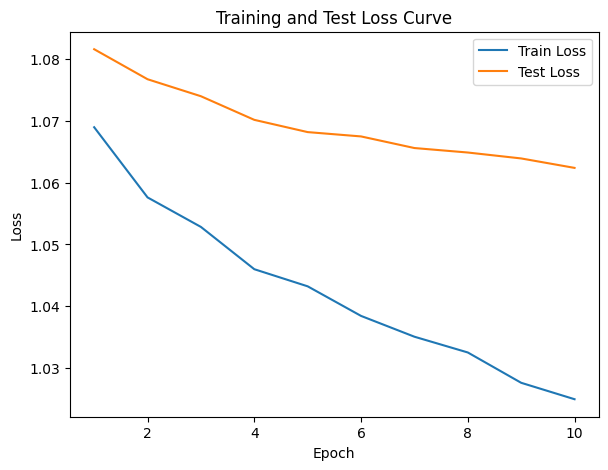

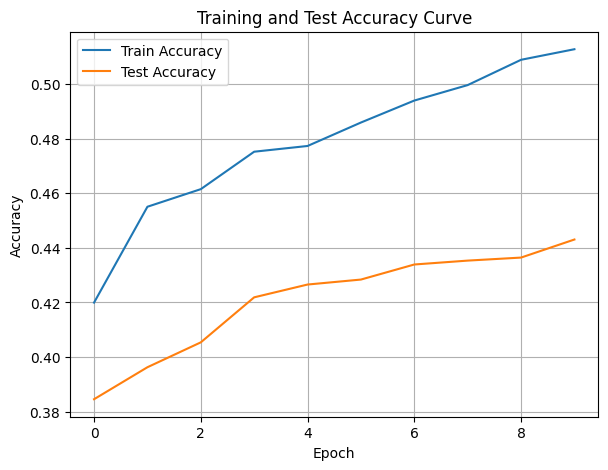

./saved_models/model_11.pth
Training Model with id 9
in multi


Epoch [1/10], Train F1:0.571840925666429, Train Loss: 0.9825, Train Acc: 0.5652, Test F1:0.472488038277512, Test Loss: 1.0401, Test Acc: 0.5260


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.45it/s]

Epoch [2/10], Train F1:0.5713250468590536, Train Loss: 0.9898, Train Acc: 0.5652, Test F1:0.4508035689685419, Test Loss: 1.0431, Test Acc: 0.5113
Epoch [3/10], Train F1:0.5748465095879731, Train Loss: 0.9882, Train Acc: 0.5662, Test F1:0.4603039301439795, Test Loss: 1.0380, Test Acc: 0.5188


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.08it/s]

Epoch [4/10], Train F1:0.5829851259587008, Train Loss: 0.9828, Train Acc: 0.5766, Test F1:0.4650273145617209, Test Loss: 1.0372, Test Acc: 0.5226


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.08it/s]

Epoch [5/10], Train F1:0.5928811305309436, Train Loss: 0.9794, Train Acc: 0.5860, Test F1:0.46903599135444574, Test Loss: 1.0359, Test Acc: 0.5248


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.15it/s]

Epoch [6/10], Train F1:0.6019325214691797, Train Loss: 0.9763, Train Acc: 0.5950, Test F1:0.4665673060442756, Test Loss: 1.0348, Test Acc: 0.5227


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.47it/s]

Epoch [7/10], Train F1:0.6049551386080628, Train Loss: 0.9756, Train Acc: 0.5963, Test F1:0.4701389883315759, Test Loss: 1.0343, Test Acc: 0.5263


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.38it/s]

Epoch [8/10], Train F1:0.607903715374314, Train Loss: 0.9732, Train Acc: 0.5996, Test F1:0.4681501923764885, Test Loss: 1.0343, Test Acc: 0.5253


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.55it/s]

Epoch [9/10], Train F1:0.6124328253252285, Train Loss: 0.9699, Train Acc: 0.6042, Test F1:0.4686434395848777, Test Loss: 1.0326, Test Acc: 0.5260


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.53it/s]


Epoch [10/10], Train F1:0.6183980183534015, Train Loss: 0.9670, Train Acc: 0.6112, Test F1:0.47093229138532267, Test Loss: 1.0316, Test Acc: 0.5282
Total Epochs: 10
Train loss start: 0.9467652440071106, Train loss end: 0.8290926814079285
Highest Mean Train Accuracy (over epoch): 0.6111607142857143
Test loss start: 1.0583202838897705, Test loss end: 0.9839338660240173
Highest mean Test Accuracy (over epoch): 0.5282118055555556


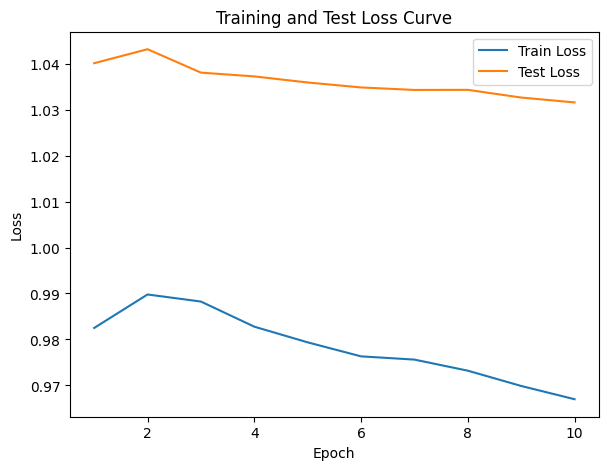

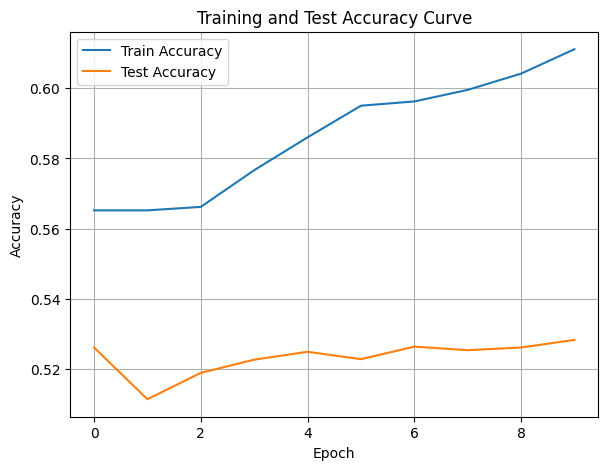

./saved_models/model_9.pth
Training Model with id 12
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.7195609233343597, Train Loss: 0.9211, Train Acc: 0.7196, Test F1:0.47792558318874107, Test Loss: 1.0112, Test Acc: 0.5260


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.55it/s]

Epoch [2/10], Train F1:0.7095155925985629, Train Loss: 0.9195, Train Acc: 0.7065, Test F1:0.5106798245614035, Test Loss: 1.0079, Test Acc: 0.5525


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.55it/s]

Epoch [3/10], Train F1:0.702256033667938, Train Loss: 0.9198, Train Acc: 0.6962, Test F1:0.5114434638420693, Test Loss: 1.0066, Test Acc: 0.5535


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.39it/s]

Epoch [4/10], Train F1:0.7097612773569896, Train Loss: 0.9178, Train Acc: 0.7033, Test F1:0.5077899426929898, Test Loss: 1.0055, Test Acc: 0.5521


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.39it/s]

Epoch [5/10], Train F1:0.7183403697021465, Train Loss: 0.9142, Train Acc: 0.7129, Test F1:0.5194128133783436, Test Loss: 1.0036, Test Acc: 0.5606


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.03it/s]

Epoch [6/10], Train F1:0.7192477039682188, Train Loss: 0.9140, Train Acc: 0.7122, Test F1:0.5251951635279565, Test Loss: 1.0030, Test Acc: 0.5650


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.22it/s]

Epoch [7/10], Train F1:0.7239766728069464, Train Loss: 0.9116, Train Acc: 0.7167, Test F1:0.5244473184425238, Test Loss: 1.0031, Test Acc: 0.5647


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.14it/s]

Epoch [8/10], Train F1:0.7280953001152923, Train Loss: 0.9099, Train Acc: 0.7203, Test F1:0.533786149980819, Test Loss: 1.0021, Test Acc: 0.5714


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  8.97it/s]

Epoch [9/10], Train F1:0.7320457737728321, Train Loss: 0.9070, Train Acc: 0.7242, Test F1:0.5508255775652163, Test Loss: 0.9994, Test Acc: 0.5835


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.22it/s]


Epoch [10/10], Train F1:0.7357814023906325, Train Loss: 0.9055, Train Acc: 0.7273, Test F1:0.5695483353442432, Test Loss: 0.9970, Test Acc: 0.5964
Total Epochs: 10
Train loss start: 0.873630702495575, Train loss end: 0.9471380114555359
Highest Mean Train Accuracy (over epoch): 0.7272916666666667
Test loss start: 1.031118392944336, Test loss end: 0.9373724460601807
Highest mean Test Accuracy (over epoch): 0.5963541666666666


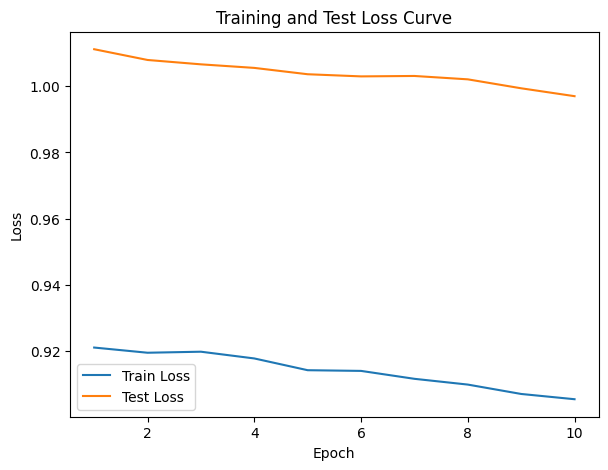

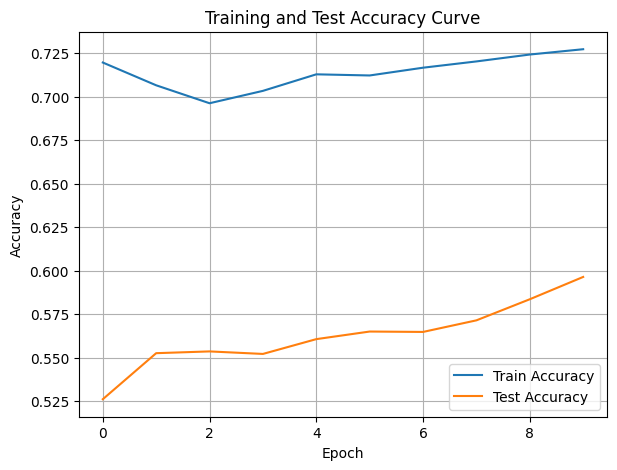

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.52it/s]

Epoch [1/10], Train F1:0.7920339993037062, Train Loss: 0.8652, Train Acc: 0.7926, Test F1:0.7339831059129305, Test Loss: 0.9734, Test Acc: 0.7335
Epoch [2/10], Train F1:0.772321542995279, Train Loss: 0.8787, Train Acc: 0.7653, Test F1:0.774192425508215, Test Loss: 0.9645, Test Acc: 0.7756


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.52it/s]

Epoch [3/10], Train F1:0.7813811965860673, Train Loss: 0.8740, Train Acc: 0.7765, Test F1:0.7537131952187752, Test Loss: 0.9663, Test Acc: 0.7517


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.59it/s]

Epoch [4/10], Train F1:0.7854481235485655, Train Loss: 0.8747, Train Acc: 0.7802, Test F1:0.7776899485069275, Test Loss: 0.9633, Test Acc: 0.7776
Epoch [5/10], Train F1:0.7857593029207649, Train Loss: 0.8724, Train Acc: 0.7785, Test F1:0.7410631842764807, Test Loss: 0.9674, Test Acc: 0.7422


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.78it/s]

Epoch [6/10], Train F1:0.7839000537129405, Train Loss: 0.8736, Train Acc: 0.7740, Test F1:0.7139457423691599, Test Loss: 0.9701, Test Acc: 0.7173
Epoch [7/10], Train F1:0.7868785152007537, Train Loss: 0.8705, Train Acc: 0.7773, Test F1:0.730558120447317, Test Loss: 0.9689, Test Acc: 0.7319


Epoch [8/10], Train F1:0.7886058157554594, Train Loss: 0.8679, Train Acc: 0.7775, Test F1:0.7277521214203021, Test Loss: 0.9677, Test Acc: 0.7284
Epoch [9/10], Train F1:0.7920630196175622, Train Loss: 0.8647, Train Acc: 0.7805, Test F1:0.7264377625933689, Test Loss: 0.9663, Test Acc: 0.7272


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.91it/s]


Epoch [10/10], Train F1:0.7943551603733767, Train Loss: 0.8617, Train Acc: 0.7825, Test F1:0.7315555129616936, Test Loss: 0.9649, Test Acc: 0.7312
Total Epochs: 10
Train loss start: 0.8463531732559204, Train loss end: 0.879123330116272
Highest Mean Train Accuracy (over epoch): 0.7925595238095239
Test loss start: 0.9908460974693298, Test loss end: 0.9124084115028381
Highest mean Test Accuracy (over epoch): 0.7775607638888888


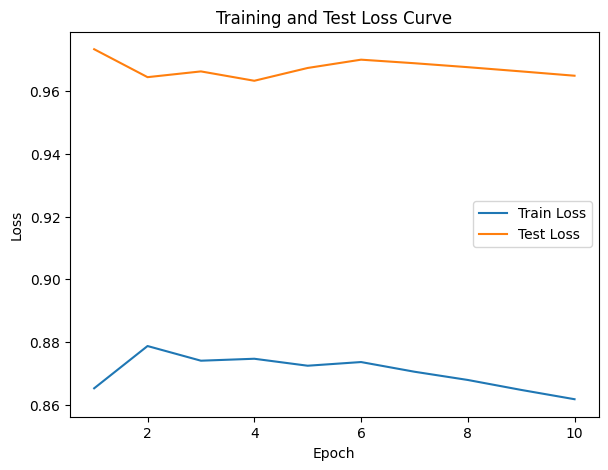

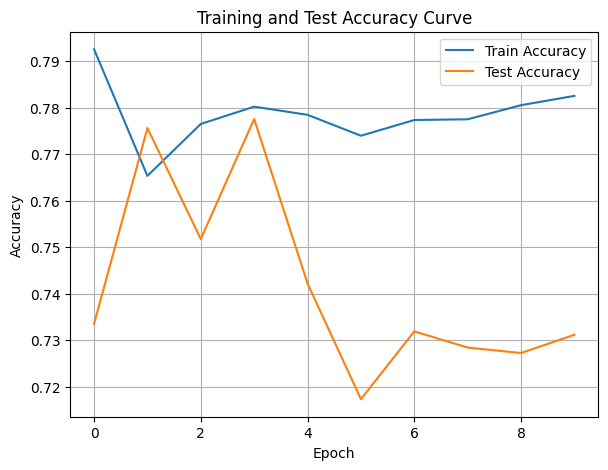

./saved_models/model_10.pth
Training Model with id 8
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.8211443775833474, Train Loss: 0.8482, Train Acc: 0.7973, Test F1:0.8300706033376123, Test Loss: 0.9225, Test Acc: 0.8411


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.20it/s]

Epoch [2/10], Train F1:0.8117292606709393, Train Loss: 0.8422, Train Acc: 0.7927, Test F1:0.8424305409858196, Test Loss: 0.9290, Test Acc: 0.8490


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.20it/s]

Epoch [3/10], Train F1:0.8201592791914211, Train Loss: 0.8349, Train Acc: 0.8079, Test F1:0.8434048083170891, Test Loss: 0.9352, Test Acc: 0.8443


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.84it/s]

Epoch [4/10], Train F1:0.8191603029580077, Train Loss: 0.8332, Train Acc: 0.8066, Test F1:0.8459623144949839, Test Loss: 0.9356, Test Acc: 0.8455


Epoch [5/10], Train F1:0.8231581378341448, Train Loss: 0.8280, Train Acc: 0.8149, Test F1:0.8433499906078992, Test Loss: 0.9380, Test Acc: 0.8418
Epoch [6/10], Train F1:0.8287829557622809, Train Loss: 0.8267, Train Acc: 0.8207, Test F1:0.8425978092040008, Test Loss: 0.9363, Test Acc: 0.8417


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.24it/s]

Epoch [7/10], Train F1:0.8306629036942907, Train Loss: 0.8233, Train Acc: 0.8249, Test F1:0.8424002588509575, Test Loss: 0.9361, Test Acc: 0.8408


Epoch [8/10], Train F1:0.8299447525376502, Train Loss: 0.8219, Train Acc: 0.8247, Test F1:0.8438825822726753, Test Loss: 0.9344, Test Acc: 0.8428


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.46it/s]

Epoch [9/10], Train F1:0.829425057069448, Train Loss: 0.8198, Train Acc: 0.8259, Test F1:0.8386919197932442, Test Loss: 0.9355, Test Acc: 0.8367


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.68it/s]


Epoch [10/10], Train F1:0.8326351315132716, Train Loss: 0.8170, Train Acc: 0.8287, Test F1:0.8381082105707736, Test Loss: 0.9336, Test Acc: 0.8352
Total Epochs: 10
Train loss start: 0.7475674152374268, Train loss end: 0.7756878733634949
Highest Mean Train Accuracy (over epoch): 0.828720238095238
Test loss start: 0.9346232414245605, Test loss end: 0.8832848072052002
Highest mean Test Accuracy (over epoch): 0.8489583333333334


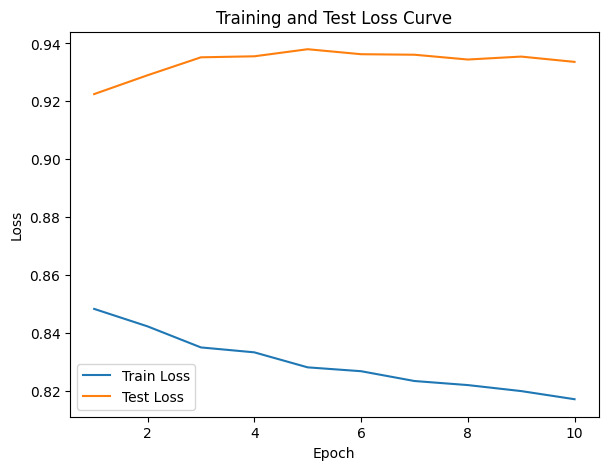

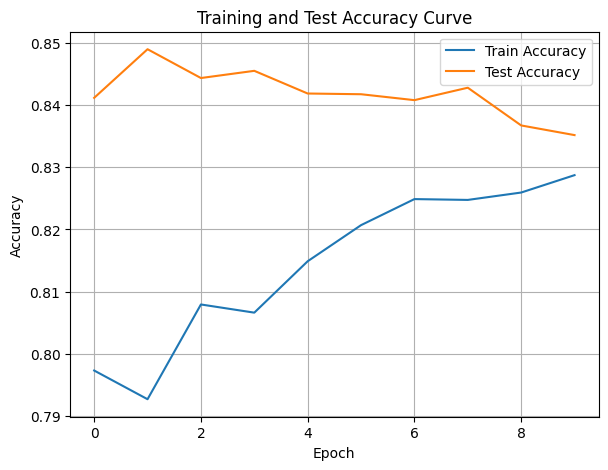

./saved_models/model_8.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [50]:
DTEmlp6b.train_DTE()

Training Process:   2%|▏         | 2/110 [00:00<00:15,  7.15it/s]

Epoch [1/110], Train F1:0.3304582968376686, Train Loss: 1.1295, Train Acc: 0.2887, Test F1:0.2167139228542738, Test Loss: 1.1092, Test Acc: 0.2352
Epoch [2/110], Train F1:0.34173145656019055, Train Loss: 1.1175, Train Acc: 0.3018, Test F1:0.21870465637778658, Test Loss: 1.1085, Test Acc: 0.2561


Training Process:   4%|▎         | 4/110 [00:00<00:14,  7.27it/s]

Epoch [3/110], Train F1:0.3626883941227396, Train Loss: 1.1103, Train Acc: 0.3246, Test F1:0.22706070732386519, Test Loss: 1.1078, Test Acc: 0.2584
Epoch [4/110], Train F1:0.3677816227752669, Train Loss: 1.1114, Train Acc: 0.3284, Test F1:0.23344514815009668, Test Loss: 1.1061, Test Acc: 0.2689


Training Process:   5%|▌         | 6/110 [00:00<00:13,  7.94it/s]

Epoch [5/110], Train F1:0.37389064304212316, Train Loss: 1.1093, Train Acc: 0.3321, Test F1:0.24326006865888797, Test Loss: 1.1038, Test Acc: 0.2783
Epoch [6/110], Train F1:0.38076294659292786, Train Loss: 1.1066, Train Acc: 0.3402, Test F1:0.2593091147910255, Test Loss: 1.1014, Test Acc: 0.2911


Training Process:   7%|▋         | 8/110 [00:01<00:12,  8.37it/s]

Epoch [7/110], Train F1:0.38401715587990964, Train Loss: 1.1040, Train Acc: 0.3435, Test F1:0.26008781536530495, Test Loss: 1.0995, Test Acc: 0.2980
Epoch [8/110], Train F1:0.3914947363854607, Train Loss: 1.0998, Train Acc: 0.3515, Test F1:0.26510362793548636, Test Loss: 1.0978, Test Acc: 0.3061


Training Process:   9%|▉         | 10/110 [00:01<00:11,  8.40it/s]

Epoch [9/110], Train F1:0.39585367634626917, Train Loss: 1.0983, Train Acc: 0.3555, Test F1:0.30409749289913424, Test Loss: 1.0966, Test Acc: 0.3237
Epoch [10/110], Train F1:0.3997109463859064, Train Loss: 1.0958, Train Acc: 0.3607, Test F1:0.31122918470634964, Test Loss: 1.0956, Test Acc: 0.3292


Training Process:  11%|█         | 12/110 [00:01<00:11,  8.64it/s]

Epoch [11/110], Train F1:0.41258321857808816, Train Loss: 1.0912, Train Acc: 0.3736, Test F1:0.3167608817473061, Test Loss: 1.0941, Test Acc: 0.3351
Epoch [12/110], Train F1:0.41851193737787573, Train Loss: 1.0873, Train Acc: 0.3801, Test F1:0.3209102037305576, Test Loss: 1.0922, Test Acc: 0.3419


Training Process:  13%|█▎        | 14/110 [00:01<00:11,  8.72it/s]

Epoch [13/110], Train F1:0.42721594895892934, Train Loss: 1.0823, Train Acc: 0.3887, Test F1:0.3232560494278018, Test Loss: 1.0902, Test Acc: 0.3478
Epoch [14/110], Train F1:0.43665141365302973, Train Loss: 1.0790, Train Acc: 0.3974, Test F1:0.35856107817402244, Test Loss: 1.0888, Test Acc: 0.3697


Training Process:  15%|█▍        | 16/110 [00:01<00:10,  8.60it/s]

Epoch [15/110], Train F1:0.4434099437721431, Train Loss: 1.0762, Train Acc: 0.4039, Test F1:0.36617743825269494, Test Loss: 1.0871, Test Acc: 0.3774
Epoch [16/110], Train F1:0.4531212758676794, Train Loss: 1.0720, Train Acc: 0.4143, Test F1:0.369755946182672, Test Loss: 1.0854, Test Acc: 0.3828


Training Process:  16%|█▋        | 18/110 [00:02<00:11,  7.77it/s]

Epoch [17/110], Train F1:0.4610796294201388, Train Loss: 1.0685, Train Acc: 0.4228, Test F1:0.3688820129734241, Test Loss: 1.0843, Test Acc: 0.3848
Epoch [18/110], Train F1:0.4673380526179335, Train Loss: 1.0657, Train Acc: 0.4301, Test F1:0.3690161679677583, Test Loss: 1.0829, Test Acc: 0.3875


Training Process:  18%|█▊        | 20/110 [00:02<00:12,  7.25it/s]

Epoch [19/110], Train F1:0.47528868405930014, Train Loss: 1.0620, Train Acc: 0.4383, Test F1:0.3830261909344783, Test Loss: 1.0815, Test Acc: 0.3976
Epoch [20/110], Train F1:0.48217687205372955, Train Loss: 1.0587, Train Acc: 0.4455, Test F1:0.38173632503841587, Test Loss: 1.0803, Test Acc: 0.3990


Training Process:  20%|██        | 22/110 [00:02<00:12,  6.95it/s]

Epoch [21/110], Train F1:0.48750381975929347, Train Loss: 1.0557, Train Acc: 0.4513, Test F1:0.39025716960970214, Test Loss: 1.0788, Test Acc: 0.4063
Epoch [22/110], Train F1:0.49370795132244805, Train Loss: 1.0530, Train Acc: 0.4573, Test F1:0.4140062552042904, Test Loss: 1.0772, Test Acc: 0.4221


Training Process:  22%|██▏       | 24/110 [00:03<00:12,  6.83it/s]

Epoch [23/110], Train F1:0.5007466602172485, Train Loss: 1.0495, Train Acc: 0.4646, Test F1:0.41412461700790976, Test Loss: 1.0754, Test Acc: 0.4239
Epoch [24/110], Train F1:0.5080401973175276, Train Loss: 1.0461, Train Acc: 0.4727, Test F1:0.43517729679807343, Test Loss: 1.0735, Test Acc: 0.4386


Training Process:  24%|██▎       | 26/110 [00:03<00:12,  6.69it/s]

Epoch [25/110], Train F1:0.5129053070769438, Train Loss: 1.0431, Train Acc: 0.4784, Test F1:0.4417378397944311, Test Loss: 1.0720, Test Acc: 0.4447
Epoch [26/110], Train F1:0.5187762055499561, Train Loss: 1.0396, Train Acc: 0.4853, Test F1:0.4547490348515654, Test Loss: 1.0707, Test Acc: 0.4543


Training Process:  25%|██▌       | 28/110 [00:03<00:13,  6.02it/s]

Epoch [27/110], Train F1:0.5245971381819984, Train Loss: 1.0365, Train Acc: 0.4914, Test F1:0.46843047747695515, Test Loss: 1.0693, Test Acc: 0.4648
Epoch [28/110], Train F1:0.5302692675246498, Train Loss: 1.0335, Train Acc: 0.4981, Test F1:0.4760696099834038, Test Loss: 1.0679, Test Acc: 0.4715


Training Process:  27%|██▋       | 30/110 [00:04<00:13,  6.08it/s]

Epoch [29/110], Train F1:0.5359543153556687, Train Loss: 1.0303, Train Acc: 0.5043, Test F1:0.4832770340289712, Test Loss: 1.0666, Test Acc: 0.4778
Epoch [30/110], Train F1:0.5409728944573858, Train Loss: 1.0275, Train Acc: 0.5100, Test F1:0.4911106293401033, Test Loss: 1.0652, Test Acc: 0.4844


Training Process:  28%|██▊       | 31/110 [00:04<00:12,  6.14it/s]

Epoch [31/110], Train F1:0.5464010205875316, Train Loss: 1.0244, Train Acc: 0.5160, Test F1:0.4925338290244535, Test Loss: 1.0641, Test Acc: 0.4869


Training Process:  29%|██▉       | 32/110 [00:04<00:13,  5.87it/s]

Epoch [32/110], Train F1:0.5514536515481009, Train Loss: 1.0214, Train Acc: 0.5216, Test F1:0.501913629587354, Test Loss: 1.0626, Test Acc: 0.4947


Training Process:  30%|███       | 33/110 [00:04<00:14,  5.36it/s]

Epoch [33/110], Train F1:0.5570827707631639, Train Loss: 1.0182, Train Acc: 0.5272, Test F1:0.5026990134099429, Test Loss: 1.0614, Test Acc: 0.4963


Training Process:  31%|███       | 34/110 [00:04<00:14,  5.42it/s]

Epoch [34/110], Train F1:0.5623386824073192, Train Loss: 1.0158, Train Acc: 0.5325, Test F1:0.5148693613958931, Test Loss: 1.0602, Test Acc: 0.5056


Training Process:  33%|███▎      | 36/110 [00:05<00:13,  5.36it/s]

Epoch [35/110], Train F1:0.5679709443657259, Train Loss: 1.0126, Train Acc: 0.5388, Test F1:0.5255813231791288, Test Loss: 1.0592, Test Acc: 0.5138
Epoch [36/110], Train F1:0.5725086707524927, Train Loss: 1.0099, Train Acc: 0.5436, Test F1:0.5337897781015231, Test Loss: 1.0581, Test Acc: 0.5204


Training Process:  35%|███▍      | 38/110 [00:05<00:12,  5.69it/s]

Epoch [37/110], Train F1:0.5768595727034691, Train Loss: 1.0073, Train Acc: 0.5481, Test F1:0.5351444200113583, Test Loss: 1.0569, Test Acc: 0.5224
Epoch [38/110], Train F1:0.5813461817013891, Train Loss: 1.0046, Train Acc: 0.5523, Test F1:0.5420944835206296, Test Loss: 1.0556, Test Acc: 0.5284


Training Process:  36%|███▋      | 40/110 [00:05<00:11,  5.97it/s]

Epoch [39/110], Train F1:0.584976659183388, Train Loss: 1.0019, Train Acc: 0.5564, Test F1:0.5490927253826333, Test Loss: 1.0542, Test Acc: 0.5345
Epoch [40/110], Train F1:0.5889186324239253, Train Loss: 0.9990, Train Acc: 0.5610, Test F1:0.549601926027602, Test Loss: 1.0530, Test Acc: 0.5359


Training Process:  38%|███▊      | 42/110 [00:06<00:11,  5.93it/s]

Epoch [41/110], Train F1:0.5931408448542478, Train Loss: 0.9962, Train Acc: 0.5657, Test F1:0.5559421788144285, Test Loss: 1.0517, Test Acc: 0.5415
Epoch [42/110], Train F1:0.5971652248245786, Train Loss: 0.9938, Train Acc: 0.5697, Test F1:0.5633492263104931, Test Loss: 1.0506, Test Acc: 0.5478


Training Process:  40%|████      | 44/110 [00:06<00:11,  5.79it/s]

Epoch [43/110], Train F1:0.6016870552564956, Train Loss: 0.9912, Train Acc: 0.5747, Test F1:0.5692191481813582, Test Loss: 1.0494, Test Acc: 0.5531
Epoch [44/110], Train F1:0.6053447330814768, Train Loss: 0.9886, Train Acc: 0.5787, Test F1:0.5737605893087149, Test Loss: 1.0481, Test Acc: 0.5571


Training Process:  41%|████      | 45/110 [00:06<00:12,  5.08it/s]

Epoch [45/110], Train F1:0.6097409874239971, Train Loss: 0.9859, Train Acc: 0.5835, Test F1:0.5794247020539255, Test Loss: 1.0470, Test Acc: 0.5620


Training Process:  42%|████▏     | 46/110 [00:07<00:12,  5.02it/s]

Epoch [46/110], Train F1:0.6126522762662476, Train Loss: 0.9836, Train Acc: 0.5870, Test F1:0.5862645030393924, Test Loss: 1.0457, Test Acc: 0.5678


Training Process:  43%|████▎     | 47/110 [00:07<00:12,  5.04it/s]

Epoch [47/110], Train F1:0.6163063026161691, Train Loss: 0.9809, Train Acc: 0.5913, Test F1:0.5920350526918596, Test Loss: 1.0442, Test Acc: 0.5728


Training Process:  44%|████▎     | 48/110 [00:07<00:12,  5.02it/s]

Epoch [48/110], Train F1:0.6198279275624923, Train Loss: 0.9785, Train Acc: 0.5954, Test F1:0.598106747406244, Test Loss: 1.0432, Test Acc: 0.5782


Training Process:  45%|████▍     | 49/110 [00:07<00:12,  5.00it/s]

Epoch [49/110], Train F1:0.6226629643279479, Train Loss: 0.9763, Train Acc: 0.5988, Test F1:0.6028022184006204, Test Loss: 1.0419, Test Acc: 0.5825


Training Process:  45%|████▌     | 50/110 [00:07<00:11,  5.02it/s]

Epoch [50/110], Train F1:0.6262494668499211, Train Loss: 0.9737, Train Acc: 0.6028, Test F1:0.608220187881791, Test Loss: 1.0405, Test Acc: 0.5873


Training Process:  46%|████▋     | 51/110 [00:08<00:11,  5.01it/s]

Epoch [51/110], Train F1:0.6291245469522524, Train Loss: 0.9712, Train Acc: 0.6060, Test F1:0.6120398784598456, Test Loss: 1.0392, Test Acc: 0.5909


Training Process:  47%|████▋     | 52/110 [00:08<00:11,  4.96it/s]

Epoch [52/110], Train F1:0.6325573117663396, Train Loss: 0.9688, Train Acc: 0.6096, Test F1:0.6167734569650446, Test Loss: 1.0379, Test Acc: 0.5952


Training Process:  48%|████▊     | 53/110 [00:08<00:13,  4.36it/s]

Epoch [53/110], Train F1:0.6360751732434785, Train Loss: 0.9661, Train Acc: 0.6137, Test F1:0.6216713252708835, Test Loss: 1.0365, Test Acc: 0.5997


Training Process:  49%|████▉     | 54/110 [00:08<00:12,  4.37it/s]

Epoch [54/110], Train F1:0.6394438652424074, Train Loss: 0.9639, Train Acc: 0.6174, Test F1:0.6266864714233135, Test Loss: 1.0352, Test Acc: 0.6044


Training Process:  50%|█████     | 55/110 [00:08<00:12,  4.55it/s]

Epoch [55/110], Train F1:0.64267795139293, Train Loss: 0.9614, Train Acc: 0.6210, Test F1:0.6310174460306168, Test Loss: 1.0340, Test Acc: 0.6083


Training Process:  51%|█████     | 56/110 [00:09<00:11,  4.71it/s]

Epoch [56/110], Train F1:0.6455490150375097, Train Loss: 0.9595, Train Acc: 0.6241, Test F1:0.6347575650075464, Test Loss: 1.0327, Test Acc: 0.6119


Training Process:  52%|█████▏    | 57/110 [00:09<00:10,  4.87it/s]

Epoch [57/110], Train F1:0.6488304196032296, Train Loss: 0.9570, Train Acc: 0.6276, Test F1:0.6391434204016595, Test Loss: 1.0315, Test Acc: 0.6159


Training Process:  53%|█████▎    | 58/110 [00:09<00:10,  4.95it/s]

Epoch [58/110], Train F1:0.6512544570622824, Train Loss: 0.9549, Train Acc: 0.6303, Test F1:0.6436000695011431, Test Loss: 1.0302, Test Acc: 0.6201


Training Process:  54%|█████▎    | 59/110 [00:09<00:10,  4.92it/s]

Epoch [59/110], Train F1:0.653876161657998, Train Loss: 0.9529, Train Acc: 0.6331, Test F1:0.6475548549173151, Test Loss: 1.0291, Test Acc: 0.6239


Training Process:  55%|█████▍    | 60/110 [00:10<00:10,  4.56it/s]

Epoch [60/110], Train F1:0.6564053814310482, Train Loss: 0.9508, Train Acc: 0.6359, Test F1:0.6513576968154463, Test Loss: 1.0279, Test Acc: 0.6275


Training Process:  55%|█████▌    | 61/110 [00:10<00:11,  4.31it/s]

Epoch [61/110], Train F1:0.6585205022076572, Train Loss: 0.9490, Train Acc: 0.6383, Test F1:0.6540133397110136, Test Loss: 1.0267, Test Acc: 0.6301


Training Process:  56%|█████▋    | 62/110 [00:10<00:11,  4.34it/s]

Epoch [62/110], Train F1:0.6608176810070973, Train Loss: 0.9468, Train Acc: 0.6411, Test F1:0.6576648307514557, Test Loss: 1.0255, Test Acc: 0.6335


Training Process:  57%|█████▋    | 63/110 [00:10<00:11,  3.95it/s]

Epoch [63/110], Train F1:0.6633896006486363, Train Loss: 0.9446, Train Acc: 0.6441, Test F1:0.6612276346156697, Test Loss: 1.0244, Test Acc: 0.6371


Training Process:  58%|█████▊    | 64/110 [00:11<00:12,  3.77it/s]

Epoch [64/110], Train F1:0.6659543410191733, Train Loss: 0.9425, Train Acc: 0.6468, Test F1:0.6637241988208026, Test Loss: 1.0234, Test Acc: 0.6395


Training Process:  59%|█████▉    | 65/110 [00:11<00:12,  3.69it/s]

Epoch [65/110], Train F1:0.6684683875346303, Train Loss: 0.9403, Train Acc: 0.6496, Test F1:0.666770628862888, Test Loss: 1.0221, Test Acc: 0.6424


Training Process:  60%|██████    | 66/110 [00:11<00:13,  3.20it/s]

Epoch [66/110], Train F1:0.6706566820650643, Train Loss: 0.9384, Train Acc: 0.6519, Test F1:0.6698550516480435, Test Loss: 1.0210, Test Acc: 0.6453


Training Process:  61%|██████    | 67/110 [00:12<00:14,  2.96it/s]

Epoch [67/110], Train F1:0.6728237214880164, Train Loss: 0.9365, Train Acc: 0.6543, Test F1:0.6721225412341445, Test Loss: 1.0198, Test Acc: 0.6476


Training Process:  62%|██████▏   | 68/110 [00:12<00:13,  3.09it/s]

Epoch [68/110], Train F1:0.6749284675853854, Train Loss: 0.9346, Train Acc: 0.6565, Test F1:0.6750179142857806, Test Loss: 1.0186, Test Acc: 0.6505


Training Process:  63%|██████▎   | 69/110 [00:12<00:13,  3.11it/s]

Epoch [69/110], Train F1:0.6773174984188748, Train Loss: 0.9325, Train Acc: 0.6591, Test F1:0.678399785736567, Test Loss: 1.0173, Test Acc: 0.6539


Training Process:  64%|██████▎   | 70/110 [00:13<00:12,  3.25it/s]

Epoch [70/110], Train F1:0.6798269065401061, Train Loss: 0.9307, Train Acc: 0.6617, Test F1:0.6812322101946178, Test Loss: 1.0159, Test Acc: 0.6567


Training Process:  65%|██████▍   | 71/110 [00:13<00:11,  3.48it/s]

Epoch [71/110], Train F1:0.6821801664647049, Train Loss: 0.9288, Train Acc: 0.6641, Test F1:0.6824937030255824, Test Loss: 1.0148, Test Acc: 0.6581


Training Process:  65%|██████▌   | 72/110 [00:13<00:10,  3.70it/s]

Epoch [72/110], Train F1:0.6843571258345442, Train Loss: 0.9270, Train Acc: 0.6662, Test F1:0.6843852528771777, Test Loss: 1.0137, Test Acc: 0.6600


Training Process:  66%|██████▋   | 73/110 [00:13<00:10,  3.64it/s]

Epoch [73/110], Train F1:0.687001195690357, Train Loss: 0.9249, Train Acc: 0.6689, Test F1:0.6870712574750224, Test Loss: 1.0124, Test Acc: 0.6628


Training Process:  67%|██████▋   | 74/110 [00:14<00:09,  3.74it/s]

Epoch [74/110], Train F1:0.6889427110045879, Train Loss: 0.9233, Train Acc: 0.6710, Test F1:0.6879484066403616, Test Loss: 1.0114, Test Acc: 0.6638


Training Process:  68%|██████▊   | 75/110 [00:14<00:08,  3.96it/s]

Epoch [75/110], Train F1:0.6906595991389661, Train Loss: 0.9214, Train Acc: 0.6730, Test F1:0.6894356446148173, Test Loss: 1.0103, Test Acc: 0.6654


Training Process:  69%|██████▉   | 76/110 [00:14<00:08,  4.06it/s]

Epoch [76/110], Train F1:0.6927507081154598, Train Loss: 0.9197, Train Acc: 0.6754, Test F1:0.6911227904292813, Test Loss: 1.0093, Test Acc: 0.6670


Training Process:  70%|███████   | 77/110 [00:14<00:08,  4.07it/s]

Epoch [77/110], Train F1:0.6948223638284667, Train Loss: 0.9180, Train Acc: 0.6773, Test F1:0.6931397871288134, Test Loss: 1.0081, Test Acc: 0.6690


Training Process:  71%|███████   | 78/110 [00:15<00:07,  4.02it/s]

Epoch [78/110], Train F1:0.6967258467802433, Train Loss: 0.9162, Train Acc: 0.6794, Test F1:0.6955587780158716, Test Loss: 1.0070, Test Acc: 0.6715


Training Process:  72%|███████▏  | 79/110 [00:15<00:07,  3.92it/s]

Epoch [79/110], Train F1:0.6983001090915268, Train Loss: 0.9145, Train Acc: 0.6813, Test F1:0.6968456775587418, Test Loss: 1.0060, Test Acc: 0.6728


Training Process:  73%|███████▎  | 80/110 [00:15<00:07,  3.76it/s]

Epoch [80/110], Train F1:0.7006606686813135, Train Loss: 0.9126, Train Acc: 0.6839, Test F1:0.698458587368475, Test Loss: 1.0048, Test Acc: 0.6744


Training Process:  74%|███████▎  | 81/110 [00:15<00:07,  3.84it/s]

Epoch [81/110], Train F1:0.7029584356614719, Train Loss: 0.9108, Train Acc: 0.6863, Test F1:0.7007439964753117, Test Loss: 1.0035, Test Acc: 0.6769


Training Process:  75%|███████▍  | 82/110 [00:16<00:07,  3.85it/s]

Epoch [82/110], Train F1:0.7043468561121805, Train Loss: 0.9093, Train Acc: 0.6880, Test F1:0.7029579081937183, Test Loss: 1.0023, Test Acc: 0.6791


Training Process:  75%|███████▌  | 83/110 [00:16<00:06,  3.92it/s]

Epoch [83/110], Train F1:0.7062514449831127, Train Loss: 0.9076, Train Acc: 0.6900, Test F1:0.7053151433931565, Test Loss: 1.0012, Test Acc: 0.6816


Training Process:  76%|███████▋  | 84/110 [00:16<00:06,  3.90it/s]

Epoch [84/110], Train F1:0.7082153475970308, Train Loss: 0.9058, Train Acc: 0.6922, Test F1:0.7077178467651569, Test Loss: 1.0001, Test Acc: 0.6842


Training Process:  77%|███████▋  | 85/110 [00:16<00:06,  4.03it/s]

Epoch [85/110], Train F1:0.7100851020633624, Train Loss: 0.9042, Train Acc: 0.6943, Test F1:0.7097403609663356, Test Loss: 0.9990, Test Acc: 0.6863


Training Process:  78%|███████▊  | 86/110 [00:17<00:05,  4.05it/s]

Epoch [86/110], Train F1:0.7116583017357934, Train Loss: 0.9027, Train Acc: 0.6959, Test F1:0.7089463891423998, Test Loss: 0.9981, Test Acc: 0.6857


Training Process:  79%|███████▉  | 87/110 [00:17<00:06,  3.75it/s]

Epoch [87/110], Train F1:0.7132722875089247, Train Loss: 0.9011, Train Acc: 0.6978, Test F1:0.710900472170682, Test Loss: 0.9970, Test Acc: 0.6876


Training Process:  80%|████████  | 88/110 [00:17<00:05,  3.73it/s]

Epoch [88/110], Train F1:0.7150787810981151, Train Loss: 0.8994, Train Acc: 0.6997, Test F1:0.7130223638661112, Test Loss: 0.9958, Test Acc: 0.6899


Training Process:  81%|████████  | 89/110 [00:17<00:05,  3.80it/s]

Epoch [89/110], Train F1:0.7167730764827875, Train Loss: 0.8979, Train Acc: 0.7014, Test F1:0.7146829826422403, Test Loss: 0.9948, Test Acc: 0.6915


Training Process:  82%|████████▏ | 90/110 [00:18<00:05,  3.88it/s]

Epoch [90/110], Train F1:0.7185116826918772, Train Loss: 0.8962, Train Acc: 0.7033, Test F1:0.7148830690152583, Test Loss: 0.9939, Test Acc: 0.6918


Training Process:  83%|████████▎ | 91/110 [00:18<00:04,  3.93it/s]

Epoch [91/110], Train F1:0.7202347691905864, Train Loss: 0.8947, Train Acc: 0.7050, Test F1:0.7163855788030744, Test Loss: 0.9929, Test Acc: 0.6934


Training Process:  84%|████████▎ | 92/110 [00:18<00:04,  3.93it/s]

Epoch [92/110], Train F1:0.7218578741320869, Train Loss: 0.8931, Train Acc: 0.7068, Test F1:0.718241708504154, Test Loss: 0.9919, Test Acc: 0.6954


Training Process:  85%|████████▍ | 93/110 [00:18<00:04,  3.95it/s]

Epoch [93/110], Train F1:0.723228424266719, Train Loss: 0.8917, Train Acc: 0.7082, Test F1:0.7194736422265515, Test Loss: 0.9909, Test Acc: 0.6967


Training Process:  85%|████████▌ | 94/110 [00:19<00:04,  3.74it/s]

Epoch [94/110], Train F1:0.7244890459444018, Train Loss: 0.8902, Train Acc: 0.7097, Test F1:0.721363853113622, Test Loss: 0.9898, Test Acc: 0.6987


Training Process:  86%|████████▋ | 95/110 [00:19<00:04,  3.60it/s]

Epoch [95/110], Train F1:0.7259906664539477, Train Loss: 0.8887, Train Acc: 0.7112, Test F1:0.723286449118261, Test Loss: 0.9887, Test Acc: 0.7008


Training Process:  87%|████████▋ | 96/110 [00:19<00:03,  3.58it/s]

Epoch [96/110], Train F1:0.7275045579441343, Train Loss: 0.8871, Train Acc: 0.7130, Test F1:0.7250691511056027, Test Loss: 0.9876, Test Acc: 0.7027


Training Process:  88%|████████▊ | 97/110 [00:20<00:03,  3.54it/s]

Epoch [97/110], Train F1:0.7292428584246424, Train Loss: 0.8855, Train Acc: 0.7147, Test F1:0.7238581405154806, Test Loss: 0.9868, Test Acc: 0.7017


Training Process:  89%|████████▉ | 98/110 [00:20<00:03,  3.60it/s]

Epoch [98/110], Train F1:0.7306490078632949, Train Loss: 0.8843, Train Acc: 0.7161, Test F1:0.7230329144397513, Test Loss: 0.9860, Test Acc: 0.7010


Training Process:  90%|█████████ | 99/110 [00:20<00:03,  3.56it/s]

Epoch [99/110], Train F1:0.7319626126517373, Train Loss: 0.8828, Train Acc: 0.7176, Test F1:0.7244024912856856, Test Loss: 0.9850, Test Acc: 0.7024


Training Process:  91%|█████████ | 100/110 [00:20<00:02,  3.70it/s]

Epoch [100/110], Train F1:0.7333298091076482, Train Loss: 0.8814, Train Acc: 0.7191, Test F1:0.7259284160533631, Test Loss: 0.9839, Test Acc: 0.7040


Training Process:  92%|█████████▏| 101/110 [00:21<00:02,  3.61it/s]

Epoch [101/110], Train F1:0.7349072339251524, Train Loss: 0.8800, Train Acc: 0.7207, Test F1:0.7275096192186286, Test Loss: 0.9829, Test Acc: 0.7057


Training Process:  93%|█████████▎| 102/110 [00:21<00:02,  3.61it/s]

Epoch [102/110], Train F1:0.7359315067105606, Train Loss: 0.8787, Train Acc: 0.7219, Test F1:0.729144233618975, Test Loss: 0.9818, Test Acc: 0.7074


Training Process:  94%|█████████▎| 103/110 [00:21<00:02,  3.33it/s]

Epoch [103/110], Train F1:0.737100911525887, Train Loss: 0.8774, Train Acc: 0.7232, Test F1:0.7303976568825631, Test Loss: 0.9808, Test Acc: 0.7088


Training Process:  95%|█████████▍| 104/110 [00:22<00:01,  3.34it/s]

Epoch [104/110], Train F1:0.7382293418310477, Train Loss: 0.8760, Train Acc: 0.7244, Test F1:0.7319686559215426, Test Loss: 0.9797, Test Acc: 0.7105


Training Process:  95%|█████████▌| 105/110 [00:22<00:01,  3.40it/s]

Epoch [105/110], Train F1:0.739480372167999, Train Loss: 0.8749, Train Acc: 0.7257, Test F1:0.730792334302868, Test Loss: 0.9789, Test Acc: 0.7095


Training Process:  96%|█████████▋| 106/110 [00:22<00:01,  3.46it/s]

Epoch [106/110], Train F1:0.7405688948674831, Train Loss: 0.8736, Train Acc: 0.7268, Test F1:0.7323381886842406, Test Loss: 0.9778, Test Acc: 0.7112


Training Process:  97%|█████████▋| 107/110 [00:22<00:00,  3.53it/s]

Epoch [107/110], Train F1:0.7419297412236656, Train Loss: 0.8721, Train Acc: 0.7284, Test F1:0.7338466543444168, Test Loss: 0.9768, Test Acc: 0.7129


Training Process:  98%|█████████▊| 108/110 [00:23<00:00,  3.22it/s]

Epoch [108/110], Train F1:0.7430235861145045, Train Loss: 0.8709, Train Acc: 0.7296, Test F1:0.7352454163745905, Test Loss: 0.9757, Test Acc: 0.7144


Training Process:  99%|█████████▉| 109/110 [00:23<00:00,  3.21it/s]

Epoch [109/110], Train F1:0.744421382124871, Train Loss: 0.8696, Train Acc: 0.7311, Test F1:0.7365286365580819, Test Loss: 0.9748, Test Acc: 0.7158


Training Process: 100%|██████████| 110/110 [00:23<00:00,  4.59it/s]


Epoch [110/110], Train F1:0.7455833671198357, Train Loss: 0.8683, Train Acc: 0.7323, Test F1:0.7372269718908488, Test Loss: 0.9739, Test Acc: 0.7166
Total Epochs: 110
Train loss start: 1.1708102226257324, Train loss end: 0.8546323776245117
Highest Mean Train Accuracy (over epoch): 0.7323024891774892
Test loss start: 1.1052649021148682, Test loss end: 0.8666219115257263
Highest Mean Test Accuracy (over epoch): 0.7166035353535353


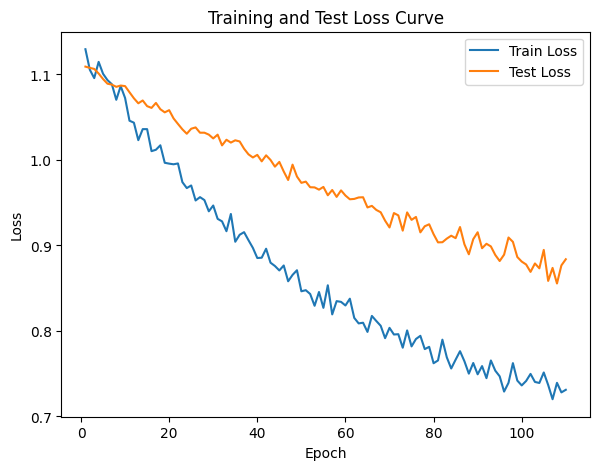

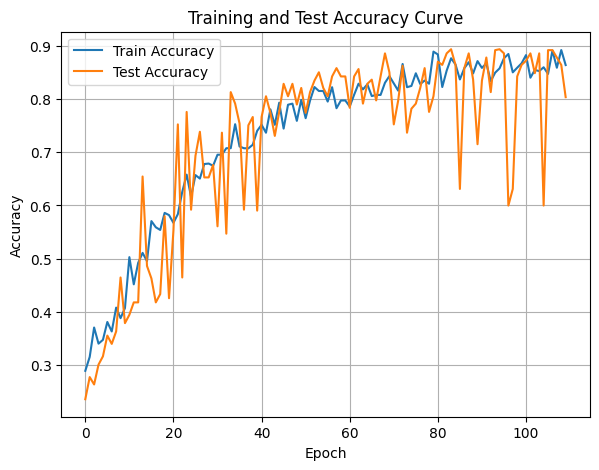

In [51]:
DTEmlp6b.train_single_model()

Randomly initializing 6 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.87it/s]

Epoch [1/10], Train F1:0.4035195265280334, Train Loss: 1.0799, Train Acc: 0.3830, Test F1:0.3534396706332606, Test Loss: 1.0825, Test Acc: 0.3880


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.99it/s]

Epoch [2/10], Train F1:0.3946694363289004, Train Loss: 1.0828, Train Acc: 0.3693, Test F1:0.3464978235061338, Test Loss: 1.0786, Test Acc: 0.3880


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.65it/s]

Epoch [3/10], Train F1:0.409065725248791, Train Loss: 1.0780, Train Acc: 0.3783, Test F1:0.32930029440903485, Test Loss: 1.0793, Test Acc: 0.3704


Epoch [4/10], Train F1:0.4339293420415838, Train Loss: 1.0728, Train Acc: 0.4068, Test F1:0.34020606851424373, Test Loss: 1.0765, Test Acc: 0.3817


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.69it/s]

Epoch [5/10], Train F1:0.43446509965142976, Train Loss: 1.0720, Train Acc: 0.4055, Test F1:0.3400154042555094, Test Loss: 1.0751, Test Acc: 0.3842
Epoch [6/10], Train F1:0.4416618573941719, Train Loss: 1.0700, Train Acc: 0.4097, Test F1:0.34109966273708964, Test Loss: 1.0725, Test Acc: 0.3848


Training Process:  70%|███████   | 7/10 [00:00<00:00, 10.16it/s]

Epoch [7/10], Train F1:0.4513647643714072, Train Loss: 1.0652, Train Acc: 0.4233, Test F1:0.34458804485716255, Test Loss: 1.0699, Test Acc: 0.3884


Training Process:  90%|█████████ | 9/10 [00:00<00:00, 10.67it/s]

Epoch [8/10], Train F1:0.4615464265652588, Train Loss: 1.0604, Train Acc: 0.4333, Test F1:0.3488381308665494, Test Loss: 1.0680, Test Acc: 0.3920
Epoch [9/10], Train F1:0.465443889303426, Train Loss: 1.0581, Train Acc: 0.4380, Test F1:0.35490369542483363, Test Loss: 1.0657, Test Acc: 0.3988


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.15it/s]


Epoch [10/10], Train F1:0.47392152800386733, Train Loss: 1.0553, Train Acc: 0.4474, Test F1:0.36115357761774025, Test Loss: 1.0636, Test Acc: 0.4043
Total Epochs: 10
Train loss start: 1.1172071695327759, Train loss end: 0.9933486580848694
Highest Mean Train Accuracy (over epoch): 0.4474107142857143
Test loss start: 1.0875635147094727, Test loss end: 1.0315910577774048
Highest mean Test Accuracy (over epoch): 0.40425347222222224


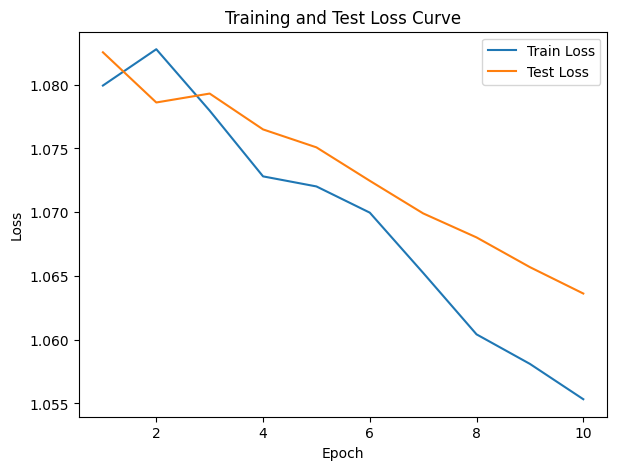

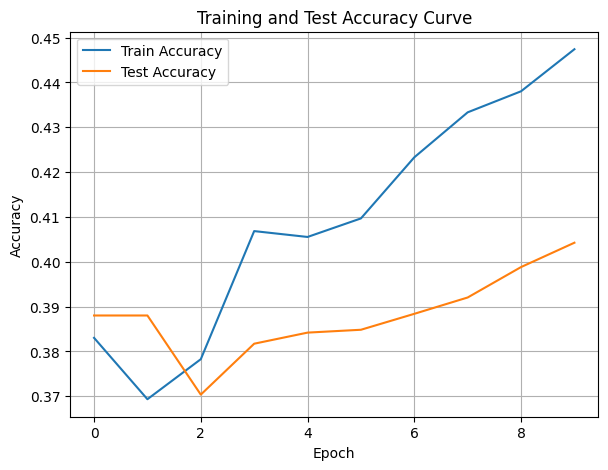

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.30186420286353655, Train Loss: 1.1030, Train Acc: 0.3533, Test F1:0.21052008295897395, Test Loss: 1.1001, Test Acc: 0.2943


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.53it/s]

Epoch [2/10], Train F1:0.31689157657307304, Train Loss: 1.0945, Train Acc: 0.3685, Test F1:0.2018841116876699, Test Loss: 1.0961, Test Acc: 0.2960


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.53it/s]

Epoch [3/10], Train F1:0.33266910643562164, Train Loss: 1.0895, Train Acc: 0.3829, Test F1:0.1973984806252391, Test Loss: 1.0947, Test Acc: 0.2940


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.47it/s]

Epoch [4/10], Train F1:0.33219127245932956, Train Loss: 1.0870, Train Acc: 0.3826, Test F1:0.1975725048960778, Test Loss: 1.0952, Test Acc: 0.2984


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.47it/s]

Epoch [5/10], Train F1:0.3480917941693705, Train Loss: 1.0808, Train Acc: 0.3981, Test F1:0.19392117867978312, Test Loss: 1.0931, Test Acc: 0.2983


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.50it/s]

Epoch [6/10], Train F1:0.36196326130041906, Train Loss: 1.0748, Train Acc: 0.4094, Test F1:0.19285631540332854, Test Loss: 1.0917, Test Acc: 0.3018


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.50it/s]

Epoch [7/10], Train F1:0.3594049177894734, Train Loss: 1.0722, Train Acc: 0.4083, Test F1:0.19640502227989406, Test Loss: 1.0905, Test Acc: 0.3054


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.41it/s]

Epoch [8/10], Train F1:0.3681546686371743, Train Loss: 1.0675, Train Acc: 0.4153, Test F1:0.1984781074132359, Test Loss: 1.0885, Test Acc: 0.3064


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.41it/s]

Epoch [9/10], Train F1:0.37393323657474603, Train Loss: 1.0631, Train Acc: 0.4204, Test F1:0.20762674412929086, Test Loss: 1.0857, Test Acc: 0.3120


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.91it/s]


Epoch [10/10], Train F1:0.382553466525907, Train Loss: 1.0605, Train Acc: 0.4250, Test F1:0.21316896287752468, Test Loss: 1.0843, Test Acc: 0.3181
Total Epochs: 10
Train loss start: 1.1055110692977905, Train loss end: 1.1344377994537354
Highest Mean Train Accuracy (over epoch): 0.4249702380952381
Test loss start: 1.1082510948181152, Test loss end: 1.0639863014221191
Highest mean Test Accuracy (over epoch): 0.31805555555555554


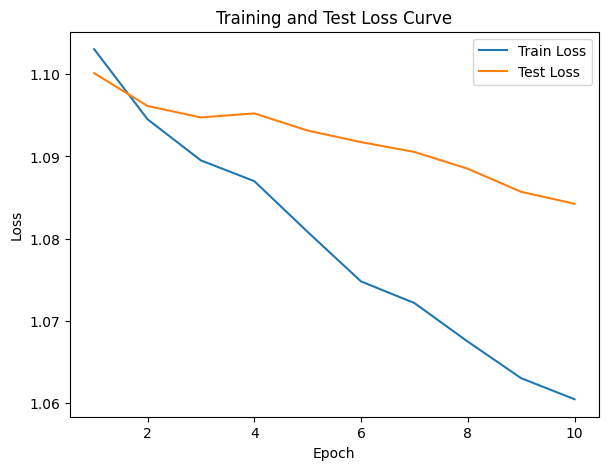

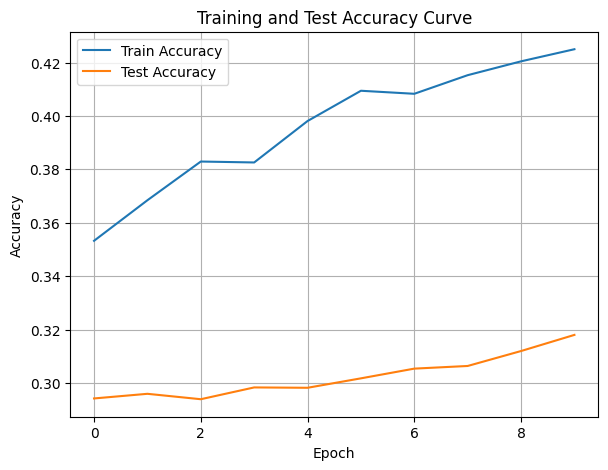

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.82it/s]

Epoch [1/10], Train F1:0.4740480232698028, Train Loss: 1.1210, Train Acc: 0.3679, Test F1:0.7480881691408006, Test Loss: 1.0472, Test Acc: 0.7214


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.43it/s]

Epoch [2/10], Train F1:0.47788388006758414, Train Loss: 1.1152, Train Acc: 0.3747, Test F1:0.7068048910154173, Test Loss: 1.0416, Test Acc: 0.7049


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.19it/s]

Epoch [3/10], Train F1:0.4863274315097689, Train Loss: 1.1098, Train Acc: 0.3882, Test F1:0.7148037346343703, Test Loss: 1.0362, Test Acc: 0.7176


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.17it/s]

Epoch [4/10], Train F1:0.49448118562654464, Train Loss: 1.1025, Train Acc: 0.3986, Test F1:0.7071834779710882, Test Loss: 1.0354, Test Acc: 0.7107


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.42it/s]

Epoch [5/10], Train F1:0.4950573661584337, Train Loss: 1.1005, Train Acc: 0.4000, Test F1:0.7109440267335005, Test Loss: 1.0366, Test Acc: 0.7097
Epoch [6/10], Train F1:0.5006750096920569, Train Loss: 1.0972, Train Acc: 0.4068, Test F1:0.7167795356768846, Test Loss: 1.0331, Test Acc: 0.7153


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.58it/s]

Epoch [7/10], Train F1:0.5053464486522167, Train Loss: 1.0941, Train Acc: 0.4134, Test F1:0.723864876916217, Test Loss: 1.0314, Test Acc: 0.7226
Epoch [8/10], Train F1:0.5165198788449614, Train Loss: 1.0891, Train Acc: 0.4224, Test F1:0.726032490916793, Test Loss: 1.0295, Test Acc: 0.7234


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.03it/s]


Epoch [9/10], Train F1:0.5239918373481105, Train Loss: 1.0844, Train Acc: 0.4298, Test F1:0.7255126918112721, Test Loss: 1.0265, Test Acc: 0.7247
Epoch [10/10], Train F1:0.5282333935051654, Train Loss: 1.0817, Train Acc: 0.4353, Test F1:0.731472067241867, Test Loss: 1.0249, Test Acc: 0.7297
Total Epochs: 10
Train loss start: 1.1694906949996948, Train loss end: 0.9802812933921814
Highest Mean Train Accuracy (over epoch): 0.43532738095238094
Test loss start: 1.0418339967727661, Test loss end: 0.9973337650299072
Highest mean Test Accuracy (over epoch): 0.7296875


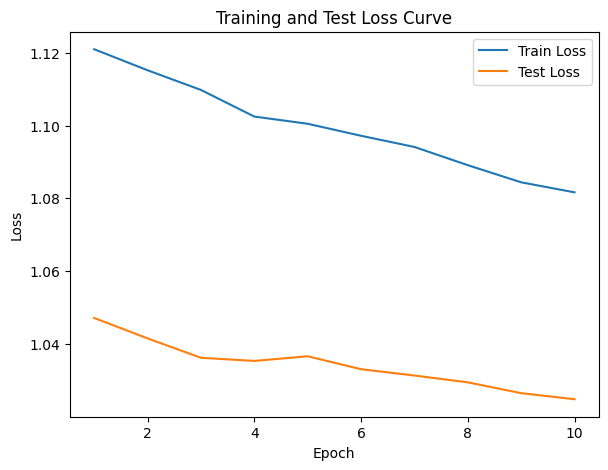

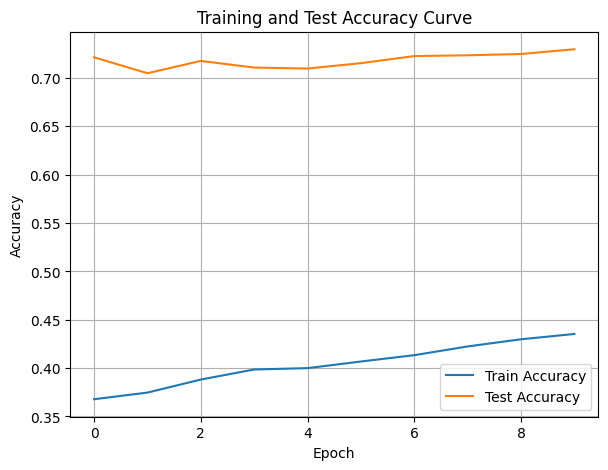

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.77it/s]

Epoch [1/10], Train F1:0.2789739136243696, Train Loss: 1.1945, Train Acc: 0.1750, Test F1:0.14035087719298245, Test Loss: 1.1592, Test Acc: 0.0825
Epoch [2/10], Train F1:0.29867238110560396, Train Loss: 1.1896, Train Acc: 0.1960, Test F1:0.11146769362430468, Test Loss: 1.1729, Test Acc: 0.0638


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.87it/s]

Epoch [3/10], Train F1:0.301882343833293, Train Loss: 1.1878, Train Acc: 0.2034, Test F1:0.12519068162208796, Test Loss: 1.1720, Test Acc: 0.0747
Epoch [4/10], Train F1:0.3066552689409378, Train Loss: 1.1845, Train Acc: 0.2065, Test F1:0.12482766760176851, Test Loss: 1.1703, Test Acc: 0.0731


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.23it/s]

Epoch [5/10], Train F1:0.30023110559798305, Train Loss: 1.1844, Train Acc: 0.2027, Test F1:0.12177938732911534, Test Loss: 1.1699, Test Acc: 0.0707
Epoch [6/10], Train F1:0.30615429351417806, Train Loss: 1.1810, Train Acc: 0.2063, Test F1:0.12444870366294715, Test Loss: 1.1691, Test Acc: 0.0736


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.71it/s]

Epoch [7/10], Train F1:0.30890706108423593, Train Loss: 1.1783, Train Acc: 0.2114, Test F1:0.13054673157056776, Test Loss: 1.1676, Test Acc: 0.0780
Epoch [8/10], Train F1:0.3171644922515821, Train Loss: 1.1754, Train Acc: 0.2185, Test F1:0.13508581154861093, Test Loss: 1.1650, Test Acc: 0.0813
Epoch [9/10], Train F1:0.3221462527654632, Train Loss: 1.1722, Train Acc: 0.2225, Test F1:0.1449061875550515, Test Loss: 1.1628, Test Acc: 0.0873


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.47it/s]


Epoch [10/10], Train F1:0.3276065139910489, Train Loss: 1.1692, Train Acc: 0.2270, Test F1:0.15286952455009212, Test Loss: 1.1608, Test Acc: 0.0921
Total Epochs: 10
Train loss start: 1.221802830696106, Train loss end: 1.1196563243865967
Highest Mean Train Accuracy (over epoch): 0.22696428571428573
Test loss start: 1.168901801109314, Test loss end: 1.1485247611999512
Highest mean Test Accuracy (over epoch): 0.09210069444444444


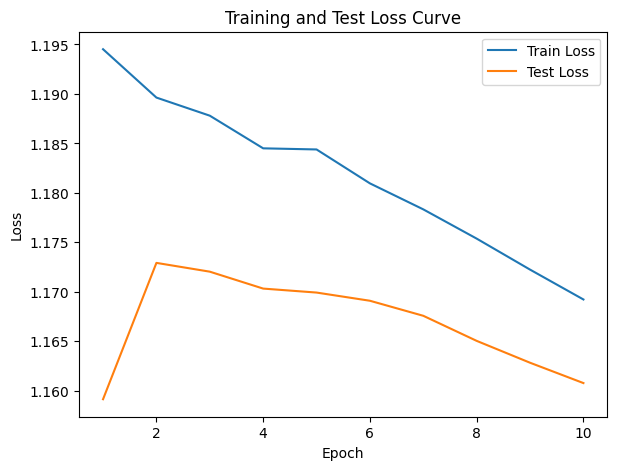

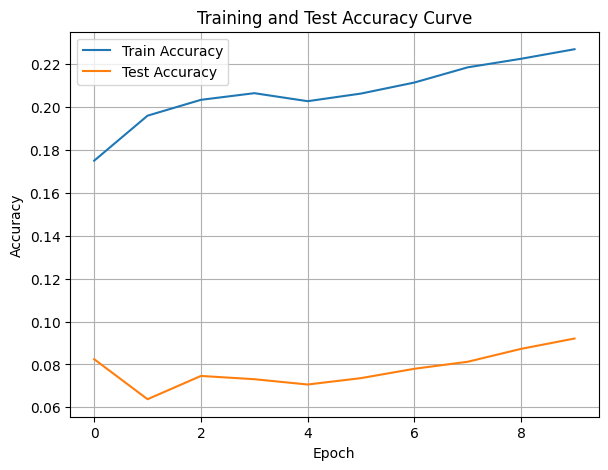

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.39640566856242754, Train Loss: 1.1154, Train Acc: 0.3304, Test F1:0.595787837893101, Test Loss: 1.0506, Test Acc: 0.6016


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.74it/s]

Epoch [2/10], Train F1:0.4094301027476377, Train Loss: 1.1081, Train Acc: 0.3461, Test F1:0.5847192252765008, Test Loss: 1.0399, Test Acc: 0.6155


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.74it/s]

Epoch [3/10], Train F1:0.4144244755465037, Train Loss: 1.1060, Train Acc: 0.3542, Test F1:0.5815771433012209, Test Loss: 1.0334, Test Acc: 0.6247


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.09it/s]

Epoch [4/10], Train F1:0.41449160997529566, Train Loss: 1.1060, Train Acc: 0.3495, Test F1:0.588154780426809, Test Loss: 1.0288, Test Acc: 0.6372


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.09it/s]

Epoch [5/10], Train F1:0.418779680453258, Train Loss: 1.1025, Train Acc: 0.3555, Test F1:0.5920631883488842, Test Loss: 1.0249, Test Acc: 0.6446


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.99it/s]

Epoch [6/10], Train F1:0.43169648226612645, Train Loss: 1.0975, Train Acc: 0.3678, Test F1:0.5982823835016119, Test Loss: 1.0212, Test Acc: 0.6545


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.99it/s]

Epoch [7/10], Train F1:0.42948088979463955, Train Loss: 1.0954, Train Acc: 0.3676, Test F1:0.6053464916489478, Test Loss: 1.0197, Test Acc: 0.6596


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.99it/s]

Epoch [8/10], Train F1:0.4389728033482528, Train Loss: 1.0922, Train Acc: 0.3790, Test F1:0.6086883202061727, Test Loss: 1.0172, Test Acc: 0.6651


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  8.85it/s]

Epoch [9/10], Train F1:0.4502140126972001, Train Loss: 1.0880, Train Acc: 0.3905, Test F1:0.6160665436849931, Test Loss: 1.0149, Test Acc: 0.6721


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.24it/s]


Epoch [10/10], Train F1:0.45706883833163187, Train Loss: 1.0840, Train Acc: 0.3974, Test F1:0.6225838462115504, Test Loss: 1.0126, Test Acc: 0.6790
Total Epochs: 10
Train loss start: 1.0910037755966187, Train loss end: 1.0123319625854492
Highest Mean Train Accuracy (over epoch): 0.3974404761904762
Test loss start: 1.0476408004760742, Test loss end: 0.9950307011604309
Highest mean Test Accuracy (over epoch): 0.6789930555555556


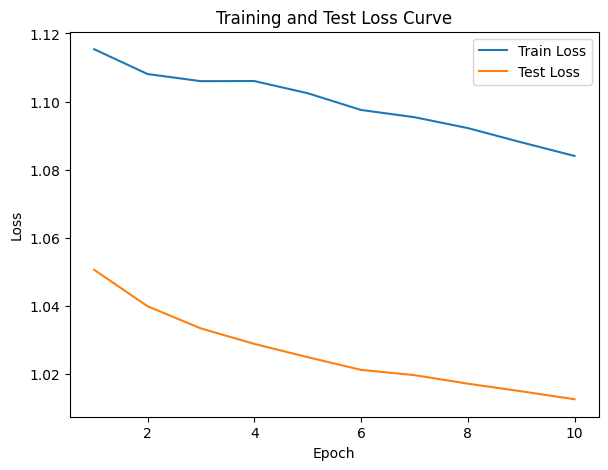

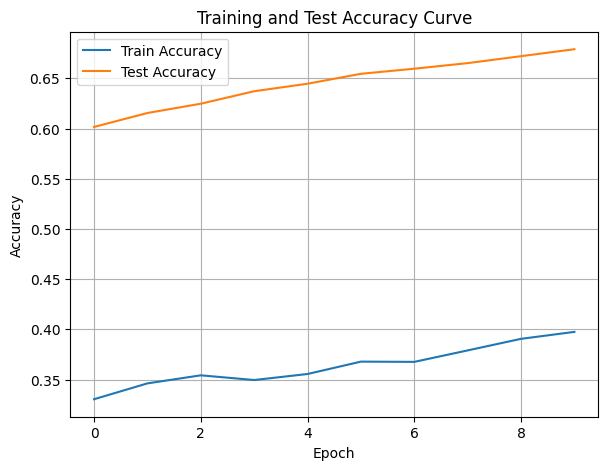

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.01it/s]

Epoch [1/10], Train F1:0.4022425415789657, Train Loss: 1.1030, Train Acc: 0.3634, Test F1:0.22687787429739395, Test Loss: 1.1218, Test Acc: 0.1649


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.11it/s]

Epoch [2/10], Train F1:0.39962312197606314, Train Loss: 1.1077, Train Acc: 0.3579, Test F1:0.23349022963913849, Test Loss: 1.1226, Test Acc: 0.1610


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.59it/s]

Epoch [3/10], Train F1:0.40043043751577767, Train Loss: 1.1045, Train Acc: 0.3548, Test F1:0.23632117837255248, Test Loss: 1.1236, Test Acc: 0.1597


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.59it/s]

Epoch [4/10], Train F1:0.40501172030583793, Train Loss: 1.1031, Train Acc: 0.3554, Test F1:0.22967942905533273, Test Loss: 1.1259, Test Acc: 0.1497


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.36it/s]

Epoch [5/10], Train F1:0.42280280629277933, Train Loss: 1.0979, Train Acc: 0.3679, Test F1:0.22750620758109202, Test Loss: 1.1258, Test Acc: 0.1481


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.36it/s]

Epoch [6/10], Train F1:0.43568947657508544, Train Loss: 1.0942, Train Acc: 0.3827, Test F1:0.23745767928593411, Test Loss: 1.1233, Test Acc: 0.1558


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.83it/s]

Epoch [7/10], Train F1:0.440937820477063, Train Loss: 1.0923, Train Acc: 0.3924, Test F1:0.2547555797331399, Test Loss: 1.1196, Test Acc: 0.1689


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.18it/s]

Epoch [8/10], Train F1:0.44631642370143637, Train Loss: 1.0892, Train Acc: 0.4005, Test F1:0.2710367096268708, Test Loss: 1.1159, Test Acc: 0.1816


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.18it/s]

Epoch [9/10], Train F1:0.4514955953060541, Train Loss: 1.0855, Train Acc: 0.4062, Test F1:0.30146801560630254, Test Loss: 1.1115, Test Acc: 0.2070


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.30it/s]


Epoch [10/10], Train F1:0.45653657185576846, Train Loss: 1.0835, Train Acc: 0.4117, Test F1:0.30881600260221287, Test Loss: 1.1095, Test Acc: 0.2128
Total Epochs: 10
Train loss start: 1.1020333766937256, Train loss end: 1.172940969467163
Highest Mean Train Accuracy (over epoch): 0.4116964285714285
Test loss start: 1.1135414838790894, Test loss end: 1.0843340158462524
Highest mean Test Accuracy (over epoch): 0.2127604166666667


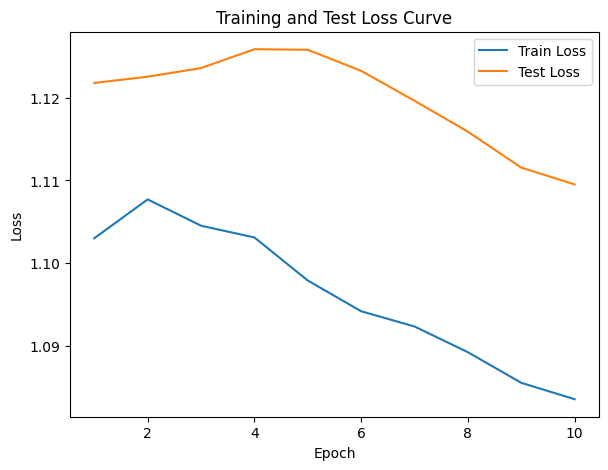

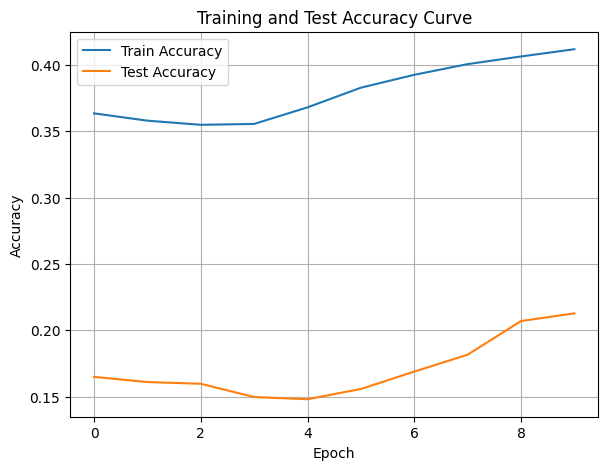

./saved_models/model_6.pth
Training Model with id 11
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.26it/s]

Epoch [1/10], Train F1:0.5301102613602614, Train Loss: 1.0562, Train Acc: 0.4878, Test F1:0.37573546506429173, Test Loss: 1.0913, Test Acc: 0.2708
Epoch [2/10], Train F1:0.49687142349125046, Train Loss: 1.0571, Train Acc: 0.4612, Test F1:0.36235032024505703, Test Loss: 1.0921, Test Acc: 0.2552


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.49it/s]

Epoch [3/10], Train F1:0.5349498128282728, Train Loss: 1.0434, Train Acc: 0.4982, Test F1:0.38709299740761927, Test Loss: 1.0890, Test Acc: 0.2812
Epoch [4/10], Train F1:0.5480198159411163, Train Loss: 1.0351, Train Acc: 0.5216, Test F1:0.44684202026187686, Test Loss: 1.0830, Test Acc: 0.3531


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.71it/s]

Epoch [5/10], Train F1:0.554235498741621, Train Loss: 1.0330, Train Acc: 0.5296, Test F1:0.4565745180699388, Test Loss: 1.0814, Test Acc: 0.3628
Epoch [6/10], Train F1:0.5625766150158444, Train Loss: 1.0305, Train Acc: 0.5379, Test F1:0.4829335788633856, Test Loss: 1.0780, Test Acc: 0.3971


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.31it/s]

Epoch [7/10], Train F1:0.5668309256880686, Train Loss: 1.0261, Train Acc: 0.5469, Test F1:0.5091975143758781, Test Loss: 1.0731, Test Acc: 0.4356
Epoch [8/10], Train F1:0.573013996225082, Train Loss: 1.0238, Train Acc: 0.5534, Test F1:0.5224329174491686, Test Loss: 1.0700, Test Acc: 0.4562


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.98it/s]


Epoch [9/10], Train F1:0.5743869469139845, Train Loss: 1.0213, Train Acc: 0.5536, Test F1:0.536672253777517, Test Loss: 1.0680, Test Acc: 0.4737
Epoch [10/10], Train F1:0.5781156677478654, Train Loss: 1.0187, Train Acc: 0.5574, Test F1:0.5481876517908083, Test Loss: 1.0649, Test Acc: 0.4930
Total Epochs: 10
Train loss start: 1.0596153736114502, Train loss end: 1.0908401012420654
Highest Mean Train Accuracy (over epoch): 0.5573511904761904
Test loss start: 1.081952452659607, Test loss end: 1.025894284248352
Highest mean Test Accuracy (over epoch): 0.49296875


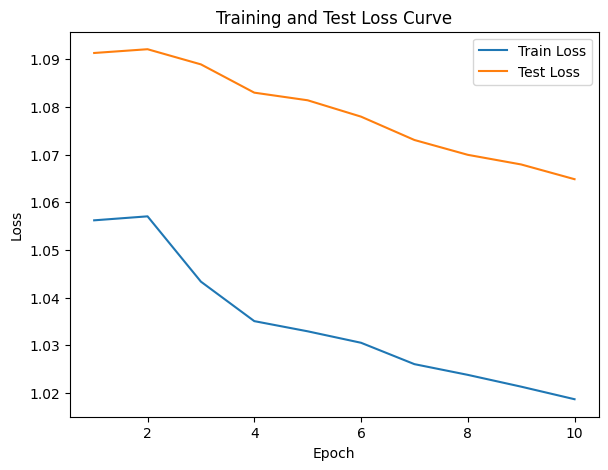

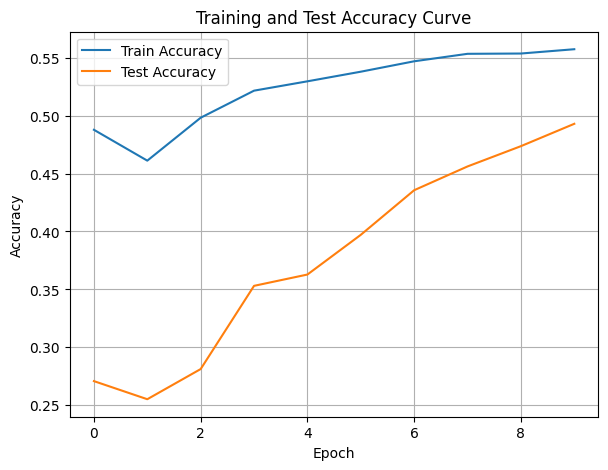

./saved_models/model_11.pth
Training Model with id 9
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.6799430395606141, Train Loss: 0.9686, Train Acc: 0.6863, Test F1:0.6676708677865416, Test Loss: 1.0312, Test Acc: 0.7040


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.37it/s]

Epoch [2/10], Train F1:0.6721471670975657, Train Loss: 0.9711, Train Acc: 0.6673, Test F1:0.6627478459462267, Test Loss: 1.0299, Test Acc: 0.7001
Epoch [3/10], Train F1:0.6642437576473403, Train Loss: 0.9681, Train Acc: 0.6628, Test F1:0.6552618348283983, Test Loss: 1.0286, Test Acc: 0.6962


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.98it/s]

Epoch [4/10], Train F1:0.6702340480860802, Train Loss: 0.9644, Train Acc: 0.6710, Test F1:0.6601470943078116, Test Loss: 1.0249, Test Acc: 0.7020
Epoch [5/10], Train F1:0.6683637086414823, Train Loss: 0.9633, Train Acc: 0.6696, Test F1:0.6673511175937268, Test Loss: 1.0228, Test Acc: 0.7083


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.71it/s]

Epoch [6/10], Train F1:0.6703456996655508, Train Loss: 0.9604, Train Acc: 0.6717, Test F1:0.6728595036340314, Test Loss: 1.0200, Test Acc: 0.7138
Epoch [7/10], Train F1:0.6736433556177119, Train Loss: 0.9576, Train Acc: 0.6755, Test F1:0.675631376382341, Test Loss: 1.0189, Test Acc: 0.7166


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.60it/s]

Epoch [8/10], Train F1:0.6771422083422964, Train Loss: 0.9547, Train Acc: 0.6796, Test F1:0.6755049923018062, Test Loss: 1.0167, Test Acc: 0.7188
Epoch [9/10], Train F1:0.6811323041545395, Train Loss: 0.9506, Train Acc: 0.6834, Test F1:0.6767027098360071, Test Loss: 1.0138, Test Acc: 0.7219


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.78it/s]


Epoch [10/10], Train F1:0.6872346003507113, Train Loss: 0.9475, Train Acc: 0.6899, Test F1:0.6806009407700133, Test Loss: 1.0107, Test Acc: 0.7266
Total Epochs: 10
Train loss start: 0.9932248592376709, Train loss end: 0.8952046632766724
Highest Mean Train Accuracy (over epoch): 0.6898511904761906
Test loss start: 1.0208191871643066, Test loss end: 0.9745029807090759
Highest mean Test Accuracy (over epoch): 0.7266493055555555


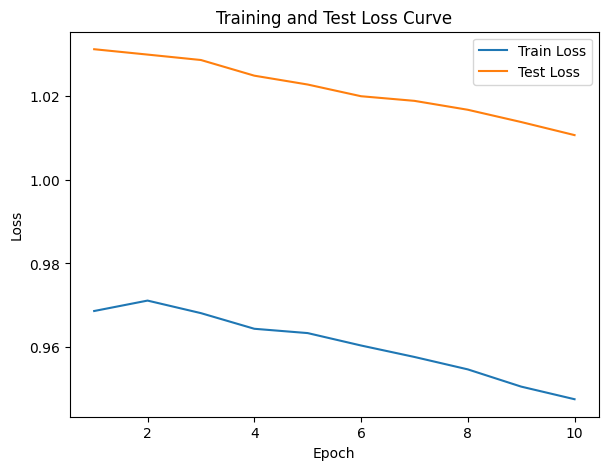

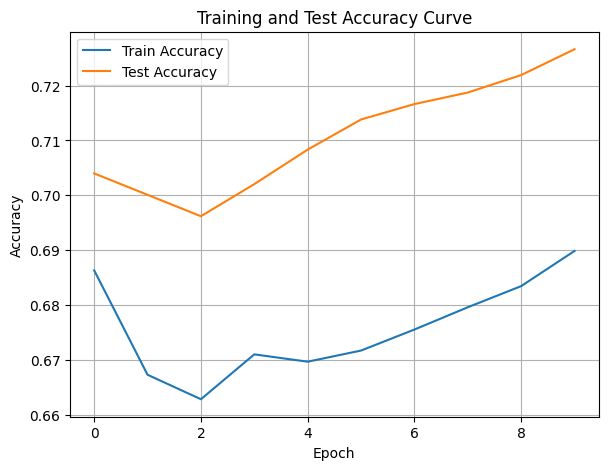

./saved_models/model_9.pth
Training Model with id 12
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.38it/s]

Epoch [1/10], Train F1:0.709873052684802, Train Loss: 0.9138, Train Acc: 0.7280, Test F1:0.7296279811579689, Test Loss: 0.9877, Test Acc: 0.7708


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.97it/s]

Epoch [2/10], Train F1:0.7167073701606199, Train Loss: 0.9085, Train Acc: 0.7315, Test F1:0.7270053747084474, Test Loss: 0.9798, Test Acc: 0.7739
Epoch [3/10], Train F1:0.723843434202601, Train Loss: 0.9057, Train Acc: 0.7337, Test F1:0.7261033017325924, Test Loss: 0.9796, Test Acc: 0.7749


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.97it/s]

Epoch [4/10], Train F1:0.7256541621427475, Train Loss: 0.9054, Train Acc: 0.7367, Test F1:0.7248528771670317, Test Loss: 0.9761, Test Acc: 0.7754


Training Process:  50%|█████     | 5/10 [00:00<00:00, 11.39it/s]

Epoch [5/10], Train F1:0.7324950905492937, Train Loss: 0.9013, Train Acc: 0.7441, Test F1:0.7267074475602123, Test Loss: 0.9730, Test Acc: 0.7773


Training Process:  50%|█████     | 5/10 [00:00<00:00, 11.39it/s]

Epoch [6/10], Train F1:0.7336175475908463, Train Loss: 0.9005, Train Acc: 0.7440, Test F1:0.7266771064740463, Test Loss: 0.9687, Test Acc: 0.7762


Training Process:  70%|███████   | 7/10 [00:00<00:00, 10.00it/s]

Epoch [7/10], Train F1:0.7318709317685798, Train Loss: 0.8987, Train Acc: 0.7444, Test F1:0.7295770289922338, Test Loss: 0.9660, Test Acc: 0.7785


Training Process:  70%|███████   | 7/10 [00:00<00:00, 10.00it/s]

Epoch [8/10], Train F1:0.732168010089795, Train Loss: 0.8960, Train Acc: 0.7451, Test F1:0.7317433856586412, Test Loss: 0.9635, Test Acc: 0.7803


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.73it/s]

Epoch [9/10], Train F1:0.7360894713588556, Train Loss: 0.8935, Train Acc: 0.7480, Test F1:0.7334232810578972, Test Loss: 0.9608, Test Acc: 0.7816


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.06it/s]


Epoch [10/10], Train F1:0.7390071758650992, Train Loss: 0.8906, Train Acc: 0.7502, Test F1:0.7334870242377534, Test Loss: 0.9587, Test Acc: 0.7819
Total Epochs: 10
Train loss start: 0.9131149053573608, Train loss end: 0.8834918141365051
Highest Mean Train Accuracy (over epoch): 0.7502380952380953
Test loss start: 0.9740303754806519, Test loss end: 0.9257326126098633
Highest mean Test Accuracy (over epoch): 0.7819444444444444


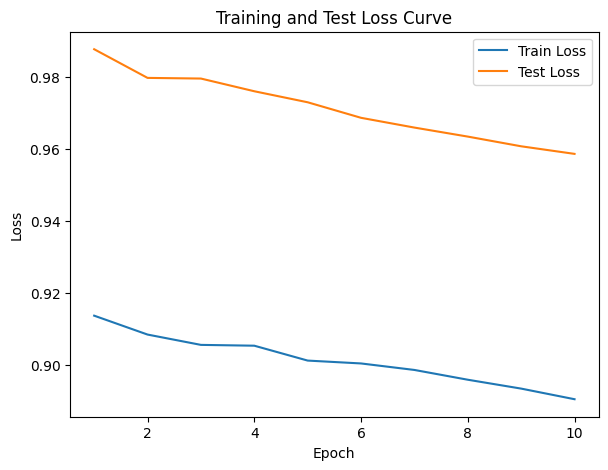

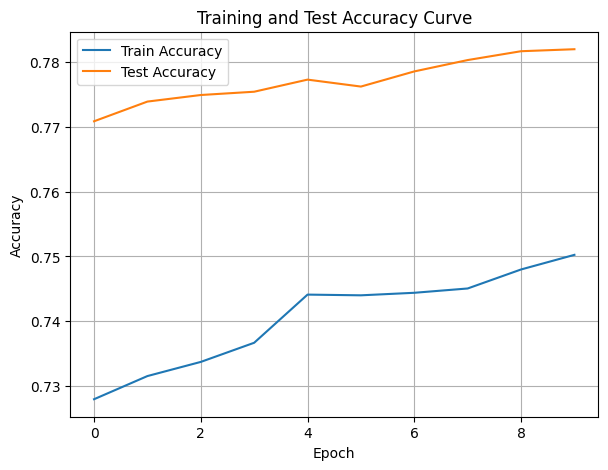

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.7663893064482686, Train Loss: 0.8734, Train Acc: 0.7693, Test F1:0.7340637673366045, Test Loss: 0.9382, Test Acc: 0.7847


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.75it/s]

Epoch [2/10], Train F1:0.7713719204280903, Train Loss: 0.8619, Train Acc: 0.7836, Test F1:0.7467064929796905, Test Loss: 0.9335, Test Acc: 0.7925


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.22it/s]

Epoch [3/10], Train F1:0.7875077889319246, Train Loss: 0.8580, Train Acc: 0.7977, Test F1:0.7564260798489012, Test Loss: 0.9290, Test Acc: 0.7957


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.22it/s]

Epoch [4/10], Train F1:0.787506839757329, Train Loss: 0.8583, Train Acc: 0.7937, Test F1:0.7601154774239193, Test Loss: 0.9232, Test Acc: 0.7988


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.80it/s]

Epoch [5/10], Train F1:0.7855327019090084, Train Loss: 0.8573, Train Acc: 0.7939, Test F1:0.762323094598795, Test Loss: 0.9211, Test Acc: 0.8007


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.68it/s]

Epoch [6/10], Train F1:0.7846823621452405, Train Loss: 0.8541, Train Acc: 0.7932, Test F1:0.7617813421640309, Test Loss: 0.9199, Test Acc: 0.8006


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.42it/s]

Epoch [7/10], Train F1:0.7860387429316419, Train Loss: 0.8516, Train Acc: 0.7952, Test F1:0.7602658160552898, Test Loss: 0.9190, Test Acc: 0.7986


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.68it/s]

Epoch [8/10], Train F1:0.7874887538172366, Train Loss: 0.8478, Train Acc: 0.7969, Test F1:0.7631327909793455, Test Loss: 0.9173, Test Acc: 0.8008


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  8.97it/s]

Epoch [9/10], Train F1:0.7890029846200114, Train Loss: 0.8455, Train Acc: 0.7979, Test F1:0.7640209392477486, Test Loss: 0.9152, Test Acc: 0.8016


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.15it/s]


Epoch [10/10], Train F1:0.7899688877641612, Train Loss: 0.8436, Train Acc: 0.7983, Test F1:0.7647311150061543, Test Loss: 0.9136, Test Acc: 0.8023
Total Epochs: 10
Train loss start: 0.8352488279342651, Train loss end: 0.8044728636741638
Highest Mean Train Accuracy (over epoch): 0.7983035714285714
Test loss start: 0.9215400218963623, Test loss end: 0.8812209367752075
Highest mean Test Accuracy (over epoch): 0.8022569444444445


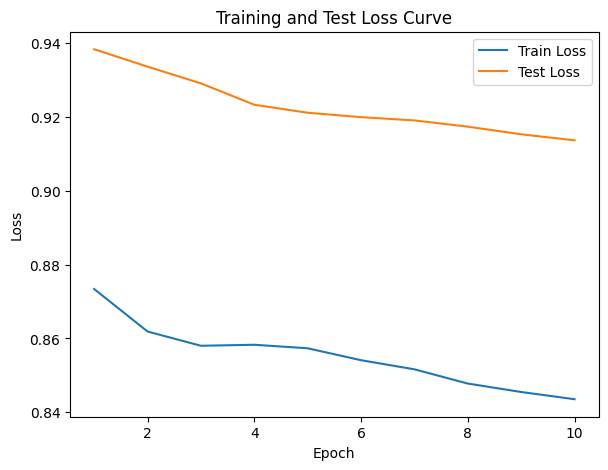

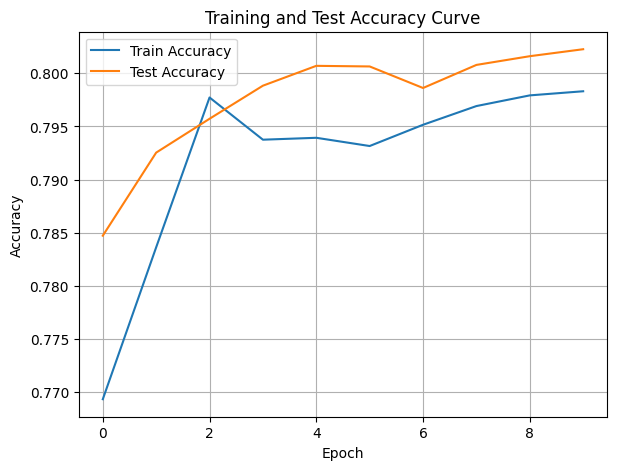

./saved_models/model_10.pth
Training Model with id 8
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.7939861224015355, Train Loss: 0.8277, Train Acc: 0.7943, Test F1:0.7829045229707128, Test Loss: 0.8888, Test Acc: 0.8160


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.66it/s]

Epoch [2/10], Train F1:0.7945367031081317, Train Loss: 0.8268, Train Acc: 0.7933, Test F1:0.7770388613379681, Test Loss: 0.8858, Test Acc: 0.8121


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.18it/s]

Epoch [3/10], Train F1:0.7932695349383551, Train Loss: 0.8195, Train Acc: 0.7940, Test F1:0.7790011095519304, Test Loss: 0.8867, Test Acc: 0.8134


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.60it/s]

Epoch [4/10], Train F1:0.7920569062937698, Train Loss: 0.8183, Train Acc: 0.7976, Test F1:0.7866832296492826, Test Loss: 0.8864, Test Acc: 0.8164


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.79it/s]

Epoch [5/10], Train F1:0.7996950858234451, Train Loss: 0.8135, Train Acc: 0.8073, Test F1:0.7843181069864802, Test Loss: 0.8859, Test Acc: 0.8135


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.71it/s]

Epoch [6/10], Train F1:0.8018065351006893, Train Loss: 0.8114, Train Acc: 0.8088, Test F1:0.7802197044674555, Test Loss: 0.8852, Test Acc: 0.8113


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.87it/s]

Epoch [7/10], Train F1:0.802580755730901, Train Loss: 0.8084, Train Acc: 0.8106, Test F1:0.779454181476931, Test Loss: 0.8821, Test Acc: 0.8100


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.11it/s]

Epoch [8/10], Train F1:0.807409175857533, Train Loss: 0.8046, Train Acc: 0.8149, Test F1:0.7784281951726801, Test Loss: 0.8807, Test Acc: 0.8098


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.20it/s]

Epoch [9/10], Train F1:0.8119739390035178, Train Loss: 0.8023, Train Acc: 0.8191, Test F1:0.778924825953217, Test Loss: 0.8795, Test Acc: 0.8105


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.68it/s]


Epoch [10/10], Train F1:0.8129345449453744, Train Loss: 0.8005, Train Acc: 0.8195, Test F1:0.779322262890113, Test Loss: 0.8768, Test Acc: 0.8110
Total Epochs: 10
Train loss start: 0.7785991430282593, Train loss end: 0.7877843976020813
Highest Mean Train Accuracy (over epoch): 0.8194642857142855
Test loss start: 0.8729318380355835, Test loss end: 0.8345195055007935
Highest mean Test Accuracy (over epoch): 0.81640625


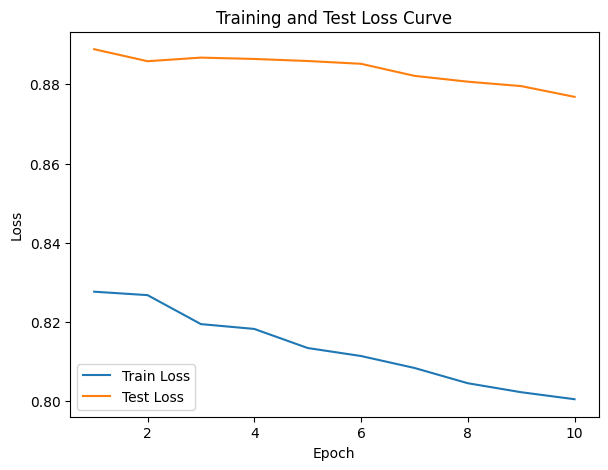

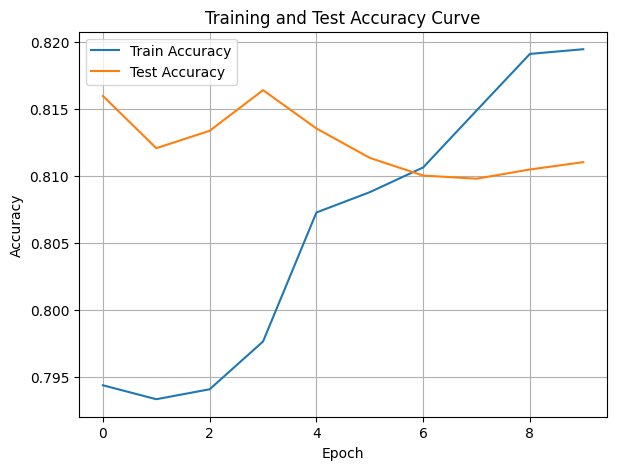

./saved_models/model_8.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [52]:
DTEmlp6b.train_DTE()

Training Process:   1%|          | 1/110 [00:00<00:13,  7.99it/s]

Epoch [1/110], Train F1:0.406089756241732, Train Loss: 1.1057, Train Acc: 0.3661, Test F1:0.2935129502005407, Test Loss: 1.1109, Test Acc: 0.2569


Training Process:   1%|          | 1/110 [00:00<00:13,  7.99it/s]

Epoch [2/110], Train F1:0.4058382768040056, Train Loss: 1.1076, Train Acc: 0.3613, Test F1:0.27058452259896915, Test Loss: 1.1047, Test Acc: 0.2617


Training Process:   3%|▎         | 3/110 [00:00<00:11,  9.50it/s]

Epoch [3/110], Train F1:0.4025465047419109, Train Loss: 1.1081, Train Acc: 0.3608, Test F1:0.30139906127654653, Test Loss: 1.0972, Test Acc: 0.2908


Training Process:   3%|▎         | 3/110 [00:00<00:11,  9.50it/s]

Epoch [4/110], Train F1:0.4220568183281521, Train Loss: 1.1020, Train Acc: 0.3804, Test F1:0.3758690810134038, Test Loss: 1.0891, Test Acc: 0.3459


Training Process:   5%|▍         | 5/110 [00:00<00:10,  9.96it/s]

Epoch [5/110], Train F1:0.4232825435694764, Train Loss: 1.0983, Train Acc: 0.3867, Test F1:0.4185589534389359, Test Loss: 1.0867, Test Acc: 0.3790


Training Process:   5%|▌         | 6/110 [00:00<00:10,  9.75it/s]

Epoch [6/110], Train F1:0.43475234986856964, Train Loss: 1.0931, Train Acc: 0.3966, Test F1:0.46829846856949625, Test Loss: 1.0816, Test Acc: 0.4206


Training Process:   6%|▋         | 7/110 [00:00<00:10,  9.76it/s]

Epoch [7/110], Train F1:0.4442454037609108, Train Loss: 1.0885, Train Acc: 0.4070, Test F1:0.503188215202243, Test Loss: 1.0756, Test Acc: 0.4560


Training Process:   7%|▋         | 8/110 [00:00<00:10,  9.82it/s]

Epoch [8/110], Train F1:0.4604366541706049, Train Loss: 1.0813, Train Acc: 0.4243, Test F1:0.5330377949463516, Test Loss: 1.0700, Test Acc: 0.4882


Training Process:   8%|▊         | 9/110 [00:00<00:10,  9.60it/s]

Epoch [9/110], Train F1:0.46949890643197184, Train Loss: 1.0774, Train Acc: 0.4329, Test F1:0.5558177051824964, Test Loss: 1.0663, Test Acc: 0.5119


Training Process:   9%|▉         | 10/110 [00:01<00:11,  8.38it/s]

Epoch [10/110], Train F1:0.4782591030610741, Train Loss: 1.0736, Train Acc: 0.4431, Test F1:0.5642478288745119, Test Loss: 1.0646, Test Acc: 0.5214


Training Process:  11%|█         | 12/110 [00:01<00:13,  7.25it/s]

Epoch [11/110], Train F1:0.48393333359887253, Train Loss: 1.0710, Train Acc: 0.4497, Test F1:0.5798763433964158, Test Loss: 1.0611, Test Acc: 0.5396
Epoch [12/110], Train F1:0.48960873950038014, Train Loss: 1.0675, Train Acc: 0.4554, Test F1:0.5913709285163197, Test Loss: 1.0586, Test Acc: 0.5523


Training Process:  13%|█▎        | 14/110 [00:01<00:13,  7.08it/s]

Epoch [13/110], Train F1:0.5001731820395056, Train Loss: 1.0632, Train Acc: 0.4664, Test F1:0.602988477091315, Test Loss: 1.0566, Test Acc: 0.5648
Epoch [14/110], Train F1:0.5089064537537356, Train Loss: 1.0593, Train Acc: 0.4739, Test F1:0.614480422151146, Test Loss: 1.0528, Test Acc: 0.5782


Training Process:  15%|█▍        | 16/110 [00:01<00:13,  7.22it/s]

Epoch [15/110], Train F1:0.517152740455538, Train Loss: 1.0546, Train Acc: 0.4824, Test F1:0.6249735795651815, Test Loss: 1.0498, Test Acc: 0.5904
Epoch [16/110], Train F1:0.5244323273745821, Train Loss: 1.0505, Train Acc: 0.4903, Test F1:0.633969592231775, Test Loss: 1.0463, Test Acc: 0.6014


Training Process:  16%|█▋        | 18/110 [00:02<00:12,  7.32it/s]

Epoch [17/110], Train F1:0.5301946477446412, Train Loss: 1.0463, Train Acc: 0.4973, Test F1:0.641530578970943, Test Loss: 1.0445, Test Acc: 0.6098
Epoch [18/110], Train F1:0.5355615003864319, Train Loss: 1.0426, Train Acc: 0.5037, Test F1:0.6508411301612745, Test Loss: 1.0415, Test Acc: 0.6203


Training Process:  18%|█▊        | 20/110 [00:02<00:14,  6.40it/s]

Epoch [19/110], Train F1:0.5419402509279254, Train Loss: 1.0390, Train Acc: 0.5109, Test F1:0.6598202803278987, Test Loss: 1.0388, Test Acc: 0.6311
Epoch [20/110], Train F1:0.5501913387284182, Train Loss: 1.0345, Train Acc: 0.5194, Test F1:0.6659965418619576, Test Loss: 1.0361, Test Acc: 0.6383


Training Process:  20%|██        | 22/110 [00:02<00:13,  6.43it/s]

Epoch [21/110], Train F1:0.557008558753956, Train Loss: 1.0303, Train Acc: 0.5269, Test F1:0.6725272588368917, Test Loss: 1.0329, Test Acc: 0.6456
Epoch [22/110], Train F1:0.5642072287512644, Train Loss: 1.0260, Train Acc: 0.5346, Test F1:0.6794700282001186, Test Loss: 1.0304, Test Acc: 0.6533


Training Process:  22%|██▏       | 24/110 [00:03<00:13,  6.60it/s]

Epoch [23/110], Train F1:0.569782794070011, Train Loss: 1.0223, Train Acc: 0.5408, Test F1:0.6844995444179347, Test Loss: 1.0274, Test Acc: 0.6589
Epoch [24/110], Train F1:0.5760477479672834, Train Loss: 1.0181, Train Acc: 0.5480, Test F1:0.6893481374086063, Test Loss: 1.0244, Test Acc: 0.6647


Training Process:  24%|██▎       | 26/110 [00:03<00:12,  6.89it/s]

Epoch [25/110], Train F1:0.5823498920273935, Train Loss: 1.0144, Train Acc: 0.5546, Test F1:0.6934021141814917, Test Loss: 1.0212, Test Acc: 0.6700
Epoch [26/110], Train F1:0.5885378167234067, Train Loss: 1.0104, Train Acc: 0.5614, Test F1:0.6981348220172748, Test Loss: 1.0180, Test Acc: 0.6755


Training Process:  25%|██▌       | 28/110 [00:03<00:12,  6.83it/s]

Epoch [27/110], Train F1:0.5940642602987282, Train Loss: 1.0065, Train Acc: 0.5680, Test F1:0.70268509746415, Test Loss: 1.0152, Test Acc: 0.6807
Epoch [28/110], Train F1:0.5986934073959183, Train Loss: 1.0029, Train Acc: 0.5735, Test F1:0.7070708514313453, Test Loss: 1.0124, Test Acc: 0.6861


Training Process:  27%|██▋       | 30/110 [00:04<00:12,  6.45it/s]

Epoch [29/110], Train F1:0.6038742483156719, Train Loss: 0.9995, Train Acc: 0.5790, Test F1:0.7103737228933686, Test Loss: 1.0096, Test Acc: 0.6902
Epoch [30/110], Train F1:0.6101630115304624, Train Loss: 0.9955, Train Acc: 0.5860, Test F1:0.7133074290918129, Test Loss: 1.0068, Test Acc: 0.6936


Training Process:  29%|██▉       | 32/110 [00:04<00:11,  6.59it/s]

Epoch [31/110], Train F1:0.6148722773854911, Train Loss: 0.9921, Train Acc: 0.5913, Test F1:0.7172606645275104, Test Loss: 1.0045, Test Acc: 0.6984
Epoch [32/110], Train F1:0.6191924419283162, Train Loss: 0.9884, Train Acc: 0.5964, Test F1:0.720564649365355, Test Loss: 1.0021, Test Acc: 0.7026


Training Process:  31%|███       | 34/110 [00:04<00:11,  6.54it/s]

Epoch [33/110], Train F1:0.6243995912806942, Train Loss: 0.9847, Train Acc: 0.6018, Test F1:0.7237515690344635, Test Loss: 0.9996, Test Acc: 0.7065
Epoch [34/110], Train F1:0.6298237301736066, Train Loss: 0.9805, Train Acc: 0.6080, Test F1:0.7276564522648244, Test Loss: 0.9976, Test Acc: 0.7110


Training Process:  33%|███▎      | 36/110 [00:05<00:11,  6.54it/s]

Epoch [35/110], Train F1:0.6339074005680436, Train Loss: 0.9772, Train Acc: 0.6130, Test F1:0.7309818312906686, Test Loss: 0.9950, Test Acc: 0.7149
Epoch [36/110], Train F1:0.6386530295767416, Train Loss: 0.9738, Train Acc: 0.6186, Test F1:0.7337760641360003, Test Loss: 0.9925, Test Acc: 0.7182


Training Process:  34%|███▎      | 37/110 [00:05<00:11,  6.44it/s]

Epoch [37/110], Train F1:0.6430803649951368, Train Loss: 0.9703, Train Acc: 0.6237, Test F1:0.736281035023522, Test Loss: 0.9898, Test Acc: 0.7216


Training Process:  35%|███▍      | 38/110 [00:05<00:12,  5.62it/s]

Epoch [38/110], Train F1:0.6469429195502364, Train Loss: 0.9673, Train Acc: 0.6279, Test F1:0.7394651480270079, Test Loss: 0.9871, Test Acc: 0.7255


Training Process:  36%|███▋      | 40/110 [00:05<00:12,  5.52it/s]

Epoch [39/110], Train F1:0.6512052526166531, Train Loss: 0.9639, Train Acc: 0.6327, Test F1:0.7426213070125649, Test Loss: 0.9845, Test Acc: 0.7291
Epoch [40/110], Train F1:0.6548144388746534, Train Loss: 0.9610, Train Acc: 0.6368, Test F1:0.7455485437820392, Test Loss: 0.9823, Test Acc: 0.7324


Training Process:  37%|███▋      | 41/110 [00:05<00:12,  5.43it/s]

Epoch [41/110], Train F1:0.6589616675427511, Train Loss: 0.9579, Train Acc: 0.6410, Test F1:0.7480273155050106, Test Loss: 0.9798, Test Acc: 0.7356


Training Process:  38%|███▊      | 42/110 [00:06<00:12,  5.36it/s]

Epoch [42/110], Train F1:0.6627249379734428, Train Loss: 0.9545, Train Acc: 0.6451, Test F1:0.7503890057443987, Test Loss: 0.9773, Test Acc: 0.7387


Training Process:  39%|███▉      | 43/110 [00:06<00:13,  4.89it/s]

Epoch [43/110], Train F1:0.6664841258633608, Train Loss: 0.9518, Train Acc: 0.6492, Test F1:0.7527488389938956, Test Loss: 0.9752, Test Acc: 0.7413


Training Process:  40%|████      | 44/110 [00:06<00:14,  4.67it/s]

Epoch [44/110], Train F1:0.6699878447158019, Train Loss: 0.9492, Train Acc: 0.6528, Test F1:0.7550018320116048, Test Loss: 0.9729, Test Acc: 0.7439


Training Process:  41%|████      | 45/110 [00:06<00:13,  4.67it/s]

Epoch [45/110], Train F1:0.6735848901644444, Train Loss: 0.9464, Train Acc: 0.6564, Test F1:0.757053758666679, Test Loss: 0.9707, Test Acc: 0.7465


Training Process:  42%|████▏     | 46/110 [00:07<00:13,  4.63it/s]

Epoch [46/110], Train F1:0.6773176504487132, Train Loss: 0.9434, Train Acc: 0.6606, Test F1:0.7590669256155731, Test Loss: 0.9685, Test Acc: 0.7489


Training Process:  43%|████▎     | 47/110 [00:07<00:13,  4.52it/s]

Epoch [47/110], Train F1:0.6803849953159425, Train Loss: 0.9406, Train Acc: 0.6640, Test F1:0.7612137304542754, Test Loss: 0.9662, Test Acc: 0.7514


Training Process:  44%|████▎     | 48/110 [00:07<00:13,  4.62it/s]

Epoch [48/110], Train F1:0.6836850388841932, Train Loss: 0.9380, Train Acc: 0.6675, Test F1:0.7632245218056564, Test Loss: 0.9638, Test Acc: 0.7539


Training Process:  45%|████▍     | 49/110 [00:07<00:12,  4.81it/s]

Epoch [49/110], Train F1:0.6870953852514116, Train Loss: 0.9353, Train Acc: 0.6709, Test F1:0.7652921297932999, Test Loss: 0.9617, Test Acc: 0.7561


Training Process:  45%|████▌     | 50/110 [00:07<00:12,  4.94it/s]

Epoch [50/110], Train F1:0.6902018295348403, Train Loss: 0.9327, Train Acc: 0.6741, Test F1:0.767392332654744, Test Loss: 0.9598, Test Acc: 0.7585


Training Process:  46%|████▋     | 51/110 [00:08<00:11,  5.01it/s]

Epoch [51/110], Train F1:0.6936062245604127, Train Loss: 0.9299, Train Acc: 0.6777, Test F1:0.7692094501856842, Test Loss: 0.9577, Test Acc: 0.7605


Training Process:  47%|████▋     | 52/110 [00:08<00:11,  5.09it/s]

Epoch [52/110], Train F1:0.6968649581215394, Train Loss: 0.9271, Train Acc: 0.6814, Test F1:0.7707599302367512, Test Loss: 0.9558, Test Acc: 0.7624


Training Process:  48%|████▊     | 53/110 [00:08<00:11,  5.16it/s]

Epoch [53/110], Train F1:0.699713630213057, Train Loss: 0.9244, Train Acc: 0.6846, Test F1:0.7722105210878845, Test Loss: 0.9538, Test Acc: 0.7643


Training Process:  49%|████▉     | 54/110 [00:08<00:10,  5.21it/s]

Epoch [54/110], Train F1:0.702410339599418, Train Loss: 0.9219, Train Acc: 0.6875, Test F1:0.7736490340300965, Test Loss: 0.9519, Test Acc: 0.7660


Training Process:  50%|█████     | 55/110 [00:08<00:11,  4.90it/s]

Epoch [55/110], Train F1:0.7049759856494331, Train Loss: 0.9194, Train Acc: 0.6905, Test F1:0.7750356806447747, Test Loss: 0.9500, Test Acc: 0.7676


Training Process:  51%|█████     | 56/110 [00:09<00:10,  4.94it/s]

Epoch [56/110], Train F1:0.7077289948818092, Train Loss: 0.9168, Train Acc: 0.6935, Test F1:0.7763732250214427, Test Loss: 0.9480, Test Acc: 0.7692


Training Process:  52%|█████▏    | 57/110 [00:09<00:10,  4.94it/s]

Epoch [57/110], Train F1:0.7105233786996465, Train Loss: 0.9140, Train Acc: 0.6967, Test F1:0.7778056277135541, Test Loss: 0.9460, Test Acc: 0.7710


Training Process:  53%|█████▎    | 58/110 [00:09<00:10,  4.90it/s]

Epoch [58/110], Train F1:0.7126545196874087, Train Loss: 0.9119, Train Acc: 0.6988, Test F1:0.7781265258410223, Test Loss: 0.9441, Test Acc: 0.7717


Training Process:  54%|█████▎    | 59/110 [00:09<00:10,  4.72it/s]

Epoch [59/110], Train F1:0.7150088153753204, Train Loss: 0.9096, Train Acc: 0.7015, Test F1:0.779481610980205, Test Loss: 0.9422, Test Acc: 0.7734


Training Process:  55%|█████▍    | 60/110 [00:09<00:10,  4.56it/s]

Epoch [60/110], Train F1:0.7175359248502295, Train Loss: 0.9071, Train Acc: 0.7044, Test F1:0.7808288752168687, Test Loss: 0.9403, Test Acc: 0.7749


Training Process:  55%|█████▌    | 61/110 [00:10<00:11,  4.39it/s]

Epoch [61/110], Train F1:0.7196382637657147, Train Loss: 0.9050, Train Acc: 0.7068, Test F1:0.7820961259078171, Test Loss: 0.9384, Test Acc: 0.7765


Training Process:  56%|█████▋    | 62/110 [00:10<00:11,  4.02it/s]

Epoch [62/110], Train F1:0.7222916057628781, Train Loss: 0.9026, Train Acc: 0.7096, Test F1:0.7835241449731114, Test Loss: 0.9365, Test Acc: 0.7780


Training Process:  57%|█████▋    | 63/110 [00:10<00:11,  3.99it/s]

Epoch [63/110], Train F1:0.7243794394780396, Train Loss: 0.9006, Train Acc: 0.7115, Test F1:0.7845460997957263, Test Loss: 0.9346, Test Acc: 0.7794


Training Process:  58%|█████▊    | 64/110 [00:11<00:11,  4.04it/s]

Epoch [64/110], Train F1:0.7265113325192328, Train Loss: 0.8982, Train Acc: 0.7140, Test F1:0.7855707053630746, Test Loss: 0.9327, Test Acc: 0.7806


Training Process:  59%|█████▉    | 65/110 [00:11<00:10,  4.15it/s]

Epoch [65/110], Train F1:0.7289466223923188, Train Loss: 0.8957, Train Acc: 0.7167, Test F1:0.786688531890786, Test Loss: 0.9308, Test Acc: 0.7820


Training Process:  60%|██████    | 66/110 [00:11<00:10,  4.32it/s]

Epoch [66/110], Train F1:0.7310197215731856, Train Loss: 0.8935, Train Acc: 0.7191, Test F1:0.7877728585917798, Test Loss: 0.9290, Test Acc: 0.7833


Training Process:  61%|██████    | 67/110 [00:11<00:10,  4.25it/s]

Epoch [67/110], Train F1:0.7327981494332025, Train Loss: 0.8915, Train Acc: 0.7211, Test F1:0.7890109987764136, Test Loss: 0.9272, Test Acc: 0.7846


Training Process:  62%|██████▏   | 68/110 [00:11<00:10,  4.18it/s]

Epoch [68/110], Train F1:0.7344800707975389, Train Loss: 0.8896, Train Acc: 0.7229, Test F1:0.7899107259304973, Test Loss: 0.9255, Test Acc: 0.7857


Training Process:  63%|██████▎   | 69/110 [00:12<00:09,  4.22it/s]

Epoch [69/110], Train F1:0.736332800879412, Train Loss: 0.8874, Train Acc: 0.7250, Test F1:0.7912310793844353, Test Loss: 0.9239, Test Acc: 0.7871


Training Process:  64%|██████▎   | 70/110 [00:12<00:09,  4.34it/s]

Epoch [70/110], Train F1:0.7382213694319322, Train Loss: 0.8855, Train Acc: 0.7270, Test F1:0.7925136221632676, Test Loss: 0.9223, Test Acc: 0.7884


Training Process:  65%|██████▍   | 71/110 [00:12<00:09,  4.20it/s]

Epoch [71/110], Train F1:0.7401001642571122, Train Loss: 0.8834, Train Acc: 0.7291, Test F1:0.7937599557677003, Test Loss: 0.9208, Test Acc: 0.7897


Training Process:  65%|██████▌   | 72/110 [00:12<00:08,  4.35it/s]

Epoch [72/110], Train F1:0.7418316185113214, Train Loss: 0.8816, Train Acc: 0.7310, Test F1:0.7948587030023823, Test Loss: 0.9192, Test Acc: 0.7908


Training Process:  66%|██████▋   | 73/110 [00:13<00:08,  4.34it/s]

Epoch [73/110], Train F1:0.7436019713511821, Train Loss: 0.8794, Train Acc: 0.7329, Test F1:0.795869325616328, Test Loss: 0.9175, Test Acc: 0.7920


Training Process:  67%|██████▋   | 74/110 [00:13<00:08,  4.41it/s]

Epoch [74/110], Train F1:0.7454464891680929, Train Loss: 0.8774, Train Acc: 0.7350, Test F1:0.7967144411848573, Test Loss: 0.9160, Test Acc: 0.7931


Training Process:  68%|██████▊   | 75/110 [00:13<00:07,  4.40it/s]

Epoch [75/110], Train F1:0.7475162145944239, Train Loss: 0.8753, Train Acc: 0.7373, Test F1:0.7977019217166236, Test Loss: 0.9145, Test Acc: 0.7942


Training Process:  69%|██████▉   | 76/110 [00:13<00:07,  4.28it/s]

Epoch [76/110], Train F1:0.7494922706433841, Train Loss: 0.8733, Train Acc: 0.7393, Test F1:0.7985287414779971, Test Loss: 0.9128, Test Acc: 0.7951


Training Process:  70%|███████   | 77/110 [00:14<00:07,  4.14it/s]

Epoch [77/110], Train F1:0.7511455434354227, Train Loss: 0.8715, Train Acc: 0.7411, Test F1:0.7996000909314074, Test Loss: 0.9113, Test Acc: 0.7962


Training Process:  71%|███████   | 78/110 [00:14<00:07,  4.06it/s]

Epoch [78/110], Train F1:0.7531622585151185, Train Loss: 0.8695, Train Acc: 0.7432, Test F1:0.8003548766798332, Test Loss: 0.9097, Test Acc: 0.7972


Training Process:  72%|███████▏  | 79/110 [00:14<00:08,  3.66it/s]

Epoch [79/110], Train F1:0.7549552556289973, Train Loss: 0.8676, Train Acc: 0.7452, Test F1:0.801349859913251, Test Loss: 0.9082, Test Acc: 0.7983


Training Process:  73%|███████▎  | 80/110 [00:14<00:08,  3.69it/s]

Epoch [80/110], Train F1:0.7566135894978971, Train Loss: 0.8658, Train Acc: 0.7470, Test F1:0.8023459537404815, Test Loss: 0.9067, Test Acc: 0.7993


Training Process:  74%|███████▎  | 81/110 [00:15<00:07,  3.69it/s]

Epoch [81/110], Train F1:0.7580538926137262, Train Loss: 0.8640, Train Acc: 0.7487, Test F1:0.8033173840127672, Test Loss: 0.9052, Test Acc: 0.8003


Training Process:  75%|███████▍  | 82/110 [00:15<00:07,  3.89it/s]

Epoch [82/110], Train F1:0.7599305731750804, Train Loss: 0.8623, Train Acc: 0.7505, Test F1:0.8039907913765383, Test Loss: 0.9037, Test Acc: 0.8012


Training Process:  75%|███████▌  | 83/110 [00:15<00:06,  4.06it/s]

Epoch [83/110], Train F1:0.761374718941911, Train Loss: 0.8606, Train Acc: 0.7520, Test F1:0.8046481479791103, Test Loss: 0.9022, Test Acc: 0.8020


Training Process:  76%|███████▋  | 84/110 [00:15<00:06,  3.98it/s]

Epoch [84/110], Train F1:0.7629264757476205, Train Loss: 0.8588, Train Acc: 0.7537, Test F1:0.8052900223222286, Test Loss: 0.9006, Test Acc: 0.8028


Training Process:  77%|███████▋  | 85/110 [00:16<00:06,  4.01it/s]

Epoch [85/110], Train F1:0.764354021916773, Train Loss: 0.8571, Train Acc: 0.7552, Test F1:0.8059169563097771, Test Loss: 0.8991, Test Acc: 0.8036


Training Process:  78%|███████▊  | 86/110 [00:16<00:06,  3.74it/s]

Epoch [86/110], Train F1:0.7655517241924739, Train Loss: 0.8556, Train Acc: 0.7565, Test F1:0.8065294667888426, Test Loss: 0.8977, Test Acc: 0.8044


Training Process:  79%|███████▉  | 87/110 [00:16<00:06,  3.77it/s]

Epoch [87/110], Train F1:0.7666842440924526, Train Loss: 0.8543, Train Acc: 0.7575, Test F1:0.8071280469846253, Test Loss: 0.8962, Test Acc: 0.8052


Training Process:  80%|████████  | 88/110 [00:16<00:05,  3.84it/s]

Epoch [88/110], Train F1:0.7680244954810376, Train Loss: 0.8528, Train Acc: 0.7589, Test F1:0.8077363511268091, Test Loss: 0.8947, Test Acc: 0.8058


Training Process:  81%|████████  | 89/110 [00:17<00:05,  3.91it/s]

Epoch [89/110], Train F1:0.7693250156293338, Train Loss: 0.8513, Train Acc: 0.7603, Test F1:0.8083081796549789, Test Loss: 0.8933, Test Acc: 0.8066


Training Process:  82%|████████▏ | 90/110 [00:17<00:05,  3.95it/s]

Epoch [90/110], Train F1:0.7706238797750983, Train Loss: 0.8497, Train Acc: 0.7618, Test F1:0.8088900337406476, Test Loss: 0.8920, Test Acc: 0.8072


Training Process:  83%|████████▎ | 91/110 [00:17<00:04,  3.96it/s]

Epoch [91/110], Train F1:0.771776542753708, Train Loss: 0.8483, Train Acc: 0.7630, Test F1:0.8094368580165947, Test Loss: 0.8907, Test Acc: 0.8079


Training Process:  84%|████████▎ | 92/110 [00:17<00:04,  3.86it/s]

Epoch [92/110], Train F1:0.772935169364103, Train Loss: 0.8469, Train Acc: 0.7641, Test F1:0.8099719197626813, Test Loss: 0.8892, Test Acc: 0.8086


Training Process:  85%|████████▍ | 93/110 [00:18<00:04,  3.47it/s]

Epoch [93/110], Train F1:0.7739139896658633, Train Loss: 0.8457, Train Acc: 0.7652, Test F1:0.8104955952448712, Test Loss: 0.8879, Test Acc: 0.8093


Training Process:  85%|████████▌ | 94/110 [00:18<00:04,  3.43it/s]

Epoch [94/110], Train F1:0.7750423049020259, Train Loss: 0.8443, Train Acc: 0.7664, Test F1:0.81100824481832, Test Loss: 0.8866, Test Acc: 0.8099


Training Process:  86%|████████▋ | 95/110 [00:18<00:04,  3.36it/s]

Epoch [95/110], Train F1:0.7764015396315089, Train Loss: 0.8428, Train Acc: 0.7679, Test F1:0.8115315008503272, Test Loss: 0.8853, Test Acc: 0.8105


Training Process:  87%|████████▋ | 96/110 [00:19<00:04,  3.40it/s]

Epoch [96/110], Train F1:0.7777236666955478, Train Loss: 0.8414, Train Acc: 0.7691, Test F1:0.8122568731487882, Test Loss: 0.8840, Test Acc: 0.8112


Training Process:  88%|████████▊ | 97/110 [00:19<00:03,  3.57it/s]

Epoch [97/110], Train F1:0.7791318622463403, Train Loss: 0.8398, Train Acc: 0.7706, Test F1:0.8129672150026118, Test Loss: 0.8827, Test Acc: 0.8119


Training Process:  89%|████████▉ | 98/110 [00:19<00:03,  3.71it/s]

Epoch [98/110], Train F1:0.7801428032482406, Train Loss: 0.8386, Train Acc: 0.7716, Test F1:0.813662988792923, Test Loss: 0.8815, Test Acc: 0.8126


Training Process:  90%|█████████ | 99/110 [00:20<00:03,  3.62it/s]

Epoch [99/110], Train F1:0.7813027307886065, Train Loss: 0.8372, Train Acc: 0.7729, Test F1:0.8142415198670991, Test Loss: 0.8804, Test Acc: 0.8132


Training Process:  91%|█████████ | 100/110 [00:20<00:02,  3.44it/s]

Epoch [100/110], Train F1:0.7824401954034664, Train Loss: 0.8358, Train Acc: 0.7742, Test F1:0.8149105434453444, Test Loss: 0.8793, Test Acc: 0.8139


Training Process:  92%|█████████▏| 101/110 [00:20<00:02,  3.49it/s]

Epoch [101/110], Train F1:0.7832764675736387, Train Loss: 0.8345, Train Acc: 0.7752, Test F1:0.8154652462888785, Test Loss: 0.8781, Test Acc: 0.8145


Training Process:  93%|█████████▎| 102/110 [00:20<00:02,  3.55it/s]

Epoch [102/110], Train F1:0.7840987844559903, Train Loss: 0.8333, Train Acc: 0.7761, Test F1:0.8161090692093385, Test Loss: 0.8770, Test Acc: 0.8151


Training Process:  94%|█████████▎| 103/110 [00:21<00:01,  3.58it/s]

Epoch [103/110], Train F1:0.7849990749544398, Train Loss: 0.8322, Train Acc: 0.7769, Test F1:0.8167403309132696, Test Loss: 0.8758, Test Acc: 0.8157


Training Process:  95%|█████████▍| 104/110 [00:21<00:01,  3.60it/s]

Epoch [104/110], Train F1:0.7859339528473891, Train Loss: 0.8310, Train Acc: 0.7778, Test F1:0.8172802369512641, Test Loss: 0.8747, Test Acc: 0.8163


Training Process:  95%|█████████▌| 105/110 [00:21<00:01,  3.60it/s]

Epoch [105/110], Train F1:0.7868545258461624, Train Loss: 0.8298, Train Acc: 0.7788, Test F1:0.817888180131929, Test Loss: 0.8735, Test Acc: 0.8169


Training Process:  96%|█████████▋| 106/110 [00:22<00:01,  3.32it/s]

Epoch [106/110], Train F1:0.7877041484178636, Train Loss: 0.8287, Train Acc: 0.7797, Test F1:0.8184845999727909, Test Loss: 0.8724, Test Acc: 0.8175


Training Process:  97%|█████████▋| 107/110 [00:22<00:00,  3.25it/s]

Epoch [107/110], Train F1:0.788678613503419, Train Loss: 0.8274, Train Acc: 0.7807, Test F1:0.819069821030388, Test Loss: 0.8713, Test Acc: 0.8181


Training Process:  98%|█████████▊| 108/110 [00:22<00:00,  3.21it/s]

Epoch [108/110], Train F1:0.7897114005173659, Train Loss: 0.8261, Train Acc: 0.7819, Test F1:0.8194377680292231, Test Loss: 0.8702, Test Acc: 0.8186


Training Process:  99%|█████████▉| 109/110 [00:23<00:00,  3.18it/s]

Epoch [109/110], Train F1:0.7907613265436491, Train Loss: 0.8249, Train Acc: 0.7830, Test F1:0.8200035338585258, Test Loss: 0.8691, Test Acc: 0.8191


Training Process: 100%|██████████| 110/110 [00:23<00:00,  4.72it/s]


Epoch [110/110], Train F1:0.7914278085786297, Train Loss: 0.8239, Train Acc: 0.7837, Test F1:0.8205589654374514, Test Loss: 0.8680, Test Acc: 0.8197
Total Epochs: 110
Train loss start: 1.089338779449463, Train loss end: 0.7180739641189575
Highest Mean Train Accuracy (over epoch): 0.7837364718614718
Test loss start: 1.1158887147903442, Test loss end: 0.7632680535316467
Highest Mean Test Accuracy (over epoch): 0.8196890782828283


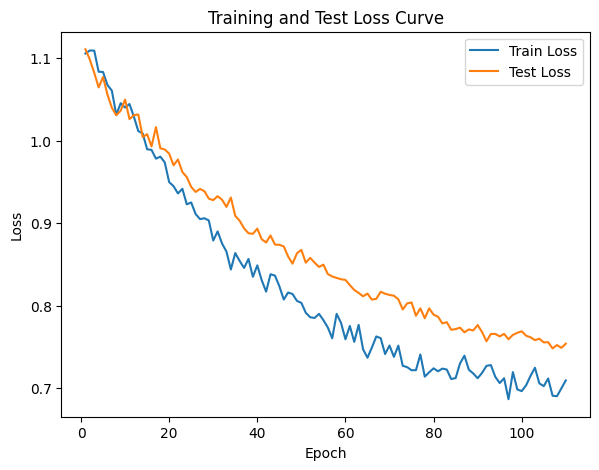

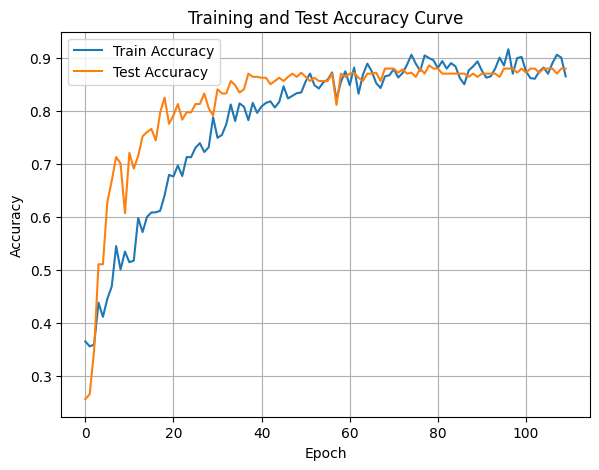

In [53]:
DTEmlp6b.train_single_model()

Randomly initializing 6 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.25it/s]

Epoch [1/10], Train F1:0.556732058132342, Train Loss: 1.0535, Train Acc: 0.5065, Test F1:0.5840422496666492, Test Loss: 1.0697, Test Acc: 0.5547


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.25it/s]

Epoch [2/10], Train F1:0.5751083579983666, Train Loss: 1.0423, Train Acc: 0.5296, Test F1:0.5873264729196042, Test Loss: 1.0686, Test Acc: 0.5686


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.10it/s]

Epoch [3/10], Train F1:0.5781080350773196, Train Loss: 1.0424, Train Acc: 0.5373, Test F1:0.6182010063919489, Test Loss: 1.0651, Test Acc: 0.5992


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.10it/s]

Epoch [4/10], Train F1:0.5998953102565024, Train Loss: 1.0358, Train Acc: 0.5577, Test F1:0.6233398136971364, Test Loss: 1.0628, Test Acc: 0.6098


Training Process:  50%|█████     | 5/10 [00:00<00:00, 10.17it/s]

Epoch [5/10], Train F1:0.6028423038869317, Train Loss: 1.0342, Train Acc: 0.5642, Test F1:0.6263967904131535, Test Loss: 1.0622, Test Acc: 0.6125


Training Process:  50%|█████     | 5/10 [00:00<00:00, 10.17it/s]

Epoch [6/10], Train F1:0.6103831264935207, Train Loss: 1.0321, Train Acc: 0.5747, Test F1:0.6325717764597221, Test Loss: 1.0603, Test Acc: 0.6202


Training Process:  70%|███████   | 7/10 [00:00<00:00, 10.00it/s]

Epoch [7/10], Train F1:0.616873216690322, Train Loss: 1.0269, Train Acc: 0.5834, Test F1:0.6554472362779727, Test Loss: 1.0574, Test Acc: 0.6405


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.97it/s]

Epoch [8/10], Train F1:0.6219583159519376, Train Loss: 1.0248, Train Acc: 0.5874, Test F1:0.6609897062343969, Test Loss: 1.0552, Test Acc: 0.6467


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.85it/s]

Epoch [9/10], Train F1:0.6300968372866825, Train Loss: 1.0217, Train Acc: 0.5969, Test F1:0.6641727668043457, Test Loss: 1.0528, Test Acc: 0.6513


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.97it/s]


Epoch [10/10], Train F1:0.6350940881322259, Train Loss: 1.0182, Train Acc: 0.6031, Test F1:0.6749510018945902, Test Loss: 1.0508, Test Acc: 0.6615
Total Epochs: 10
Train loss start: 1.0391334295272827, Train loss end: 0.9337491989135742
Highest Mean Train Accuracy (over epoch): 0.6031249999999999
Test loss start: 1.060101866722107, Test loss end: 1.0227679014205933
Highest mean Test Accuracy (over epoch): 0.6614583333333333


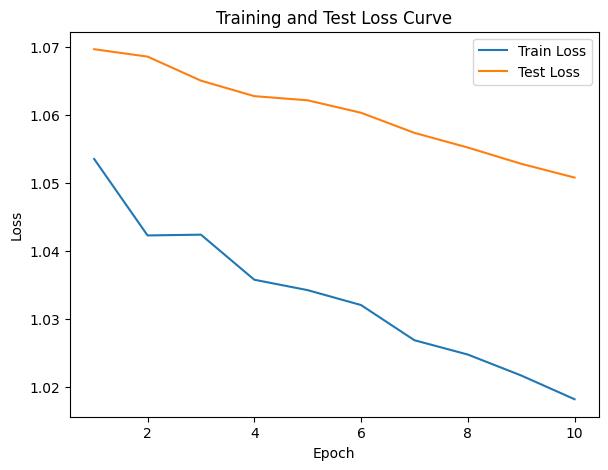

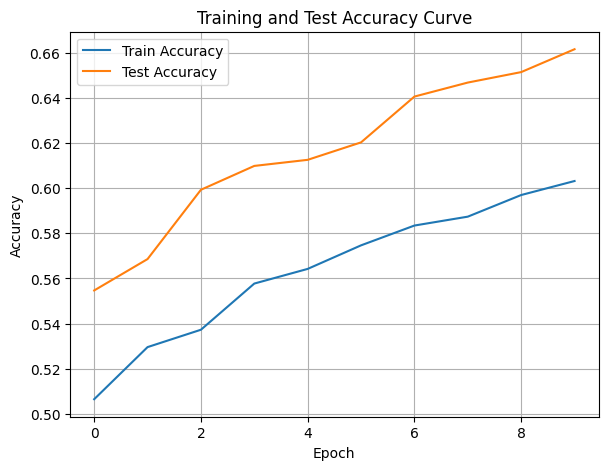

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.26901726384195007, Train Loss: 1.1151, Train Acc: 0.2753, Test F1:0.15712141200018195, Test Loss: 1.1067, Test Acc: 0.1997


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.88it/s]

Epoch [2/10], Train F1:0.29148625072868956, Train Loss: 1.1127, Train Acc: 0.2961, Test F1:0.1712997150217007, Test Loss: 1.1064, Test Acc: 0.2153


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.88it/s]

Epoch [3/10], Train F1:0.29233702159364733, Train Loss: 1.1121, Train Acc: 0.3014, Test F1:0.1806956759804641, Test Loss: 1.1044, Test Acc: 0.2251


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.59it/s]

Epoch [4/10], Train F1:0.3014582965546527, Train Loss: 1.1068, Train Acc: 0.3092, Test F1:0.1767061407197246, Test Loss: 1.1026, Test Acc: 0.2133


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.59it/s]

Epoch [5/10], Train F1:0.30156802166040825, Train Loss: 1.1041, Train Acc: 0.3118, Test F1:0.1810314289777502, Test Loss: 1.1009, Test Acc: 0.2184


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.52it/s]

Epoch [6/10], Train F1:0.3026519830918487, Train Loss: 1.1027, Train Acc: 0.3115, Test F1:0.1800912776044846, Test Loss: 1.0970, Test Acc: 0.2130


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.52it/s]

Epoch [7/10], Train F1:0.31149444136547866, Train Loss: 1.0999, Train Acc: 0.3191, Test F1:0.18646400189095916, Test Loss: 1.0950, Test Acc: 0.2124


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.91it/s]

Epoch [8/10], Train F1:0.3234729610841985, Train Loss: 1.0958, Train Acc: 0.3304, Test F1:0.18810829189510814, Test Loss: 1.0937, Test Acc: 0.2157


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  8.86it/s]

Epoch [9/10], Train F1:0.3349492957188264, Train Loss: 1.0925, Train Acc: 0.3392, Test F1:0.1899679680484634, Test Loss: 1.0922, Test Acc: 0.2198


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.27it/s]


Epoch [10/10], Train F1:0.34435971011254074, Train Loss: 1.0889, Train Acc: 0.3461, Test F1:0.1930340719321154, Test Loss: 1.0912, Test Acc: 0.2254
Total Epochs: 10
Train loss start: 1.1272917985916138, Train loss end: 1.0755577087402344
Highest Mean Train Accuracy (over epoch): 0.3461011904761905
Test loss start: 1.1024121046066284, Test loss end: 1.1028196811676025
Highest mean Test Accuracy (over epoch): 0.22543402777777777


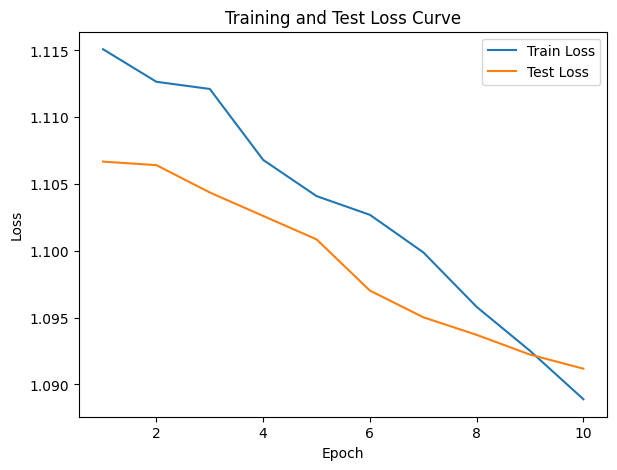

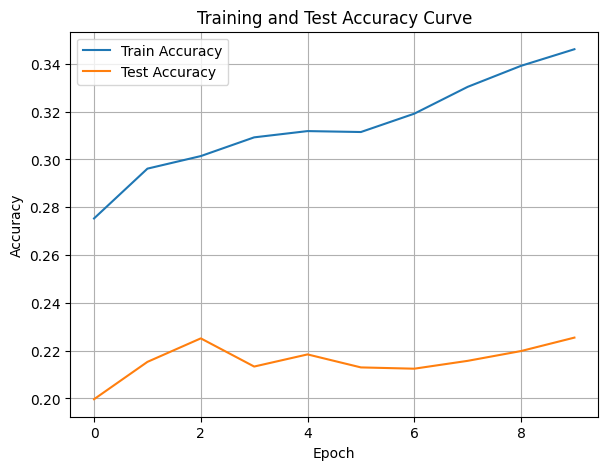

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.86it/s]

Epoch [1/10], Train F1:0.42659595797065303, Train Loss: 1.0865, Train Acc: 0.4318, Test F1:0.3362362741385839, Test Loss: 1.0966, Test Acc: 0.3116


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.86it/s]

Epoch [2/10], Train F1:0.42619952945560574, Train Loss: 1.0790, Train Acc: 0.4366, Test F1:0.3455761706424334, Test Loss: 1.0922, Test Acc: 0.3164


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.03it/s]

Epoch [3/10], Train F1:0.42762004137026194, Train Loss: 1.0775, Train Acc: 0.4388, Test F1:0.3526484480431849, Test Loss: 1.0904, Test Acc: 0.3226


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.33it/s]

Epoch [4/10], Train F1:0.43932421766582525, Train Loss: 1.0751, Train Acc: 0.4453, Test F1:0.3506210782430529, Test Loss: 1.0901, Test Acc: 0.3164


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.33it/s]

Epoch [5/10], Train F1:0.4477530864526082, Train Loss: 1.0733, Train Acc: 0.4513, Test F1:0.3780402711323764, Test Loss: 1.0872, Test Acc: 0.3519


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.85it/s]

Epoch [6/10], Train F1:0.4537466012871198, Train Loss: 1.0702, Train Acc: 0.4576, Test F1:0.40141157491429724, Test Loss: 1.0836, Test Acc: 0.3877


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.85it/s]

Epoch [7/10], Train F1:0.46537947822146913, Train Loss: 1.0634, Train Acc: 0.4736, Test F1:0.42038429406850464, Test Loss: 1.0784, Test Acc: 0.4211


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.03it/s]

Epoch [8/10], Train F1:0.46940558015031164, Train Loss: 1.0600, Train Acc: 0.4781, Test F1:0.43417088324756015, Test Loss: 1.0761, Test Acc: 0.4415


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.03it/s]

Epoch [9/10], Train F1:0.4737399601067105, Train Loss: 1.0562, Train Acc: 0.4828, Test F1:0.44273264270987495, Test Loss: 1.0738, Test Acc: 0.4572


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.57it/s]


Epoch [10/10], Train F1:0.48342829291964123, Train Loss: 1.0525, Train Acc: 0.4950, Test F1:0.45425082808502304, Test Loss: 1.0711, Test Acc: 0.4736
Total Epochs: 10
Train loss start: 1.094780445098877, Train loss end: 0.9180009961128235
Highest Mean Train Accuracy (over epoch): 0.49502976190476183
Test loss start: 1.0913010835647583, Test loss end: 1.0488286018371582
Highest mean Test Accuracy (over epoch): 0.4736111111111111


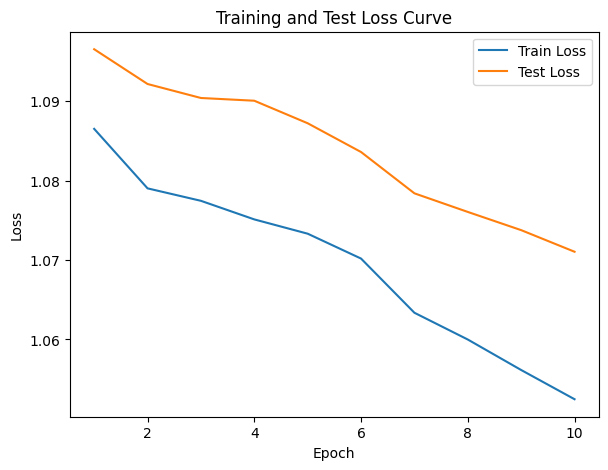

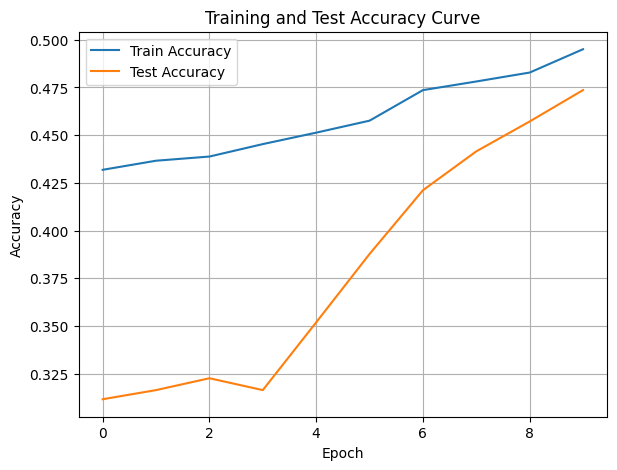

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.94it/s]

Epoch [1/10], Train F1:0.49171669002205637, Train Loss: 1.0272, Train Acc: 0.4923, Test F1:0.4607865177894904, Test Loss: 1.0618, Test Acc: 0.4983


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.94it/s]

Epoch [2/10], Train F1:0.5123625884019567, Train Loss: 1.0177, Train Acc: 0.5131, Test F1:0.45343009658730826, Test Loss: 1.0577, Test Acc: 0.4896


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.24it/s]

Epoch [3/10], Train F1:0.5100412751950615, Train Loss: 1.0190, Train Acc: 0.5124, Test F1:0.44874734763014196, Test Loss: 1.0581, Test Acc: 0.4867


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.24it/s]

Epoch [4/10], Train F1:0.5173367789322526, Train Loss: 1.0145, Train Acc: 0.5212, Test F1:0.44476212129234266, Test Loss: 1.0596, Test Acc: 0.4876


Training Process:  50%|█████     | 5/10 [00:00<00:00, 10.45it/s]

Epoch [5/10], Train F1:0.522972588363277, Train Loss: 1.0128, Train Acc: 0.5229, Test F1:0.44393587867697526, Test Loss: 1.0597, Test Acc: 0.4866
Epoch [6/10], Train F1:0.5297146370715855, Train Loss: 1.0103, Train Acc: 0.5278, Test F1:0.44462438146648675, Test Loss: 1.0590, Test Acc: 0.4886


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.47it/s]

Epoch [7/10], Train F1:0.5360218645528416, Train Loss: 1.0073, Train Acc: 0.5342, Test F1:0.4504568285293983, Test Loss: 1.0574, Test Acc: 0.4953
Epoch [8/10], Train F1:0.5417740560648003, Train Loss: 1.0058, Train Acc: 0.5377, Test F1:0.45750962162259207, Test Loss: 1.0559, Test Acc: 0.4993


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.45it/s]


Epoch [9/10], Train F1:0.5483208641266047, Train Loss: 1.0025, Train Acc: 0.5437, Test F1:0.4599069506560077, Test Loss: 1.0549, Test Acc: 0.5018
Epoch [10/10], Train F1:0.5541277206289206, Train Loss: 0.9988, Train Acc: 0.5500, Test F1:0.46519765761153914, Test Loss: 1.0530, Test Acc: 0.5052
Total Epochs: 10
Train loss start: 0.9672538042068481, Train loss end: 0.8861925005912781
Highest Mean Train Accuracy (over epoch): 0.5499702380952382
Test loss start: 1.068407654762268, Test loss end: 1.0168015956878662
Highest mean Test Accuracy (over epoch): 0.5052083333333334


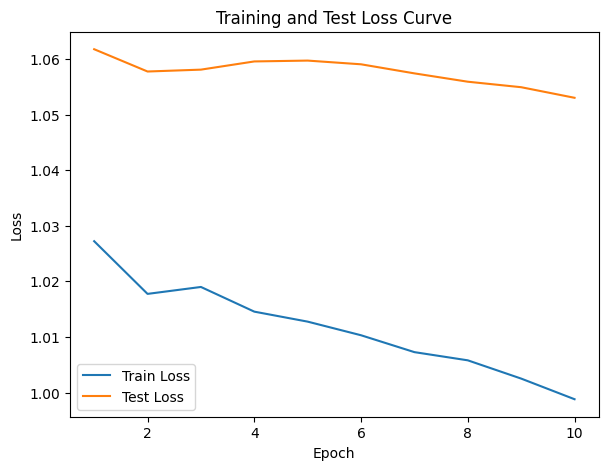

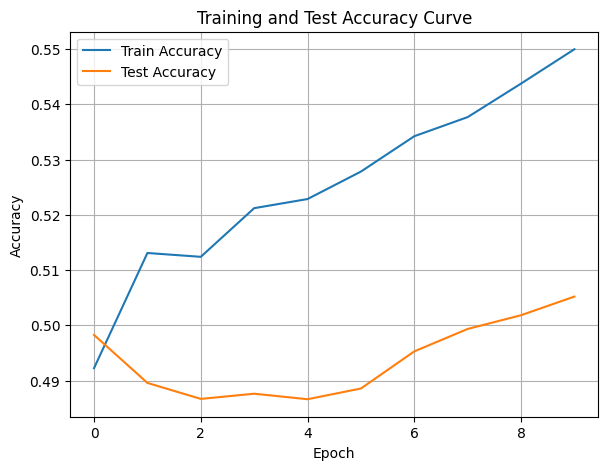

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.45it/s]

Epoch [1/10], Train F1:0.4017376985440252, Train Loss: 1.1082, Train Acc: 0.3024, Test F1:0.3047027290448343, Test Loss: 1.1143, Test Acc: 0.2161


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.57it/s]

Epoch [2/10], Train F1:0.4344427382790555, Train Loss: 1.1008, Train Acc: 0.3390, Test F1:0.2977893448344943, Test Loss: 1.1173, Test Acc: 0.2053


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.52it/s]

Epoch [3/10], Train F1:0.43847813326564916, Train Loss: 1.0981, Train Acc: 0.3463, Test F1:0.30111898837191103, Test Loss: 1.1143, Test Acc: 0.2069


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.42it/s]

Epoch [4/10], Train F1:0.44685143811833566, Train Loss: 1.0931, Train Acc: 0.3600, Test F1:0.309682214057515, Test Loss: 1.1128, Test Acc: 0.2116


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.68it/s]

Epoch [5/10], Train F1:0.4554241249550838, Train Loss: 1.0909, Train Acc: 0.3660, Test F1:0.31193153610307606, Test Loss: 1.1129, Test Acc: 0.2116


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.63it/s]

Epoch [6/10], Train F1:0.4661575765796809, Train Loss: 1.0887, Train Acc: 0.3722, Test F1:0.3116955883671978, Test Loss: 1.1110, Test Acc: 0.2117


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.97it/s]

Epoch [7/10], Train F1:0.47281077929899573, Train Loss: 1.0846, Train Acc: 0.3812, Test F1:0.3253013525458325, Test Loss: 1.1090, Test Acc: 0.2232


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.97it/s]

Epoch [8/10], Train F1:0.48330564629636297, Train Loss: 1.0807, Train Acc: 0.3907, Test F1:0.33720247255184943, Test Loss: 1.1070, Test Acc: 0.2321


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.85it/s]

Epoch [9/10], Train F1:0.4907791460590059, Train Loss: 1.0769, Train Acc: 0.3983, Test F1:0.34015114374297645, Test Loss: 1.1055, Test Acc: 0.2355


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.44it/s]


Epoch [10/10], Train F1:0.49987180215104093, Train Loss: 1.0733, Train Acc: 0.4077, Test F1:0.34695580062629183, Test Loss: 1.1046, Test Acc: 0.2420
Total Epochs: 10
Train loss start: 1.0936795473098755, Train loss end: 1.026302456855774
Highest Mean Train Accuracy (over epoch): 0.4077083333333333
Test loss start: 1.1022826433181763, Test loss end: 1.0820232629776
Highest mean Test Accuracy (over epoch): 0.2420138888888889


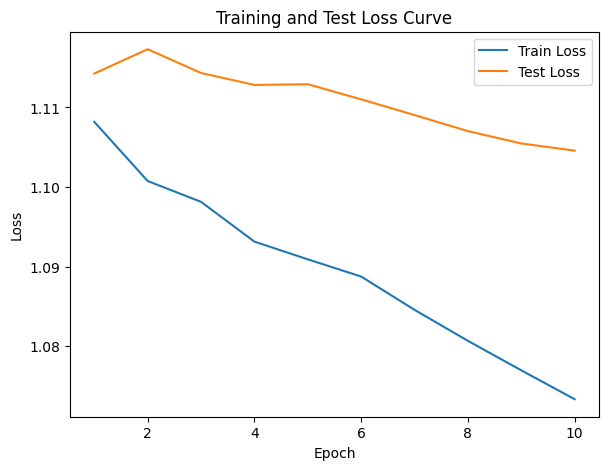

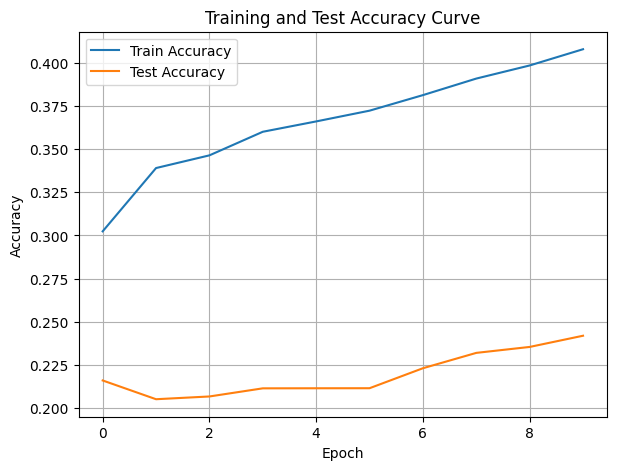

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.42it/s]

Epoch [1/10], Train F1:0.4544445254216727, Train Loss: 1.0959, Train Acc: 0.3807, Test F1:0.4008872756604154, Test Loss: 1.1003, Test Acc: 0.2778


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.42it/s]

Epoch [2/10], Train F1:0.446806892708532, Train Loss: 1.0933, Train Acc: 0.3638, Test F1:0.33798567000734775, Test Loss: 1.1031, Test Acc: 0.2378


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.09it/s]

Epoch [3/10], Train F1:0.46735529863596753, Train Loss: 1.0862, Train Acc: 0.3868, Test F1:0.3678878046179278, Test Loss: 1.0989, Test Acc: 0.2668


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.99it/s]

Epoch [4/10], Train F1:0.4781102479981445, Train Loss: 1.0844, Train Acc: 0.3922, Test F1:0.36640800963222087, Test Loss: 1.0980, Test Acc: 0.2711


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.85it/s]

Epoch [5/10], Train F1:0.4881125227119864, Train Loss: 1.0817, Train Acc: 0.4026, Test F1:0.36553559845214395, Test Loss: 1.0961, Test Acc: 0.2752


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.80it/s]

Epoch [6/10], Train F1:0.4938253564756602, Train Loss: 1.0793, Train Acc: 0.4075, Test F1:0.40348079202398385, Test Loss: 1.0940, Test Acc: 0.3096


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.56it/s]

Epoch [7/10], Train F1:0.5056931738971011, Train Loss: 1.0739, Train Acc: 0.4210, Test F1:0.4390961216711763, Test Loss: 1.0918, Test Acc: 0.3451


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.72it/s]

Epoch [8/10], Train F1:0.5162695652518007, Train Loss: 1.0694, Train Acc: 0.4331, Test F1:0.46907996706383803, Test Loss: 1.0889, Test Acc: 0.3784


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  8.84it/s]

Epoch [9/10], Train F1:0.5219407365143612, Train Loss: 1.0665, Train Acc: 0.4409, Test F1:0.4900517114408138, Test Loss: 1.0867, Test Acc: 0.4011


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.16it/s]


Epoch [10/10], Train F1:0.5318739298371936, Train Loss: 1.0633, Train Acc: 0.4517, Test F1:0.5136410261654728, Test Loss: 1.0839, Test Acc: 0.4316
Total Epochs: 10
Train loss start: 1.0978888273239136, Train loss end: 1.0344816446304321
Highest Mean Train Accuracy (over epoch): 0.45172619047619045
Test loss start: 1.0926694869995117, Test loss end: 1.0630995035171509
Highest mean Test Accuracy (over epoch): 0.43159722222222224


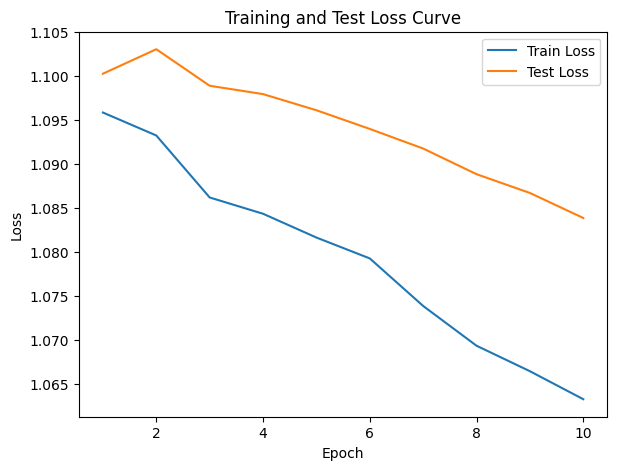

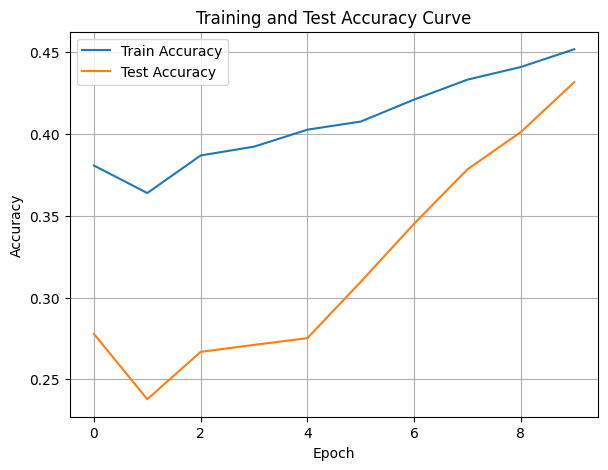

./saved_models/model_6.pth
Training Model with id 11
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.50it/s]

Epoch [1/10], Train F1:0.5855387392894372, Train Loss: 1.0436, Train Acc: 0.5065, Test F1:0.6800535475234272, Test Loss: 1.0573, Test Acc: 0.6858
Epoch [2/10], Train F1:0.6281571148916691, Train Loss: 1.0325, Train Acc: 0.5493, Test F1:0.7025306902022397, Test Loss: 1.0522, Test Acc: 0.7144


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.72it/s]

Epoch [3/10], Train F1:0.6451166173913517, Train Loss: 1.0226, Train Acc: 0.5712, Test F1:0.7100135791430797, Test Loss: 1.0520, Test Acc: 0.7167
Epoch [4/10], Train F1:0.6499030379405243, Train Loss: 1.0180, Train Acc: 0.5825, Test F1:0.7177184667830715, Test Loss: 1.0518, Test Acc: 0.7287


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.99it/s]

Epoch [5/10], Train F1:0.652941630572074, Train Loss: 1.0148, Train Acc: 0.5910, Test F1:0.7269150900803316, Test Loss: 1.0476, Test Acc: 0.7391
Epoch [6/10], Train F1:0.6622116769062222, Train Loss: 1.0109, Train Acc: 0.6019, Test F1:0.7306942071770394, Test Loss: 1.0450, Test Acc: 0.7446


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.74it/s]

Epoch [7/10], Train F1:0.6690218380028012, Train Loss: 1.0067, Train Acc: 0.6087, Test F1:0.7286436991950779, Test Loss: 1.0403, Test Acc: 0.7464


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.01it/s]

Epoch [8/10], Train F1:0.6713110496058021, Train Loss: 1.0038, Train Acc: 0.6108, Test F1:0.7291784070455418, Test Loss: 1.0379, Test Acc: 0.7487
Epoch [9/10], Train F1:0.6778023615096984, Train Loss: 0.9999, Train Acc: 0.6176, Test F1:0.7315175450903454, Test Loss: 1.0345, Test Acc: 0.7522


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.74it/s]


Epoch [10/10], Train F1:0.6795843288704388, Train Loss: 0.9986, Train Acc: 0.6211, Test F1:0.7337135869848868, Test Loss: 1.0309, Test Acc: 0.7550
Total Epochs: 10
Train loss start: 1.0445106029510498, Train loss end: 1.135237693786621
Highest Mean Train Accuracy (over epoch): 0.6211309523809524
Test loss start: 1.0490177869796753, Test loss end: 0.9993264079093933
Highest mean Test Accuracy (over epoch): 0.7550347222222221


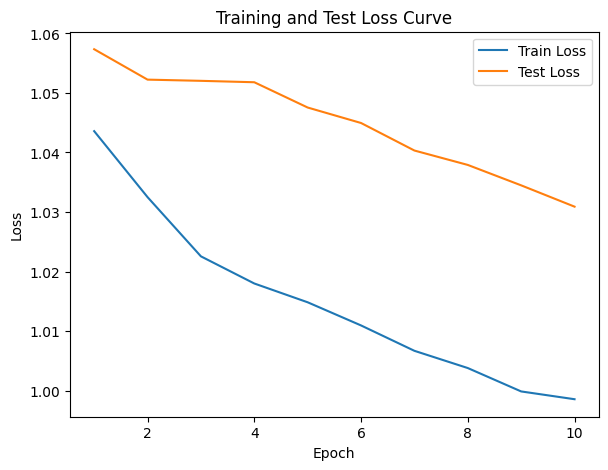

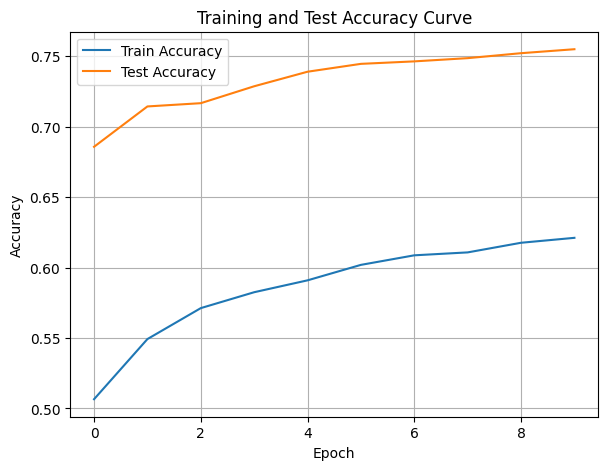

./saved_models/model_11.pth
Training Model with id 9
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.7614229334596755, Train Loss: 0.9530, Train Acc: 0.7342, Test F1:0.7777577443036637, Test Loss: 1.0052, Test Acc: 0.7960


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.86it/s]

Epoch [2/10], Train F1:0.7570503490295383, Train Loss: 0.9532, Train Acc: 0.7278, Test F1:0.7811414501165195, Test Loss: 1.0096, Test Acc: 0.7960


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.86it/s]

Epoch [3/10], Train F1:0.7492620328814436, Train Loss: 0.9527, Train Acc: 0.7188, Test F1:0.780009081240534, Test Loss: 1.0035, Test Acc: 0.7960


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.10it/s]

Epoch [4/10], Train F1:0.7517478398834332, Train Loss: 0.9493, Train Acc: 0.7231, Test F1:0.7777577443036637, Test Loss: 0.9994, Test Acc: 0.7960
Epoch [5/10], Train F1:0.7547499095359977, Train Loss: 0.9451, Train Acc: 0.7272, Test F1:0.7740126625359571, Test Loss: 0.9965, Test Acc: 0.7944


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.75it/s]

Epoch [6/10], Train F1:0.7586673664140239, Train Loss: 0.9407, Train Acc: 0.7316, Test F1:0.7721968958057318, Test Loss: 0.9944, Test Acc: 0.7934


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.89it/s]

Epoch [7/10], Train F1:0.7602708754075175, Train Loss: 0.9406, Train Acc: 0.7338, Test F1:0.7720384726737979, Test Loss: 0.9913, Test Acc: 0.7938
Epoch [8/10], Train F1:0.76193648153388, Train Loss: 0.9368, Train Acc: 0.7374, Test F1:0.7734164099124786, Test Loss: 0.9889, Test Acc: 0.7950


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.45it/s]


Epoch [9/10], Train F1:0.7665490784576554, Train Loss: 0.9326, Train Acc: 0.7439, Test F1:0.7718288148462211, Test Loss: 0.9848, Test Acc: 0.7943
Epoch [10/10], Train F1:0.7741972559846243, Train Loss: 0.9273, Train Acc: 0.7533, Test F1:0.7705572130369888, Test Loss: 0.9820, Test Acc: 0.7937
Total Epochs: 10
Train loss start: 0.9490986466407776, Train loss end: 0.7831892371177673
Highest Mean Train Accuracy (over epoch): 0.7533035714285715
Test loss start: 0.9983367919921875, Test loss end: 0.9468891620635986
Highest mean Test Accuracy (over epoch): 0.7960069444444445


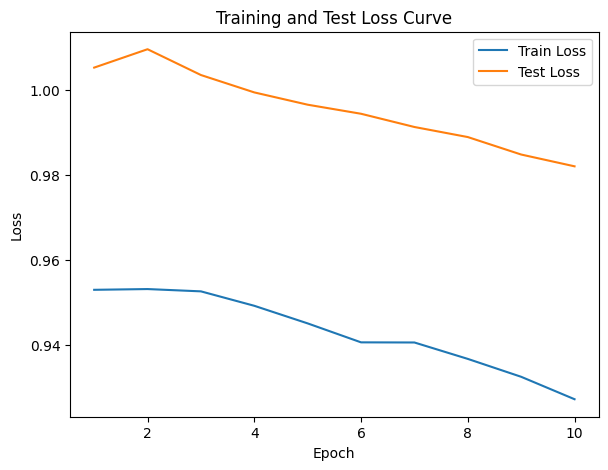

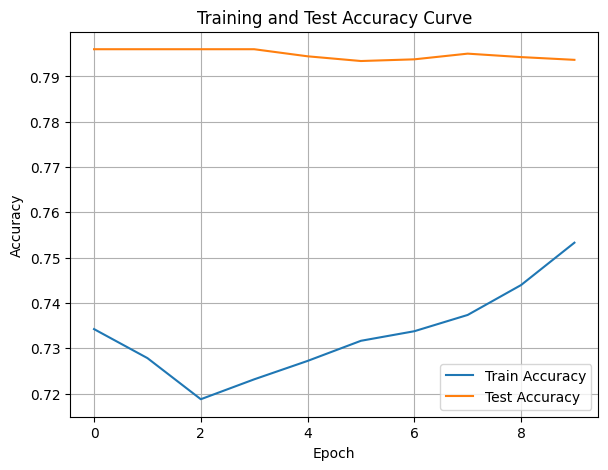

./saved_models/model_9.pth
Training Model with id 12
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.8035736447322851, Train Loss: 0.8940, Train Acc: 0.7893, Test F1:0.7590487847525791, Test Loss: 0.9589, Test Acc: 0.7882


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.11it/s]

Epoch [2/10], Train F1:0.8097363147327837, Train Loss: 0.8967, Train Acc: 0.7935, Test F1:0.7651130716442541, Test Loss: 0.9578, Test Acc: 0.7921


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.11it/s]

Epoch [3/10], Train F1:0.8042211626517034, Train Loss: 0.8928, Train Acc: 0.7936, Test F1:0.767119217131866, Test Loss: 0.9543, Test Acc: 0.7934


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.43it/s]

Epoch [4/10], Train F1:0.8063675490026825, Train Loss: 0.8892, Train Acc: 0.7946, Test F1:0.7651130716442541, Test Loss: 0.9482, Test Acc: 0.7921


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.53it/s]

Epoch [5/10], Train F1:0.8065918378099032, Train Loss: 0.8882, Train Acc: 0.7958, Test F1:0.7663176644374707, Test Loss: 0.9467, Test Acc: 0.7929


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.64it/s]

Epoch [6/10], Train F1:0.8100511032267363, Train Loss: 0.8835, Train Acc: 0.8001, Test F1:0.7651130716442541, Test Loss: 0.9442, Test Acc: 0.7921


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.89it/s]

Epoch [7/10], Train F1:0.8142089408685831, Train Loss: 0.8793, Train Acc: 0.8048, Test F1:0.7642509767288086, Test Loss: 0.9422, Test Acc: 0.7915


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.85it/s]

Epoch [8/10], Train F1:0.8151634751727542, Train Loss: 0.8761, Train Acc: 0.8072, Test F1:0.7651130716442541, Test Loss: 0.9405, Test Acc: 0.7921


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.10it/s]

Epoch [9/10], Train F1:0.8173714464719228, Train Loss: 0.8735, Train Acc: 0.8102, Test F1:0.7671192171318659, Test Loss: 0.9391, Test Acc: 0.7934


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.57it/s]


Epoch [10/10], Train F1:0.8185128845103439, Train Loss: 0.8708, Train Acc: 0.8120, Test F1:0.767519542624263, Test Loss: 0.9371, Test Acc: 0.7937
Total Epochs: 10
Train loss start: 0.9264523983001709, Train loss end: 0.8144038915634155
Highest Mean Train Accuracy (over epoch): 0.8119940476190476
Test loss start: 0.9492737054824829, Test loss end: 0.914867639541626
Highest mean Test Accuracy (over epoch): 0.7936631944444444


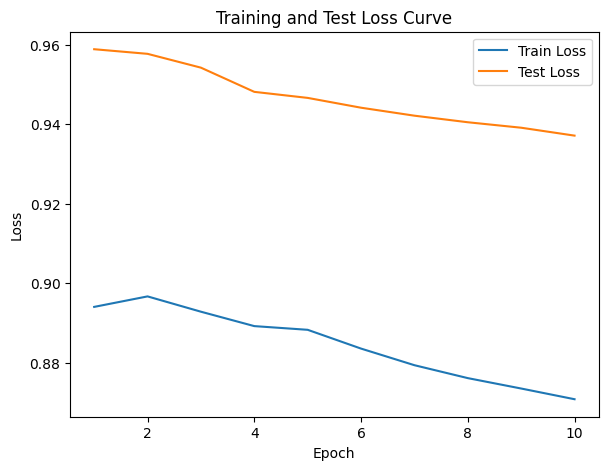

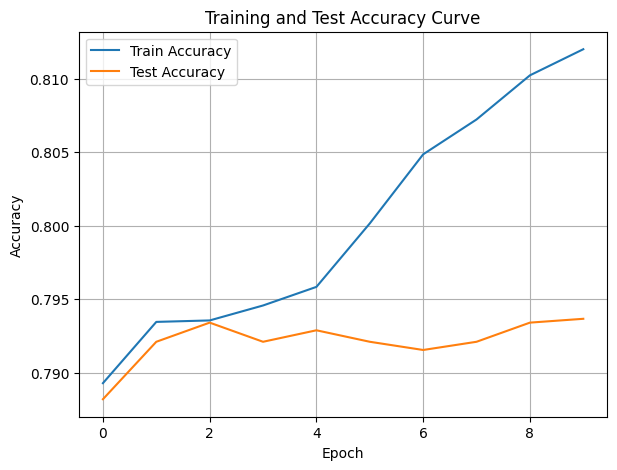

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.33it/s]

Epoch [1/10], Train F1:0.8502047965971461, Train Loss: 0.8336, Train Acc: 0.8604, Test F1:0.7590487847525791, Test Loss: 0.9049, Test Acc: 0.7882


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.23it/s]

Epoch [2/10], Train F1:0.8526319747473593, Train Loss: 0.8354, Train Acc: 0.8546, Test F1:0.7590487847525791, Test Loss: 0.9061, Test Acc: 0.7882


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.43it/s]

Epoch [3/10], Train F1:0.8499807157887557, Train Loss: 0.8319, Train Acc: 0.8513, Test F1:0.7590487847525791, Test Loss: 0.9052, Test Acc: 0.7882


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.79it/s]

Epoch [4/10], Train F1:0.8497671636675699, Train Loss: 0.8280, Train Acc: 0.8531, Test F1:0.7590487847525791, Test Loss: 0.9037, Test Acc: 0.7882


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.73it/s]

Epoch [5/10], Train F1:0.841934193568724, Train Loss: 0.8300, Train Acc: 0.8421, Test F1:0.7590487847525791, Test Loss: 0.9029, Test Acc: 0.7882


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.17it/s]

Epoch [6/10], Train F1:0.8407695852708547, Train Loss: 0.8298, Train Acc: 0.8412, Test F1:0.7590487847525791, Test Loss: 0.9012, Test Acc: 0.7882


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.17it/s]

Epoch [7/10], Train F1:0.842884567627828, Train Loss: 0.8261, Train Acc: 0.8438, Test F1:0.7590487847525792, Test Loss: 0.8994, Test Acc: 0.7882


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.30it/s]

Epoch [8/10], Train F1:0.8452588192291335, Train Loss: 0.8238, Train Acc: 0.8471, Test F1:0.7605713778270338, Test Loss: 0.8978, Test Acc: 0.7892


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.83it/s]

Epoch [9/10], Train F1:0.8472084218986283, Train Loss: 0.8225, Train Acc: 0.8489, Test F1:0.768452470905068, Test Loss: 0.8960, Test Acc: 0.7949


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.56it/s]


Epoch [10/10], Train F1:0.8491900256929223, Train Loss: 0.8210, Train Acc: 0.8501, Test F1:0.7687187232263889, Test Loss: 0.8932, Test Acc: 0.7951
Total Epochs: 10
Train loss start: 0.8300970196723938, Train loss end: 0.8044970631599426
Highest Mean Train Accuracy (over epoch): 0.8604166666666667
Test loss start: 0.8918390274047852, Test loss end: 0.8628737926483154
Highest mean Test Accuracy (over epoch): 0.7950520833333334


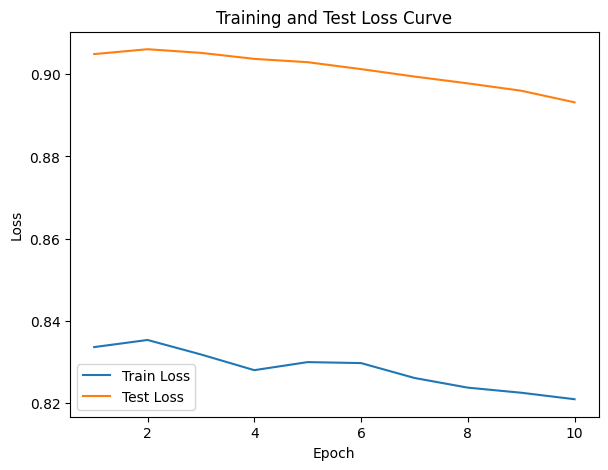

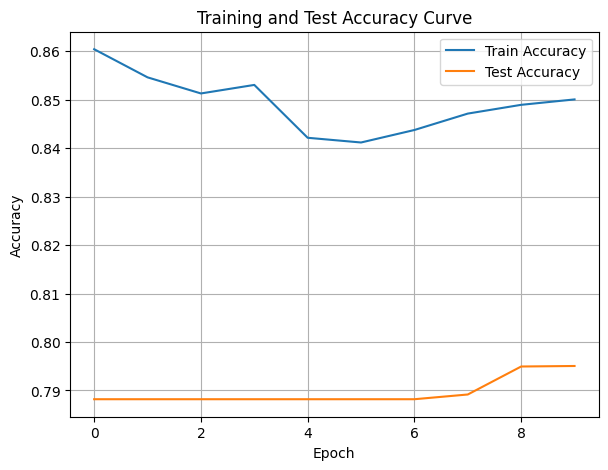

./saved_models/model_10.pth
Training Model with id 8
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.09it/s]

Epoch [1/10], Train F1:0.8463524521653769, Train Loss: 0.8151, Train Acc: 0.8488, Test F1:0.7829045229707128, Test Loss: 0.8790, Test Acc: 0.8038
Epoch [2/10], Train F1:0.8505523541829694, Train Loss: 0.8095, Train Acc: 0.8493, Test F1:0.7711090591977018, Test Loss: 0.8773, Test Acc: 0.7960


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.09it/s]

Epoch [3/10], Train F1:0.8520867492296064, Train Loss: 0.8055, Train Acc: 0.8519, Test F1:0.7829045229707127, Test Loss: 0.8708, Test Acc: 0.8038


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.28it/s]

Epoch [4/10], Train F1:0.857199640763148, Train Loss: 0.8005, Train Acc: 0.8574, Test F1:0.7915870634504486, Test Loss: 0.8691, Test Acc: 0.8097


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.28it/s]

Epoch [5/10], Train F1:0.8599253992505783, Train Loss: 0.7971, Train Acc: 0.8588, Test F1:0.796732127487927, Test Loss: 0.8676, Test Acc: 0.8132


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.79it/s]

Epoch [6/10], Train F1:0.8587495780349697, Train Loss: 0.7961, Train Acc: 0.8557, Test F1:0.7963526295543649, Test Loss: 0.8653, Test Acc: 0.8129


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.79it/s]

Epoch [7/10], Train F1:0.8580782081022814, Train Loss: 0.7937, Train Acc: 0.8559, Test F1:0.7977068038632538, Test Loss: 0.8639, Test Acc: 0.8139


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.98it/s]

Epoch [8/10], Train F1:0.8580714338179258, Train Loss: 0.7926, Train Acc: 0.8556, Test F1:0.7973008940541697, Test Loss: 0.8622, Test Acc: 0.8136


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.98it/s]

Epoch [9/10], Train F1:0.8599690536776229, Train Loss: 0.7900, Train Acc: 0.8587, Test F1:0.7957195620630524, Test Loss: 0.8615, Test Acc: 0.8125


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.53it/s]


Epoch [10/10], Train F1:0.8590496781422279, Train Loss: 0.7897, Train Acc: 0.8566, Test F1:0.7978690858190237, Test Loss: 0.8605, Test Acc: 0.8140
Total Epochs: 10
Train loss start: 0.8096215724945068, Train loss end: 0.9054139256477356
Highest Mean Train Accuracy (over epoch): 0.85875
Test loss start: 0.865115761756897, Test loss end: 0.8490082621574402
Highest mean Test Accuracy (over epoch): 0.8139756944444445


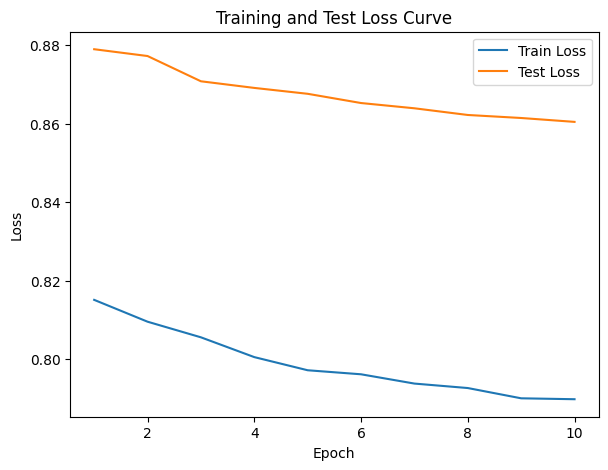

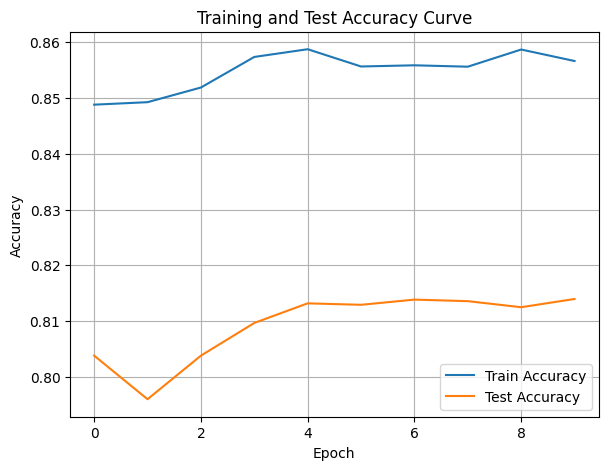

./saved_models/model_8.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [54]:
DTEmlp6b.train_DTE()

Training Process:   1%|          | 1/110 [00:00<00:15,  6.93it/s]

Epoch [1/110], Train F1:0.2897792298545801, Train Loss: 1.1372, Train Acc: 0.2869, Test F1:0.22634363686995265, Test Loss: 1.1151, Test Acc: 0.1884


Training Process:   2%|▏         | 2/110 [00:00<00:13,  8.29it/s]

Epoch [2/110], Train F1:0.3208823081848507, Train Loss: 1.1310, Train Acc: 0.3024, Test F1:0.2951704681506894, Test Loss: 1.1148, Test Acc: 0.2461


Training Process:   3%|▎         | 3/110 [00:00<00:12,  8.63it/s]

Epoch [3/110], Train F1:0.3342634154384029, Train Loss: 1.1293, Train Acc: 0.3103, Test F1:0.2612656716003347, Test Loss: 1.1185, Test Acc: 0.2150


Training Process:   4%|▎         | 4/110 [00:00<00:12,  8.77it/s]

Epoch [4/110], Train F1:0.3398643392333989, Train Loss: 1.1231, Train Acc: 0.3204, Test F1:0.24786967418546363, Test Loss: 1.1196, Test Acc: 0.2103


Training Process:   5%|▍         | 5/110 [00:00<00:12,  8.42it/s]

Epoch [5/110], Train F1:0.3488263283213741, Train Loss: 1.1194, Train Acc: 0.3268, Test F1:0.3008553335639972, Test Loss: 1.1167, Test Acc: 0.2521


Training Process:   5%|▌         | 6/110 [00:00<00:12,  8.61it/s]

Epoch [6/110], Train F1:0.3536397552592056, Train Loss: 1.1136, Train Acc: 0.3371, Test F1:0.32462708126912054, Test Loss: 1.1144, Test Acc: 0.2734


Training Process:   6%|▋         | 7/110 [00:00<00:13,  7.83it/s]

Epoch [7/110], Train F1:0.3644367284453772, Train Loss: 1.1095, Train Acc: 0.3476, Test F1:0.3545446016597157, Test Loss: 1.1116, Test Acc: 0.3018


Training Process:   7%|▋         | 8/110 [00:01<00:15,  6.50it/s]

Epoch [8/110], Train F1:0.37379272492204285, Train Loss: 1.1066, Train Acc: 0.3571, Test F1:0.3817254127721429, Test Loss: 1.1087, Test Acc: 0.3280


Training Process:   9%|▉         | 10/110 [00:01<00:16,  6.17it/s]

Epoch [9/110], Train F1:0.3817865261137508, Train Loss: 1.1036, Train Acc: 0.3646, Test F1:0.3982434415431803, Test Loss: 1.1066, Test Acc: 0.3449
Epoch [10/110], Train F1:0.38946419590996273, Train Loss: 1.1007, Train Acc: 0.3716, Test F1:0.42007656552459766, Test Loss: 1.1036, Test Acc: 0.3696


Training Process:  11%|█         | 12/110 [00:01<00:15,  6.50it/s]

Epoch [11/110], Train F1:0.39713336370651187, Train Loss: 1.0979, Train Acc: 0.3788, Test F1:0.4394408754456601, Test Loss: 1.1010, Test Acc: 0.3913
Epoch [12/110], Train F1:0.40783780393847974, Train Loss: 1.0943, Train Acc: 0.3885, Test F1:0.45523712692721074, Test Loss: 1.0983, Test Acc: 0.4093


Training Process:  13%|█▎        | 14/110 [00:01<00:13,  7.31it/s]

Epoch [13/110], Train F1:0.4163068706886624, Train Loss: 1.0908, Train Acc: 0.3964, Test F1:0.46778666752100206, Test Loss: 1.0955, Test Acc: 0.4250
Epoch [14/110], Train F1:0.4214143216973172, Train Loss: 1.0876, Train Acc: 0.4021, Test F1:0.4828710073054977, Test Loss: 1.0921, Test Acc: 0.4428


Training Process:  15%|█▍        | 16/110 [00:02<00:12,  7.67it/s]

Epoch [15/110], Train F1:0.42476320630076675, Train Loss: 1.0846, Train Acc: 0.4061, Test F1:0.49431693938935195, Test Loss: 1.0886, Test Acc: 0.4572
Epoch [16/110], Train F1:0.43165140899977733, Train Loss: 1.0814, Train Acc: 0.4124, Test F1:0.505834045405225, Test Loss: 1.0859, Test Acc: 0.4704


Training Process:  16%|█▋        | 18/110 [00:02<00:12,  7.57it/s]

Epoch [17/110], Train F1:0.4375335580920607, Train Loss: 1.0786, Train Acc: 0.4189, Test F1:0.5156218590396204, Test Loss: 1.0834, Test Acc: 0.4816
Epoch [18/110], Train F1:0.4447210044201505, Train Loss: 1.0751, Train Acc: 0.4263, Test F1:0.5248899937550434, Test Loss: 1.0807, Test Acc: 0.4924


Training Process:  18%|█▊        | 20/110 [00:02<00:11,  7.60it/s]

Epoch [19/110], Train F1:0.4481192814044398, Train Loss: 1.0728, Train Acc: 0.4299, Test F1:0.5337011790996531, Test Loss: 1.0780, Test Acc: 0.5025
Epoch [20/110], Train F1:0.4562961100838056, Train Loss: 1.0694, Train Acc: 0.4386, Test F1:0.5412018587894097, Test Loss: 1.0755, Test Acc: 0.5119


Training Process:  20%|██        | 22/110 [00:02<00:11,  7.43it/s]

Epoch [21/110], Train F1:0.46328424432220827, Train Loss: 1.0663, Train Acc: 0.4460, Test F1:0.5484708183429732, Test Loss: 1.0728, Test Acc: 0.5201
Epoch [22/110], Train F1:0.47080237608605474, Train Loss: 1.0627, Train Acc: 0.4537, Test F1:0.5576114335872583, Test Loss: 1.0702, Test Acc: 0.5297


Training Process:  22%|██▏       | 24/110 [00:03<00:12,  7.16it/s]

Epoch [23/110], Train F1:0.4783725188824926, Train Loss: 1.0588, Train Acc: 0.4610, Test F1:0.5639518481231544, Test Loss: 1.0675, Test Acc: 0.5377
Epoch [24/110], Train F1:0.4841428128734269, Train Loss: 1.0559, Train Acc: 0.4670, Test F1:0.5692109609677921, Test Loss: 1.0648, Test Acc: 0.5443


Training Process:  24%|██▎       | 26/110 [00:03<00:12,  6.86it/s]

Epoch [25/110], Train F1:0.4897147485861277, Train Loss: 1.0533, Train Acc: 0.4718, Test F1:0.5746036890949113, Test Loss: 1.0622, Test Acc: 0.5508
Epoch [26/110], Train F1:0.49639701594102625, Train Loss: 1.0499, Train Acc: 0.4789, Test F1:0.5801602807344975, Test Loss: 1.0597, Test Acc: 0.5574


Training Process:  25%|██▌       | 28/110 [00:03<00:13,  6.17it/s]

Epoch [27/110], Train F1:0.5032468108440444, Train Loss: 1.0464, Train Acc: 0.4862, Test F1:0.5858932495915613, Test Loss: 1.0569, Test Acc: 0.5645
Epoch [28/110], Train F1:0.5115147949242942, Train Loss: 1.0424, Train Acc: 0.4946, Test F1:0.5910464925914832, Test Loss: 1.0542, Test Acc: 0.5707


Training Process:  27%|██▋       | 30/110 [00:04<00:12,  6.16it/s]

Epoch [29/110], Train F1:0.5170446346561284, Train Loss: 1.0397, Train Acc: 0.4998, Test F1:0.5959525642971365, Test Loss: 1.0518, Test Acc: 0.5764
Epoch [30/110], Train F1:0.523205527605294, Train Loss: 1.0363, Train Acc: 0.5058, Test F1:0.6003709949043812, Test Loss: 1.0487, Test Acc: 0.5822


Training Process:  28%|██▊       | 31/110 [00:04<00:12,  6.18it/s]

Epoch [31/110], Train F1:0.5279439233239813, Train Loss: 1.0332, Train Acc: 0.5106, Test F1:0.605363966184181, Test Loss: 1.0462, Test Acc: 0.5877


Training Process:  29%|██▉       | 32/110 [00:04<00:13,  5.64it/s]

Epoch [32/110], Train F1:0.5343514978986154, Train Loss: 1.0300, Train Acc: 0.5169, Test F1:0.6106430500425671, Test Loss: 1.0438, Test Acc: 0.5936


Training Process:  30%|███       | 33/110 [00:04<00:14,  5.19it/s]

Epoch [33/110], Train F1:0.5396882404582938, Train Loss: 1.0271, Train Acc: 0.5222, Test F1:0.6166112350454501, Test Loss: 1.0415, Test Acc: 0.5999


Training Process:  31%|███       | 34/110 [00:05<00:17,  4.24it/s]

Epoch [34/110], Train F1:0.5446648311917667, Train Loss: 1.0246, Train Acc: 0.5271, Test F1:0.621688229858852, Test Loss: 1.0393, Test Acc: 0.6061


Training Process:  32%|███▏      | 35/110 [00:05<00:18,  4.10it/s]

Epoch [35/110], Train F1:0.5498577594154612, Train Loss: 1.0213, Train Acc: 0.5330, Test F1:0.6256342483160392, Test Loss: 1.0368, Test Acc: 0.6110


Training Process:  33%|███▎      | 36/110 [00:05<00:18,  4.07it/s]

Epoch [36/110], Train F1:0.5559825258163634, Train Loss: 1.0176, Train Acc: 0.5395, Test F1:0.6299776906643124, Test Loss: 1.0342, Test Acc: 0.6163


Training Process:  34%|███▎      | 37/110 [00:06<00:19,  3.81it/s]

Epoch [37/110], Train F1:0.5607675623311377, Train Loss: 1.0148, Train Acc: 0.5444, Test F1:0.6345311104479107, Test Loss: 1.0315, Test Acc: 0.6216


Training Process:  35%|███▍      | 38/110 [00:06<00:18,  3.94it/s]

Epoch [38/110], Train F1:0.5648128288169335, Train Loss: 1.0119, Train Acc: 0.5485, Test F1:0.6382523251204455, Test Loss: 1.0288, Test Acc: 0.6262


Training Process:  36%|███▋      | 40/110 [00:06<00:16,  4.36it/s]

Epoch [39/110], Train F1:0.5694853360569145, Train Loss: 1.0092, Train Acc: 0.5532, Test F1:0.6426411585788903, Test Loss: 1.0265, Test Acc: 0.6313
Epoch [40/110], Train F1:0.5746304773434964, Train Loss: 1.0059, Train Acc: 0.5587, Test F1:0.645687408255714, Test Loss: 1.0243, Test Acc: 0.6352


Training Process:  37%|███▋      | 41/110 [00:07<00:14,  4.63it/s]

Epoch [41/110], Train F1:0.5792459186418923, Train Loss: 1.0029, Train Acc: 0.5635, Test F1:0.64830748769276, Test Loss: 1.0217, Test Acc: 0.6388
Epoch [42/110], Train F1:0.5840390414926901, Train Loss: 0.9997, Train Acc: 0.5687, Test F1:0.6505307128102463, Test Loss: 1.0191, Test Acc: 0.6420


Training Process:  39%|███▉      | 43/110 [00:07<00:14,  4.70it/s]

Epoch [43/110], Train F1:0.5881283671290529, Train Loss: 0.9966, Train Acc: 0.5733, Test F1:0.6531709625695681, Test Loss: 1.0166, Test Acc: 0.6454


Training Process:  40%|████      | 44/110 [00:07<00:14,  4.62it/s]

Epoch [44/110], Train F1:0.5920601780003372, Train Loss: 0.9939, Train Acc: 0.5775, Test F1:0.6556889401804723, Test Loss: 1.0144, Test Acc: 0.6486


Training Process:  41%|████      | 45/110 [00:07<00:13,  4.76it/s]

Epoch [45/110], Train F1:0.5964233131088685, Train Loss: 0.9912, Train Acc: 0.5820, Test F1:0.6595990250498919, Test Loss: 1.0122, Test Acc: 0.6529


Training Process:  42%|████▏     | 46/110 [00:07<00:13,  4.85it/s]

Epoch [46/110], Train F1:0.6009417507828305, Train Loss: 0.9882, Train Acc: 0.5865, Test F1:0.6616202426288206, Test Loss: 1.0099, Test Acc: 0.6557


Training Process:  43%|████▎     | 47/110 [00:08<00:12,  4.89it/s]

Epoch [47/110], Train F1:0.604078518947709, Train Loss: 0.9855, Train Acc: 0.5902, Test F1:0.6635532079947533, Test Loss: 1.0074, Test Acc: 0.6583


Training Process:  44%|████▎     | 48/110 [00:08<00:12,  4.89it/s]

Epoch [48/110], Train F1:0.6077647095255988, Train Loss: 0.9827, Train Acc: 0.5944, Test F1:0.6653267500102449, Test Loss: 1.0050, Test Acc: 0.6609


Training Process:  45%|████▍     | 49/110 [00:08<00:12,  4.92it/s]

Epoch [49/110], Train F1:0.6115850070495671, Train Loss: 0.9799, Train Acc: 0.5985, Test F1:0.6677203930262473, Test Loss: 1.0025, Test Acc: 0.6638


Training Process:  45%|████▌     | 50/110 [00:08<00:12,  4.93it/s]

Epoch [50/110], Train F1:0.6148898915428065, Train Loss: 0.9776, Train Acc: 0.6020, Test F1:0.6712257478724573, Test Loss: 1.0002, Test Acc: 0.6676


Training Process:  46%|████▋     | 51/110 [00:08<00:13,  4.43it/s]

Epoch [51/110], Train F1:0.618996701138701, Train Loss: 0.9747, Train Acc: 0.6061, Test F1:0.6737038116406981, Test Loss: 0.9981, Test Acc: 0.6705


Training Process:  47%|████▋     | 52/110 [00:09<00:13,  4.25it/s]

Epoch [52/110], Train F1:0.6225169373840902, Train Loss: 0.9721, Train Acc: 0.6098, Test F1:0.6753616462300474, Test Loss: 0.9959, Test Acc: 0.6728


Training Process:  48%|████▊     | 53/110 [00:09<00:13,  4.10it/s]

Epoch [53/110], Train F1:0.625686288601073, Train Loss: 0.9695, Train Acc: 0.6130, Test F1:0.6780955511574828, Test Loss: 0.9938, Test Acc: 0.6758


Training Process:  49%|████▉     | 54/110 [00:09<00:13,  4.12it/s]

Epoch [54/110], Train F1:0.6293444076296861, Train Loss: 0.9668, Train Acc: 0.6169, Test F1:0.6798879802770625, Test Loss: 0.9915, Test Acc: 0.6781


Training Process:  50%|█████     | 55/110 [00:09<00:12,  4.34it/s]

Epoch [55/110], Train F1:0.6327013453342947, Train Loss: 0.9640, Train Acc: 0.6207, Test F1:0.6812020681284142, Test Loss: 0.9894, Test Acc: 0.6799


Training Process:  51%|█████     | 56/110 [00:10<00:11,  4.55it/s]

Epoch [56/110], Train F1:0.6361910130217383, Train Loss: 0.9614, Train Acc: 0.6244, Test F1:0.683482313495049, Test Loss: 0.9873, Test Acc: 0.6825


Training Process:  52%|█████▏    | 57/110 [00:10<00:11,  4.71it/s]

Epoch [57/110], Train F1:0.639354471833268, Train Loss: 0.9588, Train Acc: 0.6277, Test F1:0.6860800786325654, Test Loss: 0.9854, Test Acc: 0.6853


Training Process:  53%|█████▎    | 58/110 [00:10<00:10,  4.88it/s]

Epoch [58/110], Train F1:0.6423917815585946, Train Loss: 0.9562, Train Acc: 0.6309, Test F1:0.6881967604585159, Test Loss: 0.9833, Test Acc: 0.6877


Training Process:  54%|█████▎    | 59/110 [00:10<00:10,  4.74it/s]

Epoch [59/110], Train F1:0.6455311555759333, Train Loss: 0.9538, Train Acc: 0.6342, Test F1:0.6906251843469312, Test Loss: 0.9812, Test Acc: 0.6903


Training Process:  55%|█████▍    | 60/110 [00:10<00:10,  4.90it/s]

Epoch [60/110], Train F1:0.6480129406917551, Train Loss: 0.9515, Train Acc: 0.6368, Test F1:0.6929718355625575, Test Loss: 0.9792, Test Acc: 0.6928


Training Process:  55%|█████▌    | 61/110 [00:11<00:09,  4.98it/s]

Epoch [61/110], Train F1:0.6509898329942683, Train Loss: 0.9490, Train Acc: 0.6401, Test F1:0.6946263055037191, Test Loss: 0.9770, Test Acc: 0.6948


Training Process:  56%|█████▋    | 62/110 [00:11<00:09,  4.94it/s]

Epoch [62/110], Train F1:0.6536463902124265, Train Loss: 0.9466, Train Acc: 0.6430, Test F1:0.6962274032775807, Test Loss: 0.9749, Test Acc: 0.6967


Training Process:  57%|█████▋    | 63/110 [00:11<00:10,  4.68it/s]

Epoch [63/110], Train F1:0.6564837948965749, Train Loss: 0.9441, Train Acc: 0.6462, Test F1:0.6975980426578103, Test Loss: 0.9728, Test Acc: 0.6984


Training Process:  58%|█████▊    | 64/110 [00:11<00:09,  4.68it/s]

Epoch [64/110], Train F1:0.6587117689620156, Train Loss: 0.9420, Train Acc: 0.6484, Test F1:0.699335554302482, Test Loss: 0.9709, Test Acc: 0.7004


Training Process:  59%|█████▉    | 65/110 [00:12<00:09,  4.71it/s]

Epoch [65/110], Train F1:0.6617395602328923, Train Loss: 0.9394, Train Acc: 0.6516, Test F1:0.7002678106234159, Test Loss: 0.9689, Test Acc: 0.7017


Training Process:  60%|██████    | 66/110 [00:12<00:09,  4.59it/s]

Epoch [66/110], Train F1:0.6640531719491389, Train Loss: 0.9371, Train Acc: 0.6541, Test F1:0.7016863606009415, Test Loss: 0.9669, Test Acc: 0.7034


Training Process:  61%|██████    | 67/110 [00:12<00:10,  4.07it/s]

Epoch [67/110], Train F1:0.6666875171864114, Train Loss: 0.9348, Train Acc: 0.6571, Test F1:0.7034542629510382, Test Loss: 0.9651, Test Acc: 0.7053


Training Process:  62%|██████▏   | 68/110 [00:12<00:10,  4.05it/s]

Epoch [68/110], Train F1:0.669636721213844, Train Loss: 0.9322, Train Acc: 0.6603, Test F1:0.7050034336260639, Test Loss: 0.9632, Test Acc: 0.7071


Training Process:  63%|██████▎   | 69/110 [00:13<00:10,  3.89it/s]

Epoch [69/110], Train F1:0.6724055702854763, Train Loss: 0.9300, Train Acc: 0.6631, Test F1:0.7066714816997756, Test Loss: 0.9613, Test Acc: 0.7089


Training Process:  64%|██████▎   | 70/110 [00:13<00:10,  3.87it/s]

Epoch [70/110], Train F1:0.6747670081128543, Train Loss: 0.9276, Train Acc: 0.6658, Test F1:0.7080794329561719, Test Loss: 0.9595, Test Acc: 0.7106


Training Process:  65%|██████▍   | 71/110 [00:13<00:10,  3.58it/s]

Epoch [71/110], Train F1:0.677292633623987, Train Loss: 0.9253, Train Acc: 0.6685, Test F1:0.7091291908145635, Test Loss: 0.9576, Test Acc: 0.7119


Training Process:  65%|██████▌   | 72/110 [00:13<00:10,  3.51it/s]

Epoch [72/110], Train F1:0.6795347722850806, Train Loss: 0.9232, Train Acc: 0.6709, Test F1:0.709677906736599, Test Loss: 0.9557, Test Acc: 0.7128


Training Process:  66%|██████▋   | 73/110 [00:14<00:10,  3.51it/s]

Epoch [73/110], Train F1:0.6814004757627599, Train Loss: 0.9215, Train Acc: 0.6727, Test F1:0.7112973918082166, Test Loss: 0.9538, Test Acc: 0.7146


Training Process:  67%|██████▋   | 74/110 [00:14<00:09,  3.68it/s]

Epoch [74/110], Train F1:0.6832904203974145, Train Loss: 0.9197, Train Acc: 0.6746, Test F1:0.7125671049182982, Test Loss: 0.9519, Test Acc: 0.7160


Training Process:  68%|██████▊   | 75/110 [00:14<00:10,  3.42it/s]

Epoch [75/110], Train F1:0.6853846886333067, Train Loss: 0.9176, Train Acc: 0.6768, Test F1:0.7139539713272332, Test Loss: 0.9501, Test Acc: 0.7176


Training Process:  69%|██████▉   | 76/110 [00:15<00:10,  3.38it/s]

Epoch [76/110], Train F1:0.6876790471083996, Train Loss: 0.9155, Train Acc: 0.6793, Test F1:0.7147085800985148, Test Loss: 0.9482, Test Acc: 0.7186


Training Process:  70%|███████   | 77/110 [00:15<00:09,  3.35it/s]

Epoch [77/110], Train F1:0.6898520709614382, Train Loss: 0.9133, Train Acc: 0.6817, Test F1:0.7160318575896419, Test Loss: 0.9465, Test Acc: 0.7201


Training Process:  71%|███████   | 78/110 [00:15<00:09,  3.31it/s]

Epoch [78/110], Train F1:0.6916443029421513, Train Loss: 0.9113, Train Acc: 0.6837, Test F1:0.717466334660307, Test Loss: 0.9447, Test Acc: 0.7217


Training Process:  72%|███████▏  | 79/110 [00:16<00:09,  3.27it/s]

Epoch [79/110], Train F1:0.6935357442372828, Train Loss: 0.9095, Train Acc: 0.6857, Test F1:0.718864411752445, Test Loss: 0.9430, Test Acc: 0.7232


Training Process:  73%|███████▎  | 80/110 [00:16<00:09,  3.21it/s]

Epoch [80/110], Train F1:0.6954936263814655, Train Loss: 0.9075, Train Acc: 0.6878, Test F1:0.7196619716108691, Test Loss: 0.9413, Test Acc: 0.7243


Training Process:  74%|███████▎  | 81/110 [00:16<00:09,  3.22it/s]

Epoch [81/110], Train F1:0.6972615786636407, Train Loss: 0.9058, Train Acc: 0.6898, Test F1:0.720998554346714, Test Loss: 0.9396, Test Acc: 0.7257


Training Process:  75%|███████▍  | 82/110 [00:17<00:09,  3.03it/s]

Epoch [82/110], Train F1:0.6992872942571918, Train Loss: 0.9037, Train Acc: 0.6920, Test F1:0.7225780935820902, Test Loss: 0.9379, Test Acc: 0.7273


Training Process:  75%|███████▌  | 83/110 [00:17<00:09,  2.99it/s]

Epoch [83/110], Train F1:0.7007633159928072, Train Loss: 0.9020, Train Acc: 0.6937, Test F1:0.7242968300314236, Test Loss: 0.9363, Test Acc: 0.7290


Training Process:  76%|███████▋  | 84/110 [00:17<00:09,  2.85it/s]

Epoch [84/110], Train F1:0.7027021402682087, Train Loss: 0.9002, Train Acc: 0.6957, Test F1:0.7259324307452172, Test Loss: 0.9347, Test Acc: 0.7306


Training Process:  77%|███████▋  | 85/110 [00:18<00:08,  2.89it/s]

Epoch [85/110], Train F1:0.7044294172421987, Train Loss: 0.8986, Train Acc: 0.6974, Test F1:0.7269989284944444, Test Loss: 0.9331, Test Acc: 0.7318


Training Process:  78%|███████▊  | 86/110 [00:18<00:07,  3.10it/s]

Epoch [86/110], Train F1:0.7061424879608356, Train Loss: 0.8968, Train Acc: 0.6991, Test F1:0.7283025530758107, Test Loss: 0.9315, Test Acc: 0.7332


Training Process:  79%|███████▉  | 87/110 [00:18<00:07,  3.15it/s]

Epoch [87/110], Train F1:0.7079298651902505, Train Loss: 0.8951, Train Acc: 0.7010, Test F1:0.7295760241736764, Test Loss: 0.9299, Test Acc: 0.7345


Training Process:  80%|████████  | 88/110 [00:19<00:07,  2.98it/s]

Epoch [88/110], Train F1:0.7096049912095456, Train Loss: 0.8932, Train Acc: 0.7028, Test F1:0.7305647666054124, Test Loss: 0.9283, Test Acc: 0.7357


Training Process:  81%|████████  | 89/110 [00:19<00:06,  3.08it/s]

Epoch [89/110], Train F1:0.7112619204966534, Train Loss: 0.8916, Train Acc: 0.7045, Test F1:0.7316576860560656, Test Loss: 0.9267, Test Acc: 0.7368


Training Process:  82%|████████▏ | 90/110 [00:19<00:06,  3.05it/s]

Epoch [90/110], Train F1:0.7127676937443616, Train Loss: 0.8899, Train Acc: 0.7061, Test F1:0.7327262812457082, Test Loss: 0.9252, Test Acc: 0.7380


Training Process:  83%|████████▎ | 91/110 [00:20<00:06,  2.72it/s]

Epoch [91/110], Train F1:0.7143861734922656, Train Loss: 0.8881, Train Acc: 0.7078, Test F1:0.7338948103600298, Test Loss: 0.9237, Test Acc: 0.7392


Training Process:  84%|████████▎ | 92/110 [00:20<00:06,  2.70it/s]

Epoch [92/110], Train F1:0.7161600281785542, Train Loss: 0.8863, Train Acc: 0.7097, Test F1:0.7349157433796814, Test Loss: 0.9222, Test Acc: 0.7403


Training Process:  85%|████████▍ | 93/110 [00:20<00:06,  2.71it/s]

Epoch [93/110], Train F1:0.7175729126262661, Train Loss: 0.8849, Train Acc: 0.7110, Test F1:0.7355524985451959, Test Loss: 0.9207, Test Acc: 0.7411


Training Process:  85%|████████▌ | 94/110 [00:21<00:06,  2.59it/s]

Epoch [94/110], Train F1:0.7192431783990151, Train Loss: 0.8833, Train Acc: 0.7128, Test F1:0.73641470250019, Test Loss: 0.9192, Test Acc: 0.7421


Training Process:  86%|████████▋ | 95/110 [00:21<00:05,  2.60it/s]

Epoch [95/110], Train F1:0.7206935694327659, Train Loss: 0.8816, Train Acc: 0.7144, Test F1:0.7372587905243074, Test Loss: 0.9178, Test Acc: 0.7430


Training Process:  87%|████████▋ | 96/110 [00:22<00:05,  2.73it/s]

Epoch [96/110], Train F1:0.7220164958089655, Train Loss: 0.8801, Train Acc: 0.7159, Test F1:0.7380853282893941, Test Loss: 0.9163, Test Acc: 0.7440


Training Process:  88%|████████▊ | 97/110 [00:22<00:04,  2.76it/s]

Epoch [97/110], Train F1:0.7234849250801445, Train Loss: 0.8784, Train Acc: 0.7174, Test F1:0.7390105513628781, Test Loss: 0.9149, Test Acc: 0.7450


Training Process:  89%|████████▉ | 98/110 [00:22<00:04,  2.90it/s]

Epoch [98/110], Train F1:0.7248507355423689, Train Loss: 0.8769, Train Acc: 0.7189, Test F1:0.7399168648744202, Test Loss: 0.9135, Test Acc: 0.7460


Training Process:  90%|█████████ | 99/110 [00:23<00:03,  3.05it/s]

Epoch [99/110], Train F1:0.7262640408092761, Train Loss: 0.8755, Train Acc: 0.7202, Test F1:0.7408048429477342, Test Loss: 0.9121, Test Acc: 0.7469


Training Process:  91%|█████████ | 100/110 [00:23<00:03,  3.18it/s]

Epoch [100/110], Train F1:0.7277756146101366, Train Loss: 0.8740, Train Acc: 0.7218, Test F1:0.7420112218558839, Test Loss: 0.9108, Test Acc: 0.7481


Training Process:  92%|█████████▏| 101/110 [00:23<00:03,  2.67it/s]

Epoch [101/110], Train F1:0.729254132206005, Train Loss: 0.8725, Train Acc: 0.7233, Test F1:0.7433365783147349, Test Loss: 0.9094, Test Acc: 0.7494


Training Process:  93%|█████████▎| 102/110 [00:24<00:03,  2.25it/s]

Epoch [102/110], Train F1:0.7306695944719872, Train Loss: 0.8709, Train Acc: 0.7249, Test F1:0.7447125364659393, Test Loss: 0.9080, Test Acc: 0.7507


Training Process:  94%|█████████▎| 103/110 [00:24<00:03,  2.28it/s]

Epoch [103/110], Train F1:0.7317410239919905, Train Loss: 0.8696, Train Acc: 0.7261, Test F1:0.7455188955444706, Test Loss: 0.9067, Test Acc: 0.7516


Training Process:  95%|█████████▍| 104/110 [00:25<00:02,  2.35it/s]

Epoch [104/110], Train F1:0.733111506328122, Train Loss: 0.8681, Train Acc: 0.7275, Test F1:0.7463097357714207, Test Loss: 0.9054, Test Acc: 0.7525


Training Process:  95%|█████████▌| 105/110 [00:25<00:02,  2.08it/s]

Epoch [105/110], Train F1:0.7346321936483186, Train Loss: 0.8666, Train Acc: 0.7290, Test F1:0.7471918203376247, Test Loss: 0.9041, Test Acc: 0.7534


Training Process:  96%|█████████▋| 106/110 [00:26<00:02,  1.87it/s]

Epoch [106/110], Train F1:0.7357539523040598, Train Loss: 0.8653, Train Acc: 0.7303, Test F1:0.7481624213967166, Test Loss: 0.9028, Test Acc: 0.7544


Training Process:  97%|█████████▋| 107/110 [00:27<00:01,  1.87it/s]

Epoch [107/110], Train F1:0.736875295224822, Train Loss: 0.8639, Train Acc: 0.7315, Test F1:0.7490104813765072, Test Loss: 0.9015, Test Acc: 0.7552


Training Process:  98%|█████████▊| 108/110 [00:27<00:00,  2.07it/s]

Epoch [108/110], Train F1:0.738166661388747, Train Loss: 0.8626, Train Acc: 0.7328, Test F1:0.749739546766481, Test Loss: 0.9002, Test Acc: 0.7560


Training Process:  99%|█████████▉| 109/110 [00:27<00:00,  2.30it/s]

Epoch [109/110], Train F1:0.7394255845965594, Train Loss: 0.8614, Train Acc: 0.7341, Test F1:0.7504552277168217, Test Loss: 0.8989, Test Acc: 0.7568


Training Process: 100%|██████████| 110/110 [00:28<00:00,  3.91it/s]


Epoch [110/110], Train F1:0.7406184497468873, Train Loss: 0.8601, Train Acc: 0.7352, Test F1:0.7509552841677576, Test Loss: 0.8977, Test Acc: 0.7574
Total Epochs: 110
Train loss start: 1.183810830116272, Train loss end: 0.8630867004394531
Highest Mean Train Accuracy (over epoch): 0.7352353896103896
Test loss start: 1.1121339797973633, Test loss end: 0.7665954828262329
Highest Mean Test Accuracy (over epoch): 0.757449494949495


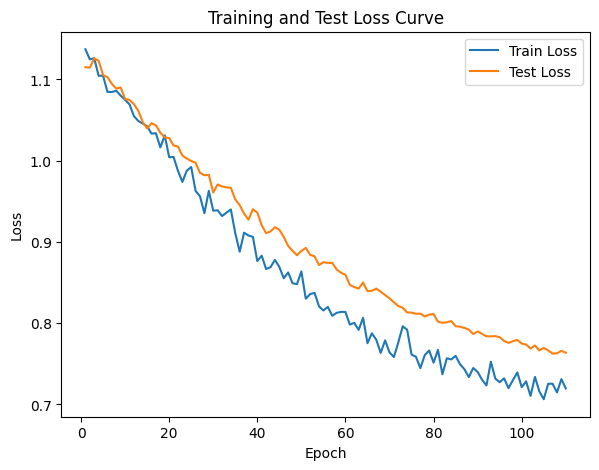

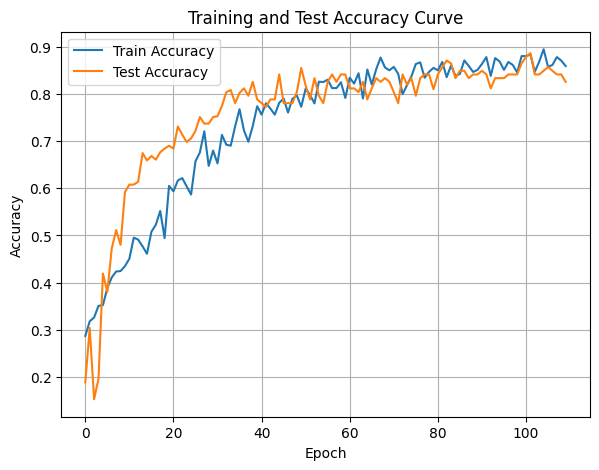

In [55]:
DTEmlp6b.train_single_model()

Randomly initializing 6 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.41it/s]

Epoch [1/10], Train F1:0.5099315383778446, Train Loss: 1.0842, Train Acc: 0.4452, Test F1:0.5467311475498071, Test Loss: 1.0749, Test Acc: 0.4253


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.16it/s]

Epoch [2/10], Train F1:0.5039396847755878, Train Loss: 1.0817, Train Acc: 0.4478, Test F1:0.5807987960825696, Test Loss: 1.0720, Test Acc: 0.4714


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.15it/s]

Epoch [3/10], Train F1:0.5053995819907453, Train Loss: 1.0821, Train Acc: 0.4531, Test F1:0.5911453470805311, Test Loss: 1.0719, Test Acc: 0.5095


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.23it/s]

Epoch [4/10], Train F1:0.5047166065228856, Train Loss: 1.0785, Train Acc: 0.4530, Test F1:0.5714446314810755, Test Loss: 1.0734, Test Acc: 0.4816


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.62it/s]

Epoch [5/10], Train F1:0.5143085389059034, Train Loss: 1.0735, Train Acc: 0.4633, Test F1:0.547118297752413, Test Loss: 1.0746, Test Acc: 0.4491


Training Process:  70%|███████   | 7/10 [00:00<00:00,  6.74it/s]

Epoch [6/10], Train F1:0.5249826145656962, Train Loss: 1.0695, Train Acc: 0.4763, Test F1:0.5725009817130952, Test Loss: 1.0728, Test Acc: 0.4883
Epoch [7/10], Train F1:0.5308816342880516, Train Loss: 1.0661, Train Acc: 0.4868, Test F1:0.5929048409277693, Test Loss: 1.0717, Test Acc: 0.5143


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.74it/s]

Epoch [8/10], Train F1:0.5375742768156665, Train Loss: 1.0616, Train Acc: 0.4948, Test F1:0.6048797388346892, Test Loss: 1.0691, Test Acc: 0.5390
Epoch [9/10], Train F1:0.5411654526128296, Train Loss: 1.0591, Train Acc: 0.5021, Test F1:0.6185813059419093, Test Loss: 1.0671, Test Acc: 0.5608


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.73it/s]


Epoch [10/10], Train F1:0.5449285810875908, Train Loss: 1.0557, Train Acc: 0.5077, Test F1:0.6255035122850883, Test Loss: 1.0662, Test Acc: 0.5766
Total Epochs: 10
Train loss start: 1.0656815767288208, Train loss end: 1.0102379322052002
Highest Mean Train Accuracy (over epoch): 0.5077083333333333
Test loss start: 1.0604934692382812, Test loss end: 1.0600908994674683
Highest mean Test Accuracy (over epoch): 0.5766493055555555


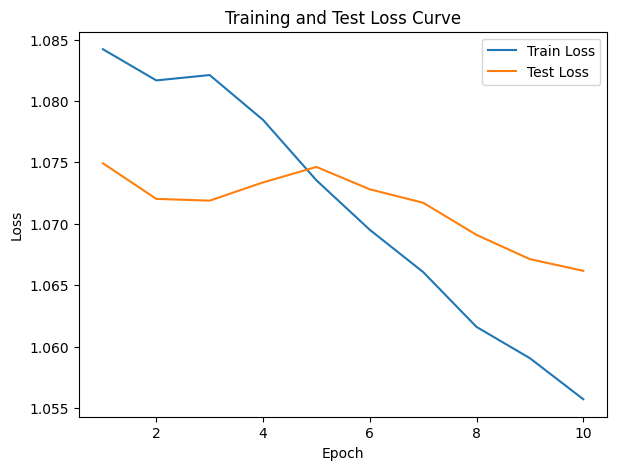

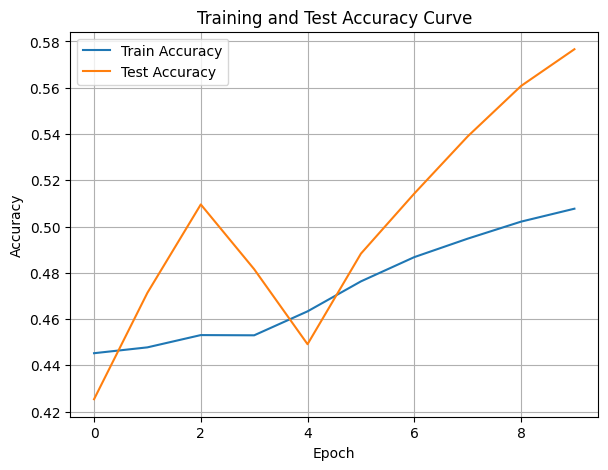

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.67it/s]

Epoch [1/10], Train F1:0.4970571323471733, Train Loss: 1.0563, Train Acc: 0.4955, Test F1:0.5819974773535146, Test Loss: 1.0679, Test Acc: 0.6233


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.01it/s]

Epoch [2/10], Train F1:0.49993127123993003, Train Loss: 1.0597, Train Acc: 0.4933, Test F1:0.5815126867758448, Test Loss: 1.0631, Test Acc: 0.6224


Training Process:  30%|███       | 3/10 [00:00<00:01,  5.41it/s]

Epoch [3/10], Train F1:0.5098444593355299, Train Loss: 1.0567, Train Acc: 0.5009, Test F1:0.5789735375368532, Test Loss: 1.0606, Test Acc: 0.6227


Training Process:  40%|████      | 4/10 [00:00<00:01,  5.13it/s]

Epoch [4/10], Train F1:0.5074635114320346, Train Loss: 1.0548, Train Acc: 0.5010, Test F1:0.57926406388429, Test Loss: 1.0539, Test Acc: 0.6337


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.18it/s]

Epoch [5/10], Train F1:0.5111822175212937, Train Loss: 1.0518, Train Acc: 0.5045, Test F1:0.5761742704932727, Test Loss: 1.0502, Test Acc: 0.6387


Training Process:  60%|██████    | 6/10 [00:01<00:00,  5.21it/s]

Epoch [6/10], Train F1:0.5131030291435094, Train Loss: 1.0489, Train Acc: 0.5098, Test F1:0.5731144461473403, Test Loss: 1.0485, Test Acc: 0.6348


Training Process:  70%|███████   | 7/10 [00:01<00:00,  4.26it/s]

Epoch [7/10], Train F1:0.5161715757019614, Train Loss: 1.0463, Train Acc: 0.5146, Test F1:0.5753177626475079, Test Loss: 1.0467, Test Acc: 0.6360


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  4.64it/s]

Epoch [8/10], Train F1:0.5205561900020866, Train Loss: 1.0450, Train Acc: 0.5183, Test F1:0.5764401428832372, Test Loss: 1.0432, Test Acc: 0.6399
Epoch [9/10], Train F1:0.5254617912436691, Train Loss: 1.0415, Train Acc: 0.5250, Test F1:0.5786949759221902, Test Loss: 1.0399, Test Acc: 0.6444


Training Process: 100%|██████████| 10/10 [00:02<00:00,  4.95it/s]


Epoch [10/10], Train F1:0.5323109711601229, Train Loss: 1.0368, Train Acc: 0.5343, Test F1:0.5823524402004361, Test Loss: 1.0368, Test Acc: 0.6488
Total Epochs: 10
Train loss start: 1.078803300857544, Train loss end: 0.8664339780807495
Highest Mean Train Accuracy (over epoch): 0.5342559523809524
Test loss start: 1.0647075176239014, Test loss end: 1.0128473043441772
Highest mean Test Accuracy (over epoch): 0.6487847222222222


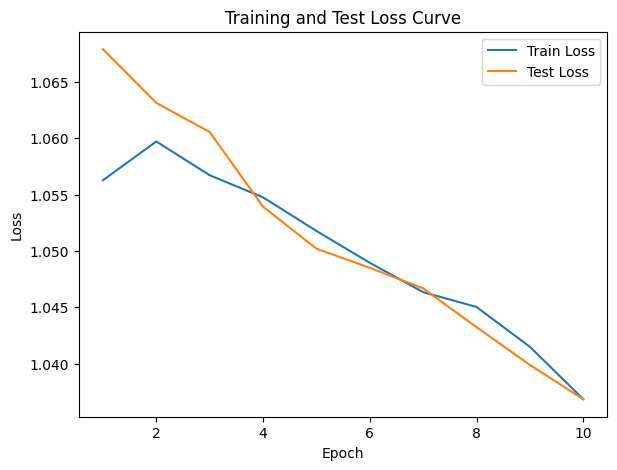

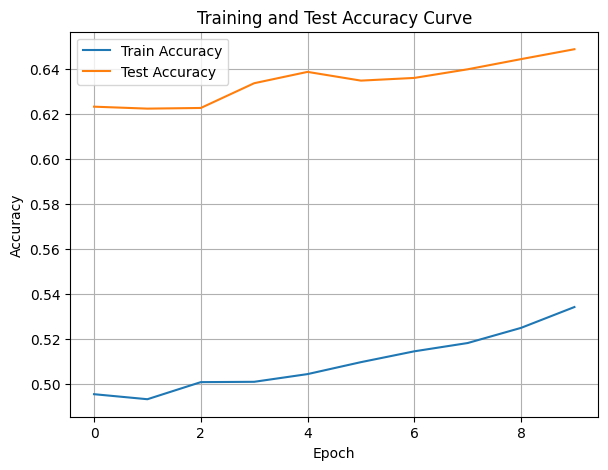

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.4129229928369096, Train Loss: 1.0983, Train Acc: 0.3536, Test F1:0.5614310779755541, Test Loss: 1.0754, Test Acc: 0.5651


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.71it/s]

Epoch [2/10], Train F1:0.4334269663928166, Train Loss: 1.0954, Train Acc: 0.3665, Test F1:0.5613281608582446, Test Loss: 1.0738, Test Acc: 0.5964


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.40it/s]

Epoch [3/10], Train F1:0.4502975991294294, Train Loss: 1.0919, Train Acc: 0.3819, Test F1:0.5532723923985096, Test Loss: 1.0718, Test Acc: 0.5885


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.11it/s]

Epoch [4/10], Train F1:0.4577625073014417, Train Loss: 1.0887, Train Acc: 0.3920, Test F1:0.5508301452289864, Test Loss: 1.0718, Test Acc: 0.5812


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.10it/s]

Epoch [5/10], Train F1:0.46468779868419413, Train Loss: 1.0855, Train Acc: 0.4002, Test F1:0.55914563268287, Test Loss: 1.0683, Test Acc: 0.5948


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.14it/s]

Epoch [6/10], Train F1:0.46741411570132047, Train Loss: 1.0840, Train Acc: 0.4056, Test F1:0.5616550254609295, Test Loss: 1.0670, Test Acc: 0.6003


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.23it/s]

Epoch [7/10], Train F1:0.47005445330999784, Train Loss: 1.0823, Train Acc: 0.4084, Test F1:0.5660584158955302, Test Loss: 1.0655, Test Acc: 0.6062


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.33it/s]

Epoch [8/10], Train F1:0.47940735972500303, Train Loss: 1.0780, Train Acc: 0.4228, Test F1:0.5713464720265897, Test Loss: 1.0635, Test Acc: 0.6115


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.16it/s]

Epoch [9/10], Train F1:0.483836094795816, Train Loss: 1.0751, Train Acc: 0.4275, Test F1:0.5740393420451428, Test Loss: 1.0611, Test Acc: 0.6157


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.59it/s]


Epoch [10/10], Train F1:0.49371649191879863, Train Loss: 1.0720, Train Acc: 0.4394, Test F1:0.5740253684932902, Test Loss: 1.0593, Test Acc: 0.6183
Total Epochs: 10
Train loss start: 1.1274882555007935, Train loss end: 1.0113389492034912
Highest Mean Train Accuracy (over epoch): 0.43940476190476196
Test loss start: 1.072380781173706, Test loss end: 1.0256956815719604
Highest mean Test Accuracy (over epoch): 0.6183159722222222


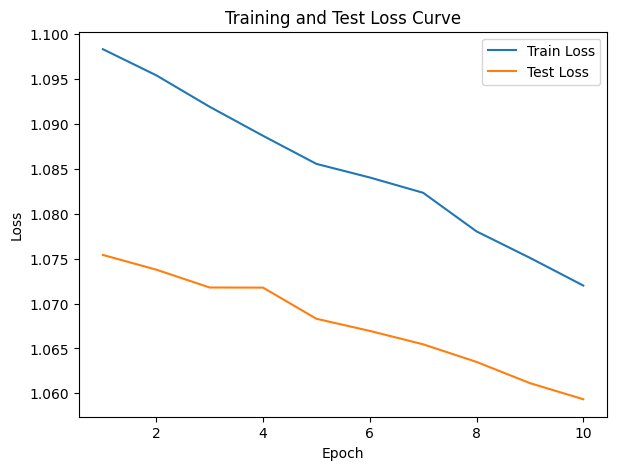

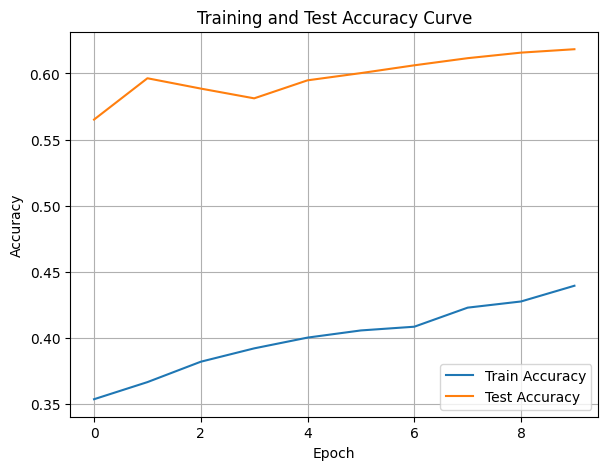

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.31it/s]

Epoch [1/10], Train F1:0.5507151181011062, Train Loss: 1.0177, Train Acc: 0.5839, Test F1:0.6022767958858184, Test Loss: 1.0639, Test Acc: 0.6667


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.50it/s]

Epoch [2/10], Train F1:0.5817941995650492, Train Loss: 1.0090, Train Acc: 0.6058, Test F1:0.595294302801385, Test Loss: 1.0646, Test Acc: 0.6658


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.75it/s]

Epoch [3/10], Train F1:0.5852831386276204, Train Loss: 1.0038, Train Acc: 0.6089, Test F1:0.5957051209750461, Test Loss: 1.0625, Test Acc: 0.6681


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.23it/s]

Epoch [4/10], Train F1:0.5994268535311003, Train Loss: 0.9976, Train Acc: 0.6185, Test F1:0.5959039923103238, Test Loss: 1.0611, Test Acc: 0.6693


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.40it/s]

Epoch [5/10], Train F1:0.6034873351415213, Train Loss: 0.9974, Train Acc: 0.6199, Test F1:0.5962155669758009, Test Loss: 1.0577, Test Acc: 0.6731


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.63it/s]

Epoch [6/10], Train F1:0.606166765197534, Train Loss: 0.9942, Train Acc: 0.6255, Test F1:0.6016716628171737, Test Loss: 1.0551, Test Acc: 0.6782


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.65it/s]

Epoch [7/10], Train F1:0.6083260244124677, Train Loss: 0.9928, Train Acc: 0.6282, Test F1:0.6078010099432558, Test Loss: 1.0534, Test Acc: 0.6830


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.36it/s]

Epoch [8/10], Train F1:0.6061517717373472, Train Loss: 0.9894, Train Acc: 0.6291, Test F1:0.6173752870705779, Test Loss: 1.0514, Test Acc: 0.6886


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.99it/s]


Epoch [9/10], Train F1:0.6086455043606812, Train Loss: 0.9870, Train Acc: 0.6328, Test F1:0.6213317313258175, Test Loss: 1.0488, Test Acc: 0.6912
Epoch [10/10], Train F1:0.6124735117589621, Train Loss: 0.9841, Train Acc: 0.6383, Test F1:0.6251205716297655, Test Loss: 1.0469, Test Acc: 0.6940
Total Epochs: 10
Train loss start: 1.0289061069488525, Train loss end: 0.8681473731994629
Highest Mean Train Accuracy (over epoch): 0.6383333333333333
Test loss start: 1.0623754262924194, Test loss end: 1.0151559114456177
Highest mean Test Accuracy (over epoch): 0.6940104166666666


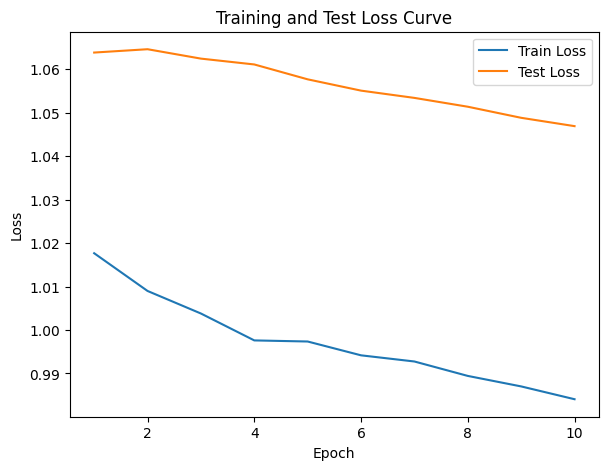

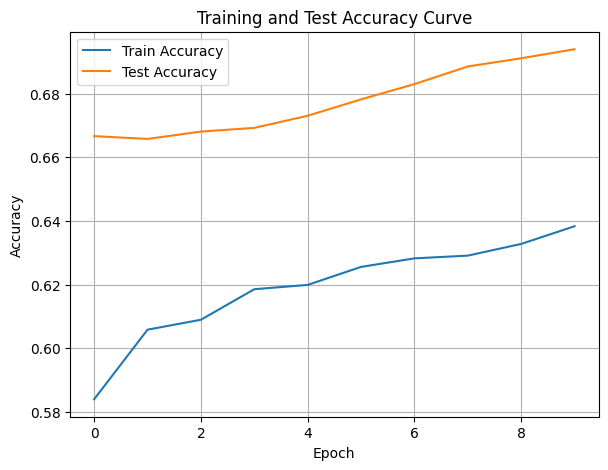

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.89it/s]

Epoch [1/10], Train F1:0.5094733429845985, Train Loss: 1.0603, Train Acc: 0.4839, Test F1:0.5749316531783535, Test Loss: 1.0353, Test Acc: 0.6337


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.05it/s]

Epoch [2/10], Train F1:0.4995668109796875, Train Loss: 1.0631, Train Acc: 0.4719, Test F1:0.5584157026460503, Test Loss: 1.0215, Test Acc: 0.6385


Training Process:  30%|███       | 3/10 [00:00<00:01,  5.52it/s]

Epoch [3/10], Train F1:0.5156336081062786, Train Loss: 1.0549, Train Acc: 0.4894, Test F1:0.5497256850640309, Test Loss: 1.0105, Test Acc: 0.6447


Training Process:  40%|████      | 4/10 [00:00<00:01,  5.13it/s]

Epoch [4/10], Train F1:0.5190648302422328, Train Loss: 1.0527, Train Acc: 0.4979, Test F1:0.5496063885129054, Test Loss: 1.0058, Test Acc: 0.6497


Training Process:  60%|██████    | 6/10 [00:01<00:00,  5.01it/s]

Epoch [5/10], Train F1:0.5213288306759364, Train Loss: 1.0502, Train Acc: 0.4996, Test F1:0.553900209994811, Test Loss: 1.0021, Test Acc: 0.6559
Epoch [6/10], Train F1:0.5247553471987317, Train Loss: 1.0474, Train Acc: 0.5041, Test F1:0.5587227941294927, Test Loss: 0.9974, Test Acc: 0.6600


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.61it/s]

Epoch [7/10], Train F1:0.5280187657681829, Train Loss: 1.0446, Train Acc: 0.5068, Test F1:0.5605045037361321, Test Loss: 0.9939, Test Acc: 0.6629
Epoch [8/10], Train F1:0.5301088556402007, Train Loss: 1.0418, Train Acc: 0.5089, Test F1:0.559319248544024, Test Loss: 0.9903, Test Acc: 0.6642


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.89it/s]


Epoch [9/10], Train F1:0.5355975610659711, Train Loss: 1.0386, Train Acc: 0.5159, Test F1:0.560624840344224, Test Loss: 0.9861, Test Acc: 0.6660
Epoch [10/10], Train F1:0.5412215568739869, Train Loss: 1.0354, Train Acc: 0.5220, Test F1:0.5668890067939356, Test Loss: 0.9838, Test Acc: 0.6704
Total Epochs: 10
Train loss start: 1.0591330528259277, Train loss end: 1.0056705474853516
Highest Mean Train Accuracy (over epoch): 0.5219940476190476
Test loss start: 1.037926197052002, Test loss end: 0.9458993077278137
Highest mean Test Accuracy (over epoch): 0.6703993055555555


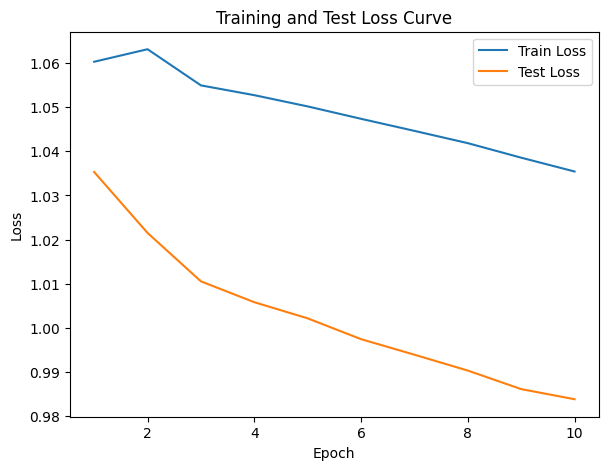

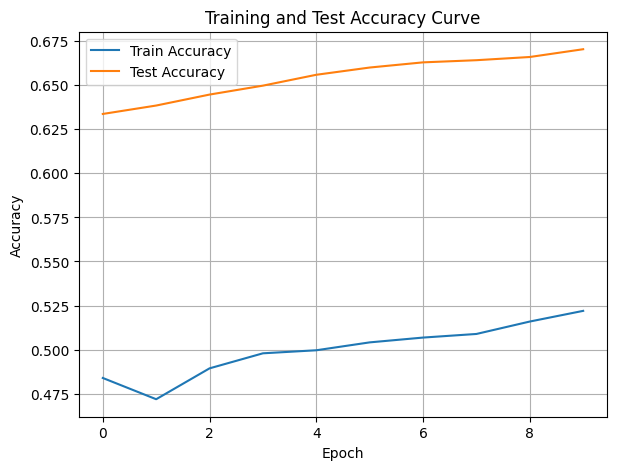

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.79it/s]

Epoch [1/10], Train F1:0.42004240204240195, Train Loss: 1.0910, Train Acc: 0.3756, Test F1:0.25829216426135554, Test Loss: 1.0961, Test Acc: 0.2847
Epoch [2/10], Train F1:0.4132193681247037, Train Loss: 1.0934, Train Acc: 0.3582, Test F1:0.2828051809049721, Test Loss: 1.0907, Test Acc: 0.3043


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.79it/s]

Epoch [3/10], Train F1:0.4113271077671665, Train Loss: 1.0936, Train Acc: 0.3535, Test F1:0.2988975788166584, Test Loss: 1.0871, Test Acc: 0.3160


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.77it/s]

Epoch [4/10], Train F1:0.42126727221759436, Train Loss: 1.0935, Train Acc: 0.3610, Test F1:0.3068440353295946, Test Loss: 1.0855, Test Acc: 0.3199


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.88it/s]

Epoch [5/10], Train F1:0.43100863412715246, Train Loss: 1.0920, Train Acc: 0.3705, Test F1:0.31374902279347855, Test Loss: 1.0832, Test Acc: 0.3253


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.61it/s]

Epoch [6/10], Train F1:0.43785302442080987, Train Loss: 1.0912, Train Acc: 0.3788, Test F1:0.317147196305797, Test Loss: 1.0815, Test Acc: 0.3290


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.13it/s]

Epoch [7/10], Train F1:0.4503442495012392, Train Loss: 1.0871, Train Acc: 0.3919, Test F1:0.3182768563310087, Test Loss: 1.0793, Test Acc: 0.3327


Training Process:  80%|████████  | 8/10 [00:00<00:00,  7.91it/s]

Epoch [8/10], Train F1:0.45480743382896016, Train Loss: 1.0844, Train Acc: 0.3961, Test F1:0.3199054562547958, Test Loss: 1.0772, Test Acc: 0.3365


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.83it/s]

Epoch [9/10], Train F1:0.46503949609988204, Train Loss: 1.0807, Train Acc: 0.4066, Test F1:0.3179379815621105, Test Loss: 1.0755, Test Acc: 0.3377


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.74it/s]


Epoch [10/10], Train F1:0.4746176572845407, Train Loss: 1.0773, Train Acc: 0.4173, Test F1:0.3383252013374128, Test Loss: 1.0739, Test Acc: 0.3482
Total Epochs: 10
Train loss start: 1.0388882160186768, Train loss end: 1.03916335105896
Highest Mean Train Accuracy (over epoch): 0.4172619047619048
Test loss start: 1.096707820892334, Test loss end: 1.0543345212936401
Highest mean Test Accuracy (over epoch): 0.34817708333333336


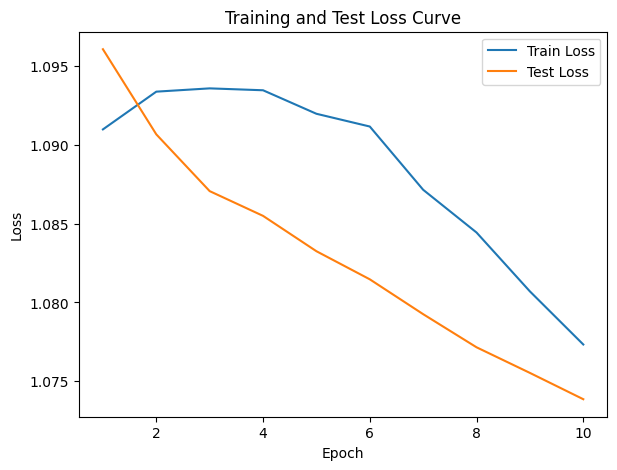

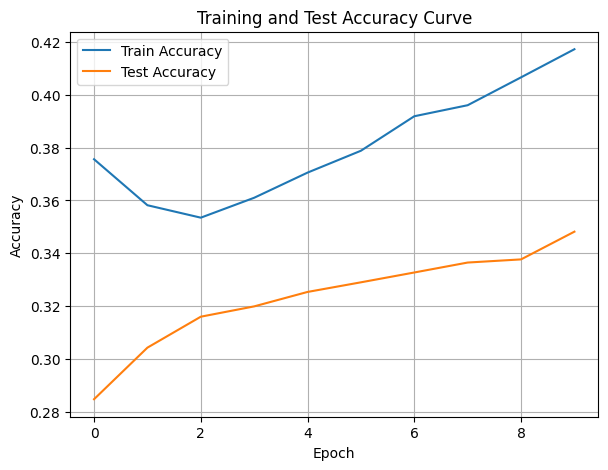

./saved_models/model_6.pth
Training Model with id 11
in multi


Epoch [1/10], Train F1:0.5155908217844521, Train Loss: 1.0497, Train Acc: 0.4851, Test F1:0.4072798819478603, Test Loss: 1.0534, Test Acc: 0.3880


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.48it/s]

Epoch [2/10], Train F1:0.5389237191317894, Train Loss: 1.0459, Train Acc: 0.4979, Test F1:0.382218244136597, Test Loss: 1.0525, Test Acc: 0.3793
Epoch [3/10], Train F1:0.5404129516805573, Train Loss: 1.0398, Train Acc: 0.5093, Test F1:0.41082252567533567, Test Loss: 1.0522, Test Acc: 0.3999


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.19it/s]

Epoch [4/10], Train F1:0.5428571086570246, Train Loss: 1.0372, Train Acc: 0.5108, Test F1:0.42628279918570317, Test Loss: 1.0505, Test Acc: 0.4086
Epoch [5/10], Train F1:0.5592736166758819, Train Loss: 1.0318, Train Acc: 0.5267, Test F1:0.458240865046531, Test Loss: 1.0493, Test Acc: 0.4335


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.07it/s]

Epoch [6/10], Train F1:0.5685168887610951, Train Loss: 1.0297, Train Acc: 0.5346, Test F1:0.47222409204189997, Test Loss: 1.0470, Test Acc: 0.4485
Epoch [7/10], Train F1:0.575397744407658, Train Loss: 1.0263, Train Acc: 0.5433, Test F1:0.4865942477937025, Test Loss: 1.0459, Test Acc: 0.4614


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.12it/s]

Epoch [8/10], Train F1:0.5830468913078289, Train Loss: 1.0238, Train Acc: 0.5507, Test F1:0.521795803049797, Test Loss: 1.0446, Test Acc: 0.4935
Epoch [9/10], Train F1:0.5916013577192932, Train Loss: 1.0196, Train Acc: 0.5614, Test F1:0.5449282615949282, Test Loss: 1.0431, Test Acc: 0.5167


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.58it/s]


Epoch [10/10], Train F1:0.5993241101501449, Train Loss: 1.0167, Train Acc: 0.5697, Test F1:0.5606332860937692, Test Loss: 1.0413, Test Acc: 0.5331
Total Epochs: 10
Train loss start: 1.0391291379928589, Train loss end: 1.0136665105819702
Highest Mean Train Accuracy (over epoch): 0.5697023809523809
Test loss start: 1.0537889003753662, Test loss end: 1.0150351524353027
Highest mean Test Accuracy (over epoch): 0.5330729166666666


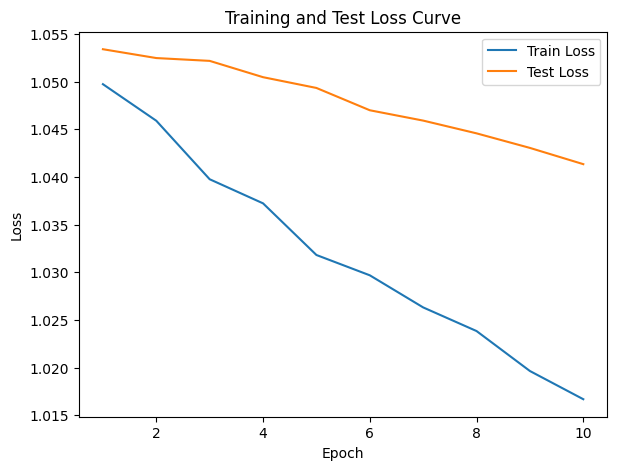

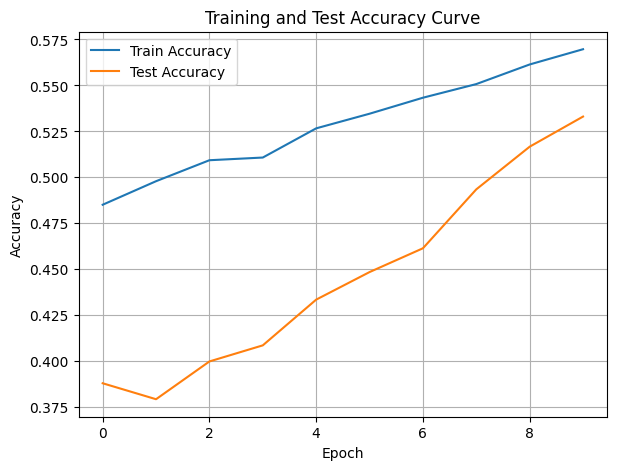

./saved_models/model_11.pth
Training Model with id 9
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.71it/s]

Epoch [1/10], Train F1:0.6392009521399167, Train Loss: 0.9792, Train Acc: 0.6268, Test F1:0.7543859649122807, Test Loss: 1.0148, Test Acc: 0.7569


Training Process:  20%|██        | 2/10 [00:00<00:01,  8.00it/s]

Epoch [2/10], Train F1:0.653217210485033, Train Loss: 0.9759, Train Acc: 0.6409, Test F1:0.7394527986633249, Test Loss: 1.0144, Test Acc: 0.7352


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.45it/s]

Epoch [3/10], Train F1:0.6584285434969551, Train Loss: 0.9724, Train Acc: 0.6488, Test F1:0.7483736920952607, Test Loss: 1.0160, Test Acc: 0.7410


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.81it/s]

Epoch [4/10], Train F1:0.6701596847876797, Train Loss: 0.9719, Train Acc: 0.6571, Test F1:0.7508868406210111, Test Loss: 1.0143, Test Acc: 0.7485


Training Process:  60%|██████    | 6/10 [00:00<00:00,  6.74it/s]

Epoch [5/10], Train F1:0.6742985158780237, Train Loss: 0.9682, Train Acc: 0.6629, Test F1:0.7445716593393182, Test Loss: 1.0134, Test Acc: 0.7387
Epoch [6/10], Train F1:0.6794350620509733, Train Loss: 0.9674, Train Acc: 0.6690, Test F1:0.7513979904961208, Test Loss: 1.0109, Test Acc: 0.7480


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.17it/s]

Epoch [7/10], Train F1:0.6857417186438718, Train Loss: 0.9631, Train Acc: 0.6766, Test F1:0.755671492870168, Test Loss: 1.0090, Test Acc: 0.7526
Epoch [8/10], Train F1:0.6919426896998809, Train Loss: 0.9613, Train Acc: 0.6828, Test F1:0.7630912122434591, Test Loss: 1.0066, Test Acc: 0.7615


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.41it/s]


Epoch [9/10], Train F1:0.6914844675875211, Train Loss: 0.9610, Train Acc: 0.6816, Test F1:0.7691823544294799, Test Loss: 1.0055, Test Acc: 0.7686
Epoch [10/10], Train F1:0.6964976243972895, Train Loss: 0.9579, Train Acc: 0.6871, Test F1:0.7710335794006162, Test Loss: 1.0034, Test Acc: 0.7714
Total Epochs: 10
Train loss start: 0.9750899076461792, Train loss end: 0.8679959177970886
Highest Mean Train Accuracy (over epoch): 0.6871428571428572
Test loss start: 1.0115933418273926, Test loss end: 0.9708229899406433
Highest mean Test Accuracy (over epoch): 0.7713541666666666


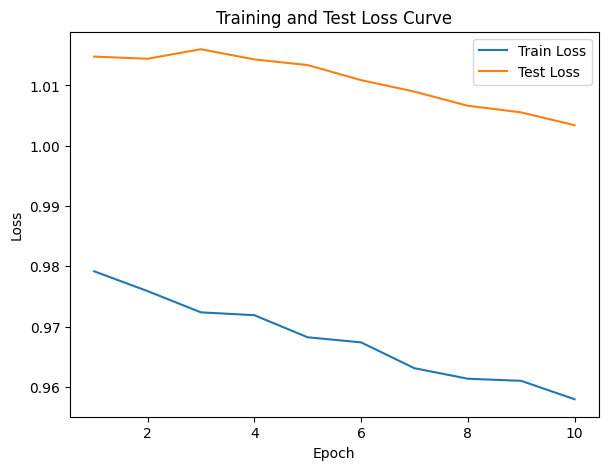

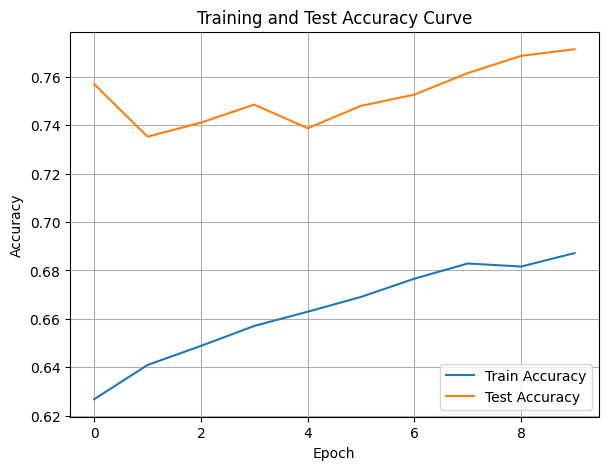

./saved_models/model_9.pth
Training Model with id 12
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.7450536075821335, Train Loss: 0.9275, Train Acc: 0.7414, Test F1:0.8074780881654505, Test Loss: 0.9849, Test Acc: 0.8177


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.06it/s]

Epoch [2/10], Train F1:0.739255204626169, Train Loss: 0.9298, Train Acc: 0.7345, Test F1:0.8134828797762729, Test Loss: 0.9864, Test Acc: 0.8186
Epoch [3/10], Train F1:0.740852997467649, Train Loss: 0.9258, Train Acc: 0.7386, Test F1:0.8148480576911954, Test Loss: 0.9838, Test Acc: 0.8209


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.57it/s]

Epoch [4/10], Train F1:0.7422928087441069, Train Loss: 0.9237, Train Acc: 0.7398, Test F1:0.819313240365872, Test Loss: 0.9811, Test Acc: 0.8240
Epoch [5/10], Train F1:0.743018844363612, Train Loss: 0.9225, Train Acc: 0.7405, Test F1:0.8176711625696225, Test Loss: 0.9800, Test Acc: 0.8215
Epoch [6/10], Train F1:0.7478875374248984, Train Loss: 0.9185, Train Acc: 0.7436, Test F1:0.8182154762298436, Test Loss: 0.9779, Test Acc: 0.8212


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.08it/s]

Epoch [7/10], Train F1:0.750353735552984, Train Loss: 0.9156, Train Acc: 0.7466, Test F1:0.8192664015462886, Test Loss: 0.9753, Test Acc: 0.8218
Epoch [8/10], Train F1:0.7553808623924602, Train Loss: 0.9124, Train Acc: 0.7523, Test F1:0.8164388328360471, Test Loss: 0.9735, Test Acc: 0.8196


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.41it/s]


Epoch [9/10], Train F1:0.7568272318334774, Train Loss: 0.9105, Train Acc: 0.7520, Test F1:0.8165481734504271, Test Loss: 0.9722, Test Acc: 0.8187
Epoch [10/10], Train F1:0.7629175289183279, Train Loss: 0.9055, Train Acc: 0.7593, Test F1:0.8178017860184441, Test Loss: 0.9709, Test Acc: 0.8195
Total Epochs: 10
Train loss start: 0.9709156155586243, Train loss end: 0.7491244077682495
Highest Mean Train Accuracy (over epoch): 0.7592857142857142
Test loss start: 0.9802146553993225, Test loss end: 0.9400358200073242
Highest mean Test Accuracy (over epoch): 0.8240017361111112


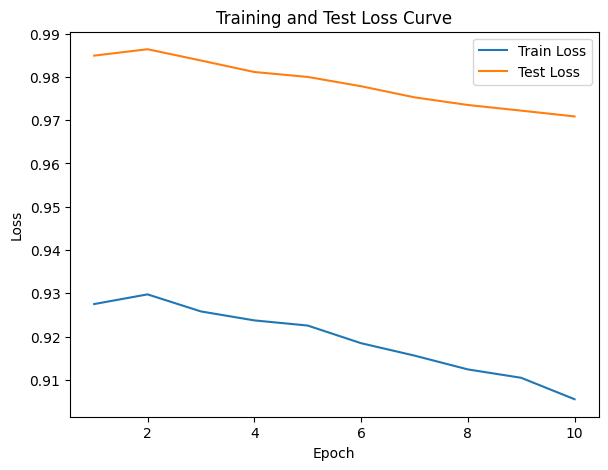

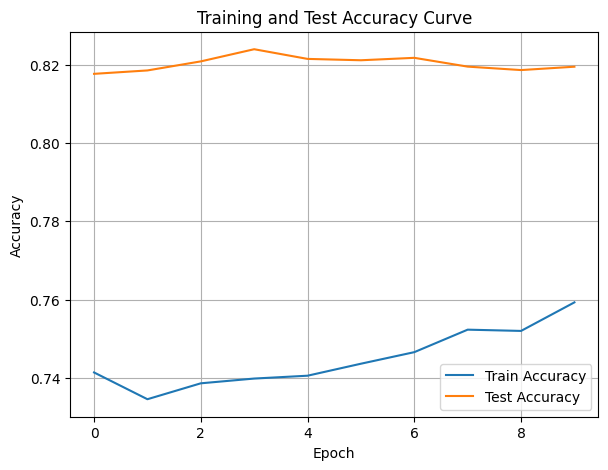

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.34it/s]

Epoch [1/10], Train F1:0.773547043923476, Train Loss: 0.8770, Train Acc: 0.7842, Test F1:0.8275470231153375, Test Loss: 0.9537, Test Acc: 0.8333


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.88it/s]

Epoch [2/10], Train F1:0.7772897129982708, Train Loss: 0.8857, Train Acc: 0.7778, Test F1:0.8381003325813429, Test Loss: 0.9510, Test Acc: 0.8411


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.29it/s]

Epoch [3/10], Train F1:0.7796175396378351, Train Loss: 0.8810, Train Acc: 0.7778, Test F1:0.8236625318570688, Test Loss: 0.9496, Test Acc: 0.8287


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.75it/s]

Epoch [4/10], Train F1:0.7864740576197229, Train Loss: 0.8719, Train Acc: 0.7885, Test F1:0.8242016991041363, Test Loss: 0.9463, Test Acc: 0.8299


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.01it/s]

Epoch [5/10], Train F1:0.7863212003482573, Train Loss: 0.8689, Train Acc: 0.7874, Test F1:0.8255646880171059, Test Loss: 0.9445, Test Acc: 0.8293


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.46it/s]

Epoch [6/10], Train F1:0.7887327389747419, Train Loss: 0.8673, Train Acc: 0.7895, Test F1:0.8278186518194471, Test Loss: 0.9422, Test Acc: 0.8313


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.01it/s]

Epoch [7/10], Train F1:0.788727828881225, Train Loss: 0.8662, Train Acc: 0.7908, Test F1:0.8331823735369924, Test Loss: 0.9397, Test Acc: 0.8361


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.99it/s]

Epoch [8/10], Train F1:0.7923954033112431, Train Loss: 0.8650, Train Acc: 0.7931, Test F1:0.8357801233410601, Test Loss: 0.9372, Test Acc: 0.8387


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.04it/s]

Epoch [9/10], Train F1:0.7966640995201066, Train Loss: 0.8631, Train Acc: 0.7977, Test F1:0.8356149986421053, Test Loss: 0.9352, Test Acc: 0.8383


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.30it/s]


Epoch [10/10], Train F1:0.7987214893242113, Train Loss: 0.8613, Train Acc: 0.7993, Test F1:0.8334993512149168, Test Loss: 0.9330, Test Acc: 0.8364
Total Epochs: 10
Train loss start: 0.9017668962478638, Train loss end: 0.8581530451774597
Highest Mean Train Accuracy (over epoch): 0.7993154761904762
Test loss start: 0.9506669044494629, Test loss end: 0.893840491771698
Highest mean Test Accuracy (over epoch): 0.8411458333333334


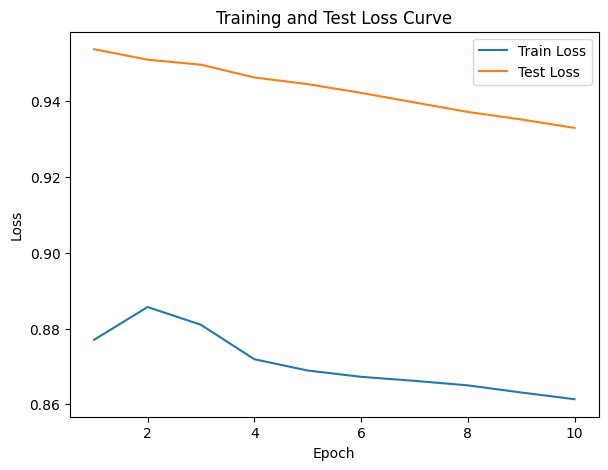

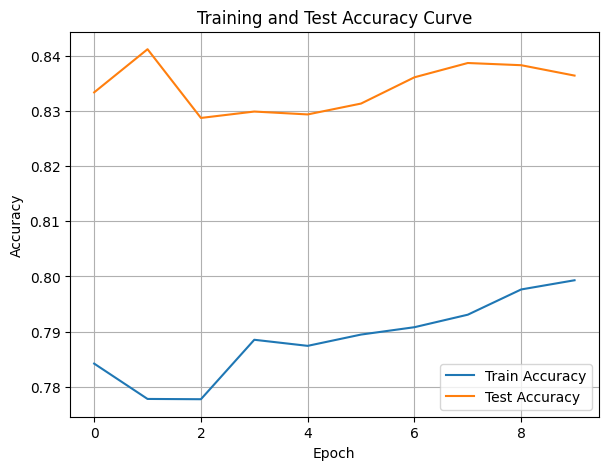

./saved_models/model_10.pth
Training Model with id 8
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.8077667964713454, Train Loss: 0.8478, Train Acc: 0.8080, Test F1:0.792308515190415, Test Loss: 0.9173, Test Acc: 0.7977


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.54it/s]

Epoch [2/10], Train F1:0.8233583467401361, Train Loss: 0.8326, Train Acc: 0.8253, Test F1:0.8146241658656701, Test Loss: 0.9159, Test Acc: 0.8194
Epoch [3/10], Train F1:0.8164133204463581, Train Loss: 0.8342, Train Acc: 0.8199, Test F1:0.8279497764017887, Test Loss: 0.9122, Test Acc: 0.8319


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.68it/s]

Epoch [4/10], Train F1:0.8164892151467271, Train Loss: 0.8335, Train Acc: 0.8209, Test F1:0.8324687843484836, Test Loss: 0.9098, Test Acc: 0.8362


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.53it/s]

Epoch [5/10], Train F1:0.8149189265559925, Train Loss: 0.8327, Train Acc: 0.8173, Test F1:0.8348074521936486, Test Loss: 0.9084, Test Acc: 0.8387
Epoch [6/10], Train F1:0.8187634277390374, Train Loss: 0.8310, Train Acc: 0.8215, Test F1:0.834690618165025, Test Loss: 0.9074, Test Acc: 0.8391


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.52it/s]

Epoch [7/10], Train F1:0.8210127956770229, Train Loss: 0.8284, Train Acc: 0.8247, Test F1:0.8362908912971518, Test Loss: 0.9055, Test Acc: 0.8405
Epoch [8/10], Train F1:0.821823469896813, Train Loss: 0.8269, Train Acc: 0.8259, Test F1:0.8360195393269586, Test Loss: 0.9037, Test Acc: 0.8406


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.79it/s]


Epoch [9/10], Train F1:0.8243044977001343, Train Loss: 0.8255, Train Acc: 0.8284, Test F1:0.837113075901365, Test Loss: 0.9024, Test Acc: 0.8415
Epoch [10/10], Train F1:0.8257317168995187, Train Loss: 0.8233, Train Acc: 0.8306, Test F1:0.8389829303590296, Test Loss: 0.9017, Test Acc: 0.8431
Total Epochs: 10
Train loss start: 0.8589401841163635, Train loss end: 0.7006627321243286
Highest Mean Train Accuracy (over epoch): 0.8305654761904762
Test loss start: 0.9113373756408691, Test loss end: 0.8793220520019531
Highest mean Test Accuracy (over epoch): 0.8430555555555557


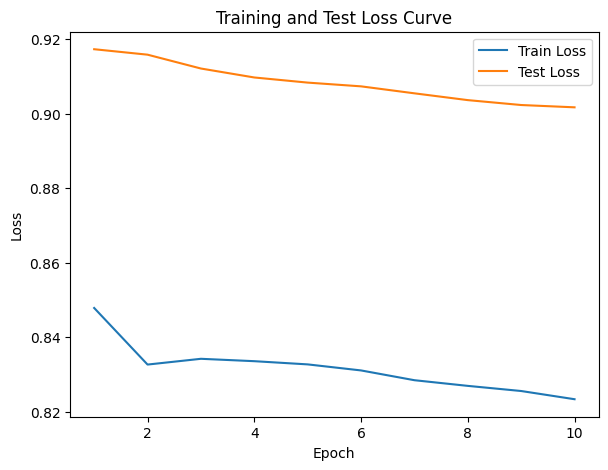

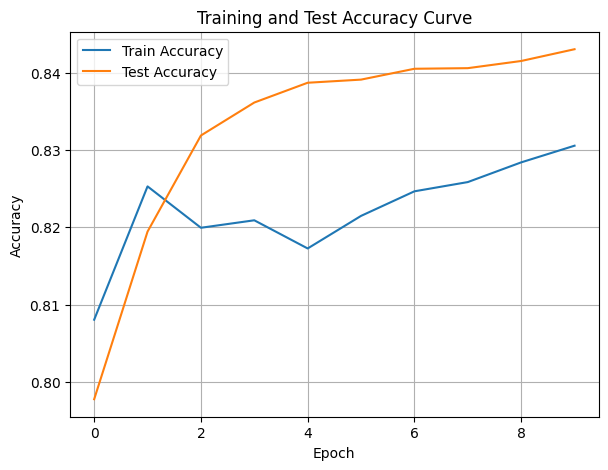

./saved_models/model_8.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [56]:
DTEmlp6b.train_DTE()

Training Process:   1%|          | 1/110 [00:00<00:16,  6.59it/s]

Epoch [1/110], Train F1:0.33583329937028944, Train Loss: 1.1425, Train Acc: 0.2649, Test F1:0.5218554861730598, Test Loss: 1.0896, Test Acc: 0.4939


Training Process:   2%|▏         | 2/110 [00:00<00:14,  7.68it/s]

Epoch [2/110], Train F1:0.36933211715820413, Train Loss: 1.1284, Train Acc: 0.2957, Test F1:0.5339666543672132, Test Loss: 1.0844, Test Acc: 0.5243


Training Process:   3%|▎         | 3/110 [00:00<00:12,  8.58it/s]

Epoch [3/110], Train F1:0.3583671780719144, Train Loss: 1.1305, Train Acc: 0.2872, Test F1:0.544642392570724, Test Loss: 1.0812, Test Acc: 0.5443


Training Process:   4%|▎         | 4/110 [00:00<00:12,  8.79it/s]

Epoch [4/110], Train F1:0.3720354587326325, Train Loss: 1.1250, Train Acc: 0.3039, Test F1:0.551885814082718, Test Loss: 1.0805, Test Acc: 0.5503


Training Process:   5%|▍         | 5/110 [00:00<00:12,  8.73it/s]

Epoch [5/110], Train F1:0.38741487219005827, Train Loss: 1.1214, Train Acc: 0.3210, Test F1:0.5624645471879034, Test Loss: 1.0768, Test Acc: 0.5634


Training Process:   5%|▌         | 6/110 [00:00<00:12,  8.61it/s]

Epoch [6/110], Train F1:0.38421875095818714, Train Loss: 1.1211, Train Acc: 0.3159, Test F1:0.5745034227359443, Test Loss: 1.0745, Test Acc: 0.5718


Training Process:   6%|▋         | 7/110 [00:00<00:11,  8.66it/s]

Epoch [7/110], Train F1:0.39593874300593906, Train Loss: 1.1167, Train Acc: 0.3273, Test F1:0.5811988722934718, Test Loss: 1.0723, Test Acc: 0.5800


Training Process:   7%|▋         | 8/110 [00:00<00:11,  8.61it/s]

Epoch [8/110], Train F1:0.4075102101481366, Train Loss: 1.1135, Train Acc: 0.3386, Test F1:0.5926606146472863, Test Loss: 1.0709, Test Acc: 0.5918


Training Process:   8%|▊         | 9/110 [00:01<00:12,  8.34it/s]

Epoch [9/110], Train F1:0.4225384841849344, Train Loss: 1.1088, Train Acc: 0.3520, Test F1:0.6027041441492075, Test Loss: 1.0681, Test Acc: 0.6038


Training Process:   9%|▉         | 10/110 [00:01<00:13,  7.48it/s]

Epoch [10/110], Train F1:0.43162804306508595, Train Loss: 1.1059, Train Acc: 0.3590, Test F1:0.6116730052306164, Test Loss: 1.0656, Test Acc: 0.6140


Training Process:  10%|█         | 11/110 [00:01<00:13,  7.51it/s]

Epoch [11/110], Train F1:0.43957475663737977, Train Loss: 1.1024, Train Acc: 0.3675, Test F1:0.6193041169530934, Test Loss: 1.0645, Test Acc: 0.6209


Training Process:  11%|█         | 12/110 [00:01<00:13,  7.51it/s]

Epoch [12/110], Train F1:0.45020754439901434, Train Loss: 1.0989, Train Acc: 0.3773, Test F1:0.6266685702270711, Test Loss: 1.0627, Test Acc: 0.6285


Training Process:  12%|█▏        | 13/110 [00:01<00:13,  7.46it/s]

Epoch [13/110], Train F1:0.46171337949939634, Train Loss: 1.0946, Train Acc: 0.3886, Test F1:0.6345553388604651, Test Loss: 1.0607, Test Acc: 0.6373


Training Process:  13%|█▎        | 14/110 [00:01<00:12,  7.42it/s]

Epoch [14/110], Train F1:0.4674846907746162, Train Loss: 1.0911, Train Acc: 0.3948, Test F1:0.6433123009141719, Test Loss: 1.0585, Test Acc: 0.6458


Training Process:  14%|█▎        | 15/110 [00:01<00:12,  7.35it/s]

Epoch [15/110], Train F1:0.47517042980433594, Train Loss: 1.0882, Train Acc: 0.4020, Test F1:0.6508833059737306, Test Loss: 1.0570, Test Acc: 0.6538


Training Process:  15%|█▍        | 16/110 [00:02<00:13,  7.19it/s]

Epoch [16/110], Train F1:0.4813674288734894, Train Loss: 1.0853, Train Acc: 0.4093, Test F1:0.656800974005774, Test Loss: 1.0550, Test Acc: 0.6599


Training Process:  15%|█▌        | 17/110 [00:02<00:13,  6.92it/s]

Epoch [17/110], Train F1:0.49121668057406476, Train Loss: 1.0818, Train Acc: 0.4192, Test F1:0.6621319632492064, Test Loss: 1.0527, Test Acc: 0.6658


Training Process:  16%|█▋        | 18/110 [00:02<00:12,  7.10it/s]

Epoch [18/110], Train F1:0.49846677206974105, Train Loss: 1.0786, Train Acc: 0.4270, Test F1:0.6687655167278992, Test Loss: 1.0507, Test Acc: 0.6731


Training Process:  18%|█▊        | 20/110 [00:02<00:13,  6.73it/s]

Epoch [19/110], Train F1:0.5073037474598191, Train Loss: 1.0747, Train Acc: 0.4371, Test F1:0.6748172093264513, Test Loss: 1.0490, Test Acc: 0.6784
Epoch [20/110], Train F1:0.5141484493571281, Train Loss: 1.0714, Train Acc: 0.4458, Test F1:0.6814652373175846, Test Loss: 1.0472, Test Acc: 0.6848


Training Process:  20%|██        | 22/110 [00:02<00:13,  6.76it/s]

Epoch [21/110], Train F1:0.5226865544727997, Train Loss: 1.0680, Train Acc: 0.4552, Test F1:0.6871058723741602, Test Loss: 1.0455, Test Acc: 0.6904
Epoch [22/110], Train F1:0.5300830252341664, Train Loss: 1.0645, Train Acc: 0.4638, Test F1:0.6916748652181914, Test Loss: 1.0439, Test Acc: 0.6956


Training Process:  22%|██▏       | 24/110 [00:03<00:12,  6.62it/s]

Epoch [23/110], Train F1:0.5368440750956112, Train Loss: 1.0610, Train Acc: 0.4722, Test F1:0.696696044420237, Test Loss: 1.0419, Test Acc: 0.7012
Epoch [24/110], Train F1:0.5444987405507763, Train Loss: 1.0576, Train Acc: 0.4810, Test F1:0.7007911064366242, Test Loss: 1.0398, Test Acc: 0.7061


Training Process:  24%|██▎       | 26/110 [00:03<00:12,  6.74it/s]

Epoch [25/110], Train F1:0.5519483519562974, Train Loss: 1.0540, Train Acc: 0.4902, Test F1:0.7055193486770329, Test Loss: 1.0376, Test Acc: 0.7112
Epoch [26/110], Train F1:0.5584511851204085, Train Loss: 1.0507, Train Acc: 0.4980, Test F1:0.7095836941221679, Test Loss: 1.0357, Test Acc: 0.7153


Training Process:  25%|██▌       | 28/110 [00:03<00:11,  6.89it/s]

Epoch [27/110], Train F1:0.5639297880585553, Train Loss: 1.0474, Train Acc: 0.5052, Test F1:0.7145073668169994, Test Loss: 1.0339, Test Acc: 0.7203
Epoch [28/110], Train F1:0.5694202019498017, Train Loss: 1.0445, Train Acc: 0.5120, Test F1:0.7192174160719922, Test Loss: 1.0323, Test Acc: 0.7249


Training Process:  27%|██▋       | 30/110 [00:04<00:12,  6.24it/s]

Epoch [29/110], Train F1:0.5750767512358036, Train Loss: 1.0414, Train Acc: 0.5191, Test F1:0.7227732034471973, Test Loss: 1.0304, Test Acc: 0.7284
Epoch [30/110], Train F1:0.5803736614567753, Train Loss: 1.0382, Train Acc: 0.5256, Test F1:0.726085274187479, Test Loss: 1.0283, Test Acc: 0.7317


Training Process:  28%|██▊       | 31/110 [00:04<00:13,  5.99it/s]

Epoch [31/110], Train F1:0.586333642263359, Train Loss: 1.0352, Train Acc: 0.5321, Test F1:0.7287989014652481, Test Loss: 1.0267, Test Acc: 0.7345


Training Process:  30%|███       | 33/110 [00:04<00:13,  5.82it/s]

Epoch [32/110], Train F1:0.5925274876993828, Train Loss: 1.0318, Train Acc: 0.5398, Test F1:0.7301148750041786, Test Loss: 1.0250, Test Acc: 0.7365
Epoch [33/110], Train F1:0.5973740448935233, Train Loss: 1.0289, Train Acc: 0.5455, Test F1:0.7325395775488407, Test Loss: 1.0234, Test Acc: 0.7390


Training Process:  31%|███       | 34/110 [00:04<00:13,  5.75it/s]

Epoch [34/110], Train F1:0.6016600727566014, Train Loss: 1.0262, Train Acc: 0.5509, Test F1:0.7349339593649228, Test Loss: 1.0212, Test Acc: 0.7413


Training Process:  32%|███▏      | 35/110 [00:05<00:13,  5.72it/s]

Epoch [35/110], Train F1:0.6064565651322367, Train Loss: 1.0234, Train Acc: 0.5562, Test F1:0.7370764063604465, Test Loss: 1.0192, Test Acc: 0.7436


Training Process:  33%|███▎      | 36/110 [00:05<00:13,  5.49it/s]

Epoch [36/110], Train F1:0.6116599290666507, Train Loss: 1.0201, Train Acc: 0.5623, Test F1:0.7402790035446518, Test Loss: 1.0176, Test Acc: 0.7465


Training Process:  34%|███▎      | 37/110 [00:05<00:13,  5.31it/s]

Epoch [37/110], Train F1:0.6157153058161788, Train Loss: 1.0171, Train Acc: 0.5676, Test F1:0.7435068553470147, Test Loss: 1.0163, Test Acc: 0.7495


Training Process:  35%|███▍      | 38/110 [00:05<00:14,  4.83it/s]

Epoch [38/110], Train F1:0.6200992033648043, Train Loss: 1.0143, Train Acc: 0.5729, Test F1:0.7462506053475142, Test Loss: 1.0145, Test Acc: 0.7521


Training Process:  35%|███▌      | 39/110 [00:05<00:14,  4.92it/s]

Epoch [39/110], Train F1:0.6244926971882998, Train Loss: 1.0114, Train Acc: 0.5784, Test F1:0.74777623308876, Test Loss: 1.0128, Test Acc: 0.7540


Training Process:  36%|███▋      | 40/110 [00:06<00:14,  4.92it/s]

Epoch [40/110], Train F1:0.6285574817305988, Train Loss: 1.0086, Train Acc: 0.5836, Test F1:0.7496033574562737, Test Loss: 1.0112, Test Acc: 0.7558


Training Process:  38%|███▊      | 42/110 [00:06<00:13,  5.21it/s]

Epoch [41/110], Train F1:0.6326512560877798, Train Loss: 1.0060, Train Acc: 0.5882, Test F1:0.7513396158257823, Test Loss: 1.0095, Test Acc: 0.7576
Epoch [42/110], Train F1:0.6363918793508293, Train Loss: 1.0033, Train Acc: 0.5925, Test F1:0.7531798625270836, Test Loss: 1.0077, Test Acc: 0.7595


Training Process:  40%|████      | 44/110 [00:06<00:12,  5.47it/s]

Epoch [43/110], Train F1:0.6405119922585542, Train Loss: 1.0004, Train Acc: 0.5974, Test F1:0.7550153769057081, Test Loss: 1.0060, Test Acc: 0.7613
Epoch [44/110], Train F1:0.6442649908344453, Train Loss: 0.9975, Train Acc: 0.6021, Test F1:0.7575427814266754, Test Loss: 1.0043, Test Acc: 0.7637


Training Process:  42%|████▏     | 46/110 [00:07<00:11,  5.63it/s]

Epoch [45/110], Train F1:0.6486644284623434, Train Loss: 0.9945, Train Acc: 0.6073, Test F1:0.7593708274090398, Test Loss: 1.0025, Test Acc: 0.7655
Epoch [46/110], Train F1:0.6520373661772245, Train Loss: 0.9919, Train Acc: 0.6114, Test F1:0.7601294366777607, Test Loss: 1.0004, Test Acc: 0.7665


Training Process:  43%|████▎     | 47/110 [00:07<00:11,  5.26it/s]

Epoch [47/110], Train F1:0.6555331579068882, Train Loss: 0.9891, Train Acc: 0.6159, Test F1:0.7618236202254675, Test Loss: 0.9985, Test Acc: 0.7683


Training Process:  44%|████▎     | 48/110 [00:07<00:11,  5.29it/s]

Epoch [48/110], Train F1:0.6587612649993967, Train Loss: 0.9864, Train Acc: 0.6199, Test F1:0.7630436717124024, Test Loss: 0.9966, Test Acc: 0.7695


Epoch [49/110], Train F1:0.661701711057677, Train Loss: 0.9836, Train Acc: 0.6236, Test F1:0.7639129491609241, Test Loss: 0.9947, Test Acc: 0.7705


Training Process:  45%|████▌     | 50/110 [00:07<00:11,  5.33it/s]

Epoch [50/110], Train F1:0.664762170627954, Train Loss: 0.9810, Train Acc: 0.6275, Test F1:0.7652681176704026, Test Loss: 0.9931, Test Acc: 0.7720


Training Process:  46%|████▋     | 51/110 [00:08<00:11,  5.28it/s]

Epoch [51/110], Train F1:0.6677634883625161, Train Loss: 0.9783, Train Acc: 0.6312, Test F1:0.767012297287434, Test Loss: 0.9914, Test Acc: 0.7736


Training Process:  47%|████▋     | 52/110 [00:08<00:11,  5.21it/s]

Epoch [52/110], Train F1:0.6713669947888733, Train Loss: 0.9756, Train Acc: 0.6355, Test F1:0.7686235749938827, Test Loss: 0.9897, Test Acc: 0.7752


Training Process:  48%|████▊     | 53/110 [00:08<00:11,  5.01it/s]

Epoch [53/110], Train F1:0.6739890059010397, Train Loss: 0.9731, Train Acc: 0.6388, Test F1:0.7702341131514174, Test Loss: 0.9880, Test Acc: 0.7768


Training Process:  49%|████▉     | 54/110 [00:08<00:11,  4.91it/s]

Epoch [54/110], Train F1:0.6766122392940707, Train Loss: 0.9709, Train Acc: 0.6419, Test F1:0.771782681719499, Test Loss: 0.9863, Test Acc: 0.7782


Training Process:  50%|█████     | 55/110 [00:09<00:12,  4.44it/s]

Epoch [55/110], Train F1:0.6793587695343392, Train Loss: 0.9687, Train Acc: 0.6448, Test F1:0.7732727938614103, Test Loss: 0.9847, Test Acc: 0.7797


Training Process:  51%|█████     | 56/110 [00:09<00:12,  4.39it/s]

Epoch [56/110], Train F1:0.6820907297570521, Train Loss: 0.9664, Train Acc: 0.6481, Test F1:0.774050673016201, Test Loss: 0.9830, Test Acc: 0.7806


Training Process:  52%|█████▏    | 57/110 [00:09<00:12,  4.36it/s]

Epoch [57/110], Train F1:0.6847577893588386, Train Loss: 0.9640, Train Acc: 0.6512, Test F1:0.7753910549623987, Test Loss: 0.9814, Test Acc: 0.7820


Training Process:  53%|█████▎    | 58/110 [00:09<00:11,  4.36it/s]

Epoch [58/110], Train F1:0.6870937888946956, Train Loss: 0.9616, Train Acc: 0.6541, Test F1:0.7767383504337861, Test Loss: 0.9799, Test Acc: 0.7833


Training Process:  54%|█████▎    | 59/110 [00:10<00:11,  4.32it/s]

Epoch [59/110], Train F1:0.6895086701253499, Train Loss: 0.9592, Train Acc: 0.6571, Test F1:0.7780383133435733, Test Loss: 0.9784, Test Acc: 0.7845


Training Process:  55%|█████▍    | 60/110 [00:10<00:11,  4.24it/s]

Epoch [60/110], Train F1:0.6920166638661118, Train Loss: 0.9565, Train Acc: 0.6602, Test F1:0.7792933974744521, Test Loss: 0.9769, Test Acc: 0.7857


Training Process:  55%|█████▌    | 61/110 [00:10<00:11,  4.39it/s]

Epoch [61/110], Train F1:0.6939793487935735, Train Loss: 0.9543, Train Acc: 0.6629, Test F1:0.7806882905454815, Test Loss: 0.9753, Test Acc: 0.7870


Training Process:  56%|█████▋    | 62/110 [00:10<00:11,  4.26it/s]

Epoch [62/110], Train F1:0.6966034723630415, Train Loss: 0.9518, Train Acc: 0.6661, Test F1:0.7812702701142723, Test Loss: 0.9738, Test Acc: 0.7877


Training Process:  57%|█████▋    | 63/110 [00:10<00:11,  4.23it/s]

Epoch [63/110], Train F1:0.699159493953919, Train Loss: 0.9493, Train Acc: 0.6692, Test F1:0.7824111791772661, Test Loss: 0.9722, Test Acc: 0.7888


Training Process:  58%|█████▊    | 64/110 [00:11<00:10,  4.37it/s]

Epoch [64/110], Train F1:0.7014707305392336, Train Loss: 0.9470, Train Acc: 0.6718, Test F1:0.7835152293016789, Test Loss: 0.9707, Test Acc: 0.7899


Training Process:  59%|█████▉    | 65/110 [00:11<00:09,  4.53it/s]

Epoch [65/110], Train F1:0.7038225553988655, Train Loss: 0.9449, Train Acc: 0.6744, Test F1:0.7845841798968863, Test Loss: 0.9691, Test Acc: 0.7909


Training Process:  60%|██████    | 66/110 [00:11<00:09,  4.64it/s]

Epoch [66/110], Train F1:0.7060455003076705, Train Loss: 0.9426, Train Acc: 0.6772, Test F1:0.7854071101220249, Test Loss: 0.9677, Test Acc: 0.7919


Training Process:  61%|██████    | 67/110 [00:11<00:09,  4.68it/s]

Epoch [67/110], Train F1:0.7082199724877365, Train Loss: 0.9403, Train Acc: 0.6798, Test F1:0.7864143880680823, Test Loss: 0.9662, Test Acc: 0.7929


Training Process:  62%|██████▏   | 68/110 [00:11<00:08,  4.72it/s]

Epoch [68/110], Train F1:0.7100306421126997, Train Loss: 0.9381, Train Acc: 0.6821, Test F1:0.7873479836871353, Test Loss: 0.9646, Test Acc: 0.7939


Training Process:  63%|██████▎   | 69/110 [00:12<00:08,  4.68it/s]

Epoch [69/110], Train F1:0.7120788894839972, Train Loss: 0.9361, Train Acc: 0.6846, Test F1:0.7886160531143646, Test Loss: 0.9635, Test Acc: 0.7950


Training Process:  64%|██████▎   | 70/110 [00:12<00:08,  4.66it/s]

Epoch [70/110], Train F1:0.7140693961078707, Train Loss: 0.9341, Train Acc: 0.6870, Test F1:0.7898461457417217, Test Loss: 0.9621, Test Acc: 0.7961


Training Process:  65%|██████▍   | 71/110 [00:12<00:09,  4.15it/s]

Epoch [71/110], Train F1:0.7161467965383083, Train Loss: 0.9321, Train Acc: 0.6890, Test F1:0.7907303086571852, Test Loss: 0.9606, Test Acc: 0.7970


Training Process:  65%|██████▌   | 72/110 [00:12<00:09,  4.04it/s]

Epoch [72/110], Train F1:0.7180326062846094, Train Loss: 0.9302, Train Acc: 0.6911, Test F1:0.7917021885316012, Test Loss: 0.9590, Test Acc: 0.7980


Training Process:  66%|██████▋   | 73/110 [00:13<00:09,  4.02it/s]

Epoch [73/110], Train F1:0.7198380448540838, Train Loss: 0.9284, Train Acc: 0.6930, Test F1:0.7925353553224757, Test Loss: 0.9574, Test Acc: 0.7988


Training Process:  67%|██████▋   | 74/110 [00:13<00:08,  4.01it/s]

Epoch [74/110], Train F1:0.7212615152115527, Train Loss: 0.9265, Train Acc: 0.6948, Test F1:0.7936415236057137, Test Loss: 0.9560, Test Acc: 0.7998


Training Process:  68%|██████▊   | 75/110 [00:13<00:08,  4.01it/s]

Epoch [75/110], Train F1:0.7228539348663948, Train Loss: 0.9246, Train Acc: 0.6969, Test F1:0.7945709763345038, Test Loss: 0.9547, Test Acc: 0.8007


Training Process:  69%|██████▉   | 76/110 [00:14<00:08,  3.94it/s]

Epoch [76/110], Train F1:0.7244929567836859, Train Loss: 0.9226, Train Acc: 0.6990, Test F1:0.795294735820965, Test Loss: 0.9532, Test Acc: 0.8015


Training Process:  70%|███████   | 77/110 [00:14<00:08,  3.96it/s]

Epoch [77/110], Train F1:0.7260329616261305, Train Loss: 0.9207, Train Acc: 0.7010, Test F1:0.7959994824881254, Test Loss: 0.9517, Test Acc: 0.8023


Training Process:  71%|███████   | 78/110 [00:14<00:08,  3.87it/s]

Epoch [78/110], Train F1:0.7281027603881841, Train Loss: 0.9186, Train Acc: 0.7032, Test F1:0.7968259622532501, Test Loss: 0.9503, Test Acc: 0.8032


Training Process:  72%|███████▏  | 79/110 [00:14<00:08,  3.86it/s]

Epoch [79/110], Train F1:0.7300181045415148, Train Loss: 0.9166, Train Acc: 0.7054, Test F1:0.7976657825918444, Test Loss: 0.9489, Test Acc: 0.8040


Training Process:  73%|███████▎  | 80/110 [00:15<00:07,  3.90it/s]

Epoch [80/110], Train F1:0.7317446146597342, Train Loss: 0.9146, Train Acc: 0.7074, Test F1:0.7984838685745261, Test Loss: 0.9475, Test Acc: 0.8047


Training Process:  74%|███████▎  | 81/110 [00:15<00:07,  3.99it/s]

Epoch [81/110], Train F1:0.7333520198215192, Train Loss: 0.9128, Train Acc: 0.7093, Test F1:0.7995497277339689, Test Loss: 0.9462, Test Acc: 0.8056


Training Process:  75%|███████▍  | 82/110 [00:15<00:06,  4.06it/s]

Epoch [82/110], Train F1:0.7347847284723891, Train Loss: 0.9110, Train Acc: 0.7110, Test F1:0.8004557748329423, Test Loss: 0.9449, Test Acc: 0.8065


Training Process:  75%|███████▌  | 83/110 [00:15<00:06,  4.14it/s]

Epoch [83/110], Train F1:0.7364036619290757, Train Loss: 0.9091, Train Acc: 0.7130, Test F1:0.8012083117082883, Test Loss: 0.9435, Test Acc: 0.8072


Training Process:  76%|███████▋  | 84/110 [00:15<00:06,  4.16it/s]

Epoch [84/110], Train F1:0.7380393672327265, Train Loss: 0.9072, Train Acc: 0.7149, Test F1:0.8022004798999256, Test Loss: 0.9421, Test Acc: 0.8080


Training Process:  77%|███████▋  | 85/110 [00:16<00:06,  3.90it/s]

Epoch [85/110], Train F1:0.7391384008878368, Train Loss: 0.9057, Train Acc: 0.7162, Test F1:0.8028824541486242, Test Loss: 0.9406, Test Acc: 0.8088


Training Process:  78%|███████▊  | 86/110 [00:16<00:06,  3.92it/s]

Epoch [86/110], Train F1:0.7407927568178246, Train Loss: 0.9041, Train Acc: 0.7180, Test F1:0.8035787858033077, Test Loss: 0.9393, Test Acc: 0.8094


Training Process:  79%|███████▉  | 87/110 [00:16<00:06,  3.77it/s]

Epoch [87/110], Train F1:0.7420319672343341, Train Loss: 0.9024, Train Acc: 0.7195, Test F1:0.804507121163476, Test Loss: 0.9380, Test Acc: 0.8102


Training Process:  80%|████████  | 88/110 [00:17<00:06,  3.65it/s]

Epoch [88/110], Train F1:0.7432357767092433, Train Loss: 0.9007, Train Acc: 0.7210, Test F1:0.805413349614501, Test Loss: 0.9369, Test Acc: 0.8110


Training Process:  81%|████████  | 89/110 [00:17<00:05,  3.65it/s]

Epoch [89/110], Train F1:0.7447181611542758, Train Loss: 0.8991, Train Acc: 0.7226, Test F1:0.8062982534362002, Test Loss: 0.9357, Test Acc: 0.8118


Training Process:  82%|████████▏ | 90/110 [00:17<00:05,  3.63it/s]

Epoch [90/110], Train F1:0.7457814710824114, Train Loss: 0.8975, Train Acc: 0.7240, Test F1:0.8071625783457523, Test Loss: 0.9345, Test Acc: 0.8126


Training Process:  83%|████████▎ | 91/110 [00:17<00:05,  3.63it/s]

Epoch [91/110], Train F1:0.7469812143588361, Train Loss: 0.8960, Train Acc: 0.7253, Test F1:0.8080070356136589, Test Loss: 0.9333, Test Acc: 0.8133


Training Process:  84%|████████▎ | 92/110 [00:18<00:05,  3.36it/s]

Epoch [92/110], Train F1:0.7483533538152048, Train Loss: 0.8943, Train Acc: 0.7269, Test F1:0.808832304034157, Test Loss: 0.9320, Test Acc: 0.8140


Training Process:  85%|████████▍ | 93/110 [00:18<00:04,  3.47it/s]

Epoch [93/110], Train F1:0.7493117373435474, Train Loss: 0.8929, Train Acc: 0.7280, Test F1:0.8091503445133346, Test Loss: 0.9307, Test Acc: 0.8145


Training Process:  85%|████████▌ | 94/110 [00:18<00:04,  3.57it/s]

Epoch [94/110], Train F1:0.7505672529656289, Train Loss: 0.8913, Train Acc: 0.7294, Test F1:0.8099450211377789, Test Loss: 0.9294, Test Acc: 0.8152


Training Process:  86%|████████▋ | 95/110 [00:19<00:04,  3.55it/s]

Epoch [95/110], Train F1:0.7518653743113586, Train Loss: 0.8898, Train Acc: 0.7309, Test F1:0.8105832925939359, Test Loss: 0.9281, Test Acc: 0.8158


Training Process:  87%|████████▋ | 96/110 [00:19<00:03,  3.60it/s]

Epoch [96/110], Train F1:0.7533210699040185, Train Loss: 0.8881, Train Acc: 0.7325, Test F1:0.811345326515124, Test Loss: 0.9268, Test Acc: 0.8165


Training Process:  88%|████████▊ | 97/110 [00:19<00:03,  3.66it/s]

Epoch [97/110], Train F1:0.7547350779007367, Train Loss: 0.8866, Train Acc: 0.7341, Test F1:0.8118702942606831, Test Loss: 0.9255, Test Acc: 0.8170


Training Process:  89%|████████▉ | 98/110 [00:19<00:03,  3.73it/s]

Epoch [98/110], Train F1:0.7560228492304774, Train Loss: 0.8850, Train Acc: 0.7357, Test F1:0.8124684704899345, Test Loss: 0.9242, Test Acc: 0.8176


Training Process:  90%|█████████ | 99/110 [00:20<00:03,  3.53it/s]

Epoch [99/110], Train F1:0.7572409016254764, Train Loss: 0.8836, Train Acc: 0.7369, Test F1:0.812946343426728, Test Loss: 0.9229, Test Acc: 0.8182


Training Process:  91%|█████████ | 100/110 [00:20<00:02,  3.56it/s]

Epoch [100/110], Train F1:0.7583717968000149, Train Loss: 0.8821, Train Acc: 0.7382, Test F1:0.8136525504264813, Test Loss: 0.9217, Test Acc: 0.8188


Training Process:  92%|█████████▏| 101/110 [00:20<00:02,  3.58it/s]

Epoch [101/110], Train F1:0.7592802414288004, Train Loss: 0.8809, Train Acc: 0.7391, Test F1:0.8141088905137494, Test Loss: 0.9204, Test Acc: 0.8193


Training Process:  93%|█████████▎| 102/110 [00:21<00:02,  3.37it/s]

Epoch [102/110], Train F1:0.7605611784719228, Train Loss: 0.8794, Train Acc: 0.7406, Test F1:0.8147890319304399, Test Loss: 0.9191, Test Acc: 0.8199


Training Process:  94%|█████████▎| 103/110 [00:21<00:02,  3.37it/s]

Epoch [103/110], Train F1:0.7615740262179727, Train Loss: 0.8780, Train Acc: 0.7418, Test F1:0.815455416131398, Test Loss: 0.9180, Test Acc: 0.8205


Training Process:  95%|█████████▍| 104/110 [00:21<00:01,  3.39it/s]

Epoch [104/110], Train F1:0.7626460273340585, Train Loss: 0.8766, Train Acc: 0.7430, Test F1:0.815983169539154, Test Loss: 0.9168, Test Acc: 0.8210


Training Process:  95%|█████████▌| 105/110 [00:21<00:01,  3.38it/s]

Epoch [105/110], Train F1:0.7637214597384933, Train Loss: 0.8753, Train Acc: 0.7442, Test F1:0.8163992976768419, Test Loss: 0.9156, Test Acc: 0.8215


Training Process:  96%|█████████▋| 106/110 [00:22<00:01,  3.24it/s]

Epoch [106/110], Train F1:0.7647050910130424, Train Loss: 0.8740, Train Acc: 0.7453, Test F1:0.8170083258886021, Test Loss: 0.9143, Test Acc: 0.8221


Training Process:  97%|█████████▋| 107/110 [00:22<00:00,  3.35it/s]

Epoch [107/110], Train F1:0.7654631336129615, Train Loss: 0.8726, Train Acc: 0.7463, Test F1:0.8175283205813875, Test Loss: 0.9131, Test Acc: 0.8226


Training Process:  98%|█████████▊| 108/110 [00:22<00:00,  3.45it/s]

Epoch [108/110], Train F1:0.7668106214947464, Train Loss: 0.8713, Train Acc: 0.7476, Test F1:0.8181367653646048, Test Loss: 0.9120, Test Acc: 0.8231


Training Process:  99%|█████████▉| 109/110 [00:23<00:00,  3.45it/s]

Epoch [109/110], Train F1:0.7677363462413535, Train Loss: 0.8700, Train Acc: 0.7486, Test F1:0.8187336006275722, Test Loss: 0.9107, Test Acc: 0.8236


Training Process: 100%|██████████| 110/110 [00:23<00:00,  4.69it/s]

Epoch [110/110], Train F1:0.7688598810653787, Train Loss: 0.8686, Train Acc: 0.7499, Test F1:0.819319156114656, Test Loss: 0.9096, Test Acc: 0.8242
Total Epochs: 110
Train loss start: 1.1470776796340942, Train loss end: 0.6919558644294739
Highest Mean Train Accuracy (over epoch): 0.749905303030303
Test loss start: 1.0824837684631348, Test loss end: 0.7733736634254456
Highest Mean Test Accuracy (over epoch): 0.8241635101010101


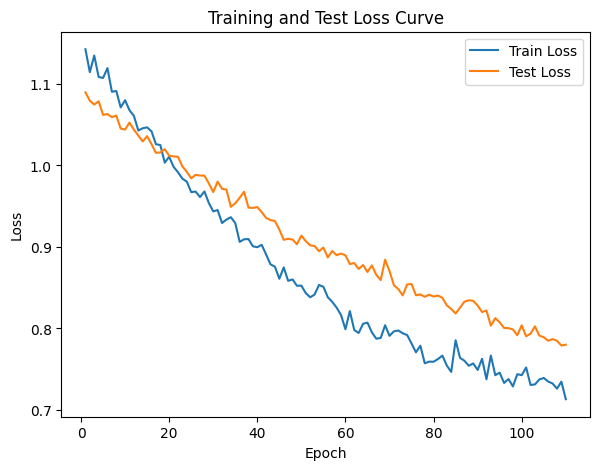

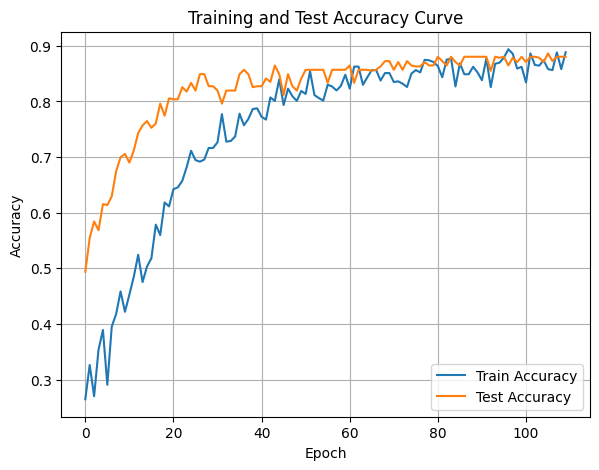

In [57]:
DTEmlp6b.train_single_model()

## Base 8

In [60]:
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
DTEmlp8b = DeepTreeEnsemble(task_name='classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=8,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.0001)

Randomly initializing 8 models
Training Model with id 1
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.12072313486411469, Train Loss: 1.2590, Train Acc: 0.0792, Test F1:0.17543859649122803, Test Loss: 1.1326, Test Acc: 0.1276


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.07it/s]

Epoch [2/10], Train F1:0.1332486312582573, Train Loss: 1.2515, Train Acc: 0.0923, Test F1:0.18206966692092552, Test Loss: 1.1299, Test Acc: 0.1345


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.59it/s]

Epoch [3/10], Train F1:0.1290458155871353, Train Loss: 1.2503, Train Acc: 0.0900, Test F1:0.17258219077104528, Test Loss: 1.1327, Test Acc: 0.1270


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.58it/s]

Epoch [4/10], Train F1:0.13218805689850363, Train Loss: 1.2483, Train Acc: 0.0904, Test F1:0.17693647566699292, Test Loss: 1.1310, Test Acc: 0.1326


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.34it/s]

Epoch [5/10], Train F1:0.1391809013139589, Train Loss: 1.2450, Train Acc: 0.0940, Test F1:0.18164205511885056, Test Loss: 1.1307, Test Acc: 0.1372


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.54it/s]

Epoch [6/10], Train F1:0.13911989802902222, Train Loss: 1.2417, Train Acc: 0.0959, Test F1:0.18537195976496232, Test Loss: 1.1303, Test Acc: 0.1389


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.00it/s]

Epoch [7/10], Train F1:0.14770427211715315, Train Loss: 1.2375, Train Acc: 0.1026, Test F1:0.18874823400558244, Test Loss: 1.1302, Test Acc: 0.1424


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  9.47it/s]

Epoch [8/10], Train F1:0.15774799524799524, Train Loss: 1.2327, Train Acc: 0.1093, Test F1:0.19577351934109033, Test Loss: 1.1285, Test Acc: 0.1523
Epoch [9/10], Train F1:0.16505620912811006, Train Loss: 1.2294, Train Acc: 0.1157, Test F1:0.2125250052301346, Test Loss: 1.1252, Test Acc: 0.1705


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.04it/s]


Epoch [10/10], Train F1:0.17071107155066706, Train Loss: 1.2261, Train Acc: 0.1208, Test F1:0.2220505436287293, Test Loss: 1.1228, Test Acc: 0.1851
Total Epochs: 10
Train loss start: 1.2699010372161865, Train loss end: 1.203123688697815
Highest Mean Train Accuracy (over epoch): 0.12083333333333333
Test loss start: 1.156746745109558, Test loss end: 1.08841872215271
Highest mean Test Accuracy (over epoch): 0.18506944444444445


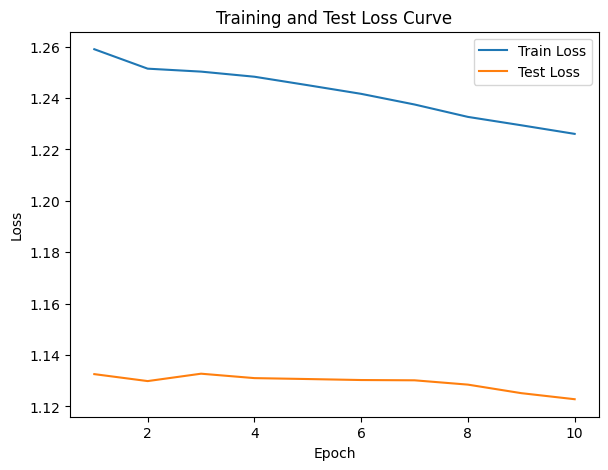

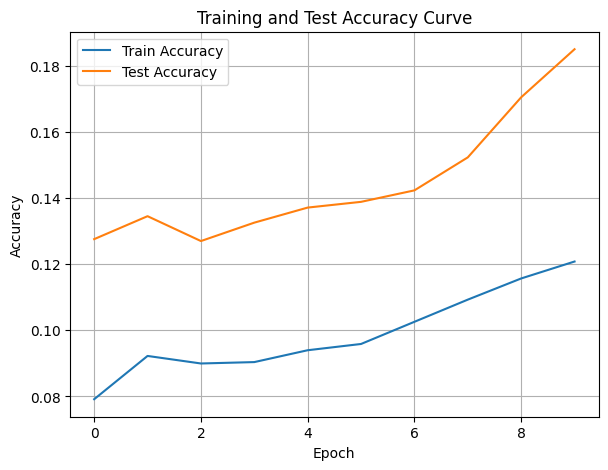

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.92it/s]

Epoch [1/10], Train F1:0.3907124420686808, Train Loss: 1.1140, Train Acc: 0.3589, Test F1:0.6319061055903162, Test Loss: 1.0654, Test Acc: 0.6120
Epoch [2/10], Train F1:0.3917249025023862, Train Loss: 1.1128, Train Acc: 0.3600, Test F1:0.6283752365671986, Test Loss: 1.0620, Test Acc: 0.6220


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.30it/s]

Epoch [3/10], Train F1:0.38187166782425774, Train Loss: 1.1150, Train Acc: 0.3477, Test F1:0.6297361049683031, Test Loss: 1.0627, Test Acc: 0.6233
Epoch [4/10], Train F1:0.3917847544200363, Train Loss: 1.1110, Train Acc: 0.3557, Test F1:0.6375886311238711, Test Loss: 1.0605, Test Acc: 0.6332


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.93it/s]

Epoch [5/10], Train F1:0.39979858416516106, Train Loss: 1.1071, Train Acc: 0.3608, Test F1:0.6487659580666069, Test Loss: 1.0570, Test Acc: 0.6486
Epoch [6/10], Train F1:0.40588445849645194, Train Loss: 1.1035, Train Acc: 0.3666, Test F1:0.658579419426262, Test Loss: 1.0525, Test Acc: 0.6615


Training Process:  80%|████████  | 8/10 [00:01<00:00,  8.27it/s]

Epoch [7/10], Train F1:0.4132442617442025, Train Loss: 1.1012, Train Acc: 0.3727, Test F1:0.6648326750558772, Test Loss: 1.0491, Test Acc: 0.6726
Epoch [8/10], Train F1:0.4186081018846015, Train Loss: 1.0987, Train Acc: 0.3763, Test F1:0.6704565964649138, Test Loss: 1.0471, Test Acc: 0.6810


Epoch [9/10], Train F1:0.4300931415740478, Train Loss: 1.0939, Train Acc: 0.3876, Test F1:0.6758716834103905, Test Loss: 1.0453, Test Acc: 0.6875


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.06it/s]


Epoch [10/10], Train F1:0.4350840965803401, Train Loss: 1.0905, Train Acc: 0.3954, Test F1:0.6819100899236297, Test Loss: 1.0425, Test Acc: 0.6943
Total Epochs: 10
Train loss start: 1.1382938623428345, Train loss end: 0.9246670603752136
Highest Mean Train Accuracy (over epoch): 0.3953571428571428
Test loss start: 1.0646134614944458, Test loss end: 1.0133347511291504
Highest mean Test Accuracy (over epoch): 0.6942708333333334


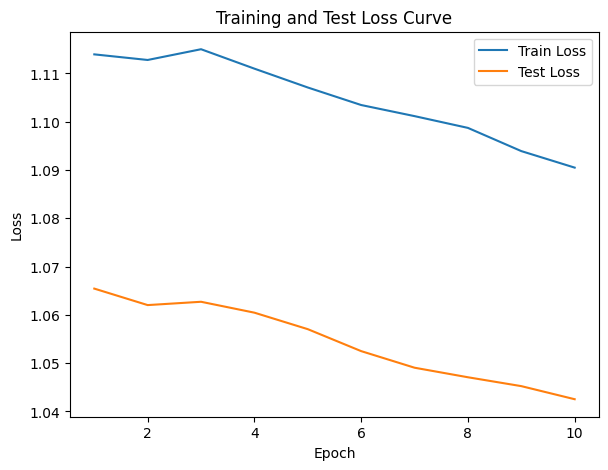

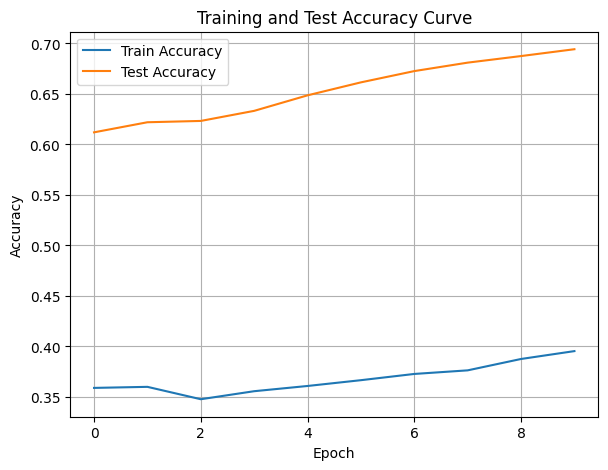

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.02it/s]

Epoch [1/10], Train F1:0.3795667222296118, Train Loss: 1.1487, Train Acc: 0.2887, Test F1:0.4756828780812791, Test Loss: 1.1026, Test Acc: 0.4002


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.89it/s]

Epoch [2/10], Train F1:0.3407241369047224, Train Loss: 1.1526, Train Acc: 0.2664, Test F1:0.3646432412732557, Test Loss: 1.1132, Test Acc: 0.2904


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.81it/s]

Epoch [3/10], Train F1:0.3536324423487816, Train Loss: 1.1493, Train Acc: 0.2777, Test F1:0.3575414508812076, Test Loss: 1.1113, Test Acc: 0.2969


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.24it/s]

Epoch [4/10], Train F1:0.3580942199105868, Train Loss: 1.1471, Train Acc: 0.2796, Test F1:0.3788606808328235, Test Loss: 1.1086, Test Acc: 0.3168


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.35it/s]

Epoch [5/10], Train F1:0.36743412848043433, Train Loss: 1.1435, Train Acc: 0.2926, Test F1:0.41100349651688706, Test Loss: 1.1062, Test Acc: 0.3432


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.00it/s]

Epoch [6/10], Train F1:0.3775167294196677, Train Loss: 1.1392, Train Acc: 0.3011, Test F1:0.4324927081806886, Test Loss: 1.1044, Test Acc: 0.3575


Training Process:  70%|███████   | 7/10 [00:00<00:00,  6.89it/s]

Epoch [7/10], Train F1:0.38365629494164877, Train Loss: 1.1357, Train Acc: 0.3097, Test F1:0.4524669632335228, Test Loss: 1.1022, Test Acc: 0.3787


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.33it/s]

Epoch [8/10], Train F1:0.3861071418929997, Train Loss: 1.1337, Train Acc: 0.3141, Test F1:0.4369478468965228, Test Loss: 1.1022, Test Acc: 0.3716


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.25it/s]

Epoch [9/10], Train F1:0.3934572229985769, Train Loss: 1.1311, Train Acc: 0.3178, Test F1:0.45660661104379885, Test Loss: 1.1001, Test Acc: 0.3900


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.44it/s]


Epoch [10/10], Train F1:0.40282927865104085, Train Loss: 1.1275, Train Acc: 0.3247, Test F1:0.45119522740500534, Test Loss: 1.0983, Test Acc: 0.3917
Total Epochs: 10
Train loss start: 1.168443202972412, Train loss end: 1.1755801439285278
Highest Mean Train Accuracy (over epoch): 0.32467261904761907
Test loss start: 1.109079360961914, Test loss end: 1.084490180015564
Highest mean Test Accuracy (over epoch): 0.4001736111111111


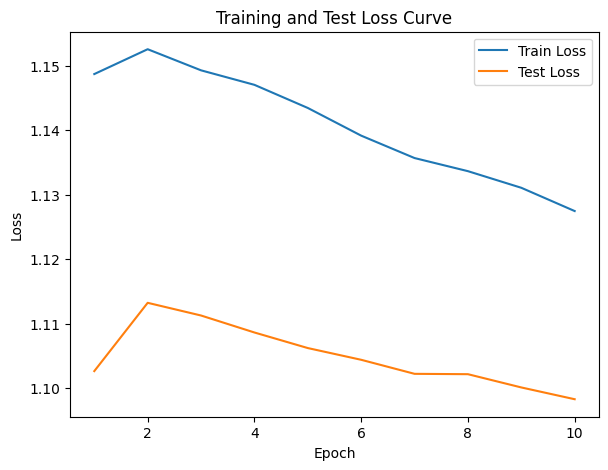

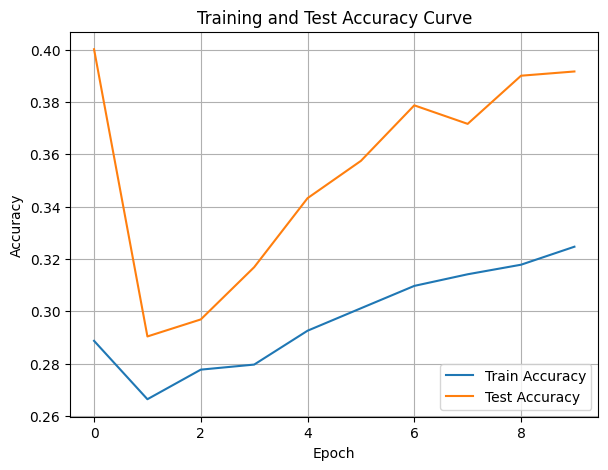

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.74it/s]

Epoch [1/10], Train F1:0.22390516954833076, Train Loss: 1.1856, Train Acc: 0.1562, Test F1:0.28997746892483733, Test Loss: 1.0987, Test Acc: 0.2509


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.82it/s]

Epoch [2/10], Train F1:0.24809748075054197, Train Loss: 1.1808, Train Acc: 0.1862, Test F1:0.2890016879864961, Test Loss: 1.0966, Test Acc: 0.2626
Epoch [3/10], Train F1:0.2525091807921937, Train Loss: 1.1804, Train Acc: 0.1852, Test F1:0.29620932923983584, Test Loss: 1.0937, Test Acc: 0.2749


Training Process:  50%|█████     | 5/10 [00:00<00:00, 11.12it/s]

Epoch [4/10], Train F1:0.2813237427700724, Train Loss: 1.1753, Train Acc: 0.2125, Test F1:0.33191248170027815, Test Loss: 1.0883, Test Acc: 0.3051
Epoch [5/10], Train F1:0.29353703214833493, Train Loss: 1.1709, Train Acc: 0.2221, Test F1:0.35210758961989114, Test Loss: 1.0842, Test Acc: 0.3205


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.74it/s]

Epoch [6/10], Train F1:0.2964423670828388, Train Loss: 1.1689, Train Acc: 0.2248, Test F1:0.3531204554596368, Test Loss: 1.0815, Test Acc: 0.3229
Epoch [7/10], Train F1:0.30142087353358715, Train Loss: 1.1656, Train Acc: 0.2270, Test F1:0.36340182087783374, Test Loss: 1.0793, Test Acc: 0.3333


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  8.99it/s]

Epoch [8/10], Train F1:0.3146354855274074, Train Loss: 1.1618, Train Acc: 0.2368, Test F1:0.3594294034638549, Test Loss: 1.0786, Test Acc: 0.3308
Epoch [9/10], Train F1:0.32623478206437845, Train Loss: 1.1570, Train Acc: 0.2479, Test F1:0.39162896759718996, Test Loss: 1.0762, Test Acc: 0.3561


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.31it/s]


Epoch [10/10], Train F1:0.3328332792356007, Train Loss: 1.1543, Train Acc: 0.2545, Test F1:0.40132401121356437, Test Loss: 1.0742, Test Acc: 0.3663
Total Epochs: 10
Train loss start: 1.2035690546035767, Train loss end: 1.1188404560089111
Highest Mean Train Accuracy (over epoch): 0.25446428571428575
Test loss start: 1.095809817314148, Test loss end: 1.0708352327346802
Highest mean Test Accuracy (over epoch): 0.3663194444444445


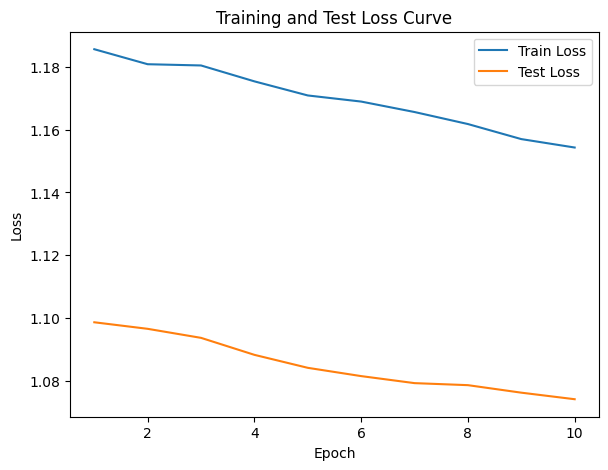

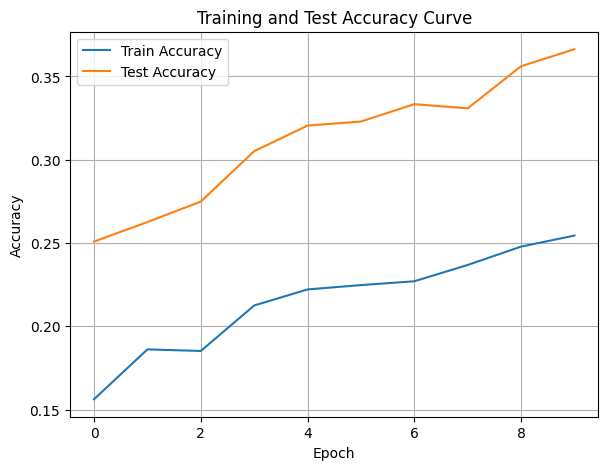

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.89it/s]

Epoch [1/10], Train F1:0.5034059573385417, Train Loss: 1.0434, Train Acc: 0.5027, Test F1:0.5057809029053191, Test Loss: 1.0736, Test Acc: 0.5139


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.89it/s]

Epoch [2/10], Train F1:0.5147666939241977, Train Loss: 1.0390, Train Acc: 0.5150, Test F1:0.5042798823581054, Test Loss: 1.0677, Test Acc: 0.5304


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.65it/s]

Epoch [3/10], Train F1:0.5212480581743895, Train Loss: 1.0402, Train Acc: 0.5216, Test F1:0.5150242553161616, Test Loss: 1.0629, Test Acc: 0.5556


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.52it/s]

Epoch [4/10], Train F1:0.5239928987168251, Train Loss: 1.0350, Train Acc: 0.5315, Test F1:0.5245206971505021, Test Loss: 1.0574, Test Acc: 0.5681


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.32it/s]

Epoch [5/10], Train F1:0.5290970555908562, Train Loss: 1.0314, Train Acc: 0.5385, Test F1:0.536203944298133, Test Loss: 1.0539, Test Acc: 0.5832


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.20it/s]

Epoch [6/10], Train F1:0.5287216904278766, Train Loss: 1.0290, Train Acc: 0.5382, Test F1:0.5373650564768084, Test Loss: 1.0522, Test Acc: 0.5883


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.11it/s]

Epoch [7/10], Train F1:0.5384142605320869, Train Loss: 1.0259, Train Acc: 0.5447, Test F1:0.5444640529660772, Test Loss: 1.0502, Test Acc: 0.5952


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.50it/s]

Epoch [8/10], Train F1:0.5442754712884097, Train Loss: 1.0225, Train Acc: 0.5494, Test F1:0.5552411957729375, Test Loss: 1.0461, Test Acc: 0.6061


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.93it/s]


Epoch [9/10], Train F1:0.5491667691613397, Train Loss: 1.0180, Train Acc: 0.5562, Test F1:0.5621807052957726, Test Loss: 1.0428, Test Acc: 0.6137
Epoch [10/10], Train F1:0.551657594089653, Train Loss: 1.0147, Train Acc: 0.5597, Test F1:0.5670710077691917, Test Loss: 1.0406, Test Acc: 0.6196
Total Epochs: 10
Train loss start: 1.0401986837387085, Train loss end: 0.8757991194725037
Highest Mean Train Accuracy (over epoch): 0.5597023809523809
Test loss start: 1.0894049406051636, Test loss end: 1.005380630493164
Highest mean Test Accuracy (over epoch): 0.6196180555555555


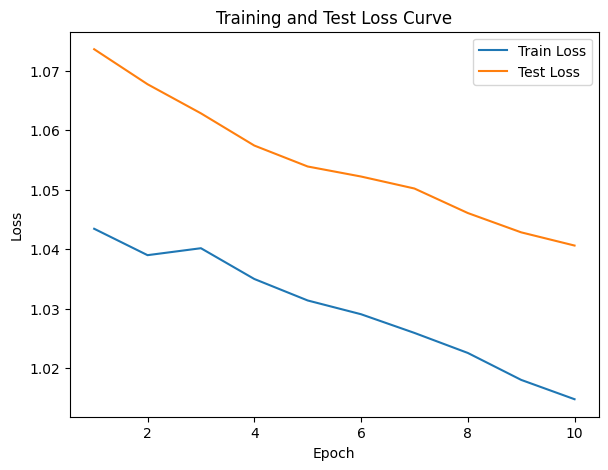

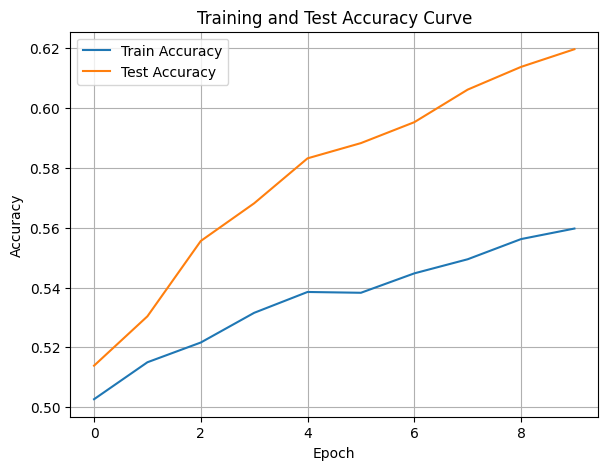

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.14it/s]

Epoch [1/10], Train F1:0.40770260654395657, Train Loss: 1.0751, Train Acc: 0.4119, Test F1:0.37685121895648216, Test Loss: 1.0896, Test Acc: 0.3255


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.36it/s]

Epoch [2/10], Train F1:0.42782343501221964, Train Loss: 1.0725, Train Acc: 0.4269, Test F1:0.37643750524636954, Test Loss: 1.0926, Test Acc: 0.3307


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.79it/s]

Epoch [3/10], Train F1:0.4447797634189452, Train Loss: 1.0655, Train Acc: 0.4452, Test F1:0.3845495601894742, Test Loss: 1.0922, Test Acc: 0.3325


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.68it/s]

Epoch [4/10], Train F1:0.4534957644123276, Train Loss: 1.0616, Train Acc: 0.4520, Test F1:0.4343055781869534, Test Loss: 1.0905, Test Acc: 0.3774


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.05it/s]

Epoch [5/10], Train F1:0.4580649654647972, Train Loss: 1.0586, Train Acc: 0.4595, Test F1:0.45409259846754724, Test Loss: 1.0893, Test Acc: 0.3965


Training Process:  60%|██████    | 6/10 [00:00<00:00,  6.59it/s]

Epoch [6/10], Train F1:0.4686378988333602, Train Loss: 1.0574, Train Acc: 0.4649, Test F1:0.478435715139715, Test Loss: 1.0870, Test Acc: 0.4210


Training Process:  80%|████████  | 8/10 [00:01<00:00,  6.62it/s]

Epoch [7/10], Train F1:0.47427482287229333, Train Loss: 1.0567, Train Acc: 0.4648, Test F1:0.5064376748039588, Test Loss: 1.0839, Test Acc: 0.4505
Epoch [8/10], Train F1:0.481759587216803, Train Loss: 1.0524, Train Acc: 0.4715, Test F1:0.5241077688675976, Test Loss: 1.0819, Test Acc: 0.4678


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.82it/s]


Epoch [9/10], Train F1:0.4908829672485932, Train Loss: 1.0481, Train Acc: 0.4813, Test F1:0.5436560677788748, Test Loss: 1.0798, Test Acc: 0.4879
Epoch [10/10], Train F1:0.49892167869696114, Train Loss: 1.0439, Train Acc: 0.4886, Test F1:0.5598955308129638, Test Loss: 1.0775, Test Acc: 0.5052
Total Epochs: 10
Train loss start: 1.0148932933807373, Train loss end: 1.014620065689087
Highest Mean Train Accuracy (over epoch): 0.4885714285714285
Test loss start: 1.0972342491149902, Test loss end: 1.0315552949905396
Highest mean Test Accuracy (over epoch): 0.5052083333333334


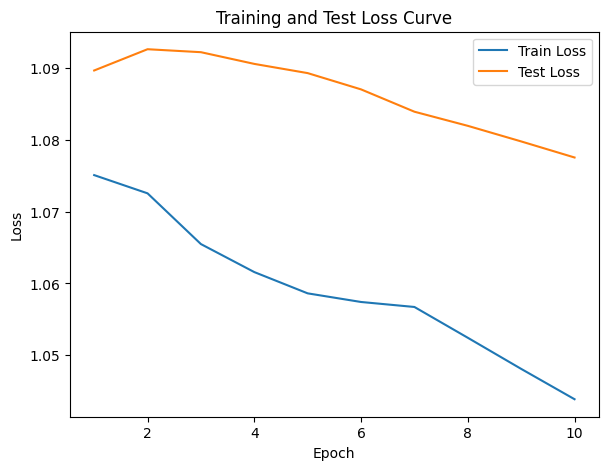

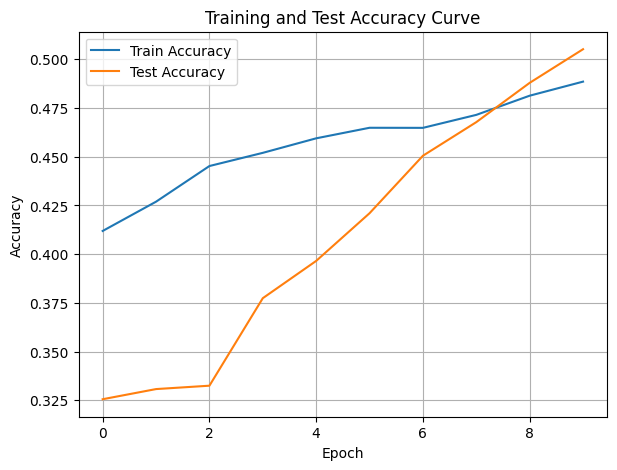

./saved_models/model_6.pth
Training Model with id 7
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.74it/s]

Epoch [1/10], Train F1:0.5953319019264148, Train Loss: 1.0082, Train Acc: 0.5768, Test F1:0.6804562519428968, Test Loss: 1.0365, Test Acc: 0.6701


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.42it/s]

Epoch [2/10], Train F1:0.573497580940294, Train Loss: 1.0198, Train Acc: 0.5607, Test F1:0.6904988183713164, Test Loss: 1.0288, Test Acc: 0.6849


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.62it/s]

Epoch [3/10], Train F1:0.5746634618867263, Train Loss: 1.0201, Train Acc: 0.5580, Test F1:0.7096006311157432, Test Loss: 1.0194, Test Acc: 0.7141


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.47it/s]

Epoch [4/10], Train F1:0.5710215218449068, Train Loss: 1.0192, Train Acc: 0.5525, Test F1:0.7188360460858814, Test Loss: 1.0127, Test Acc: 0.7253


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.47it/s]

Epoch [5/10], Train F1:0.5829559597525322, Train Loss: 1.0150, Train Acc: 0.5634, Test F1:0.7230722092795976, Test Loss: 1.0079, Test Acc: 0.7319


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.39it/s]

Epoch [6/10], Train F1:0.5897488005909699, Train Loss: 1.0103, Train Acc: 0.5684, Test F1:0.728440826882646, Test Loss: 1.0023, Test Acc: 0.7400


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.25it/s]

Epoch [7/10], Train F1:0.5892251635296903, Train Loss: 1.0085, Train Acc: 0.5685, Test F1:0.7332658569500674, Test Loss: 0.9985, Test Acc: 0.7449
Epoch [8/10], Train F1:0.590323845124199, Train Loss: 1.0062, Train Acc: 0.5702, Test F1:0.7359237764087392, Test Loss: 0.9954, Test Acc: 0.7476


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.82it/s]


Epoch [9/10], Train F1:0.5982372300695907, Train Loss: 1.0016, Train Acc: 0.5784, Test F1:0.7385657125269314, Test Loss: 0.9917, Test Acc: 0.7528
Epoch [10/10], Train F1:0.6029448591817115, Train Loss: 0.9981, Train Acc: 0.5833, Test F1:0.7402460390236076, Test Loss: 0.9878, Test Acc: 0.7556
Total Epochs: 10
Train loss start: 1.0099825859069824, Train loss end: 0.9064499735832214
Highest Mean Train Accuracy (over epoch): 0.5833333333333334
Test loss start: 1.0444691181182861, Test loss end: 0.9606817960739136
Highest mean Test Accuracy (over epoch): 0.7555555555555555


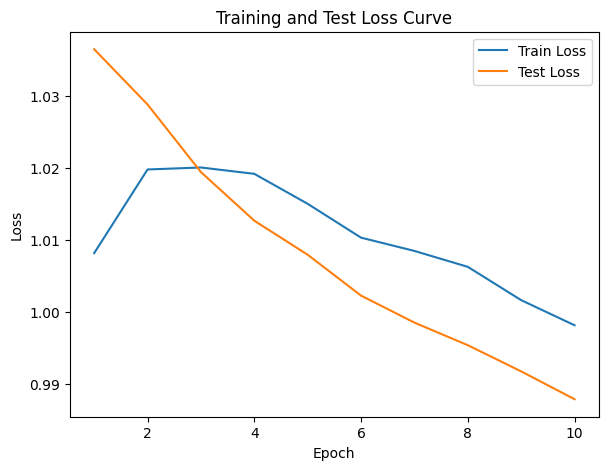

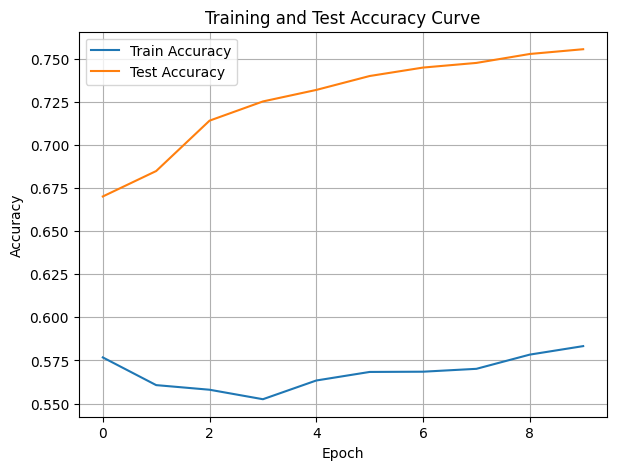

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.23it/s]

Epoch [1/10], Train F1:0.39677908298597947, Train Loss: 1.0720, Train Acc: 0.4152, Test F1:0.1577307755369733, Test Loss: 1.1266, Test Acc: 0.1319
Epoch [2/10], Train F1:0.4094207159375698, Train Loss: 1.0686, Train Acc: 0.4171, Test F1:0.14979757085020243, Test Loss: 1.1291, Test Acc: 0.1211


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.23it/s]

Epoch [3/10], Train F1:0.41613099384667795, Train Loss: 1.0655, Train Acc: 0.4226, Test F1:0.15811965811965814, Test Loss: 1.1252, Test Acc: 0.1273


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.98it/s]

Epoch [4/10], Train F1:0.43115667676584035, Train Loss: 1.0592, Train Acc: 0.4348, Test F1:0.16931007986636198, Test Loss: 1.1231, Test Acc: 0.1359
Epoch [5/10], Train F1:0.4341597595958897, Train Loss: 1.0576, Train Acc: 0.4394, Test F1:0.1722367253566751, Test Loss: 1.1204, Test Acc: 0.1382


Training Process:  60%|██████    | 6/10 [00:00<00:00, 13.09it/s]

Epoch [6/10], Train F1:0.4390580764195484, Train Loss: 1.0533, Train Acc: 0.4456, Test F1:0.17981601531823116, Test Loss: 1.1183, Test Acc: 0.1457


Training Process:  80%|████████  | 8/10 [00:00<00:00, 12.55it/s]

Epoch [7/10], Train F1:0.4419710688157055, Train Loss: 1.0505, Train Acc: 0.4537, Test F1:0.17662586559149507, Test Loss: 1.1172, Test Acc: 0.1437
Epoch [8/10], Train F1:0.44364959017891487, Train Loss: 1.0472, Train Acc: 0.4582, Test F1:0.17412922978946235, Test Loss: 1.1186, Test Acc: 0.1405


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.45it/s]


Epoch [9/10], Train F1:0.44688334019776227, Train Loss: 1.0454, Train Acc: 0.4612, Test F1:0.18680366555059383, Test Loss: 1.1156, Test Acc: 0.1513
Epoch [10/10], Train F1:0.4516414552864244, Train Loss: 1.0426, Train Acc: 0.4692, Test F1:0.2011385644284046, Test Loss: 1.1127, Test Acc: 0.1631
Total Epochs: 10
Train loss start: 1.0905874967575073, Train loss end: 0.948229968547821
Highest Mean Train Accuracy (over epoch): 0.4691666666666667
Test loss start: 1.1389846801757812, Test loss end: 1.059850811958313
Highest mean Test Accuracy (over epoch): 0.16310763888888888


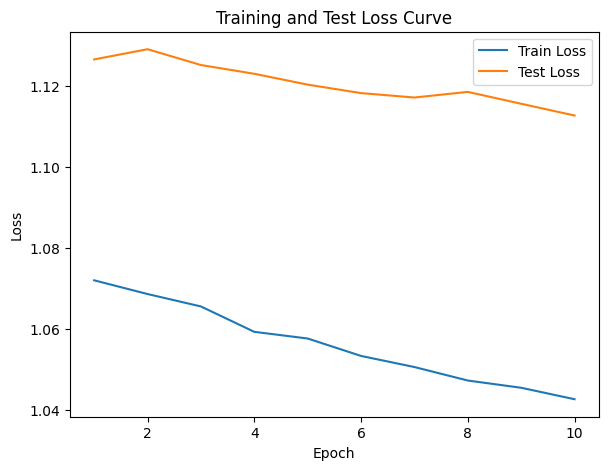

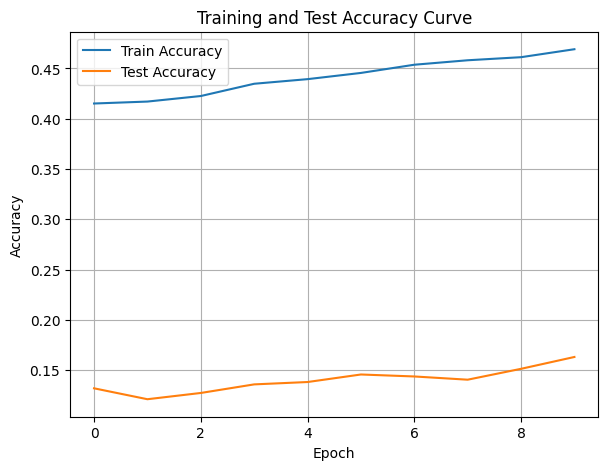

./saved_models/model_8.pth
Training Model with id 12
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.5054564483135913, Train Loss: 1.0156, Train Acc: 0.5161, Test F1:0.19530653510869475, Test Loss: 1.1058, Test Acc: 0.1476


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.71it/s]

Epoch [2/10], Train F1:0.5121396867427794, Train Loss: 1.0127, Train Acc: 0.5260, Test F1:0.19325983791443307, Test Loss: 1.1061, Test Acc: 0.1437
Epoch [3/10], Train F1:0.5111601732358809, Train Loss: 1.0045, Train Acc: 0.5294, Test F1:0.25814239858320875, Test Loss: 1.0995, Test Acc: 0.1933


Training Process:  40%|████      | 4/10 [00:00<00:00, 13.53it/s]

Epoch [4/10], Train F1:0.51915814618153, Train Loss: 1.0001, Train Acc: 0.5383, Test F1:0.283650540680598, Test Loss: 1.0953, Test Acc: 0.2161


Training Process:  40%|████      | 4/10 [00:00<00:00, 13.53it/s]

Epoch [5/10], Train F1:0.525401931424643, Train Loss: 0.9954, Train Acc: 0.5462, Test F1:0.2941992739649229, Test Loss: 1.0934, Test Acc: 0.2252
Epoch [6/10], Train F1:0.5322664442894963, Train Loss: 0.9925, Train Acc: 0.5550, Test F1:0.3058780069729362, Test Loss: 1.0930, Test Acc: 0.2322


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.54it/s]

Epoch [7/10], Train F1:0.5437767715506254, Train Loss: 0.9884, Train Acc: 0.5647, Test F1:0.34464394188683495, Test Loss: 1.0896, Test Acc: 0.2624
Epoch [8/10], Train F1:0.5474501663004208, Train Loss: 0.9863, Train Acc: 0.5684, Test F1:0.3745925120404385, Test Loss: 1.0876, Test Acc: 0.2860


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.67it/s]


Epoch [9/10], Train F1:0.5567360641414829, Train Loss: 0.9826, Train Acc: 0.5758, Test F1:0.3960184089054153, Test Loss: 1.0848, Test Acc: 0.3053
Epoch [10/10], Train F1:0.5646994550418388, Train Loss: 0.9795, Train Acc: 0.5836, Test F1:0.43100207779855965, Test Loss: 1.0816, Test Acc: 0.3385
Total Epochs: 10
Train loss start: 1.0044715404510498, Train loss end: 0.9554967880249023
Highest Mean Train Accuracy (over epoch): 0.5836011904761904
Test loss start: 1.1192362308502197, Test loss end: 1.0281867980957031
Highest mean Test Accuracy (over epoch): 0.3384548611111111


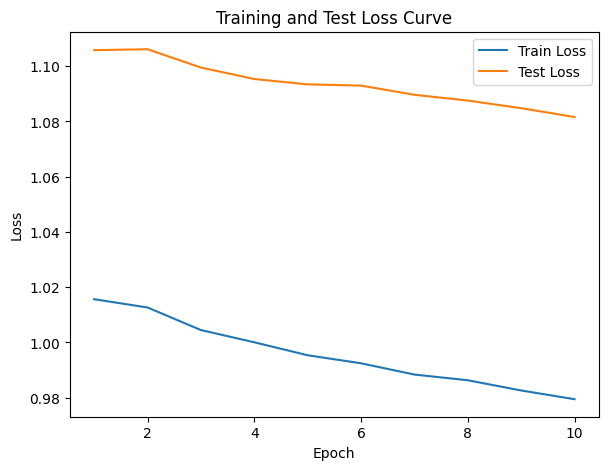

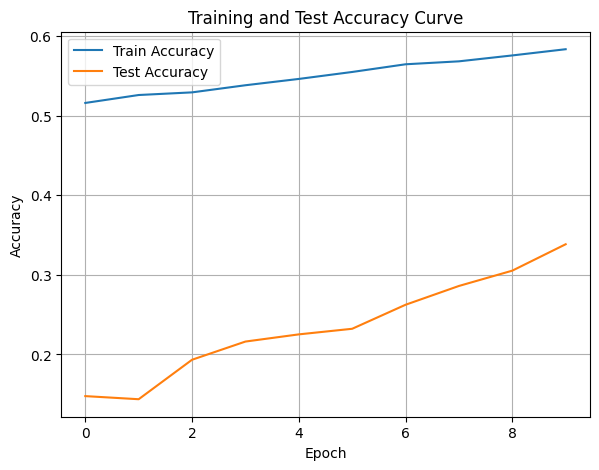

./saved_models/model_12.pth
Training Model with id 13
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.15it/s]

Epoch [1/10], Train F1:0.6507869812835567, Train Loss: 0.9486, Train Acc: 0.6685, Test F1:0.6454269005847952, Test Loss: 1.0626, Test Acc: 0.5295
Epoch [2/10], Train F1:0.6459085200129413, Train Loss: 0.9477, Train Acc: 0.6674, Test F1:0.6867532467532467, Test Loss: 1.0565, Test Acc: 0.6050


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.15it/s]

Epoch [3/10], Train F1:0.64361440936914, Train Loss: 0.9482, Train Acc: 0.6593, Test F1:0.6785800112115054, Test Loss: 1.0542, Test Acc: 0.5995


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.60it/s]

Epoch [4/10], Train F1:0.6477118693235987, Train Loss: 0.9448, Train Acc: 0.6645, Test F1:0.6844529556577644, Test Loss: 1.0537, Test Acc: 0.6081
Epoch [5/10], Train F1:0.6528953506603336, Train Loss: 0.9415, Train Acc: 0.6671, Test F1:0.6685205850331122, Test Loss: 1.0557, Test Acc: 0.5826


Training Process:  60%|██████    | 6/10 [00:00<00:00, 13.28it/s]

Epoch [6/10], Train F1:0.6643832812453322, Train Loss: 0.9364, Train Acc: 0.6778, Test F1:0.6898149345634677, Test Loss: 1.0538, Test Acc: 0.6130


Training Process:  80%|████████  | 8/10 [00:00<00:00, 13.20it/s]

Epoch [7/10], Train F1:0.667897444082571, Train Loss: 0.9358, Train Acc: 0.6763, Test F1:0.7063832115253575, Test Loss: 1.0510, Test Acc: 0.6369
Epoch [8/10], Train F1:0.668180559254675, Train Loss: 0.9351, Train Acc: 0.6774, Test F1:0.7199158562621667, Test Loss: 1.0475, Test Acc: 0.6578


Training Process:  80%|████████  | 8/10 [00:00<00:00, 13.20it/s]

Epoch [9/10], Train F1:0.6730985764575722, Train Loss: 0.9320, Train Acc: 0.6819, Test F1:0.732597713568378, Test Loss: 1.0448, Test Acc: 0.6773


Training Process: 100%|██████████| 10/10 [00:00<00:00, 13.02it/s]


Epoch [10/10], Train F1:0.6795881414818307, Train Loss: 0.9291, Train Acc: 0.6884, Test F1:0.7417775891626347, Test Loss: 1.0417, Test Acc: 0.6921
Total Epochs: 10
Train loss start: 0.9750173091888428, Train loss end: 0.8962177634239197
Highest Mean Train Accuracy (over epoch): 0.688422619047619
Test loss start: 1.07205069065094, Test loss end: 0.9863908290863037
Highest mean Test Accuracy (over epoch): 0.6921006944444444


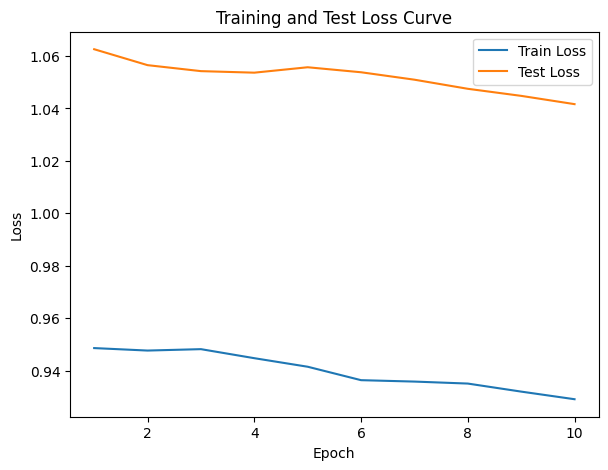

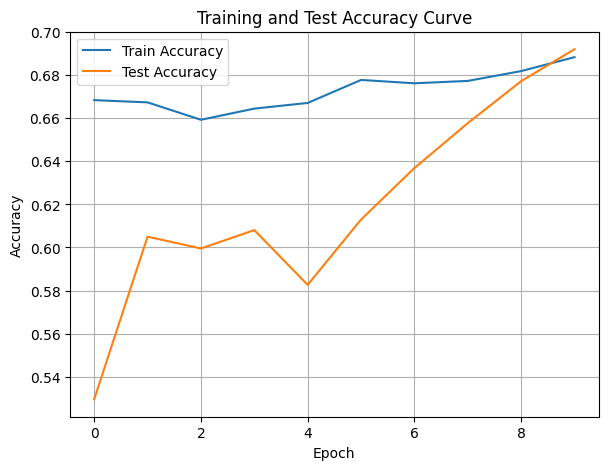

./saved_models/model_13.pth
Training Model with id 11
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 14.00it/s]

Epoch [1/10], Train F1:0.7510145636464703, Train Loss: 0.8983, Train Acc: 0.7476, Test F1:0.8357653025845246, Test Loss: 1.0102, Test Acc: 0.8411
Epoch [2/10], Train F1:0.7542635207502482, Train Loss: 0.8986, Train Acc: 0.7512, Test F1:0.8349578554187581, Test Loss: 1.0113, Test Acc: 0.8381


Training Process:  20%|██        | 2/10 [00:00<00:00, 14.00it/s]

Epoch [3/10], Train F1:0.7483159049428472, Train Loss: 0.8978, Train Acc: 0.7479, Test F1:0.8352971339068538, Test Loss: 1.0066, Test Acc: 0.8371


Training Process:  40%|████      | 4/10 [00:00<00:00, 13.92it/s]

Epoch [4/10], Train F1:0.7492658070984429, Train Loss: 0.8948, Train Acc: 0.7513, Test F1:0.8301195659686227, Test Loss: 1.0080, Test Acc: 0.8307
Epoch [5/10], Train F1:0.755319531003632, Train Loss: 0.8920, Train Acc: 0.7555, Test F1:0.8296312645892274, Test Loss: 1.0071, Test Acc: 0.8300


Training Process:  60%|██████    | 6/10 [00:00<00:00, 14.05it/s]

Epoch [6/10], Train F1:0.7589433208349605, Train Loss: 0.8870, Train Acc: 0.7619, Test F1:0.8306767161736157, Test Loss: 1.0046, Test Acc: 0.8319


Training Process:  60%|██████    | 6/10 [00:00<00:00, 14.05it/s]

Epoch [7/10], Train F1:0.7628652775283226, Train Loss: 0.8847, Train Acc: 0.7663, Test F1:0.8157033612906304, Test Loss: 1.0053, Test Acc: 0.8165


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.64it/s]

Epoch [8/10], Train F1:0.766204994095112, Train Loss: 0.8818, Train Acc: 0.7703, Test F1:0.8192314708877152, Test Loss: 1.0044, Test Acc: 0.8205


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.64it/s]

Epoch [9/10], Train F1:0.7709013220040677, Train Loss: 0.8798, Train Acc: 0.7730, Test F1:0.8210664769846092, Test Loss: 1.0039, Test Acc: 0.8221


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.57it/s]


Epoch [10/10], Train F1:0.7740312655879246, Train Loss: 0.8781, Train Acc: 0.7755, Test F1:0.8213635047882851, Test Loss: 1.0036, Test Acc: 0.8219
Total Epochs: 10
Train loss start: 0.9099722504615784, Train loss end: 0.8467467427253723
Highest Mean Train Accuracy (over epoch): 0.7754761904761905
Test loss start: 1.0137217044830322, Test loss end: 0.9704625010490417
Highest mean Test Accuracy (over epoch): 0.8411458333333334


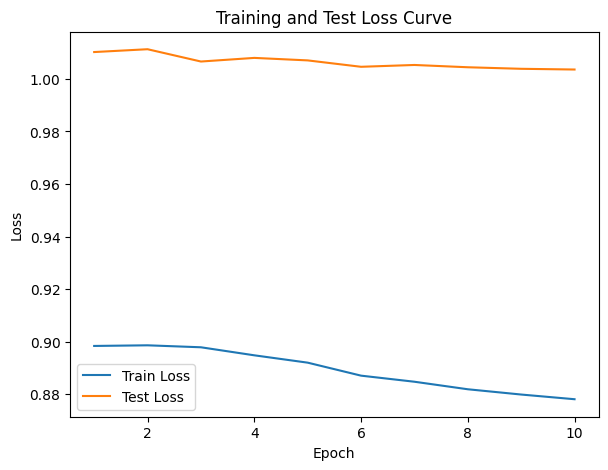

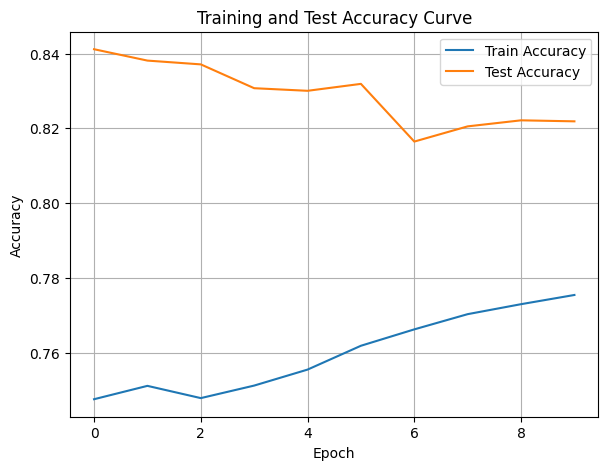

./saved_models/model_11.pth
Training Model with id 13
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.8090287766688589, Train Loss: 0.8461, Train Acc: 0.8208, Test F1:0.7254385964912281, Test Loss: 1.0029, Test Acc: 0.7378


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.27it/s]

Epoch [2/10], Train F1:0.8023790898367169, Train Loss: 0.8455, Train Acc: 0.8119, Test F1:0.7885621527127427, Test Loss: 0.9971, Test Acc: 0.7964
Epoch [3/10], Train F1:0.8073966709595232, Train Loss: 0.8462, Train Acc: 0.8152, Test F1:0.7819077688480673, Test Loss: 0.9965, Test Acc: 0.7899


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.55it/s]

Epoch [4/10], Train F1:0.8087039208949024, Train Loss: 0.8456, Train Acc: 0.8144, Test F1:0.7985821902311901, Test Loss: 0.9938, Test Acc: 0.8047


Training Process:  60%|██████    | 6/10 [00:00<00:00, 12.93it/s]

Epoch [5/10], Train F1:0.8080404397802167, Train Loss: 0.8458, Train Acc: 0.8113, Test F1:0.8080491908019297, Test Loss: 0.9900, Test Acc: 0.8135
Epoch [6/10], Train F1:0.8122513353285213, Train Loss: 0.8429, Train Acc: 0.8170, Test F1:0.815085586268973, Test Loss: 0.9881, Test Acc: 0.8215


Training Process:  60%|██████    | 6/10 [00:00<00:00, 12.93it/s]

Epoch [7/10], Train F1:0.8143348008286884, Train Loss: 0.8410, Train Acc: 0.8198, Test F1:0.8207281226996086, Test Loss: 0.9832, Test Acc: 0.8274


Training Process:  80%|████████  | 8/10 [00:00<00:00, 12.67it/s]

Epoch [8/10], Train F1:0.8163601340749619, Train Loss: 0.8390, Train Acc: 0.8218, Test F1:0.8237653653123927, Test Loss: 0.9807, Test Acc: 0.8301


Training Process: 100%|██████████| 10/10 [00:00<00:00, 12.39it/s]

Epoch [9/10], Train F1:0.8180419153877212, Train Loss: 0.8377, Train Acc: 0.8226, Test F1:0.8262327640423249, Test Loss: 0.9791, Test Acc: 0.8329
Epoch [10/10], Train F1:0.8207233738339123, Train Loss: 0.8353, Train Acc: 0.8262, Test F1:0.8290260505764441, Test Loss: 0.9774, Test Acc: 0.8359
Total Epochs: 10
Train loss start: 0.8900267481803894, Train loss end: 0.8075318932533264
Highest Mean Train Accuracy (over epoch): 0.8261904761904763
Test loss start: 1.0084642171859741, Test loss end: 0.9292529225349426
Highest mean Test Accuracy (over epoch): 0.8358506944444445


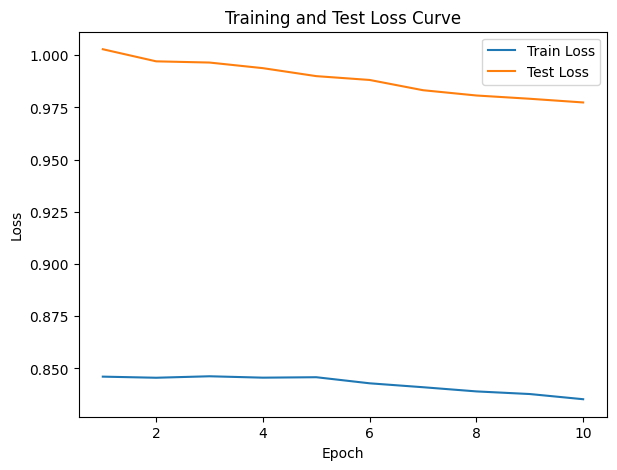

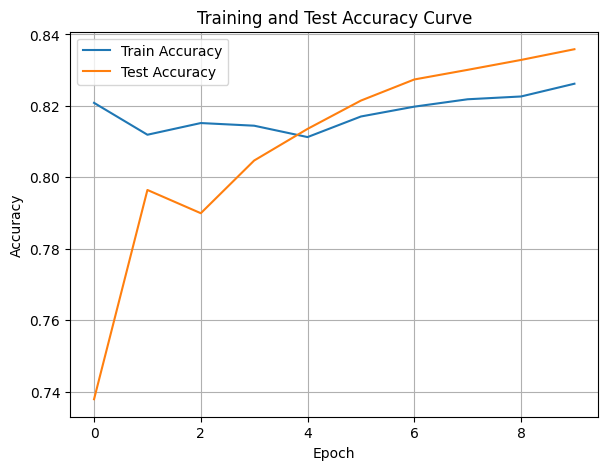

./saved_models/model_13.pth
Training Model with id 14
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.85it/s]

Epoch [1/10], Train F1:0.8413244555116477, Train Loss: 0.8149, Train Acc: 0.8393, Test F1:0.8373819163292848, Test Loss: 0.9550, Test Acc: 0.8411
Epoch [2/10], Train F1:0.8301792622793454, Train Loss: 0.8137, Train Acc: 0.8336, Test F1:0.8373819163292848, Test Loss: 0.9512, Test Acc: 0.8411


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.67it/s]

Epoch [3/10], Train F1:0.8289534746210494, Train Loss: 0.8124, Train Acc: 0.8356, Test F1:0.842922278852829, Test Loss: 0.9498, Test Acc: 0.8484
Epoch [4/10], Train F1:0.8319590027088649, Train Loss: 0.8089, Train Acc: 0.8384, Test F1:0.8429325741538312, Test Loss: 0.9493, Test Acc: 0.8496


Training Process:  70%|███████   | 7/10 [00:00<00:00, 10.10it/s]

Epoch [5/10], Train F1:0.835951669140561, Train Loss: 0.8040, Train Acc: 0.8432, Test F1:0.8468278133349904, Test Loss: 0.9451, Test Acc: 0.8538
Epoch [6/10], Train F1:0.8422785966812419, Train Loss: 0.8010, Train Acc: 0.8487, Test F1:0.8480365181642897, Test Loss: 0.9422, Test Acc: 0.8553
Epoch [7/10], Train F1:0.8421932005228431, Train Loss: 0.7988, Train Acc: 0.8484, Test F1:0.8488991892531745, Test Loss: 0.9401, Test Acc: 0.8564


Epoch [8/10], Train F1:0.8442080348487329, Train Loss: 0.7973, Train Acc: 0.8509, Test F1:0.8495458432555876, Test Loss: 0.9370, Test Acc: 0.8572
Epoch [9/10], Train F1:0.8450597120903895, Train Loss: 0.7956, Train Acc: 0.8522, Test F1:0.8503558477618304, Test Loss: 0.9355, Test Acc: 0.8578


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.14it/s]


Epoch [10/10], Train F1:0.847770946002835, Train Loss: 0.7942, Train Acc: 0.8551, Test F1:0.849464386101077, Test Loss: 0.9343, Test Acc: 0.8568
Total Epochs: 10
Train loss start: 0.7792275547981262, Train loss end: 0.7537773251533508
Highest Mean Train Accuracy (over epoch): 0.8551190476190478
Test loss start: 0.9552420377731323, Test loss end: 0.8890925645828247
Highest mean Test Accuracy (over epoch): 0.8578317901234569


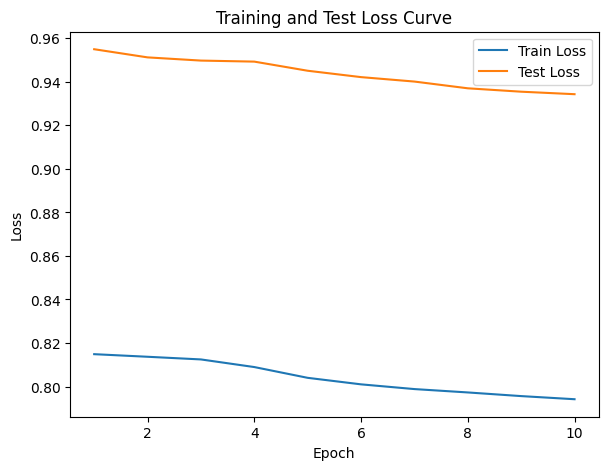

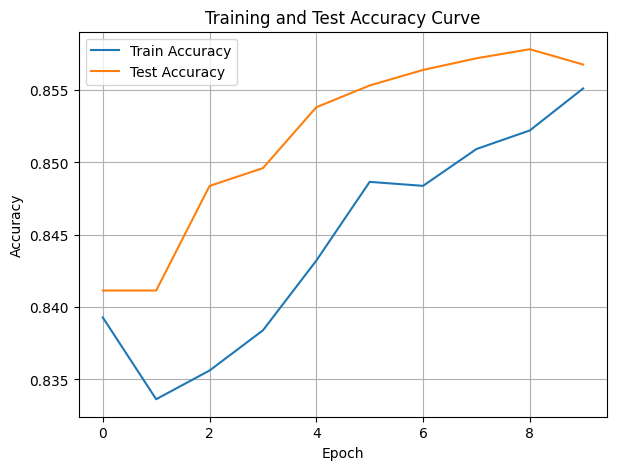

./saved_models/model_14.pth
Training Model with id 12
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.53it/s]

Epoch [1/10], Train F1:0.8492783288230172, Train Loss: 0.7909, Train Acc: 0.8530, Test F1:0.8305010893246186, Test Loss: 0.9222, Test Acc: 0.8333


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.22it/s]

Epoch [2/10], Train F1:0.8645033624921515, Train Loss: 0.7850, Train Acc: 0.8638, Test F1:0.8381003325813429, Test Loss: 0.9205, Test Acc: 0.8442


Training Process:  30%|███       | 3/10 [00:00<00:00,  9.32it/s]

Epoch [3/10], Train F1:0.8624253460557673, Train Loss: 0.7811, Train Acc: 0.8655, Test F1:0.8410984745705772, Test Loss: 0.9200, Test Acc: 0.8478


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.10it/s]

Epoch [4/10], Train F1:0.864105807723935, Train Loss: 0.7806, Train Acc: 0.8652, Test F1:0.8485019377712574, Test Loss: 0.9131, Test Acc: 0.8555


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.33it/s]

Epoch [5/10], Train F1:0.8685503157588682, Train Loss: 0.7801, Train Acc: 0.8664, Test F1:0.8496148341705438, Test Loss: 0.9107, Test Acc: 0.8569


Training Process:  70%|███████   | 7/10 [00:00<00:00,  6.89it/s]

Epoch [6/10], Train F1:0.8709430711106859, Train Loss: 0.7773, Train Acc: 0.8682, Test F1:0.8503566716306453, Test Loss: 0.9068, Test Acc: 0.8579
Epoch [7/10], Train F1:0.8696336673484322, Train Loss: 0.7758, Train Acc: 0.8678, Test F1:0.8502881134460082, Test Loss: 0.9068, Test Acc: 0.8575


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.09it/s]

Epoch [8/10], Train F1:0.8695417926230755, Train Loss: 0.7743, Train Acc: 0.8683, Test F1:0.8511014521646832, Test Loss: 0.9065, Test Acc: 0.8582
Epoch [9/10], Train F1:0.872585885649099, Train Loss: 0.7720, Train Acc: 0.8714, Test F1:0.852513350419265, Test Loss: 0.9037, Test Acc: 0.8596


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.59it/s]


Epoch [10/10], Train F1:0.8739284470793276, Train Loss: 0.7707, Train Acc: 0.8729, Test F1:0.8526732612042401, Test Loss: 0.9016, Test Acc: 0.8599
Total Epochs: 10
Train loss start: 0.7477408647537231, Train loss end: 0.7675811648368835
Highest Mean Train Accuracy (over epoch): 0.8729166666666667
Test loss start: 0.9189600348472595, Test loss end: 0.8538832068443298
Highest mean Test Accuracy (over epoch): 0.8598958333333332


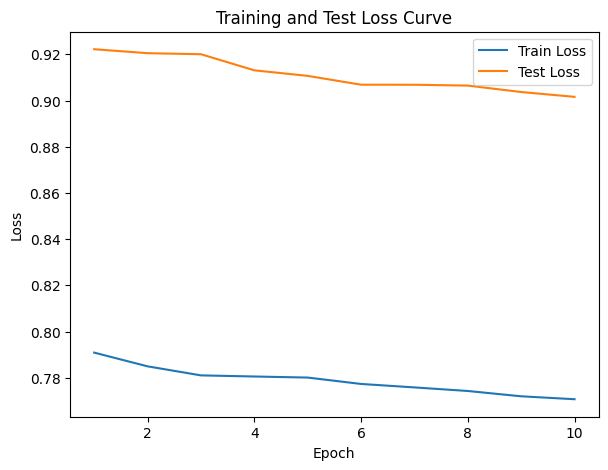

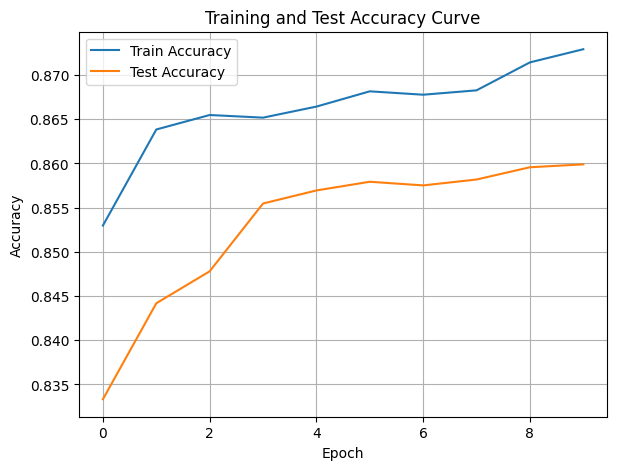

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.19it/s]

Epoch [1/10], Train F1:0.8771504373744825, Train Loss: 0.7515, Train Acc: 0.8631, Test F1:0.8661850705194357, Test Loss: 0.8919, Test Acc: 0.8707
Epoch [2/10], Train F1:0.8776808372212094, Train Loss: 0.7470, Train Acc: 0.8753, Test F1:0.8602813164411195, Test Loss: 0.8861, Test Acc: 0.8668


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.19it/s]

Epoch [3/10], Train F1:0.8719331830653672, Train Loss: 0.7506, Train Acc: 0.8664, Test F1:0.8594853826316423, Test Loss: 0.8893, Test Acc: 0.8655


Training Process:  40%|████      | 4/10 [00:00<00:00, 13.18it/s]

Epoch [4/10], Train F1:0.8760924088205668, Train Loss: 0.7480, Train Acc: 0.8737, Test F1:0.8590759974585389, Test Loss: 0.8877, Test Acc: 0.8648
Epoch [5/10], Train F1:0.8767822293344775, Train Loss: 0.7456, Train Acc: 0.8765, Test F1:0.8569255800792304, Test Loss: 0.8864, Test Acc: 0.8628


Training Process:  80%|████████  | 8/10 [00:00<00:00, 12.38it/s]

Epoch [6/10], Train F1:0.8765465832550596, Train Loss: 0.7439, Train Acc: 0.8780, Test F1:0.8537077747604063, Test Loss: 0.8847, Test Acc: 0.8592
Epoch [7/10], Train F1:0.8769102648211174, Train Loss: 0.7456, Train Acc: 0.8761, Test F1:0.8537871214137243, Test Loss: 0.8806, Test Acc: 0.8589
Epoch [8/10], Train F1:0.8767332712847181, Train Loss: 0.7458, Train Acc: 0.8752, Test F1:0.8527954683173239, Test Loss: 0.8779, Test Acc: 0.8576


Training Process: 100%|██████████| 10/10 [00:00<00:00, 12.37it/s]


Epoch [9/10], Train F1:0.8794379595117202, Train Loss: 0.7433, Train Acc: 0.8780, Test F1:0.8529492544576237, Test Loss: 0.8760, Test Acc: 0.8582
Epoch [10/10], Train F1:0.8786957557657366, Train Loss: 0.7422, Train Acc: 0.8784, Test F1:0.8513981877985822, Test Loss: 0.8748, Test Acc: 0.8565
Total Epochs: 10
Train loss start: 0.7608352899551392, Train loss end: 0.7220644950866699
Highest Mean Train Accuracy (over epoch): 0.8783630952380952
Test loss start: 0.8866481781005859, Test loss end: 0.8373200297355652
Highest mean Test Accuracy (over epoch): 0.8706597222222222


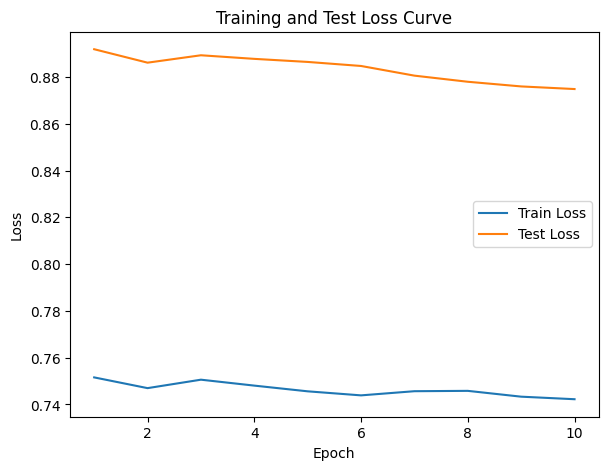

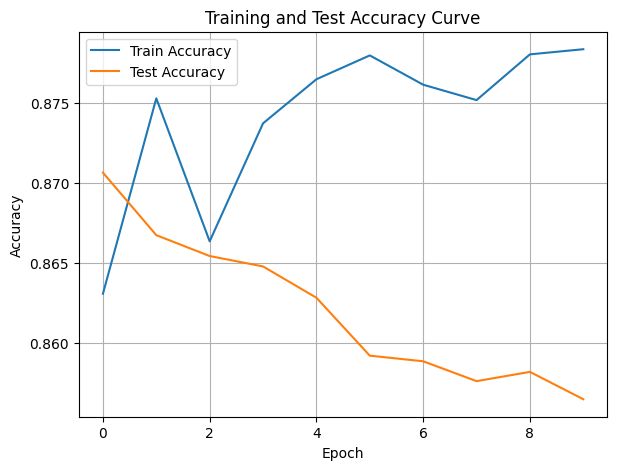

./saved_models/model_10.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [61]:
DTEmlp8b.train_DTE()

Training Process:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch [1/150], Train F1:0.20964480755710646, Train Loss: 1.1830, Train Acc: 0.2244, Test F1:0.16291137007822337, Test Loss: 1.1436, Test Acc: 0.1684


Training Process:   1%|▏         | 2/150 [00:00<00:13, 11.13it/s]

Epoch [2/150], Train F1:0.22442484636033025, Train Loss: 1.1773, Train Acc: 0.2315, Test F1:0.17508010127489862, Test Loss: 1.1427, Test Acc: 0.2135
Epoch [3/150], Train F1:0.229356798750743, Train Loss: 1.1778, Train Acc: 0.2342, Test F1:0.19040068213353745, Test Loss: 1.1384, Test Acc: 0.2318


Training Process:   3%|▎         | 5/150 [00:00<00:16,  9.04it/s]

Epoch [4/150], Train F1:0.24488037266332024, Train Loss: 1.1716, Train Acc: 0.2505, Test F1:0.1963090808683492, Test Loss: 1.1352, Test Acc: 0.2424
Epoch [5/150], Train F1:0.24956945531804609, Train Loss: 1.1676, Train Acc: 0.2582, Test F1:0.20500046440976022, Test Loss: 1.1319, Test Acc: 0.2516


Training Process:   5%|▍         | 7/150 [00:00<00:15,  9.47it/s]

Epoch [6/150], Train F1:0.2588784699789454, Train Loss: 1.1630, Train Acc: 0.2649, Test F1:0.21719860387458365, Test Loss: 1.1291, Test Acc: 0.2649
Epoch [7/150], Train F1:0.2664882321845546, Train Loss: 1.1594, Train Acc: 0.2731, Test F1:0.2225699266126421, Test Loss: 1.1264, Test Acc: 0.2643


Training Process:   6%|▌         | 9/150 [00:00<00:15,  9.12it/s]

Epoch [8/150], Train F1:0.2718714728841052, Train Loss: 1.1562, Train Acc: 0.2773, Test F1:0.22337930387465987, Test Loss: 1.1248, Test Acc: 0.2702
Epoch [9/150], Train F1:0.27721896503796506, Train Loss: 1.1537, Train Acc: 0.2826, Test F1:0.2265050852478613, Test Loss: 1.1226, Test Acc: 0.2763


Training Process:   7%|▋         | 10/150 [00:01<00:15,  8.77it/s]

Epoch [10/150], Train F1:0.2798794070025549, Train Loss: 1.1514, Train Acc: 0.2835, Test F1:0.2360135633200649, Test Loss: 1.1202, Test Acc: 0.2879
Epoch [11/150], Train F1:0.28445634432055034, Train Loss: 1.1494, Train Acc: 0.2871, Test F1:0.2376104515009451, Test Loss: 1.1184, Test Acc: 0.2921


Training Process:   8%|▊         | 12/150 [00:01<00:21,  6.45it/s]

Epoch [12/150], Train F1:0.285838355798867, Train Loss: 1.1470, Train Acc: 0.2896, Test F1:0.2417275997960418, Test Loss: 1.1168, Test Acc: 0.3004


Training Process:   9%|▊         | 13/150 [00:01<00:23,  5.93it/s]

Epoch [13/150], Train F1:0.2968714141046527, Train Loss: 1.1433, Train Acc: 0.2982, Test F1:0.25945930461025307, Test Loss: 1.1139, Test Acc: 0.3108


Training Process:   9%|▉         | 14/150 [00:01<00:25,  5.29it/s]

Epoch [14/150], Train F1:0.3034506040283798, Train Loss: 1.1402, Train Acc: 0.3040, Test F1:0.2785102792025646, Test Loss: 1.1105, Test Acc: 0.3227


Training Process:  10%|█         | 15/150 [00:02<00:25,  5.23it/s]

Epoch [15/150], Train F1:0.3082624608665981, Train Loss: 1.1361, Train Acc: 0.3091, Test F1:0.28223436550679043, Test Loss: 1.1081, Test Acc: 0.3295


Epoch [16/150], Train F1:0.3157480948805687, Train Loss: 1.1322, Train Acc: 0.3165, Test F1:0.2854650192511827, Test Loss: 1.1056, Test Acc: 0.3336


Training Process:  12%|█▏        | 18/150 [00:02<00:23,  5.53it/s]

Epoch [17/150], Train F1:0.3255247583226483, Train Loss: 1.1284, Train Acc: 0.3242, Test F1:0.2957197910891157, Test Loss: 1.1034, Test Acc: 0.3421
Epoch [18/150], Train F1:0.3318770768242195, Train Loss: 1.1253, Train Acc: 0.3299, Test F1:0.3025078379868882, Test Loss: 1.1014, Test Acc: 0.3488


Training Process:  13%|█▎        | 20/150 [00:02<00:21,  5.99it/s]

Epoch [19/150], Train F1:0.3392610148875986, Train Loss: 1.1222, Train Acc: 0.3358, Test F1:0.3117788086298343, Test Loss: 1.0990, Test Acc: 0.3557
Epoch [20/150], Train F1:0.3456804298550524, Train Loss: 1.1195, Train Acc: 0.3407, Test F1:0.31919662406231397, Test Loss: 1.0969, Test Acc: 0.3625


Training Process:  14%|█▍        | 21/150 [00:03<00:23,  5.42it/s]

Epoch [21/150], Train F1:0.3530042557999295, Train Loss: 1.1161, Train Acc: 0.3466, Test F1:0.3292687469424548, Test Loss: 1.0945, Test Acc: 0.3703


Training Process:  15%|█▍        | 22/150 [00:03<00:26,  4.91it/s]

Epoch [22/150], Train F1:0.36140620219118513, Train Loss: 1.1126, Train Acc: 0.3539, Test F1:0.34278732744628426, Test Loss: 1.0917, Test Acc: 0.3797


Training Process:  15%|█▌        | 23/150 [00:03<00:26,  4.81it/s]

Epoch [23/150], Train F1:0.3685687659944504, Train Loss: 1.1094, Train Acc: 0.3601, Test F1:0.354604762063807, Test Loss: 1.0893, Test Acc: 0.3884


Training Process:  16%|█▌        | 24/150 [00:03<00:27,  4.63it/s]

Epoch [24/150], Train F1:0.3751924831188325, Train Loss: 1.1064, Train Acc: 0.3648, Test F1:0.36176991606422054, Test Loss: 1.0869, Test Acc: 0.3943


Training Process:  17%|█▋        | 25/150 [00:04<00:27,  4.56it/s]

Epoch [25/150], Train F1:0.38471432262954636, Train Loss: 1.1031, Train Acc: 0.3729, Test F1:0.3808639637037424, Test Loss: 1.0838, Test Acc: 0.4063


Training Process:  18%|█▊        | 27/150 [00:04<00:24,  4.98it/s]

Epoch [26/150], Train F1:0.39204512665144114, Train Loss: 1.0994, Train Acc: 0.3790, Test F1:0.39971855445038734, Test Loss: 1.0811, Test Acc: 0.4185
Epoch [27/150], Train F1:0.39993993620474905, Train Loss: 1.0960, Train Acc: 0.3860, Test F1:0.4159932450790475, Test Loss: 1.0784, Test Acc: 0.4293


Training Process:  19%|█▉        | 29/150 [00:04<00:23,  5.09it/s]

Epoch [28/150], Train F1:0.4073440839855021, Train Loss: 1.0932, Train Acc: 0.3924, Test F1:0.43091051149727005, Test Loss: 1.0759, Test Acc: 0.4396
Epoch [29/150], Train F1:0.41446246399280745, Train Loss: 1.0899, Train Acc: 0.3981, Test F1:0.44736847753713127, Test Loss: 1.0734, Test Acc: 0.4512


Training Process:  20%|██        | 30/150 [00:05<00:21,  5.50it/s]

Epoch [30/150], Train F1:0.42275468615336853, Train Loss: 1.0863, Train Acc: 0.4045, Test F1:0.4597989711459653, Test Loss: 1.0710, Test Acc: 0.4600


Training Process:  21%|██        | 31/150 [00:05<00:23,  4.99it/s]

Epoch [31/150], Train F1:0.4302434913561108, Train Loss: 1.0831, Train Acc: 0.4109, Test F1:0.471105083963111, Test Loss: 1.0687, Test Acc: 0.4685


Training Process:  21%|██▏       | 32/150 [00:05<00:27,  4.31it/s]

Epoch [32/150], Train F1:0.43873615438542274, Train Loss: 1.0795, Train Acc: 0.4178, Test F1:0.48480755553607663, Test Loss: 1.0660, Test Acc: 0.4789


Training Process:  22%|██▏       | 33/150 [00:05<00:27,  4.32it/s]

Epoch [33/150], Train F1:0.44762647857541993, Train Loss: 1.0755, Train Acc: 0.4255, Test F1:0.4955971686936679, Test Loss: 1.0638, Test Acc: 0.4873


Training Process:  23%|██▎       | 34/150 [00:06<00:25,  4.52it/s]

Epoch [34/150], Train F1:0.4551344445563289, Train Loss: 1.0723, Train Acc: 0.4317, Test F1:0.504941219530589, Test Loss: 1.0618, Test Acc: 0.4947


Training Process:  23%|██▎       | 35/150 [00:06<00:24,  4.68it/s]

Epoch [35/150], Train F1:0.4637263536992272, Train Loss: 1.0685, Train Acc: 0.4393, Test F1:0.5137366753555586, Test Loss: 1.0594, Test Acc: 0.5017


Training Process:  25%|██▍       | 37/150 [00:06<00:21,  5.16it/s]

Epoch [36/150], Train F1:0.4714038286019926, Train Loss: 1.0650, Train Acc: 0.4462, Test F1:0.5227414709673194, Test Loss: 1.0573, Test Acc: 0.5091
Epoch [37/150], Train F1:0.47874683344871827, Train Loss: 1.0618, Train Acc: 0.4523, Test F1:0.5329522905490613, Test Loss: 1.0547, Test Acc: 0.5176


Training Process:  25%|██▌       | 38/150 [00:06<00:21,  5.27it/s]

Epoch [38/150], Train F1:0.4856638038144668, Train Loss: 1.0586, Train Acc: 0.4584, Test F1:0.5428574675138302, Test Loss: 1.0521, Test Acc: 0.5261


Training Process:  26%|██▌       | 39/150 [00:07<00:24,  4.55it/s]

Epoch [39/150], Train F1:0.4921715456868349, Train Loss: 1.0553, Train Acc: 0.4643, Test F1:0.5512404602415941, Test Loss: 1.0498, Test Acc: 0.5336


Training Process:  27%|██▋       | 40/150 [00:07<00:25,  4.28it/s]

Epoch [40/150], Train F1:0.4990858998284023, Train Loss: 1.0521, Train Acc: 0.4702, Test F1:0.5591754064869334, Test Loss: 1.0474, Test Acc: 0.5406


Training Process:  27%|██▋       | 41/150 [00:07<00:25,  4.33it/s]

Epoch [41/150], Train F1:0.5061700031985183, Train Loss: 1.0485, Train Acc: 0.4769, Test F1:0.5674423252876062, Test Loss: 1.0449, Test Acc: 0.5477


Training Process:  28%|██▊       | 42/150 [00:07<00:23,  4.58it/s]

Epoch [42/150], Train F1:0.5131416903631205, Train Loss: 1.0452, Train Acc: 0.4831, Test F1:0.5741932700595969, Test Loss: 1.0428, Test Acc: 0.5538


Training Process:  29%|██▊       | 43/150 [00:07<00:23,  4.58it/s]

Epoch [43/150], Train F1:0.5204770396927426, Train Loss: 1.0416, Train Acc: 0.4898, Test F1:0.5812658858380935, Test Loss: 1.0406, Test Acc: 0.5603


Training Process:  29%|██▉       | 44/150 [00:08<00:23,  4.51it/s]

Epoch [44/150], Train F1:0.5274507252436209, Train Loss: 1.0383, Train Acc: 0.4959, Test F1:0.588447014396979, Test Loss: 1.0382, Test Acc: 0.5669


Training Process:  30%|███       | 45/150 [00:08<00:22,  4.69it/s]

Epoch [45/150], Train F1:0.533809250835167, Train Loss: 1.0351, Train Acc: 0.5017, Test F1:0.5950996700812065, Test Loss: 1.0355, Test Acc: 0.5730


Training Process:  31%|███       | 46/150 [00:08<00:21,  4.86it/s]

Epoch [46/150], Train F1:0.5399301894064524, Train Loss: 1.0319, Train Acc: 0.5076, Test F1:0.6012533783173641, Test Loss: 1.0330, Test Acc: 0.5787


Training Process:  31%|███▏      | 47/150 [00:08<00:20,  5.04it/s]

Epoch [47/150], Train F1:0.5458914013377287, Train Loss: 1.0285, Train Acc: 0.5130, Test F1:0.6070370683139148, Test Loss: 1.0305, Test Acc: 0.5841
Epoch [48/150], Train F1:0.5515736408870108, Train Loss: 1.0255, Train Acc: 0.5184, Test F1:0.6125193840325237, Test Loss: 1.0280, Test Acc: 0.5893


Training Process:  33%|███▎      | 49/150 [00:09<00:19,  5.31it/s]

Epoch [49/150], Train F1:0.5573307107103099, Train Loss: 1.0222, Train Acc: 0.5239, Test F1:0.6177527415179639, Test Loss: 1.0256, Test Acc: 0.5942


Training Process:  33%|███▎      | 50/150 [00:09<00:20,  4.91it/s]

Epoch [50/150], Train F1:0.5627513888095449, Train Loss: 1.0190, Train Acc: 0.5291, Test F1:0.6228615116590006, Test Loss: 1.0234, Test Acc: 0.5992


Training Process:  34%|███▍      | 51/150 [00:09<00:19,  5.00it/s]

Epoch [51/150], Train F1:0.5686034015275326, Train Loss: 1.0158, Train Acc: 0.5347, Test F1:0.627542781551851, Test Loss: 1.0211, Test Acc: 0.6038


Training Process:  35%|███▍      | 52/150 [00:09<00:19,  5.12it/s]

Epoch [52/150], Train F1:0.5741144839905158, Train Loss: 1.0129, Train Acc: 0.5395, Test F1:0.6323253174571738, Test Loss: 1.0189, Test Acc: 0.6085


Training Process:  35%|███▌      | 53/150 [00:09<00:18,  5.14it/s]

Epoch [53/150], Train F1:0.5793126443866778, Train Loss: 1.0100, Train Acc: 0.5443, Test F1:0.6367609088814893, Test Loss: 1.0165, Test Acc: 0.6129


Training Process:  36%|███▌      | 54/150 [00:10<00:18,  5.30it/s]

Epoch [54/150], Train F1:0.5844333084943496, Train Loss: 1.0067, Train Acc: 0.5495, Test F1:0.6411728381146853, Test Loss: 1.0143, Test Acc: 0.6173


Training Process:  37%|███▋      | 55/150 [00:10<00:18,  5.18it/s]

Epoch [55/150], Train F1:0.5897443109803828, Train Loss: 1.0034, Train Acc: 0.5545, Test F1:0.6452425340817168, Test Loss: 1.0122, Test Acc: 0.6213


Training Process:  37%|███▋      | 56/150 [00:10<00:18,  5.15it/s]

Epoch [56/150], Train F1:0.5942189280434969, Train Loss: 1.0005, Train Acc: 0.5589, Test F1:0.6493025736374572, Test Loss: 1.0100, Test Acc: 0.6254


Training Process:  38%|███▊      | 57/150 [00:10<00:18,  5.13it/s]

Epoch [57/150], Train F1:0.598975048508764, Train Loss: 0.9977, Train Acc: 0.5637, Test F1:0.6532874836883747, Test Loss: 1.0081, Test Acc: 0.6294


Training Process:  39%|███▊      | 58/150 [00:10<00:17,  5.14it/s]

Epoch [58/150], Train F1:0.603518786210486, Train Loss: 0.9948, Train Acc: 0.5681, Test F1:0.6570102979267548, Test Loss: 1.0059, Test Acc: 0.6332


Training Process:  39%|███▉      | 59/150 [00:11<00:19,  4.73it/s]

Epoch [59/150], Train F1:0.6071382035316392, Train Loss: 0.9922, Train Acc: 0.5714, Test F1:0.6604428182568095, Test Loss: 1.0037, Test Acc: 0.6368


Training Process:  40%|████      | 60/150 [00:11<00:20,  4.35it/s]

Epoch [60/150], Train F1:0.6117974019909633, Train Loss: 0.9894, Train Acc: 0.5760, Test F1:0.66399466609144, Test Loss: 1.0017, Test Acc: 0.6404


Training Process:  41%|████      | 61/150 [00:11<00:21,  4.19it/s]

Epoch [61/150], Train F1:0.6161323892160492, Train Loss: 0.9866, Train Acc: 0.5804, Test F1:0.6668958787829365, Test Loss: 0.9995, Test Acc: 0.6435


Training Process:  41%|████▏     | 62/150 [00:11<00:22,  3.95it/s]

Epoch [62/150], Train F1:0.6202842367254109, Train Loss: 0.9838, Train Acc: 0.5846, Test F1:0.6696756440344678, Test Loss: 0.9973, Test Acc: 0.6464


Training Process:  42%|████▏     | 63/150 [00:12<00:23,  3.65it/s]

Epoch [63/150], Train F1:0.6242875517583328, Train Loss: 0.9807, Train Acc: 0.5888, Test F1:0.6726214014070596, Test Loss: 0.9952, Test Acc: 0.6495


Training Process:  43%|████▎     | 64/150 [00:12<00:22,  3.84it/s]

Epoch [64/150], Train F1:0.6283873294331257, Train Loss: 0.9780, Train Acc: 0.5928, Test F1:0.6751930487716998, Test Loss: 0.9932, Test Acc: 0.6522


Training Process:  43%|████▎     | 65/150 [00:12<00:21,  3.96it/s]

Epoch [65/150], Train F1:0.6319477275763873, Train Loss: 0.9755, Train Acc: 0.5962, Test F1:0.6784638529501376, Test Loss: 0.9912, Test Acc: 0.6557


Training Process:  44%|████▍     | 66/150 [00:13<00:22,  3.80it/s]

Epoch [66/150], Train F1:0.6357685700185065, Train Loss: 0.9728, Train Acc: 0.5999, Test F1:0.6816256701590618, Test Loss: 0.9892, Test Acc: 0.6591


Training Process:  45%|████▍     | 67/150 [00:13<00:22,  3.68it/s]

Epoch [67/150], Train F1:0.6393526653937307, Train Loss: 0.9700, Train Acc: 0.6038, Test F1:0.6844299595249839, Test Loss: 0.9872, Test Acc: 0.6620


Training Process:  45%|████▌     | 68/150 [00:13<00:20,  3.95it/s]

Epoch [68/150], Train F1:0.6428270998484393, Train Loss: 0.9676, Train Acc: 0.6073, Test F1:0.687392618782124, Test Loss: 0.9852, Test Acc: 0.6652


Training Process:  46%|████▌     | 69/150 [00:13<00:20,  4.04it/s]

Epoch [69/150], Train F1:0.6462217170421803, Train Loss: 0.9649, Train Acc: 0.6109, Test F1:0.6900128407404783, Test Loss: 0.9832, Test Acc: 0.6681


Training Process:  47%|████▋     | 70/150 [00:14<00:20,  3.88it/s]

Epoch [70/150], Train F1:0.6497154376054354, Train Loss: 0.9622, Train Acc: 0.6146, Test F1:0.6927953462781145, Test Loss: 0.9812, Test Acc: 0.6711


Training Process:  47%|████▋     | 71/150 [00:14<00:19,  4.04it/s]

Epoch [71/150], Train F1:0.6529617053725575, Train Loss: 0.9596, Train Acc: 0.6181, Test F1:0.695492832970289, Test Loss: 0.9794, Test Acc: 0.6740


Training Process:  48%|████▊     | 72/150 [00:14<00:18,  4.29it/s]

Epoch [72/150], Train F1:0.6562220973779489, Train Loss: 0.9571, Train Acc: 0.6214, Test F1:0.6977471719645286, Test Loss: 0.9774, Test Acc: 0.6764


Training Process:  49%|████▊     | 73/150 [00:14<00:18,  4.20it/s]

Epoch [73/150], Train F1:0.6592516179683429, Train Loss: 0.9547, Train Acc: 0.6247, Test F1:0.7000513489345805, Test Loss: 0.9755, Test Acc: 0.6790


Training Process:  49%|████▉     | 74/150 [00:15<00:19,  3.83it/s]

Epoch [74/150], Train F1:0.6621234752616927, Train Loss: 0.9523, Train Acc: 0.6277, Test F1:0.7024047465479428, Test Loss: 0.9736, Test Acc: 0.6816


Training Process:  50%|█████     | 75/150 [00:15<00:19,  3.77it/s]

Epoch [75/150], Train F1:0.6647683766276402, Train Loss: 0.9501, Train Acc: 0.6304, Test F1:0.7043401035233571, Test Loss: 0.9717, Test Acc: 0.6837


Training Process:  51%|█████     | 76/150 [00:15<00:19,  3.84it/s]

Epoch [76/150], Train F1:0.667381752084143, Train Loss: 0.9479, Train Acc: 0.6330, Test F1:0.7064445229812836, Test Loss: 0.9698, Test Acc: 0.6860


Training Process:  51%|█████▏    | 77/150 [00:15<00:20,  3.62it/s]

Epoch [77/150], Train F1:0.6701078094993532, Train Loss: 0.9458, Train Acc: 0.6359, Test F1:0.7084877097510143, Test Loss: 0.9679, Test Acc: 0.6882


Training Process:  52%|█████▏    | 78/150 [00:16<00:21,  3.38it/s]

Epoch [78/150], Train F1:0.6727700571863005, Train Loss: 0.9435, Train Acc: 0.6389, Test F1:0.7105824770034698, Test Loss: 0.9660, Test Acc: 0.6905


Training Process:  53%|█████▎    | 79/150 [00:16<00:21,  3.29it/s]

Epoch [79/150], Train F1:0.6753372680036, Train Loss: 0.9413, Train Acc: 0.6415, Test F1:0.7125106912781574, Test Loss: 0.9642, Test Acc: 0.6927


Training Process:  53%|█████▎    | 80/150 [00:16<00:23,  2.95it/s]

Epoch [80/150], Train F1:0.6778896885678087, Train Loss: 0.9391, Train Acc: 0.6442, Test F1:0.7147221845413244, Test Loss: 0.9626, Test Acc: 0.6951


Training Process:  54%|█████▍    | 81/150 [00:17<00:26,  2.64it/s]

Epoch [81/150], Train F1:0.6807068352282594, Train Loss: 0.9368, Train Acc: 0.6472, Test F1:0.7167670792543344, Test Loss: 0.9610, Test Acc: 0.6973


Training Process:  55%|█████▍    | 82/150 [00:17<00:28,  2.35it/s]

Epoch [82/150], Train F1:0.6833164310759221, Train Loss: 0.9346, Train Acc: 0.6499, Test F1:0.718965719732726, Test Loss: 0.9592, Test Acc: 0.6997


Training Process:  55%|█████▌    | 83/150 [00:18<00:31,  2.16it/s]

Epoch [83/150], Train F1:0.6857184980139202, Train Loss: 0.9324, Train Acc: 0.6526, Test F1:0.7207837239821696, Test Loss: 0.9576, Test Acc: 0.7017


Training Process:  56%|█████▌    | 84/150 [00:19<00:32,  2.05it/s]

Epoch [84/150], Train F1:0.6882909267630122, Train Loss: 0.9302, Train Acc: 0.6554, Test F1:0.7225533878159504, Test Loss: 0.9559, Test Acc: 0.7037


Training Process:  57%|█████▋    | 85/150 [00:19<00:30,  2.15it/s]

Epoch [85/150], Train F1:0.6906715139612453, Train Loss: 0.9279, Train Acc: 0.6581, Test F1:0.724276665605157, Test Loss: 0.9540, Test Acc: 0.7056


Training Process:  57%|█████▋    | 86/150 [00:19<00:27,  2.30it/s]

Epoch [86/150], Train F1:0.6930182395726923, Train Loss: 0.9258, Train Acc: 0.6606, Test F1:0.7261795874278598, Test Loss: 0.9525, Test Acc: 0.7077


Training Process:  58%|█████▊    | 87/150 [00:20<00:26,  2.38it/s]

Epoch [87/150], Train F1:0.6952057695717303, Train Loss: 0.9237, Train Acc: 0.6629, Test F1:0.7279170105600022, Test Loss: 0.9508, Test Acc: 0.7096


Training Process:  59%|█████▊    | 88/150 [00:20<00:25,  2.41it/s]

Epoch [88/150], Train F1:0.6973890119683628, Train Loss: 0.9217, Train Acc: 0.6654, Test F1:0.7295143799643533, Test Loss: 0.9490, Test Acc: 0.7115


Training Process:  59%|█████▉    | 89/150 [00:21<00:25,  2.43it/s]

Epoch [89/150], Train F1:0.699442597689104, Train Loss: 0.9196, Train Acc: 0.6677, Test F1:0.7312687977984023, Test Loss: 0.9474, Test Acc: 0.7134


Training Process:  60%|██████    | 90/150 [00:21<00:24,  2.49it/s]

Epoch [90/150], Train F1:0.701729716930626, Train Loss: 0.9175, Train Acc: 0.6702, Test F1:0.7329812291194112, Test Loss: 0.9457, Test Acc: 0.7153


Training Process:  61%|██████    | 91/150 [00:21<00:26,  2.23it/s]

Epoch [91/150], Train F1:0.7042255144674814, Train Loss: 0.9155, Train Acc: 0.6727, Test F1:0.7345546501650015, Test Loss: 0.9440, Test Acc: 0.7171


Training Process:  61%|██████▏   | 92/150 [00:22<00:26,  2.17it/s]

Epoch [92/150], Train F1:0.7062446174670698, Train Loss: 0.9136, Train Acc: 0.6749, Test F1:0.7358957101045798, Test Loss: 0.9423, Test Acc: 0.7186


Training Process:  62%|██████▏   | 93/150 [00:22<00:26,  2.14it/s]

Epoch [93/150], Train F1:0.7078936030898212, Train Loss: 0.9118, Train Acc: 0.6767, Test F1:0.7373013707054522, Test Loss: 0.9408, Test Acc: 0.7202


Training Process:  63%|██████▎   | 94/150 [00:23<00:26,  2.15it/s]

Epoch [94/150], Train F1:0.7098315543293842, Train Loss: 0.9100, Train Acc: 0.6788, Test F1:0.7387814692819036, Test Loss: 0.9392, Test Acc: 0.7219


Training Process:  63%|██████▎   | 95/150 [00:23<00:25,  2.17it/s]

Epoch [95/150], Train F1:0.7117420960061882, Train Loss: 0.9081, Train Acc: 0.6809, Test F1:0.7401222289786422, Test Loss: 0.9377, Test Acc: 0.7234


Training Process:  64%|██████▍   | 96/150 [00:24<00:24,  2.17it/s]

Epoch [96/150], Train F1:0.7136540380231533, Train Loss: 0.9063, Train Acc: 0.6828, Test F1:0.741338467089265, Test Loss: 0.9362, Test Acc: 0.7248


Training Process:  65%|██████▍   | 97/150 [00:24<00:24,  2.21it/s]

Epoch [97/150], Train F1:0.7154539505627857, Train Loss: 0.9044, Train Acc: 0.6849, Test F1:0.7427133514655307, Test Loss: 0.9346, Test Acc: 0.7264


Training Process:  65%|██████▌   | 98/150 [00:25<00:22,  2.28it/s]

Epoch [98/150], Train F1:0.717192204042461, Train Loss: 0.9026, Train Acc: 0.6868, Test F1:0.7441628234070927, Test Loss: 0.9331, Test Acc: 0.7280


Training Process:  66%|██████▌   | 99/150 [00:25<00:22,  2.30it/s]

Epoch [99/150], Train F1:0.7191186033614748, Train Loss: 0.9009, Train Acc: 0.6888, Test F1:0.7456608055145725, Test Loss: 0.9316, Test Acc: 0.7297


Training Process:  67%|██████▋   | 100/150 [00:25<00:21,  2.29it/s]

Epoch [100/150], Train F1:0.7208020260272998, Train Loss: 0.8990, Train Acc: 0.6908, Test F1:0.7469460556422113, Test Loss: 0.9301, Test Acc: 0.7312


Training Process:  67%|██████▋   | 101/150 [00:26<00:21,  2.32it/s]

Epoch [101/150], Train F1:0.7222724332833851, Train Loss: 0.8974, Train Acc: 0.6924, Test F1:0.748204090605987, Test Loss: 0.9286, Test Acc: 0.7326


Training Process:  68%|██████▊   | 102/150 [00:26<00:20,  2.31it/s]

Epoch [102/150], Train F1:0.7240821665908934, Train Loss: 0.8955, Train Acc: 0.6945, Test F1:0.7492576363558882, Test Loss: 0.9271, Test Acc: 0.7338


Training Process:  69%|██████▊   | 103/150 [00:27<00:22,  2.07it/s]

Epoch [103/150], Train F1:0.7257269274824459, Train Loss: 0.8937, Train Acc: 0.6964, Test F1:0.7503770603145814, Test Loss: 0.9256, Test Acc: 0.7351


Training Process:  69%|██████▉   | 104/150 [00:28<00:24,  1.89it/s]

Epoch [104/150], Train F1:0.7273366709670804, Train Loss: 0.8920, Train Acc: 0.6982, Test F1:0.7517359316112255, Test Loss: 0.9241, Test Acc: 0.7366


Training Process:  70%|███████   | 105/150 [00:28<00:24,  1.81it/s]

Epoch [105/150], Train F1:0.7289961132838139, Train Loss: 0.8904, Train Acc: 0.7000, Test F1:0.7529145379385421, Test Loss: 0.9228, Test Acc: 0.7380


Training Process:  71%|███████   | 106/150 [00:29<00:22,  1.93it/s]

Epoch [106/150], Train F1:0.7305611155852113, Train Loss: 0.8887, Train Acc: 0.7018, Test F1:0.7539638081628254, Test Loss: 0.9213, Test Acc: 0.7392


Training Process:  71%|███████▏  | 107/150 [00:29<00:19,  2.18it/s]

Epoch [107/150], Train F1:0.7321571224896884, Train Loss: 0.8871, Train Acc: 0.7036, Test F1:0.7552479372486558, Test Loss: 0.9199, Test Acc: 0.7406


Training Process:  72%|███████▏  | 108/150 [00:29<00:19,  2.17it/s]

Epoch [108/150], Train F1:0.733678907247198, Train Loss: 0.8855, Train Acc: 0.7052, Test F1:0.7565142486942107, Test Loss: 0.9186, Test Acc: 0.7421


Training Process:  73%|███████▎  | 109/150 [00:30<00:17,  2.29it/s]

Epoch [109/150], Train F1:0.7352322395738188, Train Loss: 0.8840, Train Acc: 0.7068, Test F1:0.7577497051460558, Test Loss: 0.9172, Test Acc: 0.7435


Training Process:  73%|███████▎  | 110/150 [00:30<00:16,  2.48it/s]

Epoch [110/150], Train F1:0.7364898648651312, Train Loss: 0.8826, Train Acc: 0.7083, Test F1:0.7585459717892398, Test Loss: 0.9158, Test Acc: 0.7444


Training Process:  74%|███████▍  | 111/150 [00:30<00:14,  2.72it/s]

Epoch [111/150], Train F1:0.7379663582239073, Train Loss: 0.8810, Train Acc: 0.7099, Test F1:0.7594088520562847, Test Loss: 0.9144, Test Acc: 0.7454


Training Process:  75%|███████▍  | 112/150 [00:31<00:13,  2.84it/s]

Epoch [112/150], Train F1:0.7393745603812836, Train Loss: 0.8795, Train Acc: 0.7116, Test F1:0.7605006036929793, Test Loss: 0.9131, Test Acc: 0.7467


Training Process:  75%|███████▌  | 113/150 [00:31<00:13,  2.79it/s]

Epoch [113/150], Train F1:0.7407761985477871, Train Loss: 0.8779, Train Acc: 0.7131, Test F1:0.7614910006198744, Test Loss: 0.9117, Test Acc: 0.7478


Training Process:  76%|███████▌  | 114/150 [00:31<00:12,  2.81it/s]

Epoch [114/150], Train F1:0.74205366349426, Train Loss: 0.8765, Train Acc: 0.7146, Test F1:0.7626242159433592, Test Loss: 0.9104, Test Acc: 0.7491


Training Process:  77%|███████▋  | 115/150 [00:32<00:12,  2.91it/s]

Epoch [115/150], Train F1:0.7433456844923436, Train Loss: 0.8750, Train Acc: 0.7161, Test F1:0.7634973501153437, Test Loss: 0.9091, Test Acc: 0.7501


Training Process:  77%|███████▋  | 116/150 [00:32<00:11,  2.86it/s]

Epoch [116/150], Train F1:0.7444785788317275, Train Loss: 0.8736, Train Acc: 0.7175, Test F1:0.7645130546575566, Test Loss: 0.9078, Test Acc: 0.7513


Training Process:  78%|███████▊  | 117/150 [00:32<00:11,  2.97it/s]

Epoch [117/150], Train F1:0.7458587451900044, Train Loss: 0.8722, Train Acc: 0.7191, Test F1:0.7655107207737322, Test Loss: 0.9066, Test Acc: 0.7525


Training Process:  79%|███████▊  | 118/150 [00:33<00:11,  2.90it/s]

Epoch [118/150], Train F1:0.7471565366246173, Train Loss: 0.8707, Train Acc: 0.7206, Test F1:0.7663346978678949, Test Loss: 0.9053, Test Acc: 0.7534


Training Process:  79%|███████▉  | 119/150 [00:33<00:10,  2.86it/s]

Epoch [119/150], Train F1:0.7482432950714104, Train Loss: 0.8694, Train Acc: 0.7219, Test F1:0.7672214533581346, Test Loss: 0.9040, Test Acc: 0.7545


Training Process:  80%|████████  | 120/150 [00:33<00:10,  2.97it/s]

Epoch [120/150], Train F1:0.7494968281917136, Train Loss: 0.8680, Train Acc: 0.7234, Test F1:0.7681696245552829, Test Loss: 0.9028, Test Acc: 0.7556


Training Process:  81%|████████  | 121/150 [00:34<00:09,  2.92it/s]

Epoch [121/150], Train F1:0.7507282187355716, Train Loss: 0.8665, Train Acc: 0.7248, Test F1:0.7691778697490215, Test Loss: 0.9016, Test Acc: 0.7567


Training Process:  81%|████████▏ | 122/150 [00:34<00:09,  2.96it/s]

Epoch [122/150], Train F1:0.7517731821559226, Train Loss: 0.8653, Train Acc: 0.7259, Test F1:0.7701764858868893, Test Loss: 0.9004, Test Acc: 0.7578


Training Process:  82%|████████▏ | 123/150 [00:34<00:08,  3.09it/s]

Epoch [123/150], Train F1:0.7530543979109426, Train Loss: 0.8640, Train Acc: 0.7274, Test F1:0.7711512415078327, Test Loss: 0.8991, Test Acc: 0.7589


Training Process:  83%|████████▎ | 124/150 [00:35<00:08,  3.00it/s]

Epoch [124/150], Train F1:0.754277756750982, Train Loss: 0.8626, Train Acc: 0.7289, Test F1:0.7719607277313943, Test Loss: 0.8979, Test Acc: 0.7599


Training Process:  83%|████████▎ | 125/150 [00:35<00:08,  2.85it/s]

Epoch [125/150], Train F1:0.7553907653512975, Train Loss: 0.8613, Train Acc: 0.7301, Test F1:0.7727567020429348, Test Loss: 0.8968, Test Acc: 0.7609


Training Process:  84%|████████▍ | 126/150 [00:36<00:08,  2.81it/s]

Epoch [126/150], Train F1:0.7565565265552326, Train Loss: 0.8599, Train Acc: 0.7315, Test F1:0.77353950603345, Test Loss: 0.8956, Test Acc: 0.7618


Training Process:  85%|████████▍ | 127/150 [00:36<00:08,  2.83it/s]

Epoch [127/150], Train F1:0.7577376639236447, Train Loss: 0.8587, Train Acc: 0.7328, Test F1:0.7744554072008902, Test Loss: 0.8945, Test Acc: 0.7628


Training Process:  85%|████████▌ | 128/150 [00:36<00:07,  2.90it/s]

Epoch [128/150], Train F1:0.7589517112843978, Train Loss: 0.8572, Train Acc: 0.7342, Test F1:0.775356681160753, Test Loss: 0.8933, Test Acc: 0.7639


Training Process:  86%|████████▌ | 129/150 [00:37<00:06,  3.03it/s]

Epoch [129/150], Train F1:0.7599039524266975, Train Loss: 0.8560, Train Acc: 0.7353, Test F1:0.7760279344417916, Test Loss: 0.8922, Test Acc: 0.7646


Training Process:  87%|████████▋ | 130/150 [00:37<00:06,  3.14it/s]

Epoch [130/150], Train F1:0.7612187929550199, Train Loss: 0.8545, Train Acc: 0.7368, Test F1:0.7769025519950856, Test Loss: 0.8910, Test Acc: 0.7656


Training Process:  87%|████████▋ | 131/150 [00:37<00:05,  3.25it/s]

Epoch [131/150], Train F1:0.7624950692761944, Train Loss: 0.8532, Train Acc: 0.7382, Test F1:0.7776217419263759, Test Loss: 0.8899, Test Acc: 0.7665


Training Process:  88%|████████▊ | 132/150 [00:37<00:05,  3.14it/s]

Epoch [132/150], Train F1:0.7636662497640261, Train Loss: 0.8519, Train Acc: 0.7395, Test F1:0.7784704379373776, Test Loss: 0.8888, Test Acc: 0.7675


Training Process:  89%|████████▊ | 133/150 [00:38<00:05,  3.05it/s]

Epoch [133/150], Train F1:0.7648363564008752, Train Loss: 0.8506, Train Acc: 0.7409, Test F1:0.7792362160784143, Test Loss: 0.8877, Test Acc: 0.7684


Training Process:  89%|████████▉ | 134/150 [00:38<00:05,  2.93it/s]

Epoch [134/150], Train F1:0.7659036069011685, Train Loss: 0.8494, Train Acc: 0.7421, Test F1:0.780059689229431, Test Loss: 0.8866, Test Acc: 0.7693


Training Process:  90%|█████████ | 135/150 [00:38<00:05,  2.95it/s]

Epoch [135/150], Train F1:0.7668061237023621, Train Loss: 0.8482, Train Acc: 0.7432, Test F1:0.7808091081300912, Test Loss: 0.8856, Test Acc: 0.7702


Training Process:  91%|█████████ | 136/150 [00:39<00:04,  3.02it/s]

Epoch [136/150], Train F1:0.7680062086857692, Train Loss: 0.8468, Train Acc: 0.7444, Test F1:0.781608483719138, Test Loss: 0.8845, Test Acc: 0.7711


Training Process:  91%|█████████▏| 137/150 [00:39<00:04,  3.11it/s]

Epoch [137/150], Train F1:0.7688774651416174, Train Loss: 0.8458, Train Acc: 0.7454, Test F1:0.782327990448093, Test Loss: 0.8834, Test Acc: 0.7719


Training Process:  92%|█████████▏| 138/150 [00:39<00:03,  3.19it/s]

Epoch [138/150], Train F1:0.7698024689661761, Train Loss: 0.8446, Train Acc: 0.7465, Test F1:0.7831043547630507, Test Loss: 0.8824, Test Acc: 0.7728


Training Process:  93%|█████████▎| 139/150 [00:40<00:03,  3.21it/s]

Epoch [139/150], Train F1:0.7709212570604511, Train Loss: 0.8434, Train Acc: 0.7478, Test F1:0.7838693671316355, Test Loss: 0.8814, Test Acc: 0.7737


Training Process:  93%|█████████▎| 140/150 [00:40<00:03,  3.00it/s]

Epoch [140/150], Train F1:0.7717028763709795, Train Loss: 0.8424, Train Acc: 0.7487, Test F1:0.7844900063153001, Test Loss: 0.8803, Test Acc: 0.7744


Training Process:  94%|█████████▍| 141/150 [00:41<00:03,  2.74it/s]

Epoch [141/150], Train F1:0.7726313620393935, Train Loss: 0.8412, Train Acc: 0.7498, Test F1:0.7849691288537255, Test Loss: 0.8793, Test Acc: 0.7750


Training Process:  95%|█████████▍| 142/150 [00:41<00:02,  2.78it/s]

Epoch [142/150], Train F1:0.7735939007511514, Train Loss: 0.8401, Train Acc: 0.7508, Test F1:0.7854410573512928, Test Loss: 0.8783, Test Acc: 0.7756


Training Process:  95%|█████████▌| 143/150 [00:41<00:02,  2.68it/s]

Epoch [143/150], Train F1:0.7746691875267465, Train Loss: 0.8389, Train Acc: 0.7520, Test F1:0.7861020661062621, Test Loss: 0.8772, Test Acc: 0.7764


Training Process:  96%|█████████▌| 144/150 [00:42<00:02,  2.79it/s]

Epoch [144/150], Train F1:0.775681493860638, Train Loss: 0.8378, Train Acc: 0.7532, Test F1:0.7867536997761198, Test Loss: 0.8762, Test Acc: 0.7771


Training Process:  97%|█████████▋| 145/150 [00:42<00:01,  2.89it/s]

Epoch [145/150], Train F1:0.7766013149905444, Train Loss: 0.8367, Train Acc: 0.7543, Test F1:0.7873316349708787, Test Loss: 0.8753, Test Acc: 0.7778


Training Process:  97%|█████████▋| 146/150 [00:42<00:01,  3.01it/s]

Epoch [146/150], Train F1:0.7775253339657155, Train Loss: 0.8356, Train Acc: 0.7553, Test F1:0.7877731681154753, Test Loss: 0.8743, Test Acc: 0.7784


Training Process:  98%|█████████▊| 147/150 [00:43<00:01,  2.73it/s]

Epoch [147/150], Train F1:0.7783597068712731, Train Loss: 0.8346, Train Acc: 0.7562, Test F1:0.7884632061660662, Test Loss: 0.8734, Test Acc: 0.7791


Training Process:  99%|█████████▊| 148/150 [00:43<00:00,  2.49it/s]

Epoch [148/150], Train F1:0.7791948531635121, Train Loss: 0.8335, Train Acc: 0.7572, Test F1:0.7891438087925405, Test Loss: 0.8724, Test Acc: 0.7799


Training Process:  99%|█████████▉| 149/150 [00:44<00:00,  2.19it/s]

Epoch [149/150], Train F1:0.7800347115762514, Train Loss: 0.8324, Train Acc: 0.7582, Test F1:0.7898151705785449, Test Loss: 0.8715, Test Acc: 0.7807


Training Process: 100%|██████████| 150/150 [00:44<00:00,  3.36it/s]


Epoch [150/150], Train F1:0.7809376673607689, Train Loss: 0.8313, Train Acc: 0.7593, Test F1:0.790477480736256, Test Loss: 0.8705, Test Acc: 0.7814
Total Epochs: 150
Train loss start: 1.1611354351043701, Train loss end: 0.5704449415206909
Highest Mean Train Accuracy (over epoch): 0.7592896825396825
Test loss start: 1.1543214321136475, Test loss end: 0.7294430732727051
Highest Mean Test Accuracy (over epoch): 0.7814409722222223


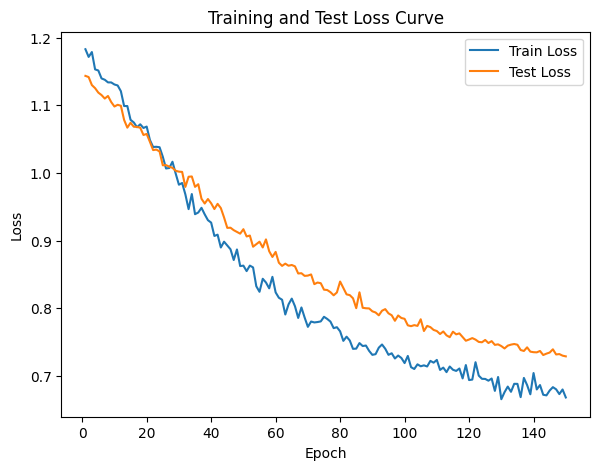

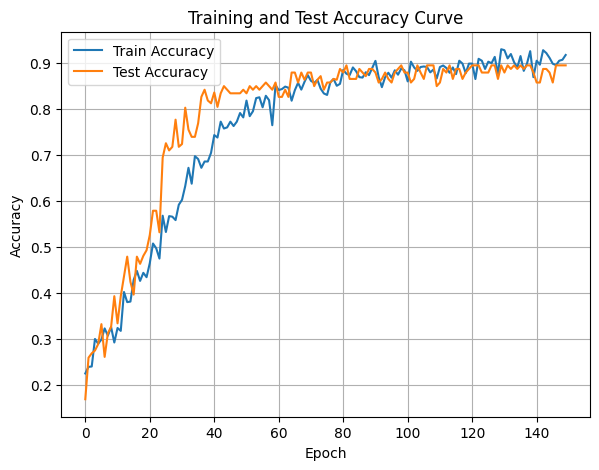

In [62]:
DTEmlp8b.train_single_model()

Randomly initializing 8 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  4.70it/s]

Epoch [1/10], Train F1:0.4928223675059118, Train Loss: 1.0682, Train Acc: 0.4568, Test F1:0.6063384664682429, Test Loss: 1.0488, Test Acc: 0.5799


Training Process:  30%|███       | 3/10 [00:00<00:01,  6.02it/s]

Epoch [2/10], Train F1:0.48283976940693357, Train Loss: 1.0707, Train Acc: 0.4421, Test F1:0.6050704704497193, Test Loss: 1.0517, Test Acc: 0.5851
Epoch [3/10], Train F1:0.513681936330454, Train Loss: 1.0632, Train Acc: 0.4685, Test F1:0.6110656255218962, Test Loss: 1.0499, Test Acc: 0.5952


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.53it/s]

Epoch [4/10], Train F1:0.5172468105520734, Train Loss: 1.0614, Train Acc: 0.4744, Test F1:0.6272162214083425, Test Loss: 1.0458, Test Acc: 0.6139
Epoch [5/10], Train F1:0.5202628158067378, Train Loss: 1.0581, Train Acc: 0.4779, Test F1:0.6343376613912768, Test Loss: 1.0423, Test Acc: 0.6220


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.35it/s]

Epoch [6/10], Train F1:0.5246658002342932, Train Loss: 1.0565, Train Acc: 0.4820, Test F1:0.637923168965905, Test Loss: 1.0408, Test Acc: 0.6262
Epoch [7/10], Train F1:0.5342638075631502, Train Loss: 1.0509, Train Acc: 0.4918, Test F1:0.6449071708397206, Test Loss: 1.0379, Test Acc: 0.6347


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.92it/s]

Epoch [8/10], Train F1:0.5397216294814225, Train Loss: 1.0469, Train Acc: 0.4974, Test F1:0.6512955591382751, Test Loss: 1.0356, Test Acc: 0.6411
Epoch [9/10], Train F1:0.5501915721246632, Train Loss: 1.0421, Train Acc: 0.5087, Test F1:0.6543989243977235, Test Loss: 1.0327, Test Acc: 0.6452


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.70it/s]


Epoch [10/10], Train F1:0.5586662224621062, Train Loss: 1.0386, Train Acc: 0.5173, Test F1:0.6623134789312094, Test Loss: 1.0306, Test Acc: 0.6537
Total Epochs: 10
Train loss start: 1.0418334007263184, Train loss end: 1.0909548997879028
Highest Mean Train Accuracy (over epoch): 0.5173214285714285
Test loss start: 1.0524500608444214, Test loss end: 1.008982539176941
Highest mean Test Accuracy (over epoch): 0.6537326388888889


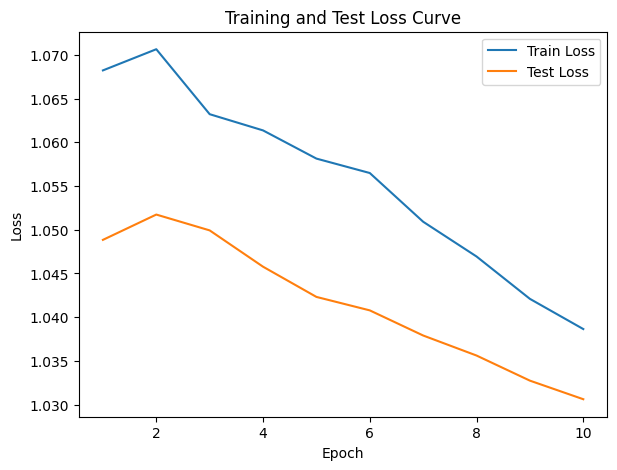

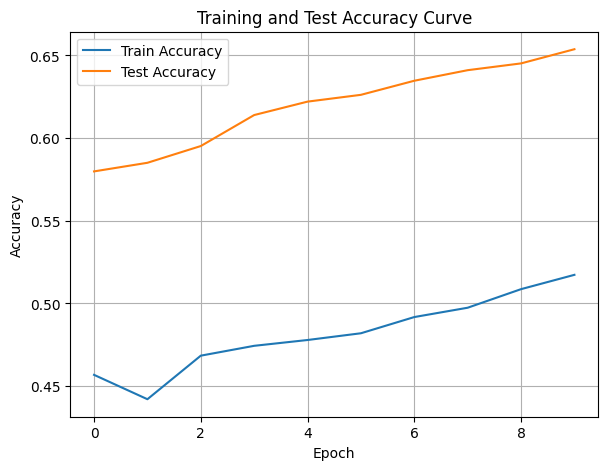

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.40it/s]

Epoch [1/10], Train F1:0.3516023039921423, Train Loss: 1.1074, Train Acc: 0.3482, Test F1:0.2262363225136011, Test Loss: 1.1092, Test Acc: 0.2465


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.40it/s]

Epoch [2/10], Train F1:0.35693257282357177, Train Loss: 1.1098, Train Acc: 0.3408, Test F1:0.2199305714697969, Test Loss: 1.1172, Test Acc: 0.2643


Training Process:  30%|███       | 3/10 [00:00<00:01,  5.54it/s]

Epoch [3/10], Train F1:0.37570999493094437, Train Loss: 1.1060, Train Acc: 0.3551, Test F1:0.2156330398583046, Test Loss: 1.1192, Test Acc: 0.2755


Training Process:  40%|████      | 4/10 [00:00<00:01,  5.29it/s]

Epoch [4/10], Train F1:0.37849744080544023, Train Loss: 1.1009, Train Acc: 0.3662, Test F1:0.21138972327427333, Test Loss: 1.1219, Test Acc: 0.2737


Training Process:  60%|██████    | 6/10 [00:01<00:00,  5.57it/s]

Epoch [5/10], Train F1:0.3771289998449135, Train Loss: 1.0998, Train Acc: 0.3643, Test F1:0.20851936367088628, Test Loss: 1.1238, Test Acc: 0.2635
Epoch [6/10], Train F1:0.38558345383826054, Train Loss: 1.0939, Train Acc: 0.3738, Test F1:0.21285471743875817, Test Loss: 1.1207, Test Acc: 0.2755


Training Process:  70%|███████   | 7/10 [00:01<00:00,  5.53it/s]

Epoch [7/10], Train F1:0.3874246166490575, Train Loss: 1.0910, Train Acc: 0.3772, Test F1:0.21153732571745673, Test Loss: 1.1196, Test Acc: 0.2775


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.05it/s]

Epoch [8/10], Train F1:0.39812665147538423, Train Loss: 1.0874, Train Acc: 0.3880, Test F1:0.21266989903006392, Test Loss: 1.1166, Test Acc: 0.2865


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.03it/s]

Epoch [9/10], Train F1:0.3996547884453746, Train Loss: 1.0844, Train Acc: 0.3906, Test F1:0.212280790588553, Test Loss: 1.1155, Test Acc: 0.2853


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.17it/s]


Epoch [10/10], Train F1:0.40775224310165, Train Loss: 1.0812, Train Acc: 0.3978, Test F1:0.21387870504600975, Test Loss: 1.1133, Test Acc: 0.2887
Total Epochs: 10
Train loss start: 1.1149159669876099, Train loss end: 1.1331804990768433
Highest Mean Train Accuracy (over epoch): 0.397797619047619
Test loss start: 1.1151015758514404, Test loss end: 1.0773634910583496
Highest mean Test Accuracy (over epoch): 0.2887152777777778


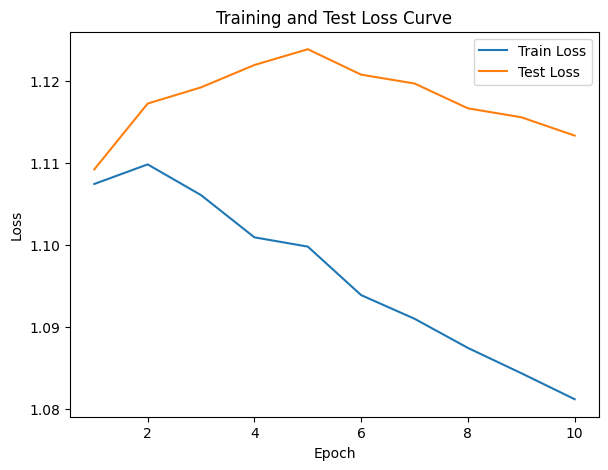

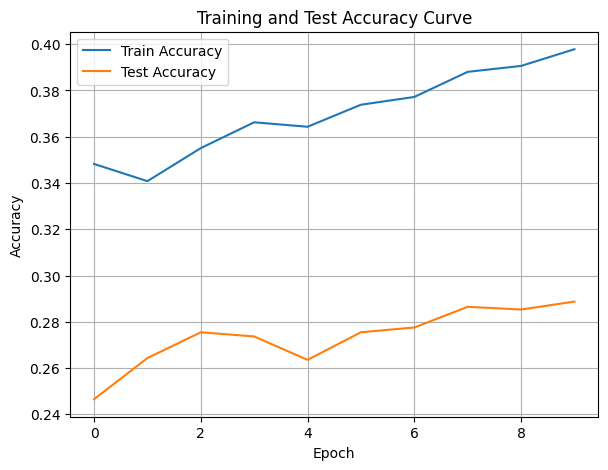

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.76it/s]

Epoch [1/10], Train F1:0.3791307874642557, Train Loss: 1.1200, Train Acc: 0.3077, Test F1:0.2059314954051796, Test Loss: 1.1140, Test Acc: 0.1293


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.37it/s]

Epoch [2/10], Train F1:0.3782313524982357, Train Loss: 1.1254, Train Acc: 0.2945, Test F1:0.1653561822175576, Test Loss: 1.1248, Test Acc: 0.1068


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.37it/s]

Epoch [3/10], Train F1:0.38300609380326733, Train Loss: 1.1199, Train Acc: 0.2988, Test F1:0.1750549032415697, Test Loss: 1.1241, Test Acc: 0.1175


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.72it/s]

Epoch [4/10], Train F1:0.38617828182821295, Train Loss: 1.1145, Train Acc: 0.3023, Test F1:0.1926087147693796, Test Loss: 1.1226, Test Acc: 0.1274


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.23it/s]

Epoch [5/10], Train F1:0.38773206125254306, Train Loss: 1.1119, Train Acc: 0.3065, Test F1:0.19258308703761415, Test Loss: 1.1225, Test Acc: 0.1259


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.45it/s]

Epoch [6/10], Train F1:0.3992502465380147, Train Loss: 1.1049, Train Acc: 0.3201, Test F1:0.20285072716734426, Test Loss: 1.1201, Test Acc: 0.1343


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.66it/s]

Epoch [7/10], Train F1:0.41288928188451623, Train Loss: 1.1002, Train Acc: 0.3302, Test F1:0.22520004378010294, Test Loss: 1.1158, Test Acc: 0.1509


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.96it/s]

Epoch [8/10], Train F1:0.42497199748781717, Train Loss: 1.0956, Train Acc: 0.3414, Test F1:0.24877529273805005, Test Loss: 1.1125, Test Acc: 0.1696
Epoch [9/10], Train F1:0.431498682812901, Train Loss: 1.0921, Train Acc: 0.3479, Test F1:0.2646662582316765, Test Loss: 1.1100, Test Acc: 0.1826


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.60it/s]


Epoch [10/10], Train F1:0.4366633550023856, Train Loss: 1.0880, Train Acc: 0.3534, Test F1:0.2855967106257836, Test Loss: 1.1073, Test Acc: 0.1975
Total Epochs: 10
Train loss start: 1.106831431388855, Train loss end: 1.0715219974517822
Highest Mean Train Accuracy (over epoch): 0.35336309523809517
Test loss start: 1.1211122274398804, Test loss end: 1.0748012065887451
Highest mean Test Accuracy (over epoch): 0.1974826388888889


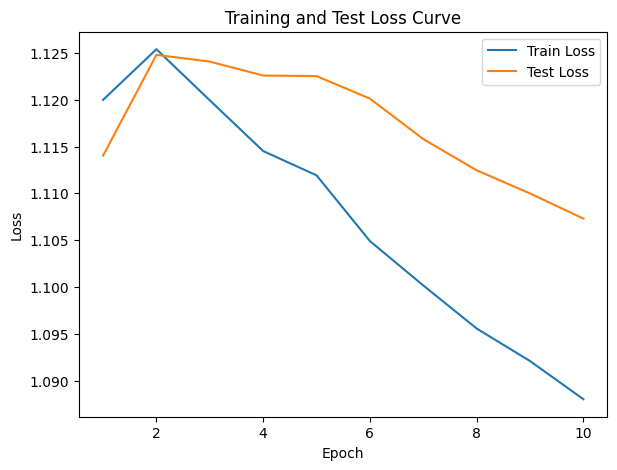

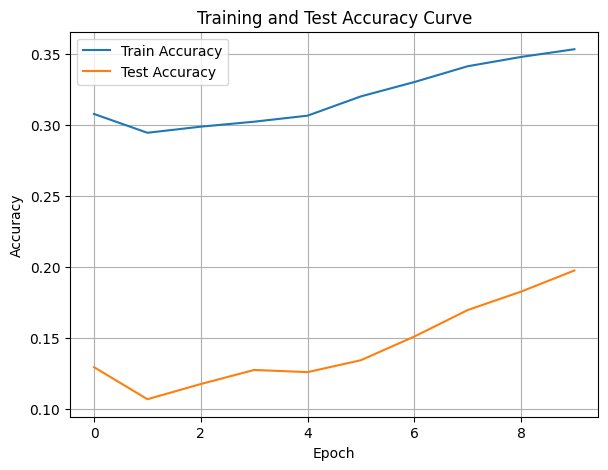

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.57it/s]

Epoch [1/10], Train F1:0.21610945598284015, Train Loss: 1.2013, Train Acc: 0.2399, Test F1:0.20392862498125652, Test Loss: 1.2021, Test Acc: 0.2899


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.38it/s]

Epoch [2/10], Train F1:0.21908712572183334, Train Loss: 1.2045, Train Acc: 0.2368, Test F1:0.20336555674901538, Test Loss: 1.2070, Test Acc: 0.3047


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.31it/s]

Epoch [3/10], Train F1:0.22326693255510588, Train Loss: 1.2056, Train Acc: 0.2381, Test F1:0.20343411720791338, Test Loss: 1.2085, Test Acc: 0.3142


Training Process:  40%|████      | 4/10 [00:00<00:00,  6.56it/s]

Epoch [4/10], Train F1:0.22769318600148833, Train Loss: 1.2014, Train Acc: 0.2429, Test F1:0.20187454938716654, Test Loss: 1.2080, Test Acc: 0.3190


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.71it/s]

Epoch [5/10], Train F1:0.23923889539471294, Train Loss: 1.1982, Train Acc: 0.2546, Test F1:0.2008097165991903, Test Loss: 1.2064, Test Acc: 0.3234


Training Process:  60%|██████    | 6/10 [00:01<00:00,  5.09it/s]

Epoch [6/10], Train F1:0.24280217054475353, Train Loss: 1.1945, Train Acc: 0.2591, Test F1:0.20050125313283212, Test Loss: 1.2039, Test Acc: 0.3277


Training Process:  70%|███████   | 7/10 [00:01<00:00,  4.87it/s]

Epoch [7/10], Train F1:0.24707763073126174, Train Loss: 1.1902, Train Acc: 0.2663, Test F1:0.20071684587813618, Test Loss: 1.2019, Test Acc: 0.3307


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  5.65it/s]

Epoch [8/10], Train F1:0.2479537545408426, Train Loss: 1.1892, Train Acc: 0.2678, Test F1:0.20068863748155433, Test Loss: 1.2006, Test Acc: 0.3330
Epoch [9/10], Train F1:0.24908993704333163, Train Loss: 1.1866, Train Acc: 0.2717, Test F1:0.20066695664781786, Test Loss: 1.1990, Test Acc: 0.3348


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.71it/s]


Epoch [10/10], Train F1:0.2536031861115473, Train Loss: 1.1821, Train Acc: 0.2774, Test F1:0.2008739320420009, Test Loss: 1.1980, Test Acc: 0.3354
Total Epochs: 10
Train loss start: 1.2014535665512085, Train loss end: 0.9717451930046082
Highest Mean Train Accuracy (over epoch): 0.27735119047619045
Test loss start: 1.2116069793701172, Test loss end: 1.1830132007598877
Highest mean Test Accuracy (over epoch): 0.33541666666666664


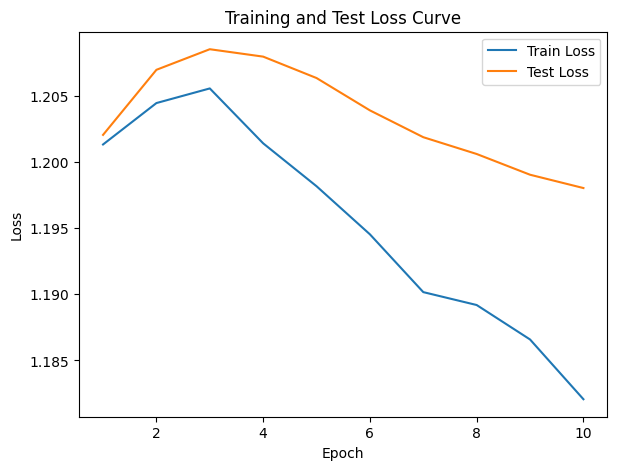

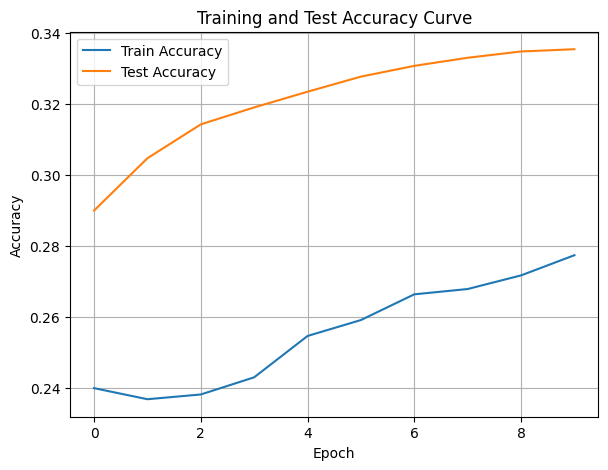

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.48it/s]

Epoch [1/10], Train F1:0.23326164120306617, Train Loss: 1.2183, Train Acc: 0.1533, Test F1:0.23782475928349456, Test Loss: 1.1548, Test Acc: 0.1962


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.84it/s]

Epoch [2/10], Train F1:0.2360492744633626, Train Loss: 1.2178, Train Acc: 0.1591, Test F1:0.2355130249867092, Test Loss: 1.1508, Test Acc: 0.2040


Training Process:  30%|███       | 3/10 [00:00<00:01,  6.97it/s]

Epoch [3/10], Train F1:0.2379416569350612, Train Loss: 1.2174, Train Acc: 0.1567, Test F1:0.22533990654291408, Test Loss: 1.1516, Test Acc: 0.2060


Training Process:  40%|████      | 4/10 [00:00<00:00,  6.50it/s]

Epoch [4/10], Train F1:0.25353603260004026, Train Loss: 1.2109, Train Acc: 0.1660, Test F1:0.2328283279033998, Test Loss: 1.1488, Test Acc: 0.2183


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.67it/s]

Epoch [5/10], Train F1:0.26668182051547806, Train Loss: 1.2064, Train Acc: 0.1768, Test F1:0.23787955853739276, Test Loss: 1.1465, Test Acc: 0.2229


Training Process:  70%|███████   | 7/10 [00:01<00:00,  5.46it/s]

Epoch [6/10], Train F1:0.27283646830009073, Train Loss: 1.2045, Train Acc: 0.1842, Test F1:0.2397915515720211, Test Loss: 1.1436, Test Acc: 0.2309
Epoch [7/10], Train F1:0.2782614286941276, Train Loss: 1.2025, Train Acc: 0.1876, Test F1:0.24777573580267404, Test Loss: 1.1404, Test Acc: 0.2411


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.15it/s]

Epoch [8/10], Train F1:0.2894471171381337, Train Loss: 1.1990, Train Acc: 0.1970, Test F1:0.2494605803123304, Test Loss: 1.1379, Test Acc: 0.2450
Epoch [9/10], Train F1:0.29693265667726304, Train Loss: 1.1950, Train Acc: 0.2028, Test F1:0.2512015625544976, Test Loss: 1.1370, Test Acc: 0.2470


Training Process: 100%|██████████| 10/10 [00:01<00:00,  5.88it/s]


Epoch [10/10], Train F1:0.30740364623836736, Train Loss: 1.1910, Train Acc: 0.2123, Test F1:0.2503508658227695, Test Loss: 1.1346, Test Acc: 0.2496
Total Epochs: 10
Train loss start: 1.238625168800354, Train loss end: 1.1515079736709595
Highest Mean Train Accuracy (over epoch): 0.21226190476190473
Test loss start: 1.1579927206039429, Test loss end: 1.118095874786377
Highest mean Test Accuracy (over epoch): 0.24956597222222224


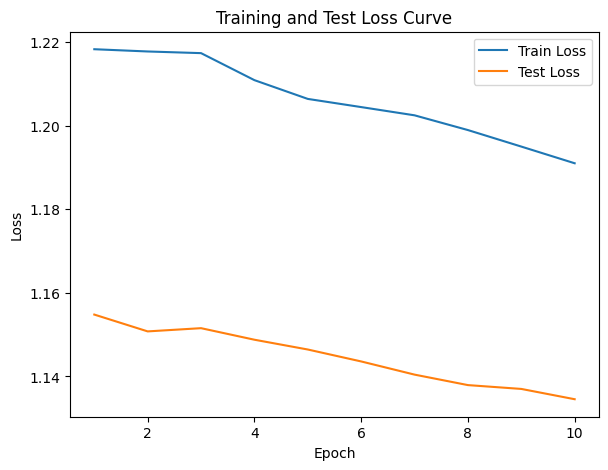

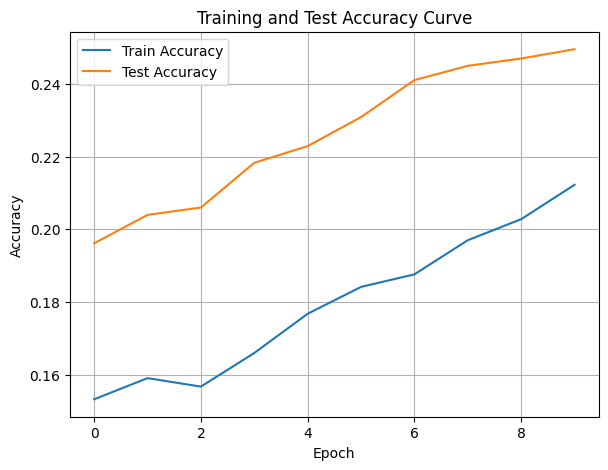

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.82it/s]

Epoch [1/10], Train F1:0.38043831484154705, Train Loss: 1.1279, Train Acc: 0.3220, Test F1:0.20876745815260328, Test Loss: 1.1116, Test Acc: 0.1693


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.25it/s]

Epoch [2/10], Train F1:0.4087322440398279, Train Loss: 1.1133, Train Acc: 0.3534, Test F1:0.2081750768674263, Test Loss: 1.1160, Test Acc: 0.1584


Training Process:  30%|███       | 3/10 [00:00<00:01,  6.19it/s]

Epoch [3/10], Train F1:0.4253930877454851, Train Loss: 1.1082, Train Acc: 0.3708, Test F1:0.225028873123247, Test Loss: 1.1117, Test Acc: 0.1745


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.74it/s]

Epoch [4/10], Train F1:0.41392143296165307, Train Loss: 1.1071, Train Acc: 0.3676, Test F1:0.22676319490709898, Test Loss: 1.1130, Test Acc: 0.1751
Epoch [5/10], Train F1:0.4280952109322617, Train Loss: 1.1024, Train Acc: 0.3826, Test F1:0.2359476462356127, Test Loss: 1.1119, Test Acc: 0.1786


Training Process:  70%|███████   | 7/10 [00:01<00:00,  6.58it/s]

Epoch [6/10], Train F1:0.4322449875717511, Train Loss: 1.0975, Train Acc: 0.3896, Test F1:0.24897200020107577, Test Loss: 1.1104, Test Acc: 0.1862
Epoch [7/10], Train F1:0.436113971763148, Train Loss: 1.0952, Train Acc: 0.3947, Test F1:0.26494978292654503, Test Loss: 1.1082, Test Acc: 0.1983


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.07it/s]

Epoch [8/10], Train F1:0.449880432005484, Train Loss: 1.0893, Train Acc: 0.4082, Test F1:0.27308488036590683, Test Loss: 1.1059, Test Acc: 0.2064
Epoch [9/10], Train F1:0.457831373979568, Train Loss: 1.0859, Train Acc: 0.4150, Test F1:0.279955511755682, Test Loss: 1.1047, Test Acc: 0.2118


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.51it/s]


Epoch [10/10], Train F1:0.4665979689831241, Train Loss: 1.0818, Train Acc: 0.4238, Test F1:0.3006668979593751, Test Loss: 1.1017, Test Acc: 0.2277
Total Epochs: 10
Train loss start: 1.1136466264724731, Train loss end: 1.0104349851608276
Highest Mean Train Accuracy (over epoch): 0.4238392857142857
Test loss start: 1.1056147813796997, Test loss end: 1.071547031402588
Highest mean Test Accuracy (over epoch): 0.22769097222222223


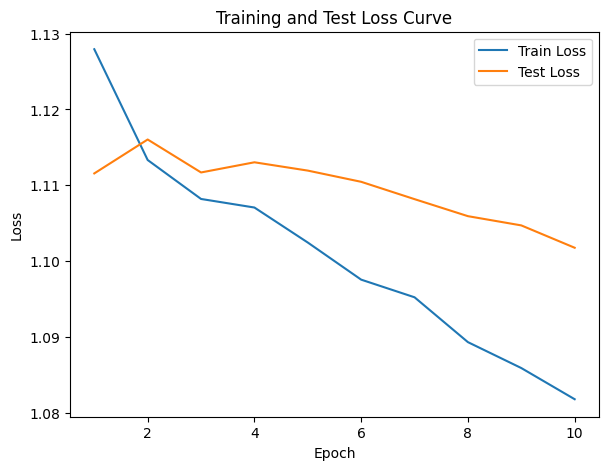

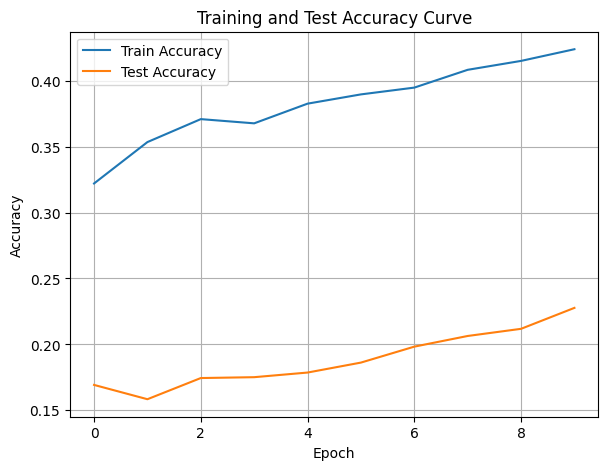

./saved_models/model_6.pth
Training Model with id 7
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.94it/s]

Epoch [1/10], Train F1:0.26423581943935603, Train Loss: 1.1715, Train Acc: 0.2140, Test F1:0.21740221031974383, Test Loss: 1.1258, Test Acc: 0.2101


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.76it/s]

Epoch [2/10], Train F1:0.2591184005116339, Train Loss: 1.1701, Train Acc: 0.1976, Test F1:0.2150284993255885, Test Loss: 1.1261, Test Acc: 0.2170


Training Process:  30%|███       | 3/10 [00:00<00:00,  8.63it/s]

Epoch [3/10], Train F1:0.2868466162810095, Train Loss: 1.1611, Train Acc: 0.2221, Test F1:0.23084213055616157, Test Loss: 1.1215, Test Acc: 0.2323


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.83it/s]

Epoch [4/10], Train F1:0.299222247270718, Train Loss: 1.1567, Train Acc: 0.2315, Test F1:0.23268670455350096, Test Loss: 1.1179, Test Acc: 0.2420


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.69it/s]

Epoch [5/10], Train F1:0.31021384610486313, Train Loss: 1.1529, Train Acc: 0.2411, Test F1:0.23754444319399118, Test Loss: 1.1164, Test Acc: 0.2446


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.97it/s]

Epoch [6/10], Train F1:0.3175393606102919, Train Loss: 1.1495, Train Acc: 0.2491, Test F1:0.2431768896427537, Test Loss: 1.1134, Test Acc: 0.2503


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.10it/s]

Epoch [7/10], Train F1:0.32262461398477865, Train Loss: 1.1464, Train Acc: 0.2557, Test F1:0.2438462936159033, Test Loss: 1.1123, Test Acc: 0.2532


Training Process:  80%|████████  | 8/10 [00:00<00:00,  7.50it/s]

Epoch [8/10], Train F1:0.3276474590402178, Train Loss: 1.1448, Train Acc: 0.2616, Test F1:0.25415403420244687, Test Loss: 1.1109, Test Acc: 0.2593


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.05it/s]

Epoch [9/10], Train F1:0.33743369609448154, Train Loss: 1.1414, Train Acc: 0.2709, Test F1:0.260684649700668, Test Loss: 1.1087, Test Acc: 0.2641


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.02it/s]


Epoch [10/10], Train F1:0.34322624440282806, Train Loss: 1.1385, Train Acc: 0.2765, Test F1:0.2718974265264617, Test Loss: 1.1058, Test Acc: 0.2718
Total Epochs: 10
Train loss start: 1.1624842882156372, Train loss end: 1.1429928541183472
Highest Mean Train Accuracy (over epoch): 0.27648809523809526
Test loss start: 1.1293256282806396, Test loss end: 1.0884590148925781
Highest mean Test Accuracy (over epoch): 0.2717881944444444


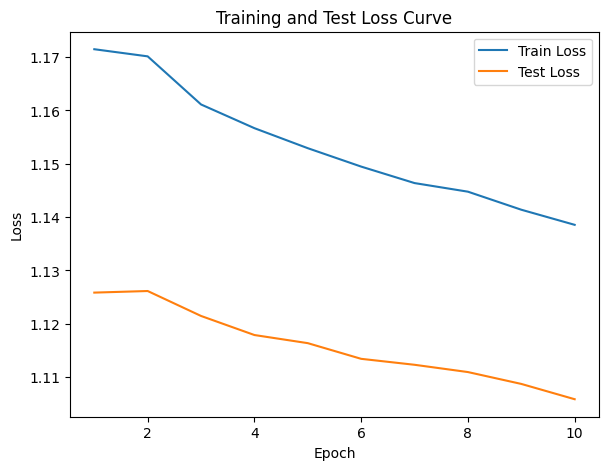

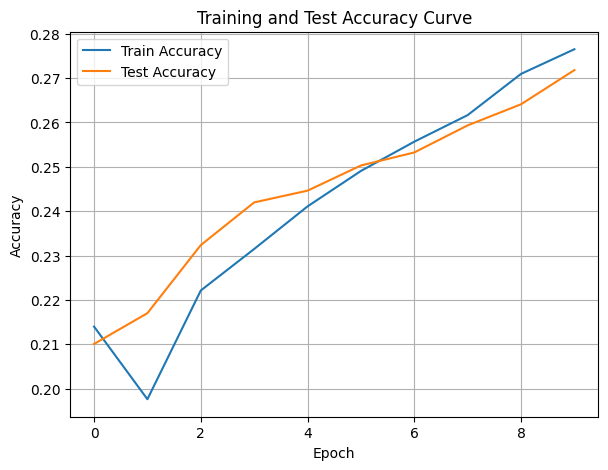

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.37681391253862584, Train Loss: 1.1080, Train Acc: 0.2932, Test F1:0.3861910415135584, Test Loss: 1.0995, Test Acc: 0.2769


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.18it/s]

Epoch [2/10], Train F1:0.39308308998026337, Train Loss: 1.1036, Train Acc: 0.3045, Test F1:0.3933147930934453, Test Loss: 1.0956, Test Acc: 0.2786


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.18it/s]

Epoch [3/10], Train F1:0.3987403669633534, Train Loss: 1.1013, Train Acc: 0.3125, Test F1:0.3933756600122639, Test Loss: 1.0954, Test Acc: 0.2847


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.19it/s]

Epoch [4/10], Train F1:0.4114231920430233, Train Loss: 1.0978, Train Acc: 0.3283, Test F1:0.38505105558656466, Test Loss: 1.0961, Test Acc: 0.2754


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.22it/s]

Epoch [5/10], Train F1:0.42604000717333496, Train Loss: 1.0921, Train Acc: 0.3421, Test F1:0.384893449537952, Test Loss: 1.0956, Test Acc: 0.2757


Training Process:  60%|██████    | 6/10 [00:00<00:00,  6.83it/s]

Epoch [6/10], Train F1:0.4357228580855454, Train Loss: 1.0895, Train Acc: 0.3527, Test F1:0.4041380507545921, Test Loss: 1.0939, Test Acc: 0.2943


Training Process:  70%|███████   | 7/10 [00:01<00:00,  5.52it/s]

Epoch [7/10], Train F1:0.44413239687001327, Train Loss: 1.0873, Train Acc: 0.3584, Test F1:0.42116633769169975, Test Loss: 1.0921, Test Acc: 0.3089


Training Process:  80%|████████  | 8/10 [00:01<00:00,  5.29it/s]

Epoch [8/10], Train F1:0.4498068683138226, Train Loss: 1.0850, Train Acc: 0.3639, Test F1:0.4416515701729615, Test Loss: 1.0888, Test Acc: 0.3290


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.25it/s]


Epoch [9/10], Train F1:0.4553664591400441, Train Loss: 1.0827, Train Acc: 0.3691, Test F1:0.45438203953875156, Test Loss: 1.0865, Test Acc: 0.3409
Epoch [10/10], Train F1:0.4673482632294816, Train Loss: 1.0785, Train Acc: 0.3797, Test F1:0.46877507299602145, Test Loss: 1.0840, Test Acc: 0.3556
Total Epochs: 10
Train loss start: 1.1424968242645264, Train loss end: 1.0057899951934814
Highest Mean Train Accuracy (over epoch): 0.3797321428571428
Test loss start: 1.0959209203720093, Test loss end: 1.037954330444336
Highest mean Test Accuracy (over epoch): 0.35564236111111114


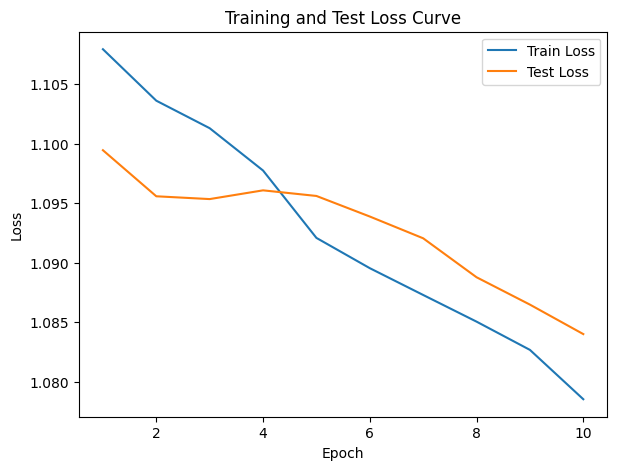

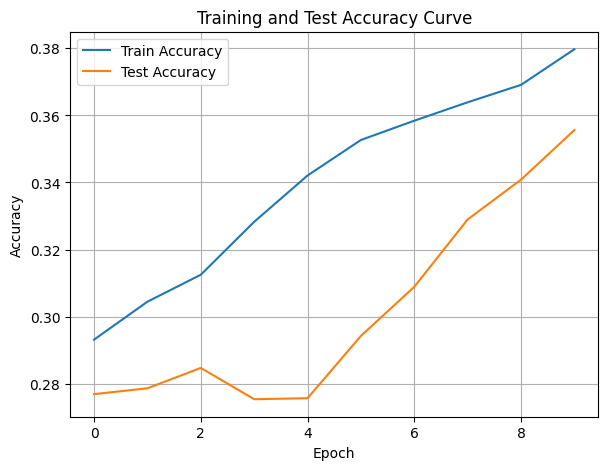

./saved_models/model_8.pth
Training Model with id 12
in multi


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.56it/s]

Epoch [1/10], Train F1:0.5470561249702354, Train Loss: 1.0489, Train Acc: 0.4851, Test F1:0.5705680827745705, Test Loss: 1.0617, Test Acc: 0.4809
Epoch [2/10], Train F1:0.5617174720661967, Train Loss: 1.0443, Train Acc: 0.4970, Test F1:0.5864359876210695, Test Loss: 1.0577, Test Acc: 0.4965


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.73it/s]

Epoch [3/10], Train F1:0.5747934644474129, Train Loss: 1.0386, Train Acc: 0.5086, Test F1:0.5977755054015264, Test Loss: 1.0562, Test Acc: 0.5064
Epoch [4/10], Train F1:0.588868148957454, Train Loss: 1.0300, Train Acc: 0.5251, Test F1:0.5967595495002149, Test Loss: 1.0548, Test Acc: 0.5074


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.01it/s]

Epoch [5/10], Train F1:0.6012098738304679, Train Loss: 1.0258, Train Acc: 0.5384, Test F1:0.5990432346921108, Test Loss: 1.0533, Test Acc: 0.5095
Epoch [6/10], Train F1:0.6019895727123453, Train Loss: 1.0248, Train Acc: 0.5415, Test F1:0.5963169361311776, Test Loss: 1.0518, Test Acc: 0.5214


Training Process:  70%|███████   | 7/10 [00:01<00:00,  6.46it/s]

Epoch [7/10], Train F1:0.6060609576465551, Train Loss: 1.0241, Train Acc: 0.5445, Test F1:0.6026880331101472, Test Loss: 1.0500, Test Acc: 0.5296


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.01it/s]

Epoch [8/10], Train F1:0.6104672869079296, Train Loss: 1.0214, Train Acc: 0.5500, Test F1:0.6224113792380257, Test Loss: 1.0474, Test Acc: 0.5522
Epoch [9/10], Train F1:0.6168839766038199, Train Loss: 1.0180, Train Acc: 0.5593, Test F1:0.639415046332887, Test Loss: 1.0453, Test Acc: 0.5732


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.16it/s]


Epoch [10/10], Train F1:0.6238707937397387, Train Loss: 1.0152, Train Acc: 0.5691, Test F1:0.656747008216211, Test Loss: 1.0440, Test Acc: 0.5918
Total Epochs: 10
Train loss start: 1.0270086526870728, Train loss end: 0.8952001929283142
Highest Mean Train Accuracy (over epoch): 0.5691071428571428
Test loss start: 1.0619151592254639, Test loss end: 1.0057810544967651
Highest mean Test Accuracy (over epoch): 0.5917534722222222


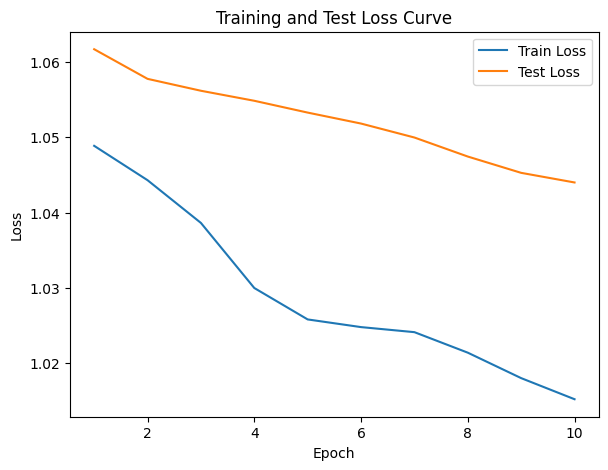

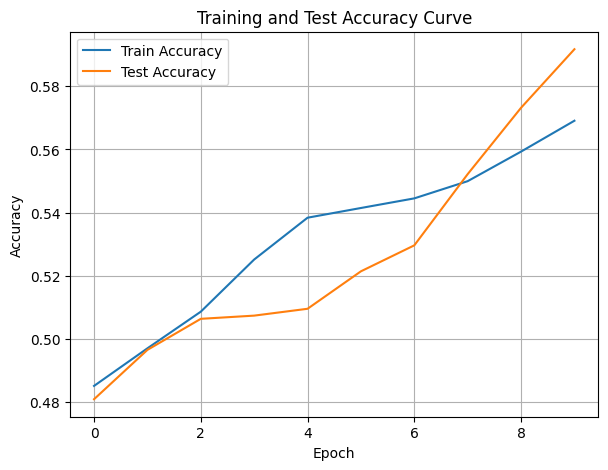

./saved_models/model_12.pth
Training Model with id 13
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.64it/s]

Epoch [1/10], Train F1:0.6999138476202696, Train Loss: 0.9728, Train Acc: 0.6601, Test F1:0.7637085236129796, Test Loss: 1.0254, Test Acc: 0.7491


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.64it/s]

Epoch [2/10], Train F1:0.7045696205075211, Train Loss: 0.9746, Train Acc: 0.6685, Test F1:0.7129149974674218, Test Loss: 1.0275, Test Acc: 0.6962


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.22it/s]

Epoch [3/10], Train F1:0.6992637706865948, Train Loss: 0.9733, Train Acc: 0.6668, Test F1:0.6978245614035088, Test Loss: 1.0262, Test Acc: 0.6858


Training Process:  30%|███       | 3/10 [00:00<00:00, 10.22it/s]

Epoch [4/10], Train F1:0.7140475959188954, Train Loss: 0.9679, Train Acc: 0.6810, Test F1:0.7229406850459482, Test Loss: 1.0210, Test Acc: 0.7114


Training Process:  50%|█████     | 5/10 [00:00<00:00,  9.91it/s]

Epoch [5/10], Train F1:0.71263062591349, Train Loss: 0.9660, Train Acc: 0.6805, Test F1:0.7304170614711167, Test Loss: 1.0183, Test Acc: 0.7205


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.23it/s]

Epoch [6/10], Train F1:0.7241756655702162, Train Loss: 0.9607, Train Acc: 0.6935, Test F1:0.7396566307298145, Test Loss: 1.0153, Test Acc: 0.7295


Training Process:  70%|███████   | 7/10 [00:00<00:00,  9.06it/s]

Epoch [7/10], Train F1:0.7265158596271528, Train Loss: 0.9589, Train Acc: 0.6963, Test F1:0.7339815237880001, Test Loss: 1.0139, Test Acc: 0.7238


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.26it/s]

Epoch [8/10], Train F1:0.7302035461033403, Train Loss: 0.9560, Train Acc: 0.7011, Test F1:0.7361576208903117, Test Loss: 1.0120, Test Acc: 0.7262


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.94it/s]

Epoch [9/10], Train F1:0.7335335614565276, Train Loss: 0.9532, Train Acc: 0.7045, Test F1:0.7453934872688883, Test Loss: 1.0098, Test Acc: 0.7364
Epoch [10/10], Train F1:0.7393568754581664, Train Loss: 0.9490, Train Acc: 0.7125, Test F1:0.7517656145770266, Test Loss: 1.0075, Test Acc: 0.7438


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.67it/s]


Total Epochs: 10
Train loss start: 0.9597833752632141, Train loss end: 0.8825265169143677
Highest Mean Train Accuracy (over epoch): 0.7125
Test loss start: 1.0301507711410522, Test loss end: 0.9533326029777527
Highest mean Test Accuracy (over epoch): 0.7491319444444444


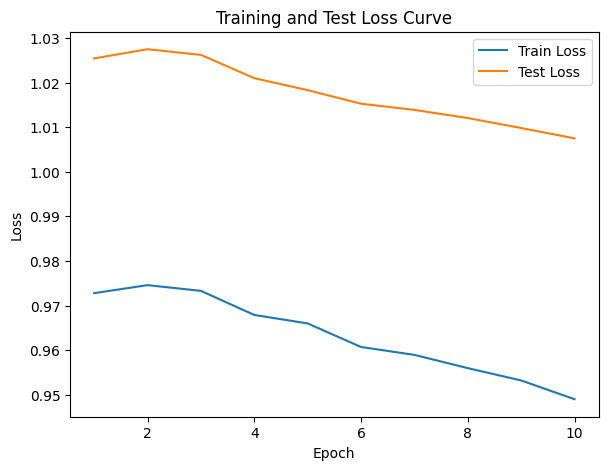

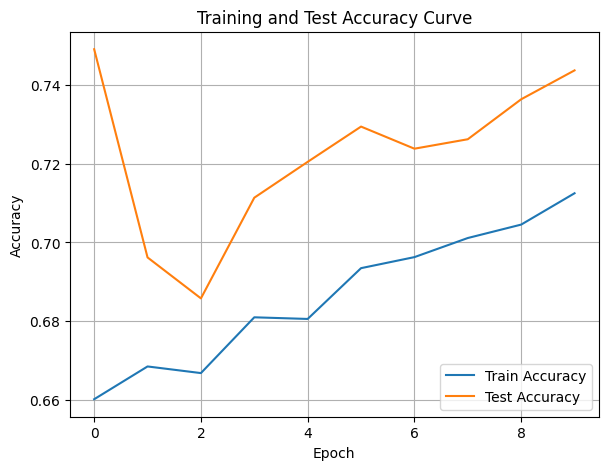

./saved_models/model_13.pth
Training Model with id 11
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.24it/s]

Epoch [1/10], Train F1:0.7839985673377589, Train Loss: 0.9217, Train Acc: 0.7726, Test F1:0.8070175438596493, Test Loss: 0.9818, Test Acc: 0.8099


Training Process:  20%|██        | 2/10 [00:00<00:00,  9.13it/s]

Epoch [2/10], Train F1:0.8008057207814795, Train Loss: 0.9091, Train Acc: 0.7899, Test F1:0.822886536027003, Test Loss: 0.9782, Test Acc: 0.8255


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.50it/s]

Epoch [3/10], Train F1:0.7921905342635065, Train Loss: 0.9086, Train Acc: 0.7807, Test F1:0.7863430480406624, Test Loss: 0.9752, Test Acc: 0.7850


Training Process:  40%|████      | 4/10 [00:00<00:01,  5.86it/s]

Epoch [4/10], Train F1:0.793325826651956, Train Loss: 0.9058, Train Acc: 0.7818, Test F1:0.7959046922862711, Test Loss: 0.9735, Test Acc: 0.7936


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.20it/s]

Epoch [5/10], Train F1:0.792829768102512, Train Loss: 0.9060, Train Acc: 0.7820, Test F1:0.7999861739784847, Test Loss: 0.9725, Test Acc: 0.7972


Training Process:  60%|██████    | 6/10 [00:01<00:00,  4.61it/s]

Epoch [6/10], Train F1:0.7947669558059101, Train Loss: 0.9022, Train Acc: 0.7864, Test F1:0.8013311665626288, Test Loss: 0.9703, Test Acc: 0.7983


Training Process:  70%|███████   | 7/10 [00:01<00:00,  4.12it/s]

Epoch [7/10], Train F1:0.7977173321136266, Train Loss: 0.8993, Train Acc: 0.7878, Test F1:0.8081842678591904, Test Loss: 0.9709, Test Acc: 0.8056


Training Process:  80%|████████  | 8/10 [00:01<00:00,  3.90it/s]

Epoch [8/10], Train F1:0.7998676750242466, Train Loss: 0.8968, Train Acc: 0.7920, Test F1:0.8126992571600892, Test Loss: 0.9698, Test Acc: 0.8117


Training Process: 100%|██████████| 10/10 [00:02<00:00,  4.89it/s]


Epoch [9/10], Train F1:0.8038110851465233, Train Loss: 0.8942, Train Acc: 0.7958, Test F1:0.818596859025406, Test Loss: 0.9671, Test Acc: 0.8183
Epoch [10/10], Train F1:0.8059781396486532, Train Loss: 0.8921, Train Acc: 0.7990, Test F1:0.8183687265715287, Test Loss: 0.9652, Test Acc: 0.8176
Total Epochs: 10
Train loss start: 0.9109984040260315, Train loss end: 0.9163264632225037
Highest Mean Train Accuracy (over epoch): 0.7990476190476191
Test loss start: 0.9844413995742798, Test loss end: 0.9169812798500061
Highest mean Test Accuracy (over epoch): 0.8255208333333334


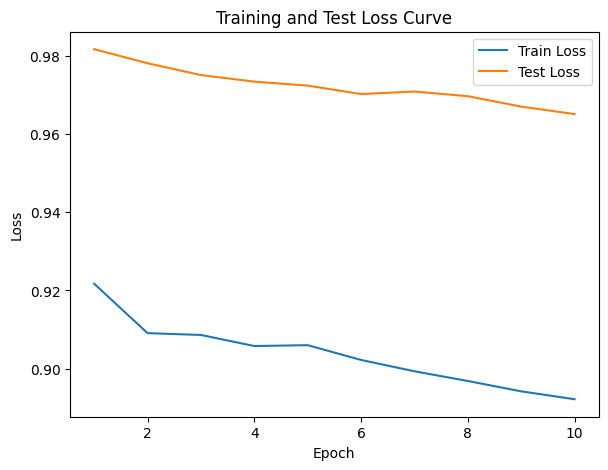

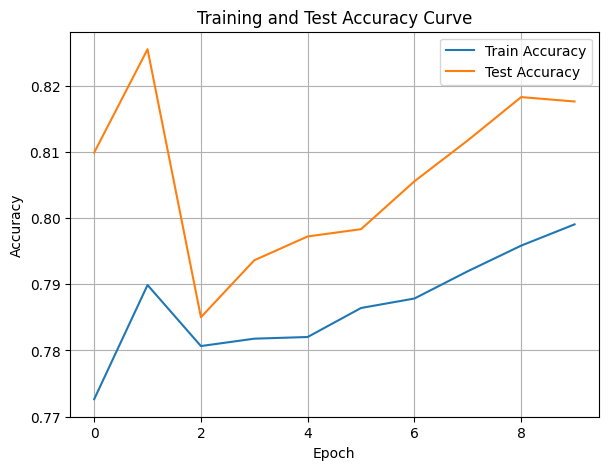

./saved_models/model_11.pth
Training Model with id 13
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.46it/s]

Epoch [1/10], Train F1:0.8611011743375792, Train Loss: 0.8614, Train Acc: 0.8369, Test F1:0.840027700831025, Test Loss: 0.9376, Test Acc: 0.8411


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.62it/s]

Epoch [2/10], Train F1:0.8442654447943848, Train Loss: 0.8657, Train Acc: 0.8213, Test F1:0.8286974344571165, Test Loss: 0.9444, Test Acc: 0.8264


Training Process:  30%|███       | 3/10 [00:00<00:01,  6.68it/s]

Epoch [3/10], Train F1:0.8397587328464772, Train Loss: 0.8592, Train Acc: 0.8235, Test F1:0.8411336032388663, Test Loss: 0.9466, Test Acc: 0.8411


Training Process:  40%|████      | 4/10 [00:00<00:01,  5.94it/s]

Epoch [4/10], Train F1:0.8443478704836382, Train Loss: 0.8539, Train Acc: 0.8319, Test F1:0.8369829629139632, Test Loss: 0.9456, Test Acc: 0.8357


Training Process:  50%|█████     | 5/10 [00:00<00:00,  5.46it/s]

Epoch [5/10], Train F1:0.8383834567930115, Train Loss: 0.8523, Train Acc: 0.8276, Test F1:0.8330400841664661, Test Loss: 0.9438, Test Acc: 0.8309


Training Process:  70%|███████   | 7/10 [00:01<00:00,  5.69it/s]

Epoch [6/10], Train F1:0.8408761148899057, Train Loss: 0.8505, Train Acc: 0.8330, Test F1:0.838536356781785, Test Loss: 0.9395, Test Acc: 0.8375
Epoch [7/10], Train F1:0.8414411505746399, Train Loss: 0.8496, Train Acc: 0.8333, Test F1:0.8402377003389516, Test Loss: 0.9368, Test Acc: 0.8392


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.51it/s]

Epoch [8/10], Train F1:0.8422865224784611, Train Loss: 0.8480, Train Acc: 0.8343, Test F1:0.8365639043628366, Test Loss: 0.9366, Test Acc: 0.8355
Epoch [9/10], Train F1:0.8422187524158249, Train Loss: 0.8446, Train Acc: 0.8361, Test F1:0.8361520017003665, Test Loss: 0.9348, Test Acc: 0.8353


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.32it/s]


Epoch [10/10], Train F1:0.841912745413356, Train Loss: 0.8425, Train Acc: 0.8373, Test F1:0.8366520501500266, Test Loss: 0.9324, Test Acc: 0.8359
Total Epochs: 10
Train loss start: 0.879141092300415, Train loss end: 0.739573061466217
Highest Mean Train Accuracy (over epoch): 0.8372619047619048
Test loss start: 0.9381537437438965, Test loss end: 0.8794386386871338
Highest mean Test Accuracy (over epoch): 0.8411458333333334


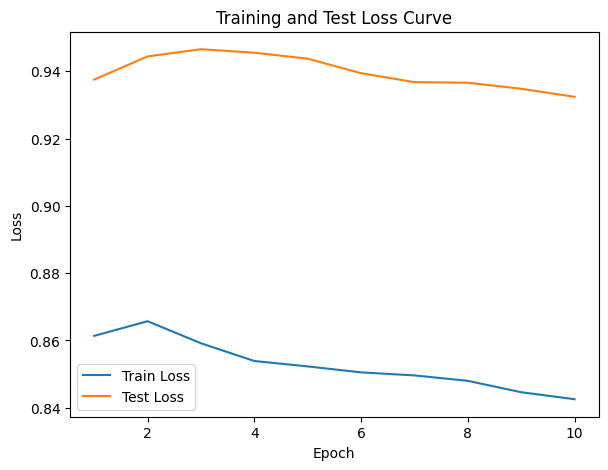

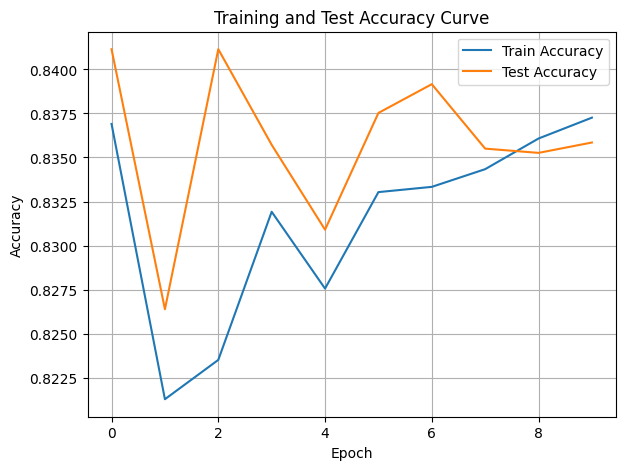

./saved_models/model_13.pth
Training Model with id 14
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  8.26it/s]

Epoch [1/10], Train F1:0.895524255330383, Train Loss: 0.8113, Train Acc: 0.8946, Test F1:0.8019150616821741, Test Loss: 0.9237, Test Acc: 0.8021


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.27it/s]

Epoch [2/10], Train F1:0.8823647440558856, Train Loss: 0.8097, Train Acc: 0.8859, Test F1:0.8263018657755501, Test Loss: 0.9200, Test Acc: 0.8255


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.27it/s]

Epoch [3/10], Train F1:0.8819785887709528, Train Loss: 0.8091, Train Acc: 0.8839, Test F1:0.8340848868021011, Test Loss: 0.9183, Test Acc: 0.8333


Training Process:  40%|████      | 4/10 [00:00<00:00,  9.54it/s]

Epoch [4/10], Train F1:0.8727125397241826, Train Loss: 0.8113, Train Acc: 0.8709, Test F1:0.8460347836714377, Test Loss: 0.9127, Test Acc: 0.8466


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.40it/s]

Epoch [5/10], Train F1:0.8761488648612853, Train Loss: 0.8088, Train Acc: 0.8759, Test F1:0.8517246963562753, Test Loss: 0.9104, Test Acc: 0.8530


Training Process:  70%|███████   | 7/10 [00:00<00:00,  6.62it/s]

Epoch [6/10], Train F1:0.876444917716089, Train Loss: 0.8081, Train Acc: 0.8762, Test F1:0.8513492006806784, Test Loss: 0.9095, Test Acc: 0.8523
Epoch [7/10], Train F1:0.8785068707153612, Train Loss: 0.8053, Train Acc: 0.8783, Test F1:0.8546568126828621, Test Loss: 0.9075, Test Acc: 0.8560


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.25it/s]

Epoch [8/10], Train F1:0.8787682410865605, Train Loss: 0.8036, Train Acc: 0.8785, Test F1:0.85609531052194, Test Loss: 0.9062, Test Acc: 0.8579
Epoch [9/10], Train F1:0.876877085761855, Train Loss: 0.8017, Train Acc: 0.8768, Test F1:0.8581437312876138, Test Loss: 0.9044, Test Acc: 0.8601


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.62it/s]


Epoch [10/10], Train F1:0.8765564239990672, Train Loss: 0.8006, Train Acc: 0.8758, Test F1:0.860621008776136, Test Loss: 0.9026, Test Acc: 0.8628
Total Epochs: 10
Train loss start: 0.8457920551300049, Train loss end: 0.8644819855690002
Highest Mean Train Accuracy (over epoch): 0.8946428571428572
Test loss start: 0.9237251877784729, Test loss end: 0.8603829145431519
Highest mean Test Accuracy (over epoch): 0.8627604166666668


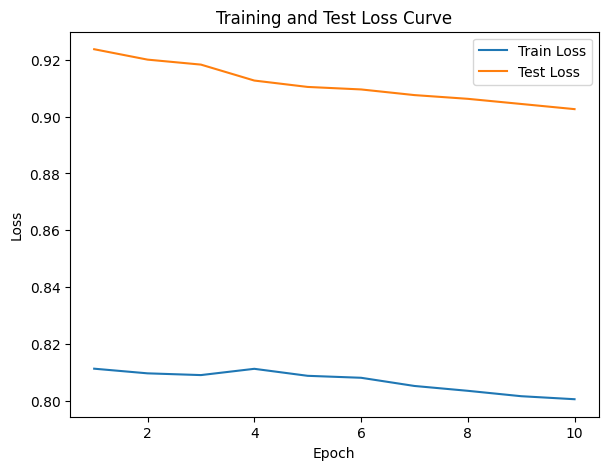

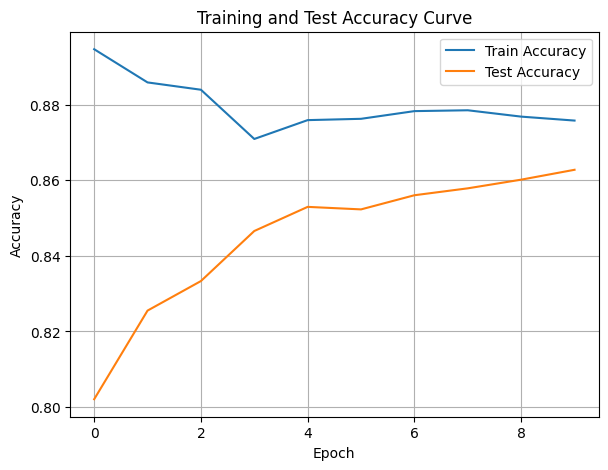

./saved_models/model_14.pth
Training Model with id 12
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.68it/s]

Epoch [1/10], Train F1:0.8578434054420979, Train Loss: 0.7968, Train Acc: 0.8518, Test F1:0.8411336032388664, Test Loss: 0.8930, Test Acc: 0.8411


Training Process:  20%|██        | 2/10 [00:00<00:01,  6.64it/s]

Epoch [2/10], Train F1:0.8749131570184202, Train Loss: 0.7847, Train Acc: 0.8749, Test F1:0.8536240620966121, Test Loss: 0.8879, Test Acc: 0.8529


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.21it/s]

Epoch [3/10], Train F1:0.8739265590329418, Train Loss: 0.7822, Train Acc: 0.8738, Test F1:0.8633867777996987, Test Loss: 0.8805, Test Acc: 0.8640


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.28it/s]

Epoch [4/10], Train F1:0.8750166649817703, Train Loss: 0.7799, Train Acc: 0.8749, Test F1:0.8661850705194357, Test Loss: 0.8789, Test Acc: 0.8676


Training Process:  50%|█████     | 5/10 [00:00<00:00,  6.88it/s]

Epoch [5/10], Train F1:0.8755985424450171, Train Loss: 0.7768, Train Acc: 0.8770, Test F1:0.8628276212152067, Test Loss: 0.8792, Test Acc: 0.8639


Training Process:  60%|██████    | 6/10 [00:00<00:00,  6.69it/s]

Epoch [6/10], Train F1:0.8797980328612639, Train Loss: 0.7734, Train Acc: 0.8818, Test F1:0.8647853957264143, Test Loss: 0.8780, Test Acc: 0.8663


Training Process:  70%|███████   | 7/10 [00:01<00:00,  6.85it/s]

Epoch [7/10], Train F1:0.8832348603777175, Train Loss: 0.7709, Train Acc: 0.8838, Test F1:0.8672361032721575, Test Loss: 0.8748, Test Acc: 0.8692


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.07it/s]

Epoch [8/10], Train F1:0.8803095214656927, Train Loss: 0.7705, Train Acc: 0.8801, Test F1:0.8678891639417957, Test Loss: 0.8705, Test Acc: 0.8703


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  6.73it/s]

Epoch [9/10], Train F1:0.8789083810586177, Train Loss: 0.7692, Train Acc: 0.8778, Test F1:0.8686355528460792, Test Loss: 0.8691, Test Acc: 0.8712


Training Process: 100%|██████████| 10/10 [00:01<00:00,  6.83it/s]


Epoch [10/10], Train F1:0.8817391832974005, Train Loss: 0.7670, Train Acc: 0.8813, Test F1:0.8658677313242783, Test Loss: 0.8691, Test Acc: 0.8682
Total Epochs: 10
Train loss start: 0.874006986618042, Train loss end: 0.6611990928649902
Highest Mean Train Accuracy (over epoch): 0.8838010204081632
Test loss start: 0.889179527759552, Test loss end: 0.8458567261695862
Highest mean Test Accuracy (over epoch): 0.8712384259259259


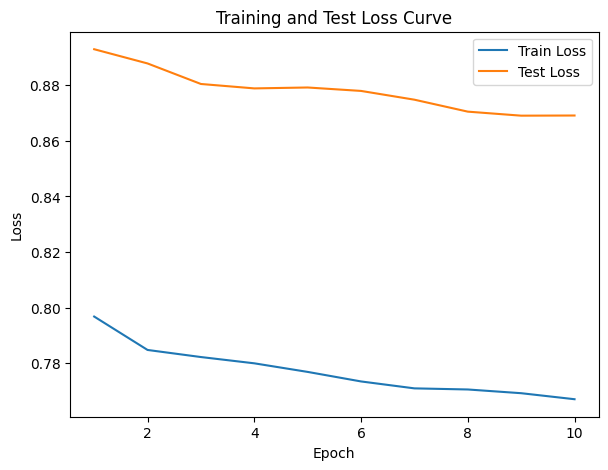

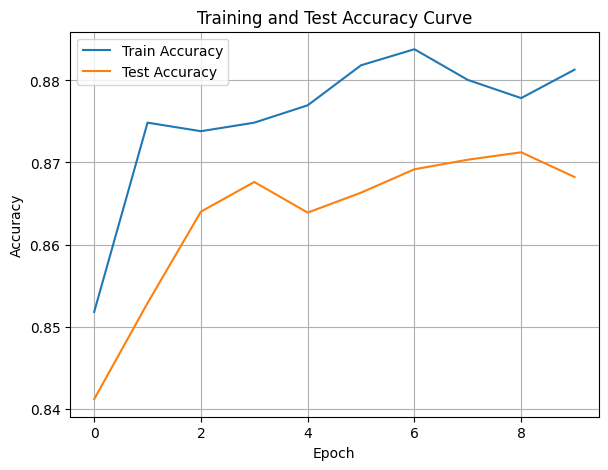

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.8885934778995074, Train Loss: 0.7549, Train Acc: 0.8884, Test F1:0.8411336032388664, Test Loss: 0.8568, Test Acc: 0.8411


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.93it/s]

Epoch [2/10], Train F1:0.8867189637116718, Train Loss: 0.7515, Train Acc: 0.8863, Test F1:0.8619891929367443, Test Loss: 0.8545, Test Acc: 0.8637


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.82it/s]

Epoch [3/10], Train F1:0.8860921180457103, Train Loss: 0.7551, Train Acc: 0.8856, Test F1:0.8550159409272259, Test Loss: 0.8573, Test Acc: 0.8562
Epoch [4/10], Train F1:0.889264652052829, Train Loss: 0.7526, Train Acc: 0.8884, Test F1:0.8617245728700837, Test Loss: 0.8518, Test Acc: 0.8637


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.63it/s]

Epoch [5/10], Train F1:0.8891696038701123, Train Loss: 0.7511, Train Acc: 0.8869, Test F1:0.8619536355784065, Test Loss: 0.8466, Test Acc: 0.8651
Epoch [6/10], Train F1:0.8878145835514191, Train Loss: 0.7490, Train Acc: 0.8858, Test F1:0.8652759445636032, Test Loss: 0.8433, Test Acc: 0.8686


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.13it/s]

Epoch [7/10], Train F1:0.8892196351966466, Train Loss: 0.7466, Train Acc: 0.8863, Test F1:0.8666128125177837, Test Loss: 0.8422, Test Acc: 0.8700
Epoch [8/10], Train F1:0.8901627316192959, Train Loss: 0.7448, Train Acc: 0.8882, Test F1:0.8676145982153721, Test Loss: 0.8423, Test Acc: 0.8711


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.76it/s]


Epoch [9/10], Train F1:0.8871117185423512, Train Loss: 0.7452, Train Acc: 0.8855, Test F1:0.8692059412453172, Test Loss: 0.8402, Test Acc: 0.8728
Epoch [10/10], Train F1:0.8865909212764798, Train Loss: 0.7436, Train Acc: 0.8851, Test F1:0.8704802660650742, Test Loss: 0.8378, Test Acc: 0.8741
Total Epochs: 10
Train loss start: 0.802764892578125, Train loss end: 0.7239643931388855
Highest Mean Train Accuracy (over epoch): 0.8883928571428572
Test loss start: 0.8504390716552734, Test loss end: 0.7945445775985718
Highest mean Test Accuracy (over epoch): 0.8741319444444443


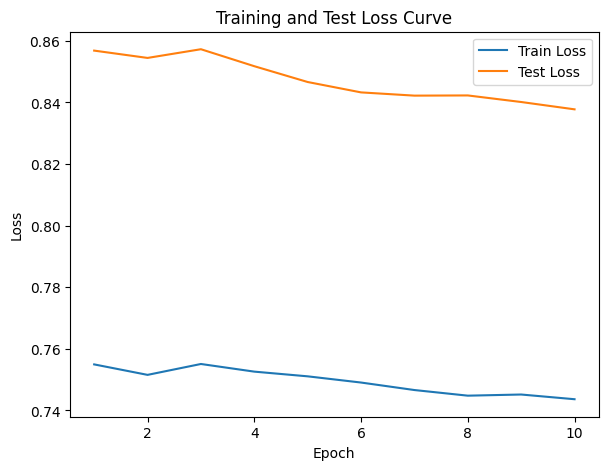

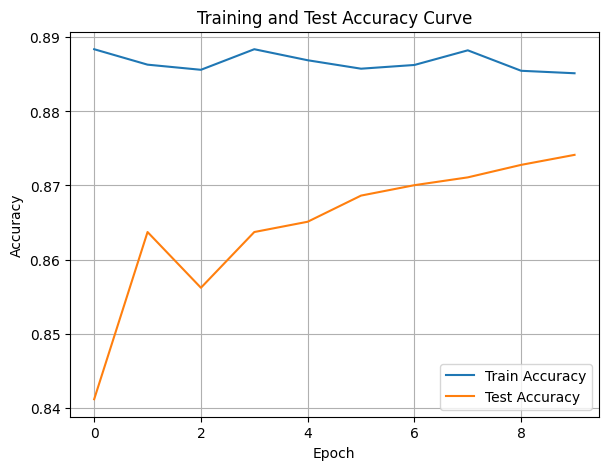

./saved_models/model_10.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [63]:
DTEmlp8b.train_DTE()

Training Process:   1%|          | 1/150 [00:00<00:26,  5.54it/s]

Epoch [1/150], Train F1:0.4012936937363596, Train Loss: 1.1130, Train Acc: 0.3607, Test F1:0.32930743147461417, Test Loss: 1.1134, Test Acc: 0.2630


Training Process:   1%|▏         | 2/150 [00:00<00:38,  3.89it/s]

Epoch [2/150], Train F1:0.41196708372437596, Train Loss: 1.1076, Train Acc: 0.3717, Test F1:0.32980406795043515, Test Loss: 1.1102, Test Acc: 0.2561


Training Process:   3%|▎         | 4/150 [00:00<00:32,  4.55it/s]

Epoch [3/150], Train F1:0.41517290273686275, Train Loss: 1.1037, Train Acc: 0.3765, Test F1:0.339667901425117, Test Loss: 1.1088, Test Acc: 0.2616
Epoch [4/150], Train F1:0.43338413321316527, Train Loss: 1.0975, Train Acc: 0.3955, Test F1:0.3469595948173928, Test Loss: 1.1076, Test Acc: 0.2713


Training Process:   3%|▎         | 5/150 [00:01<00:31,  4.53it/s]

Epoch [5/150], Train F1:0.440566608749188, Train Loss: 1.0971, Train Acc: 0.4029, Test F1:0.3845522383346042, Test Loss: 1.1045, Test Acc: 0.3123


Training Process:   4%|▍         | 6/150 [00:01<00:30,  4.69it/s]

Epoch [6/150], Train F1:0.45101557090865485, Train Loss: 1.0936, Train Acc: 0.4145, Test F1:0.3979693241819145, Test Loss: 1.1027, Test Acc: 0.3247


Training Process:   5%|▌         | 8/150 [00:01<00:27,  5.16it/s]

Epoch [7/150], Train F1:0.4605037988861423, Train Loss: 1.0890, Train Acc: 0.4265, Test F1:0.42186970368231375, Test Loss: 1.0998, Test Acc: 0.3542
Epoch [8/150], Train F1:0.4694011489558212, Train Loss: 1.0846, Train Acc: 0.4398, Test F1:0.43349334274662665, Test Loss: 1.0976, Test Acc: 0.3714


Training Process:   7%|▋         | 10/150 [00:02<00:24,  5.79it/s]

Epoch [9/150], Train F1:0.47582206279186257, Train Loss: 1.0821, Train Acc: 0.4480, Test F1:0.4557194395090737, Test Loss: 1.0947, Test Acc: 0.3992
Epoch [10/150], Train F1:0.4856967738370798, Train Loss: 1.0790, Train Acc: 0.4576, Test F1:0.4788207638735483, Test Loss: 1.0921, Test Acc: 0.4291


Training Process:   8%|▊         | 12/150 [00:02<00:20,  6.64it/s]

Epoch [11/150], Train F1:0.49401307914145304, Train Loss: 1.0757, Train Acc: 0.4669, Test F1:0.4927066092905219, Test Loss: 1.0899, Test Acc: 0.4507
Epoch [12/150], Train F1:0.4966227487692689, Train Loss: 1.0741, Train Acc: 0.4714, Test F1:0.5123895662112272, Test Loss: 1.0874, Test Acc: 0.4744


Training Process:   9%|▉         | 14/150 [00:02<00:19,  7.06it/s]

Epoch [13/150], Train F1:0.5031795990013268, Train Loss: 1.0714, Train Acc: 0.4803, Test F1:0.5246942738073118, Test Loss: 1.0852, Test Acc: 0.4910
Epoch [14/150], Train F1:0.5078277717197673, Train Loss: 1.0681, Train Acc: 0.4892, Test F1:0.5358470456223685, Test Loss: 1.0821, Test Acc: 0.5069


Training Process:  11%|█         | 16/150 [00:02<00:19,  6.98it/s]

Epoch [15/150], Train F1:0.5108315243567692, Train Loss: 1.0651, Train Acc: 0.4950, Test F1:0.5444434499947558, Test Loss: 1.0799, Test Acc: 0.5201
Epoch [16/150], Train F1:0.5175222468809667, Train Loss: 1.0621, Train Acc: 0.5030, Test F1:0.5531161529964692, Test Loss: 1.0774, Test Acc: 0.5327


Training Process:  11%|█▏        | 17/150 [00:02<00:19,  6.96it/s]

Epoch [17/150], Train F1:0.5226772945158892, Train Loss: 1.0592, Train Acc: 0.5100, Test F1:0.5662488600803477, Test Loss: 1.0754, Test Acc: 0.5472


Training Process:  13%|█▎        | 19/150 [00:03<00:20,  6.41it/s]

Epoch [18/150], Train F1:0.5293573879440849, Train Loss: 1.0556, Train Acc: 0.5191, Test F1:0.5768437568590123, Test Loss: 1.0735, Test Acc: 0.5597
Epoch [19/150], Train F1:0.5348494291431741, Train Loss: 1.0528, Train Acc: 0.5262, Test F1:0.5881350426818609, Test Loss: 1.0714, Test Acc: 0.5720


Training Process:  14%|█▍        | 21/150 [00:03<00:19,  6.66it/s]

Epoch [20/150], Train F1:0.5415640937546224, Train Loss: 1.0500, Train Acc: 0.5338, Test F1:0.5971129549862317, Test Loss: 1.0692, Test Acc: 0.5828
Epoch [21/150], Train F1:0.54598964828999, Train Loss: 1.0472, Train Acc: 0.5398, Test F1:0.6061673919746067, Test Loss: 1.0672, Test Acc: 0.5928


Training Process:  15%|█▍        | 22/150 [00:03<00:20,  6.27it/s]

Epoch [22/150], Train F1:0.5521753667503875, Train Loss: 1.0437, Train Acc: 0.5466, Test F1:0.6133749082301034, Test Loss: 1.0650, Test Acc: 0.6016
Epoch [23/150], Train F1:0.5579732055290991, Train Loss: 1.0411, Train Acc: 0.5520, Test F1:0.621487206306853, Test Loss: 1.0626, Test Acc: 0.6107


Training Process:  17%|█▋        | 25/150 [00:04<00:20,  6.03it/s]

Epoch [24/150], Train F1:0.564031030409684, Train Loss: 1.0377, Train Acc: 0.5592, Test F1:0.6291179558223303, Test Loss: 1.0603, Test Acc: 0.6190
Epoch [25/150], Train F1:0.5685439787284342, Train Loss: 1.0347, Train Acc: 0.5644, Test F1:0.6352742241564018, Test Loss: 1.0582, Test Acc: 0.6263


Training Process:  18%|█▊        | 27/150 [00:04<00:18,  6.51it/s]

Epoch [26/150], Train F1:0.5720973049138699, Train Loss: 1.0321, Train Acc: 0.5686, Test F1:0.6414489161601608, Test Loss: 1.0558, Test Acc: 0.6334
Epoch [27/150], Train F1:0.5777080225586858, Train Loss: 1.0291, Train Acc: 0.5745, Test F1:0.6471275771852233, Test Loss: 1.0533, Test Acc: 0.6399


Training Process:  19%|█▉        | 29/150 [00:04<00:17,  6.86it/s]

Epoch [28/150], Train F1:0.5812773620315288, Train Loss: 1.0266, Train Acc: 0.5782, Test F1:0.6528532298986908, Test Loss: 1.0505, Test Acc: 0.6463
Epoch [29/150], Train F1:0.5855984238736097, Train Loss: 1.0236, Train Acc: 0.5831, Test F1:0.659080235995975, Test Loss: 1.0484, Test Acc: 0.6529


Training Process:  21%|██        | 31/150 [00:05<00:19,  6.01it/s]

Epoch [30/150], Train F1:0.5900647414149366, Train Loss: 1.0210, Train Acc: 0.5875, Test F1:0.6644046010067618, Test Loss: 1.0462, Test Acc: 0.6587
Epoch [31/150], Train F1:0.5947485526146881, Train Loss: 1.0189, Train Acc: 0.5921, Test F1:0.6699577732598407, Test Loss: 1.0440, Test Acc: 0.6645


Training Process:  21%|██▏       | 32/150 [00:05<00:21,  5.62it/s]

Epoch [32/150], Train F1:0.5978010906044998, Train Loss: 1.0164, Train Acc: 0.5961, Test F1:0.6764339502584674, Test Loss: 1.0422, Test Acc: 0.6705


Training Process:  22%|██▏       | 33/150 [00:05<00:23,  5.08it/s]

Epoch [33/150], Train F1:0.6023617591879507, Train Loss: 1.0137, Train Acc: 0.6004, Test F1:0.6823803543234054, Test Loss: 1.0401, Test Acc: 0.6763


Training Process:  23%|██▎       | 34/150 [00:05<00:24,  4.77it/s]

Epoch [34/150], Train F1:0.6055495725354372, Train Loss: 1.0109, Train Acc: 0.6041, Test F1:0.6875527910506899, Test Loss: 1.0378, Test Acc: 0.6816


Training Process:  23%|██▎       | 35/150 [00:06<00:23,  4.82it/s]

Epoch [35/150], Train F1:0.6091750768277379, Train Loss: 1.0082, Train Acc: 0.6075, Test F1:0.6915275152767821, Test Loss: 1.0357, Test Acc: 0.6859


Training Process:  24%|██▍       | 36/150 [00:06<00:26,  4.25it/s]

Epoch [36/150], Train F1:0.6138565192125053, Train Loss: 1.0052, Train Acc: 0.6126, Test F1:0.6959730827531598, Test Loss: 1.0335, Test Acc: 0.6906


Training Process:  25%|██▍       | 37/150 [00:06<00:26,  4.25it/s]

Epoch [37/150], Train F1:0.6177128508408762, Train Loss: 1.0027, Train Acc: 0.6163, Test F1:0.7006232276657209, Test Loss: 1.0313, Test Acc: 0.6952


Training Process:  25%|██▌       | 38/150 [00:06<00:25,  4.40it/s]

Epoch [38/150], Train F1:0.621258114007738, Train Loss: 1.0004, Train Acc: 0.6198, Test F1:0.7045512726511399, Test Loss: 1.0294, Test Acc: 0.6994


Training Process:  26%|██▌       | 39/150 [00:07<00:25,  4.40it/s]

Epoch [39/150], Train F1:0.6249495463114435, Train Loss: 0.9977, Train Acc: 0.6236, Test F1:0.7076186884089343, Test Loss: 1.0272, Test Acc: 0.7029


Training Process:  27%|██▋       | 40/150 [00:07<00:27,  4.04it/s]

Epoch [40/150], Train F1:0.6283638666913118, Train Loss: 0.9951, Train Acc: 0.6272, Test F1:0.7102105494977042, Test Loss: 1.0248, Test Acc: 0.7059


Training Process:  27%|██▋       | 41/150 [00:07<00:25,  4.24it/s]

Epoch [41/150], Train F1:0.6317663834735651, Train Loss: 0.9926, Train Acc: 0.6305, Test F1:0.7135800005804671, Test Loss: 1.0225, Test Acc: 0.7096


Training Process:  29%|██▊       | 43/150 [00:07<00:21,  4.91it/s]

Epoch [42/150], Train F1:0.635920650322826, Train Loss: 0.9899, Train Acc: 0.6343, Test F1:0.7170713474282148, Test Loss: 1.0204, Test Acc: 0.7132
Epoch [43/150], Train F1:0.6391892080519969, Train Loss: 0.9872, Train Acc: 0.6378, Test F1:0.7203865646099507, Test Loss: 1.0186, Test Acc: 0.7167


Training Process:  30%|███       | 45/150 [00:08<00:18,  5.62it/s]

Epoch [44/150], Train F1:0.6428539510001362, Train Loss: 0.9842, Train Acc: 0.6416, Test F1:0.7232597596948814, Test Loss: 1.0165, Test Acc: 0.7199
Epoch [45/150], Train F1:0.6462203435264918, Train Loss: 0.9817, Train Acc: 0.6447, Test F1:0.7259961541833067, Test Loss: 1.0145, Test Acc: 0.7229


Training Process:  31%|███▏      | 47/150 [00:08<00:16,  6.20it/s]

Epoch [46/150], Train F1:0.6492503168065816, Train Loss: 0.9792, Train Acc: 0.6479, Test F1:0.7291350186054274, Test Loss: 1.0126, Test Acc: 0.7261
Epoch [47/150], Train F1:0.652899500660444, Train Loss: 0.9766, Train Acc: 0.6513, Test F1:0.7310959113573509, Test Loss: 1.0102, Test Acc: 0.7284


Training Process:  33%|███▎      | 49/150 [00:08<00:15,  6.56it/s]

Epoch [48/150], Train F1:0.6563183124959199, Train Loss: 0.9739, Train Acc: 0.6543, Test F1:0.7337281284393247, Test Loss: 1.0080, Test Acc: 0.7312
Epoch [49/150], Train F1:0.6597654605666426, Train Loss: 0.9713, Train Acc: 0.6578, Test F1:0.7357524267079998, Test Loss: 1.0057, Test Acc: 0.7335


Training Process:  34%|███▍      | 51/150 [00:09<00:15,  6.40it/s]

Epoch [50/150], Train F1:0.6631059468754191, Train Loss: 0.9688, Train Acc: 0.6609, Test F1:0.7381729148517304, Test Loss: 1.0036, Test Acc: 0.7361
Epoch [51/150], Train F1:0.6670553878949493, Train Loss: 0.9660, Train Acc: 0.6646, Test F1:0.740491815180593, Test Loss: 1.0014, Test Acc: 0.7386


Training Process:  35%|███▌      | 53/150 [00:09<00:15,  6.17it/s]

Epoch [52/150], Train F1:0.670216696469362, Train Loss: 0.9635, Train Acc: 0.6677, Test F1:0.7420249614362288, Test Loss: 0.9992, Test Acc: 0.7404
Epoch [53/150], Train F1:0.6738124178014714, Train Loss: 0.9609, Train Acc: 0.6711, Test F1:0.7446244013370791, Test Loss: 0.9973, Test Acc: 0.7430


Training Process:  37%|███▋      | 55/150 [00:09<00:16,  5.78it/s]

Epoch [54/150], Train F1:0.6766065679542598, Train Loss: 0.9584, Train Acc: 0.6740, Test F1:0.7471194659948887, Test Loss: 0.9953, Test Acc: 0.7455
Epoch [55/150], Train F1:0.6794173590225621, Train Loss: 0.9559, Train Acc: 0.6767, Test F1:0.7490853837213667, Test Loss: 0.9933, Test Acc: 0.7477


Training Process:  38%|███▊      | 57/150 [00:10<00:15,  5.91it/s]

Epoch [56/150], Train F1:0.6824215926283492, Train Loss: 0.9536, Train Acc: 0.6794, Test F1:0.7513988742071813, Test Loss: 0.9913, Test Acc: 0.7500
Epoch [57/150], Train F1:0.6854216293256491, Train Loss: 0.9515, Train Acc: 0.6820, Test F1:0.7532113192251586, Test Loss: 0.9893, Test Acc: 0.7520


Training Process:  39%|███▉      | 59/150 [00:10<00:15,  5.91it/s]

Epoch [58/150], Train F1:0.6883094453412743, Train Loss: 0.9490, Train Acc: 0.6849, Test F1:0.7557679909002093, Test Loss: 0.9875, Test Acc: 0.7544
Epoch [59/150], Train F1:0.691395397806145, Train Loss: 0.9467, Train Acc: 0.6878, Test F1:0.7578330569084305, Test Loss: 0.9857, Test Acc: 0.7565


Training Process:  41%|████      | 61/150 [00:10<00:15,  5.89it/s]

Epoch [60/150], Train F1:0.6941503333792433, Train Loss: 0.9443, Train Acc: 0.6903, Test F1:0.7600187478229027, Test Loss: 0.9839, Test Acc: 0.7587
Epoch [61/150], Train F1:0.6969372478425556, Train Loss: 0.9418, Train Acc: 0.6930, Test F1:0.7621269341467074, Test Loss: 0.9822, Test Acc: 0.7608


Training Process:  42%|████▏     | 63/150 [00:11<00:14,  5.85it/s]

Epoch [62/150], Train F1:0.6995112818988282, Train Loss: 0.9395, Train Acc: 0.6955, Test F1:0.7642149058412744, Test Loss: 0.9804, Test Acc: 0.7628
Epoch [63/150], Train F1:0.7020237494535165, Train Loss: 0.9372, Train Acc: 0.6980, Test F1:0.7665969914790702, Test Loss: 0.9788, Test Acc: 0.7650


Training Process:  43%|████▎     | 65/150 [00:11<00:14,  5.80it/s]

Epoch [64/150], Train F1:0.7041761669206811, Train Loss: 0.9350, Train Acc: 0.7002, Test F1:0.768846329262191, Test Loss: 0.9771, Test Acc: 0.7672
Epoch [65/150], Train F1:0.706874626992692, Train Loss: 0.9328, Train Acc: 0.7025, Test F1:0.7708919404287624, Test Loss: 0.9754, Test Acc: 0.7691


Training Process:  45%|████▍     | 67/150 [00:11<00:14,  5.81it/s]

Epoch [66/150], Train F1:0.7089780623988471, Train Loss: 0.9308, Train Acc: 0.7046, Test F1:0.7730426498951338, Test Loss: 0.9737, Test Acc: 0.7711
Epoch [67/150], Train F1:0.7114770837817603, Train Loss: 0.9287, Train Acc: 0.7069, Test F1:0.7749065518165311, Test Loss: 0.9718, Test Acc: 0.7730


Training Process:  45%|████▌     | 68/150 [00:12<00:14,  5.79it/s]

Epoch [68/150], Train F1:0.7137258539166315, Train Loss: 0.9266, Train Acc: 0.7090, Test F1:0.776711400429958, Test Loss: 0.9699, Test Acc: 0.7747


Training Process:  47%|████▋     | 70/150 [00:12<00:14,  5.69it/s]

Epoch [69/150], Train F1:0.7160264305914407, Train Loss: 0.9244, Train Acc: 0.7112, Test F1:0.7784599706574981, Test Loss: 0.9681, Test Acc: 0.7765
Epoch [70/150], Train F1:0.718212895536499, Train Loss: 0.9222, Train Acc: 0.7132, Test F1:0.7800353460203049, Test Loss: 0.9664, Test Acc: 0.7780


Training Process:  47%|████▋     | 71/150 [00:12<00:13,  5.66it/s]

Epoch [71/150], Train F1:0.7201939423619121, Train Loss: 0.9205, Train Acc: 0.7150, Test F1:0.7815215442615431, Test Loss: 0.9647, Test Acc: 0.7796


Training Process:  48%|████▊     | 72/150 [00:12<00:13,  5.62it/s]

Epoch [72/150], Train F1:0.722468293662119, Train Loss: 0.9185, Train Acc: 0.7172, Test F1:0.7831203923315639, Test Loss: 0.9630, Test Acc: 0.7812


Training Process:  49%|████▊     | 73/150 [00:12<00:13,  5.57it/s]

Epoch [73/150], Train F1:0.7244471320191517, Train Loss: 0.9165, Train Acc: 0.7193, Test F1:0.7847115205957085, Test Loss: 0.9616, Test Acc: 0.7827


Training Process:  49%|████▉     | 74/150 [00:13<00:15,  4.95it/s]

Epoch [74/150], Train F1:0.7265802170779989, Train Loss: 0.9145, Train Acc: 0.7214, Test F1:0.7862176975463872, Test Loss: 0.9600, Test Acc: 0.7842


Training Process:  50%|█████     | 75/150 [00:13<00:15,  4.83it/s]

Epoch [75/150], Train F1:0.7285174808965604, Train Loss: 0.9125, Train Acc: 0.7233, Test F1:0.7876809844995198, Test Loss: 0.9584, Test Acc: 0.7857


Training Process:  51%|█████     | 76/150 [00:13<00:15,  4.91it/s]

Epoch [76/150], Train F1:0.7304794135726241, Train Loss: 0.9106, Train Acc: 0.7250, Test F1:0.788770455463197, Test Loss: 0.9569, Test Acc: 0.7865


Training Process:  51%|█████▏    | 77/150 [00:13<00:15,  4.82it/s]

Epoch [77/150], Train F1:0.7326622964116759, Train Loss: 0.9085, Train Acc: 0.7271, Test F1:0.7901563406231819, Test Loss: 0.9553, Test Acc: 0.7879


Training Process:  52%|█████▏    | 78/150 [00:14<00:15,  4.51it/s]

Epoch [78/150], Train F1:0.7345097498548074, Train Loss: 0.9068, Train Acc: 0.7287, Test F1:0.791219378506333, Test Loss: 0.9534, Test Acc: 0.7891


Training Process:  53%|█████▎    | 79/150 [00:14<00:15,  4.48it/s]

Epoch [79/150], Train F1:0.7364589385583182, Train Loss: 0.9050, Train Acc: 0.7305, Test F1:0.7922542597175932, Test Loss: 0.9517, Test Acc: 0.7902


Training Process:  53%|█████▎    | 80/150 [00:14<00:15,  4.50it/s]

Epoch [80/150], Train F1:0.7384444096149284, Train Loss: 0.9031, Train Acc: 0.7323, Test F1:0.7935392998724199, Test Loss: 0.9503, Test Acc: 0.7915


Training Process:  54%|█████▍    | 81/150 [00:14<00:15,  4.58it/s]

Epoch [81/150], Train F1:0.7401149725151479, Train Loss: 0.9013, Train Acc: 0.7338, Test F1:0.7947906788957685, Test Loss: 0.9487, Test Acc: 0.7928


Training Process:  55%|█████▍    | 82/150 [00:15<00:16,  4.20it/s]

Epoch [82/150], Train F1:0.7417385026119112, Train Loss: 0.8995, Train Acc: 0.7354, Test F1:0.7960097062499936, Test Loss: 0.9472, Test Acc: 0.7940


Training Process:  55%|█████▌    | 83/150 [00:15<00:15,  4.37it/s]

Epoch [83/150], Train F1:0.7436177361581288, Train Loss: 0.8977, Train Acc: 0.7373, Test F1:0.7971976241552653, Test Loss: 0.9457, Test Acc: 0.7952


Training Process:  56%|█████▌    | 84/150 [00:15<00:14,  4.49it/s]

Epoch [84/150], Train F1:0.7453175700440692, Train Loss: 0.8959, Train Acc: 0.7390, Test F1:0.7984171158781931, Test Loss: 0.9444, Test Acc: 0.7964


Training Process:  57%|█████▋    | 85/150 [00:15<00:14,  4.62it/s]

Epoch [85/150], Train F1:0.7471663026296234, Train Loss: 0.8940, Train Acc: 0.7409, Test F1:0.7995450869405626, Test Loss: 0.9429, Test Acc: 0.7975


Training Process:  57%|█████▋    | 86/150 [00:15<00:13,  4.72it/s]

Epoch [86/150], Train F1:0.7487205443139647, Train Loss: 0.8925, Train Acc: 0.7422, Test F1:0.8006453547738804, Test Loss: 0.9413, Test Acc: 0.7987


Training Process:  58%|█████▊    | 87/150 [00:16<00:13,  4.77it/s]

Epoch [87/150], Train F1:0.7505984741489504, Train Loss: 0.8907, Train Acc: 0.7438, Test F1:0.8016798237223189, Test Loss: 0.9400, Test Acc: 0.7996


Training Process:  59%|█████▊    | 88/150 [00:16<00:12,  4.79it/s]

Epoch [88/150], Train F1:0.7522564069989014, Train Loss: 0.8890, Train Acc: 0.7454, Test F1:0.8027276503419079, Test Loss: 0.9385, Test Acc: 0.8007


Training Process:  59%|█████▉    | 89/150 [00:16<00:12,  4.81it/s]

Epoch [89/150], Train F1:0.7538268056399897, Train Loss: 0.8873, Train Acc: 0.7470, Test F1:0.8037506764364184, Test Loss: 0.9371, Test Acc: 0.8017


Training Process:  60%|██████    | 90/150 [00:16<00:12,  4.82it/s]

Epoch [90/150], Train F1:0.7556780365878931, Train Loss: 0.8854, Train Acc: 0.7488, Test F1:0.804870942784831, Test Loss: 0.9357, Test Acc: 0.8028


Training Process:  61%|██████    | 91/150 [00:16<00:12,  4.57it/s]

Epoch [91/150], Train F1:0.7571096633663502, Train Loss: 0.8836, Train Acc: 0.7503, Test F1:0.805806172109147, Test Loss: 0.9343, Test Acc: 0.8037


Training Process:  61%|██████▏   | 92/150 [00:17<00:12,  4.54it/s]

Epoch [92/150], Train F1:0.7583517838749081, Train Loss: 0.8820, Train Acc: 0.7516, Test F1:0.8067584543556059, Test Loss: 0.9330, Test Acc: 0.8047


Training Process:  62%|██████▏   | 93/150 [00:17<00:12,  4.58it/s]

Epoch [93/150], Train F1:0.7597832700114777, Train Loss: 0.8805, Train Acc: 0.7528, Test F1:0.8076892357904222, Test Loss: 0.9315, Test Acc: 0.8056


Training Process:  63%|██████▎   | 94/150 [00:17<00:12,  4.55it/s]

Epoch [94/150], Train F1:0.7613053730161438, Train Loss: 0.8788, Train Acc: 0.7544, Test F1:0.8085992380023425, Test Loss: 0.9301, Test Acc: 0.8066


Training Process:  63%|██████▎   | 95/150 [00:17<00:12,  4.57it/s]

Epoch [95/150], Train F1:0.7624969343902334, Train Loss: 0.8774, Train Acc: 0.7555, Test F1:0.8094891505822079, Test Loss: 0.9286, Test Acc: 0.8075


Training Process:  64%|██████▍   | 96/150 [00:18<00:11,  4.59it/s]

Epoch [96/150], Train F1:0.7638678800896511, Train Loss: 0.8757, Train Acc: 0.7570, Test F1:0.8105849804193106, Test Loss: 0.9274, Test Acc: 0.8086


Training Process:  65%|██████▍   | 97/150 [00:18<00:11,  4.54it/s]

Epoch [97/150], Train F1:0.7651019816280521, Train Loss: 0.8741, Train Acc: 0.7582, Test F1:0.8114340920795173, Test Loss: 0.9260, Test Acc: 0.8094


Training Process:  65%|██████▌   | 98/150 [00:18<00:11,  4.50it/s]

Epoch [98/150], Train F1:0.7663729612715704, Train Loss: 0.8726, Train Acc: 0.7595, Test F1:0.8123751684961099, Test Loss: 0.9247, Test Acc: 0.8104


Training Process:  66%|██████▌   | 99/150 [00:18<00:11,  4.47it/s]

Epoch [99/150], Train F1:0.767601788033737, Train Loss: 0.8711, Train Acc: 0.7607, Test F1:0.8132962091957143, Test Loss: 0.9234, Test Acc: 0.8113


Training Process:  67%|██████▋   | 100/150 [00:18<00:11,  4.25it/s]

Epoch [100/150], Train F1:0.7689936284248897, Train Loss: 0.8697, Train Acc: 0.7620, Test F1:0.8141978490515442, Test Loss: 0.9221, Test Acc: 0.8122


Training Process:  67%|██████▋   | 101/150 [00:19<00:11,  4.30it/s]

Epoch [101/150], Train F1:0.7702740262518915, Train Loss: 0.8682, Train Acc: 0.7633, Test F1:0.8149742508673832, Test Loss: 0.9208, Test Acc: 0.8130


Training Process:  68%|██████▊   | 102/150 [00:19<00:11,  4.31it/s]

Epoch [102/150], Train F1:0.7716806155575001, Train Loss: 0.8667, Train Acc: 0.7646, Test F1:0.8157347556765068, Test Loss: 0.9195, Test Acc: 0.8138


Training Process:  69%|██████▊   | 103/150 [00:19<00:10,  4.30it/s]

Epoch [103/150], Train F1:0.7728622940845891, Train Loss: 0.8653, Train Acc: 0.7657, Test F1:0.8164798476143266, Test Loss: 0.9181, Test Acc: 0.8146


Training Process:  69%|██████▉   | 104/150 [00:19<00:10,  4.33it/s]

Epoch [104/150], Train F1:0.7740593394614037, Train Loss: 0.8638, Train Acc: 0.7669, Test F1:0.8174161270365615, Test Loss: 0.9169, Test Acc: 0.8155


Training Process:  70%|███████   | 105/150 [00:20<00:10,  4.32it/s]

Epoch [105/150], Train F1:0.7753192892576469, Train Loss: 0.8624, Train Acc: 0.7682, Test F1:0.8182315842721112, Test Loss: 0.9156, Test Acc: 0.8163


Training Process:  71%|███████   | 106/150 [00:20<00:10,  4.28it/s]

Epoch [106/150], Train F1:0.7766592541200922, Train Loss: 0.8610, Train Acc: 0.7693, Test F1:0.8190308905138699, Test Loss: 0.9143, Test Acc: 0.8172


Training Process:  71%|███████▏  | 107/150 [00:20<00:10,  4.09it/s]

Epoch [107/150], Train F1:0.7777157994137442, Train Loss: 0.8596, Train Acc: 0.7704, Test F1:0.8197351620406417, Test Loss: 0.9132, Test Acc: 0.8178


Training Process:  72%|███████▏  | 108/150 [00:20<00:10,  4.11it/s]

Epoch [108/150], Train F1:0.778732013304122, Train Loss: 0.8583, Train Acc: 0.7714, Test F1:0.8205042903305216, Test Loss: 0.9119, Test Acc: 0.8186


Training Process:  73%|███████▎  | 109/150 [00:21<00:09,  4.12it/s]

Epoch [109/150], Train F1:0.7797437225665473, Train Loss: 0.8569, Train Acc: 0.7725, Test F1:0.821160812208555, Test Loss: 0.9106, Test Acc: 0.8193


Training Process:  73%|███████▎  | 110/150 [00:21<00:09,  4.12it/s]

Epoch [110/150], Train F1:0.7808774719332147, Train Loss: 0.8556, Train Acc: 0.7734, Test F1:0.8218049207680475, Test Loss: 0.9093, Test Acc: 0.8200


Training Process:  74%|███████▍  | 111/150 [00:21<00:09,  4.08it/s]

Epoch [111/150], Train F1:0.7819840271400428, Train Loss: 0.8542, Train Acc: 0.7746, Test F1:0.8224369652769027, Test Loss: 0.9080, Test Acc: 0.8206


Training Process:  75%|███████▍  | 112/150 [00:21<00:09,  4.04it/s]

Epoch [112/150], Train F1:0.7830679716706219, Train Loss: 0.8529, Train Acc: 0.7757, Test F1:0.8230572820037164, Test Loss: 0.9067, Test Acc: 0.8213


Training Process:  75%|███████▌  | 113/150 [00:22<00:09,  4.04it/s]

Epoch [113/150], Train F1:0.78429536125268, Train Loss: 0.8516, Train Acc: 0.7769, Test F1:0.8236661948177794, Test Loss: 0.9054, Test Acc: 0.8219


Training Process:  76%|███████▌  | 114/150 [00:22<00:09,  3.83it/s]

Epoch [114/150], Train F1:0.7852874942770756, Train Loss: 0.8503, Train Acc: 0.7779, Test F1:0.8243196688416816, Test Loss: 0.9043, Test Acc: 0.8226


Training Process:  77%|███████▋  | 115/150 [00:22<00:09,  3.88it/s]

Epoch [115/150], Train F1:0.78640251965351, Train Loss: 0.8490, Train Acc: 0.7789, Test F1:0.8249242464148164, Test Loss: 0.9032, Test Acc: 0.8231


Training Process:  77%|███████▋  | 116/150 [00:22<00:08,  3.95it/s]

Epoch [116/150], Train F1:0.7875366726873971, Train Loss: 0.8477, Train Acc: 0.7801, Test F1:0.8255538508363759, Test Loss: 0.9022, Test Acc: 0.8237


Training Process:  78%|███████▊  | 117/150 [00:23<00:08,  3.94it/s]

Epoch [117/150], Train F1:0.7886146303259666, Train Loss: 0.8464, Train Acc: 0.7811, Test F1:0.8261185445133652, Test Loss: 0.9010, Test Acc: 0.8243


Training Process:  79%|███████▊  | 118/150 [00:23<00:08,  3.79it/s]

Epoch [118/150], Train F1:0.7896380076808666, Train Loss: 0.8452, Train Acc: 0.7821, Test F1:0.8264724459884822, Test Loss: 0.9000, Test Acc: 0.8247


Training Process:  79%|███████▉  | 119/150 [00:23<00:08,  3.80it/s]

Epoch [119/150], Train F1:0.7905594455258043, Train Loss: 0.8440, Train Acc: 0.7831, Test F1:0.8271075745026879, Test Loss: 0.8988, Test Acc: 0.8253


Training Process:  80%|████████  | 120/150 [00:23<00:07,  3.79it/s]

Epoch [120/150], Train F1:0.7915729084222958, Train Loss: 0.8427, Train Acc: 0.7841, Test F1:0.8276437731343926, Test Loss: 0.8976, Test Acc: 0.8259


Training Process:  81%|████████  | 121/150 [00:24<00:08,  3.60it/s]

Epoch [121/150], Train F1:0.7925511434492757, Train Loss: 0.8416, Train Acc: 0.7850, Test F1:0.828170809401369, Test Loss: 0.8964, Test Acc: 0.8265


Training Process:  81%|████████▏ | 122/150 [00:24<00:07,  3.62it/s]

Epoch [122/150], Train F1:0.7933932227077753, Train Loss: 0.8405, Train Acc: 0.7858, Test F1:0.8286889163981362, Test Loss: 0.8952, Test Acc: 0.8270


Training Process:  82%|████████▏ | 123/150 [00:24<00:07,  3.67it/s]

Epoch [123/150], Train F1:0.7944989777772563, Train Loss: 0.8393, Train Acc: 0.7868, Test F1:0.8291983193711657, Test Loss: 0.8940, Test Acc: 0.8276


Training Process:  83%|████████▎ | 124/150 [00:25<00:07,  3.70it/s]

Epoch [124/150], Train F1:0.795535634338752, Train Loss: 0.8381, Train Acc: 0.7877, Test F1:0.8297154413198929, Test Loss: 0.8930, Test Acc: 0.8280


Training Process:  83%|████████▎ | 125/150 [00:25<00:06,  3.75it/s]

Epoch [125/150], Train F1:0.7965919646597953, Train Loss: 0.8369, Train Acc: 0.7888, Test F1:0.8302078930223744, Test Loss: 0.8918, Test Acc: 0.8286


Training Process:  84%|████████▍ | 126/150 [00:25<00:06,  3.77it/s]

Epoch [126/150], Train F1:0.7976918882403538, Train Loss: 0.8357, Train Acc: 0.7897, Test F1:0.8304334223139257, Test Loss: 0.8909, Test Acc: 0.8287


Training Process:  85%|████████▍ | 127/150 [00:25<00:06,  3.75it/s]

Epoch [127/150], Train F1:0.7986755579830538, Train Loss: 0.8345, Train Acc: 0.7908, Test F1:0.8308757685600114, Test Loss: 0.8900, Test Acc: 0.8292


Training Process:  85%|████████▌ | 128/150 [00:26<00:05,  3.75it/s]

Epoch [128/150], Train F1:0.7996302914340384, Train Loss: 0.8333, Train Acc: 0.7917, Test F1:0.8313464566703294, Test Loss: 0.8889, Test Acc: 0.8297


Training Process:  86%|████████▌ | 129/150 [00:26<00:05,  3.54it/s]

Epoch [129/150], Train F1:0.8002636159691532, Train Loss: 0.8322, Train Acc: 0.7923, Test F1:0.8318096274345234, Test Loss: 0.8879, Test Acc: 0.8302


Training Process:  87%|████████▋ | 130/150 [00:26<00:05,  3.58it/s]

Epoch [130/150], Train F1:0.8012327261964701, Train Loss: 0.8311, Train Acc: 0.7933, Test F1:0.8323460011112424, Test Loss: 0.8868, Test Acc: 0.8307


Training Process:  87%|████████▋ | 131/150 [00:27<00:05,  3.46it/s]

Epoch [131/150], Train F1:0.8020218610853418, Train Loss: 0.8300, Train Acc: 0.7941, Test F1:0.8327940111920993, Test Loss: 0.8857, Test Acc: 0.8312


Training Process:  88%|████████▊ | 132/150 [00:27<00:05,  3.42it/s]

Epoch [132/150], Train F1:0.8028142398338192, Train Loss: 0.8288, Train Acc: 0.7949, Test F1:0.8332350343210588, Test Loss: 0.8847, Test Acc: 0.8317


Training Process:  89%|████████▊ | 133/150 [00:27<00:04,  3.42it/s]

Epoch [133/150], Train F1:0.803634467030206, Train Loss: 0.8277, Train Acc: 0.7958, Test F1:0.8336342612357929, Test Loss: 0.8837, Test Acc: 0.8321


Training Process:  89%|████████▉ | 134/150 [00:28<00:05,  3.03it/s]

Epoch [134/150], Train F1:0.8043859595224312, Train Loss: 0.8267, Train Acc: 0.7965, Test F1:0.8340619537904987, Test Loss: 0.8826, Test Acc: 0.8326


Training Process:  90%|█████████ | 135/150 [00:28<00:05,  2.78it/s]

Epoch [135/150], Train F1:0.8052083603778882, Train Loss: 0.8257, Train Acc: 0.7973, Test F1:0.8345604565830622, Test Loss: 0.8816, Test Acc: 0.8331


Training Process:  91%|█████████ | 136/150 [00:29<00:06,  2.26it/s]

Epoch [136/150], Train F1:0.8058313972590985, Train Loss: 0.8247, Train Acc: 0.7980, Test F1:0.8349401097697594, Test Loss: 0.8807, Test Acc: 0.8335


Training Process:  91%|█████████▏| 137/150 [00:29<00:06,  2.06it/s]

Epoch [137/150], Train F1:0.8065072402054086, Train Loss: 0.8238, Train Acc: 0.7986, Test F1:0.8355004300014448, Test Loss: 0.8797, Test Acc: 0.8341


Training Process:  92%|█████████▏| 138/150 [00:30<00:06,  1.91it/s]

Epoch [138/150], Train F1:0.8074037783853413, Train Loss: 0.8226, Train Acc: 0.7996, Test F1:0.8359905309538926, Test Loss: 0.8788, Test Acc: 0.8346


Training Process:  93%|█████████▎| 139/150 [00:31<00:06,  1.72it/s]

Epoch [139/150], Train F1:0.8082909836061761, Train Loss: 0.8215, Train Acc: 0.8004, Test F1:0.8364596812574491, Test Loss: 0.8779, Test Acc: 0.8351


Training Process:  93%|█████████▎| 140/150 [00:31<00:06,  1.49it/s]

Epoch [140/150], Train F1:0.8088532270894426, Train Loss: 0.8207, Train Acc: 0.8010, Test F1:0.8368475920751243, Test Loss: 0.8768, Test Acc: 0.8355


Training Process:  94%|█████████▍| 141/150 [00:32<00:06,  1.43it/s]

Epoch [141/150], Train F1:0.8095174907963318, Train Loss: 0.8197, Train Acc: 0.8017, Test F1:0.8372564164209969, Test Loss: 0.8759, Test Acc: 0.8359


Training Process:  95%|█████████▍| 142/150 [00:33<00:05,  1.57it/s]

Epoch [142/150], Train F1:0.8101484705316304, Train Loss: 0.8187, Train Acc: 0.8024, Test F1:0.8376328939329506, Test Loss: 0.8749, Test Acc: 0.8363


Training Process:  95%|█████████▌| 143/150 [00:33<00:03,  1.84it/s]

Epoch [143/150], Train F1:0.8108612153681712, Train Loss: 0.8178, Train Acc: 0.8031, Test F1:0.8380039705440091, Test Loss: 0.8739, Test Acc: 0.8367


Training Process:  96%|█████████▌| 144/150 [00:33<00:02,  2.14it/s]

Epoch [144/150], Train F1:0.8116545475498765, Train Loss: 0.8168, Train Acc: 0.8039, Test F1:0.8381972286294636, Test Loss: 0.8732, Test Acc: 0.8369


Training Process:  97%|█████████▋| 145/150 [00:34<00:02,  2.39it/s]

Epoch [145/150], Train F1:0.8123658741653259, Train Loss: 0.8158, Train Acc: 0.8046, Test F1:0.8385715589118057, Test Loss: 0.8722, Test Acc: 0.8372


Training Process:  97%|█████████▋| 146/150 [00:34<00:02,  1.95it/s]

Epoch [146/150], Train F1:0.8128794741833859, Train Loss: 0.8149, Train Acc: 0.8052, Test F1:0.8389531423335471, Test Loss: 0.8714, Test Acc: 0.8376


Training Process:  98%|█████████▊| 147/150 [00:35<00:01,  1.76it/s]

Epoch [147/150], Train F1:0.8135663766906875, Train Loss: 0.8141, Train Acc: 0.8058, Test F1:0.8393043581565697, Test Loss: 0.8705, Test Acc: 0.8380


Training Process:  99%|█████████▊| 148/150 [00:36<00:01,  1.61it/s]

Epoch [148/150], Train F1:0.8141040676349878, Train Loss: 0.8132, Train Acc: 0.8063, Test F1:0.8397329997669141, Test Loss: 0.8697, Test Acc: 0.8385


Training Process:  99%|█████████▉| 149/150 [00:36<00:00,  1.57it/s]

Epoch [149/150], Train F1:0.8147640888604744, Train Loss: 0.8123, Train Acc: 0.8070, Test F1:0.839951046733252, Test Loss: 0.8690, Test Acc: 0.8387


Training Process: 100%|██████████| 150/150 [00:37<00:00,  3.99it/s]


Epoch [150/150], Train F1:0.8152885051579118, Train Loss: 0.8115, Train Acc: 0.8074, Test F1:0.8402880670887727, Test Loss: 0.8681, Test Acc: 0.8390
Total Epochs: 150
Train loss start: 1.1196783781051636, Train loss end: 0.8360914587974548
Highest Mean Train Accuracy (over epoch): 0.8074305555555555
Test loss start: 1.1029545068740845, Test loss end: 0.7141276001930237
Highest Mean Test Accuracy (over epoch): 0.8390393518518519


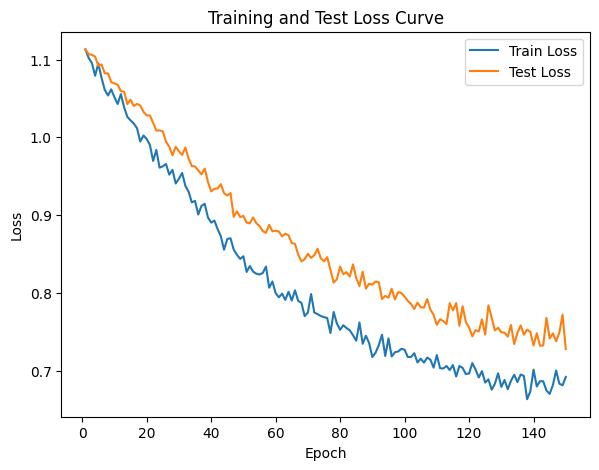

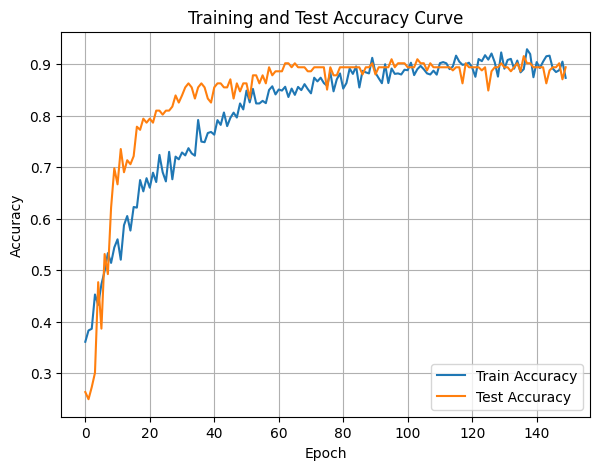

In [64]:
DTEmlp8b.train_single_model()

Randomly initializing 8 models
Training Model with id 1
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.51it/s]

Epoch [1/10], Train F1:0.49796750631740694, Train Loss: 1.0399, Train Acc: 0.4711, Test F1:0.4591249521997444, Test Loss: 1.0750, Test Acc: 0.4436
Epoch [2/10], Train F1:0.515018836863356, Train Loss: 1.0324, Train Acc: 0.4952, Test F1:0.4626081332363166, Test Loss: 1.0756, Test Acc: 0.4531


Training Process:  40%|████      | 4/10 [00:00<00:00,  8.74it/s]

Epoch [3/10], Train F1:0.522113961092779, Train Loss: 1.0268, Train Acc: 0.4997, Test F1:0.44066221559296354, Test Loss: 1.0788, Test Acc: 0.4433
Epoch [4/10], Train F1:0.5277724013831954, Train Loss: 1.0241, Train Acc: 0.5059, Test F1:0.4304107409145884, Test Loss: 1.0813, Test Acc: 0.4423


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.63it/s]

Epoch [5/10], Train F1:0.5391847998117597, Train Loss: 1.0202, Train Acc: 0.5201, Test F1:0.42885842569420246, Test Loss: 1.0811, Test Acc: 0.4429
Epoch [6/10], Train F1:0.5463106217521693, Train Loss: 1.0165, Train Acc: 0.5260, Test F1:0.42599408703408903, Test Loss: 1.0822, Test Acc: 0.4469


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.38it/s]

Epoch [7/10], Train F1:0.5528805550811254, Train Loss: 1.0146, Train Acc: 0.5312, Test F1:0.4361418626864851, Test Loss: 1.0805, Test Acc: 0.4576
Epoch [8/10], Train F1:0.5579776365934221, Train Loss: 1.0110, Train Acc: 0.5388, Test F1:0.4395361425824635, Test Loss: 1.0793, Test Acc: 0.4627


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.75it/s]


Epoch [9/10], Train F1:0.5664630311921122, Train Loss: 1.0080, Train Acc: 0.5485, Test F1:0.4482601753772138, Test Loss: 1.0770, Test Acc: 0.4710
Epoch [10/10], Train F1:0.5740403370771222, Train Loss: 1.0054, Train Acc: 0.5563, Test F1:0.45102050418750106, Test Loss: 1.0757, Test Acc: 0.4753
Total Epochs: 10
Train loss start: 1.0320180654525757, Train loss end: 1.0384916067123413
Highest Mean Train Accuracy (over epoch): 0.55625
Test loss start: 1.084351897239685, Test loss end: 1.0430618524551392
Highest mean Test Accuracy (over epoch): 0.47526041666666663


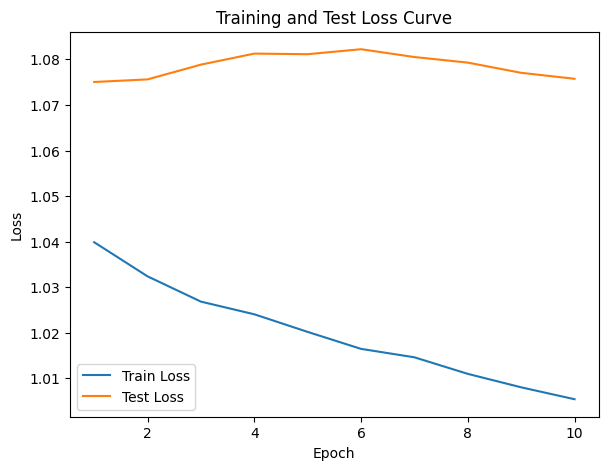

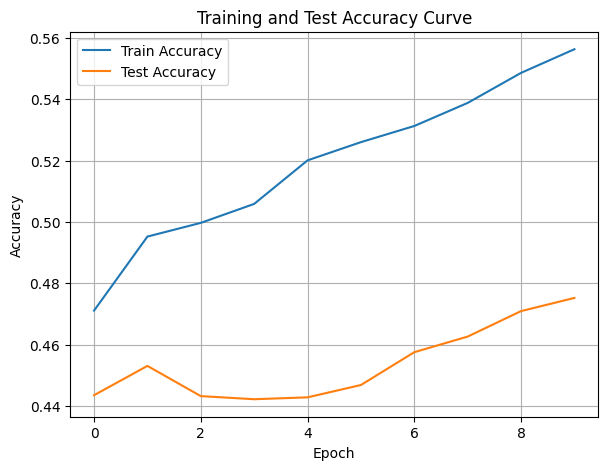

./saved_models/model_1.pth
Training Model with id 2
in multi


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch [1/10], Train F1:0.28582395785652914, Train Loss: 1.1409, Train Acc: 0.2690, Test F1:0.20042341510485553, Test Loss: 1.1094, Test Acc: 0.2587


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.21it/s]

Epoch [2/10], Train F1:0.2785461562247276, Train Loss: 1.1416, Train Acc: 0.2643, Test F1:0.18889028187829462, Test Loss: 1.1083, Test Acc: 0.2882


Training Process:  20%|██        | 2/10 [00:00<00:00, 10.21it/s]

Epoch [3/10], Train F1:0.27114147246444914, Train Loss: 1.1390, Train Acc: 0.2652, Test F1:0.19147253709035303, Test Loss: 1.1098, Test Acc: 0.2934


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.30it/s]

Epoch [4/10], Train F1:0.2684713021762222, Train Loss: 1.1387, Train Acc: 0.2627, Test F1:0.19373318676211673, Test Loss: 1.1097, Test Acc: 0.2980


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.30it/s]

Epoch [5/10], Train F1:0.27021683428049315, Train Loss: 1.1353, Train Acc: 0.2646, Test F1:0.20101077816707918, Test Loss: 1.1082, Test Acc: 0.3038


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.13it/s]

Epoch [6/10], Train F1:0.2743088170885467, Train Loss: 1.1336, Train Acc: 0.2716, Test F1:0.20621313108097758, Test Loss: 1.1067, Test Acc: 0.3113


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.13it/s]

Epoch [7/10], Train F1:0.2852454083405064, Train Loss: 1.1306, Train Acc: 0.2810, Test F1:0.21289090406100927, Test Loss: 1.1054, Test Acc: 0.3147


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.19it/s]

Epoch [8/10], Train F1:0.29750172533223573, Train Loss: 1.1281, Train Acc: 0.2906, Test F1:0.21655803338939145, Test Loss: 1.1031, Test Acc: 0.3210


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.19it/s]

Epoch [9/10], Train F1:0.3071143659120734, Train Loss: 1.1241, Train Acc: 0.2986, Test F1:0.2192360775323514, Test Loss: 1.1016, Test Acc: 0.3258


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.64it/s]


Epoch [10/10], Train F1:0.31395937651180456, Train Loss: 1.1207, Train Acc: 0.3066, Test F1:0.22427282246506627, Test Loss: 1.0994, Test Acc: 0.3297
Total Epochs: 10
Train loss start: 1.1925972700119019, Train loss end: 1.0559327602386475
Highest Mean Train Accuracy (over epoch): 0.30660714285714286
Test loss start: 1.1167961359024048, Test loss end: 1.0744744539260864
Highest mean Test Accuracy (over epoch): 0.3296875


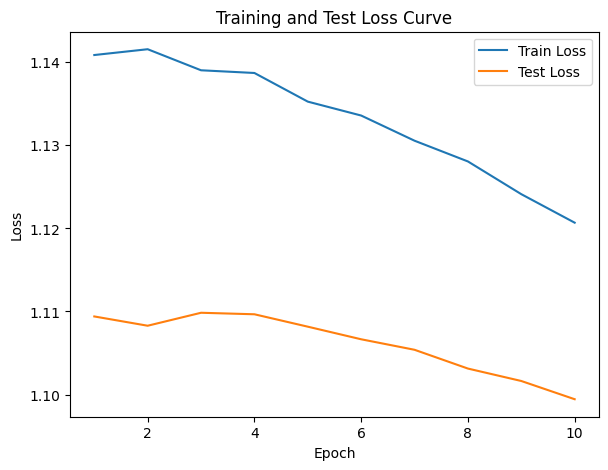

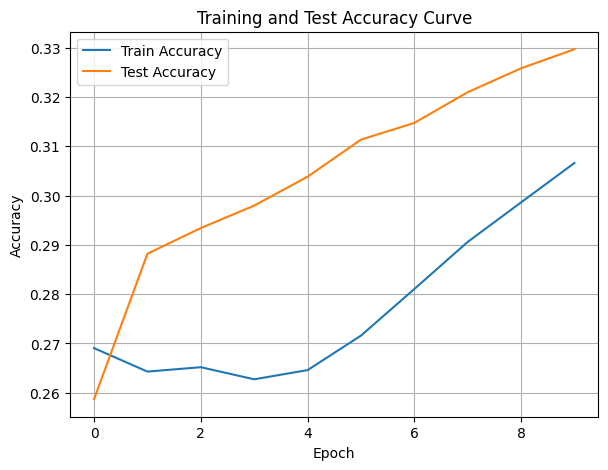

./saved_models/model_2.pth
Training Model with id 3
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.72it/s]

Epoch [1/10], Train F1:0.2796382412963778, Train Loss: 1.1822, Train Acc: 0.2473, Test F1:0.23698134224450018, Test Loss: 1.1328, Test Acc: 0.2040


Training Process:  20%|██        | 2/10 [00:00<00:01,  8.00it/s]

Epoch [2/10], Train F1:0.276949581987578, Train Loss: 1.1837, Train Acc: 0.2394, Test F1:0.27462887989203777, Test Loss: 1.1304, Test Acc: 0.2361


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.59it/s]

Epoch [3/10], Train F1:0.2873006081176928, Train Loss: 1.1819, Train Acc: 0.2443, Test F1:0.3028165948369684, Test Loss: 1.1280, Test Acc: 0.2711


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.53it/s]

Epoch [4/10], Train F1:0.2924153469557369, Train Loss: 1.1786, Train Acc: 0.2516, Test F1:0.28546509677635773, Test Loss: 1.1278, Test Acc: 0.2474


Training Process:  50%|█████     | 5/10 [00:00<00:00,  8.15it/s]

Epoch [5/10], Train F1:0.294449202570345, Train Loss: 1.1753, Train Acc: 0.2565, Test F1:0.2766090966140078, Test Loss: 1.1278, Test Acc: 0.2347


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.57it/s]

Epoch [6/10], Train F1:0.3025520482411787, Train Loss: 1.1722, Train Acc: 0.2636, Test F1:0.3062707436871333, Test Loss: 1.1243, Test Acc: 0.2658


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.07it/s]

Epoch [7/10], Train F1:0.3041697445191951, Train Loss: 1.1695, Train Acc: 0.2653, Test F1:0.31772631355542563, Test Loss: 1.1233, Test Acc: 0.2790


Training Process:  80%|████████  | 8/10 [00:00<00:00,  8.55it/s]

Epoch [8/10], Train F1:0.3094329288336284, Train Loss: 1.1665, Train Acc: 0.2720, Test F1:0.33839637176088433, Test Loss: 1.1211, Test Acc: 0.3024


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  8.69it/s]

Epoch [9/10], Train F1:0.3159449110744488, Train Loss: 1.1636, Train Acc: 0.2808, Test F1:0.35572547433539636, Test Loss: 1.1193, Test Acc: 0.3223


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.26it/s]


Epoch [10/10], Train F1:0.32186241054693676, Train Loss: 1.1596, Train Acc: 0.2895, Test F1:0.3688062009432347, Test Loss: 1.1175, Test Acc: 0.3391
Total Epochs: 10
Train loss start: 1.1180678606033325, Train loss end: 0.9522987008094788
Highest Mean Train Accuracy (over epoch): 0.2895238095238095
Test loss start: 1.1191484928131104, Test loss end: 1.1241161823272705
Highest mean Test Accuracy (over epoch): 0.3390625


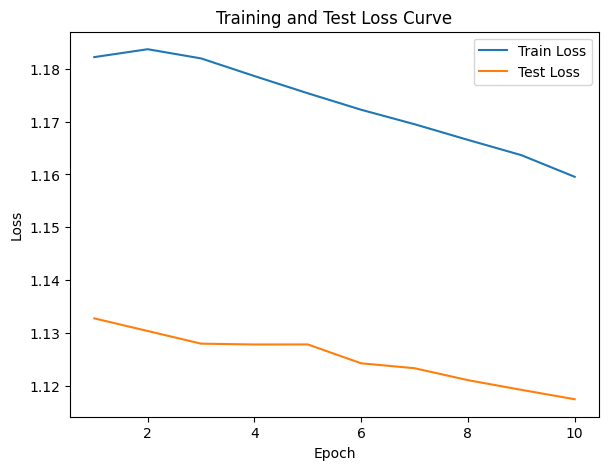

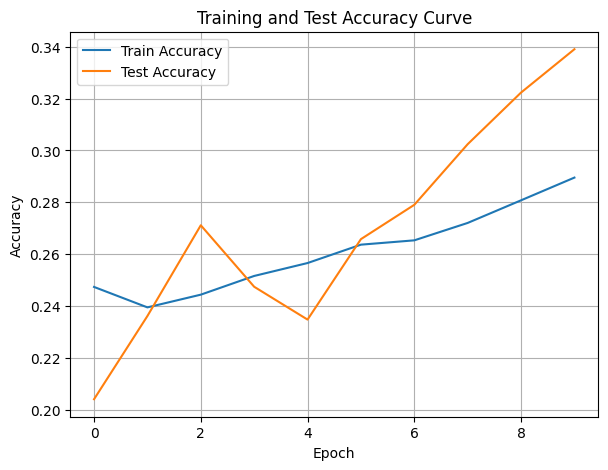

./saved_models/model_3.pth
Training Model with id 4
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.55it/s]

Epoch [1/10], Train F1:0.19774050510892616, Train Loss: 1.1634, Train Acc: 0.2616, Test F1:0.1466352448284891, Test Loss: 1.1453, Test Acc: 0.1215
Epoch [2/10], Train F1:0.18988950949066413, Train Loss: 1.1691, Train Acc: 0.2543, Test F1:0.15879113843001666, Test Loss: 1.1477, Test Acc: 0.1332


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.35it/s]

Epoch [3/10], Train F1:0.19081930296143332, Train Loss: 1.1644, Train Acc: 0.2578, Test F1:0.16894087069525665, Test Loss: 1.1465, Test Acc: 0.1476
Epoch [4/10], Train F1:0.1945329214536087, Train Loss: 1.1590, Train Acc: 0.2635, Test F1:0.17602534765006161, Test Loss: 1.1466, Test Acc: 0.1586


Training Process:  60%|██████    | 6/10 [00:00<00:00,  9.92it/s]

Epoch [5/10], Train F1:0.1951951590934905, Train Loss: 1.1582, Train Acc: 0.2663, Test F1:0.18012946805516467, Test Loss: 1.1451, Test Acc: 0.1622
Epoch [6/10], Train F1:0.19437865057529521, Train Loss: 1.1550, Train Acc: 0.2675, Test F1:0.18327067669172933, Test Loss: 1.1434, Test Acc: 0.1645


Training Process:  80%|████████  | 8/10 [00:00<00:00,  9.56it/s]

Epoch [7/10], Train F1:0.1957952130768788, Train Loss: 1.1507, Train Acc: 0.2723, Test F1:0.18677873390701089, Test Loss: 1.1417, Test Acc: 0.1684
Epoch [8/10], Train F1:0.1984016322584078, Train Loss: 1.1472, Train Acc: 0.2774, Test F1:0.1901528013582343, Test Loss: 1.1389, Test Acc: 0.1777


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.76it/s]


Epoch [9/10], Train F1:0.20016773402740518, Train Loss: 1.1446, Train Acc: 0.2807, Test F1:0.192384370015949, Test Loss: 1.1369, Test Acc: 0.1810
Epoch [10/10], Train F1:0.20280989849115802, Train Loss: 1.1416, Train Acc: 0.2845, Test F1:0.19532458349904988, Test Loss: 1.1348, Test Acc: 0.1866
Total Epochs: 10
Train loss start: 1.1293030977249146, Train loss end: 1.1600399017333984
Highest Mean Train Accuracy (over epoch): 0.2844940476190476
Test loss start: 1.159050464630127, Test loss end: 1.104036569595337
Highest mean Test Accuracy (over epoch): 0.18663194444444445


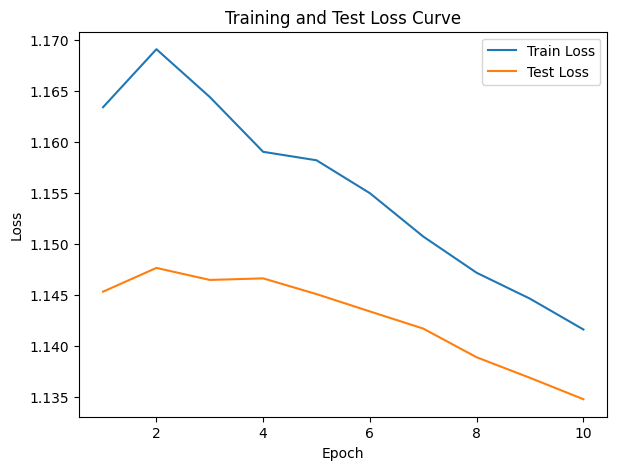

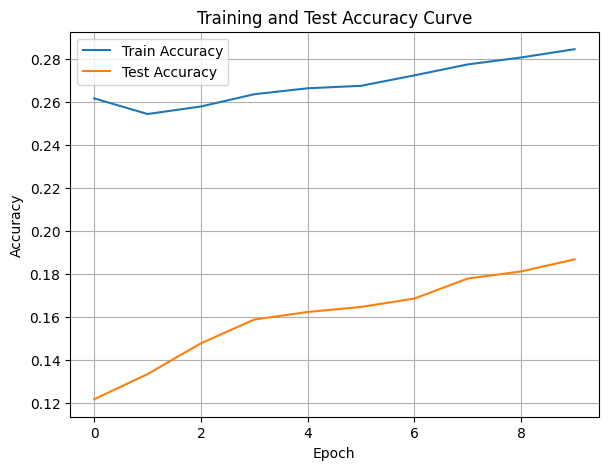

./saved_models/model_4.pth
Training Model with id 5
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.88it/s]

Epoch [1/10], Train F1:0.4665834006500358, Train Loss: 1.0485, Train Acc: 0.4577, Test F1:0.39845488308229315, Test Loss: 1.0847, Test Acc: 0.3003


Training Process:  20%|██        | 2/10 [00:00<00:00,  8.07it/s]

Epoch [2/10], Train F1:0.4681473353426364, Train Loss: 1.0464, Train Acc: 0.4493, Test F1:0.37780375308017944, Test Loss: 1.0903, Test Acc: 0.2739


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.98it/s]

Epoch [3/10], Train F1:0.47824598166061577, Train Loss: 1.0381, Train Acc: 0.4629, Test F1:0.36788942052099954, Test Loss: 1.0905, Test Acc: 0.2650


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.44it/s]

Epoch [4/10], Train F1:0.4885668362772917, Train Loss: 1.0341, Train Acc: 0.4705, Test F1:0.38446718400278773, Test Loss: 1.0878, Test Acc: 0.2782


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.46it/s]

Epoch [5/10], Train F1:0.5047126430741475, Train Loss: 1.0278, Train Acc: 0.4861, Test F1:0.40235187388005245, Test Loss: 1.0857, Test Acc: 0.2924


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.45it/s]

Epoch [6/10], Train F1:0.5123220518865563, Train Loss: 1.0251, Train Acc: 0.4940, Test F1:0.40857899223762734, Test Loss: 1.0844, Test Acc: 0.2966


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.21it/s]

Epoch [7/10], Train F1:0.5196409294281099, Train Loss: 1.0226, Train Acc: 0.5009, Test F1:0.42616661698915065, Test Loss: 1.0817, Test Acc: 0.3136


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.03it/s]

Epoch [8/10], Train F1:0.52791781506559, Train Loss: 1.0187, Train Acc: 0.5096, Test F1:0.4432694799370104, Test Loss: 1.0793, Test Acc: 0.3295


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.51it/s]

Epoch [9/10], Train F1:0.5385540992227602, Train Loss: 1.0146, Train Acc: 0.5214, Test F1:0.4804561511704021, Test Loss: 1.0754, Test Acc: 0.3679


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.31it/s]


Epoch [10/10], Train F1:0.5430725296131035, Train Loss: 1.0126, Train Acc: 0.5252, Test F1:0.4995999446423801, Test Loss: 1.0729, Test Acc: 0.3897
Total Epochs: 10
Train loss start: 1.1001747846603394, Train loss end: 0.9692407846450806
Highest Mean Train Accuracy (over epoch): 0.5252380952380952
Test loss start: 1.091565489768982, Test loss end: 1.0430524349212646
Highest mean Test Accuracy (over epoch): 0.3896701388888889


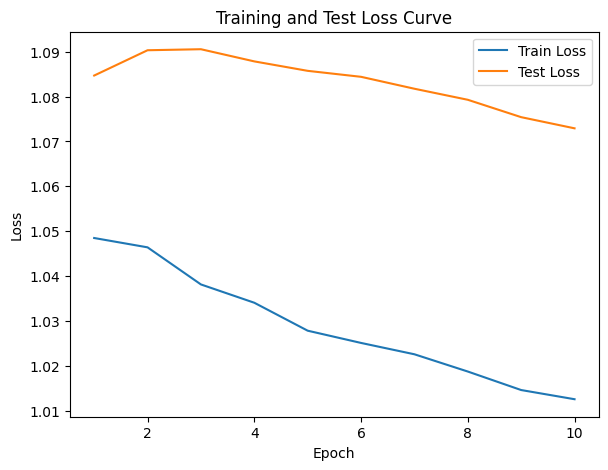

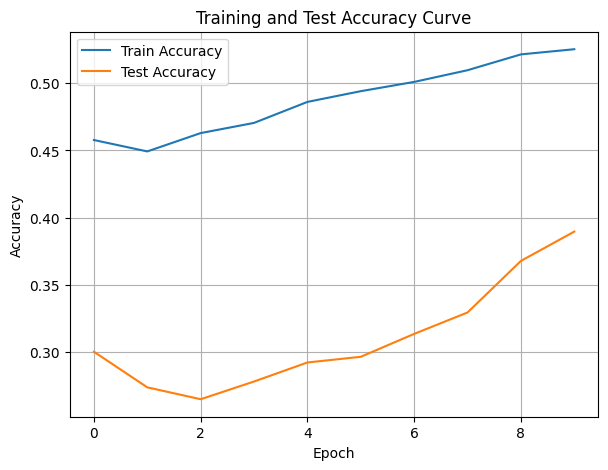

./saved_models/model_5.pth
Training Model with id 6
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  7.06it/s]

Epoch [1/10], Train F1:0.5089084695792013, Train Loss: 1.0665, Train Acc: 0.4661, Test F1:0.5453636579940582, Test Loss: 1.0571, Test Acc: 0.5842


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.97it/s]

Epoch [2/10], Train F1:0.4976842339651087, Train Loss: 1.0714, Train Acc: 0.4577, Test F1:0.558062515091716, Test Loss: 1.0462, Test Acc: 0.5968


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.79it/s]

Epoch [3/10], Train F1:0.5012453331958336, Train Loss: 1.0644, Train Acc: 0.4662, Test F1:0.5575953638663604, Test Loss: 1.0437, Test Acc: 0.5958


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.15it/s]

Epoch [4/10], Train F1:0.49660884739282823, Train Loss: 1.0610, Train Acc: 0.4670, Test F1:0.5612581525860761, Test Loss: 1.0388, Test Acc: 0.6061


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.68it/s]

Epoch [5/10], Train F1:0.49856712175865453, Train Loss: 1.0622, Train Acc: 0.4666, Test F1:0.567238974654932, Test Loss: 1.0364, Test Acc: 0.6139


Training Process:  60%|██████    | 6/10 [00:00<00:00,  7.58it/s]

Epoch [6/10], Train F1:0.5061833012166738, Train Loss: 1.0568, Train Acc: 0.4782, Test F1:0.5685805021778797, Test Loss: 1.0330, Test Acc: 0.6178


Training Process:  70%|███████   | 7/10 [00:00<00:00,  7.01it/s]

Epoch [7/10], Train F1:0.5133091071870182, Train Loss: 1.0524, Train Acc: 0.4858, Test F1:0.5767424399237338, Test Loss: 1.0293, Test Acc: 0.6267


Training Process:  80%|████████  | 8/10 [00:01<00:00,  7.11it/s]

Epoch [8/10], Train F1:0.5250613723904578, Train Loss: 1.0474, Train Acc: 0.4982, Test F1:0.5866981365224349, Test Loss: 1.0258, Test Acc: 0.6354


Training Process:  90%|█████████ | 9/10 [00:01<00:00,  7.06it/s]

Epoch [9/10], Train F1:0.5371852016157928, Train Loss: 1.0434, Train Acc: 0.5096, Test F1:0.5847619047619048, Test Loss: 1.0240, Test Acc: 0.6372


Training Process: 100%|██████████| 10/10 [00:01<00:00,  7.37it/s]


Epoch [10/10], Train F1:0.5423274856054003, Train Loss: 1.0405, Train Acc: 0.5134, Test F1:0.5956220016164961, Test Loss: 1.0211, Test Acc: 0.6460
Total Epochs: 10
Train loss start: 1.0818889141082764, Train loss end: 1.0931061506271362
Highest Mean Train Accuracy (over epoch): 0.5134226190476191
Test loss start: 1.0545777082443237, Test loss end: 0.9978117346763611
Highest mean Test Accuracy (over epoch): 0.6460069444444445


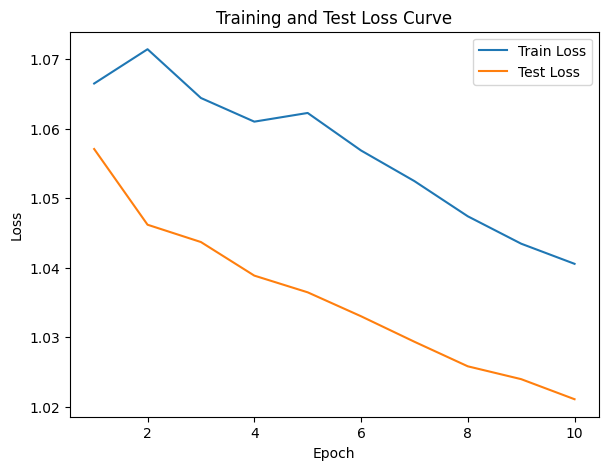

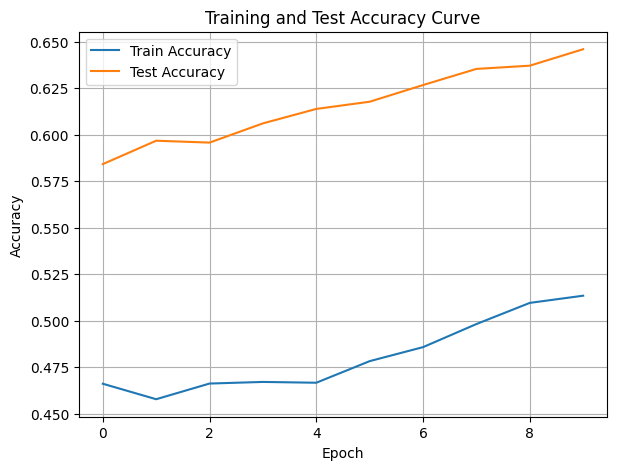

./saved_models/model_6.pth
Training Model with id 7
in multi


Training Process:  10%|█         | 1/10 [00:00<00:01,  6.30it/s]

Epoch [1/10], Train F1:0.3820674949654024, Train Loss: 1.0919, Train Acc: 0.3369, Test F1:0.18635477582846002, Test Loss: 1.1146, Test Acc: 0.1155


Training Process:  20%|██        | 2/10 [00:00<00:01,  7.48it/s]

Epoch [2/10], Train F1:0.39142454444193275, Train Loss: 1.0875, Train Acc: 0.3500, Test F1:0.1423956160798266, Test Loss: 1.1216, Test Acc: 0.0842


Training Process:  30%|███       | 3/10 [00:00<00:00,  7.90it/s]

Epoch [3/10], Train F1:0.40262167855929737, Train Loss: 1.0808, Train Acc: 0.3577, Test F1:0.14834598935148818, Test Loss: 1.1212, Test Acc: 0.0868


Training Process:  40%|████      | 4/10 [00:00<00:00,  7.32it/s]

Epoch [4/10], Train F1:0.4170650328757897, Train Loss: 1.0790, Train Acc: 0.3699, Test F1:0.14687848280986204, Test Loss: 1.1213, Test Acc: 0.0877


Training Process:  50%|█████     | 5/10 [00:00<00:00,  7.69it/s]

Epoch [5/10], Train F1:0.42268753325410025, Train Loss: 1.0780, Train Acc: 0.3748, Test F1:0.14365479481758553, Test Loss: 1.1215, Test Acc: 0.0866


Training Process:  60%|██████    | 6/10 [00:00<00:00,  8.12it/s]

Epoch [6/10], Train F1:0.4304620571338396, Train Loss: 1.0742, Train Acc: 0.3810, Test F1:0.14018672307109936, Test Loss: 1.1208, Test Acc: 0.0846


Training Process:  70%|███████   | 7/10 [00:00<00:00,  8.62it/s]

Epoch [7/10], Train F1:0.43273274638575376, Train Loss: 1.0740, Train Acc: 0.3828, Test F1:0.14133551550472692, Test Loss: 1.1202, Test Acc: 0.0854


Epoch [8/10], Train F1:0.43793992541042787, Train Loss: 1.0713, Train Acc: 0.3899, Test F1:0.14066841311423356, Test Loss: 1.1196, Test Acc: 0.0851


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.82it/s]


Epoch [9/10], Train F1:0.4471945652457565, Train Loss: 1.0668, Train Acc: 0.3996, Test F1:0.1538656804647981, Test Loss: 1.1175, Test Acc: 0.0948
Epoch [10/10], Train F1:0.454666381131208, Train Loss: 1.0642, Train Acc: 0.4076, Test F1:0.16778006510090027, Test Loss: 1.1162, Test Acc: 0.1034
Total Epochs: 10
Train loss start: 1.1217124462127686, Train loss end: 1.0322520732879639
Highest Mean Train Accuracy (over epoch): 0.4076488095238095
Test loss start: 1.1016143560409546, Test loss end: 1.0986429452896118
Highest mean Test Accuracy (over epoch): 0.1154513888888889


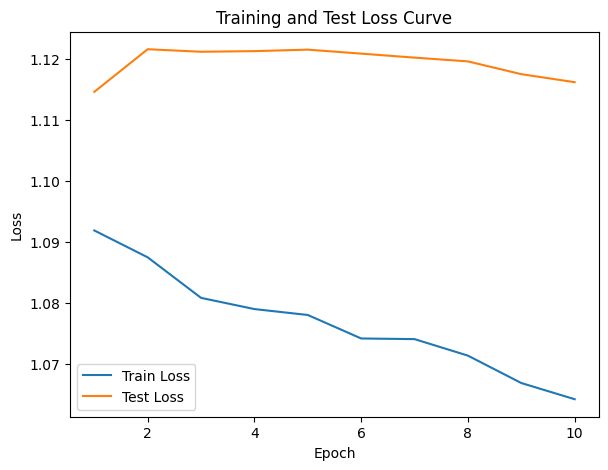

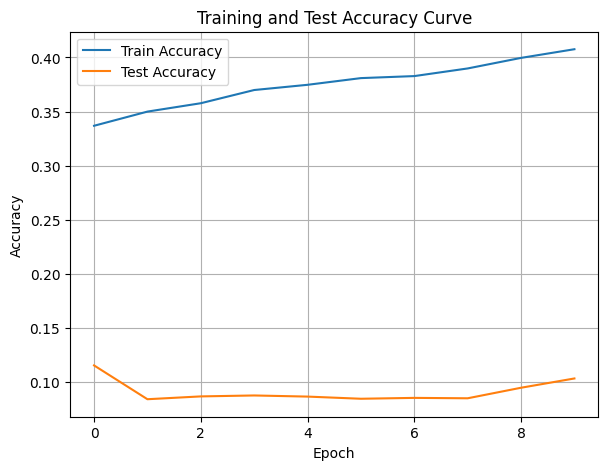

./saved_models/model_7.pth
Training Model with id 8
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.78it/s]

Epoch [1/10], Train F1:0.6692807160695298, Train Loss: 0.9857, Train Acc: 0.6381, Test F1:0.6991020675231202, Test Loss: 1.0355, Test Acc: 0.6780
Epoch [2/10], Train F1:0.648251426201136, Train Loss: 0.9873, Train Acc: 0.6140, Test F1:0.6950710108604846, Test Loss: 1.0303, Test Acc: 0.6810


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.78it/s]

Epoch [3/10], Train F1:0.6536150562129378, Train Loss: 0.9829, Train Acc: 0.6245, Test F1:0.69465675207302, Test Loss: 1.0271, Test Acc: 0.6820


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.10it/s]

Epoch [4/10], Train F1:0.6564638815819243, Train Loss: 0.9837, Train Acc: 0.6313, Test F1:0.6928613022252028, Test Loss: 1.0257, Test Acc: 0.6775


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.10it/s]

Epoch [5/10], Train F1:0.6594273615277644, Train Loss: 0.9811, Train Acc: 0.6384, Test F1:0.6829981217295953, Test Loss: 1.0249, Test Acc: 0.6655


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.63it/s]

Epoch [6/10], Train F1:0.6660530461085223, Train Loss: 0.9771, Train Acc: 0.6467, Test F1:0.681041654303965, Test Loss: 1.0231, Test Acc: 0.6626


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.63it/s]

Epoch [7/10], Train F1:0.6690727800207704, Train Loss: 0.9750, Train Acc: 0.6497, Test F1:0.6804259481682567, Test Loss: 1.0221, Test Acc: 0.6626


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.01it/s]

Epoch [8/10], Train F1:0.6752416133772067, Train Loss: 0.9724, Train Acc: 0.6558, Test F1:0.6893053012496699, Test Loss: 1.0200, Test Acc: 0.6736


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.01it/s]

Epoch [9/10], Train F1:0.6815404142803486, Train Loss: 0.9700, Train Acc: 0.6613, Test F1:0.6929563885595811, Test Loss: 1.0185, Test Acc: 0.6780


Training Process:  80%|████████  | 8/10 [00:01<00:00, 10.01it/s]

Epoch [10/10], Train F1:0.6890468340466921, Train Loss: 0.9655, Train Acc: 0.6707, Test F1:0.6935710540575523, Test Loss: 1.0157, Test Acc: 0.6794


Training Process: 100%|██████████| 10/10 [00:01<00:00,  8.70it/s]


Total Epochs: 10
Train loss start: 0.988577663898468, Train loss end: 0.8542965650558472
Highest Mean Train Accuracy (over epoch): 0.6706845238095238
Test loss start: 1.0279276371002197, Test loss end: 0.9923040866851807
Highest mean Test Accuracy (over epoch): 0.6820023148148148


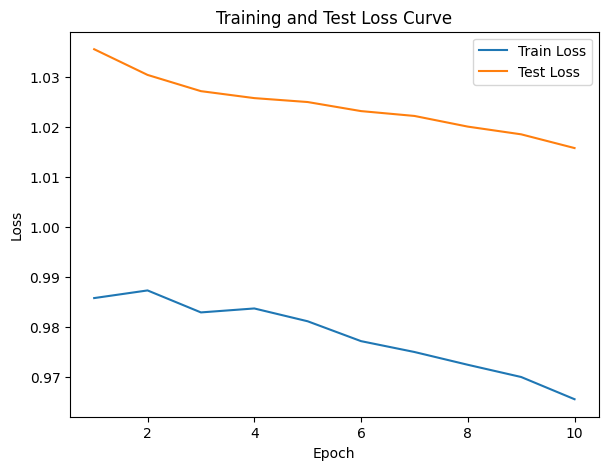

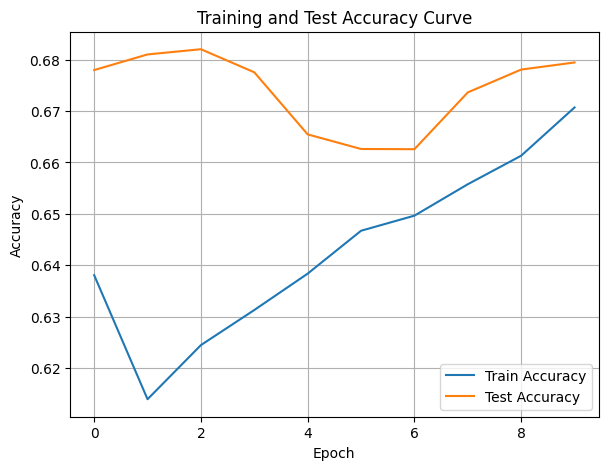

./saved_models/model_8.pth
Training Model with id 12
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 11.78it/s]

Epoch [1/10], Train F1:0.7480122961237384, Train Loss: 0.9384, Train Acc: 0.7393, Test F1:0.7272616167894035, Test Loss: 0.9966, Test Acc: 0.7153
Epoch [2/10], Train F1:0.728076205630181, Train Loss: 0.9391, Train Acc: 0.7205, Test F1:0.7284303473916579, Test Loss: 0.9931, Test Acc: 0.7283
Epoch [3/10], Train F1:0.7242372445425881, Train Loss: 0.9390, Train Acc: 0.7185, Test F1:0.7346450910794978, Test Loss: 0.9910, Test Acc: 0.7378


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.62it/s]

Epoch [4/10], Train F1:0.7245608898600134, Train Loss: 0.9355, Train Acc: 0.7190, Test F1:0.7368306386882236, Test Loss: 0.9877, Test Acc: 0.7391
Epoch [5/10], Train F1:0.7282435542982131, Train Loss: 0.9320, Train Acc: 0.7211, Test F1:0.7369344413665744, Test Loss: 0.9851, Test Acc: 0.7384


Training Process:  60%|██████    | 6/10 [00:00<00:00, 10.64it/s]

Epoch [6/10], Train F1:0.737018860506154, Train Loss: 0.9282, Train Acc: 0.7288, Test F1:0.7422668513388735, Test Loss: 0.9831, Test Acc: 0.7431
Epoch [7/10], Train F1:0.7381960837936322, Train Loss: 0.9253, Train Acc: 0.7306, Test F1:0.7443990661683522, Test Loss: 0.9816, Test Acc: 0.7462


Training Process:  90%|█████████ | 9/10 [00:00<00:00,  9.05it/s]

Epoch [8/10], Train F1:0.7422261879210925, Train Loss: 0.9218, Train Acc: 0.7358, Test F1:0.7447600338846062, Test Loss: 0.9803, Test Acc: 0.7475
Epoch [9/10], Train F1:0.745073231432352, Train Loss: 0.9194, Train Acc: 0.7385, Test F1:0.7476691368008249, Test Loss: 0.9792, Test Acc: 0.7496


Training Process: 100%|██████████| 10/10 [00:01<00:00,  9.56it/s]


Epoch [10/10], Train F1:0.7514062839673248, Train Loss: 0.9160, Train Acc: 0.7438, Test F1:0.7502121316362804, Test Loss: 0.9775, Test Acc: 0.7533
Total Epochs: 10
Train loss start: 0.9465522766113281, Train loss end: 0.8534990549087524
Highest Mean Train Accuracy (over epoch): 0.7438392857142857
Test loss start: 0.9900789856910706, Test loss end: 0.9486964344978333
Highest mean Test Accuracy (over epoch): 0.7532986111111111


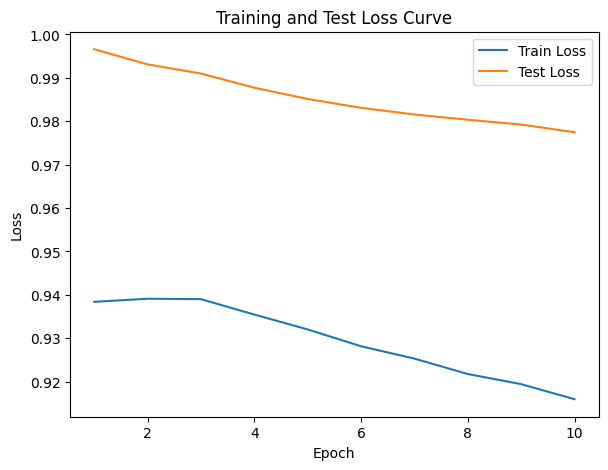

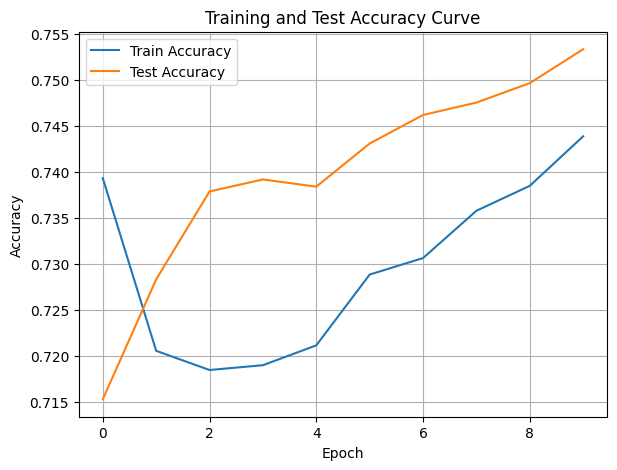

./saved_models/model_12.pth
Training Model with id 13
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.17it/s]

Epoch [1/10], Train F1:0.7735499606533618, Train Loss: 0.8927, Train Acc: 0.7631, Test F1:0.7628565083595062, Test Loss: 0.9504, Test Acc: 0.7726
Epoch [2/10], Train F1:0.7811369253583786, Train Loss: 0.8890, Train Acc: 0.7815, Test F1:0.7730881883096545, Test Loss: 0.9546, Test Acc: 0.7834


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.17it/s]

Epoch [3/10], Train F1:0.7836874114483436, Train Loss: 0.8821, Train Acc: 0.7827, Test F1:0.7723541692924535, Test Loss: 0.9499, Test Acc: 0.7824


Training Process:  40%|████      | 4/10 [00:00<00:00, 11.15it/s]

Epoch [4/10], Train F1:0.7805344141844294, Train Loss: 0.8803, Train Acc: 0.7810, Test F1:0.7725400972881377, Test Loss: 0.9480, Test Acc: 0.7834


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.18it/s]

Epoch [5/10], Train F1:0.7802297831641252, Train Loss: 0.8781, Train Acc: 0.7802, Test F1:0.7726508751658565, Test Loss: 0.9473, Test Acc: 0.7840
Epoch [6/10], Train F1:0.7935338974362294, Train Loss: 0.8695, Train Acc: 0.7942, Test F1:0.7734455944992726, Test Loss: 0.9453, Test Acc: 0.7834


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.18it/s]

Epoch [7/10], Train F1:0.7900276730016508, Train Loss: 0.8708, Train Acc: 0.7903, Test F1:0.7756814661575443, Test Loss: 0.9438, Test Acc: 0.7861


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.45it/s]

Epoch [8/10], Train F1:0.7912127801647252, Train Loss: 0.8696, Train Acc: 0.7912, Test F1:0.7796314731955643, Test Loss: 0.9415, Test Acc: 0.7900
Epoch [9/10], Train F1:0.7930225643947748, Train Loss: 0.8671, Train Acc: 0.7926, Test F1:0.7800308680077238, Test Loss: 0.9401, Test Acc: 0.7898


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.48it/s]

Epoch [10/10], Train F1:0.7958295235732363, Train Loss: 0.8653, Train Acc: 0.7935, Test F1:0.7813610179196919, Test Loss: 0.9386, Test Acc: 0.7905
Total Epochs: 10
Train loss start: 0.8731801509857178, Train loss end: 1.017967939376831
Highest Mean Train Accuracy (over epoch): 0.7942460317460318
Test loss start: 0.9471231698989868, Test loss end: 0.907599151134491
Highest mean Test Accuracy (over epoch): 0.7904513888888889


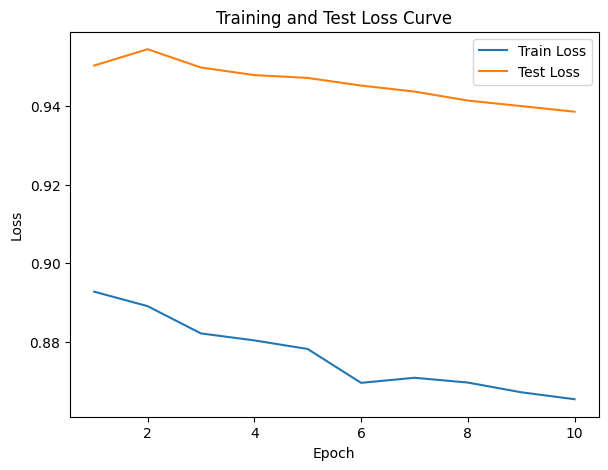

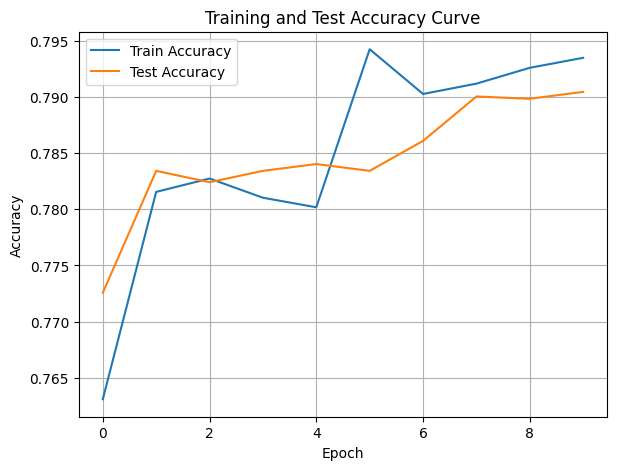

./saved_models/model_13.pth
Training Model with id 11
in multi


Training Process:  10%|█         | 1/10 [00:00<00:00,  9.50it/s]

Epoch [1/10], Train F1:0.8274148819459249, Train Loss: 0.8294, Train Acc: 0.8396, Test F1:0.7810983154087752, Test Loss: 0.9298, Test Acc: 0.7943


Training Process:  30%|███       | 3/10 [00:00<00:00, 11.06it/s]

Epoch [2/10], Train F1:0.8079387299260326, Train Loss: 0.8357, Train Acc: 0.8124, Test F1:0.7931793192566571, Test Loss: 0.9249, Test Acc: 0.8090
Epoch [3/10], Train F1:0.8171673755534824, Train Loss: 0.8342, Train Acc: 0.8161, Test F1:0.7932595201082877, Test Loss: 0.9234, Test Acc: 0.8047


Training Process:  50%|█████     | 5/10 [00:00<00:00, 11.08it/s]

Epoch [4/10], Train F1:0.8193072226383848, Train Loss: 0.8313, Train Acc: 0.8190, Test F1:0.7902192189334094, Test Loss: 0.9230, Test Acc: 0.8006
Epoch [5/10], Train F1:0.8186552435536459, Train Loss: 0.8283, Train Acc: 0.8192, Test F1:0.7904279129681038, Test Loss: 0.9194, Test Acc: 0.7997
Epoch [6/10], Train F1:0.8192633967235132, Train Loss: 0.8275, Train Acc: 0.8190, Test F1:0.7929119449341056, Test Loss: 0.9160, Test Acc: 0.8027


Training Process:  90%|█████████ | 9/10 [00:00<00:00, 11.69it/s]

Epoch [7/10], Train F1:0.8223069151592556, Train Loss: 0.8251, Train Acc: 0.8224, Test F1:0.7955375861153664, Test Loss: 0.9137, Test Acc: 0.8068
Epoch [8/10], Train F1:0.8248499458703361, Train Loss: 0.8241, Train Acc: 0.8243, Test F1:0.7985728128274294, Test Loss: 0.9125, Test Acc: 0.8084
Epoch [9/10], Train F1:0.8257576915998045, Train Loss: 0.8225, Train Acc: 0.8256, Test F1:0.8009204416163882, Test Loss: 0.9111, Test Acc: 0.8096


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.47it/s]


Epoch [10/10], Train F1:0.8322057470034707, Train Loss: 0.8176, Train Acc: 0.8319, Test F1:0.8040154878248459, Test Loss: 0.9092, Test Acc: 0.8134
Total Epochs: 10
Train loss start: 0.8023543953895569, Train loss end: 0.7115951180458069
Highest Mean Train Accuracy (over epoch): 0.8395833333333333
Test loss start: 0.9235394597053528, Test loss end: 0.8684285283088684
Highest mean Test Accuracy (over epoch): 0.8133680555555556


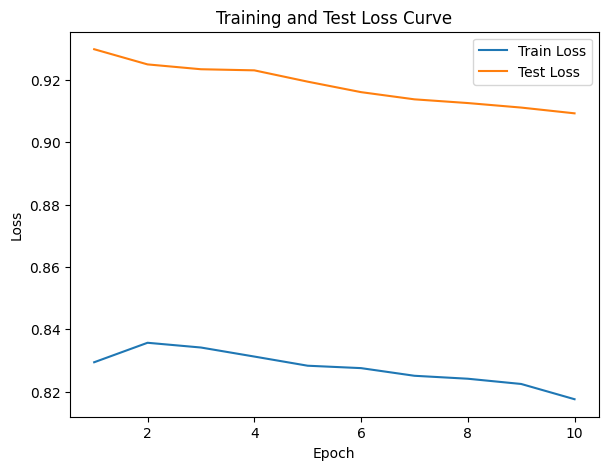

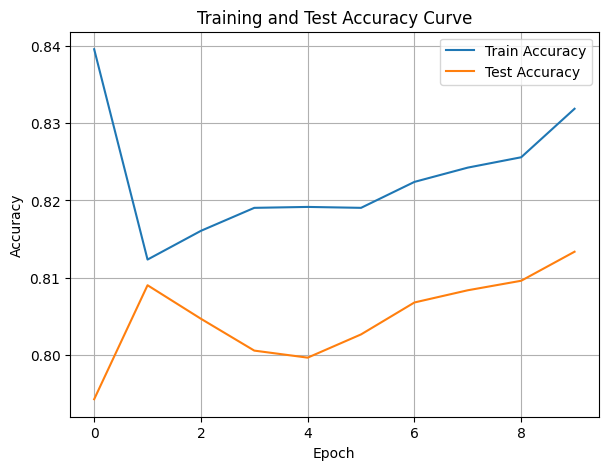

./saved_models/model_11.pth
Training Model with id 13
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.13it/s]

Epoch [1/10], Train F1:0.8619140047352785, Train Loss: 0.7968, Train Acc: 0.8688, Test F1:0.8135349597337902, Test Loss: 0.8904, Test Acc: 0.8316
Epoch [2/10], Train F1:0.8458705781286426, Train Loss: 0.7995, Train Acc: 0.8542, Test F1:0.8248774509803922, Test Loss: 0.8894, Test Acc: 0.8364


Training Process:  40%|████      | 4/10 [00:00<00:00, 10.73it/s]

Epoch [3/10], Train F1:0.8402297463569139, Train Loss: 0.8009, Train Acc: 0.8493, Test F1:0.8285680484674334, Test Loss: 0.8877, Test Acc: 0.8380
Epoch [4/10], Train F1:0.8410537301715442, Train Loss: 0.7975, Train Acc: 0.8500, Test F1:0.832019256037047, Test Loss: 0.8844, Test Acc: 0.8422
Epoch [5/10], Train F1:0.8439407000849443, Train Loss: 0.7952, Train Acc: 0.8529, Test F1:0.834094427244582, Test Loss: 0.8813, Test Acc: 0.8448


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.01it/s]

Epoch [6/10], Train F1:0.8424501518185927, Train Loss: 0.7932, Train Acc: 0.8517, Test F1:0.8343950410166666, Test Loss: 0.8802, Test Acc: 0.8442
Epoch [7/10], Train F1:0.8410460064266381, Train Loss: 0.7922, Train Acc: 0.8485, Test F1:0.836981732855503, Test Loss: 0.8793, Test Acc: 0.8469


Training Process:  80%|████████  | 8/10 [00:00<00:00, 10.78it/s]

Epoch [8/10], Train F1:0.8397260262227175, Train Loss: 0.7919, Train Acc: 0.8467, Test F1:0.837881590230639, Test Loss: 0.8780, Test Acc: 0.8471
Epoch [9/10], Train F1:0.8420455310429198, Train Loss: 0.7902, Train Acc: 0.8485, Test F1:0.839506305182819, Test Loss: 0.8768, Test Acc: 0.8489


Training Process: 100%|██████████| 10/10 [00:00<00:00, 10.46it/s]


Epoch [10/10], Train F1:0.8446337303534844, Train Loss: 0.7892, Train Acc: 0.8490, Test F1:0.8408065603343274, Test Loss: 0.8752, Test Acc: 0.8503
Total Epochs: 10
Train loss start: 0.7897553443908691, Train loss end: 0.9733743667602539
Highest Mean Train Accuracy (over epoch): 0.86875
Test loss start: 0.8843660354614258, Test loss end: 0.8382675647735596
Highest mean Test Accuracy (over epoch): 0.8502604166666667


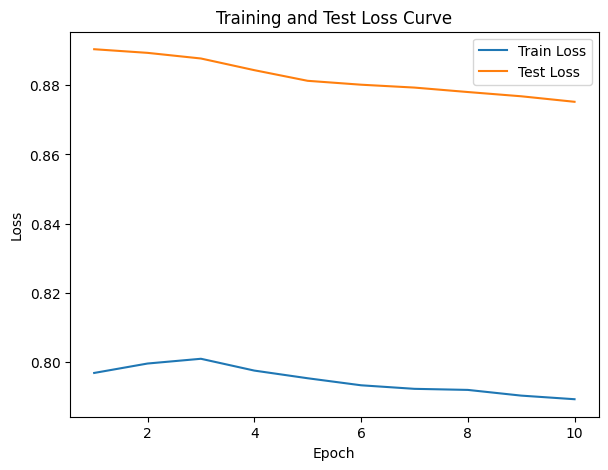

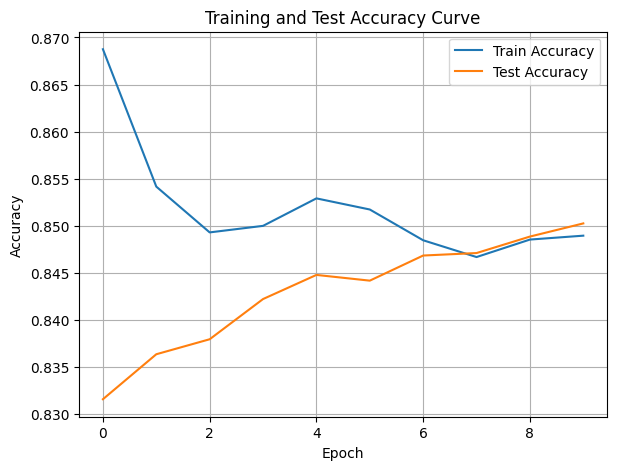

./saved_models/model_13.pth
Training Model with id 14
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.81it/s]

Epoch [1/10], Train F1:0.8377291625344248, Train Loss: 0.7796, Train Acc: 0.8479, Test F1:0.8456999680505651, Test Loss: 0.8672, Test Acc: 0.8490
Epoch [2/10], Train F1:0.8368929457639135, Train Loss: 0.7789, Train Acc: 0.8432, Test F1:0.8456999680505651, Test Loss: 0.8654, Test Acc: 0.8490


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.81it/s]

Epoch [3/10], Train F1:0.8442066619782204, Train Loss: 0.7782, Train Acc: 0.8485, Test F1:0.8456999680505652, Test Loss: 0.8636, Test Acc: 0.8490


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.59it/s]

Epoch [4/10], Train F1:0.8404875019118918, Train Loss: 0.7748, Train Acc: 0.8463, Test F1:0.8477866876711629, Test Loss: 0.8606, Test Acc: 0.8509


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.59it/s]

Epoch [5/10], Train F1:0.8433476005301923, Train Loss: 0.7714, Train Acc: 0.8470, Test F1:0.8490401811101287, Test Loss: 0.8582, Test Acc: 0.8521


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.05it/s]

Epoch [6/10], Train F1:0.8452556098269451, Train Loss: 0.7690, Train Acc: 0.8499, Test F1:0.8493791321205099, Test Loss: 0.8574, Test Acc: 0.8539
Epoch [7/10], Train F1:0.8440412104387747, Train Loss: 0.7672, Train Acc: 0.8496, Test F1:0.8512457832751376, Test Loss: 0.8567, Test Acc: 0.8563


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.42it/s]

Epoch [8/10], Train F1:0.8456790799210815, Train Loss: 0.7655, Train Acc: 0.8517, Test F1:0.8499767280145009, Test Loss: 0.8553, Test Acc: 0.8561


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.42it/s]

Epoch [9/10], Train F1:0.8464857363819253, Train Loss: 0.7639, Train Acc: 0.8521, Test F1:0.8513656817599956, Test Loss: 0.8544, Test Acc: 0.8577


Training Process: 100%|██████████| 10/10 [00:00<00:00, 11.32it/s]

Epoch [10/10], Train F1:0.8471553789354563, Train Loss: 0.7629, Train Acc: 0.8517, Test F1:0.8511687125015571, Test Loss: 0.8521, Test Acc: 0.8582
Total Epochs: 10
Train loss start: 0.8155271410942078, Train loss end: 0.7694806456565857
Highest Mean Train Accuracy (over epoch): 0.852116402116402
Test loss start: 0.8593371510505676, Test loss end: 0.8090956807136536
Highest mean Test Accuracy (over epoch): 0.8582465277777779


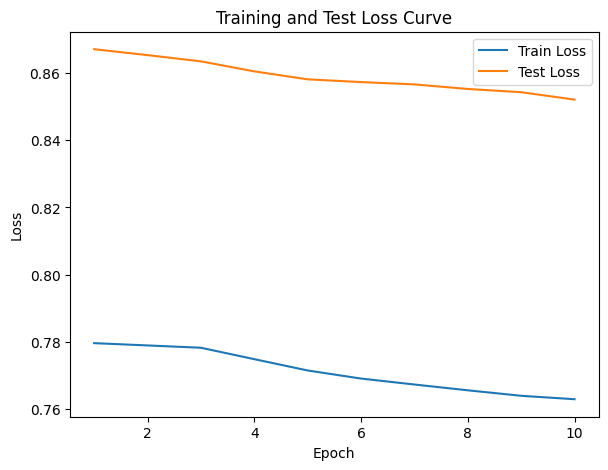

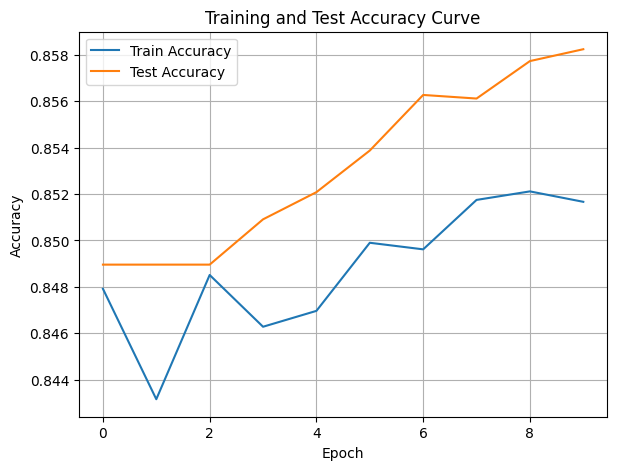

./saved_models/model_14.pth
Training Model with id 12
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.71it/s]

Epoch [1/10], Train F1:0.8686450643373721, Train Loss: 0.7395, Train Acc: 0.8622, Test F1:0.85406554360585, Test Loss: 0.8350, Test Acc: 0.8568
Epoch [2/10], Train F1:0.8596277821533794, Train Loss: 0.7534, Train Acc: 0.8539, Test F1:0.847497768304458, Test Loss: 0.8317, Test Acc: 0.8529


Training Process:  20%|██        | 2/10 [00:00<00:00, 13.71it/s]

Epoch [3/10], Train F1:0.8602193596311849, Train Loss: 0.7507, Train Acc: 0.8570, Test F1:0.8514136581122226, Test Loss: 0.8306, Test Acc: 0.8588


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.81it/s]

Epoch [4/10], Train F1:0.8634443024022652, Train Loss: 0.7499, Train Acc: 0.8612, Test F1:0.8538060594391649, Test Loss: 0.8290, Test Acc: 0.8618


Training Process:  40%|████      | 4/10 [00:00<00:00, 12.81it/s]

Epoch [5/10], Train F1:0.8685191510203855, Train Loss: 0.7497, Train Acc: 0.8652, Test F1:0.8538854925244866, Test Loss: 0.8291, Test Acc: 0.8608


Training Process:  60%|██████    | 6/10 [00:00<00:00, 11.44it/s]

Epoch [6/10], Train F1:0.8681865746944896, Train Loss: 0.7473, Train Acc: 0.8668, Test F1:0.8516993326925361, Test Loss: 0.8272, Test Acc: 0.8598
Epoch [7/10], Train F1:0.869191907809992, Train Loss: 0.7440, Train Acc: 0.8692, Test F1:0.8486763644650386, Test Loss: 0.8262, Test Acc: 0.8571


Training Process:  80%|████████  | 8/10 [00:00<00:00, 12.21it/s]

Epoch [8/10], Train F1:0.8707684343634287, Train Loss: 0.7438, Train Acc: 0.8708, Test F1:0.8461663417803768, Test Loss: 0.8245, Test Acc: 0.8551


Training Process: 100%|██████████| 10/10 [00:00<00:00, 12.20it/s]


Epoch [9/10], Train F1:0.869189020871072, Train Loss: 0.7446, Train Acc: 0.8695, Test F1:0.8478212366476771, Test Loss: 0.8229, Test Acc: 0.8569
Epoch [10/10], Train F1:0.8700476159924252, Train Loss: 0.7433, Train Acc: 0.8704, Test F1:0.8481217490176858, Test Loss: 0.8221, Test Acc: 0.8575
Total Epochs: 10
Train loss start: 0.7217535972595215, Train loss end: 0.755164623260498
Highest Mean Train Accuracy (over epoch): 0.8707961309523811
Test loss start: 0.8247871994972229, Test loss end: 0.792493462562561
Highest mean Test Accuracy (over epoch): 0.8617621527777778


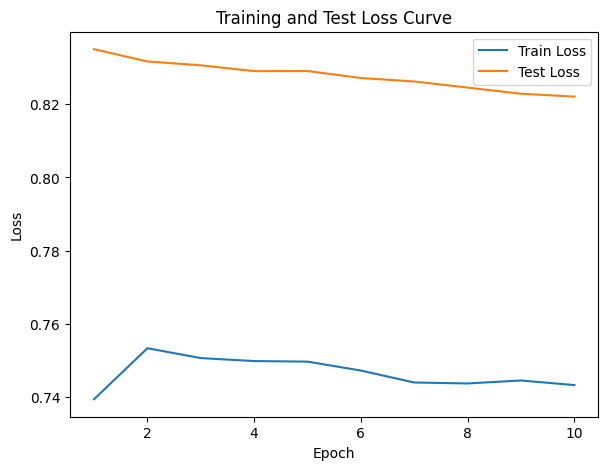

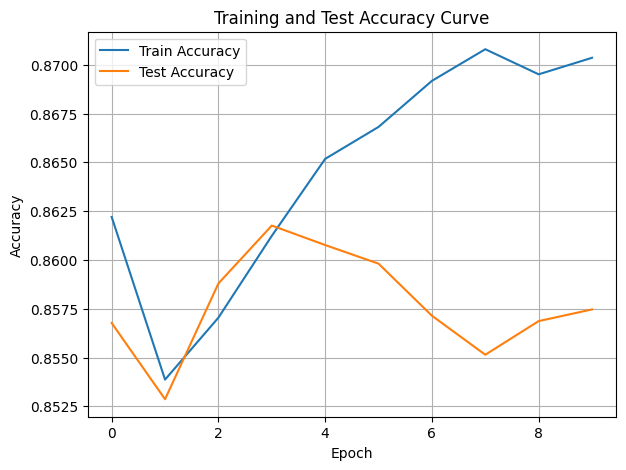

./saved_models/model_12.pth
Training Model with id 10
in multi


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.97it/s]

Epoch [1/10], Train F1:0.865868876885826, Train Loss: 0.7462, Train Acc: 0.8527, Test F1:0.8624843486896075, Test Loss: 0.8191, Test Acc: 0.8646
Epoch [2/10], Train F1:0.8716200878814795, Train Loss: 0.7320, Train Acc: 0.8653, Test F1:0.8667155612987344, Test Loss: 0.8156, Test Acc: 0.8715


Training Process:  20%|██        | 2/10 [00:00<00:00, 12.97it/s]

Epoch [3/10], Train F1:0.8691415281653647, Train Loss: 0.7304, Train Acc: 0.8679, Test F1:0.8676465700059167, Test Loss: 0.8116, Test Acc: 0.8738


Training Process:  40%|████      | 4/10 [00:00<00:00, 13.20it/s]

Epoch [4/10], Train F1:0.8704495521403635, Train Loss: 0.7311, Train Acc: 0.8699, Test F1:0.864234741180627, Test Loss: 0.8124, Test Acc: 0.8696
Epoch [5/10], Train F1:0.8700896257123354, Train Loss: 0.7306, Train Acc: 0.8683, Test F1:0.8655789382249239, Test Loss: 0.8109, Test Acc: 0.8714


Training Process:  80%|████████  | 8/10 [00:00<00:00, 11.97it/s]

Epoch [6/10], Train F1:0.8693179216094747, Train Loss: 0.7283, Train Acc: 0.8691, Test F1:0.8664754349242908, Test Loss: 0.8091, Test Acc: 0.8725
Epoch [7/10], Train F1:0.8707980262994768, Train Loss: 0.7272, Train Acc: 0.8696, Test F1:0.868328910511573, Test Loss: 0.8078, Test Acc: 0.8745
Epoch [8/10], Train F1:0.8709556846977823, Train Loss: 0.7262, Train Acc: 0.8701, Test F1:0.8684769531002642, Test Loss: 0.8070, Test Acc: 0.8750


Training Process: 100%|██████████| 10/10 [00:00<00:00, 12.09it/s]


Epoch [9/10], Train F1:0.8723750335221765, Train Loss: 0.7240, Train Acc: 0.8725, Test F1:0.8687535327256547, Test Loss: 0.8059, Test Acc: 0.8754
Epoch [10/10], Train F1:0.8731476944276062, Train Loss: 0.7225, Train Acc: 0.8733, Test F1:0.8688290433472013, Test Loss: 0.8044, Test Acc: 0.8757
Total Epochs: 10
Train loss start: 0.7336353659629822, Train loss end: 0.6876788139343262
Highest Mean Train Accuracy (over epoch): 0.8732738095238096
Test loss start: 0.8064830899238586, Test loss end: 0.7670623064041138
Highest mean Test Accuracy (over epoch): 0.8756944444444444


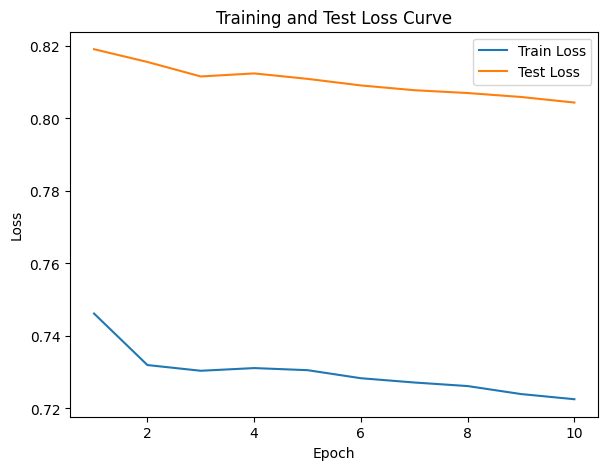

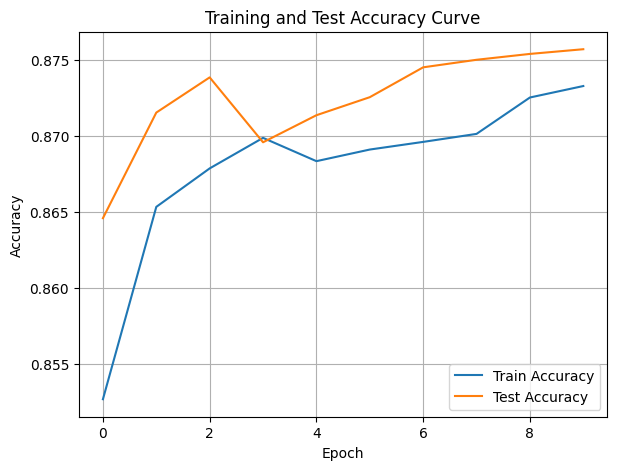

./saved_models/model_10.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=30, out_features=25, bias=True)
    (1): Linear(in_features=25, out_features=25, bias=True)
  )
  (batch_norms): ModuleList(
    (0-1): 2 x BatchNorm1d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=25, out_features=3, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [65]:
DTEmlp8b.train_DTE()

In [66]:
DTEmlp8b.train_single_model()

Training Process:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch [1/150], Train F1:0.4939949660728881, Train Loss: 1.1247, Train Acc: 0.3929, Test F1:0.5564230469045699, Test Loss: 1.0885, Test Acc: 0.5295


Training Process:   1%|▏         | 2/150 [00:00<00:14,  9.89it/s]

Epoch [2/150], Train F1:0.48273798599043827, Train Loss: 1.1214, Train Acc: 0.3872, Test F1:0.5558631326326426, Test Loss: 1.0885, Test Acc: 0.5404


Training Process:   2%|▏         | 3/150 [00:00<00:15,  9.24it/s]

Epoch [3/150], Train F1:0.4851364035260879, Train Loss: 1.1173, Train Acc: 0.3947, Test F1:0.5703427141461587, Test Loss: 1.0863, Test Acc: 0.5518


Training Process:   3%|▎         | 4/150 [00:00<00:15,  9.47it/s]

Epoch [4/150], Train F1:0.4877029773751466, Train Loss: 1.1140, Train Acc: 0.4014, Test F1:0.5864911593368862, Test Loss: 1.0831, Test Acc: 0.5673


Training Process:   3%|▎         | 5/150 [00:00<00:17,  8.40it/s]

Epoch [5/150], Train F1:0.5000719480752003, Train Loss: 1.1100, Train Acc: 0.4142, Test F1:0.5907961174596076, Test Loss: 1.0821, Test Acc: 0.5719


Training Process:   4%|▍         | 6/150 [00:00<00:16,  8.63it/s]

Epoch [6/150], Train F1:0.5034767260012415, Train Loss: 1.1073, Train Acc: 0.4173, Test F1:0.5912628348840583, Test Loss: 1.0811, Test Acc: 0.5723


Training Process:   5%|▍         | 7/150 [00:00<00:16,  8.63it/s]

Epoch [7/150], Train F1:0.5118903280528172, Train Loss: 1.1038, Train Acc: 0.4262, Test F1:0.5908791813250446, Test Loss: 1.0771, Test Acc: 0.5782


Training Process:   5%|▌         | 8/150 [00:00<00:15,  8.89it/s]

Epoch [8/150], Train F1:0.5133253647251799, Train Loss: 1.1011, Train Acc: 0.4307, Test F1:0.5981225791752108, Test Loss: 1.0744, Test Acc: 0.5881


Training Process:   6%|▌         | 9/150 [00:00<00:15,  9.15it/s]

Epoch [9/150], Train F1:0.5184035357548039, Train Loss: 1.0973, Train Acc: 0.4369, Test F1:0.6042743221690591, Test Loss: 1.0730, Test Acc: 0.5925


Training Process:   7%|▋         | 10/150 [00:01<00:15,  9.05it/s]

Epoch [10/150], Train F1:0.5235320934599574, Train Loss: 1.0926, Train Acc: 0.4450, Test F1:0.6099539429736667, Test Loss: 1.0713, Test Acc: 0.5968


Training Process:   7%|▋         | 11/150 [00:01<00:15,  9.08it/s]

Epoch [11/150], Train F1:0.5301017139464892, Train Loss: 1.0890, Train Acc: 0.4537, Test F1:0.612646930065628, Test Loss: 1.0703, Test Acc: 0.6009


Training Process:   8%|▊         | 12/150 [00:01<00:15,  8.99it/s]

Epoch [12/150], Train F1:0.5358597223234971, Train Loss: 1.0858, Train Acc: 0.4595, Test F1:0.6143519840066541, Test Loss: 1.0684, Test Acc: 0.6037


Training Process:   9%|▊         | 13/150 [00:01<00:15,  8.90it/s]

Epoch [13/150], Train F1:0.5409806244719334, Train Loss: 1.0825, Train Acc: 0.4655, Test F1:0.6202363096714505, Test Loss: 1.0662, Test Acc: 0.6096


Training Process:   9%|▉         | 14/150 [00:01<00:15,  8.86it/s]

Epoch [14/150], Train F1:0.5450246654317328, Train Loss: 1.0797, Train Acc: 0.4711, Test F1:0.6233896958573282, Test Loss: 1.0640, Test Acc: 0.6141


Training Process:  10%|█         | 15/150 [00:01<00:17,  7.81it/s]

Epoch [15/150], Train F1:0.5495218326954197, Train Loss: 1.0769, Train Acc: 0.4770, Test F1:0.6277700526084036, Test Loss: 1.0613, Test Acc: 0.6191


Training Process:  11%|█         | 16/150 [00:01<00:17,  7.75it/s]

Epoch [16/150], Train F1:0.5538088713661232, Train Loss: 1.0741, Train Acc: 0.4813, Test F1:0.6321695042203209, Test Loss: 1.0596, Test Acc: 0.6234


Training Process:  11%|█▏        | 17/150 [00:01<00:17,  7.69it/s]

Epoch [17/150], Train F1:0.5582817127257079, Train Loss: 1.0711, Train Acc: 0.4865, Test F1:0.6344114438278005, Test Loss: 1.0590, Test Acc: 0.6254


Training Process:  12%|█▏        | 18/150 [00:02<00:17,  7.65it/s]

Epoch [18/150], Train F1:0.5624814573957321, Train Loss: 1.0675, Train Acc: 0.4921, Test F1:0.6383864449275999, Test Loss: 1.0582, Test Acc: 0.6280


Training Process:  13%|█▎        | 19/150 [00:02<00:17,  7.61it/s]

Epoch [19/150], Train F1:0.5662850986550046, Train Loss: 1.0644, Train Acc: 0.4955, Test F1:0.6417691924418382, Test Loss: 1.0556, Test Acc: 0.6320


Training Process:  13%|█▎        | 20/150 [00:02<00:16,  7.66it/s]

Epoch [20/150], Train F1:0.5722461650523571, Train Loss: 1.0605, Train Acc: 0.5030, Test F1:0.6449772161721057, Test Loss: 1.0536, Test Acc: 0.6356


Training Process:  14%|█▍        | 21/150 [00:02<00:16,  7.70it/s]

Epoch [21/150], Train F1:0.5774599661777899, Train Loss: 1.0569, Train Acc: 0.5090, Test F1:0.6497823582308199, Test Loss: 1.0518, Test Acc: 0.6407


Training Process:  15%|█▍        | 22/150 [00:02<00:17,  7.52it/s]

Epoch [22/150], Train F1:0.5813045387263259, Train Loss: 1.0538, Train Acc: 0.5139, Test F1:0.6580327662173646, Test Loss: 1.0495, Test Acc: 0.6479


Training Process:  16%|█▌        | 24/150 [00:03<00:19,  6.49it/s]

Epoch [23/150], Train F1:0.5867591854430046, Train Loss: 1.0501, Train Acc: 0.5206, Test F1:0.6646781610541722, Test Loss: 1.0474, Test Acc: 0.6543
Epoch [24/150], Train F1:0.5919808774463508, Train Loss: 1.0469, Train Acc: 0.5259, Test F1:0.6729235082954687, Test Loss: 1.0450, Test Acc: 0.6613


Training Process:  17%|█▋        | 26/150 [00:03<00:19,  6.37it/s]

Epoch [25/150], Train F1:0.598132203828098, Train Loss: 1.0435, Train Acc: 0.5324, Test F1:0.6789697138291085, Test Loss: 1.0431, Test Acc: 0.6669
Epoch [26/150], Train F1:0.6025529065838255, Train Loss: 1.0401, Train Acc: 0.5384, Test F1:0.6839685992867234, Test Loss: 1.0415, Test Acc: 0.6714


Training Process:  19%|█▊        | 28/150 [00:03<00:19,  6.25it/s]

Epoch [27/150], Train F1:0.6066252605654047, Train Loss: 1.0373, Train Acc: 0.5423, Test F1:0.6907121263817125, Test Loss: 1.0394, Test Acc: 0.6777
Epoch [28/150], Train F1:0.6125788309010516, Train Loss: 1.0339, Train Acc: 0.5484, Test F1:0.6967399915475547, Test Loss: 1.0369, Test Acc: 0.6834


Training Process:  20%|██        | 30/150 [00:03<00:19,  6.22it/s]

Epoch [29/150], Train F1:0.6170280088986053, Train Loss: 1.0306, Train Acc: 0.5543, Test F1:0.7015744653978709, Test Loss: 1.0350, Test Acc: 0.6883
Epoch [30/150], Train F1:0.6221003481126336, Train Loss: 1.0274, Train Acc: 0.5600, Test F1:0.7064034157284785, Test Loss: 1.0331, Test Acc: 0.6928


Training Process:  21%|██▏       | 32/150 [00:04<00:18,  6.33it/s]

Epoch [31/150], Train F1:0.6255843255452402, Train Loss: 1.0245, Train Acc: 0.5645, Test F1:0.7099956829873727, Test Loss: 1.0308, Test Acc: 0.6968
Epoch [32/150], Train F1:0.6291610155369356, Train Loss: 1.0216, Train Acc: 0.5692, Test F1:0.7144210895801716, Test Loss: 1.0290, Test Acc: 0.7013


Training Process:  23%|██▎       | 34/150 [00:04<00:18,  6.24it/s]

Epoch [33/150], Train F1:0.6334400762081785, Train Loss: 1.0186, Train Acc: 0.5741, Test F1:0.7181869198443904, Test Loss: 1.0270, Test Acc: 0.7055
Epoch [34/150], Train F1:0.637602958209897, Train Loss: 1.0153, Train Acc: 0.5792, Test F1:0.7214280407210497, Test Loss: 1.0251, Test Acc: 0.7092


Training Process:  24%|██▍       | 36/150 [00:04<00:17,  6.52it/s]

Epoch [35/150], Train F1:0.641637954791268, Train Loss: 1.0124, Train Acc: 0.5844, Test F1:0.725258171291126, Test Loss: 1.0234, Test Acc: 0.7131
Epoch [36/150], Train F1:0.6454019915926733, Train Loss: 1.0092, Train Acc: 0.5895, Test F1:0.7297478875408115, Test Loss: 1.0214, Test Acc: 0.7173


Training Process:  25%|██▍       | 37/150 [00:05<00:18,  5.97it/s]

Epoch [37/150], Train F1:0.6502099177623714, Train Loss: 1.0059, Train Acc: 0.5950, Test F1:0.732937032174234, Test Loss: 1.0193, Test Acc: 0.7208


Training Process:  25%|██▌       | 38/150 [00:05<00:19,  5.72it/s]

Epoch [38/150], Train F1:0.6540430388766226, Train Loss: 1.0029, Train Acc: 0.5998, Test F1:0.7351773691768791, Test Loss: 1.0170, Test Acc: 0.7235


Training Process:  26%|██▌       | 39/150 [00:05<00:20,  5.38it/s]

Epoch [39/150], Train F1:0.6577196678079207, Train Loss: 0.9999, Train Acc: 0.6038, Test F1:0.7365176317930437, Test Loss: 1.0146, Test Acc: 0.7259


Training Process:  27%|██▋       | 40/150 [00:05<00:20,  5.32it/s]

Epoch [40/150], Train F1:0.6617596747155589, Train Loss: 0.9970, Train Acc: 0.6088, Test F1:0.7377894693799665, Test Loss: 1.0125, Test Acc: 0.7282


Training Process:  27%|██▋       | 41/150 [00:05<00:20,  5.34it/s]

Epoch [41/150], Train F1:0.6651001408611011, Train Loss: 0.9945, Train Acc: 0.6128, Test F1:0.740953699390118, Test Loss: 1.0104, Test Acc: 0.7315


Training Process:  28%|██▊       | 42/150 [00:06<00:23,  4.66it/s]

Epoch [42/150], Train F1:0.6695702338771232, Train Loss: 0.9914, Train Acc: 0.6173, Test F1:0.7436511964721347, Test Loss: 1.0082, Test Acc: 0.7344


Training Process:  29%|██▊       | 43/150 [00:06<00:22,  4.74it/s]

Epoch [43/150], Train F1:0.6737207276606785, Train Loss: 0.9884, Train Acc: 0.6217, Test F1:0.7467851243351198, Test Loss: 1.0064, Test Acc: 0.7376


Training Process:  29%|██▉       | 44/150 [00:06<00:22,  4.78it/s]

Epoch [44/150], Train F1:0.6765934892128075, Train Loss: 0.9858, Train Acc: 0.6252, Test F1:0.7494777173299734, Test Loss: 1.0042, Test Acc: 0.7404


Training Process:  30%|███       | 45/150 [00:06<00:22,  4.74it/s]

Epoch [45/150], Train F1:0.6803053569348648, Train Loss: 0.9829, Train Acc: 0.6298, Test F1:0.7523086777149187, Test Loss: 1.0023, Test Acc: 0.7433


Epoch [46/150], Train F1:0.6835123621552673, Train Loss: 0.9800, Train Acc: 0.6338, Test F1:0.7547359800203076, Test Loss: 1.0005, Test Acc: 0.7459


Training Process:  31%|███▏      | 47/150 [00:07<00:20,  5.04it/s]

Epoch [47/150], Train F1:0.6873634508909557, Train Loss: 0.9770, Train Acc: 0.6382, Test F1:0.7570483250501198, Test Loss: 0.9987, Test Acc: 0.7484


Training Process:  32%|███▏      | 48/150 [00:07<00:20,  5.03it/s]

Epoch [48/150], Train F1:0.6911437413945329, Train Loss: 0.9741, Train Acc: 0.6422, Test F1:0.7590019257008174, Test Loss: 0.9967, Test Acc: 0.7506


Training Process:  33%|███▎      | 49/150 [00:07<00:20,  4.91it/s]

Epoch [49/150], Train F1:0.6943800469532869, Train Loss: 0.9716, Train Acc: 0.6456, Test F1:0.7598842859150625, Test Loss: 0.9947, Test Acc: 0.7520


Training Process:  33%|███▎      | 50/150 [00:07<00:20,  4.80it/s]

Epoch [50/150], Train F1:0.6975865937158278, Train Loss: 0.9691, Train Acc: 0.6491, Test F1:0.7612110576012567, Test Loss: 0.9927, Test Acc: 0.7536


Training Process:  34%|███▍      | 51/150 [00:08<00:23,  4.21it/s]

Epoch [51/150], Train F1:0.7001313602587615, Train Loss: 0.9668, Train Acc: 0.6521, Test F1:0.7636567406649182, Test Loss: 0.9907, Test Acc: 0.7559


Training Process:  35%|███▍      | 52/150 [00:08<00:24,  4.00it/s]

Epoch [52/150], Train F1:0.7030060623365795, Train Loss: 0.9642, Train Acc: 0.6555, Test F1:0.76553827436136, Test Loss: 0.9887, Test Acc: 0.7579


Training Process:  35%|███▌      | 53/150 [00:08<00:22,  4.22it/s]

Epoch [53/150], Train F1:0.7056838474208105, Train Loss: 0.9618, Train Acc: 0.6587, Test F1:0.7680139337928623, Test Loss: 0.9870, Test Acc: 0.7603


Training Process:  36%|███▌      | 54/150 [00:08<00:21,  4.45it/s]

Epoch [54/150], Train F1:0.7081277210743245, Train Loss: 0.9592, Train Acc: 0.6619, Test F1:0.7694376082234472, Test Loss: 0.9852, Test Acc: 0.7619


Training Process:  37%|███▋      | 55/150 [00:09<00:20,  4.53it/s]

Epoch [55/150], Train F1:0.7105045937682278, Train Loss: 0.9566, Train Acc: 0.6649, Test F1:0.7717349336894906, Test Loss: 0.9835, Test Acc: 0.7642


Training Process:  38%|███▊      | 57/150 [00:09<00:18,  4.97it/s]

Epoch [56/150], Train F1:0.7129685476351441, Train Loss: 0.9542, Train Acc: 0.6680, Test F1:0.7738722962991947, Test Loss: 0.9815, Test Acc: 0.7664
Epoch [57/150], Train F1:0.7152654345147326, Train Loss: 0.9516, Train Acc: 0.6709, Test F1:0.7761326472455854, Test Loss: 0.9797, Test Acc: 0.7686


Training Process:  39%|███▊      | 58/150 [00:09<00:17,  5.18it/s]

Epoch [58/150], Train F1:0.7177023185462353, Train Loss: 0.9492, Train Acc: 0.6737, Test F1:0.7777672535248817, Test Loss: 0.9779, Test Acc: 0.7703


Training Process:  39%|███▉      | 59/150 [00:09<00:19,  4.66it/s]

Epoch [59/150], Train F1:0.7208409628330371, Train Loss: 0.9466, Train Acc: 0.6774, Test F1:0.7797350264765702, Test Loss: 0.9762, Test Acc: 0.7722


Training Process:  40%|████      | 60/150 [00:10<00:19,  4.70it/s]

Epoch [60/150], Train F1:0.7232073597051751, Train Loss: 0.9443, Train Acc: 0.6801, Test F1:0.7816296519082269, Test Loss: 0.9744, Test Acc: 0.7741


Training Process:  41%|████      | 61/150 [00:10<00:19,  4.63it/s]

Epoch [61/150], Train F1:0.7253800339065052, Train Loss: 0.9419, Train Acc: 0.6829, Test F1:0.7834551452720036, Test Loss: 0.9727, Test Acc: 0.7760


Training Process:  41%|████▏     | 62/150 [00:10<00:18,  4.70it/s]

Epoch [62/150], Train F1:0.7275973446700256, Train Loss: 0.9397, Train Acc: 0.6853, Test F1:0.7847879762255446, Test Loss: 0.9708, Test Acc: 0.7774


Training Process:  42%|████▏     | 63/150 [00:10<00:18,  4.67it/s]

In [ ]:
DTEmlp8b.train_DTE()

In [ ]:
DTEmlp8b.train_single_model()

In [ ]:
DTEmlp8b.train_DTE()

In [ ]:
DTEmlp8b.train_single_model()

## Base 10

In [ ]:
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
DTEmlp10b = DeepTreeEnsemble(task_name='classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=10,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.0001)

In [ ]:
DTEmlp10b.train_DTE()

In [ ]:
DTEmlp10b.train_single_model()

In [ ]:
DTEmlp10b.train_DTE()

In [ ]:
DTEmlp10b.train_single_model()

In [ ]:
DTEmlp10b.train_DTE()

In [ ]:
DTEmlp10b.train_single_model()

In [ ]:
DTEmlp10b.train_DTE()

In [ ]:
DTEmlp10b.train_single_model()

In [ ]:
DTEmlp10b.train_DTE()

In [ ]:
DTEmlp10b.train_single_model()

## Base 12

In [ ]:
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
DTEmlp12b = DeepTreeEnsemble(task_name='classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=12,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.0001)

In [ ]:
DTEmlp12b.train_DTE()

In [ ]:
DTEmlp12b.train_single_model()

In [ ]:
DTEmlp12b.train_DTE()

In [ ]:
DTEmlp12b.train_single_model()

In [ ]:
DTEmlp12b.train_DTE()

In [ ]:
DTEmlp12b.train_single_model()

In [ ]:
DTEmlp12b.train_DTE()

In [ ]:
DTEmlp12b.train_single_model()

In [ ]:
DTEmlp12b.train_DTE()

In [ ]:
DTEmlp12b.train_single_model()